In [43]:
spark.stop()

In [59]:
# For PySpark
import pyspark
from pyspark.sql import SparkSession
from pyspark.sql.types import StructType, StructField, StringType

# For Delta Lake
from delta import *

# Working with images
from PIL import Image
import io
import base64

import pickle
from itertools import groupby

# for loading/processing the images  
from keras.preprocessing.image import load_img 
from keras.preprocessing.image import img_to_array 
from keras.applications.vgg16 import preprocess_input

# models 
from keras.applications.vgg16 import VGG16 
from keras.models import Model

# clustering and dimension reduction
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.datasets import load_digits

import numpy as np
import matplotlib.pyplot as plt

from progressbar import ProgressBar

import time

import os
import sys
os.environ["SPARK_HOME"] = "/opt/spark-3.0.1-bin-hadoop2.7"
os.environ['PYSPARK_PYTHON'] = sys.executable
os.environ['PYSPARK_DRIVER_PYTHON'] = sys.executable

In [2]:
# These 2 links include the jar files needed to interact with AWS S3
!wget https://repo1.maven.org/maven2/com/amazonaws/aws-java-sdk/1.7.4/aws-java-sdk-1.7.4.jar -P $SPARK_HOME/jars/
!wget https://repo1.maven.org/maven2/org/apache/hadoop/hadoop-aws/2.7.3/hadoop-aws-2.7.3.jar -P $SPARK_HOME/jars/

--2022-04-26 23:42:14--  https://repo1.maven.org/maven2/com/amazonaws/aws-java-sdk/1.7.4/aws-java-sdk-1.7.4.jar
Resolving repo1.maven.org (repo1.maven.org)... 199.232.192.209, 199.232.196.209
Connecting to repo1.maven.org (repo1.maven.org)|199.232.192.209|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 11948376 (11M) [application/java-archive]
Saving to: ‘/opt/spark-3.0.1-bin-hadoop2.7/jars/aws-java-sdk-1.7.4.jar’

aws-java-sdk-1.7.4. 100%[===================>]  11.39M  --.-KB/s    in 0.1s    

2022-04-26 23:42:15 (106 MB/s) - ‘/opt/spark-3.0.1-bin-hadoop2.7/jars/aws-java-sdk-1.7.4.jar’ saved [11948376/11948376]

--2022-04-26 23:42:16--  https://repo1.maven.org/maven2/org/apache/hadoop/hadoop-aws/2.7.3/hadoop-aws-2.7.3.jar
Resolving repo1.maven.org (repo1.maven.org)... 199.232.192.209, 199.232.196.209
Connecting to repo1.maven.org (repo1.maven.org)|199.232.192.209|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 126287 (123K) [applicat

In [3]:
# Create a Spark Session
spark = SparkSession.builder.appName("drones") \
    .config("spark.executor.memory", "25g") \
    .config("spark.driver.memory", "25g") \
    .config("spark.jars.packages", "io.delta:delta-core_2.12:0.7.0") \
    .config("spark.delta.logStore.class", "org.apache.spark.sql.delta.storage.S3SingleDriverLogStore") \
    .getOrCreate()

In [4]:
spark

In [5]:
with open('../img_path.pickle','rb') as file:
    img_path = pickle.load(file)
len(img_path)

1570557

In [6]:
one_tenth = len(img_path)//10

img_paths1TB = img_path[:3*one_tenth]
len(img_paths1TB)

471165

In [7]:
# get a list of flight ids (folder names)
flight_ids = []
for path_name in img_paths1TB: #switch name
    flight_ids.append(path_name[13:45])
len(flight_ids)

471165

In [8]:
flight_img_counts = [len(list(group)) for key, group in groupby(flight_ids)]
print(flight_img_counts[0:10])

[1199, 1199, 1199, 1199, 1199, 1199, 1199, 1199, 1198, 1199]


In [9]:
len(flight_img_counts)

394

In [10]:
model = VGG16()
model = Model(inputs = model.inputs, outputs = model.layers[-2].output)

553467904/553467096 [==============================] - 2s 0us/step


In [11]:
training = {}

In [17]:
k = 0

for i in range(len(flight_img_counts[55:])):
    i = i + 56
    starting_time = time.time()
    prv_n_images = sum(flight_img_counts[0:i])
    flight_id = flight_ids[prv_n_images]
    
    s3_bucket_name = "s3a://drones-project-test/" + flight_id + "/"
    df = spark.read.format("delta").load(s3_bucket_name)
    print("Total time to read back flight", i, "(#", flight_id, ") from our s3 bucket took", time.time()-starting_time, "seconds.")
    
    images_df = df.rdd.map(lambda x: x["img_content"])
    n_images = images_df.count()
    content = images_df.take(n_images)
    print("Starting feature extraction for flight", i, "at:", time.time()-starting_time)
    one_fifth = n_images//5
    for j in range(one_fifth): #test set: 4*one_fifth
        png_decoded = base64.b64decode(content[j][1:]) # j + one_fifth
        print("Image decoded", time.time()-starting_time)
        img = Image.open(io.BytesIO(png_decoded))
        img2 = np.array(img)
        print("Reshaping image", time.time()-starting_time)
        reshaped_img = img2.reshape(1,224,224,3)
        imgx = preprocess_input(reshaped_img)
        print("Extracting features", time.time()-starting_time)
        features = model.predict(imgx, use_multiprocessing=True)
        training[k] = features
        k = k + 1
    
    print("Done with flight", i)
    del images_df
    del df
    del s3_bucket_name
    del content

Total time to read back flight 56 (# 0420c148199a4f4db1b2f438684130a4 ) from our s3 bucket took 1.7348816394805908 seconds.
Starting feature extraction for flight 56 at: 7.684660196304321
Image decoded 7.685468912124634
Reshaping image 7.687776565551758
Extracting features 7.688797473907471
Image decoded 7.846127986907959
Reshaping image 7.848010540008545
Extracting features 7.8487653732299805
Image decoded 8.001466989517212
Reshaping image 8.003430843353271
Extracting features 8.004201650619507
Image decoded 8.157956838607788
Reshaping image 8.159873962402344
Extracting features 8.160753011703491
Image decoded 8.315091848373413
Reshaping image 8.31749439239502
Extracting features 8.318221807479858
Image decoded 8.468596935272217
Reshaping image 8.470876932144165
Extracting features 8.47161340713501
Image decoded 8.621577501296997
Reshaping image 8.623436689376831
Extracting features 8.624436378479004
Image decoded 8.825297594070435
Reshaping image 8.827071905136108
Extracting features

Image decoded 19.563660621643066
Reshaping image 19.565539360046387
Extracting features 19.566285848617554
Image decoded 19.72035789489746
Reshaping image 19.722254276275635
Extracting features 19.72321653366089
Image decoded 19.880266666412354
Reshaping image 19.88215136528015
Extracting features 19.88286805152893
Image decoded 20.030895709991455
Reshaping image 20.033252954483032
Extracting features 20.03398370742798
Image decoded 20.183146953582764
Reshaping image 20.185080528259277
Extracting features 20.18587017059326
Image decoded 20.3332576751709
Reshaping image 20.33505153656006
Extracting features 20.335423469543457
Image decoded 20.485642194747925
Reshaping image 20.487943649291992
Extracting features 20.488625049591064
Image decoded 20.634700775146484
Reshaping image 20.636579036712646
Extracting features 20.637298345565796
Image decoded 20.782111167907715
Reshaping image 20.784326553344727
Extracting features 20.7850821018219
Image decoded 20.933063507080078
Reshaping image

Image decoded 31.460697889328003
Reshaping image 31.46273636817932
Extracting features 31.463762521743774
Image decoded 31.61568856239319
Reshaping image 31.617714166641235
Extracting features 31.618489980697632
Image decoded 31.770647764205933
Reshaping image 31.77307915687561
Extracting features 31.77384901046753
Image decoded 31.924471378326416
Reshaping image 31.926401376724243
Extracting features 31.92722725868225
Image decoded 32.07696986198425
Reshaping image 32.07892656326294
Extracting features 32.079715967178345
Image decoded 32.23624134063721
Reshaping image 32.238162994384766
Extracting features 32.239102602005005
Image decoded 32.39096808433533
Reshaping image 32.3929717540741
Extracting features 32.39386606216431
Image decoded 32.54503893852234
Reshaping image 32.54698729515076
Extracting features 32.54777193069458
Image decoded 32.702054023742676
Reshaping image 32.70465064048767
Extracting features 32.70565342903137
Image decoded 32.857715368270874
Reshaping image 32.85

Image decoded 43.78541946411133
Reshaping image 43.787862062454224
Extracting features 43.78874397277832
Image decoded 43.941352128982544
Reshaping image 43.94362497329712
Extracting features 43.94441890716553
Image decoded 44.092568159103394
Reshaping image 44.09485745429993
Extracting features 44.09554600715637
Image decoded 44.245527505874634
Reshaping image 44.24774146080017
Extracting features 44.24867010116577
Done with flight 56
Total time to read back flight 57 (# 04254ee8e3da4b8bb4b65f050c2ad798 ) from our s3 bucket took 1.6291778087615967 seconds.
Starting feature extraction for flight 57 at: 6.257262468338013
Image decoded 6.258244514465332
Reshaping image 6.26022481918335
Extracting features 6.26114296913147
Image decoded 6.416787385940552
Reshaping image 6.4187397956848145
Extracting features 6.419587135314941
Image decoded 6.582784652709961
Reshaping image 6.584800958633423
Extracting features 6.5857720375061035
Image decoded 6.737358093261719
Reshaping image 6.7397131919

Image decoded 18.000492572784424
Reshaping image 18.00264310836792
Extracting features 18.00344467163086
Image decoded 18.15570616722107
Reshaping image 18.15788435935974
Extracting features 18.15877914428711
Image decoded 18.3210129737854
Reshaping image 18.322851419448853
Extracting features 18.323630332946777
Image decoded 18.47467875480652
Reshaping image 18.476529598236084
Extracting features 18.47749400138855
Image decoded 18.62886619567871
Reshaping image 18.630824327468872
Extracting features 18.631555557250977
Image decoded 18.78446650505066
Reshaping image 18.78672981262207
Extracting features 18.78758668899536
Image decoded 18.940428256988525
Reshaping image 18.942638635635376
Extracting features 18.943386793136597
Image decoded 19.0917706489563
Reshaping image 19.09361243247986
Extracting features 19.093977212905884
Image decoded 19.25069808959961
Reshaping image 19.252578735351562
Extracting features 19.25346851348877
Image decoded 19.41140842437744
Reshaping image 19.4132

Image decoded 30.09709882736206
Reshaping image 30.099634885787964
Extracting features 30.10035490989685
Image decoded 30.252873182296753
Reshaping image 30.254979848861694
Extracting features 30.255910873413086
Image decoded 30.403910875320435
Reshaping image 30.406402587890625
Extracting features 30.40730619430542
Image decoded 30.55292773246765
Reshaping image 30.554993867874146
Extracting features 30.555701732635498
Image decoded 30.703832149505615
Reshaping image 30.705953359603882
Extracting features 30.706645250320435
Image decoded 30.863298892974854
Reshaping image 30.86532998085022
Extracting features 30.866140604019165
Image decoded 31.014633893966675
Reshaping image 31.01677703857422
Extracting features 31.01747751235962
Image decoded 31.166466236114502
Reshaping image 31.168601989746094
Extracting features 31.16948699951172
Image decoded 31.3184974193573
Reshaping image 31.320526361465454
Extracting features 31.321375846862793
Image decoded 31.469118356704712
Reshaping imag

Image decoded 42.32889795303345
Reshaping image 42.33104157447815
Extracting features 42.331835985183716
Image decoded 42.483023166656494
Reshaping image 42.485034465789795
Extracting features 42.48577332496643
Image decoded 42.63145589828491
Reshaping image 42.63344764709473
Extracting features 42.6341667175293
Image decoded 42.78088736534119
Reshaping image 42.783294916152954
Extracting features 42.78396797180176
Image decoded 42.92849373817444
Reshaping image 42.930569887161255
Extracting features 42.93147015571594
Image decoded 43.07845759391785
Reshaping image 43.080488443374634
Extracting features 43.081151723861694
Image decoded 43.23550581932068
Reshaping image 43.238022804260254
Extracting features 43.23896384239197
Image decoded 43.385265827178955
Reshaping image 43.38758134841919
Extracting features 43.388277530670166
Done with flight 57
Total time to read back flight 58 (# 0436166bc94a43389fd0a6db41a3316e ) from our s3 bucket took 1.6481449604034424 seconds.
Starting featur

Image decoded 16.773513078689575
Reshaping image 16.775757312774658
Extracting features 16.776440382003784
Image decoded 16.92442226409912
Reshaping image 16.92668867111206
Extracting features 16.927560091018677
Image decoded 17.084508180618286
Reshaping image 17.086706161499023
Extracting features 17.08754014968872
Image decoded 17.263071298599243
Reshaping image 17.265710830688477
Extracting features 17.266405820846558
Image decoded 17.41875672340393
Reshaping image 17.421394109725952
Extracting features 17.422154188156128
Image decoded 17.57642149925232
Reshaping image 17.5785653591156
Extracting features 17.579385995864868
Image decoded 17.72784972190857
Reshaping image 17.730318307876587
Extracting features 17.731061697006226
Image decoded 17.8755145072937
Reshaping image 17.87791085243225
Extracting features 17.878470420837402
Image decoded 18.02255606651306
Reshaping image 18.024895906448364
Extracting features 18.025487422943115
Image decoded 18.16913890838623
Reshaping image 1

Image decoded 28.639255046844482
Reshaping image 28.641671895980835
Extracting features 28.642507076263428
Image decoded 28.789799213409424
Reshaping image 28.791954278945923
Extracting features 28.792842149734497
Image decoded 28.94324803352356
Reshaping image 28.94558572769165
Extracting features 28.946208238601685
Image decoded 29.09365439414978
Reshaping image 29.095656394958496
Extracting features 29.096614122390747
Image decoded 29.2472722530365
Reshaping image 29.249173164367676
Extracting features 29.25005340576172
Image decoded 29.401379346847534
Reshaping image 29.40328025817871
Extracting features 29.404040336608887
Image decoded 29.549644231796265
Reshaping image 29.55160093307495
Extracting features 29.552294492721558
Image decoded 29.69925880432129
Reshaping image 29.70128035545349
Extracting features 29.702033042907715
Image decoded 29.84609889984131
Reshaping image 29.84803056716919
Extracting features 29.848722457885742
Image decoded 29.99550986289978
Reshaping image 2

Image decoded 40.923492193222046
Reshaping image 40.925482988357544
Extracting features 40.92622900009155
Image decoded 41.07465171813965
Reshaping image 41.076700925827026
Extracting features 41.07745385169983
Image decoded 41.22176146507263
Reshaping image 41.22382998466492
Extracting features 41.22483730316162
Image decoded 41.371376752853394
Reshaping image 41.37337112426758
Extracting features 41.37395715713501
Image decoded 41.52060055732727
Reshaping image 41.52311563491821
Extracting features 41.52384543418884
Image decoded 41.67197251319885
Reshaping image 41.67394256591797
Extracting features 41.6746392250061
Image decoded 41.82812237739563
Reshaping image 41.83015537261963
Extracting features 41.830820083618164
Image decoded 41.9783980846405
Reshaping image 41.98043203353882
Extracting features 41.981221437454224
Image decoded 42.130250215530396
Reshaping image 42.1322717666626
Extracting features 42.13299059867859
Image decoded 42.27881622314453
Reshaping image 42.280888080

Image decoded 15.990450859069824
Reshaping image 15.99274206161499
Extracting features 15.99344277381897
Image decoded 16.145519971847534
Reshaping image 16.14790391921997
Extracting features 16.148513555526733
Image decoded 16.293760776519775
Reshaping image 16.295761823654175
Extracting features 16.29651927947998
Image decoded 16.443403244018555
Reshaping image 16.445881128311157
Extracting features 16.446764707565308
Image decoded 16.59359312057495
Reshaping image 16.59614062309265
Extracting features 16.597032070159912
Image decoded 16.744515419006348
Reshaping image 16.746925592422485
Extracting features 16.747801303863525
Image decoded 16.902374029159546
Reshaping image 16.904377937316895
Extracting features 16.905195951461792
Image decoded 17.050713062286377
Reshaping image 17.052964687347412
Extracting features 17.0535306930542
Image decoded 17.196564435958862
Reshaping image 17.19884490966797
Extracting features 17.19956398010254
Image decoded 17.344531297683716
Reshaping imag

Image decoded 27.854469299316406
Reshaping image 27.856768369674683
Extracting features 27.857412338256836
Image decoded 28.002564191818237
Reshaping image 28.004665851593018
Extracting features 28.005416870117188
Image decoded 28.15416932106018
Reshaping image 28.156250715255737
Extracting features 28.157066822052002
Image decoded 28.304457187652588
Reshaping image 28.30702233314514
Extracting features 28.30774688720703
Image decoded 28.466243028640747
Reshaping image 28.468373775482178
Extracting features 28.46925115585327
Image decoded 28.61863946914673
Reshaping image 28.621378898620605
Extracting features 28.62211847305298
Image decoded 28.770178079605103
Reshaping image 28.772260904312134
Extracting features 28.772945404052734
Image decoded 28.918293714523315
Reshaping image 28.920732498168945
Extracting features 28.92141580581665
Image decoded 29.065738677978516
Reshaping image 29.067918062210083
Extracting features 29.068624258041382
Image decoded 29.215389728546143
Reshaping i

Image decoded 40.02729034423828
Reshaping image 40.02941584587097
Extracting features 40.03037643432617
Image decoded 40.18156981468201
Reshaping image 40.18412971496582
Extracting features 40.18497896194458
Image decoded 40.33729934692383
Reshaping image 40.34001040458679
Extracting features 40.340747117996216
Image decoded 40.49024701118469
Reshaping image 40.492597341537476
Extracting features 40.493812561035156
Image decoded 40.645280838012695
Reshaping image 40.648072719573975
Extracting features 40.64904570579529
Image decoded 40.79718732833862
Reshaping image 40.79933214187622
Extracting features 40.80023550987244
Image decoded 40.94859504699707
Reshaping image 40.9512505531311
Extracting features 40.95199179649353
Image decoded 41.10231423377991
Reshaping image 41.10447692871094
Extracting features 41.10511326789856
Image decoded 41.25935244560242
Reshaping image 41.261900663375854
Extracting features 41.2624876499176
Image decoded 41.40833783149719
Reshaping image 41.410443305

Image decoded 15.546481847763062
Reshaping image 15.549223899841309
Extracting features 15.550094842910767
Image decoded 15.701038837432861
Reshaping image 15.703647136688232
Extracting features 15.704346418380737
Image decoded 15.852996110916138
Reshaping image 15.855560779571533
Extracting features 15.856184482574463
Image decoded 16.009773015975952
Reshaping image 16.012449979782104
Extracting features 16.01314663887024
Image decoded 16.158087015151978
Reshaping image 16.160475969314575
Extracting features 16.16130757331848
Image decoded 16.30570697784424
Reshaping image 16.308213710784912
Extracting features 16.308871746063232
Image decoded 16.453357696533203
Reshaping image 16.45546317100525
Extracting features 16.45616054534912
Image decoded 16.603142738342285
Reshaping image 16.60531973838806
Extracting features 16.606049060821533
Image decoded 16.757612943649292
Reshaping image 16.75972557067871
Extracting features 16.760519981384277
Image decoded 16.90615940093994
Reshaping im

Image decoded 27.421786069869995
Reshaping image 27.424012184143066
Extracting features 27.424755334854126
Image decoded 27.573206901550293
Reshaping image 27.575743913650513
Extracting features 27.57666325569153
Image decoded 27.726033926010132
Reshaping image 27.728280544281006
Extracting features 27.728976249694824
Image decoded 27.8776638507843
Reshaping image 27.879833936691284
Extracting features 27.880549430847168
Image decoded 28.026668071746826
Reshaping image 28.029312133789062
Extracting features 28.030032634735107
Image decoded 28.175928115844727
Reshaping image 28.17818021774292
Extracting features 28.178842544555664
Image decoded 28.330726385116577
Reshaping image 28.333236694335938
Extracting features 28.333917140960693
Image decoded 28.478030681610107
Reshaping image 28.48021697998047
Extracting features 28.480892419815063
Image decoded 28.62504744529724
Reshaping image 28.627615213394165
Extracting features 28.628262042999268
Image decoded 28.776966094970703
Reshaping 

Image decoded 39.17996573448181
Reshaping image 39.182700872421265
Extracting features 39.18349504470825
Image decoded 39.329824924468994
Reshaping image 39.332319259643555
Extracting features 39.33301639556885
Image decoded 39.481717109680176
Reshaping image 39.48389148712158
Extracting features 39.484707832336426
Image decoded 39.63084149360657
Reshaping image 39.633044481277466
Extracting features 39.63383412361145
Image decoded 39.77975940704346
Reshaping image 39.782490491867065
Extracting features 39.783361196517944
Image decoded 39.9294855594635
Reshaping image 39.93203353881836
Extracting features 39.93262267112732
Image decoded 40.08274745941162
Reshaping image 40.0849072933197
Extracting features 40.08570837974548
Image decoded 40.23548460006714
Reshaping image 40.23778986930847
Extracting features 40.23866391181946
Image decoded 40.38819456100464
Reshaping image 40.390864849090576
Extracting features 40.391669511795044
Image decoded 40.54697895050049
Reshaping image 40.54907

Image decoded 14.86221718788147
Reshaping image 14.864668846130371
Extracting features 14.865494728088379
Image decoded 15.013166427612305
Reshaping image 15.015809535980225
Extracting features 15.016449213027954
Image decoded 15.163531303405762
Reshaping image 15.165824174880981
Extracting features 15.16653060913086
Image decoded 15.312422037124634
Reshaping image 15.314844608306885
Extracting features 15.315673112869263
Image decoded 15.466645956039429
Reshaping image 15.469006299972534
Extracting features 15.469704389572144
Image decoded 15.616705656051636
Reshaping image 15.618870496749878
Extracting features 15.61961030960083
Image decoded 15.765624046325684
Reshaping image 15.76828408241272
Extracting features 15.769226789474487
Image decoded 15.919395923614502
Reshaping image 15.922117233276367
Extracting features 15.92283821105957
Image decoded 16.071595907211304
Reshaping image 16.073774337768555
Extracting features 16.074461221694946
Image decoded 16.223443746566772
Reshaping

Image decoded 26.592411756515503
Reshaping image 26.59455180168152
Extracting features 26.59544825553894
Image decoded 26.745656728744507
Reshaping image 26.748170137405396
Extracting features 26.748950719833374
Image decoded 26.90586805343628
Reshaping image 26.908021688461304
Extracting features 26.908974170684814
Image decoded 27.058199882507324
Reshaping image 27.0608127117157
Extracting features 27.061702013015747
Image decoded 27.21368932723999
Reshaping image 27.215816259384155
Extracting features 27.216776132583618
Image decoded 27.364770889282227
Reshaping image 27.36692786216736
Extracting features 27.36776113510132
Image decoded 27.525411128997803
Reshaping image 27.528056859970093
Extracting features 27.529029369354248
Image decoded 27.693763256072998
Reshaping image 27.695887327194214
Extracting features 27.6966392993927
Image decoded 27.850882291793823
Reshaping image 27.853070497512817
Extracting features 27.853881120681763
Image decoded 28.003501415252686
Reshaping imag

Image decoded 38.44415998458862
Reshaping image 38.44609308242798
Extracting features 38.44701790809631
Image decoded 38.605711460113525
Reshaping image 38.60768747329712
Extracting features 38.608537912368774
Image decoded 38.75350284576416
Reshaping image 38.755714893341064
Extracting features 38.75634503364563
Image decoded 38.900643825531006
Reshaping image 38.90296697616577
Extracting features 38.90360760688782
Image decoded 39.049023151397705
Reshaping image 39.05129408836365
Extracting features 39.05198097229004
Image decoded 39.198203802108765
Reshaping image 39.20012140274048
Extracting features 39.20084357261658
Image decoded 39.34529089927673
Reshaping image 39.347687005996704
Extracting features 39.348395347595215
Image decoded 39.49607467651367
Reshaping image 39.49805736541748
Extracting features 39.498730182647705
Image decoded 39.646507024765015
Reshaping image 39.64848017692566
Extracting features 39.649054527282715
Image decoded 39.79513955116272
Reshaping image 39.79

Image decoded 13.583389043807983
Reshaping image 13.58562445640564
Extracting features 13.586464881896973
Image decoded 13.73464560508728
Reshaping image 13.737069606781006
Extracting features 13.73780608177185
Image decoded 13.886091232299805
Reshaping image 13.888759851455688
Extracting features 13.88960886001587
Image decoded 14.045799255371094
Reshaping image 14.048599481582642
Extracting features 14.049392461776733
Image decoded 14.200906991958618
Reshaping image 14.203607082366943
Extracting features 14.204308986663818
Image decoded 14.355427026748657
Reshaping image 14.357890367507935
Extracting features 14.358744382858276
Image decoded 14.521815299987793
Reshaping image 14.524848222732544
Extracting features 14.52583646774292
Image decoded 14.6814706325531
Reshaping image 14.683884382247925
Extracting features 14.684603691101074
Image decoded 14.839834451675415
Reshaping image 14.842765808105469
Extracting features 14.843688726425171
Image decoded 14.994125843048096
Reshaping i

Image decoded 25.57744073867798
Reshaping image 25.580227375030518
Extracting features 25.581087827682495
Image decoded 25.736770629882812
Reshaping image 25.739437580108643
Extracting features 25.73982000350952
Image decoded 25.901270866394043
Reshaping image 25.90411400794983
Extracting features 25.9050350189209
Image decoded 26.057225465774536
Reshaping image 26.059579372406006
Extracting features 26.06026577949524
Image decoded 26.211612462997437
Reshaping image 26.2139093875885
Extracting features 26.214767694473267
Image decoded 26.363144636154175
Reshaping image 26.365379333496094
Extracting features 26.366020679473877
Image decoded 26.512968063354492
Reshaping image 26.515793800354004
Extracting features 26.516427516937256
Image decoded 26.663536310195923
Reshaping image 26.665833711624146
Extracting features 26.666558027267456
Image decoded 26.81032085418701
Reshaping image 26.81312131881714
Extracting features 26.8139328956604
Image decoded 26.966207265853882
Reshaping image 

Image decoded 37.41321659088135
Reshaping image 37.41545605659485
Extracting features 37.41615414619446
Image decoded 37.565168619155884
Reshaping image 37.567424297332764
Extracting features 37.568235874176025
Image decoded 37.71887826919556
Reshaping image 37.72150468826294
Extracting features 37.72224521636963
Image decoded 37.87836313247681
Reshaping image 37.88090133666992
Extracting features 37.88154578208923
Image decoded 38.03109097480774
Reshaping image 38.033793210983276
Extracting features 38.03451204299927
Image decoded 38.18154215812683
Reshaping image 38.183818101882935
Extracting features 38.18466377258301
Image decoded 38.33332538604736
Reshaping image 38.3355770111084
Extracting features 38.336427450180054
Image decoded 38.48104381561279
Reshaping image 38.48323917388916
Extracting features 38.48396611213684
Image decoded 38.63245368003845
Reshaping image 38.6350793838501
Extracting features 38.63583278656006
Image decoded 38.786349296569824
Reshaping image 38.78924298

Image decoded 12.518048763275146
Reshaping image 12.520679473876953
Extracting features 12.521364688873291
Image decoded 12.6680269241333
Reshaping image 12.670220136642456
Extracting features 12.670889854431152
Image decoded 12.817054033279419
Reshaping image 12.81957745552063
Extracting features 12.820310115814209
Image decoded 12.965099811553955
Reshaping image 12.967319965362549
Extracting features 12.968329429626465
Image decoded 13.113808393478394
Reshaping image 13.116382122039795
Extracting features 13.116921424865723
Image decoded 13.262199878692627
Reshaping image 13.264774560928345
Extracting features 13.265502691268921
Image decoded 13.414597749710083
Reshaping image 13.417356729507446
Extracting features 13.418099880218506
Image decoded 13.572007417678833
Reshaping image 13.574234962463379
Extracting features 13.574891567230225
Image decoded 13.720443725585938
Reshaping image 13.72299599647522
Extracting features 13.723834991455078
Image decoded 13.867348194122314
Reshapin

Image decoded 24.361274242401123
Reshaping image 24.363492250442505
Extracting features 24.364156007766724
Image decoded 24.5203800201416
Reshaping image 24.52265739440918
Extracting features 24.5233314037323
Image decoded 24.668514013290405
Reshaping image 24.670726776123047
Extracting features 24.671075105667114
Image decoded 24.82455801963806
Reshaping image 24.82679009437561
Extracting features 24.82753300666809
Image decoded 24.97469663619995
Reshaping image 24.977018356323242
Extracting features 24.977777242660522
Image decoded 25.123157024383545
Reshaping image 25.125437259674072
Extracting features 25.126056909561157
Image decoded 25.2728111743927
Reshaping image 25.27507209777832
Extracting features 25.27544331550598
Image decoded 25.424025297164917
Reshaping image 25.426360607147217
Extracting features 25.427058219909668
Image decoded 25.575696229934692
Reshaping image 25.57802963256836
Extracting features 25.578969717025757
Image decoded 25.729135513305664
Reshaping image 25

Image decoded 36.21517467498779
Reshaping image 36.21743631362915
Extracting features 36.21831655502319
Image decoded 36.36403131484985
Reshaping image 36.366307497024536
Extracting features 36.36706781387329
Image decoded 36.53843569755554
Reshaping image 36.54112005233765
Extracting features 36.54185509681702
Image decoded 36.687623023986816
Reshaping image 36.690298557281494
Extracting features 36.69094800949097
Image decoded 36.84553837776184
Reshaping image 36.84780526161194
Extracting features 36.84864139556885
Image decoded 36.995511293411255
Reshaping image 36.998156785964966
Extracting features 36.99890422821045
Image decoded 37.14392614364624
Reshaping image 37.14658975601196
Extracting features 37.14726996421814
Image decoded 37.294527769088745
Reshaping image 37.297207832336426
Extracting features 37.298054456710815
Image decoded 37.44956707954407
Reshaping image 37.451821088790894
Extracting features 37.452619314193726
Image decoded 37.600886821746826
Reshaping image 37.60

Image decoded 11.355793952941895
Reshaping image 11.358213663101196
Extracting features 11.359112977981567
Image decoded 11.508434772491455
Reshaping image 11.510791301727295
Extracting features 11.511607646942139
Image decoded 11.659010887145996
Reshaping image 11.661002397537231
Extracting features 11.661676168441772
Image decoded 11.809884309768677
Reshaping image 11.812114715576172
Extracting features 11.81311583518982
Image decoded 11.96065640449524
Reshaping image 11.962915420532227
Extracting features 11.963698625564575
Image decoded 12.11112117767334
Reshaping image 12.113428115844727
Extracting features 12.114191770553589
Image decoded 12.261596918106079
Reshaping image 12.264151811599731
Extracting features 12.26498818397522
Image decoded 12.410804271697998
Reshaping image 12.413076877593994
Extracting features 12.413844347000122
Image decoded 12.56782078742981
Reshaping image 12.570135354995728
Extracting features 12.5710928440094
Image decoded 12.718110799789429
Reshaping i

Image decoded 23.175662994384766
Reshaping image 23.178102731704712
Extracting features 23.1790452003479
Image decoded 23.32789421081543
Reshaping image 23.330478191375732
Extracting features 23.331400871276855
Image decoded 23.48490285873413
Reshaping image 23.487303256988525
Extracting features 23.488006591796875
Image decoded 23.884315252304077
Reshaping image 23.886444091796875
Extracting features 23.887092113494873
Image decoded 24.03439450263977
Reshaping image 24.037011861801147
Extracting features 24.03777313232422
Image decoded 24.1849524974823
Reshaping image 24.187044620513916
Extracting features 24.187744855880737
Image decoded 24.33583354949951
Reshaping image 24.337951183319092
Extracting features 24.33873438835144
Image decoded 24.486015558242798
Reshaping image 24.488147020339966
Extracting features 24.488527297973633
Image decoded 24.63646411895752
Reshaping image 24.638563632965088
Extracting features 24.639286279678345
Image decoded 24.786267518997192
Reshaping image

Image decoded 35.40540313720703
Reshaping image 35.407851457595825
Extracting features 35.4086799621582
Image decoded 35.555585861206055
Reshaping image 35.557698488235474
Extracting features 35.55857038497925
Image decoded 35.706358432769775
Reshaping image 35.708767890930176
Extracting features 35.70942831039429
Image decoded 35.85687780380249
Reshaping image 35.85897159576416
Extracting features 35.85970997810364
Image decoded 36.006991386413574
Reshaping image 36.0093994140625
Extracting features 36.010125398635864
Image decoded 36.163512229919434
Reshaping image 36.16590213775635
Extracting features 36.16653275489807
Image decoded 36.31215143203735
Reshaping image 36.314534425735474
Extracting features 36.315173864364624
Image decoded 36.46226978302002
Reshaping image 36.464266538619995
Extracting features 36.46512699127197
Image decoded 36.61048126220703
Reshaping image 36.61250853538513
Extracting features 36.613311767578125
Image decoded 36.75815176963806
Reshaping image 36.760

Image decoded 10.765982151031494
Reshaping image 10.768375158309937
Extracting features 10.769110679626465
Image decoded 10.916123628616333
Reshaping image 10.918068170547485
Extracting features 10.918920040130615
Image decoded 11.069521427154541
Reshaping image 11.071852922439575
Extracting features 11.072473526000977
Image decoded 11.219094514846802
Reshaping image 11.221050262451172
Extracting features 11.221932649612427
Image decoded 11.367344379425049
Reshaping image 11.369635343551636
Extracting features 11.370426177978516
Image decoded 11.517189979553223
Reshaping image 11.519220352172852
Extracting features 11.5199613571167
Image decoded 11.667257070541382
Reshaping image 11.669303894042969
Extracting features 11.669968366622925
Image decoded 11.820579528808594
Reshaping image 11.82260251045227
Extracting features 11.823375225067139
Image decoded 11.979740381240845
Reshaping image 11.981797933578491
Extracting features 11.98252534866333
Image decoded 12.132216691970825
Reshapin

Image decoded 22.696019411087036
Reshaping image 22.698551177978516
Extracting features 22.699297666549683
Image decoded 22.852574825286865
Reshaping image 22.854668140411377
Extracting features 22.855465412139893
Image decoded 23.02144694328308
Reshaping image 23.023505687713623
Extracting features 23.02425980567932
Image decoded 23.177788257598877
Reshaping image 23.180190324783325
Extracting features 23.180866956710815
Image decoded 23.3340322971344
Reshaping image 23.336132049560547
Extracting features 23.337073802947998
Image decoded 23.485705852508545
Reshaping image 23.48798680305481
Extracting features 23.48861527442932
Image decoded 23.63952398300171
Reshaping image 23.64150333404541
Extracting features 23.642343521118164
Image decoded 23.790072441101074
Reshaping image 23.792532682418823
Extracting features 23.7932710647583
Image decoded 23.94413924217224
Reshaping image 23.946568489074707
Extracting features 23.947235584259033
Image decoded 24.09397554397583
Reshaping image 

Image decoded 34.76260161399841
Reshaping image 34.76458406448364
Extracting features 34.765254974365234
Image decoded 34.91351366043091
Reshaping image 34.91558051109314
Extracting features 34.91662120819092
Image decoded 35.087066411972046
Reshaping image 35.08952260017395
Extracting features 35.09023189544678
Image decoded 35.237125873565674
Reshaping image 35.23911666870117
Extracting features 35.23986005783081
Image decoded 35.38777208328247
Reshaping image 35.39020323753357
Extracting features 35.39106822013855
Image decoded 35.55402731895447
Reshaping image 35.55615758895874
Extracting features 35.556904315948486
Image decoded 35.70699882507324
Reshaping image 35.708964347839355
Extracting features 35.709670543670654
Image decoded 35.86216139793396
Reshaping image 35.86424279212952
Extracting features 35.86495900154114
Image decoded 36.02144908905029
Reshaping image 36.02389693260193
Extracting features 36.02460217475891
Image decoded 36.177143573760986
Reshaping image 36.179278

Image decoded 10.20526933670044
Reshaping image 10.207892179489136
Extracting features 10.208646535873413
Image decoded 10.35714840888977
Reshaping image 10.35934829711914
Extracting features 10.360140323638916
Image decoded 10.511147737503052
Reshaping image 10.5137357711792
Extracting features 10.514435529708862
Image decoded 10.664027214050293
Reshaping image 10.666571617126465
Extracting features 10.667372703552246
Image decoded 10.817547082901001
Reshaping image 10.82028603553772
Extracting features 10.821165561676025
Image decoded 10.97225546836853
Reshaping image 10.974502801895142
Extracting features 10.975262641906738
Image decoded 11.121402978897095
Reshaping image 11.12358045578003
Extracting features 11.124275922775269
Image decoded 11.267918109893799
Reshaping image 11.27010703086853
Extracting features 11.27084493637085
Image decoded 11.417911052703857
Reshaping image 11.420165777206421
Extracting features 11.420931816101074
Image decoded 11.573434591293335
Reshaping imag

Image decoded 22.029696464538574
Reshaping image 22.03226613998413
Extracting features 22.032937049865723
Image decoded 22.17992091178894
Reshaping image 22.182060718536377
Extracting features 22.18284845352173
Image decoded 22.326638221740723
Reshaping image 22.329383611679077
Extracting features 22.330246686935425
Image decoded 22.48433256149292
Reshaping image 22.48698902130127
Extracting features 22.487905740737915
Image decoded 22.6350040435791
Reshaping image 22.637615442276
Extracting features 22.638402700424194
Image decoded 22.785407066345215
Reshaping image 22.787578105926514
Extracting features 22.788440942764282
Image decoded 22.9368736743927
Reshaping image 22.93969702720642
Extracting features 22.940478563308716
Image decoded 23.089443922042847
Reshaping image 23.091886520385742
Extracting features 23.092763423919678
Image decoded 23.244537353515625
Reshaping image 23.247576475143433
Extracting features 23.24850630760193
Image decoded 23.397329568862915
Reshaping image 23

Image decoded 33.83187675476074
Reshaping image 33.833996534347534
Extracting features 33.83490777015686
Image decoded 33.985124349594116
Reshaping image 33.98765516281128
Extracting features 33.98844027519226
Image decoded 34.137274980545044
Reshaping image 34.13944911956787
Extracting features 34.14025163650513
Image decoded 34.289740800857544
Reshaping image 34.291996002197266
Extracting features 34.292701721191406
Image decoded 34.44407248497009
Reshaping image 34.44619131088257
Extracting features 34.446555852890015
Image decoded 34.59705376625061
Reshaping image 34.599205017089844
Extracting features 34.5999972820282
Image decoded 34.75468111038208
Reshaping image 34.7571656703949
Extracting features 34.75792074203491
Image decoded 34.90662884712219
Reshaping image 34.9088134765625
Extracting features 34.909767627716064
Image decoded 35.05743145942688
Reshaping image 35.05958366394043
Extracting features 35.06030750274658
Image decoded 35.2049834728241
Reshaping image 35.20750761

Image decoded 9.198740243911743
Reshaping image 9.20103144645691
Extracting features 9.201896905899048
Image decoded 9.355573654174805
Reshaping image 9.358413696289062
Extracting features 9.359314441680908
Image decoded 9.505284309387207
Reshaping image 9.507421970367432
Extracting features 9.508171319961548
Image decoded 9.654992580413818
Reshaping image 9.657097578048706
Extracting features 9.65800666809082
Image decoded 9.810187101364136
Reshaping image 9.812390089035034
Extracting features 9.813183546066284
Image decoded 9.96306300163269
Reshaping image 9.965151071548462
Extracting features 9.96588921546936
Image decoded 10.117339611053467
Reshaping image 10.119462728500366
Extracting features 10.120312929153442
Image decoded 10.269923210144043
Reshaping image 10.272449493408203
Extracting features 10.27327275276184
Image decoded 10.421440362930298
Reshaping image 10.423654794692993
Extracting features 10.42433762550354
Image decoded 10.57570767402649
Reshaping image 10.5781855583

Image decoded 21.034581661224365
Reshaping image 21.036922216415405
Extracting features 21.03772807121277
Image decoded 21.183366775512695
Reshaping image 21.18575668334961
Extracting features 21.186490535736084
Image decoded 21.333388805389404
Reshaping image 21.335779905319214
Extracting features 21.33639359474182
Image decoded 21.480998992919922
Reshaping image 21.48342990875244
Extracting features 21.48408579826355
Image decoded 21.63471746444702
Reshaping image 21.636863708496094
Extracting features 21.637710332870483
Image decoded 21.791298627853394
Reshaping image 21.79338526725769
Extracting features 21.79415512084961
Image decoded 21.940332651138306
Reshaping image 21.942517042160034
Extracting features 21.943589687347412
Image decoded 22.089884042739868
Reshaping image 22.092225074768066
Extracting features 22.092867612838745
Image decoded 22.243497371673584
Reshaping image 22.245885848999023
Extracting features 22.246710777282715
Image decoded 22.393781900405884
Reshaping im

Image decoded 32.81256175041199
Reshaping image 32.81495499610901
Extracting features 32.81554937362671
Image decoded 32.962705850601196
Reshaping image 32.96471977233887
Extracting features 32.965561866760254
Image decoded 33.10948824882507
Reshaping image 33.111947536468506
Extracting features 33.11257481575012
Image decoded 33.2583167552948
Reshaping image 33.26069259643555
Extracting features 33.261369705200195
Image decoded 33.408177614212036
Reshaping image 33.4105179309845
Extracting features 33.41111874580383
Image decoded 33.55804252624512
Reshaping image 33.56011343002319
Extracting features 33.560826539993286
Image decoded 33.70649003982544
Reshaping image 33.70898151397705
Extracting features 33.70987844467163
Image decoded 33.86122393608093
Reshaping image 33.863255739212036
Extracting features 33.86394739151001
Image decoded 34.00800275802612
Reshaping image 34.01002359390259
Extracting features 34.01100277900696
Image decoded 34.16150426864624
Reshaping image 34.16358113

Image decoded 7.727307081222534
Reshaping image 7.729422330856323
Extracting features 7.730181455612183
Image decoded 7.87929892539978
Reshaping image 7.881042718887329
Extracting features 7.881658554077148
Image decoded 8.034975528717041
Reshaping image 8.037439346313477
Extracting features 8.038097858428955
Image decoded 8.191039800643921
Reshaping image 8.192852258682251
Extracting features 8.19350528717041
Image decoded 8.340538501739502
Reshaping image 8.342786073684692
Extracting features 8.343490839004517
Image decoded 8.490735054016113
Reshaping image 8.492705345153809
Extracting features 8.493577480316162
Image decoded 8.639574527740479
Reshaping image 8.641996145248413
Extracting features 8.64260196685791
Image decoded 8.78901720046997
Reshaping image 8.791059494018555
Extracting features 8.791696310043335
Image decoded 8.941744089126587
Reshaping image 8.943965196609497
Extracting features 8.944639682769775
Image decoded 9.091537237167358
Reshaping image 9.0934157371521
Extr

Image decoded 19.48986005783081
Reshaping image 19.491985082626343
Extracting features 19.492799520492554
Image decoded 19.644807815551758
Reshaping image 19.646775722503662
Extracting features 19.647732257843018
Image decoded 19.79653024673462
Reshaping image 19.798498153686523
Extracting features 19.799407482147217
Image decoded 19.944955110549927
Reshaping image 19.946939706802368
Extracting features 19.94774293899536
Image decoded 20.125723361968994
Reshaping image 20.127680778503418
Extracting features 20.12859272956848
Image decoded 20.285571336746216
Reshaping image 20.28757119178772
Extracting features 20.288398504257202
Image decoded 20.436197757720947
Reshaping image 20.43861413002014
Extracting features 20.43930220603943
Image decoded 20.588805437088013
Reshaping image 20.590766668319702
Extracting features 20.59145760536194
Image decoded 20.737067222595215
Reshaping image 20.73940110206604
Extracting features 20.740076065063477
Image decoded 20.88624596595764
Reshaping imag

Image decoded 31.365524530410767
Reshaping image 31.367892026901245
Extracting features 31.36862540245056
Image decoded 31.51650047302246
Reshaping image 31.518563508987427
Extracting features 31.51926565170288
Image decoded 31.665461540222168
Reshaping image 31.667834281921387
Extracting features 31.668522357940674
Image decoded 31.818804502487183
Reshaping image 31.821229696273804
Extracting features 31.822054862976074
Image decoded 31.97087860107422
Reshaping image 31.973281145095825
Extracting features 31.974030017852783
Image decoded 32.12513256072998
Reshaping image 32.12713956832886
Extracting features 32.12779259681702
Image decoded 32.273677110672
Reshaping image 32.276082277297974
Extracting features 32.27691674232483
Image decoded 32.42132925987244
Reshaping image 32.42354941368103
Extracting features 32.42437720298767
Image decoded 32.577189207077026
Reshaping image 32.57922053337097
Extracting features 32.580111503601074
Image decoded 32.725192070007324
Reshaping image 32.

Image decoded 7.426400899887085
Reshaping image 7.4285643100738525
Extracting features 7.429622650146484
Image decoded 7.578336000442505
Reshaping image 7.5804643630981445
Extracting features 7.5811803340911865
Image decoded 7.737953424453735
Reshaping image 7.7404866218566895
Extracting features 7.74129581451416
Image decoded 7.895636081695557
Reshaping image 7.89783787727356
Extracting features 7.898509979248047
Image decoded 8.066366910934448
Reshaping image 8.069102048873901
Extracting features 8.070002794265747
Image decoded 8.21660327911377
Reshaping image 8.218690156936646
Extracting features 8.219400405883789
Image decoded 8.362224817276001
Reshaping image 8.364655256271362
Extracting features 8.365330457687378
Image decoded 8.50848650932312
Reshaping image 8.510699987411499
Extracting features 8.511559009552002
Image decoded 8.65737509727478
Reshaping image 8.659852027893066
Extracting features 8.660525798797607
Image decoded 8.808801412582397
Reshaping image 8.810918807983398

Image decoded 19.75127148628235
Reshaping image 19.754011392593384
Extracting features 19.75476908683777
Image decoded 19.903578519821167
Reshaping image 19.905750036239624
Extracting features 19.90645456314087
Image decoded 20.05595564842224
Reshaping image 20.0580997467041
Extracting features 20.05893063545227
Image decoded 20.212433099746704
Reshaping image 20.215107440948486
Extracting features 20.215840339660645
Image decoded 20.36948299407959
Reshaping image 20.372000217437744
Extracting features 20.372664213180542
Image decoded 20.520413637161255
Reshaping image 20.522807598114014
Extracting features 20.52358841896057
Image decoded 20.669799089431763
Reshaping image 20.6722469329834
Extracting features 20.672964811325073
Image decoded 20.819344997406006
Reshaping image 20.821780681610107
Extracting features 20.8224835395813
Image decoded 20.968822479248047
Reshaping image 20.97137761116028
Extracting features 20.972174406051636
Image decoded 21.123804569244385
Reshaping image 21

Image decoded 31.84510111808777
Reshaping image 31.84760880470276
Extracting features 31.848320245742798
Image decoded 31.996384143829346
Reshaping image 31.999417066574097
Extracting features 32.00017976760864
Image decoded 32.150163650512695
Reshaping image 32.15258812904358
Extracting features 32.15339732170105
Image decoded 32.299572706222534
Reshaping image 32.302342653274536
Extracting features 32.30308198928833
Image decoded 32.44876718521118
Reshaping image 32.451817750930786
Extracting features 32.452677726745605
Image decoded 32.60164833068848
Reshaping image 32.60436177253723
Extracting features 32.60531759262085
Image decoded 32.75197172164917
Reshaping image 32.75438618659973
Extracting features 32.75531196594238
Image decoded 32.901501417160034
Reshaping image 32.90443205833435
Extracting features 32.90539073944092
Image decoded 33.060497760772705
Reshaping image 33.06316065788269
Extracting features 33.06414222717285
Image decoded 33.210405588150024
Reshaping image 33.21

Image decoded 6.711551904678345
Reshaping image 6.713850975036621
Extracting features 6.714632749557495
Image decoded 6.861802339553833
Reshaping image 6.863769054412842
Extracting features 6.8646016120910645
Image decoded 7.021419525146484
Reshaping image 7.023802042007446
Extracting features 7.024627923965454
Image decoded 7.172307729721069
Reshaping image 7.174339771270752
Extracting features 7.1751017570495605
Image decoded 7.323074817657471
Reshaping image 7.325294017791748
Extracting features 7.325923681259155
Image decoded 7.47536301612854
Reshaping image 7.477355241775513
Extracting features 7.47806191444397
Image decoded 7.633952856063843
Reshaping image 7.636096239089966
Extracting features 7.636939764022827
Image decoded 7.793064594268799
Reshaping image 7.79546594619751
Extracting features 7.796192646026611
Image decoded 7.945354223251343
Reshaping image 7.947865962982178
Extracting features 7.948716402053833
Image decoded 8.095616340637207
Reshaping image 8.097620964050293

Image decoded 18.524054288864136
Reshaping image 18.52603578567505
Extracting features 18.52694272994995
Image decoded 18.67433762550354
Reshaping image 18.67628240585327
Extracting features 18.677254915237427
Image decoded 18.826961278915405
Reshaping image 18.82900357246399
Extracting features 18.829962968826294
Image decoded 18.977503538131714
Reshaping image 18.97984266281128
Extracting features 18.98056173324585
Image decoded 19.12673854827881
Reshaping image 19.12866497039795
Extracting features 19.129340887069702
Image decoded 19.28081965446472
Reshaping image 19.282833099365234
Extracting features 19.283520460128784
Image decoded 19.43190574645996
Reshaping image 19.434492826461792
Extracting features 19.435136795043945
Image decoded 19.58072304725647
Reshaping image 19.582700729370117
Extracting features 19.583381175994873
Image decoded 19.730772018432617
Reshaping image 19.733298778533936
Extracting features 19.73410439491272
Image decoded 19.881135940551758
Reshaping image 1

Image decoded 30.31577229499817
Reshaping image 30.318013906478882
Extracting features 30.319008111953735
Image decoded 30.46474313735962
Reshaping image 30.466840505599976
Extracting features 30.46765112876892
Image decoded 30.617743730545044
Reshaping image 30.619930744171143
Extracting features 30.620624542236328
Image decoded 30.775915384292603
Reshaping image 30.777985334396362
Extracting features 30.779083967208862
Image decoded 30.94343376159668
Reshaping image 30.945499897003174
Extracting features 30.94620132446289
Image decoded 31.09486722946167
Reshaping image 31.097381114959717
Extracting features 31.098442792892456
Image decoded 31.24695611000061
Reshaping image 31.248931884765625
Extracting features 31.249839544296265
Image decoded 31.39923071861267
Reshaping image 31.40145778656006
Extracting features 31.402278184890747
Image decoded 31.560580492019653
Reshaping image 31.56270980834961
Extracting features 31.563649892807007
Image decoded 31.71399474143982
Reshaping image

Image decoded 42.49874424934387
Reshaping image 42.500829458236694
Extracting features 42.501622676849365
Done with flight 70
Total time to read back flight 71 (# 05435d3ec9704f669ab2ad7a31b8d154 ) from our s3 bucket took 1.537257194519043 seconds.
Starting feature extraction for flight 71 at: 6.321960210800171
Image decoded 6.323038101196289
Reshaping image 6.325473308563232
Extracting features 6.326136589050293
Image decoded 6.474949598312378
Reshaping image 6.477442264556885
Extracting features 6.478113889694214
Image decoded 6.625861883163452
Reshaping image 6.62834095954895
Extracting features 6.629208087921143
Image decoded 6.784017086029053
Reshaping image 6.786721229553223
Extracting features 6.787527084350586
Image decoded 6.9370033740997314
Reshaping image 6.939438819885254
Extracting features 6.9402384757995605
Image decoded 7.0920796394348145
Reshaping image 7.094855546951294
Extracting features 7.095580816268921
Image decoded 7.246969699859619
Reshaping image 7.24940299987

Image decoded 17.89379620552063
Reshaping image 17.89654803276062
Extracting features 17.897362232208252
Image decoded 18.04284119606018
Reshaping image 18.0456485748291
Extracting features 18.046347856521606
Image decoded 18.195124864578247
Reshaping image 18.197476148605347
Extracting features 18.198123931884766
Image decoded 18.343175411224365
Reshaping image 18.34584617614746
Extracting features 18.346450805664062
Image decoded 18.504429578781128
Reshaping image 18.50715160369873
Extracting features 18.507845640182495
Image decoded 18.65632152557373
Reshaping image 18.658670663833618
Extracting features 18.659507989883423
Image decoded 18.80919909477234
Reshaping image 18.812062978744507
Extracting features 18.81279444694519
Image decoded 18.963603973388672
Reshaping image 18.96647334098816
Extracting features 18.967329263687134
Image decoded 19.113642930984497
Reshaping image 19.1161105632782
Extracting features 19.116941690444946
Image decoded 19.265379190444946
Reshaping image 1

Image decoded 29.80036187171936
Reshaping image 29.802740812301636
Extracting features 29.803518056869507
Image decoded 29.951201677322388
Reshaping image 29.953763008117676
Extracting features 29.954713344573975
Image decoded 30.106548070907593
Reshaping image 30.108876705169678
Extracting features 30.10968780517578
Image decoded 30.26380157470703
Reshaping image 30.26609206199646
Extracting features 30.267075777053833
Image decoded 30.412943124771118
Reshaping image 30.415276050567627
Extracting features 30.4160897731781
Image decoded 30.57782554626465
Reshaping image 30.58014178276062
Extracting features 30.580963611602783
Image decoded 30.72998332977295
Reshaping image 30.73236584663391
Extracting features 30.733399391174316
Image decoded 30.886508464813232
Reshaping image 30.888800859451294
Extracting features 30.88946533203125
Image decoded 31.040865898132324
Reshaping image 31.043100833892822
Extracting features 31.043841123580933
Image decoded 31.18878960609436
Reshaping image 

Image decoded 42.19843935966492
Reshaping image 42.20117378234863
Extracting features 42.2019739151001
Image decoded 42.34867572784424
Reshaping image 42.351160287857056
Extracting features 42.35187077522278
Image decoded 42.49550795555115
Reshaping image 42.49809789657593
Extracting features 42.49902892112732
Image decoded 42.642932415008545
Reshaping image 42.645437717437744
Extracting features 42.646339416503906
Image decoded 42.79188108444214
Reshaping image 42.794750690460205
Extracting features 42.795705795288086
Done with flight 71
Total time to read back flight 72 (# 0549559b37d741389e3dec0fcd62b161 ) from our s3 bucket took 1.5857570171356201 seconds.
Starting feature extraction for flight 72 at: 6.4788312911987305
Image decoded 6.4795496463775635
Reshaping image 6.481597661972046
Extracting features 6.482389211654663
Image decoded 6.63193941116333
Reshaping image 6.634648323059082
Extracting features 6.635418891906738
Image decoded 6.783480405807495
Reshaping image 6.78566813

Image decoded 17.36060118675232
Reshaping image 17.36312747001648
Extracting features 17.363829135894775
Image decoded 17.511413097381592
Reshaping image 17.51392912864685
Extracting features 17.51472568511963
Image decoded 17.660333156585693
Reshaping image 17.662917375564575
Extracting features 17.663841724395752
Image decoded 17.808741807937622
Reshaping image 17.811309337615967
Extracting features 17.811955213546753
Image decoded 17.96584725379944
Reshaping image 17.968474864959717
Extracting features 17.96921706199646
Image decoded 18.11422872543335
Reshaping image 18.116470336914062
Extracting features 18.117425203323364
Image decoded 18.265559434890747
Reshaping image 18.267699718475342
Extracting features 18.268688917160034
Image decoded 18.416175365447998
Reshaping image 18.418341398239136
Extracting features 18.419221878051758
Image decoded 18.565683126449585
Reshaping image 18.567805290222168
Extracting features 18.56864643096924
Image decoded 18.713014841079712
Reshaping im

Image decoded 29.16698408126831
Reshaping image 29.169174194335938
Extracting features 29.169968605041504
Image decoded 29.31918692588806
Reshaping image 29.3213152885437
Extracting features 29.322011709213257
Image decoded 29.4705331325531
Reshaping image 29.47271728515625
Extracting features 29.4735369682312
Image decoded 29.620912313461304
Reshaping image 29.623133420944214
Extracting features 29.623875379562378
Image decoded 29.769018411636353
Reshaping image 29.771251678466797
Extracting features 29.77195405960083
Image decoded 29.91943097114563
Reshaping image 29.921965837478638
Extracting features 29.922865629196167
Image decoded 30.069462537765503
Reshaping image 30.071598052978516
Extracting features 30.072551250457764
Image decoded 30.226957321166992
Reshaping image 30.22916078567505
Extracting features 30.230063676834106
Image decoded 30.37777805328369
Reshaping image 30.379963874816895
Extracting features 30.380844831466675
Image decoded 30.527854919433594
Reshaping image 3

Image decoded 41.22779130935669
Reshaping image 41.23045039176941
Extracting features 41.23130679130554
Image decoded 41.3793728351593
Reshaping image 41.38185787200928
Extracting features 41.38278770446777
Image decoded 41.52865552902222
Reshaping image 41.53106641769409
Extracting features 41.531681299209595
Image decoded 41.68048286437988
Reshaping image 41.68252110481262
Extracting features 41.68322491645813
Image decoded 41.8285448551178
Reshaping image 41.83056354522705
Extracting features 41.83114242553711
Image decoded 41.976295471191406
Reshaping image 41.978317737579346
Extracting features 41.9792902469635
Image decoded 42.12622833251953
Reshaping image 42.12861943244934
Extracting features 42.12930917739868
Image decoded 42.2748806476593
Reshaping image 42.27693223953247
Extracting features 42.277854919433594
Image decoded 42.433709144592285
Reshaping image 42.4357545375824
Extracting features 42.43639421463013
Done with flight 72
Total time to read back flight 73 (# 0549a85

Image decoded 17.16421914100647
Reshaping image 17.166788578033447
Extracting features 17.16736340522766
Image decoded 17.31575584411621
Reshaping image 17.31795334815979
Extracting features 17.318808794021606
Image decoded 17.465166330337524
Reshaping image 17.467984437942505
Extracting features 17.46866750717163
Image decoded 17.62350869178772
Reshaping image 17.626248598098755
Extracting features 17.62700891494751
Image decoded 17.775542497634888
Reshaping image 17.777688026428223
Extracting features 17.77834153175354
Image decoded 17.92608666419983
Reshaping image 17.92860174179077
Extracting features 17.929261922836304
Image decoded 18.079554796218872
Reshaping image 18.082378387451172
Extracting features 18.083215475082397
Image decoded 18.23093318939209
Reshaping image 18.233614444732666
Extracting features 18.234375
Image decoded 18.381921768188477
Reshaping image 18.384132146835327
Extracting features 18.38496494293213
Image decoded 18.532601833343506
Reshaping image 18.535322

Image decoded 29.03886079788208
Reshaping image 29.040953159332275
Extracting features 29.04161500930786
Image decoded 29.191467761993408
Reshaping image 29.19357919692993
Extracting features 29.19454264640808
Image decoded 29.342200756072998
Reshaping image 29.344968557357788
Extracting features 29.345868587493896
Image decoded 29.4952335357666
Reshaping image 29.497549295425415
Extracting features 29.49837064743042
Image decoded 29.64730429649353
Reshaping image 29.649461269378662
Extracting features 29.65015935897827
Image decoded 29.79745626449585
Reshaping image 29.799666166305542
Extracting features 29.800612211227417
Image decoded 29.95494794845581
Reshaping image 29.957149505615234
Extracting features 29.95805811882019
Image decoded 30.103552103042603
Reshaping image 30.106006145477295
Extracting features 30.1065993309021
Image decoded 30.253275871276855
Reshaping image 30.255486011505127
Extracting features 30.256314754486084
Image decoded 30.403697967529297
Reshaping image 30

Image decoded 41.387927770614624
Reshaping image 41.39024209976196
Extracting features 41.39090061187744
Image decoded 41.54700040817261
Reshaping image 41.54903268814087
Extracting features 41.549769163131714
Image decoded 41.701411724090576
Reshaping image 41.70335006713867
Extracting features 41.70435047149658
Image decoded 41.85800337791443
Reshaping image 41.86005973815918
Extracting features 41.86081862449646
Image decoded 42.0143084526062
Reshaping image 42.0163369178772
Extracting features 42.01709055900574
Image decoded 42.171663999557495
Reshaping image 42.17365026473999
Extracting features 42.17447566986084
Image decoded 42.32882833480835
Reshaping image 42.33074688911438
Extracting features 42.33152461051941
Image decoded 42.49107623100281
Reshaping image 42.49341797828674
Extracting features 42.494162797927856
Image decoded 42.64723253250122
Reshaping image 42.64934849739075
Extracting features 42.65022373199463
Image decoded 42.804166316986084
Reshaping image 42.806354522

Image decoded 16.21581721305847
Reshaping image 16.21790099143982
Extracting features 16.218453407287598
Image decoded 16.36542320251465
Reshaping image 16.36808156967163
Extracting features 16.368893146514893
Image decoded 16.517348766326904
Reshaping image 16.519468545913696
Extracting features 16.520331859588623
Image decoded 16.67268180847168
Reshaping image 16.674763679504395
Extracting features 16.675437211990356
Image decoded 16.821309566497803
Reshaping image 16.823875904083252
Extracting features 16.82456398010254
Image decoded 16.972711324691772
Reshaping image 16.97479271888733
Extracting features 16.97548747062683
Image decoded 17.12156105041504
Reshaping image 17.12424325942993
Extracting features 17.124919652938843
Image decoded 17.274545431137085
Reshaping image 17.277027130126953
Extracting features 17.277723789215088
Image decoded 17.424163579940796
Reshaping image 17.426599740982056
Extracting features 17.427273750305176
Image decoded 17.572660207748413
Reshaping imag

Image decoded 28.337600708007812
Reshaping image 28.34010362625122
Extracting features 28.340717315673828
Image decoded 28.493042945861816
Reshaping image 28.495232820510864
Extracting features 28.496110439300537
Image decoded 28.65158200263977
Reshaping image 28.653903245925903
Extracting features 28.654757976531982
Image decoded 28.811219930648804
Reshaping image 28.813912630081177
Extracting features 28.814709424972534
Image decoded 28.976284742355347
Reshaping image 28.97849464416504
Extracting features 28.978871822357178
Image decoded 29.137274742126465
Reshaping image 29.139902114868164
Extracting features 29.14066243171692
Image decoded 29.302191495895386
Reshaping image 29.30439329147339
Extracting features 29.305288553237915
Image decoded 29.465140104293823
Reshaping image 29.467286109924316
Extracting features 29.468141794204712
Image decoded 29.6250216960907
Reshaping image 29.62717843055725
Extracting features 29.62805938720703
Image decoded 29.786568880081177
Reshaping ima

Image decoded 41.02040719985962
Reshaping image 41.022648334503174
Extracting features 41.02332305908203
Image decoded 41.17563080787659
Reshaping image 41.17786741256714
Extracting features 41.178587198257446
Image decoded 41.33036494255066
Reshaping image 41.333247900009155
Extracting features 41.333985328674316
Image decoded 41.490257024765015
Reshaping image 41.492451429367065
Extracting features 41.49318289756775
Image decoded 41.64468002319336
Reshaping image 41.64682340621948
Extracting features 41.64751720428467
Image decoded 41.79800462722778
Reshaping image 41.800182580947876
Extracting features 41.80109214782715
Image decoded 41.95332670211792
Reshaping image 41.955824851989746
Extracting features 41.9566433429718
Image decoded 42.11552548408508
Reshaping image 42.11771893501282
Extracting features 42.11842083930969
Image decoded 42.27071571350098
Reshaping image 42.2733051776886
Extracting features 42.27409100532532
Image decoded 42.42495632171631
Reshaping image 42.4270639

Image decoded 15.612505435943604
Reshaping image 15.61456298828125
Extracting features 15.615334510803223
Image decoded 15.768507719039917
Reshaping image 15.770962953567505
Extracting features 15.771873950958252
Image decoded 15.94948935508728
Reshaping image 15.951918363571167
Extracting features 15.952813386917114
Image decoded 16.105724096298218
Reshaping image 16.10765767097473
Extracting features 16.10801601409912
Image decoded 16.26030659675598
Reshaping image 16.262773275375366
Extracting features 16.26342487335205
Image decoded 16.414121866226196
Reshaping image 16.417102575302124
Extracting features 16.41798162460327
Image decoded 16.58140277862549
Reshaping image 16.584694623947144
Extracting features 16.585562705993652
Image decoded 16.75052499771118
Reshaping image 16.75302219390869
Extracting features 16.75378441810608
Image decoded 16.905232429504395
Reshaping image 16.907130241394043
Extracting features 16.90791130065918
Image decoded 17.0632266998291
Reshaping image 17

Image decoded 27.8954918384552
Reshaping image 27.897691011428833
Extracting features 27.898487091064453
Image decoded 28.043365716934204
Reshaping image 28.045312643051147
Extracting features 28.04602289199829
Image decoded 28.19723391532898
Reshaping image 28.199105978012085
Extracting features 28.19993019104004
Image decoded 28.349424839019775
Reshaping image 28.351431846618652
Extracting features 28.3523690700531
Image decoded 28.504352569580078
Reshaping image 28.506784915924072
Extracting features 28.50740957260132
Image decoded 28.661324501037598
Reshaping image 28.663549184799194
Extracting features 28.664177656173706
Image decoded 28.81210684776306
Reshaping image 28.81400227546692
Extracting features 28.81482720375061
Image decoded 28.963696718215942
Reshaping image 28.966046571731567
Extracting features 28.96695590019226
Image decoded 29.112678050994873
Reshaping image 29.115002632141113
Extracting features 29.11561942100525
Image decoded 29.26411771774292
Reshaping image 29

Image decoded 40.03908395767212
Reshaping image 40.04136896133423
Extracting features 40.04208517074585
Image decoded 40.19089603424072
Reshaping image 40.192851066589355
Extracting features 40.19372034072876
Image decoded 40.338064670562744
Reshaping image 40.33991074562073
Extracting features 40.340720653533936
Image decoded 40.48813605308533
Reshaping image 40.48996376991272
Extracting features 40.49062967300415
Image decoded 40.63387393951416
Reshaping image 40.63600182533264
Extracting features 40.636685371398926
Image decoded 40.78203320503235
Reshaping image 40.78438401222229
Extracting features 40.78537702560425
Image decoded 40.94241380691528
Reshaping image 40.944594383239746
Extracting features 40.94544243812561
Image decoded 41.11462450027466
Reshaping image 41.116536140441895
Extracting features 41.117472887039185
Image decoded 41.266199350357056
Reshaping image 41.26840043067932
Extracting features 41.26923179626465
Image decoded 41.41721773147583
Reshaping image 41.41942

Image decoded 14.656479597091675
Reshaping image 14.658990859985352
Extracting features 14.659661054611206
Image decoded 14.813083410263062
Reshaping image 14.815680265426636
Extracting features 14.816491842269897
Image decoded 14.96346139907837
Reshaping image 14.965601444244385
Extracting features 14.966266632080078
Image decoded 15.114328861236572
Reshaping image 15.116549253463745
Extracting features 15.117523670196533
Image decoded 15.268746614456177
Reshaping image 15.27146291732788
Extracting features 15.272116422653198
Image decoded 15.420390367507935
Reshaping image 15.42255163192749
Extracting features 15.42337703704834
Image decoded 15.569830179214478
Reshaping image 15.572025537490845
Extracting features 15.572645902633667
Image decoded 15.716928720474243
Reshaping image 15.719502687454224
Extracting features 15.720162630081177
Image decoded 15.866767644882202
Reshaping image 15.869405269622803
Extracting features 15.870031833648682
Image decoded 16.013021230697632
Reshapin

Image decoded 26.455357789993286
Reshaping image 26.457333087921143
Extracting features 26.45801568031311
Image decoded 26.617940187454224
Reshaping image 26.620474338531494
Extracting features 26.62138867378235
Image decoded 26.77502989768982
Reshaping image 26.777032613754272
Extracting features 26.777408599853516
Image decoded 26.93216633796692
Reshaping image 26.93421769142151
Extracting features 26.935014486312866
Image decoded 27.09740424156189
Reshaping image 27.099860906600952
Extracting features 27.100483655929565
Image decoded 27.50342059135437
Reshaping image 27.505759954452515
Extracting features 27.506577253341675
Image decoded 27.656832933425903
Reshaping image 27.659207582473755
Extracting features 27.65984058380127
Image decoded 27.807621479034424
Reshaping image 27.80961585044861
Extracting features 27.81030821800232
Image decoded 27.95597004890442
Reshaping image 27.95798635482788
Extracting features 27.95883011817932
Image decoded 28.105649948120117
Reshaping image 2

Image decoded 38.71218490600586
Reshaping image 38.71469211578369
Extracting features 38.71563363075256
Image decoded 38.86091375350952
Reshaping image 38.86299157142639
Extracting features 38.86402201652527
Image decoded 39.00954747200012
Reshaping image 39.011595487594604
Extracting features 39.012378454208374
Image decoded 39.15809440612793
Reshaping image 39.16066312789917
Extracting features 39.16141366958618
Image decoded 39.311140298843384
Reshaping image 39.31372094154358
Extracting features 39.31460881233215
Image decoded 39.46086835861206
Reshaping image 39.462907552719116
Extracting features 39.463582277297974
Image decoded 39.61097311973572
Reshaping image 39.613038301467896
Extracting features 39.61369776725769
Image decoded 39.76618313789368
Reshaping image 39.768239974975586
Extracting features 39.76894187927246
Image decoded 39.91469430923462
Reshaping image 39.91721057891846
Extracting features 39.91801619529724
Image decoded 40.06376528739929
Reshaping image 40.065906

Image decoded 13.878813743591309
Reshaping image 13.881019115447998
Extracting features 13.881733179092407
Image decoded 14.028175115585327
Reshaping image 14.030410528182983
Extracting features 14.031176090240479
Image decoded 14.178452014923096
Reshaping image 14.181054592132568
Extracting features 14.18180799484253
Image decoded 14.336294412612915
Reshaping image 14.338672399520874
Extracting features 14.339598655700684
Image decoded 14.486973762512207
Reshaping image 14.489152908325195
Extracting features 14.489987850189209
Image decoded 14.636722803115845
Reshaping image 14.63899040222168
Extracting features 14.639813899993896
Image decoded 14.784383535385132
Reshaping image 14.786609411239624
Extracting features 14.787308931350708
Image decoded 14.933225631713867
Reshaping image 14.935410737991333
Extracting features 14.936124801635742
Image decoded 15.08244013786316
Reshaping image 15.084665298461914
Extracting features 15.085651874542236
Image decoded 15.232388257980347
Reshapi

Image decoded 25.781389951705933
Reshaping image 25.783679008483887
Extracting features 25.784674406051636
Image decoded 25.9309024810791
Reshaping image 25.933120250701904
Extracting features 25.933911561965942
Image decoded 26.087886095046997
Reshaping image 26.090182304382324
Extracting features 26.091035842895508
Image decoded 26.244194746017456
Reshaping image 26.24702262878418
Extracting features 26.24808120727539
Image decoded 26.39652371406555
Reshaping image 26.39920210838318
Extracting features 26.39979314804077
Image decoded 26.550086975097656
Reshaping image 26.552743434906006
Extracting features 26.55351734161377
Image decoded 26.716249227523804
Reshaping image 26.71881890296936
Extracting features 26.719629287719727
Image decoded 26.89816117286682
Reshaping image 26.900904178619385
Extracting features 26.901750326156616
Image decoded 27.051411867141724
Reshaping image 27.053698301315308
Extracting features 27.05438494682312
Image decoded 27.20427107810974
Reshaping image 

Image decoded 37.68075656890869
Reshaping image 37.68346881866455
Extracting features 37.68415641784668
Image decoded 37.82882857322693
Reshaping image 37.83109259605408
Extracting features 37.831793785095215
Image decoded 37.976911544799805
Reshaping image 37.97944259643555
Extracting features 37.980183362960815
Image decoded 38.12651610374451
Reshaping image 38.12881064414978
Extracting features 38.12962079048157
Image decoded 38.280319690704346
Reshaping image 38.28296232223511
Extracting features 38.28365755081177
Image decoded 38.431235551834106
Reshaping image 38.433441162109375
Extracting features 38.43410110473633
Image decoded 38.58027648925781
Reshaping image 38.58295655250549
Extracting features 38.58379411697388
Image decoded 38.73055648803711
Reshaping image 38.73278784751892
Extracting features 38.73352360725403
Image decoded 38.882179975509644
Reshaping image 38.884379386901855
Extracting features 38.8851273059845
Image decoded 39.0410795211792
Reshaping image 39.0433709

Image decoded 13.222256183624268
Reshaping image 13.224666357040405
Extracting features 13.225352764129639
Image decoded 13.372875452041626
Reshaping image 13.375715494155884
Extracting features 13.37657117843628
Image decoded 13.523239612579346
Reshaping image 13.52624773979187
Extracting features 13.527141571044922
Image decoded 13.672250509262085
Reshaping image 13.674688577651978
Extracting features 13.675632953643799
Image decoded 13.829814434051514
Reshaping image 13.832280158996582
Extracting features 13.833123445510864
Image decoded 13.980557441711426
Reshaping image 13.983015298843384
Extracting features 13.983699321746826
Image decoded 14.130769491195679
Reshaping image 14.13368821144104
Extracting features 14.134581804275513
Image decoded 14.286356449127197
Reshaping image 14.28877854347229
Extracting features 14.289541959762573
Image decoded 14.437381505966187
Reshaping image 14.440261363983154
Extracting features 14.441118001937866
Image decoded 14.591367721557617
Reshapin

Image decoded 25.10762929916382
Reshaping image 25.11035656929016
Extracting features 25.11097002029419
Image decoded 25.257209062576294
Reshaping image 25.259799480438232
Extracting features 25.260533809661865
Image decoded 25.40839958190918
Reshaping image 25.41108274459839
Extracting features 25.411778926849365
Image decoded 25.557223081588745
Reshaping image 25.5595064163208
Extracting features 25.560245037078857
Image decoded 25.707390546798706
Reshaping image 25.710153341293335
Extracting features 25.710830450057983
Image decoded 25.85734224319458
Reshaping image 25.859817028045654
Extracting features 25.860727787017822
Image decoded 26.009907007217407
Reshaping image 26.01218032836914
Extracting features 26.013049602508545
Image decoded 26.16853928565979
Reshaping image 26.171263933181763
Extracting features 26.17191171646118
Image decoded 26.318705558776855
Reshaping image 26.320992469787598
Extracting features 26.321866035461426
Image decoded 26.474358320236206
Reshaping image

Image decoded 36.92079496383667
Reshaping image 36.92362713813782
Extracting features 36.92444729804993
Image decoded 37.078346490859985
Reshaping image 37.080588579177856
Extracting features 37.081486225128174
Image decoded 37.22996807098389
Reshaping image 37.232598066329956
Extracting features 37.23338341712952
Image decoded 37.38278865814209
Reshaping image 37.38510870933533
Extracting features 37.38575839996338
Image decoded 37.53051805496216
Reshaping image 37.532750368118286
Extracting features 37.53353023529053
Image decoded 37.68067002296448
Reshaping image 37.68333292007446
Extracting features 37.68415117263794
Image decoded 37.83052921295166
Reshaping image 37.83319687843323
Extracting features 37.833908796310425
Image decoded 37.97914934158325
Reshaping image 37.98166847229004
Extracting features 37.982394218444824
Image decoded 38.130627393722534
Reshaping image 38.13329315185547
Extracting features 38.13401484489441
Image decoded 38.28043866157532
Reshaping image 38.28309

Image decoded 12.607632398605347
Reshaping image 12.609732866287231
Extracting features 12.61044716835022
Image decoded 12.760648727416992
Reshaping image 12.762771606445312
Extracting features 12.763574600219727
Image decoded 12.913497686386108
Reshaping image 12.91596794128418
Extracting features 12.916739463806152
Image decoded 13.063853979110718
Reshaping image 13.065968990325928
Extracting features 13.066735982894897
Image decoded 13.21616792678833
Reshaping image 13.218255996704102
Extracting features 13.21912932395935
Image decoded 13.377888917922974
Reshaping image 13.380029678344727
Extracting features 13.380776643753052
Image decoded 13.531377792358398
Reshaping image 13.533758878707886
Extracting features 13.5343599319458
Image decoded 13.683141231536865
Reshaping image 13.685322999954224
Extracting features 13.68602204322815
Image decoded 13.83263087272644
Reshaping image 13.834712028503418
Extracting features 13.835585117340088
Image decoded 13.985098600387573
Reshaping im

Image decoded 24.495618104934692
Reshaping image 24.49782419204712
Extracting features 24.49883532524109
Image decoded 24.646446228027344
Reshaping image 24.648721933364868
Extracting features 24.649617671966553
Image decoded 24.80007243156433
Reshaping image 24.802324056625366
Extracting features 24.80319857597351
Image decoded 24.951255559921265
Reshaping image 24.95363450050354
Extracting features 24.954565048217773
Image decoded 25.103320598602295
Reshaping image 25.10574436187744
Extracting features 25.106598138809204
Image decoded 25.259025812149048
Reshaping image 25.261680603027344
Extracting features 25.262473583221436
Image decoded 25.415485620498657
Reshaping image 25.41807246208191
Extracting features 25.418782472610474
Image decoded 25.566439151763916
Reshaping image 25.56874656677246
Extracting features 25.56949234008789
Image decoded 25.730010747909546
Reshaping image 25.732843160629272
Extracting features 25.733792781829834
Image decoded 25.89070200920105
Reshaping imag

Image decoded 36.60091185569763
Reshaping image 36.60333466529846
Extracting features 36.60402774810791
Image decoded 36.75201463699341
Reshaping image 36.753968477249146
Extracting features 36.754749059677124
Image decoded 36.91146922111511
Reshaping image 36.91403031349182
Extracting features 36.91474628448486
Image decoded 37.062164068222046
Reshaping image 37.06420159339905
Extracting features 37.064918994903564
Image decoded 37.2152943611145
Reshaping image 37.21736192703247
Extracting features 37.21813488006592
Image decoded 37.36723875999451
Reshaping image 37.36933088302612
Extracting features 37.37011361122131
Image decoded 37.522162199020386
Reshaping image 37.5241801738739
Extracting features 37.52502989768982
Image decoded 37.672900676727295
Reshaping image 37.67493534088135
Extracting features 37.67567324638367
Image decoded 37.82267904281616
Reshaping image 37.825252056121826
Extracting features 37.82594704627991
Image decoded 37.972628593444824
Reshaping image 37.9750306

Image decoded 11.250824689865112
Reshaping image 11.253366708755493
Extracting features 11.254034996032715
Image decoded 11.400919914245605
Reshaping image 11.403114795684814
Extracting features 11.403813600540161
Image decoded 11.547875881195068
Reshaping image 11.550397634506226
Extracting features 11.551032543182373
Image decoded 11.695334672927856
Reshaping image 11.697560787200928
Extracting features 11.698179244995117
Image decoded 11.840792179107666
Reshaping image 11.84335708618164
Extracting features 11.844114065170288
Image decoded 11.987394094467163
Reshaping image 11.990294218063354
Extracting features 11.991164922714233
Image decoded 12.145614624023438
Reshaping image 12.147786855697632
Extracting features 12.148401021957397
Image decoded 12.293713569641113
Reshaping image 12.295901775360107
Extracting features 12.296701908111572
Image decoded 12.441688299179077
Reshaping image 12.4442617893219
Extracting features 12.445057392120361
Image decoded 12.591489791870117
Reshapi

Image decoded 23.030523777008057
Reshaping image 23.032851934432983
Extracting features 23.033655166625977
Image decoded 23.182119131088257
Reshaping image 23.184358596801758
Extracting features 23.185136795043945
Image decoded 23.33491039276123
Reshaping image 23.337581634521484
Extracting features 23.33826446533203
Image decoded 23.486527919769287
Reshaping image 23.48871922492981
Extracting features 23.48956036567688
Image decoded 23.635188341140747
Reshaping image 23.63766598701477
Extracting features 23.638497829437256
Image decoded 23.782882690429688
Reshaping image 23.785451889038086
Extracting features 23.786212921142578
Image decoded 23.934564352035522
Reshaping image 23.936800479888916
Extracting features 23.937591075897217
Image decoded 24.0840106010437
Reshaping image 24.08621621131897
Extracting features 24.086814641952515
Image decoded 24.233853340148926
Reshaping image 24.236438274383545
Extracting features 24.237133741378784
Image decoded 24.387295961380005
Reshaping im

Image decoded 34.930368423461914
Reshaping image 34.93341779708862
Extracting features 34.93418073654175
Image decoded 35.09114599227905
Reshaping image 35.09347891807556
Extracting features 35.09431838989258
Image decoded 35.248093128204346
Reshaping image 35.250805616378784
Extracting features 35.25164723396301
Image decoded 35.41924500465393
Reshaping image 35.42159605026245
Extracting features 35.42245054244995
Image decoded 35.57188034057617
Reshaping image 35.57449817657471
Extracting features 35.57535743713379
Image decoded 35.72623133659363
Reshaping image 35.72861099243164
Extracting features 35.7295196056366
Image decoded 35.892064809799194
Reshaping image 35.894420862197876
Extracting features 35.8953013420105
Image decoded 36.05505037307739
Reshaping image 36.057390213012695
Extracting features 36.05818462371826
Image decoded 36.21537375450134
Reshaping image 36.217719316482544
Extracting features 36.21850848197937
Image decoded 36.37200903892517
Reshaping image 36.37436580

Image decoded 9.916677236557007
Reshaping image 9.918730735778809
Extracting features 9.919719457626343
Image decoded 10.069499969482422
Reshaping image 10.071464538574219
Extracting features 10.07239580154419
Image decoded 10.222182512283325
Reshaping image 10.224106073379517
Extracting features 10.224856615066528
Image decoded 10.374061107635498
Reshaping image 10.376088380813599
Extracting features 10.376901388168335
Image decoded 10.525293111801147
Reshaping image 10.527214050292969
Extracting features 10.527961254119873
Image decoded 10.673752546310425
Reshaping image 10.675689935684204
Extracting features 10.676510095596313
Image decoded 10.82458209991455
Reshaping image 10.82707405090332
Extracting features 10.827726364135742
Image decoded 10.98381233215332
Reshaping image 10.986151218414307
Extracting features 10.987012386322021
Image decoded 11.132469415664673
Reshaping image 11.134360790252686
Extracting features 11.135298013687134
Image decoded 11.281715869903564
Reshaping i

Image decoded 22.16281747817993
Reshaping image 22.165281057357788
Extracting features 22.166215181350708
Image decoded 22.315194606781006
Reshaping image 22.31731343269348
Extracting features 22.31812858581543
Image decoded 22.466399908065796
Reshaping image 22.46852469444275
Extracting features 22.469456434249878
Image decoded 22.61717176437378
Reshaping image 22.61917757987976
Extracting features 22.619850635528564
Image decoded 22.7666916847229
Reshaping image 22.769093990325928
Extracting features 22.769911766052246
Image decoded 22.916134357452393
Reshaping image 22.918095588684082
Extracting features 22.918821573257446
Image decoded 23.065890550613403
Reshaping image 23.068259477615356
Extracting features 23.069135904312134
Image decoded 23.21612787246704
Reshaping image 23.218164205551147
Extracting features 23.21904706954956
Image decoded 23.36649179458618
Reshaping image 23.368847846984863
Extracting features 23.369552612304688
Image decoded 23.516511917114258
Reshaping image

Image decoded 34.00717735290527
Reshaping image 34.0091757774353
Extracting features 34.01020789146423
Image decoded 34.15918588638306
Reshaping image 34.16160011291504
Extracting features 34.16250562667847
Image decoded 34.31005620956421
Reshaping image 34.31258153915405
Extracting features 34.31330990791321
Image decoded 34.46304488182068
Reshaping image 34.46509385108948
Extracting features 34.466116189956665
Image decoded 34.62653851509094
Reshaping image 34.62915802001953
Extracting features 34.62997031211853
Image decoded 34.78381824493408
Reshaping image 34.78597712516785
Extracting features 34.78679919242859
Image decoded 34.9383864402771
Reshaping image 34.94051718711853
Extracting features 34.941364765167236
Image decoded 35.090322971343994
Reshaping image 35.09239411354065
Extracting features 35.0931613445282
Image decoded 35.242716550827026
Reshaping image 35.24508857727051
Extracting features 35.245779037475586
Image decoded 35.39794063568115
Reshaping image 35.40002822875

Image decoded 9.800785064697266
Reshaping image 9.8027822971344
Extracting features 9.803592205047607
Image decoded 9.956950187683105
Reshaping image 9.959482192993164
Extracting features 9.960165739059448
Image decoded 10.110395669937134
Reshaping image 10.112849950790405
Extracting features 10.113515377044678
Image decoded 10.260779619216919
Reshaping image 10.262826442718506
Extracting features 10.26379942893982
Image decoded 10.410777807235718
Reshaping image 10.413223028182983
Extracting features 10.413899183273315
Image decoded 10.563295841217041
Reshaping image 10.565669298171997
Extracting features 10.566399335861206
Image decoded 10.712910890579224
Reshaping image 10.715398073196411
Extracting features 10.716372728347778
Image decoded 10.880365133285522
Reshaping image 10.882482290267944
Extracting features 10.88338041305542
Image decoded 11.037834882736206
Reshaping image 11.039933443069458
Extracting features 11.040806531906128
Image decoded 11.193162202835083
Reshaping imag

Image decoded 21.70150351524353
Reshaping image 21.70391011238098
Extracting features 21.704748392105103
Image decoded 21.859661102294922
Reshaping image 21.86171555519104
Extracting features 21.862498998641968
Image decoded 22.010380744934082
Reshaping image 22.012932538986206
Extracting features 22.01358413696289
Image decoded 22.163801908493042
Reshaping image 22.16581678390503
Extracting features 22.166670083999634
Image decoded 22.315045833587646
Reshaping image 22.317179918289185
Extracting features 22.317972898483276
Image decoded 22.46894073486328
Reshaping image 22.471055030822754
Extracting features 22.471752405166626
Image decoded 22.622349739074707
Reshaping image 22.624375820159912
Extracting features 22.625123977661133
Image decoded 22.774109840393066
Reshaping image 22.776249885559082
Extracting features 22.777306079864502
Image decoded 22.92647123336792
Reshaping image 22.92842698097229
Extracting features 22.929181337356567
Image decoded 23.081226110458374
Reshaping im

Image decoded 33.57352042198181
Reshaping image 33.575433015823364
Extracting features 33.57608771324158
Image decoded 33.722386598587036
Reshaping image 33.724645376205444
Extracting features 33.725258588790894
Image decoded 33.87262272834778
Reshaping image 33.87452006340027
Extracting features 33.87515687942505
Image decoded 34.026174783706665
Reshaping image 34.02854776382446
Extracting features 34.029181480407715
Image decoded 34.18675875663757
Reshaping image 34.18910479545593
Extracting features 34.18976640701294
Image decoded 34.33506965637207
Reshaping image 34.337427377700806
Extracting features 34.33816146850586
Image decoded 34.484017848968506
Reshaping image 34.48649072647095
Extracting features 34.487199544906616
Image decoded 34.632487058639526
Reshaping image 34.63478207588196
Extracting features 34.63555860519409
Image decoded 34.782642126083374
Reshaping image 34.78514289855957
Extracting features 34.786054372787476
Image decoded 34.93787360191345
Reshaping image 34.9

Image decoded 8.799435138702393
Reshaping image 8.801589727401733
Extracting features 8.802583456039429
Image decoded 8.960155010223389
Reshaping image 8.962214231491089
Extracting features 8.963146448135376
Image decoded 9.117612838745117
Reshaping image 9.11970043182373
Extracting features 9.120537042617798
Image decoded 9.272162675857544
Reshaping image 9.274263381958008
Extracting features 9.275056600570679
Image decoded 9.428131818771362
Reshaping image 9.430241107940674
Extracting features 9.431225061416626
Image decoded 9.580075025558472
Reshaping image 9.582098245620728
Extracting features 9.58301067352295
Image decoded 9.73358702659607
Reshaping image 9.73613429069519
Extracting features 9.736997842788696
Image decoded 9.888722896575928
Reshaping image 9.891252040863037
Extracting features 9.892210245132446
Image decoded 10.052188634872437
Reshaping image 10.054280996322632
Extracting features 10.055124521255493
Image decoded 10.204124212265015
Reshaping image 10.2062122821807

Image decoded 20.91891360282898
Reshaping image 20.921443462371826
Extracting features 20.922245025634766
Image decoded 21.07152771949768
Reshaping image 21.0740065574646
Extracting features 21.075031518936157
Image decoded 21.239933729171753
Reshaping image 21.241944789886475
Extracting features 21.242597818374634
Image decoded 21.399089336395264
Reshaping image 21.401126384735107
Extracting features 21.401838302612305
Image decoded 21.549588918685913
Reshaping image 21.55230736732483
Extracting features 21.55319833755493
Image decoded 21.703011751174927
Reshaping image 21.705018520355225
Extracting features 21.706226348876953
Image decoded 21.857596397399902
Reshaping image 21.860200881958008
Extracting features 21.861064195632935
Image decoded 22.01723885536194
Reshaping image 22.01933193206787
Extracting features 22.02014446258545
Image decoded 22.17748761177063
Reshaping image 22.18004274368286
Extracting features 22.18095898628235
Image decoded 22.336742162704468
Reshaping image 

Image decoded 33.49694561958313
Reshaping image 33.49944543838501
Extracting features 33.50035786628723
Image decoded 33.65199375152588
Reshaping image 33.65417838096619
Extracting features 33.65508484840393
Image decoded 33.805437088012695
Reshaping image 33.80793762207031
Extracting features 33.808789014816284
Image decoded 33.960479497909546
Reshaping image 33.9631142616272
Extracting features 33.963902950286865
Image decoded 34.132603883743286
Reshaping image 34.1351432800293
Extracting features 34.13588309288025
Image decoded 34.293566942214966
Reshaping image 34.295690298080444
Extracting features 34.29651117324829
Image decoded 34.46178436279297
Reshaping image 34.46393823623657
Extracting features 34.464699268341064
Image decoded 34.62035512924194
Reshaping image 34.622912645339966
Extracting features 34.62355399131775
Image decoded 34.785075187683105
Reshaping image 34.78717541694641
Extracting features 34.788161516189575
Image decoded 34.94108843803406
Reshaping image 34.9432

Image decoded 8.385891437530518
Reshaping image 8.388319730758667
Extracting features 8.389062643051147
Image decoded 8.54266357421875
Reshaping image 8.545402526855469
Extracting features 8.546326398849487
Image decoded 8.69519567489624
Reshaping image 8.697945594787598
Extracting features 8.69866156578064
Image decoded 8.848978281021118
Reshaping image 8.851426601409912
Extracting features 8.852089881896973
Image decoded 9.00374722480774
Reshaping image 9.006152868270874
Extracting features 9.006979942321777
Image decoded 9.161237478256226
Reshaping image 9.163647651672363
Extracting features 9.164426326751709
Image decoded 9.318190336227417
Reshaping image 9.321208238601685
Extracting features 9.32213807106018
Image decoded 9.476273775100708
Reshaping image 9.478598356246948
Extracting features 9.47940731048584
Image decoded 9.63735818862915
Reshaping image 9.639763593673706
Extracting features 9.640462636947632
Image decoded 9.79137372970581
Reshaping image 9.793773651123047
Extrac

Image decoded 21.775084733963013
Reshaping image 21.77737045288086
Extracting features 21.77819299697876
Image decoded 21.942036867141724
Reshaping image 21.944804430007935
Extracting features 21.945675134658813
Image decoded 22.101152420043945
Reshaping image 22.103527307510376
Extracting features 22.104374170303345
Image decoded 22.259986877441406
Reshaping image 22.262266635894775
Extracting features 22.263325691223145
Image decoded 22.426552295684814
Reshaping image 22.429796934127808
Extracting features 22.430742740631104
Image decoded 22.59839367866516
Reshaping image 22.601231813430786
Extracting features 22.602148056030273
Image decoded 22.763092756271362
Reshaping image 22.765429735183716
Extracting features 22.76642632484436
Image decoded 22.94150424003601
Reshaping image 22.94435477256775
Extracting features 22.945510864257812
Image decoded 23.112748622894287
Reshaping image 23.115300178527832
Extracting features 23.11619520187378
Image decoded 23.27688765525818
Reshaping im

Image decoded 34.35707998275757
Reshaping image 34.35923933982849
Extracting features 34.360215187072754
Image decoded 34.51020288467407
Reshaping image 34.51231575012207
Extracting features 34.513054609298706
Image decoded 34.660420179367065
Reshaping image 34.66258955001831
Extracting features 34.66334247589111
Image decoded 34.815139293670654
Reshaping image 34.81718945503235
Extracting features 34.81784915924072
Image decoded 34.97280216217041
Reshaping image 34.97492718696594
Extracting features 34.97586917877197
Image decoded 35.127156257629395
Reshaping image 35.129230976104736
Extracting features 35.1299409866333
Image decoded 35.283851623535156
Reshaping image 35.28642654418945
Extracting features 35.28721857070923
Image decoded 35.442458629608154
Reshaping image 35.44510340690613
Extracting features 35.445905923843384
Image decoded 35.60428762435913
Reshaping image 35.60640573501587
Extracting features 35.60738468170166
Image decoded 35.75864624977112
Reshaping image 35.76135

Image decoded 7.469411611557007
Reshaping image 7.4713664054870605
Extracting features 7.472021579742432
Image decoded 7.623559474945068
Reshaping image 7.625442981719971
Extracting features 7.626377582550049
Image decoded 7.77686619758606
Reshaping image 7.7788636684417725
Extracting features 7.779780149459839
Image decoded 7.932804107666016
Reshaping image 7.93530535697937
Extracting features 7.935929298400879
Image decoded 8.08588457107544
Reshaping image 8.088231801986694
Extracting features 8.089015245437622
Image decoded 8.243688821792603
Reshaping image 8.245948076248169
Extracting features 8.246794939041138
Image decoded 8.401220560073853
Reshaping image 8.403166770935059
Extracting features 8.403949975967407
Image decoded 8.563501119613647
Reshaping image 8.565422296524048
Extracting features 8.566325902938843
Image decoded 8.721372127532959
Reshaping image 8.723318099975586
Extracting features 8.724304676055908
Image decoded 8.875705003738403
Reshaping image 8.878201723098755

Image decoded 19.746110677719116
Reshaping image 19.748101711273193
Extracting features 19.74884033203125
Image decoded 19.90517544746399
Reshaping image 19.907145023345947
Extracting features 19.907816886901855
Image decoded 20.057414770126343
Reshaping image 20.059351921081543
Extracting features 20.060320138931274
Image decoded 20.20874571800232
Reshaping image 20.21128559112549
Extracting features 20.212103605270386
Image decoded 20.358814239501953
Reshaping image 20.360805988311768
Extracting features 20.3615083694458
Image decoded 20.50837540626526
Reshaping image 20.510393619537354
Extracting features 20.511195421218872
Image decoded 20.657010793685913
Reshaping image 20.65905451774597
Extracting features 20.659900426864624
Image decoded 20.807955026626587
Reshaping image 20.810096740722656
Extracting features 20.810816764831543
Image decoded 20.96626329421997
Reshaping image 20.968820571899414
Extracting features 20.9696261882782
Image decoded 21.12870955467224
Reshaping image 

Image decoded 31.8254611492157
Reshaping image 31.827852725982666
Extracting features 31.82879066467285
Image decoded 31.981747150421143
Reshaping image 31.98398494720459
Extracting features 31.984779119491577
Image decoded 32.13900184631348
Reshaping image 32.14100885391235
Extracting features 32.14178156852722
Image decoded 32.2949161529541
Reshaping image 32.29722285270691
Extracting features 32.29815673828125
Image decoded 32.458266496658325
Reshaping image 32.4605872631073
Extracting features 32.46136546134949
Image decoded 32.61504364013672
Reshaping image 32.61697435379028
Extracting features 32.617693185806274
Image decoded 32.76980209350586
Reshaping image 32.772282123565674
Extracting features 32.77289605140686
Image decoded 32.92375826835632
Reshaping image 32.92609214782715
Extracting features 32.926766872406006
Image decoded 33.076303482055664
Reshaping image 33.078752517700195
Extracting features 33.07951021194458
Image decoded 33.22857093811035
Reshaping image 33.2305388

Image decoded 6.468343019485474
Reshaping image 6.470362424850464
Extracting features 6.471118927001953
Image decoded 6.617178678512573
Reshaping image 6.619269609451294
Extracting features 6.619971990585327
Image decoded 6.770900726318359
Reshaping image 6.773324728012085
Extracting features 6.773956060409546
Image decoded 6.922818422317505
Reshaping image 6.924767255783081
Extracting features 6.925661087036133
Image decoded 7.072310209274292
Reshaping image 7.0744078159332275
Extracting features 7.075279712677002
Image decoded 7.222982406616211
Reshaping image 7.224984169006348
Extracting features 7.22567343711853
Image decoded 7.3719213008880615
Reshaping image 7.374362230300903
Extracting features 7.375744342803955
Image decoded 7.545849323272705
Reshaping image 7.5482940673828125
Extracting features 7.54903769493103
Image decoded 7.705400705337524
Reshaping image 7.707904815673828
Extracting features 7.708661079406738
Image decoded 7.853887319564819
Reshaping image 7.8564069271087

Image decoded 18.686895608901978
Reshaping image 18.688994646072388
Extracting features 18.689770460128784
Image decoded 18.837517499923706
Reshaping image 18.839599609375
Extracting features 18.840436697006226
Image decoded 18.987148761749268
Reshaping image 18.989587545394897
Extracting features 18.990244388580322
Image decoded 19.14738440513611
Reshaping image 19.149954319000244
Extracting features 19.150842428207397
Image decoded 19.302019834518433
Reshaping image 19.30449366569519
Extracting features 19.3051700592041
Image decoded 19.451642751693726
Reshaping image 19.453677654266357
Extracting features 19.454704999923706
Image decoded 19.601840019226074
Reshaping image 19.603940725326538
Extracting features 19.604888200759888
Image decoded 19.750906229019165
Reshaping image 19.752939701080322
Extracting features 19.753893852233887
Image decoded 19.901233673095703
Reshaping image 19.90373921394348
Extracting features 19.90451693534851
Image decoded 20.05329465866089
Reshaping imag

Image decoded 30.56150984764099
Reshaping image 30.563735961914062
Extracting features 30.564472913742065
Image decoded 30.712560653686523
Reshaping image 30.715190410614014
Extracting features 30.71603274345398
Image decoded 30.864418268203735
Reshaping image 30.86662220954895
Extracting features 30.867414474487305
Image decoded 31.015841245651245
Reshaping image 31.017998456954956
Extracting features 31.018365383148193
Image decoded 31.16950488090515
Reshaping image 31.17208456993103
Extracting features 31.172818422317505
Image decoded 31.32002854347229
Reshaping image 31.322293519973755
Extracting features 31.323163270950317
Image decoded 31.47966170310974
Reshaping image 31.482349157333374
Extracting features 31.483174800872803
Image decoded 31.632144927978516
Reshaping image 31.634904861450195
Extracting features 31.636090517044067
Image decoded 31.787276029586792
Reshaping image 31.789467096328735
Extracting features 31.790469884872437
Image decoded 31.94280171394348
Reshaping im

Image decoded 42.7280912399292
Reshaping image 42.73049473762512
Extracting features 42.73120331764221
Done with flight 86
Total time to read back flight 87 (# 063da452928b4371946bc6996b87a170 ) from our s3 bucket took 1.613914966583252 seconds.
Starting feature extraction for flight 87 at: 6.283900022506714
Image decoded 6.284987211227417
Reshaping image 6.28739333152771
Extracting features 6.288120269775391
Image decoded 6.436967134475708
Reshaping image 6.439284086227417
Extracting features 6.440309047698975
Image decoded 6.593199729919434
Reshaping image 6.59591007232666
Extracting features 6.596549034118652
Image decoded 6.74507474899292
Reshaping image 6.747372150421143
Extracting features 6.74821662902832
Image decoded 6.900638103485107
Reshaping image 6.903422832489014
Extracting features 6.9041783809661865
Image decoded 7.057172536849976
Reshaping image 7.059513092041016
Extracting features 7.060347318649292
Image decoded 7.2189295291900635
Reshaping image 7.222009181976318
Ex

Image decoded 18.287025690078735
Reshaping image 18.28988218307495
Extracting features 18.290661334991455
Image decoded 18.4452908039093
Reshaping image 18.447988033294678
Extracting features 18.448908805847168
Image decoded 18.61701536178589
Reshaping image 18.620060682296753
Extracting features 18.620981693267822
Image decoded 18.776430130004883
Reshaping image 18.778812170028687
Extracting features 18.779699325561523
Image decoded 18.93602752685547
Reshaping image 18.939026832580566
Extracting features 18.939867973327637
Image decoded 19.092807292938232
Reshaping image 19.095531940460205
Extracting features 19.096373319625854
Image decoded 19.250416040420532
Reshaping image 19.25346350669861
Extracting features 19.254311084747314
Image decoded 19.408583879470825
Reshaping image 19.41089701652527
Extracting features 19.411526918411255
Image decoded 19.56043839454651
Reshaping image 19.56332778930664
Extracting features 19.56408715248108
Image decoded 19.72072172164917
Reshaping image

Image decoded 30.40558695793152
Reshaping image 30.40822172164917
Extracting features 30.408950328826904
Image decoded 30.560279607772827
Reshaping image 30.56319785118103
Extracting features 30.563997745513916
Image decoded 30.71907687187195
Reshaping image 30.721465826034546
Extracting features 30.722363710403442
Image decoded 30.87466549873352
Reshaping image 30.87694001197815
Extracting features 30.87779140472412
Image decoded 31.02793264389038
Reshaping image 31.03085732460022
Extracting features 31.03167963027954
Image decoded 31.18622136116028
Reshaping image 31.188812971115112
Extracting features 31.18985390663147
Image decoded 31.339516639709473
Reshaping image 31.3422212600708
Extracting features 31.34289860725403
Image decoded 31.499048471450806
Reshaping image 31.501417636871338
Extracting features 31.502390146255493
Image decoded 31.654050827026367
Reshaping image 31.656365871429443
Extracting features 31.657281398773193
Image decoded 31.806411027908325
Reshaping image 31.

Image decoded 42.969478368759155
Reshaping image 42.971759557724
Extracting features 42.97270226478577
Image decoded 43.128862142562866
Reshaping image 43.13122749328613
Extracting features 43.13211178779602
Image decoded 43.27932381629944
Reshaping image 43.28214645385742
Extracting features 43.28287053108215
Image decoded 43.43101358413696
Reshaping image 43.43344473838806
Extracting features 43.43411064147949
Image decoded 43.58533978462219
Reshaping image 43.58809971809387
Extracting features 43.588929414749146
Done with flight 87
Total time to read back flight 88 (# 06548fbfc5b840c8a2f9d8823bcc26b7 ) from our s3 bucket took 1.5745148658752441 seconds.
Starting feature extraction for flight 88 at: 6.212646484375
Image decoded 6.213606834411621
Reshaping image 6.215769052505493
Extracting features 6.21650242805481
Image decoded 6.381156921386719
Reshaping image 6.3832197189331055
Extracting features 6.383987188339233
Image decoded 6.536709785461426
Reshaping image 6.539072275161743


Image decoded 17.676466703414917
Reshaping image 17.678564310073853
Extracting features 17.679413318634033
Image decoded 17.846301794052124
Reshaping image 17.848369598388672
Extracting features 17.849103689193726
Image decoded 18.0043306350708
Reshaping image 18.006470441818237
Extracting features 18.007316827774048
Image decoded 18.16455864906311
Reshaping image 18.166916370391846
Extracting features 18.167705535888672
Image decoded 18.33033061027527
Reshaping image 18.33251142501831
Extracting features 18.3333420753479
Image decoded 18.498231172561646
Reshaping image 18.500656604766846
Extracting features 18.501032829284668
Image decoded 18.66976284980774
Reshaping image 18.671942949295044
Extracting features 18.672806978225708
Image decoded 18.83721899986267
Reshaping image 18.83933115005493
Extracting features 18.840439558029175
Image decoded 19.009778261184692
Reshaping image 19.01285219192505
Extracting features 19.013875246047974
Image decoded 19.187297105789185
Reshaping image

Image decoded 30.39867901802063
Reshaping image 30.40073323249817
Extracting features 30.40154457092285
Image decoded 30.554920434951782
Reshaping image 30.55699586868286
Extracting features 30.557716369628906
Image decoded 30.716553211212158
Reshaping image 30.71863842010498
Extracting features 30.719379901885986
Image decoded 30.872865438461304
Reshaping image 30.874951601028442
Extracting features 30.87581992149353
Image decoded 31.041983127593994
Reshaping image 31.04449439048767
Extracting features 31.045198678970337
Image decoded 31.461183786392212
Reshaping image 31.463260650634766
Extracting features 31.464269399642944
Image decoded 31.621410131454468
Reshaping image 31.62353014945984
Extracting features 31.624170303344727
Image decoded 31.78291392326355
Reshaping image 31.785021543502808
Extracting features 31.78600001335144
Image decoded 31.947604417800903
Reshaping image 31.949942588806152
Extracting features 31.95094633102417
Image decoded 32.10105800628662
Reshaping image 

Image decoded 42.920371294021606
Reshaping image 42.92291045188904
Extracting features 42.92383599281311
Image decoded 43.080148220062256
Reshaping image 43.082651138305664
Extracting features 43.083335161209106
Image decoded 43.23885703086853
Reshaping image 43.24141335487366
Extracting features 43.24177670478821
Image decoded 43.39875102043152
Reshaping image 43.40138292312622
Extracting features 43.402130365371704
Image decoded 43.55328059196472
Reshaping image 43.555485248565674
Extracting features 43.556153535842896
Image decoded 43.70944571495056
Reshaping image 43.71161985397339
Extracting features 43.71242713928223
Image decoded 43.867926597595215
Reshaping image 43.87000632286072
Extracting features 43.870686531066895
Image decoded 44.03109955787659
Reshaping image 44.03382158279419
Extracting features 44.034549951553345
Image decoded 44.182090759277344
Reshaping image 44.18416500091553
Extracting features 44.185091972351074
Image decoded 44.333470582962036
Reshaping image 44.

Image decoded 16.191405296325684
Reshaping image 16.193406581878662
Extracting features 16.194359302520752
Image decoded 16.34057092666626
Reshaping image 16.3429856300354
Extracting features 16.34374713897705
Image decoded 16.490369081497192
Reshaping image 16.492339611053467
Extracting features 16.49299144744873
Image decoded 16.6544508934021
Reshaping image 16.656436920166016
Extracting features 16.65717053413391
Image decoded 16.8092622756958
Reshaping image 16.811668395996094
Extracting features 16.812292098999023
Image decoded 16.958733558654785
Reshaping image 16.960692405700684
Extracting features 16.961363315582275
Image decoded 17.117496252059937
Reshaping image 17.119832515716553
Extracting features 17.12055730819702
Image decoded 17.26494264602661
Reshaping image 17.267362594604492
Extracting features 17.268024444580078
Image decoded 17.41691493988037
Reshaping image 17.41924262046814
Extracting features 17.419918060302734
Image decoded 17.568713426589966
Reshaping image 17

Image decoded 28.17038869857788
Reshaping image 28.172857999801636
Extracting features 28.173245191574097
Image decoded 28.325938940048218
Reshaping image 28.328331470489502
Extracting features 28.32895827293396
Image decoded 28.481807708740234
Reshaping image 28.483767986297607
Extracting features 28.484469413757324
Image decoded 28.637451171875
Reshaping image 28.639475107192993
Extracting features 28.640236139297485
Image decoded 28.789458990097046
Reshaping image 28.791976928710938
Extracting features 28.792866706848145
Image decoded 28.943763494491577
Reshaping image 28.94612979888916
Extracting features 28.9469051361084
Image decoded 29.106384754180908
Reshaping image 29.10896062850952
Extracting features 29.109997749328613
Image decoded 29.262290477752686
Reshaping image 29.264777660369873
Extracting features 29.265777111053467
Image decoded 29.415287017822266
Reshaping image 29.41801381111145
Extracting features 29.41879677772522
Image decoded 29.57079815864563
Reshaping image 

Image decoded 40.76748967170715
Reshaping image 40.770039558410645
Extracting features 40.770756244659424
Image decoded 40.920838356018066
Reshaping image 40.92292642593384
Extracting features 40.92367625236511
Image decoded 41.07522392272949
Reshaping image 41.07759404182434
Extracting features 41.078455209732056
Image decoded 41.23023581504822
Reshaping image 41.23238158226013
Extracting features 41.23313021659851
Image decoded 41.38576340675354
Reshaping image 41.388474464416504
Extracting features 41.389479637145996
Image decoded 41.53971076011658
Reshaping image 41.54182291030884
Extracting features 41.54261636734009
Image decoded 41.6961145401001
Reshaping image 41.698270082473755
Extracting features 41.69904971122742
Image decoded 41.859071016311646
Reshaping image 41.86142086982727
Extracting features 41.862427711486816
Image decoded 42.01670789718628
Reshaping image 42.01917290687561
Extracting features 42.020079135894775
Image decoded 42.175764083862305
Reshaping image 42.177

Image decoded 16.027109622955322
Reshaping image 16.029611587524414
Extracting features 16.03039789199829
Image decoded 16.18046760559082
Reshaping image 16.182692527770996
Extracting features 16.18357491493225
Image decoded 16.347415924072266
Reshaping image 16.34962224960327
Extracting features 16.350032806396484
Image decoded 16.49962830543518
Reshaping image 16.502171277999878
Extracting features 16.50312089920044
Image decoded 16.652100086212158
Reshaping image 16.65493631362915
Extracting features 16.655673503875732
Image decoded 16.807570457458496
Reshaping image 16.810192823410034
Extracting features 16.81088352203369
Image decoded 16.96306276321411
Reshaping image 16.965697288513184
Extracting features 16.96645736694336
Image decoded 17.122559309005737
Reshaping image 17.12506103515625
Extracting features 17.125839948654175
Image decoded 17.27850651741028
Reshaping image 17.280667781829834
Extracting features 17.281516551971436
Image decoded 17.434873819351196
Reshaping image 

Image decoded 28.301310062408447
Reshaping image 28.303659915924072
Extracting features 28.30439043045044
Image decoded 28.46274185180664
Reshaping image 28.464759349822998
Extracting features 28.465563535690308
Image decoded 28.615388870239258
Reshaping image 28.617926120758057
Extracting features 28.61868977546692
Image decoded 28.76709270477295
Reshaping image 28.76910161972046
Extracting features 28.769853115081787
Image decoded 28.919123649597168
Reshaping image 28.92162585258484
Extracting features 28.922490119934082
Image decoded 29.07744073867798
Reshaping image 29.079457998275757
Extracting features 29.08023977279663
Image decoded 29.230345010757446
Reshaping image 29.23275089263916
Extracting features 29.233497381210327
Image decoded 29.385742664337158
Reshaping image 29.388208866119385
Extracting features 29.38900113105774
Image decoded 29.540348052978516
Reshaping image 29.542407035827637
Extracting features 29.5431547164917
Image decoded 29.698755741119385
Reshaping image 

Image decoded 40.560699462890625
Reshaping image 40.56337070465088
Extracting features 40.56419062614441
Image decoded 40.71377396583557
Reshaping image 40.715930700302124
Extracting features 40.7166965007782
Image decoded 40.86767363548279
Reshaping image 40.87044405937195
Extracting features 40.87121248245239
Image decoded 41.02616262435913
Reshaping image 41.028412103652954
Extracting features 41.02914834022522
Image decoded 41.184316635131836
Reshaping image 41.18653345108032
Extracting features 41.187243700027466
Image decoded 41.34667706489563
Reshaping image 41.348942041397095
Extracting features 41.34988737106323
Image decoded 41.50417923927307
Reshaping image 41.506818532943726
Extracting features 41.507744550704956
Image decoded 41.6598424911499
Reshaping image 41.66223406791687
Extracting features 41.663010358810425
Image decoded 41.82541227340698
Reshaping image 41.827969789505005
Extracting features 41.828654527664185
Image decoded 41.978705644607544
Reshaping image 41.981

Image decoded 14.9100821018219
Reshaping image 14.912739992141724
Extracting features 14.913436889648438
Image decoded 15.060993909835815
Reshaping image 15.06304144859314
Extracting features 15.0640230178833
Image decoded 15.213667869567871
Reshaping image 15.215847969055176
Extracting features 15.216590881347656
Image decoded 15.364477634429932
Reshaping image 15.367034435272217
Extracting features 15.367985725402832
Image decoded 15.516216039657593
Reshaping image 15.518640041351318
Extracting features 15.51930570602417
Image decoded 15.678629159927368
Reshaping image 15.68110966682434
Extracting features 15.681857824325562
Image decoded 15.832277536392212
Reshaping image 15.834336519241333
Extracting features 15.835059404373169
Image decoded 15.986426830291748
Reshaping image 15.98896050453186
Extracting features 15.989850282669067
Image decoded 16.14096212387085
Reshaping image 16.143457651138306
Extracting features 16.144280433654785
Image decoded 16.29463839530945
Reshaping imag

Image decoded 26.85073471069336
Reshaping image 26.85280752182007
Extracting features 26.853463888168335
Image decoded 27.00048041343689
Reshaping image 27.003215074539185
Extracting features 27.004132509231567
Image decoded 27.15165424346924
Reshaping image 27.15372323989868
Extracting features 27.154483556747437
Image decoded 27.30640435218811
Reshaping image 27.30888271331787
Extracting features 27.309568405151367
Image decoded 27.461431741714478
Reshaping image 27.46349787712097
Extracting features 27.464624166488647
Image decoded 27.622360229492188
Reshaping image 27.62505316734314
Extracting features 27.626059770584106
Image decoded 27.7737238407135
Reshaping image 27.7763614654541
Extracting features 27.777164697647095
Image decoded 27.92208242416382
Reshaping image 27.92419719696045
Extracting features 27.92494487762451
Image decoded 28.07954430580139
Reshaping image 28.08158540725708
Extracting features 28.082351446151733
Image decoded 28.231539011001587
Reshaping image 28.234

Image decoded 38.83637809753418
Reshaping image 38.83841347694397
Extracting features 38.8392813205719
Image decoded 38.98758316040039
Reshaping image 38.989935874938965
Extracting features 38.99061131477356
Image decoded 39.149335861206055
Reshaping image 39.151734352111816
Extracting features 39.1523814201355
Image decoded 39.29821753501892
Reshaping image 39.30053400993347
Extracting features 39.301711559295654
Image decoded 39.45103907585144
Reshaping image 39.453737020492554
Extracting features 39.454628467559814
Image decoded 39.60214877128601
Reshaping image 39.60445165634155
Extracting features 39.60575747489929
Image decoded 39.75621271133423
Reshaping image 39.758708238601685
Extracting features 39.75966501235962
Image decoded 39.90922141075134
Reshaping image 39.91122102737427
Extracting features 39.91216588020325
Image decoded 40.059574604034424
Reshaping image 40.06198167800903
Extracting features 40.062819480895996
Image decoded 40.20718765258789
Reshaping image 40.209682

Image decoded 13.852376222610474
Reshaping image 13.854620695114136
Extracting features 13.855568408966064
Image decoded 14.003667831420898
Reshaping image 14.005988836288452
Extracting features 14.006599187850952
Image decoded 14.155472040176392
Reshaping image 14.157787322998047
Extracting features 14.158403873443604
Image decoded 14.30453085899353
Reshaping image 14.30651593208313
Extracting features 14.307353734970093
Image decoded 14.452594518661499
Reshaping image 14.454809427261353
Extracting features 14.455427885055542
Image decoded 14.612045049667358
Reshaping image 14.614039182662964
Extracting features 14.614712238311768
Image decoded 14.76159405708313
Reshaping image 14.764028072357178
Extracting features 14.764712810516357
Image decoded 14.91253924369812
Reshaping image 14.91446566581726
Extracting features 14.91517186164856
Image decoded 15.062407732009888
Reshaping image 15.064729452133179
Extracting features 15.06561279296875
Image decoded 15.212447881698608
Reshaping i

Image decoded 25.774149656295776
Reshaping image 25.776130199432373
Extracting features 25.77693200111389
Image decoded 25.928528785705566
Reshaping image 25.930537223815918
Extracting features 25.931525230407715
Image decoded 26.080399990081787
Reshaping image 26.082443237304688
Extracting features 26.08324933052063
Image decoded 26.228700876235962
Reshaping image 26.230785369873047
Extracting features 26.23163676261902
Image decoded 26.38006901741028
Reshaping image 26.382559299468994
Extracting features 26.383219718933105
Image decoded 26.53087568283081
Reshaping image 26.53331971168518
Extracting features 26.534111499786377
Image decoded 26.681490898132324
Reshaping image 26.683602571487427
Extracting features 26.684420347213745
Image decoded 26.83054208755493
Reshaping image 26.83300471305847
Extracting features 26.83373212814331
Image decoded 26.988839626312256
Reshaping image 26.991271257400513
Extracting features 26.992071390151978
Image decoded 27.139914751052856
Reshaping ima

Image decoded 37.6858274936676
Reshaping image 37.68798017501831
Extracting features 37.68882966041565
Image decoded 37.83683729171753
Reshaping image 37.838940382003784
Extracting features 37.83967399597168
Image decoded 38.00038170814514
Reshaping image 38.00247859954834
Extracting features 38.00321865081787
Image decoded 38.15105414390564
Reshaping image 38.15320444107056
Extracting features 38.15392446517944
Image decoded 38.308265209198
Reshaping image 38.311110496520996
Extracting features 38.31200885772705
Image decoded 38.46696329116821
Reshaping image 38.469138622283936
Extracting features 38.47005558013916
Image decoded 38.626458406448364
Reshaping image 38.629201889038086
Extracting features 38.62989139556885
Image decoded 38.782466411590576
Reshaping image 38.784672021865845
Extracting features 38.785728931427
Image decoded 38.94355821609497
Reshaping image 38.94627022743225
Extracting features 38.946895122528076
Image decoded 39.09943604469299
Reshaping image 39.1016197204

Image decoded 13.208541870117188
Reshaping image 13.210994005203247
Extracting features 13.21167516708374
Image decoded 13.357492208480835
Reshaping image 13.359495162963867
Extracting features 13.360293626785278
Image decoded 13.508595705032349
Reshaping image 13.510988712310791
Extracting features 13.511769771575928
Image decoded 13.661676168441772
Reshaping image 13.664241313934326
Extracting features 13.665060043334961
Image decoded 13.813904762268066
Reshaping image 13.815968990325928
Extracting features 13.816697835922241
Image decoded 13.972735404968262
Reshaping image 13.97485613822937
Extracting features 13.97567367553711
Image decoded 14.121708154678345
Reshaping image 14.12381887435913
Extracting features 14.124562501907349
Image decoded 14.271348237991333
Reshaping image 14.273722887039185
Extracting features 14.274629592895508
Image decoded 14.423558950424194
Reshaping image 14.42552900314331
Extracting features 14.42644453048706
Image decoded 14.574721336364746
Reshaping 

Image decoded 25.555383682250977
Reshaping image 25.557809352874756
Extracting features 25.55861210823059
Image decoded 25.715669631958008
Reshaping image 25.71773052215576
Extracting features 25.71877670288086
Image decoded 25.876742124557495
Reshaping image 25.87933111190796
Extracting features 25.88008737564087
Image decoded 26.03082585334778
Reshaping image 26.032936573028564
Extracting features 26.033663034439087
Image decoded 26.187412977218628
Reshaping image 26.189469575881958
Extracting features 26.190460920333862
Image decoded 26.350289344787598
Reshaping image 26.352328777313232
Extracting features 26.353222131729126
Image decoded 26.51162886619568
Reshaping image 26.513789176940918
Extracting features 26.514724016189575
Image decoded 26.668057203292847
Reshaping image 26.670531511306763
Extracting features 26.671416521072388
Image decoded 26.828848838806152
Reshaping image 26.831303358078003
Extracting features 26.832051038742065
Image decoded 26.98454713821411
Reshaping im

Image decoded 37.47861123085022
Reshaping image 37.48062181472778
Extracting features 37.48119592666626
Image decoded 37.6293306350708
Reshaping image 37.63146090507507
Extracting features 37.6323025226593
Image decoded 37.78769540786743
Reshaping image 37.790146827697754
Extracting features 37.7908935546875
Image decoded 37.93995380401611
Reshaping image 37.94211745262146
Extracting features 37.94289517402649
Image decoded 38.08972883224487
Reshaping image 38.091787815093994
Extracting features 38.09255242347717
Image decoded 38.24220252037048
Reshaping image 38.24465537071228
Extracting features 38.245463132858276
Image decoded 38.39222240447998
Reshaping image 38.39473056793213
Extracting features 38.39552354812622
Image decoded 38.54253840446472
Reshaping image 38.54457211494446
Extracting features 38.54531908035278
Image decoded 38.69314455986023
Reshaping image 38.69561171531677
Extracting features 38.696404218673706
Image decoded 38.84295105934143
Reshaping image 38.844906330108

Image decoded 12.632614135742188
Reshaping image 12.635048389434814
Extracting features 12.635667562484741
Image decoded 12.782780170440674
Reshaping image 12.785058498382568
Extracting features 12.785682439804077
Image decoded 12.933241367340088
Reshaping image 12.935364484786987
Extracting features 12.936243534088135
Image decoded 13.083467483520508
Reshaping image 13.085878849029541
Extracting features 13.086626768112183
Image decoded 13.23378849029541
Reshaping image 13.235825777053833
Extracting features 13.23652982711792
Image decoded 13.397405862808228
Reshaping image 13.399409532546997
Extracting features 13.40023398399353
Image decoded 13.54891848564148
Reshaping image 13.551367282867432
Extracting features 13.552172183990479
Image decoded 13.703299760818481
Reshaping image 13.705371618270874
Extracting features 13.70615005493164
Image decoded 13.854390621185303
Reshaping image 13.856822490692139
Extracting features 13.857590198516846
Image decoded 14.005352020263672
Reshaping

Image decoded 24.43487811088562
Reshaping image 24.437284469604492
Extracting features 24.437894344329834
Image decoded 24.587085962295532
Reshaping image 24.58914828300476
Extracting features 24.58976936340332
Image decoded 24.736892223358154
Reshaping image 24.73928213119507
Extracting features 24.740023851394653
Image decoded 24.892958402633667
Reshaping image 24.89499258995056
Extracting features 24.8957462310791
Image decoded 25.044293880462646
Reshaping image 25.046488285064697
Extracting features 25.04726791381836
Image decoded 25.1944637298584
Reshaping image 25.19653058052063
Extracting features 25.19712495803833
Image decoded 25.34436345100403
Reshaping image 25.346631050109863
Extracting features 25.347535610198975
Image decoded 25.493062019348145
Reshaping image 25.495169162750244
Extracting features 25.495752811431885
Image decoded 25.653690099716187
Reshaping image 25.656347513198853
Extracting features 25.657090187072754
Image decoded 25.803791999816895
Reshaping image 2

Image decoded 36.4783148765564
Reshaping image 36.48071074485779
Extracting features 36.481335163116455
Image decoded 36.628015995025635
Reshaping image 36.630027532577515
Extracting features 36.630935192108154
Image decoded 36.79070520401001
Reshaping image 36.792869329452515
Extracting features 36.79362630844116
Image decoded 36.94375991821289
Reshaping image 36.945836544036865
Extracting features 36.94652843475342
Image decoded 37.094831466674805
Reshaping image 37.09738206863403
Extracting features 37.09813928604126
Image decoded 37.24816608428955
Reshaping image 37.25022101402283
Extracting features 37.25101089477539
Image decoded 37.40322399139404
Reshaping image 37.405789613723755
Extracting features 37.406545639038086
Image decoded 37.55492544174194
Reshaping image 37.55707383155823
Extracting features 37.5578088760376
Image decoded 37.70647072792053
Reshaping image 37.70877027511597
Extracting features 37.70970153808594
Image decoded 37.85521697998047
Reshaping image 37.857645

Image decoded 11.588212728500366
Reshaping image 11.590937614440918
Extracting features 11.59164023399353
Image decoded 11.73585295677185
Reshaping image 11.738105297088623
Extracting features 11.7389554977417
Image decoded 11.886739253997803
Reshaping image 11.889257669448853
Extracting features 11.889866590499878
Image decoded 12.035170316696167
Reshaping image 12.03787112236023
Extracting features 12.038679361343384
Image decoded 12.183580160140991
Reshaping image 12.186261415481567
Extracting features 12.187141418457031
Image decoded 12.332188844680786
Reshaping image 12.33449673652649
Extracting features 12.335243225097656
Image decoded 12.489580869674683
Reshaping image 12.49188780784607
Extracting features 12.492620706558228
Image decoded 12.638246059417725
Reshaping image 12.640875816345215
Extracting features 12.64162540435791
Image decoded 12.790618181228638
Reshaping image 12.792765378952026
Extracting features 12.793456554412842
Image decoded 12.942302227020264
Reshaping im

Image decoded 23.499685049057007
Reshaping image 23.50229263305664
Extracting features 23.502931594848633
Image decoded 23.647526025772095
Reshaping image 23.649510145187378
Extracting features 23.650113821029663
Image decoded 23.79522681236267
Reshaping image 23.7975332736969
Extracting features 23.79816246032715
Image decoded 23.941943883895874
Reshaping image 23.944300174713135
Extracting features 23.944913387298584
Image decoded 24.097265243530273
Reshaping image 24.09979271888733
Extracting features 24.100401878356934
Image decoded 24.248374938964844
Reshaping image 24.250540494918823
Extracting features 24.25123167037964
Image decoded 24.40210223197937
Reshaping image 24.404496669769287
Extracting features 24.405179977416992
Image decoded 24.553316831588745
Reshaping image 24.555731058120728
Extracting features 24.55649495124817
Image decoded 24.704784154891968
Reshaping image 24.70689034461975
Extracting features 24.70766043663025
Image decoded 24.862918376922607
Reshaping image

Image decoded 35.34030818939209
Reshaping image 35.342896461486816
Extracting features 35.343594551086426
Image decoded 35.489009380340576
Reshaping image 35.491177797317505
Extracting features 35.49202013015747
Image decoded 35.63763165473938
Reshaping image 35.63986539840698
Extracting features 35.64061212539673
Image decoded 35.79707407951355
Reshaping image 35.79945373535156
Extracting features 35.800305128097534
Image decoded 35.947105884552
Reshaping image 35.949450731277466
Extracting features 35.95035243034363
Image decoded 36.099037170410156
Reshaping image 36.101356744766235
Extracting features 36.10222554206848
Image decoded 36.25568723678589
Reshaping image 36.257887840270996
Extracting features 36.25878930091858
Image decoded 36.405070066452026
Reshaping image 36.407355070114136
Extracting features 36.40812134742737
Image decoded 36.55593180656433
Reshaping image 36.55816888809204
Extracting features 36.559245586395264
Image decoded 36.70666265487671
Reshaping image 36.708

Image decoded 10.814165592193604
Reshaping image 10.81619930267334
Extracting features 10.816888570785522
Image decoded 10.961238622665405
Reshaping image 10.963295459747314
Extracting features 10.964133739471436
Image decoded 11.110203504562378
Reshaping image 11.112293243408203
Extracting features 11.112967729568481
Image decoded 11.258920431137085
Reshaping image 11.261382818222046
Extracting features 11.261886835098267
Image decoded 11.40997576713562
Reshaping image 11.412080764770508
Extracting features 11.412852048873901
Image decoded 11.560159683227539
Reshaping image 11.562243461608887
Extracting features 11.563022136688232
Image decoded 11.712137699127197
Reshaping image 11.714799404144287
Extracting features 11.715581893920898
Image decoded 11.863701581954956
Reshaping image 11.865821599960327
Extracting features 11.866397380828857
Image decoded 12.019907474517822
Reshaping image 12.022639274597168
Extracting features 12.02335524559021
Image decoded 12.172909259796143
Reshapi

Image decoded 22.722848415374756
Reshaping image 22.724905967712402
Extracting features 22.72555446624756
Image decoded 22.87117886543274
Reshaping image 22.87326145172119
Extracting features 22.873939275741577
Image decoded 23.033678770065308
Reshaping image 23.036091566085815
Extracting features 23.036712884902954
Image decoded 23.1836576461792
Reshaping image 23.185657024383545
Extracting features 23.1864652633667
Image decoded 23.33339285850525
Reshaping image 23.335880041122437
Extracting features 23.336620092391968
Image decoded 23.483129501342773
Reshaping image 23.485162019729614
Extracting features 23.485942363739014
Image decoded 23.631719827651978
Reshaping image 23.63425040245056
Extracting features 23.634912252426147
Image decoded 23.78088355064392
Reshaping image 23.782952785491943
Extracting features 23.783851385116577
Image decoded 23.93001365661621
Reshaping image 23.9321391582489
Extracting features 23.932825565338135
Image decoded 24.080423593521118
Reshaping image 2

Image decoded 34.56020450592041
Reshaping image 34.56275486946106
Extracting features 34.563719749450684
Image decoded 34.7107367515564
Reshaping image 34.71317911148071
Extracting features 34.71403741836548
Image decoded 34.86045217514038
Reshaping image 34.86292791366577
Extracting features 34.86373043060303
Image decoded 35.01010322570801
Reshaping image 35.01215887069702
Extracting features 35.01292300224304
Image decoded 35.1600661277771
Reshaping image 35.16242218017578
Extracting features 35.163124561309814
Image decoded 35.315776348114014
Reshaping image 35.31777548789978
Extracting features 35.31844449043274
Image decoded 35.47041130065918
Reshaping image 35.47279167175293
Extracting features 35.4734742641449
Image decoded 35.62763023376465
Reshaping image 35.6296443939209
Extracting features 35.630430936813354
Image decoded 35.77791953086853
Reshaping image 35.779990673065186
Extracting features 35.78078317642212
Image decoded 35.930639028549194
Reshaping image 35.93303942680

Image decoded 9.872272253036499
Reshaping image 9.874517440795898
Extracting features 9.875333070755005
Image decoded 10.022752046585083
Reshaping image 10.025038242340088
Extracting features 10.025742530822754
Image decoded 10.173598289489746
Reshaping image 10.17588472366333
Extracting features 10.176620483398438
Image decoded 10.324202060699463
Reshaping image 10.32649302482605
Extracting features 10.327435970306396
Image decoded 10.472760438919067
Reshaping image 10.475103378295898
Extracting features 10.475919008255005
Image decoded 10.623392581939697
Reshaping image 10.625651359558105
Extracting features 10.626355648040771
Image decoded 10.778380155563354
Reshaping image 10.781065940856934
Extracting features 10.78180456161499
Image decoded 10.933305263519287
Reshaping image 10.935540437698364
Extracting features 10.936247825622559
Image decoded 11.109840393066406
Reshaping image 11.112176179885864
Extracting features 11.113114356994629
Image decoded 11.273307085037231
Reshaping 

Image decoded 21.880114316940308
Reshaping image 21.88248062133789
Extracting features 21.883448362350464
Image decoded 22.033679962158203
Reshaping image 22.035961151123047
Extracting features 22.036701917648315
Image decoded 22.189481019973755
Reshaping image 22.191734552383423
Extracting features 22.19254493713379
Image decoded 22.35747742652893
Reshaping image 22.359683752059937
Extracting features 22.360535383224487
Image decoded 22.516340017318726
Reshaping image 22.51912832260132
Extracting features 22.520244359970093
Image decoded 22.670096158981323
Reshaping image 22.672447204589844
Extracting features 22.67339825630188
Image decoded 22.828731775283813
Reshaping image 22.831470727920532
Extracting features 22.8323655128479
Image decoded 22.986482620239258
Reshaping image 22.989239931106567
Extracting features 22.990124702453613
Image decoded 23.13796901702881
Reshaping image 23.140180110931396
Extracting features 23.14092516899109
Image decoded 23.289085388183594
Reshaping ima

Image decoded 33.817744970321655
Reshaping image 33.81993842124939
Extracting features 33.82099199295044
Image decoded 33.96795439720154
Reshaping image 33.9704155921936
Extracting features 33.971312522888184
Image decoded 34.12046933174133
Reshaping image 34.12286138534546
Extracting features 34.123757123947144
Image decoded 34.28083539009094
Reshaping image 34.283546924591064
Extracting features 34.284600019454956
Image decoded 34.43551707267761
Reshaping image 34.43828320503235
Extracting features 34.439223766326904
Image decoded 34.58865237236023
Reshaping image 34.5909309387207
Extracting features 34.59175705909729
Image decoded 34.75068736076355
Reshaping image 34.75291895866394
Extracting features 34.75369930267334
Image decoded 34.90446972846985
Reshaping image 34.90684270858765
Extracting features 34.90762972831726
Image decoded 35.056907653808594
Reshaping image 35.05971097946167
Extracting features 35.060667991638184
Image decoded 35.209145069122314
Reshaping image 35.211650

Image decoded 9.527446746826172
Reshaping image 9.529658555984497
Extracting features 9.53049349784851
Image decoded 9.684642791748047
Reshaping image 9.686772584915161
Extracting features 9.687546014785767
Image decoded 9.835758447647095
Reshaping image 9.838149785995483
Extracting features 9.839128494262695
Image decoded 9.984374284744263
Reshaping image 9.986723899841309
Extracting features 9.987340211868286
Image decoded 10.13689112663269
Reshaping image 10.138928890228271
Extracting features 10.139692783355713
Image decoded 10.286725282669067
Reshaping image 10.288833856582642
Extracting features 10.289671182632446
Image decoded 10.437694549560547
Reshaping image 10.440335988998413
Extracting features 10.441020488739014
Image decoded 10.586475849151611
Reshaping image 10.588524103164673
Extracting features 10.589389562606812
Image decoded 10.739498138427734
Reshaping image 10.74153447151184
Extracting features 10.74239706993103
Image decoded 10.890755653381348
Reshaping image 10.8

Image decoded 21.696303844451904
Reshaping image 21.69870901107788
Extracting features 21.699555158615112
Image decoded 21.851705312728882
Reshaping image 21.853744506835938
Extracting features 21.854639530181885
Image decoded 22.0044047832489
Reshaping image 22.006416082382202
Extracting features 22.007351398468018
Image decoded 22.157437801361084
Reshaping image 22.159429788589478
Extracting features 22.160290241241455
Image decoded 22.312668800354004
Reshaping image 22.314751625061035
Extracting features 22.31554079055786
Image decoded 22.47080135345459
Reshaping image 22.472790479660034
Extracting features 22.473568439483643
Image decoded 22.620434999465942
Reshaping image 22.622790098190308
Extracting features 22.62345242500305
Image decoded 22.774240255355835
Reshaping image 22.776729345321655
Extracting features 22.77756977081299
Image decoded 22.926110982894897
Reshaping image 22.928747415542603
Extracting features 22.929645776748657
Image decoded 23.07624626159668
Reshaping im

Image decoded 33.591752767562866
Reshaping image 33.59414744377136
Extracting features 33.59480023384094
Image decoded 33.74503755569458
Reshaping image 33.746997356414795
Extracting features 33.74759840965271
Image decoded 33.89286541938782
Reshaping image 33.89517140388489
Extracting features 33.895856618881226
Image decoded 34.04119682312012
Reshaping image 34.04353165626526
Extracting features 34.044272899627686
Image decoded 34.18873476982117
Reshaping image 34.19071555137634
Extracting features 34.19142413139343
Image decoded 34.33843421936035
Reshaping image 34.34039831161499
Extracting features 34.341156005859375
Image decoded 34.48916697502136
Reshaping image 34.49151611328125
Extracting features 34.49237895011902
Image decoded 34.636252880096436
Reshaping image 34.638601779937744
Extracting features 34.63931345939636
Image decoded 34.79152536392212
Reshaping image 34.79391360282898
Extracting features 34.79477524757385
Image decoded 34.94005632400513
Reshaping image 34.942362

Image decoded 8.055093765258789
Reshaping image 8.057588577270508
Extracting features 8.058267593383789
Image decoded 8.238776922225952
Reshaping image 8.240729570388794
Extracting features 8.241647720336914
Image decoded 8.398357391357422
Reshaping image 8.400333166122437
Extracting features 8.401167869567871
Image decoded 8.563854217529297
Reshaping image 8.566338300704956
Extracting features 8.567246198654175
Image decoded 8.721185207366943
Reshaping image 8.723769187927246
Extracting features 8.724672317504883
Image decoded 8.879151344299316
Reshaping image 8.881136178970337
Extracting features 8.881900787353516
Image decoded 9.032702445983887
Reshaping image 9.034741401672363
Extracting features 9.035583257675171
Image decoded 9.195105075836182
Reshaping image 9.197605609893799
Extracting features 9.198515176773071
Image decoded 9.352817296981812
Reshaping image 9.355206727981567
Extracting features 9.355939388275146
Image decoded 9.506068706512451
Reshaping image 9.50803089141845

Image decoded 19.958996534347534
Reshaping image 19.96140432357788
Extracting features 19.962141752243042
Image decoded 20.108633995056152
Reshaping image 20.110687494277954
Extracting features 20.11137628555298
Image decoded 20.25822877883911
Reshaping image 20.260883569717407
Extracting features 20.261595249176025
Image decoded 20.409833908081055
Reshaping image 20.412480354309082
Extracting features 20.413166046142578
Image decoded 20.56179690361023
Reshaping image 20.564396858215332
Extracting features 20.565082788467407
Image decoded 20.711963891983032
Reshaping image 20.71414589881897
Extracting features 20.714836359024048
Image decoded 20.870835542678833
Reshaping image 20.873257160186768
Extracting features 20.874122619628906
Image decoded 21.023260593414307
Reshaping image 21.02590799331665
Extracting features 21.02645754814148
Image decoded 21.174163341522217
Reshaping image 21.1765558719635
Extracting features 21.177180528640747
Image decoded 21.324248552322388
Reshaping ima

Image decoded 31.911473751068115
Reshaping image 31.9134578704834
Extracting features 31.914400100708008
Image decoded 32.06455969810486
Reshaping image 32.06650447845459
Extracting features 32.06739640235901
Image decoded 32.21550703048706
Reshaping image 32.217449426651
Extracting features 32.218106269836426
Image decoded 32.365166664123535
Reshaping image 32.36711049079895
Extracting features 32.367828607559204
Image decoded 32.51536750793457
Reshaping image 32.51768660545349
Extracting features 32.518484115600586
Image decoded 32.670671224594116
Reshaping image 32.67260193824768
Extracting features 32.67331528663635
Image decoded 32.82122206687927
Reshaping image 32.823240995407104
Extracting features 32.823952436447144
Image decoded 32.97322463989258
Reshaping image 32.97570204734802
Extracting features 32.9767005443573
Image decoded 33.12978672981262
Reshaping image 33.1321804523468
Extracting features 33.1330931186676
Image decoded 33.28945446014404
Reshaping image 33.2913739681

Image decoded 7.0822365283966064
Reshaping image 7.084608316421509
Extracting features 7.085160255432129
Image decoded 7.229575872421265
Reshaping image 7.232119083404541
Extracting features 7.232884168624878
Image decoded 7.380224227905273
Reshaping image 7.3825953006744385
Extracting features 7.383298873901367
Image decoded 7.5315821170806885
Reshaping image 7.533634901046753
Extracting features 7.534233093261719
Image decoded 7.687761068344116
Reshaping image 7.689794063568115
Extracting features 7.690457820892334
Image decoded 7.836066722869873
Reshaping image 7.838119983673096
Extracting features 7.838810920715332
Image decoded 7.984642267227173
Reshaping image 7.986664533615112
Extracting features 7.987611293792725
Image decoded 8.135279178619385
Reshaping image 8.137301206588745
Extracting features 8.138118982315063
Image decoded 8.285667419433594
Reshaping image 8.288036584854126
Extracting features 8.288669109344482
Image decoded 8.436604022979736
Reshaping image 8.43868541717

Image decoded 18.89198064804077
Reshaping image 18.89423370361328
Extracting features 18.894965648651123
Image decoded 19.042537212371826
Reshaping image 19.044875144958496
Extracting features 19.04572558403015
Image decoded 19.19126033782959
Reshaping image 19.19310474395752
Extracting features 19.193801164627075
Image decoded 19.339684009552002
Reshaping image 19.341567993164062
Extracting features 19.342250108718872
Image decoded 19.489076137542725
Reshaping image 19.491289854049683
Extracting features 19.492012977600098
Image decoded 19.63934087753296
Reshaping image 19.641597509384155
Extracting features 19.64243221282959
Image decoded 19.78854775428772
Reshaping image 19.79099130630493
Extracting features 19.791707038879395
Image decoded 19.944628477096558
Reshaping image 19.94648051261902
Extracting features 19.947224617004395
Image decoded 20.09490180015564
Reshaping image 20.097090482711792
Extracting features 20.09782314300537
Image decoded 20.244768142700195
Reshaping image 

Image decoded 30.697466611862183
Reshaping image 30.699723958969116
Extracting features 30.70053267478943
Image decoded 30.854921102523804
Reshaping image 30.857266664505005
Extracting features 30.858098030090332
Image decoded 31.008755445480347
Reshaping image 31.010685443878174
Extracting features 31.01143169403076
Image decoded 31.15705680847168
Reshaping image 31.15960717201233
Extracting features 31.160263776779175
Image decoded 31.31055974960327
Reshaping image 31.31289505958557
Extracting features 31.313612937927246
Image decoded 31.46268916130066
Reshaping image 31.464693307876587
Extracting features 31.465351819992065
Image decoded 31.611695528030396
Reshaping image 31.613600254058838
Extracting features 31.614396572113037
Image decoded 31.76124906539917
Reshaping image 31.763427734375
Extracting features 31.76383328437805
Image decoded 31.911800146102905
Reshaping image 31.914217233657837
Extracting features 31.915118932724
Image decoded 32.06255125999451
Reshaping image 32.0

Starting feature extraction for flight 101 at: 6.277392148971558
Image decoded 6.277789354324341
Reshaping image 6.279662132263184
Extracting features 6.280365467071533
Image decoded 6.426414728164673
Reshaping image 6.428329229354858
Extracting features 6.429246664047241
Image decoded 6.574955224990845
Reshaping image 6.577328205108643
Extracting features 6.578273296356201
Image decoded 6.724802732467651
Reshaping image 6.726787805557251
Extracting features 6.727451324462891
Image decoded 6.875970363616943
Reshaping image 6.877909421920776
Extracting features 6.878894567489624
Image decoded 7.029713153839111
Reshaping image 7.032233715057373
Extracting features 7.032941818237305
Image decoded 7.191477060317993
Reshaping image 7.193414926528931
Extracting features 7.194215536117554
Image decoded 7.345964193344116
Reshaping image 7.348512172698975
Extracting features 7.349334478378296
Image decoded 7.498754978179932
Reshaping image 7.500750303268433
Extracting features 7.501490592956543

Image decoded 18.154208183288574
Reshaping image 18.156536102294922
Extracting features 18.15713620185852
Image decoded 18.304358959197998
Reshaping image 18.30635690689087
Extracting features 18.307026624679565
Image decoded 18.455803632736206
Reshaping image 18.45812678337097
Extracting features 18.4588463306427
Image decoded 18.602180242538452
Reshaping image 18.604169845581055
Extracting features 18.604875087738037
Image decoded 18.75063395500183
Reshaping image 18.753026485443115
Extracting features 18.753820419311523
Image decoded 18.89840340614319
Reshaping image 18.90075993537903
Extracting features 18.901469945907593
Image decoded 19.05147671699524
Reshaping image 19.053425073623657
Extracting features 19.054375648498535
Image decoded 19.202601671218872
Reshaping image 19.204548835754395
Extracting features 19.20544171333313
Image decoded 19.35368275642395
Reshaping image 19.356255531311035
Extracting features 19.3569598197937
Image decoded 19.529005765914917
Reshaping image 1

Image decoded 30.071263313293457
Reshaping image 30.07373857498169
Extracting features 30.07440161705017
Image decoded 30.226848125457764
Reshaping image 30.22889280319214
Extracting features 30.229691982269287
Image decoded 30.381911039352417
Reshaping image 30.384528398513794
Extracting features 30.385297060012817
Image decoded 30.53958749771118
Reshaping image 30.541927099227905
Extracting features 30.542747497558594
Image decoded 30.690755605697632
Reshaping image 30.692785024642944
Extracting features 30.69358992576599
Image decoded 30.8401620388031
Reshaping image 30.84247088432312
Extracting features 30.843119859695435
Image decoded 30.991046667099
Reshaping image 30.993091106414795
Extracting features 30.993831396102905
Image decoded 31.14002537727356
Reshaping image 31.142484426498413
Extracting features 31.14340567588806
Image decoded 31.294784545898438
Reshaping image 31.29717516899109
Extracting features 31.29790735244751
Image decoded 31.44577670097351
Reshaping image 31.4

Image decoded 42.26288843154907
Reshaping image 42.26483869552612
Extracting features 42.26560688018799
Image decoded 42.41355919837952
Reshaping image 42.41556715965271
Extracting features 42.416189193725586
Image decoded 42.56226921081543
Reshaping image 42.56439232826233
Extracting features 42.56513786315918
Done with flight 101
Total time to read back flight 102 (# 075656079a0b4893a7957f140f60a2d8 ) from our s3 bucket took 1.5662100315093994 seconds.
Starting feature extraction for flight 102 at: 6.20465874671936
Image decoded 6.205682277679443
Reshaping image 6.207673788070679
Extracting features 6.208300352096558
Image decoded 6.362570524215698
Reshaping image 6.364915609359741
Extracting features 6.365573167800903
Image decoded 6.515095472335815
Reshaping image 6.517041206359863
Extracting features 6.517861843109131
Image decoded 6.664950609207153
Reshaping image 6.666894435882568
Extracting features 6.667603015899658
Image decoded 6.814555883407593
Reshaping image 6.81688237190

Image decoded 17.41750979423523
Reshaping image 17.419837951660156
Extracting features 17.420522451400757
Image decoded 17.56762194633484
Reshaping image 17.569615602493286
Extracting features 17.570390224456787
Image decoded 17.718494653701782
Reshaping image 17.72088646888733
Extracting features 17.7215473651886
Image decoded 17.86715793609619
Reshaping image 17.869570016860962
Extracting features 17.87035083770752
Image decoded 18.016340255737305
Reshaping image 18.018811464309692
Extracting features 18.019695281982422
Image decoded 18.167077779769897
Reshaping image 18.16899847984314
Extracting features 18.16966700553894
Image decoded 18.31375813484192
Reshaping image 18.315707683563232
Extracting features 18.316370248794556
Image decoded 18.46163582801819
Reshaping image 18.463658332824707
Extracting features 18.46430540084839
Image decoded 18.620554208755493
Reshaping image 18.622947692871094
Extracting features 18.62372636795044
Image decoded 18.769092321395874
Reshaping image 1

Image decoded 29.134339809417725
Reshaping image 29.13680148124695
Extracting features 29.137568473815918
Image decoded 29.28371524810791
Reshaping image 29.28561496734619
Extracting features 29.286574125289917
Image decoded 29.439396381378174
Reshaping image 29.441752433776855
Extracting features 29.442537307739258
Image decoded 29.59483551979065
Reshaping image 29.597137212753296
Extracting features 29.597874879837036
Image decoded 29.74885129928589
Reshaping image 29.750863313674927
Extracting features 29.75166392326355
Image decoded 29.903419971466064
Reshaping image 29.90559720993042
Extracting features 29.90644907951355
Image decoded 30.056246995925903
Reshaping image 30.05837655067444
Extracting features 30.059208154678345
Image decoded 30.20780062675476
Reshaping image 30.20995044708252
Extracting features 30.21084451675415
Image decoded 30.362019777297974
Reshaping image 30.36438298225403
Extracting features 30.365323066711426
Image decoded 30.515390872955322
Reshaping image 3

Image decoded 41.29170536994934
Reshaping image 41.293951749801636
Extracting features 41.294530630111694
Image decoded 41.44044327735901
Reshaping image 41.442564249038696
Extracting features 41.443384647369385
Image decoded 41.589258670806885
Reshaping image 41.59171748161316
Extracting features 41.59249949455261
Image decoded 41.74574637413025
Reshaping image 41.74792671203613
Extracting features 41.748621225357056
Image decoded 41.895673751831055
Reshaping image 41.89764761924744
Extracting features 41.898380756378174
Image decoded 42.0434193611145
Reshaping image 42.04528474807739
Extracting features 42.04614496231079
Image decoded 42.19166827201843
Reshaping image 42.19355797767639
Extracting features 42.194239139556885
Done with flight 102
Total time to read back flight 103 (# 0784add6c31a44aa85bca53e28caa0c8 ) from our s3 bucket took 1.591444969177246 seconds.
Starting feature extraction for flight 103 at: 6.27416729927063
Image decoded 6.275121688842773
Reshaping image 6.27750

Image decoded 17.028353214263916
Reshaping image 17.03047490119934
Extracting features 17.031052112579346
Image decoded 17.178234338760376
Reshaping image 17.180415868759155
Extracting features 17.181092500686646
Image decoded 17.326754808425903
Reshaping image 17.329847812652588
Extracting features 17.330567836761475
Image decoded 17.479013204574585
Reshaping image 17.48159098625183
Extracting features 17.48229742050171
Image decoded 17.6318302154541
Reshaping image 17.63428020477295
Extracting features 17.635085821151733
Image decoded 17.78730273246765
Reshaping image 17.78946018218994
Extracting features 17.790194511413574
Image decoded 17.94522976875305
Reshaping image 17.947388887405396
Extracting features 17.94822883605957
Image decoded 18.09568476676941
Reshaping image 18.097784519195557
Extracting features 18.098480463027954
Image decoded 18.2490131855011
Reshaping image 18.25113821029663
Extracting features 18.252034902572632
Image decoded 18.411141395568848
Reshaping image 18

Image decoded 28.9381422996521
Reshaping image 28.9409282207489
Extracting features 28.941911458969116
Image decoded 29.09078097343445
Reshaping image 29.093263387680054
Extracting features 29.094420671463013
Image decoded 29.245877981185913
Reshaping image 29.24827480316162
Extracting features 29.249471426010132
Image decoded 29.406423568725586
Reshaping image 29.408705949783325
Extracting features 29.40930438041687
Image decoded 29.558132648468018
Reshaping image 29.5607852935791
Extracting features 29.561485052108765
Image decoded 29.70632314682007
Reshaping image 29.708585262298584
Extracting features 29.709298849105835
Image decoded 29.854220867156982
Reshaping image 29.856463193893433
Extracting features 29.85732078552246
Image decoded 30.003244161605835
Reshaping image 30.005879163742065
Extracting features 30.0066134929657
Image decoded 30.15660524368286
Reshaping image 30.158854961395264
Extracting features 30.159645557403564
Image decoded 30.31543278694153
Reshaping image 30.

Image decoded 40.71861982345581
Reshaping image 40.72118163108826
Extracting features 40.72205591201782
Image decoded 40.879961013793945
Reshaping image 40.88262605667114
Extracting features 40.883553981781006
Image decoded 41.03336215019226
Reshaping image 41.035879373550415
Extracting features 41.03650498390198
Image decoded 41.182515144348145
Reshaping image 41.18470048904419
Extracting features 41.18543028831482
Image decoded 41.33192205429077
Reshaping image 41.334426164627075
Extracting features 41.33510637283325
Image decoded 41.477532625198364
Reshaping image 41.47968935966492
Extracting features 41.48037528991699
Image decoded 41.63452744483948
Reshaping image 41.63667583465576
Extracting features 41.63733530044556
Image decoded 41.7817325592041
Reshaping image 41.784353256225586
Extracting features 41.78499674797058
Image decoded 41.93188405036926
Reshaping image 41.934064865112305
Extracting features 41.93484663963318
Image decoded 42.07965087890625
Reshaping image 42.081800

Image decoded 15.473511934280396
Reshaping image 15.475918292999268
Extracting features 15.476622343063354
Image decoded 15.620914936065674
Reshaping image 15.622868061065674
Extracting features 15.623501062393188
Image decoded 15.77806544303894
Reshaping image 15.780420064926147
Extracting features 15.781165599822998
Image decoded 15.928689002990723
Reshaping image 15.930596828460693
Extracting features 15.931312084197998
Image decoded 16.078384160995483
Reshaping image 16.080349922180176
Extracting features 16.081018447875977
Image decoded 16.224661350250244
Reshaping image 16.226603507995605
Extracting features 16.22733211517334
Image decoded 16.375877141952515
Reshaping image 16.378185749053955
Extracting features 16.37900161743164
Image decoded 16.52695393562317
Reshaping image 16.528959274291992
Extracting features 16.52972674369812
Image decoded 16.675729274749756
Reshaping image 16.677743673324585
Extracting features 16.678656578063965
Image decoded 16.82476234436035
Reshaping 

Image decoded 27.363871574401855
Reshaping image 27.366241931915283
Extracting features 27.36716389656067
Image decoded 27.516092777252197
Reshaping image 27.51811170578003
Extracting features 27.518804788589478
Image decoded 27.661420822143555
Reshaping image 27.663516998291016
Extracting features 27.664331674575806
Image decoded 27.813964128494263
Reshaping image 27.81601119041443
Extracting features 27.816705226898193
Image decoded 27.96326780319214
Reshaping image 27.965336322784424
Extracting features 27.966190099716187
Image decoded 28.12105417251587
Reshaping image 28.123148918151855
Extracting features 28.12397336959839
Image decoded 28.271411180496216
Reshaping image 28.273478507995605
Extracting features 28.27428913116455
Image decoded 28.421587467193604
Reshaping image 28.423769235610962
Extracting features 28.424450159072876
Image decoded 28.57430338859558
Reshaping image 28.57635998725891
Extracting features 28.57706594467163
Image decoded 28.724998235702515
Reshaping imag

Image decoded 39.365612745285034
Reshaping image 39.36761140823364
Extracting features 39.368277072906494
Image decoded 39.516849517822266
Reshaping image 39.5189163684845
Extracting features 39.519551515579224
Image decoded 39.664262533187866
Reshaping image 39.666377544403076
Extracting features 39.66728329658508
Image decoded 39.81261849403381
Reshaping image 39.815096616744995
Extracting features 39.81597328186035
Image decoded 39.96131992340088
Reshaping image 39.96385717391968
Extracting features 39.96482181549072
Image decoded 40.11295247077942
Reshaping image 40.114983558654785
Extracting features 40.11577916145325
Image decoded 40.261208057403564
Reshaping image 40.26360821723938
Extracting features 40.26440072059631
Image decoded 40.40770483016968
Reshaping image 40.40969491004944
Extracting features 40.41043996810913
Image decoded 40.563127279281616
Reshaping image 40.5650954246521
Extracting features 40.56585764884949
Image decoded 40.7109911441803
Reshaping image 40.713441

Image decoded 14.936577081680298
Reshaping image 14.938958644866943
Extracting features 14.93969178199768
Image decoded 15.0860276222229
Reshaping image 15.088375568389893
Extracting features 15.089138746261597
Image decoded 15.239735126495361
Reshaping image 15.241806983947754
Extracting features 15.242527484893799
Image decoded 15.399997472763062
Reshaping image 15.402478456497192
Extracting features 15.403189182281494
Image decoded 15.551385879516602
Reshaping image 15.553866386413574
Extracting features 15.554554462432861
Image decoded 15.701462984085083
Reshaping image 15.703484773635864
Extracting features 15.70419692993164
Image decoded 15.849097967147827
Reshaping image 15.851100444793701
Extracting features 15.851983785629272
Image decoded 15.997633218765259
Reshaping image 15.999910593032837
Extracting features 16.000494480133057
Image decoded 16.143665075302124
Reshaping image 16.146111965179443
Extracting features 16.146864891052246
Image decoded 16.29429817199707
Reshaping

Image decoded 27.013831853866577
Reshaping image 27.016294240951538
Extracting features 27.01698088645935
Image decoded 27.162656545639038
Reshaping image 27.164979934692383
Extracting features 27.165621995925903
Image decoded 27.311010360717773
Reshaping image 27.312936305999756
Extracting features 27.313765287399292
Image decoded 27.45996332168579
Reshaping image 27.461939573287964
Extracting features 27.462689876556396
Image decoded 27.615863800048828
Reshaping image 27.617836475372314
Extracting features 27.6186203956604
Image decoded 27.76324439048767
Reshaping image 27.765607357025146
Extracting features 27.76634979248047
Image decoded 27.922785997390747
Reshaping image 27.924866199493408
Extracting features 27.92584204673767
Image decoded 28.085788011550903
Reshaping image 28.087682485580444
Extracting features 28.08804440498352
Image decoded 28.235798120498657
Reshaping image 28.238205671310425
Extracting features 28.23898720741272
Image decoded 28.384946823120117
Reshaping ima

Image decoded 38.88281965255737
Reshaping image 38.88531422615051
Extracting features 38.88617205619812
Image decoded 39.04117155075073
Reshaping image 39.04316449165344
Extracting features 39.0438916683197
Image decoded 39.19054126739502
Reshaping image 39.19266724586487
Extracting features 39.19341850280762
Image decoded 39.342795610427856
Reshaping image 39.34520411491394
Extracting features 39.34615993499756
Image decoded 39.495208978652954
Reshaping image 39.49737882614136
Extracting features 39.498109340667725
Image decoded 39.64536237716675
Reshaping image 39.64739799499512
Extracting features 39.64818716049194
Image decoded 39.8007128238678
Reshaping image 39.80310797691345
Extracting features 39.80378770828247
Image decoded 39.95033049583435
Reshaping image 39.9523446559906
Extracting features 39.953240156173706
Image decoded 40.10074758529663
Reshaping image 40.1031436920166
Extracting features 40.10369801521301
Image decoded 40.24763631820679
Reshaping image 40.2496795654296

Image decoded 13.644720554351807
Reshaping image 13.646598100662231
Extracting features 13.647425651550293
Image decoded 13.804763317108154
Reshaping image 13.806620121002197
Extracting features 13.807491064071655
Image decoded 13.959120988845825
Reshaping image 13.961350202560425
Extracting features 13.962191104888916
Image decoded 14.111061811447144
Reshaping image 14.112922668457031
Extracting features 14.113582134246826
Image decoded 14.26155948638916
Reshaping image 14.263734579086304
Extracting features 14.26441240310669
Image decoded 14.418108940124512
Reshaping image 14.419903039932251
Extracting features 14.420527935028076
Image decoded 14.565629720687866
Reshaping image 14.56781005859375
Extracting features 14.568503379821777
Image decoded 14.711461305618286
Reshaping image 14.713314056396484
Extracting features 14.714101314544678
Image decoded 14.858592987060547
Reshaping image 14.860831499099731
Extracting features 14.861533164978027
Image decoded 15.0063316822052
Reshaping

Image decoded 25.35282850265503
Reshaping image 25.354692697525024
Extracting features 25.35528302192688
Image decoded 25.501607418060303
Reshaping image 25.503559112548828
Extracting features 25.504274368286133
Image decoded 25.648757934570312
Reshaping image 25.650596380233765
Extracting features 25.65121579170227
Image decoded 25.79560351371765
Reshaping image 25.797502756118774
Extracting features 25.79820466041565
Image decoded 25.94384741783142
Reshaping image 25.94607973098755
Extracting features 25.946727991104126
Image decoded 26.08893918991089
Reshaping image 26.09111762046814
Extracting features 26.09179949760437
Image decoded 26.238221883773804
Reshaping image 26.240609169006348
Extracting features 26.241365671157837
Image decoded 26.410064220428467
Reshaping image 26.411959648132324
Extracting features 26.412749767303467
Image decoded 26.59408712387085
Reshaping image 26.5962176322937
Extracting features 26.59707522392273
Image decoded 26.746431589126587
Reshaping image 26

Image decoded 37.25785946846008
Reshaping image 37.26017665863037
Extracting features 37.26093530654907
Image decoded 37.40950655937195
Reshaping image 37.411831855773926
Extracting features 37.412604093551636
Image decoded 37.565969944000244
Reshaping image 37.56782841682434
Extracting features 37.56818199157715
Image decoded 37.7181453704834
Reshaping image 37.72003769874573
Extracting features 37.72083258628845
Image decoded 37.869102001190186
Reshaping image 37.871429443359375
Extracting features 37.8722140789032
Image decoded 38.02842831611633
Reshaping image 38.03060245513916
Extracting features 38.03132200241089
Image decoded 38.17804956436157
Reshaping image 38.18038535118103
Extracting features 38.18106007575989
Image decoded 38.33135652542114
Reshaping image 38.33362126350403
Extracting features 38.334556341171265
Image decoded 38.48213338851929
Reshaping image 38.483967781066895
Extracting features 38.48475766181946
Image decoded 38.63160538673401
Reshaping image 38.63352847

Image decoded 12.689947605133057
Reshaping image 12.69194221496582
Extracting features 12.692864656448364
Image decoded 12.846200942993164
Reshaping image 12.848361492156982
Extracting features 12.849339962005615
Image decoded 13.005918025970459
Reshaping image 13.008023262023926
Extracting features 13.008828163146973
Image decoded 13.162065982818604
Reshaping image 13.164538621902466
Extracting features 13.165235996246338
Image decoded 13.31532883644104
Reshaping image 13.31774616241455
Extracting features 13.318701267242432
Image decoded 13.47466254234314
Reshaping image 13.47678017616272
Extracting features 13.477608442306519
Image decoded 13.64261531829834
Reshaping image 13.644651889801025
Extracting features 13.645382642745972
Image decoded 13.812434196472168
Reshaping image 13.814439058303833
Extracting features 13.815454959869385
Image decoded 13.973666906356812
Reshaping image 13.976352453231812
Extracting features 13.977163076400757
Image decoded 14.135082960128784
Reshaping 

Image decoded 25.12532949447632
Reshaping image 25.127344131469727
Extracting features 25.128023147583008
Image decoded 25.277953386306763
Reshaping image 25.280463933944702
Extracting features 25.281153440475464
Image decoded 25.435684204101562
Reshaping image 25.43814969062805
Extracting features 25.4389169216156
Image decoded 25.59440517425537
Reshaping image 25.596601247787476
Extracting features 25.59739112854004
Image decoded 25.74886965751648
Reshaping image 25.750905990600586
Extracting features 25.751718044281006
Image decoded 25.93049716949463
Reshaping image 25.932954788208008
Extracting features 25.933648109436035
Image decoded 26.08748507499695
Reshaping image 26.089943170547485
Extracting features 26.09084701538086
Image decoded 26.243653059005737
Reshaping image 26.246056079864502
Extracting features 26.24682855606079
Image decoded 26.399768829345703
Reshaping image 26.401843309402466
Extracting features 26.40273928642273
Image decoded 26.558711051940918
Reshaping image 

Image decoded 37.6076397895813
Reshaping image 37.60979509353638
Extracting features 37.610841035842896
Image decoded 37.761529207229614
Reshaping image 37.76387977600098
Extracting features 37.76465463638306
Image decoded 37.92730712890625
Reshaping image 37.929853677749634
Extracting features 37.93074631690979
Image decoded 38.08269190788269
Reshaping image 38.084739685058594
Extracting features 38.08563566207886
Image decoded 38.23648238182068
Reshaping image 38.23845028877258
Extracting features 38.239163875579834
Image decoded 38.388925313949585
Reshaping image 38.39094400405884
Extracting features 38.39173722267151
Image decoded 38.574317932128906
Reshaping image 38.5763795375824
Extracting features 38.57725214958191
Image decoded 38.732717990875244
Reshaping image 38.73545598983765
Extracting features 38.73627042770386
Image decoded 38.889447927474976
Reshaping image 38.89145517349243
Extracting features 38.89234137535095
Image decoded 39.03872084617615
Reshaping image 39.040808

Image decoded 12.39734697341919
Reshaping image 12.399573564529419
Extracting features 12.40029525756836
Image decoded 12.547727584838867
Reshaping image 12.549902439117432
Extracting features 12.550649404525757
Image decoded 12.727945327758789
Reshaping image 12.73065185546875
Extracting features 12.731374502182007
Image decoded 12.88156509399414
Reshaping image 12.883756160736084
Extracting features 12.884596824645996
Image decoded 13.035413265228271
Reshaping image 13.037569284439087
Extracting features 13.038336277008057
Image decoded 13.193680047988892
Reshaping image 13.195818185806274
Extracting features 13.19667100906372
Image decoded 13.343788862228394
Reshaping image 13.346281290054321
Extracting features 13.347079277038574
Image decoded 13.497949838638306
Reshaping image 13.500155687332153
Extracting features 13.500968217849731
Image decoded 13.64834976196289
Reshaping image 13.650995254516602
Extracting features 13.651676893234253
Image decoded 13.801397800445557
Reshaping 

Image decoded 24.43419909477234
Reshaping image 24.436411142349243
Extracting features 24.437255382537842
Image decoded 24.587208032608032
Reshaping image 24.58941674232483
Extracting features 24.590205192565918
Image decoded 24.744709730148315
Reshaping image 24.747389554977417
Extracting features 24.74815797805786
Image decoded 24.897478580474854
Reshaping image 24.899717092514038
Extracting features 24.900763511657715
Image decoded 25.057222366333008
Reshaping image 25.059924602508545
Extracting features 25.060730457305908
Image decoded 25.208319664001465
Reshaping image 25.21091079711914
Extracting features 25.211628437042236
Image decoded 25.36259436607361
Reshaping image 25.365264177322388
Extracting features 25.3659565448761
Image decoded 25.514872074127197
Reshaping image 25.517032623291016
Extracting features 25.517707586288452
Image decoded 25.671661376953125
Reshaping image 25.673848628997803
Extracting features 25.674756288528442
Image decoded 25.822383880615234
Reshaping i

Image decoded 36.366878509521484
Reshaping image 36.369319915771484
Extracting features 36.37015080451965
Image decoded 36.51712918281555
Reshaping image 36.51936602592468
Extracting features 36.520105838775635
Image decoded 36.67696762084961
Reshaping image 36.679752588272095
Extracting features 36.680499792099
Image decoded 36.8271164894104
Reshaping image 36.829376220703125
Extracting features 36.83010005950928
Image decoded 36.977356910705566
Reshaping image 36.979973793029785
Extracting features 36.98063325881958
Image decoded 37.12886333465576
Reshaping image 37.1311149597168
Extracting features 37.13190007209778
Image decoded 37.27901792526245
Reshaping image 37.281253814697266
Extracting features 37.28197884559631
Image decoded 37.431938886642456
Reshaping image 37.43414306640625
Extracting features 37.43494415283203
Image decoded 37.58402681350708
Reshaping image 37.586644649505615
Extracting features 37.58752799034119
Image decoded 37.73400592803955
Reshaping image 37.7363402

Image decoded 11.371097326278687
Reshaping image 11.373497486114502
Extracting features 11.37415862083435
Image decoded 11.520071744918823
Reshaping image 11.522358894348145
Extracting features 11.523027181625366
Image decoded 11.672082662582397
Reshaping image 11.674034595489502
Extracting features 11.67464303970337
Image decoded 11.821138620376587
Reshaping image 11.823466062545776
Extracting features 11.824365377426147
Image decoded 11.973269701004028
Reshaping image 11.975321531295776
Extracting features 11.9762122631073
Image decoded 12.12924075126648
Reshaping image 12.131744623184204
Extracting features 12.132508516311646
Image decoded 12.285738229751587
Reshaping image 12.288159608840942
Extracting features 12.289062976837158
Image decoded 12.434548377990723
Reshaping image 12.436489820480347
Extracting features 12.437259912490845
Image decoded 12.582253456115723
Reshaping image 12.584552764892578
Extracting features 12.585201978683472
Image decoded 12.731401443481445
Reshaping

Image decoded 23.228244066238403
Reshaping image 23.23059916496277
Extracting features 23.231276988983154
Image decoded 23.383334398269653
Reshaping image 23.385688543319702
Extracting features 23.386454105377197
Image decoded 23.53611731529236
Reshaping image 23.538542985916138
Extracting features 23.539278507232666
Image decoded 23.68846869468689
Reshaping image 23.69074296951294
Extracting features 23.691678524017334
Image decoded 23.841981887817383
Reshaping image 23.84400463104248
Extracting features 23.844728231430054
Image decoded 23.992230892181396
Reshaping image 23.994102001190186
Extracting features 23.99488091468811
Image decoded 24.141746282577515
Reshaping image 24.14400625228882
Extracting features 24.1448335647583
Image decoded 24.291995525360107
Reshaping image 24.29428267478943
Extracting features 24.295145273208618
Image decoded 24.446967363357544
Reshaping image 24.449355125427246
Extracting features 24.45016598701477
Image decoded 24.607337951660156
Reshaping image

Image decoded 35.20434021949768
Reshaping image 35.20637488365173
Extracting features 35.207144021987915
Image decoded 35.354023933410645
Reshaping image 35.35617232322693
Extracting features 35.35689902305603
Image decoded 35.5028350353241
Reshaping image 35.5053288936615
Extracting features 35.50613975524902
Image decoded 35.662500858306885
Reshaping image 35.66469478607178
Extracting features 35.66561222076416
Image decoded 35.81333875656128
Reshaping image 35.81574773788452
Extracting features 35.81645059585571
Image decoded 35.967103481292725
Reshaping image 35.969486474990845
Extracting features 35.97023558616638
Image decoded 36.1186044216156
Reshaping image 36.121055364608765
Extracting features 36.12180209159851
Image decoded 36.26726841926575
Reshaping image 36.26918172836304
Extracting features 36.26988434791565
Image decoded 36.41468524932861
Reshaping image 36.41706562042236
Extracting features 36.41796326637268
Image decoded 36.5682008266449
Reshaping image 36.57009530067

Image decoded 10.465663194656372
Reshaping image 10.46799087524414
Extracting features 10.468859195709229
Image decoded 10.613675832748413
Reshaping image 10.616091966629028
Extracting features 10.616814374923706
Image decoded 10.76446533203125
Reshaping image 10.7665274143219
Extracting features 10.767377853393555
Image decoded 10.915081024169922
Reshaping image 10.91707730293274
Extracting features 10.917927503585815
Image decoded 11.06499719619751
Reshaping image 11.067482233047485
Extracting features 11.068256139755249
Image decoded 11.212626218795776
Reshaping image 11.215023279190063
Extracting features 11.215885162353516
Image decoded 11.362401008605957
Reshaping image 11.364359617233276
Extracting features 11.365081310272217
Image decoded 11.516494035720825
Reshaping image 11.518491268157959
Extracting features 11.519213914871216
Image decoded 11.666280269622803
Reshaping image 11.668309688568115
Extracting features 11.669065475463867
Image decoded 11.820072174072266
Reshaping 

Image decoded 22.58588480949402
Reshaping image 22.587894916534424
Extracting features 22.58861470222473
Image decoded 22.73494839668274
Reshaping image 22.736929893493652
Extracting features 22.73757553100586
Image decoded 22.894358158111572
Reshaping image 22.89636206626892
Extracting features 22.897146701812744
Image decoded 23.044338941574097
Reshaping image 23.04643225669861
Extracting features 23.046993255615234
Image decoded 23.193759441375732
Reshaping image 23.19580316543579
Extracting features 23.196494579315186
Image decoded 23.34380531311035
Reshaping image 23.345966815948486
Extracting features 23.346759557724
Image decoded 23.49382710456848
Reshaping image 23.496132373809814
Extracting features 23.496949911117554
Image decoded 23.642393589019775
Reshaping image 23.644806623458862
Extracting features 23.645468711853027
Image decoded 23.789456129074097
Reshaping image 23.79187273979187
Extracting features 23.792430639266968
Image decoded 23.937161445617676
Reshaping image 2

Image decoded 34.40871715545654
Reshaping image 34.41105675697327
Extracting features 34.41203856468201
Image decoded 34.56256723403931
Reshaping image 34.56500720977783
Extracting features 34.56590485572815
Image decoded 34.713350772857666
Reshaping image 34.71547245979309
Extracting features 34.716283321380615
Image decoded 34.867006063461304
Reshaping image 34.868998527526855
Extracting features 34.869683504104614
Image decoded 35.018110513687134
Reshaping image 35.02013421058655
Extracting features 35.02109384536743
Image decoded 35.17806792259216
Reshaping image 35.18013000488281
Extracting features 35.18089723587036
Image decoded 35.32995676994324
Reshaping image 35.33197212219238
Extracting features 35.33293151855469
Image decoded 35.48814535140991
Reshaping image 35.49020266532898
Extracting features 35.491066217422485
Image decoded 35.63717484474182
Reshaping image 35.63923788070679
Extracting features 35.63999032974243
Image decoded 35.78719139099121
Reshaping image 35.789235

Image decoded 9.637280941009521
Reshaping image 9.639758110046387
Extracting features 9.64074158668518
Image decoded 9.78997278213501
Reshaping image 9.792224407196045
Extracting features 9.792892217636108
Image decoded 9.940889596939087
Reshaping image 9.943185091018677
Extracting features 9.944000244140625
Image decoded 10.09274959564209
Reshaping image 10.095092535018921
Extracting features 10.095937967300415
Image decoded 10.2425696849823
Reshaping image 10.245391368865967
Extracting features 10.246201515197754
Image decoded 10.39667820930481
Reshaping image 10.3990159034729
Extracting features 10.399759292602539
Image decoded 10.54971981048584
Reshaping image 10.551942348480225
Extracting features 10.552659034729004
Image decoded 10.698579788208008
Reshaping image 10.700900077819824
Extracting features 10.701848983764648
Image decoded 10.8496572971344
Reshaping image 10.851978540420532
Extracting features 10.852710247039795
Image decoded 11.003343343734741
Reshaping image 11.00602

Image decoded 21.530141592025757
Reshaping image 21.532365083694458
Extracting features 21.533121585845947
Image decoded 21.68292260169983
Reshaping image 21.68519639968872
Extracting features 21.686185359954834
Image decoded 21.831842184066772
Reshaping image 21.834063291549683
Extracting features 21.834935188293457
Image decoded 21.990503072738647
Reshaping image 21.993386030197144
Extracting features 21.994168043136597
Image decoded 22.14684796333313
Reshaping image 22.149312257766724
Extracting features 22.150207042694092
Image decoded 22.302133560180664
Reshaping image 22.30448579788208
Extracting features 22.30550742149353
Image decoded 22.452497482299805
Reshaping image 22.454890727996826
Extracting features 22.455775260925293
Image decoded 22.601690530776978
Reshaping image 22.60395050048828
Extracting features 22.60469150543213
Image decoded 22.75021457672119
Reshaping image 22.752694129943848
Extracting features 22.753398895263672
Image decoded 22.902870416641235
Reshaping im

Image decoded 33.53229284286499
Reshaping image 33.53512954711914
Extracting features 33.536027669906616
Image decoded 33.68397331237793
Reshaping image 33.68650221824646
Extracting features 33.687488079071045
Image decoded 33.83457708358765
Reshaping image 33.837143898010254
Extracting features 33.83817529678345
Image decoded 33.98330807685852
Reshaping image 33.98602366447449
Extracting features 33.986841678619385
Image decoded 34.13349270820618
Reshaping image 34.13638186454773
Extracting features 34.137274503707886
Image decoded 34.28383994102478
Reshaping image 34.28615713119507
Extracting features 34.28684139251709
Image decoded 34.44484233856201
Reshaping image 34.44713115692139
Extracting features 34.44779086112976
Image decoded 34.59707689285278
Reshaping image 34.599708557128906
Extracting features 34.600632429122925
Image decoded 34.752769470214844
Reshaping image 34.75506114959717
Extracting features 34.75573682785034
Image decoded 34.90930461883545
Reshaping image 34.91205

Image decoded 8.514765977859497
Reshaping image 8.51714825630188
Extracting features 8.517960786819458
Image decoded 8.672225713729858
Reshaping image 8.67459511756897
Extracting features 8.675294876098633
Image decoded 8.826104402542114
Reshaping image 8.828544616699219
Extracting features 8.829227447509766
Image decoded 8.980185508728027
Reshaping image 8.982146739959717
Extracting features 8.98295259475708
Image decoded 9.13444995880127
Reshaping image 9.136693239212036
Extracting features 9.137645959854126
Image decoded 9.284391164779663
Reshaping image 9.286347150802612
Extracting features 9.287230968475342
Image decoded 9.434989929199219
Reshaping image 9.437621831893921
Extracting features 9.438355922698975
Image decoded 9.586082220077515
Reshaping image 9.588544130325317
Extracting features 9.589236736297607
Image decoded 9.736729860305786
Reshaping image 9.73863935470581
Extracting features 9.739299297332764
Image decoded 9.889270782470703
Reshaping image 9.891153812408447
Ext

Image decoded 20.48151206970215
Reshaping image 20.484230041503906
Extracting features 20.484944820404053
Image decoded 20.639159679412842
Reshaping image 20.64158010482788
Extracting features 20.642318725585938
Image decoded 20.792635917663574
Reshaping image 20.795077800750732
Extracting features 20.795921325683594
Image decoded 20.941694974899292
Reshaping image 20.943854093551636
Extracting features 20.944621801376343
Image decoded 21.098632097244263
Reshaping image 21.10075831413269
Extracting features 21.10160183906555
Image decoded 21.250214338302612
Reshaping image 21.25234031677246
Extracting features 21.253093481063843
Image decoded 21.401761770248413
Reshaping image 21.403839111328125
Extracting features 21.404593467712402
Image decoded 21.55167317390442
Reshaping image 21.55369234085083
Extracting features 21.554571628570557
Image decoded 21.700939178466797
Reshaping image 21.703577280044556
Extracting features 21.704485177993774
Image decoded 21.852091312408447
Reshaping i

Image decoded 32.41979742050171
Reshaping image 32.42217707633972
Extracting features 32.42295432090759
Image decoded 32.56888270378113
Reshaping image 32.57086443901062
Extracting features 32.57155179977417
Image decoded 32.71959185600281
Reshaping image 32.722118616104126
Extracting features 32.72311735153198
Image decoded 32.87104415893555
Reshaping image 32.873140811920166
Extracting features 32.87394595146179
Image decoded 33.021979093551636
Reshaping image 33.024447202682495
Extracting features 33.02516436576843
Image decoded 33.171104431152344
Reshaping image 33.17318058013916
Extracting features 33.173948764801025
Image decoded 33.35772514343262
Reshaping image 33.35976839065552
Extracting features 33.360595703125
Image decoded 33.516085386276245
Reshaping image 33.518200635910034
Extracting features 33.51887273788452
Image decoded 33.66559076309204
Reshaping image 33.667683601379395
Extracting features 33.66837739944458
Image decoded 33.82196092605591
Reshaping image 33.824079

Image decoded 8.075118780136108
Reshaping image 8.07722520828247
Extracting features 8.078145742416382
Image decoded 8.225500583648682
Reshaping image 8.227983474731445
Extracting features 8.228580236434937
Image decoded 8.374000549316406
Reshaping image 8.376437187194824
Extracting features 8.377280235290527
Image decoded 8.531368494033813
Reshaping image 8.533469676971436
Extracting features 8.534245491027832
Image decoded 8.681841135025024
Reshaping image 8.684200525283813
Extracting features 8.684868812561035
Image decoded 8.834162473678589
Reshaping image 8.836290121078491
Extracting features 8.83695363998413
Image decoded 8.989055395126343
Reshaping image 8.99136233329773
Extracting features 8.992183923721313
Image decoded 9.14480185508728
Reshaping image 9.14698314666748
Extracting features 9.147979259490967
Image decoded 9.301719188690186
Reshaping image 9.304279327392578
Extracting features 9.304932832717896
Image decoded 9.459619283676147
Reshaping image 9.461777687072754
Ext

Image decoded 20.170955657958984
Reshaping image 20.172972440719604
Extracting features 20.17379093170166
Image decoded 20.324360847473145
Reshaping image 20.326687812805176
Extracting features 20.327788829803467
Image decoded 20.47986125946045
Reshaping image 20.48202347755432
Extracting features 20.483070611953735
Image decoded 20.629510164260864
Reshaping image 20.63173270225525
Extracting features 20.63267421722412
Image decoded 20.780322790145874
Reshaping image 20.7825767993927
Extracting features 20.783239126205444
Image decoded 20.92883324623108
Reshaping image 20.931049346923828
Extracting features 20.931830406188965
Image decoded 21.087145805358887
Reshaping image 21.089371919631958
Extracting features 21.09008812904358
Image decoded 21.23710608482361
Reshaping image 21.23931646347046
Extracting features 21.24006748199463
Image decoded 21.3873291015625
Reshaping image 21.389612197875977
Extracting features 21.3905291557312
Image decoded 21.536160707473755
Reshaping image 21.5

Image decoded 32.16002178192139
Reshaping image 32.162628173828125
Extracting features 32.16357660293579
Image decoded 32.31608319282532
Reshaping image 32.31836199760437
Extracting features 32.31913900375366
Image decoded 32.4719181060791
Reshaping image 32.47462463378906
Extracting features 32.47558045387268
Image decoded 32.63218450546265
Reshaping image 32.63489603996277
Extracting features 32.63560485839844
Image decoded 32.79042935371399
Reshaping image 32.79302763938904
Extracting features 32.7938449382782
Image decoded 32.94882822036743
Reshaping image 32.951098680496216
Extracting features 32.952178716659546
Image decoded 33.10762119293213
Reshaping image 33.11027956008911
Extracting features 33.11112403869629
Image decoded 33.25854825973511
Reshaping image 33.261226415634155
Extracting features 33.26204323768616
Image decoded 33.41104578971863
Reshaping image 33.413612604141235
Extracting features 33.4143443107605
Image decoded 33.57089686393738
Reshaping image 33.57307124137

Image decoded 6.86815333366394
Reshaping image 6.870635986328125
Extracting features 6.871354818344116
Image decoded 7.023047924041748
Reshaping image 7.0256781578063965
Extracting features 7.026468992233276
Image decoded 7.172558546066284
Reshaping image 7.174686670303345
Extracting features 7.175635576248169
Image decoded 7.3282630443573
Reshaping image 7.330864429473877
Extracting features 7.331791639328003
Image decoded 7.489527225494385
Reshaping image 7.492018938064575
Extracting features 7.49269437789917
Image decoded 7.637001037597656
Reshaping image 7.639649152755737
Extracting features 7.640359878540039
Image decoded 7.789834260940552
Reshaping image 7.792572498321533
Extracting features 7.793246269226074
Image decoded 7.941219806671143
Reshaping image 7.943422794342041
Extracting features 7.944132328033447
Image decoded 8.091070890426636
Reshaping image 8.09333348274231
Extracting features 8.094073057174683
Image decoded 8.24005675315857
Reshaping image 8.242680788040161
Ext

Image decoded 18.908488988876343
Reshaping image 18.910808801651
Extracting features 18.91150951385498
Image decoded 19.061567068099976
Reshaping image 19.0639865398407
Extracting features 19.065012216567993
Image decoded 19.22435212135315
Reshaping image 19.2271409034729
Extracting features 19.228051900863647
Image decoded 19.386192798614502
Reshaping image 19.389015674591064
Extracting features 19.389796257019043
Image decoded 19.541966438293457
Reshaping image 19.544296741485596
Extracting features 19.545185804367065
Image decoded 19.691445350646973
Reshaping image 19.693890810012817
Extracting features 19.694709539413452
Image decoded 19.86638045310974
Reshaping image 19.86917805671692
Extracting features 19.869889974594116
Image decoded 20.047133445739746
Reshaping image 20.049494981765747
Extracting features 20.05025553703308
Image decoded 20.209367036819458
Reshaping image 20.211633443832397
Extracting features 20.21248960494995
Image decoded 20.364996194839478
Reshaping image 2

Image decoded 30.98396611213684
Reshaping image 30.98658013343811
Extracting features 30.987407684326172
Image decoded 31.143242597579956
Reshaping image 31.145527839660645
Extracting features 31.146186590194702
Image decoded 31.295970678329468
Reshaping image 31.298264026641846
Extracting features 31.29900622367859
Image decoded 31.44625425338745
Reshaping image 31.448561668395996
Extracting features 31.44926118850708
Image decoded 31.600186109542847
Reshaping image 31.602840185165405
Extracting features 31.603595972061157
Image decoded 31.74989604949951
Reshaping image 31.75217866897583
Extracting features 31.753077745437622
Image decoded 31.901186227798462
Reshaping image 31.90344762802124
Extracting features 31.904163360595703
Image decoded 32.053471326828
Reshaping image 32.05571389198303
Extracting features 32.05654716491699
Image decoded 32.205758810043335
Reshaping image 32.208263635635376
Extracting features 32.2089467048645
Image decoded 32.35453987121582
Reshaping image 32.3

Total time to read back flight 115 (# 08f85ba414eb48a4b160970311980d53 ) from our s3 bucket took 1.5971362590789795 seconds.
Starting feature extraction for flight 115 at: 6.224411964416504
Image decoded 6.224890947341919
Reshaping image 6.227667808532715
Extracting features 6.2285072803497314
Image decoded 6.380642414093018
Reshaping image 6.382954835891724
Extracting features 6.383687734603882
Image decoded 6.534399032592773
Reshaping image 6.537185430526733
Extracting features 6.538119316101074
Image decoded 6.696704626083374
Reshaping image 6.69939112663269
Extracting features 6.700171709060669
Image decoded 6.848592281341553
Reshaping image 6.8511247634887695
Extracting features 6.852104425430298
Image decoded 6.999485969543457
Reshaping image 7.00211763381958
Extracting features 7.003014087677002
Image decoded 7.154231309890747
Reshaping image 7.157118558883667
Extracting features 7.158026456832886
Image decoded 7.307247877120972
Reshaping image 7.309545993804932
Extracting featu

Image decoded 18.39991521835327
Reshaping image 18.402631998062134
Extracting features 18.403345823287964
Image decoded 18.551854848861694
Reshaping image 18.55476212501526
Extracting features 18.555908679962158
Image decoded 18.703176259994507
Reshaping image 18.706157207489014
Extracting features 18.7074031829834
Image decoded 18.855791568756104
Reshaping image 18.858136415481567
Extracting features 18.85893440246582
Image decoded 19.01424551010132
Reshaping image 19.016942262649536
Extracting features 19.017606735229492
Image decoded 19.1646409034729
Reshaping image 19.167283535003662
Extracting features 19.16810655593872
Image decoded 19.315341472625732
Reshaping image 19.317718505859375
Extracting features 19.31873393058777
Image decoded 19.468422174453735
Reshaping image 19.47084379196167
Extracting features 19.471600770950317
Image decoded 19.628811597824097
Reshaping image 19.631261825561523
Extracting features 19.6321804523468
Image decoded 19.778434991836548
Reshaping image 1

Image decoded 30.483816385269165
Reshaping image 30.486131191253662
Extracting features 30.48716640472412
Image decoded 30.635464429855347
Reshaping image 30.637705326080322
Extracting features 30.638582944869995
Image decoded 30.799272775650024
Reshaping image 30.801894426345825
Extracting features 30.802778482437134
Image decoded 30.95443820953369
Reshaping image 30.95728588104248
Extracting features 30.958282947540283
Image decoded 31.11356019973755
Reshaping image 31.116324186325073
Extracting features 31.11704397201538
Image decoded 31.266326904296875
Reshaping image 31.268549919128418
Extracting features 31.269350051879883
Image decoded 31.422572135925293
Reshaping image 31.424883127212524
Extracting features 31.425636529922485
Image decoded 31.575922966003418
Reshaping image 31.578110456466675
Extracting features 31.578853368759155
Image decoded 31.729588508605957
Reshaping image 31.73183035850525
Extracting features 31.73274540901184
Image decoded 31.882779836654663
Reshaping i

Image decoded 42.73160266876221
Reshaping image 42.734296560287476
Extracting features 42.73504042625427
Image decoded 42.88688135147095
Reshaping image 42.888932943344116
Extracting features 42.88967943191528
Image decoded 43.040406227111816
Reshaping image 43.04302930831909
Extracting features 43.044076919555664
Image decoded 43.22050404548645
Reshaping image 43.222721099853516
Extracting features 43.22355675697327
Done with flight 115
Total time to read back flight 116 (# 092ddae95d5d42fdb4b1fd6d0db939d8 ) from our s3 bucket took 1.565446376800537 seconds.
Starting feature extraction for flight 116 at: 6.2605063915252686
Image decoded 6.260843753814697
Reshaping image 6.2625572681427
Extracting features 6.263533115386963
Image decoded 6.418377637863159
Reshaping image 6.420291423797607
Extracting features 6.421270132064819
Image decoded 6.57280421257019
Reshaping image 6.575029373168945
Extracting features 6.575766324996948
Image decoded 6.725687026977539
Reshaping image 6.727540731

Image decoded 17.16390061378479
Reshaping image 17.165874004364014
Extracting features 17.166763067245483
Image decoded 17.313244581222534
Reshaping image 17.315122365951538
Extracting features 17.31546926498413
Image decoded 17.468244552612305
Reshaping image 17.47100043296814
Extracting features 17.472182273864746
Image decoded 17.620219707489014
Reshaping image 17.622360229492188
Extracting features 17.62330412864685
Image decoded 17.772499084472656
Reshaping image 17.774986267089844
Extracting features 17.775840759277344
Image decoded 17.923778772354126
Reshaping image 17.92571258544922
Extracting features 17.926466941833496
Image decoded 18.076000928878784
Reshaping image 18.07791829109192
Extracting features 18.07860016822815
Image decoded 18.225669622421265
Reshaping image 18.227564096450806
Extracting features 18.228601694107056
Image decoded 18.386518001556396
Reshaping image 18.388439416885376
Extracting features 18.38924527168274
Image decoded 18.541877508163452
Reshaping im

Image decoded 29.334473848342896
Reshaping image 29.336897373199463
Extracting features 29.33781862258911
Image decoded 29.487067699432373
Reshaping image 29.489302158355713
Extracting features 29.490156650543213
Image decoded 29.6540265083313
Reshaping image 29.65649437904358
Extracting features 29.657341718673706
Image decoded 29.814720630645752
Reshaping image 29.816755533218384
Extracting features 29.817604303359985
Image decoded 29.972219705581665
Reshaping image 29.97433042526245
Extracting features 29.975109338760376
Image decoded 30.129977226257324
Reshaping image 30.131951570510864
Extracting features 30.132301568984985
Image decoded 30.28285312652588
Reshaping image 30.285299062728882
Extracting features 30.286060094833374
Image decoded 30.433895587921143
Reshaping image 30.43589210510254
Extracting features 30.4366455078125
Image decoded 30.58714723587036
Reshaping image 30.589372396469116
Extracting features 30.590282440185547
Image decoded 30.742238521575928
Reshaping imag

Image decoded 41.70105600357056
Reshaping image 41.703168869018555
Extracting features 41.7040376663208
Image decoded 41.8504695892334
Reshaping image 41.85295248031616
Extracting features 41.853618144989014
Image decoded 42.00379514694214
Reshaping image 42.006247758865356
Extracting features 42.006908893585205
Image decoded 42.16076970100403
Reshaping image 42.16313886642456
Extracting features 42.163861989974976
Image decoded 42.310341358184814
Reshaping image 42.31289100646973
Extracting features 42.31364345550537
Image decoded 42.46016526222229
Reshaping image 42.46230912208557
Extracting features 42.46322751045227
Image decoded 42.61068558692932
Reshaping image 42.61277770996094
Extracting features 42.61363363265991
Image decoded 42.761162519454956
Reshaping image 42.76320505142212
Extracting features 42.76387977600098
Image decoded 42.913145303726196
Reshaping image 42.91559076309204
Extracting features 42.91639256477356
Done with flight 116
Total time to read back flight 117 (#

Image decoded 16.69409942626953
Reshaping image 16.69622802734375
Extracting features 16.697154998779297
Image decoded 16.854613304138184
Reshaping image 16.856767416000366
Extracting features 16.85790467262268
Image decoded 17.0256028175354
Reshaping image 17.027708530426025
Extracting features 17.028573989868164
Image decoded 17.18718409538269
Reshaping image 17.189287662506104
Extracting features 17.190070390701294
Image decoded 17.344842672348022
Reshaping image 17.347304582595825
Extracting features 17.348160982131958
Image decoded 17.4975323677063
Reshaping image 17.49998450279236
Extracting features 17.50102710723877
Image decoded 17.6501522064209
Reshaping image 17.65226936340332
Extracting features 17.652863264083862
Image decoded 17.812697887420654
Reshaping image 17.81527328491211
Extracting features 17.816131114959717
Image decoded 17.97039532661438
Reshaping image 17.972463607788086
Extracting features 17.97318434715271
Image decoded 18.122464179992676
Reshaping image 18.1

Image decoded 28.993687868118286
Reshaping image 28.996254682540894
Extracting features 28.997169256210327
Image decoded 29.398340702056885
Reshaping image 29.400946617126465
Extracting features 29.401691436767578
Image decoded 29.550705194473267
Reshaping image 29.55322003364563
Extracting features 29.554105043411255
Image decoded 29.706512689590454
Reshaping image 29.709041833877563
Extracting features 29.709914445877075
Image decoded 29.863672256469727
Reshaping image 29.86596965789795
Extracting features 29.86694097518921
Image decoded 30.020079851150513
Reshaping image 30.022473573684692
Extracting features 30.023197650909424
Image decoded 30.17084527015686
Reshaping image 30.173348426818848
Extracting features 30.174160718917847
Image decoded 30.322662115097046
Reshaping image 30.324824333190918
Extracting features 30.325636863708496
Image decoded 30.477620601654053
Reshaping image 30.479860305786133
Extracting features 30.481017589569092
Image decoded 30.64134669303894
Reshaping

Image decoded 41.519052505493164
Reshaping image 41.521591901779175
Extracting features 41.52231431007385
Image decoded 41.67276692390442
Reshaping image 41.67481303215027
Extracting features 41.67583131790161
Image decoded 41.82884979248047
Reshaping image 41.8308482170105
Extracting features 41.83185291290283
Image decoded 41.99476599693298
Reshaping image 41.99683499336243
Extracting features 41.99754571914673
Image decoded 42.15073800086975
Reshaping image 42.15312743186951
Extracting features 42.15406131744385
Image decoded 42.30702328681946
Reshaping image 42.30936598777771
Extracting features 42.31026315689087
Image decoded 42.46581196784973
Reshaping image 42.46785020828247
Extracting features 42.46882653236389
Image decoded 42.61775302886963
Reshaping image 42.62044310569763
Extracting features 42.62137246131897
Image decoded 42.77341294288635
Reshaping image 42.775623083114624
Extracting features 42.77644467353821
Image decoded 42.92430138587952
Reshaping image 42.92655038833

Image decoded 16.127399682998657
Reshaping image 16.12991499900818
Extracting features 16.13066554069519
Image decoded 16.28271245956421
Reshaping image 16.28495740890503
Extracting features 16.285898685455322
Image decoded 16.4453284740448
Reshaping image 16.447441339492798
Extracting features 16.44867253303528
Image decoded 16.607778787612915
Reshaping image 16.60990333557129
Extracting features 16.610766410827637
Image decoded 16.76193404197693
Reshaping image 16.76469898223877
Extracting features 16.765579223632812
Image decoded 16.920243740081787
Reshaping image 16.922735691070557
Extracting features 16.923821449279785
Image decoded 17.077152013778687
Reshaping image 17.07963991165161
Extracting features 17.080557584762573
Image decoded 17.24829387664795
Reshaping image 17.250462532043457
Extracting features 17.251274585723877
Image decoded 17.412451028823853
Reshaping image 17.41533374786377
Extracting features 17.41620969772339
Image decoded 17.575875282287598
Reshaping image 17

Image decoded 28.173604726791382
Reshaping image 28.17573308944702
Extracting features 28.176564931869507
Image decoded 28.334953784942627
Reshaping image 28.337090015411377
Extracting features 28.338009119033813
Image decoded 28.48938488960266
Reshaping image 28.491523265838623
Extracting features 28.49224829673767
Image decoded 28.645857334136963
Reshaping image 28.64800262451172
Extracting features 28.6486918926239
Image decoded 28.799909114837646
Reshaping image 28.80251169204712
Extracting features 28.80336356163025
Image decoded 28.95173978805542
Reshaping image 28.953861236572266
Extracting features 28.954774856567383
Image decoded 29.10391354560852
Reshaping image 29.106423139572144
Extracting features 29.107067823410034
Image decoded 29.25531530380249
Reshaping image 29.257389307022095
Extracting features 29.258040189743042
Image decoded 29.406555891036987
Reshaping image 29.40925693511963
Extracting features 29.41014838218689
Image decoded 29.557305335998535
Reshaping image 2

Image decoded 40.43877625465393
Reshaping image 40.44078969955444
Extracting features 40.44166040420532
Image decoded 40.58630561828613
Reshaping image 40.588399171829224
Extracting features 40.589282751083374
Image decoded 40.745774269104004
Reshaping image 40.74823188781738
Extracting features 40.74899077415466
Image decoded 40.897510051727295
Reshaping image 40.89952325820923
Extracting features 40.900320053100586
Image decoded 41.05345582962036
Reshaping image 41.055538177490234
Extracting features 41.05649185180664
Image decoded 41.210142850875854
Reshaping image 41.21220922470093
Extracting features 41.21305441856384
Image decoded 41.360214948654175
Reshaping image 41.3629732131958
Extracting features 41.36383891105652
Image decoded 41.51347041130066
Reshaping image 41.515520095825195
Extracting features 41.51637816429138
Image decoded 41.6644344329834
Reshaping image 41.666590452194214
Extracting features 41.66749835014343
Image decoded 41.813894748687744
Reshaping image 41.8160

Image decoded 17.27164125442505
Reshaping image 17.27379035949707
Extracting features 17.27453064918518
Image decoded 17.42459225654602
Reshaping image 17.42667055130005
Extracting features 17.427534818649292
Image decoded 17.575329780578613
Reshaping image 17.577568292617798
Extracting features 17.578523874282837
Image decoded 17.72216486930847
Reshaping image 17.72425079345703
Extracting features 17.725089073181152
Image decoded 17.879788398742676
Reshaping image 17.881913423538208
Extracting features 17.882798671722412
Image decoded 18.031800270080566
Reshaping image 18.034519910812378
Extracting features 18.03547978401184
Image decoded 18.19343876838684
Reshaping image 18.196011304855347
Extracting features 18.196840047836304
Image decoded 18.345346212387085
Reshaping image 18.347508192062378
Extracting features 18.348401308059692
Image decoded 18.49743413925171
Reshaping image 18.500022649765015
Extracting features 18.500919818878174
Image decoded 18.65034294128418
Reshaping image

Image decoded 29.28907537460327
Reshaping image 29.291500329971313
Extracting features 29.29223394393921
Image decoded 29.444749355316162
Reshaping image 29.446737051010132
Extracting features 29.447465181350708
Image decoded 29.59753918647766
Reshaping image 29.600165367126465
Extracting features 29.601068258285522
Image decoded 29.754773139953613
Reshaping image 29.75695514678955
Extracting features 29.757753133773804
Image decoded 29.905622243881226
Reshaping image 29.90813374519348
Extracting features 29.908825635910034
Image decoded 30.0576229095459
Reshaping image 30.059763193130493
Extracting features 30.060690879821777
Image decoded 30.208361387252808
Reshaping image 30.2109272480011
Extracting features 30.211776733398438
Image decoded 30.359214067459106
Reshaping image 30.36164617538452
Extracting features 30.36245346069336
Image decoded 30.513073444366455
Reshaping image 30.515136003494263
Extracting features 30.516276121139526
Image decoded 30.67576503753662
Reshaping image 

Image decoded 41.5364134311676
Reshaping image 41.53874945640564
Extracting features 41.53953289985657
Image decoded 41.69632577896118
Reshaping image 41.6987509727478
Extracting features 41.69969320297241
Image decoded 41.847190618515015
Reshaping image 41.84959864616394
Extracting features 41.850592851638794
Image decoded 41.99673938751221
Reshaping image 41.99875545501709
Extracting features 41.99956035614014
Image decoded 42.14770317077637
Reshaping image 42.1501669883728
Extracting features 42.151005029678345
Image decoded 42.296831369400024
Reshaping image 42.298816442489624
Extracting features 42.2998480796814
Image decoded 42.449002504348755
Reshaping image 42.450955390930176
Extracting features 42.45171594619751
Image decoded 42.6014769077301
Reshaping image 42.60341930389404
Extracting features 42.60413861274719
Image decoded 42.7562575340271
Reshaping image 42.75829768180847
Extracting features 42.75911259651184
Image decoded 42.909565925598145
Reshaping image 42.91200304031

Image decoded 15.070247888565063
Reshaping image 15.072355270385742
Extracting features 15.073149681091309
Image decoded 15.221277236938477
Reshaping image 15.22390341758728
Extracting features 15.224604606628418
Image decoded 15.374746561050415
Reshaping image 15.376724481582642
Extracting features 15.377429962158203
Image decoded 15.547978401184082
Reshaping image 15.550003290176392
Extracting features 15.550735235214233
Image decoded 15.701369047164917
Reshaping image 15.703363180160522
Extracting features 15.704556941986084
Image decoded 15.85623574256897
Reshaping image 15.858200788497925
Extracting features 15.859074592590332
Image decoded 16.013214588165283
Reshaping image 16.015353441238403
Extracting features 16.016329288482666
Image decoded 16.16633653640747
Reshaping image 16.16833209991455
Extracting features 16.169002771377563
Image decoded 16.314473867416382
Reshaping image 16.31650400161743
Extracting features 16.317184448242188
Image decoded 16.466670036315918
Reshaping

Image decoded 26.928714275360107
Reshaping image 26.93109703063965
Extracting features 26.9318265914917
Image decoded 27.08216691017151
Reshaping image 27.08446502685547
Extracting features 27.08517098426819
Image decoded 27.237658739089966
Reshaping image 27.24007225036621
Extracting features 27.240788459777832
Image decoded 27.391072034835815
Reshaping image 27.393123149871826
Extracting features 27.393810033798218
Image decoded 27.54481291770935
Reshaping image 27.547114610671997
Extracting features 27.547959804534912
Image decoded 27.698209047317505
Reshaping image 27.70020842552185
Extracting features 27.701082468032837
Image decoded 27.855504274368286
Reshaping image 27.8575177192688
Extracting features 27.858320236206055
Image decoded 28.017677307128906
Reshaping image 28.01972198486328
Extracting features 28.02050518989563
Image decoded 28.173787355422974
Reshaping image 28.175837516784668
Extracting features 28.176639318466187
Image decoded 28.33376979827881
Reshaping image 28

Image decoded 38.851725578308105
Reshaping image 38.85433626174927
Extracting features 38.855000257492065
Image decoded 39.0024151802063
Reshaping image 39.00491714477539
Extracting features 39.00550198554993
Image decoded 39.15421009063721
Reshaping image 39.15651774406433
Extracting features 39.157219886779785
Image decoded 39.31322622299194
Reshaping image 39.31536293029785
Extracting features 39.31613349914551
Image decoded 39.464622020721436
Reshaping image 39.46699810028076
Extracting features 39.46769905090332
Image decoded 39.618258476257324
Reshaping image 39.62027359008789
Extracting features 39.621180295944214
Image decoded 39.77113962173462
Reshaping image 39.77360272407532
Extracting features 39.7742440700531
Image decoded 39.923017263412476
Reshaping image 39.92519235610962
Extracting features 39.92611837387085
Image decoded 40.07769823074341
Reshaping image 40.08030819892883
Extracting features 40.08097791671753
Image decoded 40.2322256565094
Reshaping image 40.234258174

Image decoded 14.12267255783081
Reshaping image 14.124864101409912
Extracting features 14.12556266784668
Image decoded 14.280491828918457
Reshaping image 14.28257942199707
Extracting features 14.283379077911377
Image decoded 14.43950867652893
Reshaping image 14.441993713378906
Extracting features 14.442910432815552
Image decoded 14.59901475906372
Reshaping image 14.601130485534668
Extracting features 14.602028846740723
Image decoded 14.753832340240479
Reshaping image 14.755950689315796
Extracting features 14.756721496582031
Image decoded 14.90585470199585
Reshaping image 14.908311367034912
Extracting features 14.909105062484741
Image decoded 15.058237075805664
Reshaping image 15.060359954833984
Extracting features 15.061358213424683
Image decoded 15.221187591552734
Reshaping image 15.223771810531616
Extracting features 15.224635124206543
Image decoded 15.3758385181427
Reshaping image 15.377910614013672
Extracting features 15.378750562667847
Image decoded 15.529015064239502
Reshaping im

Image decoded 26.472127437591553
Reshaping image 26.474237203598022
Extracting features 26.475046157836914
Image decoded 26.63120198249817
Reshaping image 26.633297443389893
Extracting features 26.634085178375244
Image decoded 26.784785747528076
Reshaping image 26.787240743637085
Extracting features 26.787944555282593
Image decoded 26.969931840896606
Reshaping image 26.97207736968994
Extracting features 26.97286558151245
Image decoded 27.172303676605225
Reshaping image 27.174841165542603
Extracting features 27.17572259902954
Image decoded 27.329038858413696
Reshaping image 27.331465482711792
Extracting features 27.3323073387146
Image decoded 27.47985553741455
Reshaping image 27.481933116912842
Extracting features 27.482638359069824
Image decoded 27.6306369304657
Reshaping image 27.632750272750854
Extracting features 27.633522987365723
Image decoded 27.782999277114868
Reshaping image 27.785109996795654
Extracting features 27.78593134880066
Image decoded 27.94312286376953
Reshaping image

Image decoded 38.66530156135559
Reshaping image 38.66740012168884
Extracting features 38.66826319694519
Image decoded 38.81588411331177
Reshaping image 38.81799244880676
Extracting features 38.818766355514526
Image decoded 38.96812868118286
Reshaping image 38.9701828956604
Extracting features 38.97121477127075
Image decoded 39.12850475311279
Reshaping image 39.13054084777832
Extracting features 39.131343603134155
Image decoded 39.2945499420166
Reshaping image 39.297035932540894
Extracting features 39.297985315322876
Image decoded 39.448439598083496
Reshaping image 39.45044016838074
Extracting features 39.451406717300415
Image decoded 39.599854946136475
Reshaping image 39.60249066352844
Extracting features 39.60332417488098
Image decoded 39.75018882751465
Reshaping image 39.75228238105774
Extracting features 39.75305199623108
Image decoded 39.89972376823425
Reshaping image 39.90212297439575
Extracting features 39.90297198295593
Image decoded 40.049906492233276
Reshaping image 40.0519545

Image decoded 13.656105518341064
Reshaping image 13.65835165977478
Extracting features 13.659103393554688
Image decoded 13.806623458862305
Reshaping image 13.80877685546875
Extracting features 13.809442520141602
Image decoded 13.956473588943481
Reshaping image 13.95922040939331
Extracting features 13.959916114807129
Image decoded 14.109920263290405
Reshaping image 14.1127769947052
Extracting features 14.113906383514404
Image decoded 14.264918804168701
Reshaping image 14.267428874969482
Extracting features 14.268358945846558
Image decoded 14.460333585739136
Reshaping image 14.46298623085022
Extracting features 14.463948726654053
Image decoded 14.61389422416687
Reshaping image 14.61654543876648
Extracting features 14.61747431755066
Image decoded 14.76662302017212
Reshaping image 14.76898455619812
Extracting features 14.769949913024902
Image decoded 14.9310302734375
Reshaping image 14.93334674835205
Extracting features 14.934362173080444
Image decoded 15.088900804519653
Reshaping image 15

Image decoded 26.307990789413452
Reshaping image 26.310129165649414
Extracting features 26.310978174209595
Image decoded 26.46392321586609
Reshaping image 26.46646475791931
Extracting features 26.46714496612549
Image decoded 26.630645275115967
Reshaping image 26.633228540420532
Extracting features 26.633994102478027
Image decoded 26.785337686538696
Reshaping image 26.787587642669678
Extracting features 26.788360834121704
Image decoded 26.940495491027832
Reshaping image 26.942569971084595
Extracting features 26.943361520767212
Image decoded 27.096558809280396
Reshaping image 27.098721504211426
Extracting features 27.099639415740967
Image decoded 27.254284858703613
Reshaping image 27.25634479522705
Extracting features 27.257097005844116
Image decoded 27.413095474243164
Reshaping image 27.415175914764404
Extracting features 27.415956258773804
Image decoded 27.56718158721924
Reshaping image 27.569655895233154
Extracting features 27.570574045181274
Image decoded 27.720579862594604
Reshaping

Image decoded 38.63485836982727
Reshaping image 38.63753962516785
Extracting features 38.63856911659241
Image decoded 38.79021120071411
Reshaping image 38.792407274246216
Extracting features 38.79324960708618
Image decoded 38.955363273620605
Reshaping image 38.95751190185547
Extracting features 38.95833683013916
Image decoded 39.11701679229736
Reshaping image 39.119192361831665
Extracting features 39.119982957839966
Image decoded 39.2709801197052
Reshaping image 39.27313685417175
Extracting features 39.27405285835266
Image decoded 39.42883324623108
Reshaping image 39.43135166168213
Extracting features 39.4321346282959
Image decoded 39.58055281639099
Reshaping image 39.58331513404846
Extracting features 39.58415913581848
Image decoded 39.73413920402527
Reshaping image 39.73624634742737
Extracting features 39.73697328567505
Image decoded 39.889973640441895
Reshaping image 39.892136096954346
Extracting features 39.89296007156372
Image decoded 40.04629039764404
Reshaping image 40.048914909

Image decoded 12.799648761749268
Reshaping image 12.802400588989258
Extracting features 12.803112268447876
Image decoded 12.955796241760254
Reshaping image 12.958025217056274
Extracting features 12.958767652511597
Image decoded 13.110420227050781
Reshaping image 13.113038539886475
Extracting features 13.113643169403076
Image decoded 13.267109155654907
Reshaping image 13.269350528717041
Extracting features 13.270294666290283
Image decoded 13.422686338424683
Reshaping image 13.425366163253784
Extracting features 13.426242113113403
Image decoded 13.578928709030151
Reshaping image 13.581634998321533
Extracting features 13.582550048828125
Image decoded 13.744450807571411
Reshaping image 13.7471764087677
Extracting features 13.748166799545288
Image decoded 13.895593881607056
Reshaping image 13.898117065429688
Extracting features 13.898813486099243
Image decoded 14.052767038345337
Reshaping image 14.055220127105713
Extracting features 14.056259155273438
Image decoded 14.231684446334839
Reshap

Image decoded 24.93202257156372
Reshaping image 24.934246063232422
Extracting features 24.934617042541504
Image decoded 25.08479380607605
Reshaping image 25.087579488754272
Extracting features 25.088409185409546
Image decoded 25.238620042800903
Reshaping image 25.241572856903076
Extracting features 25.2424955368042
Image decoded 25.390965938568115
Reshaping image 25.39361023902893
Extracting features 25.394366979599
Image decoded 25.538310766220093
Reshaping image 25.540963411331177
Extracting features 25.541816473007202
Image decoded 25.68988013267517
Reshaping image 25.69216823577881
Extracting features 25.692999601364136
Image decoded 25.83853030204773
Reshaping image 25.840942859649658
Extracting features 25.842002391815186
Image decoded 25.989021062850952
Reshaping image 25.99169421195984
Extracting features 25.992456197738647
Image decoded 26.139513969421387
Reshaping image 26.142130613327026
Extracting features 26.143084049224854
Image decoded 26.303255081176758
Reshaping image 

Image decoded 36.89624524116516
Reshaping image 36.89898753166199
Extracting features 36.89979314804077
Image decoded 37.05003380775452
Reshaping image 37.05225682258606
Extracting features 37.052982568740845
Image decoded 37.20551061630249
Reshaping image 37.2077112197876
Extracting features 37.20864272117615
Image decoded 37.37438988685608
Reshaping image 37.37720012664795
Extracting features 37.37809920310974
Image decoded 37.53294348716736
Reshaping image 37.53530502319336
Extracting features 37.535709619522095
Image decoded 37.70056629180908
Reshaping image 37.70325469970703
Extracting features 37.703877449035645
Image decoded 37.866620779037476
Reshaping image 37.8688805103302
Extracting features 37.86965036392212
Image decoded 38.023608446121216
Reshaping image 38.025911808013916
Extracting features 38.02680468559265
Image decoded 38.18005990982056
Reshaping image 38.18225073814392
Extracting features 38.183101177215576
Image decoded 38.33303689956665
Reshaping image 38.33524727

Image decoded 12.403603076934814
Reshaping image 12.406346082687378
Extracting features 12.407115459442139
Image decoded 12.558120012283325
Reshaping image 12.560434818267822
Extracting features 12.56116533279419
Image decoded 12.71199917793274
Reshaping image 12.714219331741333
Extracting features 12.715153932571411
Image decoded 12.90086054801941
Reshaping image 12.903215169906616
Extracting features 12.904085874557495
Image decoded 13.05615782737732
Reshaping image 13.058876037597656
Extracting features 13.059585809707642
Image decoded 13.20988655090332
Reshaping image 13.21259617805481
Extracting features 13.213402271270752
Image decoded 13.376230001449585
Reshaping image 13.3784499168396
Extracting features 13.379282236099243
Image decoded 13.528799295425415
Reshaping image 13.531119108200073
Extracting features 13.53196406364441
Image decoded 13.680858135223389
Reshaping image 13.683173656463623
Extracting features 13.68395447731018
Image decoded 13.833667993545532
Reshaping imag

Image decoded 24.646730422973633
Reshaping image 24.649710416793823
Extracting features 24.65041160583496
Image decoded 24.79909896850586
Reshaping image 24.80142307281494
Extracting features 24.802335262298584
Image decoded 24.95152521133423
Reshaping image 24.954150676727295
Extracting features 24.95502996444702
Image decoded 25.106221914291382
Reshaping image 25.10855793952942
Extracting features 25.109304666519165
Image decoded 25.269304990768433
Reshaping image 25.27165722846985
Extracting features 25.272489309310913
Image decoded 25.41943097114563
Reshaping image 25.421839475631714
Extracting features 25.422704458236694
Image decoded 25.57083511352539
Reshaping image 25.57314419746399
Extracting features 25.574060201644897
Image decoded 25.723981380462646
Reshaping image 25.726362943649292
Extracting features 25.727161645889282
Image decoded 25.882845640182495
Reshaping image 25.88560128211975
Extracting features 25.886449575424194
Image decoded 26.044046878814697
Reshaping image

Image decoded 36.59242343902588
Reshaping image 36.59517860412598
Extracting features 36.595903635025024
Image decoded 36.74161410331726
Reshaping image 36.744277000427246
Extracting features 36.74504208564758
Image decoded 36.89502239227295
Reshaping image 36.89726805686951
Extracting features 36.898165702819824
Image decoded 37.053367376327515
Reshaping image 37.05563950538635
Extracting features 37.05631899833679
Image decoded 37.20517158508301
Reshaping image 37.20745396614075
Extracting features 37.208436012268066
Image decoded 37.36153483390808
Reshaping image 37.363779067993164
Extracting features 37.36452007293701
Image decoded 37.51059174537659
Reshaping image 37.51290321350098
Extracting features 37.51366662979126
Image decoded 37.6622109413147
Reshaping image 37.664488315582275
Extracting features 37.665194272994995
Image decoded 37.81369948387146
Reshaping image 37.81626534461975
Extracting features 37.81714129447937
Image decoded 37.96302342414856
Reshaping image 37.965955

Image decoded 11.443581819534302
Reshaping image 11.445813179016113
Extracting features 11.446563243865967
Image decoded 11.593324184417725
Reshaping image 11.595519781112671
Extracting features 11.596344947814941
Image decoded 11.744632005691528
Reshaping image 11.74714207649231
Extracting features 11.747763395309448
Image decoded 11.895907163619995
Reshaping image 11.898521423339844
Extracting features 11.89934253692627
Image decoded 12.047532320022583
Reshaping image 12.049803733825684
Extracting features 12.050660371780396
Image decoded 12.198867321014404
Reshaping image 12.201635837554932
Extracting features 12.202358722686768
Image decoded 12.352212190628052
Reshaping image 12.354763269424438
Extracting features 12.355475902557373
Image decoded 12.508617877960205
Reshaping image 12.51112413406372
Extracting features 12.511821508407593
Image decoded 12.661541938781738
Reshaping image 12.66420602798462
Extracting features 12.665099382400513
Image decoded 12.815655946731567
Reshapin

Image decoded 23.41582179069519
Reshaping image 23.418487310409546
Extracting features 23.419188261032104
Image decoded 23.57716202735901
Reshaping image 23.579376935958862
Extracting features 23.580055952072144
Image decoded 23.73056125640869
Reshaping image 23.733121633529663
Extracting features 23.7338604927063
Image decoded 23.88224744796753
Reshaping image 23.88440752029419
Extracting features 23.88521099090576
Image decoded 24.035009384155273
Reshaping image 24.037309885025024
Extracting features 24.03812003135681
Image decoded 24.187795639038086
Reshaping image 24.19007921218872
Extracting features 24.19084906578064
Image decoded 24.338541746139526
Reshaping image 24.340749263763428
Extracting features 24.341405630111694
Image decoded 24.4906222820282
Reshaping image 24.492963552474976
Extracting features 24.493730306625366
Image decoded 24.642786741256714
Reshaping image 24.64545965194702
Extracting features 24.64627242088318
Image decoded 24.79334044456482
Reshaping image 24.7

Image decoded 35.456135272979736
Reshaping image 35.45886826515198
Extracting features 35.45949125289917
Image decoded 35.60688281059265
Reshaping image 35.6091992855072
Extracting features 35.61008358001709
Image decoded 35.757389068603516
Reshaping image 35.75967788696289
Extracting features 35.76043462753296
Image decoded 35.90446925163269
Reshaping image 35.90681052207947
Extracting features 35.90760254859924
Image decoded 36.061180114746094
Reshaping image 36.06386423110962
Extracting features 36.06478309631348
Image decoded 36.21092462539673
Reshaping image 36.21321702003479
Extracting features 36.214147090911865
Image decoded 36.359976053237915
Reshaping image 36.36274242401123
Extracting features 36.36349821090698
Image decoded 36.5107479095459
Reshaping image 36.51334071159363
Extracting features 36.514124393463135
Image decoded 36.659048557281494
Reshaping image 36.66132688522339
Extracting features 36.66208529472351
Image decoded 36.80928993225098
Reshaping image 36.81148672

Image decoded 10.286925315856934
Reshaping image 10.289258003234863
Extracting features 10.290350675582886
Image decoded 10.447027206420898
Reshaping image 10.449511528015137
Extracting features 10.450496435165405
Image decoded 10.604339838027954
Reshaping image 10.606564283370972
Extracting features 10.607433795928955
Image decoded 10.761333465576172
Reshaping image 10.763488292694092
Extracting features 10.764177799224854
Image decoded 10.91465163230896
Reshaping image 10.916838645935059
Extracting features 10.917514562606812
Image decoded 11.065978765487671
Reshaping image 11.068230152130127
Extracting features 11.069085359573364
Image decoded 11.22214126586914
Reshaping image 11.22464108467102
Extracting features 11.225420713424683
Image decoded 11.375981092453003
Reshaping image 11.378137826919556
Extracting features 11.378903865814209
Image decoded 11.544424533843994
Reshaping image 11.546677589416504
Extracting features 11.547528743743896
Image decoded 11.699232816696167
Reshapi

Image decoded 22.430563926696777
Reshaping image 22.43306255340576
Extracting features 22.433892965316772
Image decoded 22.5815486907959
Reshaping image 22.58385920524597
Extracting features 22.5846529006958
Image decoded 22.749149799346924
Reshaping image 22.751484155654907
Extracting features 22.752449989318848
Image decoded 22.902883291244507
Reshaping image 22.90526509284973
Extracting features 22.9059956073761
Image decoded 23.057540893554688
Reshaping image 23.059793710708618
Extracting features 23.06096339225769
Image decoded 23.210076332092285
Reshaping image 23.212674140930176
Extracting features 23.213481664657593
Image decoded 23.362006425857544
Reshaping image 23.364481449127197
Extracting features 23.365209579467773
Image decoded 23.513725996017456
Reshaping image 23.516010999679565
Extracting features 23.516942024230957
Image decoded 23.66644310951233
Reshaping image 23.668794870376587
Extracting features 23.669668197631836
Image decoded 23.817039012908936
Reshaping image

Image decoded 34.358966588974
Reshaping image 34.36139130592346
Extracting features 34.3620765209198
Image decoded 34.51251554489136
Reshaping image 34.51489996910095
Extracting features 34.515591859817505
Image decoded 34.668615102767944
Reshaping image 34.671005964279175
Extracting features 34.67178678512573
Image decoded 34.81992435455322
Reshaping image 34.8219268321991
Extracting features 34.82282018661499
Image decoded 34.969114542007446
Reshaping image 34.971211433410645
Extracting features 34.97199773788452
Image decoded 35.12988519668579
Reshaping image 35.13199019432068
Extracting features 35.13269305229187
Image decoded 35.281283140182495
Reshaping image 35.283669233322144
Extracting features 35.28443884849548
Image decoded 35.43194890022278
Reshaping image 35.434053897857666
Extracting features 35.434733867645264
Image decoded 35.5809063911438
Reshaping image 35.583178997039795
Extracting features 35.58396053314209
Image decoded 35.73154544830322
Reshaping image 35.73394465

Image decoded 9.64839506149292
Reshaping image 9.650633335113525
Extracting features 9.651288509368896
Image decoded 9.80392599105835
Reshaping image 9.80651330947876
Extracting features 9.807155132293701
Image decoded 9.956903457641602
Reshaping image 9.959389448165894
Extracting features 9.960085153579712
Image decoded 10.105891466140747
Reshaping image 10.108614444732666
Extracting features 10.10936689376831
Image decoded 10.256341218948364
Reshaping image 10.259007930755615
Extracting features 10.259730339050293
Image decoded 10.408357620239258
Reshaping image 10.410613536834717
Extracting features 10.411550283432007
Image decoded 10.560072422027588
Reshaping image 10.562565565109253
Extracting features 10.563150405883789
Image decoded 10.709193706512451
Reshaping image 10.711875915527344
Extracting features 10.712615966796875
Image decoded 10.864320278167725
Reshaping image 10.866941690444946
Extracting features 10.867791175842285
Image decoded 11.023682117462158
Reshaping image 1

Image decoded 21.817556619644165
Reshaping image 21.819807529449463
Extracting features 21.82048797607422
Image decoded 21.971089363098145
Reshaping image 21.973543643951416
Extracting features 21.974229097366333
Image decoded 22.1213161945343
Reshaping image 22.124053955078125
Extracting features 22.1249361038208
Image decoded 22.274277448654175
Reshaping image 22.27679204940796
Extracting features 22.277633905410767
Image decoded 22.43664264678955
Reshaping image 22.43894386291504
Extracting features 22.439980506896973
Image decoded 22.59330940246582
Reshaping image 22.5960054397583
Extracting features 22.596814155578613
Image decoded 22.753257751464844
Reshaping image 22.755622148513794
Extracting features 22.75658130645752
Image decoded 22.911498546600342
Reshaping image 22.913966417312622
Extracting features 22.91501808166504
Image decoded 23.069622039794922
Reshaping image 23.071900606155396
Extracting features 23.07289457321167
Image decoded 23.221940755844116
Reshaping image 23

Image decoded 33.82043933868408
Reshaping image 33.82303237915039
Extracting features 33.82379221916199
Image decoded 33.97071409225464
Reshaping image 33.972941637039185
Extracting features 33.97368907928467
Image decoded 34.12021255493164
Reshaping image 34.12232851982117
Extracting features 34.123127698898315
Image decoded 34.27655839920044
Reshaping image 34.2791428565979
Extracting features 34.28000020980835
Image decoded 34.42505168914795
Reshaping image 34.42728590965271
Extracting features 34.428263902664185
Image decoded 34.5777587890625
Reshaping image 34.580225229263306
Extracting features 34.5809543132782
Image decoded 34.73148584365845
Reshaping image 34.7336220741272
Extracting features 34.73435950279236
Image decoded 34.88796401023865
Reshaping image 34.89016842842102
Extracting features 34.89091515541077
Image decoded 35.0387659072876
Reshaping image 35.04102087020874
Extracting features 35.04188776016235
Image decoded 35.19081401824951
Reshaping image 35.19347405433655

Image decoded 8.276519298553467
Reshaping image 8.278983354568481
Extracting features 8.279600858688354
Image decoded 8.426245212554932
Reshaping image 8.428478479385376
Extracting features 8.429270267486572
Image decoded 8.587093830108643
Reshaping image 8.589318990707397
Extracting features 8.590147733688354
Image decoded 8.737465620040894
Reshaping image 8.740017414093018
Extracting features 8.740678071975708
Image decoded 8.889004707336426
Reshaping image 8.891582489013672
Extracting features 8.892318487167358
Image decoded 9.038174867630005
Reshaping image 9.040333271026611
Extracting features 9.041179180145264
Image decoded 9.187879085540771
Reshaping image 9.190407752990723
Extracting features 9.191054821014404
Image decoded 9.33864712715149
Reshaping image 9.340799570083618
Extracting features 9.341506004333496
Image decoded 9.487978219985962
Reshaping image 9.490427255630493
Extracting features 9.491219758987427
Image decoded 9.636432886123657
Reshaping image 9.63853931427002


Image decoded 20.15019178390503
Reshaping image 20.15295171737671
Extracting features 20.15361785888672
Image decoded 20.297306776046753
Reshaping image 20.29959535598755
Extracting features 20.300200700759888
Image decoded 20.44496726989746
Reshaping image 20.4474196434021
Extracting features 20.448278427124023
Image decoded 20.59322190284729
Reshaping image 20.595670461654663
Extracting features 20.596319675445557
Image decoded 20.74156880378723
Reshaping image 20.744107961654663
Extracting features 20.744871377944946
Image decoded 20.907172679901123
Reshaping image 20.90951156616211
Extracting features 20.910359859466553
Image decoded 21.06885027885437
Reshaping image 21.07098698616028
Extracting features 21.07170534133911
Image decoded 21.221914052963257
Reshaping image 21.224053621292114
Extracting features 21.225053548812866
Image decoded 21.37564182281494
Reshaping image 21.37906527519226
Extracting features 21.38015580177307
Image decoded 21.52971053123474
Reshaping image 21.53

Image decoded 32.07844543457031
Reshaping image 32.08078217506409
Extracting features 32.08141374588013
Image decoded 32.230740785598755
Reshaping image 32.23270273208618
Extracting features 32.233524322509766
Image decoded 32.382797956466675
Reshaping image 32.38524413108826
Extracting features 32.386093616485596
Image decoded 32.53832983970642
Reshaping image 32.54036021232605
Extracting features 32.5411422252655
Image decoded 32.69089484214783
Reshaping image 32.69322323799133
Extracting features 32.69399333000183
Image decoded 32.840986251831055
Reshaping image 32.84286022186279
Extracting features 32.8435800075531
Image decoded 32.99260234832764
Reshaping image 32.9950053691864
Extracting features 32.99569582939148
Image decoded 33.14577531814575
Reshaping image 33.1482093334198
Extracting features 33.149131298065186
Image decoded 33.30431032180786
Reshaping image 33.306663513183594
Extracting features 33.307305097579956
Image decoded 33.45640563964844
Reshaping image 33.458831310

Image decoded 7.347201347351074
Reshaping image 7.349506616592407
Extracting features 7.350218057632446
Image decoded 7.49904990196228
Reshaping image 7.5013587474823
Extracting features 7.502087354660034
Image decoded 7.652705192565918
Reshaping image 7.655112028121948
Extracting features 7.656033515930176
Image decoded 7.814406871795654
Reshaping image 7.816701173782349
Extracting features 7.8174779415130615
Image decoded 7.9687066078186035
Reshaping image 7.970963001251221
Extracting features 7.971617937088013
Image decoded 8.119585037231445
Reshaping image 8.12164568901062
Extracting features 8.122403144836426
Image decoded 8.27761197090149
Reshaping image 8.279982328414917
Extracting features 8.280817747116089
Image decoded 8.43082308769226
Reshaping image 8.432700157165527
Extracting features 8.43347954750061
Image decoded 8.58203411102295
Reshaping image 8.583937168121338
Extracting features 8.584867000579834
Image decoded 8.736929416656494
Reshaping image 8.738768815994263
Extr

Image decoded 19.311857223510742
Reshaping image 19.31412148475647
Extracting features 19.314813137054443
Image decoded 19.467411756515503
Reshaping image 19.46925711631775
Extracting features 19.46999192237854
Image decoded 19.627017736434937
Reshaping image 19.628924131393433
Extracting features 19.629680156707764
Image decoded 19.78203058242798
Reshaping image 19.78401255607605
Extracting features 19.784813404083252
Image decoded 19.93746280670166
Reshaping image 19.93959355354309
Extracting features 19.940463304519653
Image decoded 20.09290385246277
Reshaping image 20.094857454299927
Extracting features 20.09554672241211
Image decoded 20.250173330307007
Reshaping image 20.25279664993286
Extracting features 20.253545999526978
Image decoded 20.40460443496704
Reshaping image 20.40660572052002
Extracting features 20.407455921173096
Image decoded 20.56173324584961
Reshaping image 20.56382918357849
Extracting features 20.56456160545349
Image decoded 20.71579074859619
Reshaping image 20.7

Image decoded 31.35267162322998
Reshaping image 31.354586124420166
Extracting features 31.35550093650818
Image decoded 31.76543402671814
Reshaping image 31.76750683784485
Extracting features 31.76833939552307
Image decoded 31.92053532600403
Reshaping image 31.9227774143219
Extracting features 31.923523902893066
Image decoded 32.0717248916626
Reshaping image 32.07405614852905
Extracting features 32.07477855682373
Image decoded 32.22397446632385
Reshaping image 32.226224184036255
Extracting features 32.226935625076294
Image decoded 32.374220848083496
Reshaping image 32.37616229057312
Extracting features 32.376885175704956
Image decoded 32.5199716091156
Reshaping image 32.521915435791016
Extracting features 32.52260732650757
Image decoded 32.6724750995636
Reshaping image 32.67489743232727
Extracting features 32.67559194564819
Image decoded 32.8221275806427
Reshaping image 32.824124336242676
Extracting features 32.82485103607178
Image decoded 32.98237729072571
Reshaping image 32.9847710132

Image decoded 6.857706546783447
Reshaping image 6.859872817993164
Extracting features 6.860564470291138
Image decoded 7.009554147720337
Reshaping image 7.011731386184692
Extracting features 7.012753486633301
Image decoded 7.160643815994263
Reshaping image 7.163062334060669
Extracting features 7.164043664932251
Image decoded 7.314041614532471
Reshaping image 7.316210746765137
Extracting features 7.31717586517334
Image decoded 7.467680215835571
Reshaping image 7.4698944091796875
Extracting features 7.470725059509277
Image decoded 7.627921104431152
Reshaping image 7.629995346069336
Extracting features 7.630802154541016
Image decoded 7.78007960319519
Reshaping image 7.782715559005737
Extracting features 7.783787488937378
Image decoded 7.935027360916138
Reshaping image 7.937040567398071
Extracting features 7.938066244125366
Image decoded 8.087348461151123
Reshaping image 8.08974289894104
Extracting features 8.09056568145752
Image decoded 8.237987518310547
Reshaping image 8.240042209625244
E

Image decoded 18.950384855270386
Reshaping image 18.95250964164734
Extracting features 18.953258514404297
Image decoded 19.099936723709106
Reshaping image 19.102126836776733
Extracting features 19.102817058563232
Image decoded 19.252970457077026
Reshaping image 19.255262851715088
Extracting features 19.25607943534851
Image decoded 19.40477752685547
Reshaping image 19.406948566436768
Extracting features 19.40769076347351
Image decoded 19.557745695114136
Reshaping image 19.560121774673462
Extracting features 19.56104588508606
Image decoded 19.70880913734436
Reshaping image 19.711431741714478
Extracting features 19.712281465530396
Image decoded 19.86199426651001
Reshaping image 19.864108085632324
Extracting features 19.865078449249268
Image decoded 20.01602602005005
Reshaping image 20.0181667804718
Extracting features 20.01890254020691
Image decoded 20.173227787017822
Reshaping image 20.175591468811035
Extracting features 20.17642903327942
Image decoded 20.331190586090088
Reshaping image 

Image decoded 30.91622757911682
Reshaping image 30.91852378845215
Extracting features 30.919524431228638
Image decoded 31.073504209518433
Reshaping image 31.07571816444397
Extracting features 31.07648015022278
Image decoded 31.2395339012146
Reshaping image 31.242156744003296
Extracting features 31.242941856384277
Image decoded 31.399003982543945
Reshaping image 31.401175498962402
Extracting features 31.401525020599365
Image decoded 31.55435276031494
Reshaping image 31.557040691375732
Extracting features 31.55769991874695
Image decoded 31.712559938430786
Reshaping image 31.715055465698242
Extracting features 31.71575403213501
Image decoded 31.87135601043701
Reshaping image 31.873884201049805
Extracting features 31.87473964691162
Image decoded 32.024720430374146
Reshaping image 32.0268931388855
Extracting features 32.02774715423584
Image decoded 32.181995153427124
Reshaping image 32.18400478363037
Extracting features 32.18523359298706
Image decoded 32.346434116363525
Reshaping image 32.3

Image decoded 43.104984283447266
Reshaping image 43.10753631591797
Extracting features 43.108211278915405
Done with flight 130
Total time to read back flight 131 (# 0a98e01c4aa84307a82dcba3e5af86a3 ) from our s3 bucket took 1.6106958389282227 seconds.
Starting feature extraction for flight 131 at: 5.159722089767456
Image decoded 5.160621643066406
Reshaping image 5.162818908691406
Extracting features 5.163694620132446
Image decoded 5.314168214797974
Reshaping image 5.316467761993408
Extracting features 5.317300081253052
Done with flight 131
Total time to read back flight 132 (# 0ab5b7692a72489780d055e76a2fce76 ) from our s3 bucket took 1.505237340927124 seconds.
Starting feature extraction for flight 132 at: 6.073667287826538
Image decoded 6.0745689868927
Reshaping image 6.076688051223755
Extracting features 6.077535390853882
Image decoded 6.227006196975708
Reshaping image 6.229714870452881
Extracting features 6.230741262435913
Image decoded 6.384184122085571
Reshaping image 6.386607646

Image decoded 16.985499143600464
Reshaping image 16.98790168762207
Extracting features 16.988775968551636
Image decoded 17.135798931121826
Reshaping image 17.137865781784058
Extracting features 17.138626098632812
Image decoded 17.287665605545044
Reshaping image 17.290170431137085
Extracting features 17.29093861579895
Image decoded 17.441900491714478
Reshaping image 17.444303512573242
Extracting features 17.44505476951599
Image decoded 17.592877626419067
Reshaping image 17.595319271087646
Extracting features 17.59592294692993
Image decoded 17.744805574417114
Reshaping image 17.746867179870605
Extracting features 17.74785614013672
Image decoded 17.8964581489563
Reshaping image 17.899009466171265
Extracting features 17.89981961250305
Image decoded 18.0514657497406
Reshaping image 18.0534451007843
Extracting features 18.053810358047485
Image decoded 18.204350471496582
Reshaping image 18.206836462020874
Extracting features 18.207789421081543
Image decoded 18.36291527748108
Reshaping image 1

Image decoded 28.880805730819702
Reshaping image 28.882806062698364
Extracting features 28.883509635925293
Image decoded 29.034698009490967
Reshaping image 29.037080764770508
Extracting features 29.037718772888184
Image decoded 29.183965921401978
Reshaping image 29.185996055603027
Extracting features 29.186904430389404
Image decoded 29.34388494491577
Reshaping image 29.345932006835938
Extracting features 29.34671688079834
Image decoded 29.49613094329834
Reshaping image 29.49858283996582
Extracting features 29.49932312965393
Image decoded 29.64792227745056
Reshaping image 29.64989972114563
Extracting features 29.65068554878235
Image decoded 29.798731565475464
Reshaping image 29.800883054733276
Extracting features 29.801498651504517
Image decoded 29.949742317199707
Reshaping image 29.95203185081482
Extracting features 29.952645301818848
Image decoded 30.099395275115967
Reshaping image 30.10149359703064
Extracting features 30.102185010910034
Image decoded 30.2461416721344
Reshaping image 

Image decoded 40.76942014694214
Reshaping image 40.771836280822754
Extracting features 40.77252721786499
Image decoded 40.91893410682678
Reshaping image 40.92137861251831
Extracting features 40.922054290771484
Image decoded 41.068567514419556
Reshaping image 41.07088112831116
Extracting features 41.07145071029663
Image decoded 41.217936515808105
Reshaping image 41.21996188163757
Extracting features 41.22059392929077
Image decoded 41.370962381362915
Reshaping image 41.37305974960327
Extracting features 41.37393283843994
Image decoded 41.525805711746216
Reshaping image 41.52812886238098
Extracting features 41.528844594955444
Image decoded 41.68909168243408
Reshaping image 41.691349506378174
Extracting features 41.692487478256226
Image decoded 41.84831190109253
Reshaping image 41.85067558288574
Extracting features 41.851398944854736
Image decoded 42.003151655197144
Reshaping image 42.005488872528076
Extracting features 42.006186723709106
Image decoded 42.15834140777588
Reshaping image 42.

Image decoded 16.336158514022827
Reshaping image 16.338512420654297
Extracting features 16.339163780212402
Image decoded 16.4853196144104
Reshaping image 16.48761487007141
Extracting features 16.48840355873108
Image decoded 16.639677047729492
Reshaping image 16.64208722114563
Extracting features 16.6430983543396
Image decoded 16.816728115081787
Reshaping image 16.819169998168945
Extracting features 16.81991982460022
Image decoded 16.974568128585815
Reshaping image 16.976475477218628
Extracting features 16.976824283599854
Image decoded 17.126290321350098
Reshaping image 17.128214836120605
Extracting features 17.129075050354004
Image decoded 17.27966284751892
Reshaping image 17.281626224517822
Extracting features 17.282333850860596
Image decoded 17.43240237236023
Reshaping image 17.434550046920776
Extracting features 17.4354350566864
Image decoded 17.585572242736816
Reshaping image 17.58764672279358
Extracting features 17.588563203811646
Image decoded 17.740671157836914
Reshaping image 1

Image decoded 28.55044388771057
Reshaping image 28.552520751953125
Extracting features 28.553329944610596
Image decoded 28.70158886909485
Reshaping image 28.703622341156006
Extracting features 28.70438551902771
Image decoded 28.851144790649414
Reshaping image 28.853769540786743
Extracting features 28.854665756225586
Image decoded 29.005335807800293
Reshaping image 29.007383346557617
Extracting features 29.00805640220642
Image decoded 29.16095519065857
Reshaping image 29.163384675979614
Extracting features 29.16409182548523
Image decoded 29.313871383666992
Reshaping image 29.316377878189087
Extracting features 29.317057609558105
Image decoded 29.47457766532898
Reshaping image 29.476593255996704
Extracting features 29.477410793304443
Image decoded 29.63051676750183
Reshaping image 29.632505655288696
Extracting features 29.633171319961548
Image decoded 29.781547784805298
Reshaping image 29.78359580039978
Extracting features 29.784168004989624
Image decoded 29.93247652053833
Reshaping imag

Image decoded 40.821019411087036
Reshaping image 40.82302951812744
Extracting features 40.82375693321228
Image decoded 40.97399973869324
Reshaping image 40.97654366493225
Extracting features 40.97750473022461
Image decoded 41.12532567977905
Reshaping image 41.127827644348145
Extracting features 41.12872624397278
Image decoded 41.2795250415802
Reshaping image 41.281883239746094
Extracting features 41.282668113708496
Image decoded 41.43117570877075
Reshaping image 41.43358254432678
Extracting features 41.434457302093506
Image decoded 41.58369994163513
Reshaping image 41.58573532104492
Extracting features 41.58656454086304
Image decoded 41.735031604766846
Reshaping image 41.73699927330017
Extracting features 41.73774075508118
Image decoded 41.88446879386902
Reshaping image 41.88647103309631
Extracting features 41.887274503707886
Image decoded 42.03694796562195
Reshaping image 42.03900933265686
Extracting features 42.0397584438324
Image decoded 42.201982498168945
Reshaping image 42.2040340

Image decoded 15.438993215560913
Reshaping image 15.441103219985962
Extracting features 15.441839694976807
Image decoded 15.592930555343628
Reshaping image 15.594980239868164
Extracting features 15.59605073928833
Image decoded 15.749396085739136
Reshaping image 15.751572847366333
Extracting features 15.752346754074097
Image decoded 15.903032541275024
Reshaping image 15.905564546585083
Extracting features 15.90624189376831
Image decoded 16.06096863746643
Reshaping image 16.06307053565979
Extracting features 16.063881874084473
Image decoded 16.22643232345581
Reshaping image 16.228543043136597
Extracting features 16.229311227798462
Image decoded 16.38049030303955
Reshaping image 16.382572174072266
Extracting features 16.383408784866333
Image decoded 16.53858995437622
Reshaping image 16.540692806243896
Extracting features 16.541367053985596
Image decoded 16.694127321243286
Reshaping image 16.696194171905518
Extracting features 16.696933269500732
Image decoded 16.843975067138672
Reshaping i

Image decoded 27.359389781951904
Reshaping image 27.36158323287964
Extracting features 27.362355709075928
Image decoded 27.509033203125
Reshaping image 27.511187076568604
Extracting features 27.511963844299316
Image decoded 27.659115076065063
Reshaping image 27.66128182411194
Extracting features 27.662018060684204
Image decoded 27.80728316307068
Reshaping image 27.80941390991211
Extracting features 27.810136079788208
Image decoded 27.956865072250366
Reshaping image 27.95897626876831
Extracting features 27.959871768951416
Image decoded 28.10659170150757
Reshaping image 28.10872983932495
Extracting features 28.109552145004272
Image decoded 28.261194467544556
Reshaping image 28.263815879821777
Extracting features 28.26452898979187
Image decoded 28.412879943847656
Reshaping image 28.414954662322998
Extracting features 28.415781497955322
Image decoded 28.568166494369507
Reshaping image 28.57036328315735
Extracting features 28.571104288101196
Image decoded 28.72133231163025
Reshaping image 2

Image decoded 39.356186628341675
Reshaping image 39.35842967033386
Extracting features 39.35920071601868
Image decoded 39.504050493240356
Reshaping image 39.506436347961426
Extracting features 39.50705695152283
Image decoded 39.66401410102844
Reshaping image 39.66644239425659
Extracting features 39.6671199798584
Image decoded 39.81160545349121
Reshaping image 39.81411838531494
Extracting features 39.81486964225769
Image decoded 39.96286392211914
Reshaping image 39.96501159667969
Extracting features 39.9658362865448
Image decoded 40.11301827430725
Reshaping image 40.11562156677246
Extracting features 40.1163113117218
Image decoded 40.26577281951904
Reshaping image 40.267951011657715
Extracting features 40.26876974105835
Image decoded 40.41697549819946
Reshaping image 40.41912007331848
Extracting features 40.42026996612549
Image decoded 40.56772565841675
Reshaping image 40.56979751586914
Extracting features 40.57065391540527
Image decoded 40.72162985801697
Reshaping image 40.723822355270

Image decoded 14.386274099349976
Reshaping image 14.38838505744934
Extracting features 14.38927149772644
Image decoded 14.534509658813477
Reshaping image 14.536640167236328
Extracting features 14.537285566329956
Image decoded 14.682124853134155
Reshaping image 14.684576749801636
Extracting features 14.685338735580444
Image decoded 14.832883834838867
Reshaping image 14.834992408752441
Extracting features 14.835939884185791
Image decoded 14.981207132339478
Reshaping image 14.98328709602356
Extracting features 14.984022617340088
Image decoded 15.139098405838013
Reshaping image 15.141133308410645
Extracting features 15.141852378845215
Image decoded 15.28791880607605
Reshaping image 15.290664434432983
Extracting features 15.291391849517822
Image decoded 15.443922281265259
Reshaping image 15.446430921554565
Extracting features 15.4472336769104
Image decoded 15.594669580459595
Reshaping image 15.596733331680298
Extracting features 15.597502708435059
Image decoded 15.745253324508667
Reshaping 

Image decoded 26.779639959335327
Reshaping image 26.781527757644653
Extracting features 26.782418727874756
Image decoded 26.92940926551819
Reshaping image 26.93133544921875
Extracting features 26.932074308395386
Image decoded 27.08028554916382
Reshaping image 27.0826575756073
Extracting features 27.08345675468445
Image decoded 27.232567071914673
Reshaping image 27.234837293624878
Extracting features 27.235670804977417
Image decoded 27.383962392807007
Reshaping image 27.385851860046387
Extracting features 27.38661766052246
Image decoded 27.533445835113525
Reshaping image 27.535826444625854
Extracting features 27.53653883934021
Image decoded 27.68510937690735
Reshaping image 27.68716025352478
Extracting features 27.688071727752686
Image decoded 27.839705228805542
Reshaping image 27.841652393341064
Extracting features 27.842525005340576
Image decoded 28.002652406692505
Reshaping image 28.004610300064087
Extracting features 28.005282640457153
Image decoded 28.159427165985107
Reshaping imag

Image decoded 38.65919828414917
Reshaping image 38.661510705947876
Extracting features 38.66227912902832
Image decoded 38.81637215614319
Reshaping image 38.8187415599823
Extracting features 38.81950378417969
Image decoded 38.97673726081848
Reshaping image 38.97914004325867
Extracting features 38.97994923591614
Image decoded 39.13217067718506
Reshaping image 39.13417363166809
Extracting features 39.13496780395508
Image decoded 39.28171157836914
Reshaping image 39.28409385681152
Extracting features 39.284847021102905
Image decoded 39.435309171676636
Reshaping image 39.437830686569214
Extracting features 39.438629388809204
Image decoded 39.586883783340454
Reshaping image 39.58877968788147
Extracting features 39.5894730091095
Image decoded 39.73740887641907
Reshaping image 39.73944330215454
Extracting features 39.74036264419556
Image decoded 39.88718342781067
Reshaping image 39.8896381855011
Extracting features 39.89030456542969
Image decoded 40.04017186164856
Reshaping image 40.0420567989

Image decoded 13.83039140701294
Reshaping image 13.83252739906311
Extracting features 13.833461284637451
Image decoded 13.98136591911316
Reshaping image 13.983576774597168
Extracting features 13.984375715255737
Image decoded 14.151812314987183
Reshaping image 14.154520273208618
Extracting features 14.155306577682495
Image decoded 14.305579662322998
Reshaping image 14.307862997055054
Extracting features 14.308644533157349
Image decoded 14.460082530975342
Reshaping image 14.462837934494019
Extracting features 14.463509321212769
Image decoded 14.617396116256714
Reshaping image 14.619575500488281
Extracting features 14.620274782180786
Image decoded 14.778239727020264
Reshaping image 14.780401468276978
Extracting features 14.781213521957397
Image decoded 14.929792404174805
Reshaping image 14.93193793296814
Extracting features 14.932589054107666
Image decoded 15.078993797302246
Reshaping image 15.081259965896606
Extracting features 15.082149744033813
Image decoded 15.228642702102661
Reshapin

Image decoded 25.79440999031067
Reshaping image 25.796977758407593
Extracting features 25.79770827293396
Image decoded 25.947307586669922
Reshaping image 25.949497938156128
Extracting features 25.95040273666382
Image decoded 26.0976984500885
Reshaping image 26.100390911102295
Extracting features 26.101290941238403
Image decoded 26.247016668319702
Reshaping image 26.24966859817505
Extracting features 26.250433444976807
Image decoded 26.395264625549316
Reshaping image 26.397463083267212
Extracting features 26.398335218429565
Image decoded 26.54467010498047
Reshaping image 26.54737639427185
Extracting features 26.548096179962158
Image decoded 26.69700527191162
Reshaping image 26.69919729232788
Extracting features 26.700023889541626
Image decoded 26.84821629524231
Reshaping image 26.85048484802246
Extracting features 26.851460933685303
Image decoded 27.00531244277954
Reshaping image 27.00752353668213
Extracting features 27.00829243659973
Image decoded 27.170329093933105
Reshaping image 27.

Image decoded 37.62108397483826
Reshaping image 37.62324643135071
Extracting features 37.62409043312073
Image decoded 37.77326965332031
Reshaping image 37.77543616294861
Extracting features 37.77611947059631
Image decoded 37.926533460617065
Reshaping image 37.92876386642456
Extracting features 37.929489612579346
Image decoded 38.083189249038696
Reshaping image 38.08586525917053
Extracting features 38.08653020858765
Image decoded 38.23596811294556
Reshaping image 38.23835587501526
Extracting features 38.23903036117554
Image decoded 38.38515257835388
Reshaping image 38.38730454444885
Extracting features 38.38770270347595
Image decoded 38.54107069969177
Reshaping image 38.54375600814819
Extracting features 38.54451298713684
Image decoded 38.69167518615723
Reshaping image 38.69390320777893
Extracting features 38.69460487365723
Image decoded 38.83971095085144
Reshaping image 38.84197115898132
Extracting features 38.84308362007141
Image decoded 38.989476442337036
Reshaping image 38.991687297

Image decoded 12.583355903625488
Reshaping image 12.585579633712769
Extracting features 12.58637809753418
Image decoded 12.735790014266968
Reshaping image 12.738492012023926
Extracting features 12.739259481430054
Image decoded 12.885138511657715
Reshaping image 12.887746572494507
Extracting features 12.88873291015625
Image decoded 13.039090156555176
Reshaping image 13.041384935379028
Extracting features 13.04209589958191
Image decoded 13.190556049346924
Reshaping image 13.192828178405762
Extracting features 13.193204879760742
Image decoded 13.339988946914673
Reshaping image 13.342215061187744
Extracting features 13.342944145202637
Image decoded 13.489793539047241
Reshaping image 13.49237847328186
Extracting features 13.493203163146973
Image decoded 13.649105787277222
Reshaping image 13.65173077583313
Extracting features 13.652364015579224
Image decoded 13.802366495132446
Reshaping image 13.805113792419434
Extracting features 13.806006908416748
Image decoded 13.952182531356812
Reshaping

Image decoded 24.60962414741516
Reshaping image 24.611923694610596
Extracting features 24.61255693435669
Image decoded 24.76768684387207
Reshaping image 24.769619464874268
Extracting features 24.770336389541626
Image decoded 24.918916940689087
Reshaping image 24.92096447944641
Extracting features 24.921727180480957
Image decoded 25.066936016082764
Reshaping image 25.069002628326416
Extracting features 25.069725513458252
Image decoded 25.216279983520508
Reshaping image 25.218250036239624
Extracting features 25.219027042388916
Image decoded 25.362699508666992
Reshaping image 25.36510181427002
Extracting features 25.365777492523193
Image decoded 25.513362169265747
Reshaping image 25.515730381011963
Extracting features 25.516411304473877
Image decoded 25.663455724716187
Reshaping image 25.665527820587158
Extracting features 25.666481256484985
Image decoded 25.812145948410034
Reshaping image 25.814177989959717
Extracting features 25.814866542816162
Image decoded 25.963148593902588
Reshaping

Image decoded 36.50567007064819
Reshaping image 36.50781321525574
Extracting features 36.508522272109985
Image decoded 36.65433645248413
Reshaping image 36.65676999092102
Extracting features 36.65743160247803
Image decoded 36.80404996871948
Reshaping image 36.80688214302063
Extracting features 36.807507038116455
Image decoded 36.95239782333374
Reshaping image 36.95488691329956
Extracting features 36.95559334754944
Image decoded 37.10654044151306
Reshaping image 37.10892200469971
Extracting features 37.10955595970154
Image decoded 37.25649070739746
Reshaping image 37.258968353271484
Extracting features 37.25982642173767
Image decoded 37.408175230026245
Reshaping image 37.41049551963806
Extracting features 37.411433935165405
Image decoded 37.55650973320007
Reshaping image 37.55913066864014
Extracting features 37.56002926826477
Image decoded 37.708200454711914
Reshaping image 37.71074867248535
Extracting features 37.71168375015259
Image decoded 37.859142780303955
Reshaping image 37.861628

Image decoded 11.762407302856445
Reshaping image 11.764992713928223
Extracting features 11.765959978103638
Image decoded 11.916430711746216
Reshaping image 11.91877293586731
Extracting features 11.919670820236206
Image decoded 12.071492910385132
Reshaping image 12.073754787445068
Extracting features 12.074482440948486
Image decoded 12.22329306602478
Reshaping image 12.225918769836426
Extracting features 12.226590156555176
Image decoded 12.375150680541992
Reshaping image 12.37761664390564
Extracting features 12.378474235534668
Image decoded 12.527132034301758
Reshaping image 12.529296398162842
Extracting features 12.530017614364624
Image decoded 12.676616907119751
Reshaping image 12.678789377212524
Extracting features 12.679480791091919
Image decoded 12.831422090530396
Reshaping image 12.833540916442871
Extracting features 12.834477424621582
Image decoded 12.983123540878296
Reshaping image 12.985759019851685
Extracting features 12.986404657363892
Image decoded 13.144305229187012
Reshapi

Image decoded 23.672419548034668
Reshaping image 23.67466640472412
Extracting features 23.675422191619873
Image decoded 23.830103158950806
Reshaping image 23.832357168197632
Extracting features 23.833436012268066
Image decoded 23.98620343208313
Reshaping image 23.98841619491577
Extracting features 23.98927879333496
Image decoded 24.148289918899536
Reshaping image 24.15063762664795
Extracting features 24.15137767791748
Image decoded 24.303227424621582
Reshaping image 24.305914640426636
Extracting features 24.30661964416504
Image decoded 24.455333471298218
Reshaping image 24.457570552825928
Extracting features 24.45835518836975
Image decoded 24.60862135887146
Reshaping image 24.61127781867981
Extracting features 24.61194610595703
Image decoded 24.76009440422058
Reshaping image 24.76235795021057
Extracting features 24.763155221939087
Image decoded 24.916543006896973
Reshaping image 24.918745279312134
Extracting features 24.91948890686035
Image decoded 25.072059869766235
Reshaping image 25

Image decoded 35.59266924858093
Reshaping image 35.595255851745605
Extracting features 35.59589433670044
Image decoded 35.74075388908386
Reshaping image 35.74298715591431
Extracting features 35.743770360946655
Image decoded 35.8903706073761
Reshaping image 35.892868757247925
Extracting features 35.8936505317688
Image decoded 36.04330253601074
Reshaping image 36.04608988761902
Extracting features 36.0471625328064
Image decoded 36.204975843429565
Reshaping image 36.20730638504028
Extracting features 36.20836925506592
Image decoded 36.361013412475586
Reshaping image 36.3632538318634
Extracting features 36.36415195465088
Image decoded 36.520148038864136
Reshaping image 36.52239465713501
Extracting features 36.523141384124756
Image decoded 36.668113231658936
Reshaping image 36.67035388946533
Extracting features 36.67109513282776
Image decoded 36.81554079055786
Reshaping image 36.818100690841675
Extracting features 36.81866979598999
Image decoded 36.966294050216675
Reshaping image 36.9687480

Image decoded 10.931382179260254
Reshaping image 10.933429718017578
Extracting features 10.934075832366943
Image decoded 11.087645769119263
Reshaping image 11.089693546295166
Extracting features 11.090497970581055
Image decoded 11.236324787139893
Reshaping image 11.238707304000854
Extracting features 11.239274263381958
Image decoded 11.387634754180908
Reshaping image 11.390031099319458
Extracting features 11.390860319137573
Image decoded 11.53698444366455
Reshaping image 11.53941035270691
Extracting features 11.540068626403809
Image decoded 11.73433518409729
Reshaping image 11.73688006401062
Extracting features 11.738232135772705
Image decoded 11.888095378875732
Reshaping image 11.890567541122437
Extracting features 11.89121127128601
Image decoded 12.038023948669434
Reshaping image 12.040507078170776
Extracting features 12.041325807571411
Image decoded 12.19239592552185
Reshaping image 12.194775104522705
Extracting features 12.195673704147339
Image decoded 12.344620943069458
Reshaping 

Image decoded 23.01137089729309
Reshaping image 23.013482332229614
Extracting features 23.01406168937683
Image decoded 23.158944606781006
Reshaping image 23.161033391952515
Extracting features 23.161883115768433
Image decoded 23.308329105377197
Reshaping image 23.310394763946533
Extracting features 23.311142683029175
Image decoded 23.46480703353882
Reshaping image 23.466899633407593
Extracting features 23.46774196624756
Image decoded 23.616715669631958
Reshaping image 23.618757724761963
Extracting features 23.619672536849976
Image decoded 23.766820192337036
Reshaping image 23.769013166427612
Extracting features 23.769794702529907
Image decoded 23.921292543411255
Reshaping image 23.923455715179443
Extracting features 23.924169301986694
Image decoded 24.07248830795288
Reshaping image 24.07455348968506
Extracting features 24.075255870819092
Image decoded 24.222391843795776
Reshaping image 24.224486112594604
Extracting features 24.22513508796692
Image decoded 24.372206926345825
Reshaping i

Image decoded 34.92597961425781
Reshaping image 34.92835712432861
Extracting features 34.92904353141785
Image decoded 35.07679557800293
Reshaping image 35.07879948616028
Extracting features 35.07950568199158
Image decoded 35.22342777252197
Reshaping image 35.22543787956238
Extracting features 35.2262704372406
Image decoded 35.3757529258728
Reshaping image 35.37771701812744
Extracting features 35.37848353385925
Image decoded 35.52603054046631
Reshaping image 35.528353691101074
Extracting features 35.52902889251709
Image decoded 35.67361831665039
Reshaping image 35.675878286361694
Extracting features 35.676565170288086
Image decoded 35.83198881149292
Reshaping image 35.83397912979126
Extracting features 35.83479928970337
Image decoded 35.979679584503174
Reshaping image 35.98204183578491
Extracting features 35.982648849487305
Image decoded 36.12947368621826
Reshaping image 36.13211798667908
Extracting features 36.13298845291138
Image decoded 36.2809374332428
Reshaping image 36.28306937217

Image decoded 10.350551843643188
Reshaping image 10.352634191513062
Extracting features 10.353326082229614
Image decoded 10.5016450881958
Reshaping image 10.503623008728027
Extracting features 10.504653453826904
Image decoded 10.655414342880249
Reshaping image 10.657351732254028
Extracting features 10.658480167388916
Image decoded 10.815180540084839
Reshaping image 10.81754755973816
Extracting features 10.818522453308105
Image decoded 10.98106074333191
Reshaping image 10.983153581619263
Extracting features 10.984139680862427
Image decoded 11.136772871017456
Reshaping image 11.138700008392334
Extracting features 11.13958477973938
Image decoded 11.297580242156982
Reshaping image 11.299576997756958
Extracting features 11.300221681594849
Image decoded 11.450441837310791
Reshaping image 11.452420711517334
Extracting features 11.453248262405396
Image decoded 11.603985786437988
Reshaping image 11.60595178604126
Extracting features 11.606860399246216
Image decoded 11.771009683609009
Reshaping 

Image decoded 23.34046745300293
Reshaping image 23.342609405517578
Extracting features 23.34352970123291
Image decoded 23.498832941055298
Reshaping image 23.50095272064209
Extracting features 23.50167417526245
Image decoded 23.649518489837646
Reshaping image 23.65215253829956
Extracting features 23.652886629104614
Image decoded 23.81043577194214
Reshaping image 23.812591791152954
Extracting features 23.81341028213501
Image decoded 23.96438694000244
Reshaping image 23.96644401550293
Extracting features 23.967130422592163
Image decoded 24.11444664001465
Reshaping image 24.11664843559265
Extracting features 24.117350101470947
Image decoded 24.26683807373047
Reshaping image 24.26928162574768
Extracting features 24.27001452445984
Image decoded 24.416407585144043
Reshaping image 24.418416261672974
Extracting features 24.419225931167603
Image decoded 24.565650463104248
Reshaping image 24.568295001983643
Extracting features 24.5687038898468
Image decoded 24.722477197647095
Reshaping image 24.7

Image decoded 35.38446545600891
Reshaping image 35.387073040008545
Extracting features 35.38799548149109
Image decoded 35.54345107078552
Reshaping image 35.545605421066284
Extracting features 35.54640746116638
Image decoded 35.698200941085815
Reshaping image 35.70037531852722
Extracting features 35.7012038230896
Image decoded 35.84932732582092
Reshaping image 35.85199761390686
Extracting features 35.853066205978394
Image decoded 36.007784366607666
Reshaping image 36.00990009307861
Extracting features 36.0105984210968
Image decoded 36.16705560684204
Reshaping image 36.169230937957764
Extracting features 36.17000865936279
Image decoded 36.32726454734802
Reshaping image 36.32986545562744
Extracting features 36.33059072494507
Image decoded 36.484785318374634
Reshaping image 36.48690342903137
Extracting features 36.48779344558716
Image decoded 36.637101888656616
Reshaping image 36.6392080783844
Extracting features 36.639979124069214
Image decoded 36.78863525390625
Reshaping image 36.7907660

Image decoded 9.963804960250854
Reshaping image 9.966057062149048
Extracting features 9.96678614616394
Image decoded 10.11918568611145
Reshaping image 10.12195611000061
Extracting features 10.122740983963013
Image decoded 10.273199081420898
Reshaping image 10.275440454483032
Extracting features 10.276354789733887
Image decoded 10.423597812652588
Reshaping image 10.425894975662231
Extracting features 10.426673650741577
Image decoded 10.573212146759033
Reshaping image 10.575535535812378
Extracting features 10.576370000839233
Image decoded 10.72427225112915
Reshaping image 10.726943969726562
Extracting features 10.727782726287842
Image decoded 10.875173568725586
Reshaping image 10.877836465835571
Extracting features 10.878533124923706
Image decoded 11.025267362594604
Reshaping image 11.027865648269653
Extracting features 11.02847146987915
Image decoded 11.176212787628174
Reshaping image 11.178805828094482
Extracting features 11.179543495178223
Image decoded 11.331604480743408
Reshaping im

Image decoded 21.94672417640686
Reshaping image 21.949031114578247
Extracting features 21.949856758117676
Image decoded 22.102213859558105
Reshaping image 22.1044921875
Extracting features 22.105420351028442
Image decoded 22.25165367126465
Reshaping image 22.254019737243652
Extracting features 22.254685640335083
Image decoded 22.413920164108276
Reshaping image 22.416182279586792
Extracting features 22.41699767112732
Image decoded 22.563343286514282
Reshaping image 22.565708875656128
Extracting features 22.56687021255493
Image decoded 22.713995218276978
Reshaping image 22.716262578964233
Extracting features 22.717174768447876
Image decoded 22.866193532943726
Reshaping image 22.86853265762329
Extracting features 22.869473218917847
Image decoded 23.020772695541382
Reshaping image 23.023047924041748
Extracting features 23.024073362350464
Image decoded 23.191713571548462
Reshaping image 23.194367170333862
Extracting features 23.195042610168457
Image decoded 23.343303680419922
Reshaping imag

Image decoded 33.96209979057312
Reshaping image 33.96433973312378
Extracting features 33.96508073806763
Image decoded 34.11669564247131
Reshaping image 34.11896753311157
Extracting features 34.12005853652954
Image decoded 34.272449254989624
Reshaping image 34.27471947669983
Extracting features 34.275798320770264
Image decoded 34.43203282356262
Reshaping image 34.434256076812744
Extracting features 34.43509101867676
Image decoded 34.593361616134644
Reshaping image 34.59575295448303
Extracting features 34.59663248062134
Image decoded 34.7525532245636
Reshaping image 34.75480055809021
Extracting features 34.75571036338806
Image decoded 34.92045474052429
Reshaping image 34.923123359680176
Extracting features 34.92404627799988
Image decoded 35.07878923416138
Reshaping image 35.08111572265625
Extracting features 35.081939458847046
Image decoded 35.24679636955261
Reshaping image 35.249507188797
Extracting features 35.250341176986694
Image decoded 35.41597270965576
Reshaping image 35.418227195

Image decoded 8.760620355606079
Reshaping image 8.762845039367676
Extracting features 8.763545751571655
Image decoded 8.918329238891602
Reshaping image 8.920476913452148
Extracting features 8.921210289001465
Image decoded 9.071658611297607
Reshaping image 9.07404375076294
Extracting features 9.075001955032349
Image decoded 9.225615978240967
Reshaping image 9.227813959121704
Extracting features 9.22863507270813
Image decoded 9.375218629837036
Reshaping image 9.37742567062378
Extracting features 9.378183364868164
Image decoded 9.526983737945557
Reshaping image 9.529154539108276
Extracting features 9.529878854751587
Image decoded 9.682561159133911
Reshaping image 9.68543291091919
Extracting features 9.686245918273926
Image decoded 9.834834098815918
Reshaping image 9.836998224258423
Extracting features 9.837717533111572
Image decoded 9.990620613098145
Reshaping image 9.992841482162476
Extracting features 9.993632555007935
Image decoded 10.147795915603638
Reshaping image 10.150556564331055


Image decoded 20.76740336418152
Reshaping image 20.76956582069397
Extracting features 20.770410537719727
Image decoded 20.917418003082275
Reshaping image 20.919623374938965
Extracting features 20.920294046401978
Image decoded 21.06961679458618
Reshaping image 21.07182765007019
Extracting features 21.0725040435791
Image decoded 21.22134256362915
Reshaping image 21.223721027374268
Extracting features 21.224687099456787
Image decoded 21.380077362060547
Reshaping image 21.382357835769653
Extracting features 21.383110761642456
Image decoded 21.531311750411987
Reshaping image 21.53345775604248
Extracting features 21.534258365631104
Image decoded 21.682541370391846
Reshaping image 21.685131072998047
Extracting features 21.68601155281067
Image decoded 21.838409662246704
Reshaping image 21.840966939926147
Extracting features 21.841671228408813
Image decoded 21.993586540222168
Reshaping image 21.995849132537842
Extracting features 21.996567964553833
Image decoded 22.141180515289307
Reshaping ima

Image decoded 32.611987829208374
Reshaping image 32.615097522735596
Extracting features 32.61601805686951
Image decoded 32.78143882751465
Reshaping image 32.78357005119324
Extracting features 32.78428387641907
Image decoded 32.933300495147705
Reshaping image 32.935343503952026
Extracting features 32.936089754104614
Image decoded 33.08111071586609
Reshaping image 33.08352828025818
Extracting features 33.084227085113525
Image decoded 33.2317430973053
Reshaping image 33.23416590690613
Extracting features 33.234840869903564
Image decoded 33.38256573677063
Reshaping image 33.38459897041321
Extracting features 33.38532876968384
Image decoded 33.53016972541809
Reshaping image 33.53261470794678
Extracting features 33.53328323364258
Image decoded 33.686124086380005
Reshaping image 33.688231229782104
Extracting features 33.68901491165161
Image decoded 34.09490752220154
Reshaping image 34.09743809700012
Extracting features 34.098244190216064
Image decoded 34.24433732032776
Reshaping image 34.2467

Image decoded 8.21157431602478
Reshaping image 8.215412378311157
Extracting features 8.216616153717041
Image decoded 8.369662046432495
Reshaping image 8.371915102005005
Extracting features 8.372929096221924
Image decoded 8.52304983139038
Reshaping image 8.525803804397583
Extracting features 8.52658987045288
Image decoded 8.6910982131958
Reshaping image 8.693336009979248
Extracting features 8.69412636756897
Image decoded 8.849745988845825
Reshaping image 8.852019548416138
Extracting features 8.852847337722778
Image decoded 9.00403118133545
Reshaping image 9.00683069229126
Extracting features 9.007644176483154
Image decoded 9.158080816268921
Reshaping image 9.160456418991089
Extracting features 9.161210298538208
Image decoded 9.311538934707642
Reshaping image 9.313738822937012
Extracting features 9.314617156982422
Image decoded 9.46434473991394
Reshaping image 9.466599464416504
Extracting features 9.467413425445557
Image decoded 9.613828420639038
Reshaping image 9.61608338356018
Extracti

Image decoded 20.20777463912964
Reshaping image 20.210083723068237
Extracting features 20.21089816093445
Image decoded 20.358457326889038
Reshaping image 20.36069917678833
Extracting features 20.36150312423706
Image decoded 20.508139610290527
Reshaping image 20.510926008224487
Extracting features 20.51168656349182
Image decoded 20.65622639656067
Reshaping image 20.658489227294922
Extracting features 20.659359455108643
Image decoded 20.803725242614746
Reshaping image 20.806013822555542
Extracting features 20.806720972061157
Image decoded 20.952874183654785
Reshaping image 20.95526361465454
Extracting features 20.956058740615845
Image decoded 21.11292552947998
Reshaping image 21.115236043930054
Extracting features 21.115938663482666
Image decoded 21.26275873184204
Reshaping image 21.265088081359863
Extracting features 21.265846252441406
Image decoded 21.41606116294861
Reshaping image 21.4188015460968
Extracting features 21.419469356536865
Image decoded 21.567317724227905
Reshaping image 

Image decoded 32.09182667732239
Reshaping image 32.09416127204895
Extracting features 32.0951087474823
Image decoded 32.24608564376831
Reshaping image 32.24875330924988
Extracting features 32.24947118759155
Image decoded 32.398125648498535
Reshaping image 32.40085005760193
Extracting features 32.40157604217529
Image decoded 32.54959154129028
Reshaping image 32.55193066596985
Extracting features 32.55285668373108
Image decoded 32.69958162307739
Reshaping image 32.70185899734497
Extracting features 32.70261549949646
Image decoded 32.848039865493774
Reshaping image 32.85037279129028
Extracting features 32.851279497146606
Image decoded 32.99993348121643
Reshaping image 33.00262451171875
Extracting features 33.00350379943848
Image decoded 33.148531913757324
Reshaping image 33.15127754211426
Extracting features 33.1521053314209
Image decoded 33.301045417785645
Reshaping image 33.30334424972534
Extracting features 33.304229974746704
Image decoded 33.466033935546875
Reshaping image 33.46861124

Image decoded 7.225521087646484
Reshaping image 7.228108644485474
Extracting features 7.229072332382202
Image decoded 7.3803369998931885
Reshaping image 7.382929086685181
Extracting features 7.383655548095703
Image decoded 7.535037040710449
Reshaping image 7.537273406982422
Extracting features 7.538202524185181
Image decoded 7.684548854827881
Reshaping image 7.686586380004883
Extracting features 7.687243461608887
Image decoded 7.843248128890991
Reshaping image 7.845268964767456
Extracting features 7.845649719238281
Image decoded 7.997495412826538
Reshaping image 7.999588251113892
Extracting features 8.000545501708984
Image decoded 8.154417514801025
Reshaping image 8.156814575195312
Extracting features 8.157534122467041
Image decoded 8.310893774032593
Reshaping image 8.312913179397583
Extracting features 8.31357717514038
Image decoded 8.464678049087524
Reshaping image 8.467032670974731
Extracting features 8.467691421508789
Image decoded 8.620389938354492
Reshaping image 8.62246465682983

Image decoded 19.414509296417236
Reshaping image 19.41711950302124
Extracting features 19.417818307876587
Image decoded 19.572535753250122
Reshaping image 19.575215578079224
Extracting features 19.576000928878784
Image decoded 19.732336044311523
Reshaping image 19.73458504676819
Extracting features 19.735280990600586
Image decoded 19.8861403465271
Reshaping image 19.888618230819702
Extracting features 19.889463186264038
Image decoded 20.04157257080078
Reshaping image 20.044138193130493
Extracting features 20.045039892196655
Image decoded 20.197295427322388
Reshaping image 20.199485540390015
Extracting features 20.20023798942566
Image decoded 20.348154067993164
Reshaping image 20.35037875175476
Extracting features 20.351245403289795
Image decoded 20.5167555809021
Reshaping image 20.518990993499756
Extracting features 20.519871473312378
Image decoded 20.671887159347534
Reshaping image 20.67450523376465
Extracting features 20.675447702407837
Image decoded 20.822409629821777
Reshaping imag

Image decoded 31.47194766998291
Reshaping image 31.474168300628662
Extracting features 31.475162029266357
Image decoded 31.63218927383423
Reshaping image 31.63436484336853
Extracting features 31.63514518737793
Image decoded 31.78837776184082
Reshaping image 31.790923833847046
Extracting features 31.791773080825806
Image decoded 31.940244913101196
Reshaping image 31.942495584487915
Extracting features 31.94342875480652
Image decoded 32.09087824821472
Reshaping image 32.09341788291931
Extracting features 32.0941116809845
Image decoded 32.24228835105896
Reshaping image 32.244531869888306
Extracting features 32.2453408241272
Image decoded 32.39569115638733
Reshaping image 32.39839243888855
Extracting features 32.39917874336243
Image decoded 32.54461097717285
Reshaping image 32.54686617851257
Extracting features 32.54765796661377
Image decoded 32.70287299156189
Reshaping image 32.70509433746338
Extracting features 32.70547938346863
Image decoded 32.85763454437256
Reshaping image 32.85984182

Total time to read back flight 145 (# 0c13ca0c82d2402d85a763c66f3c00c7 ) from our s3 bucket took 1.6835651397705078 seconds.
Starting feature extraction for flight 145 at: 6.449900388717651
Image decoded 6.450899600982666
Reshaping image 6.4531636238098145
Extracting features 6.45392632484436
Image decoded 6.607579946517944
Reshaping image 6.609745502471924
Extracting features 6.610463857650757
Image decoded 6.757286787033081
Reshaping image 6.759356498718262
Extracting features 6.7602739334106445
Image decoded 6.918020725250244
Reshaping image 6.920048952102661
Extracting features 6.920880556106567
Image decoded 7.0701682567596436
Reshaping image 7.072591304779053
Extracting features 7.073469400405884
Image decoded 7.223634481430054
Reshaping image 7.225691318511963
Extracting features 7.226440191268921
Image decoded 7.37750244140625
Reshaping image 7.379621267318726
Extracting features 7.380494594573975
Image decoded 7.532606601715088
Reshaping image 7.534693479537964
Extracting feat

Image decoded 18.873424768447876
Reshaping image 18.87558341026306
Extracting features 18.876505374908447
Image decoded 19.025246620178223
Reshaping image 19.027668952941895
Extracting features 19.02841854095459
Image decoded 19.181523084640503
Reshaping image 19.18368887901306
Extracting features 19.184619665145874
Image decoded 19.341551303863525
Reshaping image 19.343655824661255
Extracting features 19.34446144104004
Image decoded 19.521207809448242
Reshaping image 19.52334761619568
Extracting features 19.524755477905273
Image decoded 19.681387424468994
Reshaping image 19.68358016014099
Extracting features 19.684443473815918
Image decoded 19.83365821838379
Reshaping image 19.835750818252563
Extracting features 19.836496829986572
Image decoded 19.98651099205017
Reshaping image 19.98861527442932
Extracting features 19.9893901348114
Image decoded 20.140654802322388
Reshaping image 20.143220901489258
Extracting features 20.144282817840576
Image decoded 20.304802179336548
Reshaping image

Image decoded 31.164482593536377
Reshaping image 31.167017698287964
Extracting features 31.16794180870056
Image decoded 31.319548845291138
Reshaping image 31.32185959815979
Extracting features 31.322752237319946
Image decoded 31.47332787513733
Reshaping image 31.475412607192993
Extracting features 31.47622299194336
Image decoded 31.6349458694458
Reshaping image 31.637030363082886
Extracting features 31.637733221054077
Image decoded 31.786762952804565
Reshaping image 31.78886103630066
Extracting features 31.789592027664185
Image decoded 31.937220096588135
Reshaping image 31.939377784729004
Extracting features 31.940118312835693
Image decoded 32.08941650390625
Reshaping image 32.091909885406494
Extracting features 32.092835426330566
Image decoded 32.24003863334656
Reshaping image 32.24209237098694
Extracting features 32.2427773475647
Image decoded 32.39476013183594
Reshaping image 32.39684510231018
Extracting features 32.397505044937134
Image decoded 32.55112886428833
Reshaping image 32.

Image decoded 43.57451939582825
Reshaping image 43.57656908035278
Extracting features 43.577282667160034
Image decoded 43.725523710250854
Reshaping image 43.72755408287048
Extracting features 43.72819662094116
Image decoded 43.876731872558594
Reshaping image 43.87909483909607
Extracting features 43.879804611206055
Image decoded 44.028350830078125
Reshaping image 44.03085255622864
Extracting features 44.031609296798706
Image decoded 44.186931133270264
Reshaping image 44.18940997123718
Extracting features 44.190162897109985
Done with flight 145
Total time to read back flight 146 (# 0c6551e936184ce78cf2f7271447d0db ) from our s3 bucket took 1.6260788440704346 seconds.
Starting feature extraction for flight 146 at: 18.644584894180298
Image decoded 18.64551281929016
Reshaping image 18.64753222465515
Extracting features 18.64828324317932
Image decoded 18.79861879348755
Reshaping image 18.80062437057495
Extracting features 18.801342725753784
Image decoded 18.95020604133606
Reshaping image 18.

Image decoded 29.83182191848755
Reshaping image 29.834245920181274
Extracting features 29.834962606430054
Image decoded 29.984909534454346
Reshaping image 29.986948490142822
Extracting features 29.98771095275879
Image decoded 30.13487720489502
Reshaping image 30.137332677841187
Extracting features 30.138261079788208
Image decoded 30.28333616256714
Reshaping image 30.28563380241394
Extracting features 30.286376476287842
Image decoded 30.432543754577637
Reshaping image 30.434935808181763
Extracting features 30.43568205833435
Image decoded 30.58568000793457
Reshaping image 30.588050603866577
Extracting features 30.588874340057373
Image decoded 30.73794174194336
Reshaping image 30.739906787872314
Extracting features 30.740708589553833
Image decoded 30.897006273269653
Reshaping image 30.89907217025757
Extracting features 30.899805068969727
Image decoded 31.059317350387573
Reshaping image 31.06132698059082
Extracting features 31.062167167663574
Image decoded 31.21552300453186
Reshaping image

Image decoded 42.307985067367554
Reshaping image 42.30997586250305
Extracting features 42.310811281204224
Image decoded 42.47040295600891
Reshaping image 42.47237157821655
Extracting features 42.473215103149414
Image decoded 42.641321897506714
Reshaping image 42.643348693847656
Extracting features 42.64421772956848
Image decoded 42.80476760864258
Reshaping image 42.80698871612549
Extracting features 42.807939529418945
Image decoded 42.96254110336304
Reshaping image 42.96498513221741
Extracting features 42.965744733810425
Image decoded 43.1278932094574
Reshaping image 43.13035345077515
Extracting features 43.131009101867676
Image decoded 43.2856867313385
Reshaping image 43.28780746459961
Extracting features 43.288748025894165
Image decoded 43.438122272491455
Reshaping image 43.44002032279968
Extracting features 43.4409544467926
Image decoded 43.59748673439026
Reshaping image 43.59943389892578
Extracting features 43.60017251968384
Image decoded 43.76223969459534
Reshaping image 43.764524

Image decoded 54.88693881034851
Reshaping image 54.88884782791138
Extracting features 54.88955616950989
Image decoded 55.050130128860474
Reshaping image 55.0520761013031
Extracting features 55.05300688743591
Image decoded 55.205565214157104
Reshaping image 55.20754623413086
Extracting features 55.20828342437744
Image decoded 55.420066595077515
Reshaping image 55.42214226722717
Extracting features 55.422871351242065
Image decoded 55.58466410636902
Reshaping image 55.586716413497925
Extracting features 55.5875141620636
Image decoded 55.742422342300415
Reshaping image 55.74480700492859
Extracting features 55.74544024467468
Image decoded 55.89888906478882
Reshaping image 55.900903940200806
Extracting features 55.901668310165405
Done with flight 146
Total time to read back flight 147 (# 0c663616ce54473abeaa2a66410dd03a ) from our s3 bucket took 1.5988874435424805 seconds.
Starting feature extraction for flight 147 at: 6.574881553649902
Image decoded 6.5758514404296875
Reshaping image 6.5779

Image decoded 17.548601627349854
Reshaping image 17.551148176193237
Extracting features 17.551856517791748
Image decoded 17.705923557281494
Reshaping image 17.708121061325073
Extracting features 17.70893669128418
Image decoded 17.86394238471985
Reshaping image 17.86650538444519
Extracting features 17.867271900177002
Image decoded 18.021429300308228
Reshaping image 18.023860692977905
Extracting features 18.02460813522339
Image decoded 18.17715096473694
Reshaping image 18.179487705230713
Extracting features 18.180310249328613
Image decoded 18.346649885177612
Reshaping image 18.34870457649231
Extracting features 18.34954524040222
Image decoded 18.50198793411255
Reshaping image 18.504004955291748
Extracting features 18.504775762557983
Image decoded 18.65947461128235
Reshaping image 18.661491632461548
Extracting features 18.66245746612549
Image decoded 18.818305492401123
Reshaping image 18.82036280632019
Extracting features 18.820759057998657
Image decoded 18.980063915252686
Reshaping image

Image decoded 30.58873724937439
Reshaping image 30.591110944747925
Extracting features 30.591856956481934
Image decoded 30.747042894363403
Reshaping image 30.748998403549194
Extracting features 30.749760150909424
Image decoded 30.903733253479004
Reshaping image 30.906187772750854
Extracting features 30.907235145568848
Image decoded 31.059244871139526
Reshaping image 31.061129570007324
Extracting features 31.061877250671387
Image decoded 31.218997478485107
Reshaping image 31.22096824645996
Extracting features 31.221933364868164
Image decoded 31.37829899787903
Reshaping image 31.380254983901978
Extracting features 31.381153345108032
Image decoded 31.540695667266846
Reshaping image 31.543153524398804
Extracting features 31.54398012161255
Image decoded 31.698867082595825
Reshaping image 31.701128721237183
Extracting features 31.701908588409424
Image decoded 31.85911774635315
Reshaping image 31.86164379119873
Extracting features 31.862271308898926
Image decoded 32.010788917541504
Reshaping 

Image decoded 42.895407915115356
Reshaping image 42.89764857292175
Extracting features 42.89860486984253
Image decoded 43.04421615600586
Reshaping image 43.04652523994446
Extracting features 43.04710793495178
Image decoded 43.19257998466492
Reshaping image 43.19494819641113
Extracting features 43.19582438468933
Image decoded 43.34169840812683
Reshaping image 43.34363126754761
Extracting features 43.34425067901611
Image decoded 43.48760008811951
Reshaping image 43.48957705497742
Extracting features 43.490392208099365
Image decoded 43.641175985336304
Reshaping image 43.64349985122681
Extracting features 43.6440794467926
Image decoded 43.78751873970032
Reshaping image 43.78978943824768
Extracting features 43.79041528701782
Image decoded 43.93853545188904
Reshaping image 43.940468072891235
Extracting features 43.94118690490723
Image decoded 44.09054136276245
Reshaping image 44.092750549316406
Extracting features 44.093491315841675
Image decoded 44.25255846977234
Reshaping image 44.25439643

Image decoded 16.210211515426636
Reshaping image 16.21218180656433
Extracting features 16.213109731674194
Image decoded 16.36184597015381
Reshaping image 16.363927364349365
Extracting features 16.364712476730347
Image decoded 16.51473355293274
Reshaping image 16.517220497131348
Extracting features 16.518081426620483
Image decoded 16.66783332824707
Reshaping image 16.67040514945984
Extracting features 16.671178340911865
Image decoded 16.824920654296875
Reshaping image 16.827070713043213
Extracting features 16.827871561050415
Image decoded 16.992116451263428
Reshaping image 16.99460744857788
Extracting features 16.995529651641846
Image decoded 17.15073251724243
Reshaping image 17.15322709083557
Extracting features 17.153993606567383
Image decoded 17.302499771118164
Reshaping image 17.30495285987854
Extracting features 17.305670976638794
Image decoded 17.45454692840576
Reshaping image 17.456874132156372
Extracting features 17.45763659477234
Image decoded 17.608524322509766
Reshaping image

Image decoded 28.334259748458862
Reshaping image 28.33630633354187
Extracting features 28.337306022644043
Image decoded 28.491690158843994
Reshaping image 28.49389934539795
Extracting features 28.494709253311157
Image decoded 28.64940857887268
Reshaping image 28.651426553726196
Extracting features 28.652382612228394
Image decoded 28.80283212661743
Reshaping image 28.804899215698242
Extracting features 28.80542778968811
Image decoded 28.953487873077393
Reshaping image 28.95551300048828
Extracting features 28.956286191940308
Image decoded 29.107093572616577
Reshaping image 29.109615325927734
Extracting features 29.11043691635132
Image decoded 29.26198720932007
Reshaping image 29.2643039226532
Extracting features 29.2650089263916
Image decoded 29.41658902168274
Reshaping image 29.418741464614868
Extracting features 29.41957139968872
Image decoded 29.579525470733643
Reshaping image 29.582099437713623
Extracting features 29.583290576934814
Image decoded 29.735121726989746
Reshaping image 29

Image decoded 41.05548429489136
Reshaping image 41.0575270652771
Extracting features 41.058295249938965
Image decoded 41.214417934417725
Reshaping image 41.216962814331055
Extracting features 41.21768116950989
Image decoded 41.36642861366272
Reshaping image 41.368431091308594
Extracting features 41.36922478675842
Image decoded 41.518492460250854
Reshaping image 41.52055287361145
Extracting features 41.52148509025574
Image decoded 41.67643880844116
Reshaping image 41.678953647613525
Extracting features 41.679728269577026
Image decoded 41.83312726020813
Reshaping image 41.83506417274475
Extracting features 41.83580493927002
Image decoded 41.98460578918457
Reshaping image 41.98663926124573
Extracting features 41.98736047744751
Image decoded 42.13518190383911
Reshaping image 42.137184619903564
Extracting features 42.137882471084595
Image decoded 42.29117679595947
Reshaping image 42.29321575164795
Extracting features 42.2940456867218
Image decoded 42.45262098312378
Reshaping image 42.454835

Image decoded 15.533308029174805
Reshaping image 15.535636186599731
Extracting features 15.536409139633179
Image decoded 15.680400609970093
Reshaping image 15.68225884437561
Extracting features 15.682986974716187
Image decoded 15.831367254257202
Reshaping image 15.833601713180542
Extracting features 15.834426641464233
Image decoded 15.984280586242676
Reshaping image 15.986178636550903
Extracting features 15.986989736557007
Image decoded 16.141493558883667
Reshaping image 16.143444776535034
Extracting features 16.144208192825317
Image decoded 16.28728151321411
Reshaping image 16.289348363876343
Extracting features 16.290127277374268
Image decoded 16.43716859817505
Reshaping image 16.43932580947876
Extracting features 16.440174341201782
Image decoded 16.590105056762695
Reshaping image 16.592514276504517
Extracting features 16.59334945678711
Image decoded 16.740588903427124
Reshaping image 16.742894649505615
Extracting features 16.743751287460327
Image decoded 16.89223885536194
Reshaping 

Image decoded 27.653799295425415
Reshaping image 27.656102418899536
Extracting features 27.65682601928711
Image decoded 27.806787729263306
Reshaping image 27.80870747566223
Extracting features 27.809412002563477
Image decoded 27.95681929588318
Reshaping image 27.959269523620605
Extracting features 27.95992374420166
Image decoded 28.10977792739868
Reshaping image 28.11167311668396
Extracting features 28.112454891204834
Image decoded 28.259763717651367
Reshaping image 28.26198697090149
Extracting features 28.262709617614746
Image decoded 28.408493518829346
Reshaping image 28.41058087348938
Extracting features 28.41128182411194
Image decoded 28.566267728805542
Reshaping image 28.568615436553955
Extracting features 28.569501399993896
Image decoded 28.720229148864746
Reshaping image 28.722187757492065
Extracting features 28.722973823547363
Image decoded 28.871467113494873
Reshaping image 28.873332262039185
Extracting features 28.87367343902588
Image decoded 29.021294593811035
Reshaping imag

Image decoded 39.66960263252258
Reshaping image 39.67179536819458
Extracting features 39.67260456085205
Image decoded 39.82173442840576
Reshaping image 39.823702335357666
Extracting features 39.82441306114197
Image decoded 39.972320556640625
Reshaping image 39.97413921356201
Extracting features 39.97485899925232
Image decoded 40.122751235961914
Reshaping image 40.12500500679016
Extracting features 40.125606536865234
Image decoded 40.27637028694153
Reshaping image 40.27857971191406
Extracting features 40.27936625480652
Image decoded 40.42910194396973
Reshaping image 40.431474924087524
Extracting features 40.43226408958435
Image decoded 40.579766511917114
Reshaping image 40.581626176834106
Extracting features 40.58223104476929
Image decoded 40.73270082473755
Reshaping image 40.73494577407837
Extracting features 40.735753297805786
Image decoded 40.882559299468994
Reshaping image 40.884907245635986
Extracting features 40.885515213012695
Image decoded 41.04158425331116
Reshaping image 41.04

Image decoded 15.132522344589233
Reshaping image 15.134608507156372
Extracting features 15.135381937026978
Image decoded 15.282833337783813
Reshaping image 15.28505277633667
Extracting features 15.285903930664062
Image decoded 15.435911178588867
Reshaping image 15.437998533248901
Extracting features 15.438726425170898
Image decoded 15.595672607421875
Reshaping image 15.598024606704712
Extracting features 15.598758220672607
Image decoded 15.745882034301758
Reshaping image 15.748066425323486
Extracting features 15.748799324035645
Image decoded 15.895455598831177
Reshaping image 15.897809743881226
Extracting features 15.89846158027649
Image decoded 16.044989824295044
Reshaping image 16.047476053237915
Extracting features 16.048063278198242
Image decoded 16.195178031921387
Reshaping image 16.197227716445923
Extracting features 16.197938919067383
Image decoded 16.35164785385132
Reshaping image 16.353703498840332
Extracting features 16.35459852218628
Image decoded 16.50195288658142
Reshaping

Image decoded 27.24384069442749
Reshaping image 27.246488094329834
Extracting features 27.24710750579834
Image decoded 27.39659547805786
Reshaping image 27.398661136627197
Extracting features 27.39940619468689
Image decoded 27.54729914665222
Reshaping image 27.549434185028076
Extracting features 27.550153493881226
Image decoded 27.697540283203125
Reshaping image 27.699650049209595
Extracting features 27.700359344482422
Image decoded 27.85291862487793
Reshaping image 27.85502576828003
Extracting features 27.855759382247925
Image decoded 28.005812406539917
Reshaping image 28.00795888900757
Extracting features 28.008917093276978
Image decoded 28.172542810440063
Reshaping image 28.17526912689209
Extracting features 28.176032543182373
Image decoded 28.326056003570557
Reshaping image 28.328316688537598
Extracting features 28.329084396362305
Image decoded 28.476020097732544
Reshaping image 28.478471040725708
Extracting features 28.479392051696777
Image decoded 28.627593517303467
Reshaping ima

Image decoded 39.34606575965881
Reshaping image 39.34840202331543
Extracting features 39.34933876991272
Image decoded 39.50336313247681
Reshaping image 39.50590801239014
Extracting features 39.506895780563354
Image decoded 39.657795906066895
Reshaping image 39.66039562225342
Extracting features 39.66132116317749
Image decoded 39.81111764907837
Reshaping image 39.81332516670227
Extracting features 39.81408452987671
Image decoded 39.96176028251648
Reshaping image 39.964441537857056
Extracting features 39.965144872665405
Image decoded 40.11119818687439
Reshaping image 40.11371660232544
Extracting features 40.11448931694031
Image decoded 40.262491941452026
Reshaping image 40.26461696624756
Extracting features 40.26526069641113
Image decoded 40.41277360916138
Reshaping image 40.41491889953613
Extracting features 40.41578006744385
Image decoded 40.565499782562256
Reshaping image 40.56763505935669
Extracting features 40.56849193572998
Image decoded 40.73030161857605
Reshaping image 40.7324309

Image decoded 14.514632225036621
Reshaping image 14.517274618148804
Extracting features 14.518002033233643
Image decoded 14.666692972183228
Reshaping image 14.668853998184204
Extracting features 14.669626235961914
Image decoded 14.820251226425171
Reshaping image 14.822858572006226
Extracting features 14.823572635650635
Image decoded 14.975867509841919
Reshaping image 14.978089094161987
Extracting features 14.978914022445679
Image decoded 15.136737823486328
Reshaping image 15.139296770095825
Extracting features 15.139911651611328
Image decoded 15.287365198135376
Reshaping image 15.289615154266357
Extracting features 15.29043984413147
Image decoded 15.439479351043701
Reshaping image 15.442245244979858
Extracting features 15.442922592163086
Image decoded 15.589479207992554
Reshaping image 15.591974973678589
Extracting features 15.592701435089111
Image decoded 15.73914885520935
Reshaping image 15.74189281463623
Extracting features 15.742713689804077
Image decoded 15.89127254486084
Reshapin

Image decoded 26.485174894332886
Reshaping image 26.487342596054077
Extracting features 26.488133430480957
Image decoded 26.640976190567017
Reshaping image 26.64331340789795
Extracting features 26.643717527389526
Image decoded 26.79269528388977
Reshaping image 26.794845581054688
Extracting features 26.795599460601807
Image decoded 26.944199323654175
Reshaping image 26.946494579315186
Extracting features 26.947343349456787
Image decoded 27.097275733947754
Reshaping image 27.09953737258911
Extracting features 27.100292205810547
Image decoded 27.25014019012451
Reshaping image 27.252687692642212
Extracting features 27.253394842147827
Image decoded 27.401687622070312
Reshaping image 27.40381622314453
Extracting features 27.40422749519348
Image decoded 27.564237117767334
Reshaping image 27.566446542739868
Extracting features 27.567244052886963
Image decoded 27.715702772140503
Reshaping image 27.71832513809204
Extracting features 27.71920609474182
Image decoded 27.87193202972412
Reshaping ima

Image decoded 38.62570834159851
Reshaping image 38.628374099731445
Extracting features 38.62932109832764
Image decoded 38.792076587677
Reshaping image 38.7948272228241
Extracting features 38.795740842819214
Image decoded 38.949342250823975
Reshaping image 38.95169186592102
Extracting features 38.95242190361023
Image decoded 39.1114068031311
Reshaping image 39.11377191543579
Extracting features 39.11460733413696
Image decoded 39.27480912208557
Reshaping image 39.2774019241333
Extracting features 39.27825856208801
Image decoded 39.42883253097534
Reshaping image 39.431509017944336
Extracting features 39.432220220565796
Image decoded 39.57909154891968
Reshaping image 39.581785440444946
Extracting features 39.58251595497131
Image decoded 39.729485511779785
Reshaping image 39.731706857681274
Extracting features 39.732393741607666
Image decoded 39.87958216667175
Reshaping image 39.88225173950195
Extracting features 39.88307476043701
Image decoded 40.029677391052246
Reshaping image 40.03189110

Image decoded 13.535403490066528
Reshaping image 13.537827491760254
Extracting features 13.538556337356567
Image decoded 13.685962200164795
Reshaping image 13.688706398010254
Extracting features 13.689552783966064
Image decoded 13.837222337722778
Reshaping image 13.839571475982666
Extracting features 13.840416431427002
Image decoded 13.985520601272583
Reshaping image 13.987910509109497
Extracting features 13.988672733306885
Image decoded 14.133941411972046
Reshaping image 14.136666774749756
Extracting features 14.137392282485962
Image decoded 14.292054176330566
Reshaping image 14.294485807418823
Extracting features 14.295310020446777
Image decoded 14.44317364692688
Reshaping image 14.445589542388916
Extracting features 14.446279764175415
Image decoded 14.592076778411865
Reshaping image 14.594467401504517
Extracting features 14.595221519470215
Image decoded 14.74267578125
Reshaping image 14.745502233505249
Extracting features 14.746272802352905
Image decoded 14.891798973083496
Reshaping

Image decoded 25.790591716766357
Reshaping image 25.792871236801147
Extracting features 25.793697118759155
Image decoded 25.940855503082275
Reshaping image 25.943745136260986
Extracting features 25.944763660430908
Image decoded 26.093986749649048
Reshaping image 26.096319675445557
Extracting features 26.097136974334717
Image decoded 26.244157791137695
Reshaping image 26.24642252922058
Extracting features 26.24698233604431
Image decoded 26.39167070388794
Reshaping image 26.39403009414673
Extracting features 26.394632577896118
Image decoded 26.54163932800293
Reshaping image 26.544204235076904
Extracting features 26.544813632965088
Image decoded 26.688305616378784
Reshaping image 26.690934896469116
Extracting features 26.691572427749634
Image decoded 26.83762502670288
Reshaping image 26.83994150161743
Extracting features 26.840675592422485
Image decoded 26.994367599487305
Reshaping image 26.99706745147705
Extracting features 26.997717142105103
Image decoded 27.14488172531128
Reshaping ima

Image decoded 37.689775705337524
Reshaping image 37.69234895706177
Extracting features 37.693201780319214
Image decoded 37.84254813194275
Reshaping image 37.844706535339355
Extracting features 37.84543204307556
Image decoded 38.00247359275818
Reshaping image 38.00466704368591
Extracting features 38.00546836853027
Image decoded 38.162628173828125
Reshaping image 38.16517448425293
Extracting features 38.165889739990234
Image decoded 38.3200318813324
Reshaping image 38.32245492935181
Extracting features 38.32335138320923
Image decoded 38.47334909439087
Reshaping image 38.475706815719604
Extracting features 38.47642135620117
Image decoded 38.623701333999634
Reshaping image 38.62583136558533
Extracting features 38.62663769721985
Image decoded 38.775572538375854
Reshaping image 38.7781343460083
Extracting features 38.77883505821228
Image decoded 38.928590059280396
Reshaping image 38.93113923072815
Extracting features 38.931827545166016
Image decoded 39.08232069015503
Reshaping image 39.08448

Image decoded 12.557151794433594
Reshaping image 12.55959153175354
Extracting features 12.560300827026367
Image decoded 12.713237762451172
Reshaping image 12.715177297592163
Extracting features 12.71614384651184
Image decoded 12.872665882110596
Reshaping image 12.874678134918213
Extracting features 12.875313997268677
Image decoded 13.022748231887817
Reshaping image 13.024725198745728
Extracting features 13.02535891532898
Image decoded 13.173513412475586
Reshaping image 13.175535917282104
Extracting features 13.176478147506714
Image decoded 13.332696914672852
Reshaping image 13.335005521774292
Extracting features 13.335675716400146
Image decoded 13.483853340148926
Reshaping image 13.486224889755249
Extracting features 13.486960172653198
Image decoded 13.635282039642334
Reshaping image 13.637900352478027
Extracting features 13.638574600219727
Image decoded 13.788066625595093
Reshaping image 13.790109872817993
Extracting features 13.790958881378174
Image decoded 13.940092325210571
Reshapi

Image decoded 24.532787322998047
Reshaping image 24.535137176513672
Extracting features 24.535954236984253
Image decoded 24.688701391220093
Reshaping image 24.691176652908325
Extracting features 24.69213056564331
Image decoded 24.841742277145386
Reshaping image 24.84421682357788
Extracting features 24.845091819763184
Image decoded 24.99608278274536
Reshaping image 24.998222827911377
Extracting features 24.9991512298584
Image decoded 25.148298501968384
Reshaping image 25.150754928588867
Extracting features 25.15153193473816
Image decoded 25.300191402435303
Reshaping image 25.302594423294067
Extracting features 25.30344557762146
Image decoded 25.449671030044556
Reshaping image 25.45188856124878
Extracting features 25.452935695648193
Image decoded 25.60215401649475
Reshaping image 25.604252338409424
Extracting features 25.604994773864746
Image decoded 25.762762784957886
Reshaping image 25.765135049819946
Extracting features 25.76607632637024
Image decoded 25.91261315345764
Reshaping image

Image decoded 36.437402963638306
Reshaping image 36.43948245048523
Extracting features 36.440457344055176
Image decoded 36.592217206954956
Reshaping image 36.5942223072052
Extracting features 36.594990491867065
Image decoded 36.750646114349365
Reshaping image 36.7530632019043
Extracting features 36.753811836242676
Image decoded 36.89987754821777
Reshaping image 36.90206289291382
Extracting features 36.903027296066284
Image decoded 37.04950451850891
Reshaping image 37.05194020271301
Extracting features 37.05268716812134
Image decoded 37.20274233818054
Reshaping image 37.20480036735535
Extracting features 37.205830335617065
Image decoded 37.35387873649597
Reshaping image 37.35625457763672
Extracting features 37.35704207420349
Image decoded 37.51562452316284
Reshaping image 37.51783990859985
Extracting features 37.518627643585205
Image decoded 37.67805624008179
Reshaping image 37.680511713027954
Extracting features 37.681419134140015
Image decoded 37.831552028656006
Reshaping image 37.833

Image decoded 11.885396718978882
Reshaping image 11.887974262237549
Extracting features 11.888737916946411
Image decoded 12.039357423782349
Reshaping image 12.041445255279541
Extracting features 12.04239821434021
Image decoded 12.193599462509155
Reshaping image 12.1957688331604
Extracting features 12.196617126464844
Image decoded 12.343583583831787
Reshaping image 12.346212387084961
Extracting features 12.34696650505066
Image decoded 12.497101306915283
Reshaping image 12.499666690826416
Extracting features 12.500532627105713
Image decoded 12.649630069732666
Reshaping image 12.651832342147827
Extracting features 12.65263032913208
Image decoded 12.808534145355225
Reshaping image 12.810815572738647
Extracting features 12.811528444290161
Image decoded 12.960584878921509
Reshaping image 12.962787389755249
Extracting features 12.963748693466187
Image decoded 13.112229347229004
Reshaping image 13.114606618881226
Extracting features 13.115671396255493
Image decoded 13.263729572296143
Reshaping

Image decoded 23.81437849998474
Reshaping image 23.816958904266357
Extracting features 23.81764006614685
Image decoded 23.96262836456299
Reshaping image 23.96535348892212
Extracting features 23.966166734695435
Image decoded 24.111645460128784
Reshaping image 24.11388611793518
Extracting features 24.114596366882324
Image decoded 24.261289834976196
Reshaping image 24.264036178588867
Extracting features 24.265117168426514
Image decoded 24.41269016265869
Reshaping image 24.415261268615723
Extracting features 24.416014909744263
Image decoded 24.560736894607544
Reshaping image 24.56307888031006
Extracting features 24.56393790245056
Image decoded 24.711846828460693
Reshaping image 24.714106559753418
Extracting features 24.714824199676514
Image decoded 24.860252618789673
Reshaping image 24.862913131713867
Extracting features 24.863605499267578
Image decoded 25.008183240890503
Reshaping image 25.0106463432312
Extracting features 25.011354684829712
Image decoded 25.163692712783813
Reshaping imag

Image decoded 35.63645052909851
Reshaping image 35.639103174209595
Extracting features 35.63977670669556
Image decoded 35.78423023223877
Reshaping image 35.786789655685425
Extracting features 35.78745079040527
Image decoded 35.93299174308777
Reshaping image 35.935129165649414
Extracting features 35.93580603599548
Image decoded 36.09133052825928
Reshaping image 36.09343767166138
Extracting features 36.09409546852112
Image decoded 36.511717557907104
Reshaping image 36.51395273208618
Extracting features 36.514838218688965
Image decoded 36.67044520378113
Reshaping image 36.67264652252197
Extracting features 36.67348837852478
Image decoded 36.83005118370056
Reshaping image 36.83231568336487
Extracting features 36.83311223983765
Image decoded 36.98358464241028
Reshaping image 36.98568773269653
Extracting features 36.98637294769287
Image decoded 37.136883020401
Reshaping image 37.13913154602051
Extracting features 37.139880418777466
Image decoded 37.293859004974365
Reshaping image 37.29601454

Image decoded 11.003831624984741
Reshaping image 11.005979299545288
Extracting features 11.006714582443237
Image decoded 11.155946969985962
Reshaping image 11.158136367797852
Extracting features 11.158892631530762
Image decoded 11.306788682937622
Reshaping image 11.309255361557007
Extracting features 11.309889554977417
Image decoded 11.456887245178223
Reshaping image 11.459054708480835
Extracting features 11.459810733795166
Image decoded 11.60685133934021
Reshaping image 11.609468460083008
Extracting features 11.610352993011475
Image decoded 11.755021572113037
Reshaping image 11.757608652114868
Extracting features 11.758271217346191
Image decoded 11.903139114379883
Reshaping image 11.905545473098755
Extracting features 11.906205177307129
Image decoded 12.053360223770142
Reshaping image 12.055838584899902
Extracting features 12.056538105010986
Image decoded 12.208201169967651
Reshaping image 12.210877180099487
Extracting features 12.21157693862915
Image decoded 12.359129667282104
Reshap

Image decoded 22.833329677581787
Reshaping image 22.835500478744507
Extracting features 22.836161851882935
Image decoded 22.984177827835083
Reshaping image 22.986629724502563
Extracting features 22.987411499023438
Image decoded 23.147822618484497
Reshaping image 23.150487661361694
Extracting features 23.151238918304443
Image decoded 23.30040431022644
Reshaping image 23.302933931350708
Extracting features 23.30354404449463
Image decoded 23.452610731124878
Reshaping image 23.454782247543335
Extracting features 23.45541787147522
Image decoded 23.60577630996704
Reshaping image 23.6078999042511
Extracting features 23.608505487442017
Image decoded 23.757951498031616
Reshaping image 23.760650157928467
Extracting features 23.76144766807556
Image decoded 23.92078161239624
Reshaping image 23.922950744628906
Extracting features 23.923703908920288
Image decoded 24.07232904434204
Reshaping image 24.074856281280518
Extracting features 24.075584173202515
Image decoded 24.223527193069458
Reshaping ima

Image decoded 34.79651117324829
Reshaping image 34.79861044883728
Extracting features 34.79928207397461
Image decoded 34.94492197036743
Reshaping image 34.947027921676636
Extracting features 34.94793772697449
Image decoded 35.09300494194031
Reshaping image 35.095519065856934
Extracting features 35.09614849090576
Image decoded 35.244115114212036
Reshaping image 35.24621772766113
Extracting features 35.2469527721405
Image decoded 35.3959584236145
Reshaping image 35.3986439704895
Extracting features 35.39935874938965
Image decoded 35.553765296936035
Reshaping image 35.5558705329895
Extracting features 35.55677509307861
Image decoded 35.703754901885986
Reshaping image 35.705936670303345
Extracting features 35.7068407535553
Image decoded 35.85355567932129
Reshaping image 35.856040954589844
Extracting features 35.85673785209656
Image decoded 36.00278162956238
Reshaping image 36.00542712211609
Extracting features 36.00643587112427
Image decoded 36.1535906791687
Reshaping image 36.155805110931

Image decoded 10.101274728775024
Reshaping image 10.103533267974854
Extracting features 10.104309558868408
Image decoded 10.26745343208313
Reshaping image 10.27005124092102
Extracting features 10.270939826965332
Image decoded 10.43425178527832
Reshaping image 10.436610221862793
Extracting features 10.437746047973633
Image decoded 10.606786489486694
Reshaping image 10.609042406082153
Extracting features 10.609991550445557
Image decoded 10.772538423538208
Reshaping image 10.774722814559937
Extracting features 10.775618553161621
Image decoded 10.93381643295288
Reshaping image 10.936085939407349
Extracting features 10.936957597732544
Image decoded 11.100620985031128
Reshaping image 11.102775573730469
Extracting features 11.103760957717896
Image decoded 11.262291193008423
Reshaping image 11.264809131622314
Extracting features 11.26577615737915
Image decoded 11.427406072616577
Reshaping image 11.429998397827148
Extracting features 11.430769443511963
Image decoded 11.597168684005737
Reshaping

Image decoded 22.427018404006958
Reshaping image 22.42965292930603
Extracting features 22.430384874343872
Image decoded 22.579261541366577
Reshaping image 22.581249475479126
Extracting features 22.582042932510376
Image decoded 22.72997236251831
Reshaping image 22.73235058784485
Extracting features 22.733185052871704
Image decoded 22.886536121368408
Reshaping image 22.88889980316162
Extracting features 22.88968563079834
Image decoded 23.038979291915894
Reshaping image 23.041378498077393
Extracting features 23.042049646377563
Image decoded 23.196872234344482
Reshaping image 23.198843955993652
Extracting features 23.1996169090271
Image decoded 23.351411819458008
Reshaping image 23.353910446166992
Extracting features 23.354755878448486
Image decoded 23.50106143951416
Reshaping image 23.502996921539307
Extracting features 23.50388264656067
Image decoded 23.649803400039673
Reshaping image 23.652368783950806
Extracting features 23.653005123138428
Image decoded 23.798386096954346
Reshaping ima

Image decoded 34.53563475608826
Reshaping image 34.53797698020935
Extracting features 34.538851499557495
Image decoded 34.685070276260376
Reshaping image 34.68718671798706
Extracting features 34.688050270080566
Image decoded 34.83629560470581
Reshaping image 34.839051246643066
Extracting features 34.83990430831909
Image decoded 34.987693786621094
Reshaping image 34.98983144760132
Extracting features 34.990586042404175
Image decoded 35.140400886535645
Reshaping image 35.14263725280762
Extracting features 35.143332958221436
Image decoded 35.291244983673096
Reshaping image 35.29340648651123
Extracting features 35.294169664382935
Image decoded 35.452866554260254
Reshaping image 35.45538091659546
Extracting features 35.456154346466064
Image decoded 35.60325646400452
Reshaping image 35.60588574409485
Extracting features 35.606730937957764
Image decoded 35.753907442092896
Reshaping image 35.75607490539551
Extracting features 35.756998777389526
Image decoded 35.9040892124176
Reshaping image 35

Image decoded 9.04675817489624
Reshaping image 9.048921585083008
Extracting features 9.049564599990845
Image decoded 9.206258058547974
Reshaping image 9.20870065689087
Extracting features 9.209474086761475
Image decoded 9.355186223983765
Reshaping image 9.357606172561646
Extracting features 9.358221054077148
Image decoded 9.507838487625122
Reshaping image 9.509818077087402
Extracting features 9.510491609573364
Image decoded 9.658148527145386
Reshaping image 9.660499572753906
Extracting features 9.661324262619019
Image decoded 9.811179637908936
Reshaping image 9.813146114349365
Extracting features 9.813843011856079
Image decoded 9.962289094924927
Reshaping image 9.964715719223022
Extracting features 9.965365648269653
Image decoded 10.112616539001465
Reshaping image 10.115044355392456
Extracting features 10.115778684616089
Image decoded 10.262888669967651
Reshaping image 10.264906883239746
Extracting features 10.265639781951904
Image decoded 10.41197395324707
Reshaping image 10.414082288

Image decoded 21.202086925506592
Reshaping image 21.204761743545532
Extracting features 21.2054340839386
Image decoded 21.351855516433716
Reshaping image 21.354043006896973
Extracting features 21.354789972305298
Image decoded 21.502456665039062
Reshaping image 21.505072116851807
Extracting features 21.505876064300537
Image decoded 21.65426731109619
Reshaping image 21.65655541419983
Extracting features 21.657299041748047
Image decoded 21.804475784301758
Reshaping image 21.80719804763794
Extracting features 21.808027744293213
Image decoded 21.962928533554077
Reshaping image 21.965176343917847
Extracting features 21.96591091156006
Image decoded 22.112104415893555
Reshaping image 22.11439347267151
Extracting features 22.115107774734497
Image decoded 22.264121055603027
Reshaping image 22.266679048538208
Extracting features 22.26729941368103
Image decoded 22.41227698326111
Reshaping image 22.41489553451538
Extracting features 22.415799140930176
Image decoded 22.561694145202637
Reshaping imag

Image decoded 33.1602349281311
Reshaping image 33.162885904312134
Extracting features 33.163520097732544
Image decoded 33.315346002578735
Reshaping image 33.317495822906494
Extracting features 33.31820774078369
Image decoded 33.47171711921692
Reshaping image 33.473785400390625
Extracting features 33.47446799278259
Image decoded 33.63110876083374
Reshaping image 33.63320565223694
Extracting features 33.633968114852905
Image decoded 33.78093481063843
Reshaping image 33.78355312347412
Extracting features 33.78429937362671
Image decoded 33.931734561920166
Reshaping image 33.933966636657715
Extracting features 33.93474745750427
Image decoded 34.081987380981445
Reshaping image 34.08410429954529
Extracting features 34.08487319946289
Image decoded 34.23289680480957
Reshaping image 34.2348997592926
Extracting features 34.23566651344299
Image decoded 34.391650915145874
Reshaping image 34.39401936531067
Extracting features 34.39498448371887
Image decoded 34.546796560287476
Reshaping image 34.5488

Image decoded 8.173964738845825
Reshaping image 8.176382303237915
Extracting features 8.177242040634155
Image decoded 8.323806285858154
Reshaping image 8.326088905334473
Extracting features 8.326925039291382
Image decoded 8.475618362426758
Reshaping image 8.477942705154419
Extracting features 8.478909492492676
Image decoded 8.641070127487183
Reshaping image 8.643527269363403
Extracting features 8.644297122955322
Image decoded 8.794346570968628
Reshaping image 8.797159910202026
Extracting features 8.798091411590576
Image decoded 8.95194935798645
Reshaping image 8.954503774642944
Extracting features 8.955635070800781
Image decoded 9.103607177734375
Reshaping image 9.10594630241394
Extracting features 9.106693506240845
Image decoded 9.256384372711182
Reshaping image 9.25906491279602
Extracting features 9.259868383407593
Image decoded 9.408086061477661
Reshaping image 9.410961627960205
Extracting features 9.411770105361938
Image decoded 9.56485104560852
Reshaping image 9.567784309387207
Ex

Image decoded 20.06240177154541
Reshaping image 20.06518244743347
Extracting features 20.065954208374023
Image decoded 20.215081214904785
Reshaping image 20.21742534637451
Extracting features 20.218159198760986
Image decoded 20.36453104019165
Reshaping image 20.367190837860107
Extracting features 20.367992401123047
Image decoded 20.51591444015503
Reshaping image 20.518271923065186
Extracting features 20.519027709960938
Image decoded 20.664878845214844
Reshaping image 20.667231798171997
Extracting features 20.668089866638184
Image decoded 20.815422534942627
Reshaping image 20.81811499595642
Extracting features 20.81896996498108
Image decoded 20.973891258239746
Reshaping image 20.976338624954224
Extracting features 20.977189779281616
Image decoded 21.12469172477722
Reshaping image 21.127060651779175
Extracting features 21.127788543701172
Image decoded 21.279505491256714
Reshaping image 21.2825984954834
Extracting features 21.28341054916382
Image decoded 21.435519456863403
Reshaping image

Image decoded 31.931549549102783
Reshaping image 31.934046268463135
Extracting features 31.934922456741333
Image decoded 32.08014130592346
Reshaping image 32.082640647888184
Extracting features 32.08335876464844
Image decoded 32.233187198638916
Reshaping image 32.23610210418701
Extracting features 32.236886739730835
Image decoded 32.38557529449463
Reshaping image 32.38864326477051
Extracting features 32.389650106430054
Image decoded 32.53493309020996
Reshaping image 32.53767728805542
Extracting features 32.53847312927246
Image decoded 32.686217308044434
Reshaping image 32.68912172317505
Extracting features 32.69004464149475
Image decoded 32.839486837387085
Reshaping image 32.84240508079529
Extracting features 32.8430609703064
Image decoded 32.98906946182251
Reshaping image 32.99175524711609
Extracting features 32.99257016181946
Image decoded 33.13879704475403
Reshaping image 33.14161562919617
Extracting features 33.142601013183594
Image decoded 33.298571825027466
Reshaping image 33.301

Image decoded 7.813016176223755
Reshaping image 7.815569639205933
Extracting features 7.816470146179199
Image decoded 7.962265729904175
Reshaping image 7.964310646057129
Extracting features 7.965019464492798
Image decoded 8.113436937332153
Reshaping image 8.115751266479492
Extracting features 8.116501331329346
Image decoded 8.26612663269043
Reshaping image 8.268680095672607
Extracting features 8.269628047943115
Image decoded 8.428337812423706
Reshaping image 8.430744171142578
Extracting features 8.431442737579346
Image decoded 8.58054256439209
Reshaping image 8.582975387573242
Extracting features 8.583704710006714
Image decoded 8.730806350708008
Reshaping image 8.732805967330933
Extracting features 8.733671188354492
Image decoded 8.881950378417969
Reshaping image 8.88429594039917
Extracting features 8.885143995285034
Image decoded 9.034876585006714
Reshaping image 9.036947250366211
Extracting features 9.03787112236023
Image decoded 9.188897371292114
Reshaping image 9.190935850143433
Ex

Image decoded 19.73538637161255
Reshaping image 19.73786234855652
Extracting features 19.738715648651123
Image decoded 19.889410734176636
Reshaping image 19.891408681869507
Extracting features 19.892151832580566
Image decoded 20.041642427444458
Reshaping image 20.043930530548096
Extracting features 20.044679880142212
Image decoded 20.190725564956665
Reshaping image 20.192686796188354
Extracting features 20.193340301513672
Image decoded 20.341223001480103
Reshaping image 20.343207359313965
Extracting features 20.344080448150635
Image decoded 20.49215054512024
Reshaping image 20.494524717330933
Extracting features 20.49521255493164
Image decoded 20.642478227615356
Reshaping image 20.644517421722412
Extracting features 20.645238876342773
Image decoded 20.80162286758423
Reshaping image 20.804099559783936
Extracting features 20.804792881011963
Image decoded 20.95365262031555
Reshaping image 20.95566701889038
Extracting features 20.956631183624268
Image decoded 21.106578588485718
Reshaping i

Image decoded 32.24709963798523
Reshaping image 32.24958944320679
Extracting features 32.25027418136597
Image decoded 32.401384592056274
Reshaping image 32.40347242355347
Extracting features 32.404301166534424
Image decoded 32.55518293380737
Reshaping image 32.557698249816895
Extracting features 32.55841398239136
Image decoded 32.709919929504395
Reshaping image 32.71189904212952
Extracting features 32.71226119995117
Image decoded 32.862563371658325
Reshaping image 32.86516237258911
Extracting features 32.866076946258545
Image decoded 33.01543688774109
Reshaping image 33.01743769645691
Extracting features 33.018503189086914
Image decoded 33.17043924331665
Reshaping image 33.172577142715454
Extracting features 33.1734516620636
Image decoded 33.323371171951294
Reshaping image 33.325467109680176
Extracting features 33.32625865936279
Image decoded 33.47448134422302
Reshaping image 33.47655439376831
Extracting features 33.47722268104553
Image decoded 33.631176710128784
Reshaping image 33.633

Image decoded 6.710513114929199
Reshaping image 6.7126851081848145
Extracting features 6.713657855987549
Image decoded 6.8614501953125
Reshaping image 6.864060401916504
Extracting features 6.864892482757568
Image decoded 7.017619371414185
Reshaping image 7.019731283187866
Extracting features 7.020636558532715
Image decoded 7.165856599807739
Reshaping image 7.167896270751953
Extracting features 7.168976068496704
Image decoded 7.3244709968566895
Reshaping image 7.326549768447876
Extracting features 7.32739782333374
Image decoded 7.47597599029541
Reshaping image 7.478071451187134
Extracting features 7.478937864303589
Image decoded 7.628718137741089
Reshaping image 7.630819082260132
Extracting features 7.631686210632324
Image decoded 7.781121015548706
Reshaping image 7.78354811668396
Extracting features 7.7846128940582275
Image decoded 7.937065362930298
Reshaping image 7.939074993133545
Extracting features 7.939775228500366
Image decoded 8.093565702438354
Reshaping image 8.095646858215332


Image decoded 18.6672625541687
Reshaping image 18.669282913208008
Extracting features 18.670105695724487
Image decoded 18.817401885986328
Reshaping image 18.819394826889038
Extracting features 18.82048797607422
Image decoded 18.96965003013611
Reshaping image 18.971657037734985
Extracting features 18.97240138053894
Image decoded 19.11970806121826
Reshaping image 19.122023582458496
Extracting features 19.12292170524597
Image decoded 19.270395040512085
Reshaping image 19.27236247062683
Extracting features 19.273183822631836
Image decoded 19.42205047607422
Reshaping image 19.424413204193115
Extracting features 19.425281047821045
Image decoded 19.574979305267334
Reshaping image 19.577346324920654
Extracting features 19.578120231628418
Image decoded 19.734689235687256
Reshaping image 19.736932039260864
Extracting features 19.737626552581787
Image decoded 19.883840560913086
Reshaping image 19.886286735534668
Extracting features 19.886986017227173
Image decoded 20.035409927368164
Reshaping ima

Image decoded 30.601446628570557
Reshaping image 30.603580951690674
Extracting features 30.604511499404907
Image decoded 30.765156269073486
Reshaping image 30.767274379730225
Extracting features 30.768070697784424
Image decoded 30.91690444946289
Reshaping image 30.91896367073059
Extracting features 30.91969108581543
Image decoded 31.074503898620605
Reshaping image 31.077104330062866
Extracting features 31.07797145843506
Image decoded 31.225276947021484
Reshaping image 31.22778058052063
Extracting features 31.228429794311523
Image decoded 31.378196477890015
Reshaping image 31.38018274307251
Extracting features 31.380886793136597
Image decoded 31.527462244033813
Reshaping image 31.529536247253418
Extracting features 31.530299186706543
Image decoded 31.677272081375122
Reshaping image 31.67926049232483
Extracting features 31.680133819580078
Image decoded 31.829716205596924
Reshaping image 31.83215618133545
Extracting features 31.832988500595093
Image decoded 31.98646855354309
Reshaping ima

Image decoded 43.15970993041992
Reshaping image 43.16175413131714
Extracting features 43.16242718696594
Done with flight 160
Total time to read back flight 161 (# 0e40df4f299945c89713e9532312e642 ) from our s3 bucket took 1.6100373268127441 seconds.
Starting feature extraction for flight 161 at: 6.659772634506226
Image decoded 6.660207748413086
Reshaping image 6.662766933441162
Extracting features 6.663451433181763
Image decoded 6.828262567520142
Reshaping image 6.830382347106934
Extracting features 6.8312599658966064
Image decoded 6.982371807098389
Reshaping image 6.984843015670776
Extracting features 6.985790967941284
Image decoded 7.1355979442596436
Reshaping image 7.137693405151367
Extracting features 7.138318300247192
Image decoded 7.28882360458374
Reshaping image 7.290867805480957
Extracting features 7.291548728942871
Image decoded 7.445279598236084
Reshaping image 7.4473748207092285
Extracting features 7.448464393615723
Image decoded 7.6035075187683105
Reshaping image 7.60630607

Image decoded 18.66202163696289
Reshaping image 18.66465473175049
Extracting features 18.66558003425598
Image decoded 18.825740337371826
Reshaping image 18.82772660255432
Extracting features 18.828476667404175
Image decoded 18.978262186050415
Reshaping image 18.98082947731018
Extracting features 18.9816312789917
Image decoded 19.132800102233887
Reshaping image 19.13470697402954
Extracting features 19.13564372062683
Image decoded 19.28673005104065
Reshaping image 19.28911304473877
Extracting features 19.28985023498535
Image decoded 19.439908266067505
Reshaping image 19.442462682724
Extracting features 19.443297386169434
Image decoded 19.60742974281311
Reshaping image 19.609670162200928
Extracting features 19.61060619354248
Image decoded 19.760663509368896
Reshaping image 19.762662887573242
Extracting features 19.763476848602295
Image decoded 19.910399675369263
Reshaping image 19.9124653339386
Extracting features 19.913280963897705
Image decoded 20.066138982772827
Reshaping image 20.0681

Image decoded 31.033020973205566
Reshaping image 31.035205841064453
Extracting features 31.036115169525146
Image decoded 31.193357706069946
Reshaping image 31.195944786071777
Extracting features 31.1967990398407
Image decoded 31.35190176963806
Reshaping image 31.354062795639038
Extracting features 31.354861736297607
Image decoded 31.508668661117554
Reshaping image 31.51092219352722
Extracting features 31.511712074279785
Image decoded 31.66202187538147
Reshaping image 31.664859771728516
Extracting features 31.665853023529053
Image decoded 31.8196861743927
Reshaping image 31.82188868522644
Extracting features 31.822694063186646
Image decoded 31.973422527313232
Reshaping image 31.975571632385254
Extracting features 31.97623872756958
Image decoded 32.131752252578735
Reshaping image 32.13391160964966
Extracting features 32.134782791137695
Image decoded 32.29430079460144
Reshaping image 32.29663968086243
Extracting features 32.29771065711975
Image decoded 32.465681076049805
Reshaping image 3

Image decoded 43.930744886398315
Reshaping image 43.932820081710815
Extracting features 43.933797121047974
Image decoded 44.09300637245178
Reshaping image 44.094963788986206
Extracting features 44.09578347206116
Image decoded 44.25085401535034
Reshaping image 44.25311636924744
Extracting features 44.25407314300537
Image decoded 44.40671968460083
Reshaping image 44.40901803970337
Extracting features 44.40983057022095
Image decoded 44.556703329086304
Reshaping image 44.55939340591431
Extracting features 44.56055045127869
Done with flight 161
Total time to read back flight 162 (# 0e41e42e366b4b3787003c03331bbde0 ) from our s3 bucket took 1.6292173862457275 seconds.
Starting feature extraction for flight 162 at: 6.326855659484863
Image decoded 6.327657222747803
Reshaping image 6.329725027084351
Extracting features 6.330406904220581
Image decoded 6.482787609100342
Reshaping image 6.484784841537476
Extracting features 6.485589504241943
Image decoded 6.63725733757019
Reshaping image 6.6397583

Image decoded 17.98793339729309
Reshaping image 17.990135669708252
Extracting features 17.990918397903442
Image decoded 18.145464420318604
Reshaping image 18.147571563720703
Extracting features 18.148564100265503
Image decoded 18.29422688484192
Reshaping image 18.29683256149292
Extracting features 18.29758048057556
Image decoded 18.44471311569214
Reshaping image 18.446877002716064
Extracting features 18.447655200958252
Image decoded 18.6007719039917
Reshaping image 18.60298442840576
Extracting features 18.60379195213318
Image decoded 18.755913496017456
Reshaping image 18.75808310508728
Extracting features 18.75874924659729
Image decoded 18.912232637405396
Reshaping image 18.914417266845703
Extracting features 18.915253400802612
Image decoded 19.075453996658325
Reshaping image 19.077665328979492
Extracting features 19.078429460525513
Image decoded 19.23422336578369
Reshaping image 19.236473083496094
Extracting features 19.237449884414673
Image decoded 19.394099712371826
Reshaping image 

Image decoded 30.27479314804077
Reshaping image 30.277114629745483
Extracting features 30.277809143066406
Image decoded 30.429980278015137
Reshaping image 30.43199062347412
Extracting features 30.432705402374268
Image decoded 30.58422303199768
Reshaping image 30.586380004882812
Extracting features 30.58742928504944
Image decoded 30.758350133895874
Reshaping image 30.760879278182983
Extracting features 30.761783123016357
Image decoded 30.914255380630493
Reshaping image 30.916287660598755
Extracting features 30.91731071472168
Image decoded 31.068583488464355
Reshaping image 31.070745944976807
Extracting features 31.071465492248535
Image decoded 31.220266819000244
Reshaping image 31.22230291366577
Extracting features 31.22328209877014
Image decoded 31.37200689315796
Reshaping image 31.37401580810547
Extracting features 31.37478995323181
Image decoded 31.52101445198059
Reshaping image 31.523463487625122
Extracting features 31.524186849594116
Image decoded 31.671430826187134
Reshaping image

Image decoded 42.77496528625488
Reshaping image 42.77757477760315
Extracting features 42.77831292152405
Image decoded 42.92887282371521
Reshaping image 42.93106126785278
Extracting features 42.93171739578247
Image decoded 43.09284257888794
Reshaping image 43.09542679786682
Extracting features 43.096266746520996
Image decoded 43.24461483955383
Reshaping image 43.24707865715027
Extracting features 43.24774479866028
Image decoded 43.39703893661499
Reshaping image 43.39963936805725
Extracting features 43.40044713020325
Image decoded 43.55092430114746
Reshaping image 43.553142786026
Extracting features 43.554006814956665
Image decoded 43.70939612388611
Reshaping image 43.71203947067261
Extracting features 43.71280312538147
Image decoded 43.86802554130554
Reshaping image 43.870506286621094
Extracting features 43.871389389038086
Image decoded 44.021196603775024
Reshaping image 44.0232572555542
Extracting features 44.0240375995636
Image decoded 44.17700719833374
Reshaping image 44.179430961608

Image decoded 17.130011796951294
Reshaping image 17.132076025009155
Extracting features 17.132882118225098
Image decoded 17.28342080116272
Reshaping image 17.285475730895996
Extracting features 17.286244869232178
Image decoded 17.435101985931396
Reshaping image 17.43772792816162
Extracting features 17.43844485282898
Image decoded 17.596150159835815
Reshaping image 17.598243474960327
Extracting features 17.5991427898407
Image decoded 17.75232720375061
Reshaping image 17.75437617301941
Extracting features 17.755282878875732
Image decoded 17.90776300430298
Reshaping image 17.909889221191406
Extracting features 17.91071629524231
Image decoded 18.063154935836792
Reshaping image 18.06525993347168
Extracting features 18.065893173217773
Image decoded 18.222229957580566
Reshaping image 18.224247217178345
Extracting features 18.2252357006073
Image decoded 18.378485441207886
Reshaping image 18.380531072616577
Extracting features 18.38143014907837
Image decoded 18.539510250091553
Reshaping image 1

Image decoded 29.92881202697754
Reshaping image 29.930991888046265
Extracting features 29.931920528411865
Image decoded 30.101411819458008
Reshaping image 30.104027271270752
Extracting features 30.104965686798096
Image decoded 30.265649795532227
Reshaping image 30.267767667770386
Extracting features 30.268802881240845
Image decoded 30.429872512817383
Reshaping image 30.432349681854248
Extracting features 30.433170318603516
Image decoded 30.592942237854004
Reshaping image 30.595072507858276
Extracting features 30.595767498016357
Image decoded 30.752329111099243
Reshaping image 30.754493236541748
Extracting features 30.755232334136963
Image decoded 30.915513515472412
Reshaping image 30.91757845878601
Extracting features 30.918655157089233
Image decoded 31.078994750976562
Reshaping image 31.081295490264893
Extracting features 31.082245349884033
Image decoded 31.23810577392578
Reshaping image 31.2402982711792
Extracting features 31.24140238761902
Image decoded 31.411967992782593
Reshaping 

Image decoded 43.07444500923157
Reshaping image 43.07657504081726
Extracting features 43.077449321746826
Image decoded 43.22880244255066
Reshaping image 43.231245040893555
Extracting features 43.23205280303955
Image decoded 43.39175271987915
Reshaping image 43.39427089691162
Extracting features 43.39495396614075
Image decoded 43.55282664299011
Reshaping image 43.55490279197693
Extracting features 43.55557894706726
Image decoded 43.70939874649048
Reshaping image 43.71153402328491
Extracting features 43.712440967559814
Image decoded 43.86652231216431
Reshaping image 43.868844509124756
Extracting features 43.86962890625
Image decoded 44.02169418334961
Reshaping image 44.02409744262695
Extracting features 44.02479529380798
Image decoded 44.17387318611145
Reshaping image 44.17589521408081
Extracting features 44.17685914039612
Image decoded 44.33319544792175
Reshaping image 44.33522939682007
Extracting features 44.33600950241089
Image decoded 44.48158383369446
Reshaping image 44.483923912048

Image decoded 15.959947347640991
Reshaping image 15.96191692352295
Extracting features 15.962651014328003
Image decoded 16.115972995758057
Reshaping image 16.11840558052063
Extracting features 16.119102954864502
Image decoded 16.272095441818237
Reshaping image 16.27410387992859
Extracting features 16.27485489845276
Image decoded 16.424720287322998
Reshaping image 16.4267361164093
Extracting features 16.42743682861328
Image decoded 16.5739164352417
Reshaping image 16.576329469680786
Extracting features 16.57701587677002
Image decoded 16.72752094268799
Reshaping image 16.72945761680603
Extracting features 16.73006510734558
Image decoded 16.883169174194336
Reshaping image 16.88516116142273
Extracting features 16.8857741355896
Image decoded 17.031795024871826
Reshaping image 17.033849954605103
Extracting features 17.03463053703308
Image decoded 17.183600664138794
Reshaping image 17.18560552597046
Extracting features 17.18636441230774
Image decoded 17.33721661567688
Reshaping image 17.33956

Image decoded 28.532366514205933
Reshaping image 28.534435987472534
Extracting features 28.5354106426239
Image decoded 28.7087984085083
Reshaping image 28.711345434188843
Extracting features 28.71224808692932
Image decoded 28.86953639984131
Reshaping image 28.871485948562622
Extracting features 28.8722927570343
Image decoded 29.026771545410156
Reshaping image 29.02891755104065
Extracting features 29.029853343963623
Image decoded 29.187790870666504
Reshaping image 29.19019627571106
Extracting features 29.19093894958496
Image decoded 29.345741033554077
Reshaping image 29.34814429283142
Extracting features 29.349066019058228
Image decoded 29.50592064857483
Reshaping image 29.50798797607422
Extracting features 29.50872492790222
Image decoded 29.673056840896606
Reshaping image 29.675476551055908
Extracting features 29.676148176193237
Image decoded 29.831345558166504
Reshaping image 29.833820343017578
Extracting features 29.834587335586548
Image decoded 29.991024017333984
Reshaping image 29.

Image decoded 41.45213556289673
Reshaping image 41.45423698425293
Extracting features 41.454943895339966
Image decoded 41.6093487739563
Reshaping image 41.611650228500366
Extracting features 41.61255598068237
Image decoded 41.77606797218323
Reshaping image 41.778671979904175
Extracting features 41.77959942817688
Image decoded 41.935608863830566
Reshaping image 41.937663555145264
Extracting features 41.93842816352844
Image decoded 42.09479355812073
Reshaping image 42.09752416610718
Extracting features 42.09853529930115
Image decoded 42.25199890136719
Reshaping image 42.25416421890259
Extracting features 42.25503993034363
Image decoded 42.40914964675903
Reshaping image 42.41123366355896
Extracting features 42.412071228027344
Image decoded 42.56228446960449
Reshaping image 42.56433701515198
Extracting features 42.565329790115356
Image decoded 42.71944451332092
Reshaping image 42.72151279449463
Extracting features 42.722278118133545
Image decoded 42.86936831474304
Reshaping image 42.871731

Image decoded 15.586939573287964
Reshaping image 15.589339017868042
Extracting features 15.590137004852295
Image decoded 15.738751649856567
Reshaping image 15.741318702697754
Extracting features 15.742022514343262
Image decoded 15.892078876495361
Reshaping image 15.894570350646973
Extracting features 15.895281791687012
Image decoded 16.049127101898193
Reshaping image 16.051393032073975
Extracting features 16.052305698394775
Image decoded 16.203493118286133
Reshaping image 16.205989122390747
Extracting features 16.20715856552124
Image decoded 16.359466075897217
Reshaping image 16.361927032470703
Extracting features 16.36276340484619
Image decoded 16.519172191619873
Reshaping image 16.521640062332153
Extracting features 16.522303342819214
Image decoded 16.671135425567627
Reshaping image 16.673604488372803
Extracting features 16.6744647026062
Image decoded 16.831636905670166
Reshaping image 16.83423686027527
Extracting features 16.834994316101074
Image decoded 16.9846408367157
Reshaping i

Image decoded 27.88794994354248
Reshaping image 27.89062809944153
Extracting features 27.891446590423584
Image decoded 28.042680740356445
Reshaping image 28.04487419128418
Extracting features 28.045684099197388
Image decoded 28.200178146362305
Reshaping image 28.202864170074463
Extracting features 28.20368242263794
Image decoded 28.354324340820312
Reshaping image 28.356513500213623
Extracting features 28.357325792312622
Image decoded 28.503328323364258
Reshaping image 28.505519151687622
Extracting features 28.50623607635498
Image decoded 28.654256343841553
Reshaping image 28.657042026519775
Extracting features 28.65791893005371
Image decoded 28.805734157562256
Reshaping image 28.80831503868103
Extracting features 28.808963537216187
Image decoded 28.95872712135315
Reshaping image 28.961021661758423
Extracting features 28.96178364753723
Image decoded 29.114618062973022
Reshaping image 29.116824865341187
Extracting features 29.117928981781006
Image decoded 29.277018785476685
Reshaping ima

Image decoded 40.013057231903076
Reshaping image 40.01572585105896
Extracting features 40.01646304130554
Image decoded 40.16513752937317
Reshaping image 40.16728973388672
Extracting features 40.16804814338684
Image decoded 40.31866693496704
Reshaping image 40.320850133895874
Extracting features 40.32165241241455
Image decoded 40.48779106140137
Reshaping image 40.489914894104004
Extracting features 40.49123740196228
Image decoded 40.653138637542725
Reshaping image 40.65580940246582
Extracting features 40.65674376487732
Image decoded 40.82311034202576
Reshaping image 40.82588791847229
Extracting features 40.82676434516907
Image decoded 40.98048400878906
Reshaping image 40.98267412185669
Extracting features 40.9834418296814
Image decoded 41.142605781555176
Reshaping image 41.1447651386261
Extracting features 41.14560580253601
Image decoded 41.2970335483551
Reshaping image 41.29912853240967
Extracting features 41.29986882209778
Image decoded 41.448994874954224
Reshaping image 41.4511229991

Image decoded 14.715614318847656
Reshaping image 14.718317031860352
Extracting features 14.719061374664307
Image decoded 14.874028444290161
Reshaping image 14.876335859298706
Extracting features 14.877088069915771
Image decoded 15.027056217193604
Reshaping image 15.029812574386597
Extracting features 15.03056025505066
Image decoded 15.18214201927185
Reshaping image 15.184568643569946
Extracting features 15.185429811477661
Image decoded 15.337771654129028
Reshaping image 15.340092897415161
Extracting features 15.340819358825684
Image decoded 15.491281747817993
Reshaping image 15.493973016738892
Extracting features 15.494646549224854
Image decoded 15.643696784973145
Reshaping image 15.646016597747803
Extracting features 15.646697521209717
Image decoded 15.8035306930542
Reshaping image 15.805789947509766
Extracting features 15.806844472885132
Image decoded 15.984348773956299
Reshaping image 15.986648082733154
Extracting features 15.987504720687866
Image decoded 16.14215397834778
Reshaping

Image decoded 27.201935291290283
Reshaping image 27.204488277435303
Extracting features 27.20530128479004
Image decoded 27.367841243743896
Reshaping image 27.369882106781006
Extracting features 27.37073063850403
Image decoded 27.530564069747925
Reshaping image 27.532649993896484
Extracting features 27.53339385986328
Image decoded 27.70735263824463
Reshaping image 27.70990824699402
Extracting features 27.71100354194641
Image decoded 27.871187210083008
Reshaping image 27.873624563217163
Extracting features 27.87458896636963
Image decoded 28.02996253967285
Reshaping image 28.032190084457397
Extracting features 28.03298330307007
Image decoded 28.19646120071411
Reshaping image 28.19853901863098
Extracting features 28.19944429397583
Image decoded 28.3554048538208
Reshaping image 28.357853651046753
Extracting features 28.358758449554443
Image decoded 28.516375303268433
Reshaping image 28.51900553703308
Extracting features 28.520099401474
Image decoded 28.678911685943604
Reshaping image 28.681

Image decoded 39.914002895355225
Reshaping image 39.916383028030396
Extracting features 39.91711354255676
Image decoded 40.07018566131592
Reshaping image 40.0730504989624
Extracting features 40.073979139328
Image decoded 40.23461723327637
Reshaping image 40.237489461898804
Extracting features 40.23829913139343
Image decoded 40.648240089416504
Reshaping image 40.65061020851135
Extracting features 40.651403188705444
Image decoded 40.7997612953186
Reshaping image 40.80249786376953
Extracting features 40.803253173828125
Image decoded 40.95470190048218
Reshaping image 40.95744013786316
Extracting features 40.95822501182556
Image decoded 41.11185312271118
Reshaping image 41.11416697502136
Extracting features 41.11492872238159
Image decoded 41.26451778411865
Reshaping image 41.267199754714966
Extracting features 41.268158197402954
Image decoded 41.42491698265076
Reshaping image 41.42725610733032
Extracting features 41.427992820739746
Image decoded 41.57770490646362
Reshaping image 41.58010506

Image decoded 13.553951740264893
Reshaping image 13.555982828140259
Extracting features 13.556787490844727
Image decoded 13.705103158950806
Reshaping image 13.707749366760254
Extracting features 13.708419561386108
Image decoded 13.858596086502075
Reshaping image 13.861126184463501
Extracting features 13.861978769302368
Image decoded 14.0137619972229
Reshaping image 14.016194581985474
Extracting features 14.017011642456055
Image decoded 14.168646812438965
Reshaping image 14.171367168426514
Extracting features 14.172319889068604
Image decoded 14.321607828140259
Reshaping image 14.323683738708496
Extracting features 14.32442593574524
Image decoded 14.476596593856812
Reshaping image 14.479145050048828
Extracting features 14.48000955581665
Image decoded 14.637614011764526
Reshaping image 14.639769315719604
Extracting features 14.640607118606567
Image decoded 14.791789293289185
Reshaping image 14.79385757446289
Extracting features 14.794647932052612
Image decoded 14.942229747772217
Reshaping

Image decoded 25.638078451156616
Reshaping image 25.64055037498474
Extracting features 25.641417741775513
Image decoded 25.803171157836914
Reshaping image 25.805410861968994
Extracting features 25.806214094161987
Image decoded 25.95749568939209
Reshaping image 25.960100650787354
Extracting features 25.960849285125732
Image decoded 26.11239194869995
Reshaping image 26.114929914474487
Extracting features 26.11564540863037
Image decoded 26.26874327659607
Reshaping image 26.270848751068115
Extracting features 26.271654844284058
Image decoded 26.431523084640503
Reshaping image 26.434081315994263
Extracting features 26.434937238693237
Image decoded 26.59966206550598
Reshaping image 26.601781129837036
Extracting features 26.60274600982666
Image decoded 26.765954971313477
Reshaping image 26.768054723739624
Extracting features 26.76881217956543
Image decoded 26.92714762687683
Reshaping image 26.92935872077942
Extracting features 26.93026351928711
Image decoded 27.083070278167725
Reshaping image

Image decoded 37.82642889022827
Reshaping image 37.82848238945007
Extracting features 37.8293776512146
Image decoded 37.97841286659241
Reshaping image 37.98096203804016
Extracting features 37.98175573348999
Image decoded 38.12878656387329
Reshaping image 38.13095164299011
Extracting features 38.131714820861816
Image decoded 38.27973198890686
Reshaping image 38.281840801239014
Extracting features 38.28267788887024
Image decoded 38.44323945045471
Reshaping image 38.445658683776855
Extracting features 38.44629907608032
Image decoded 38.59419655799866
Reshaping image 38.596267223358154
Extracting features 38.59706377983093
Image decoded 38.74978256225586
Reshaping image 38.752506732940674
Extracting features 38.75350046157837
Image decoded 38.90203857421875
Reshaping image 38.90443515777588
Extracting features 38.90532207489014
Image decoded 39.05754017829895
Reshaping image 39.0596284866333
Extracting features 39.06036996841431
Image decoded 39.20855093002319
Reshaping image 39.2109751701

Image decoded 13.32197117805481
Reshaping image 13.324776649475098
Extracting features 13.325550079345703
Image decoded 13.480538368225098
Reshaping image 13.482743740081787
Extracting features 13.483756303787231
Image decoded 13.636978387832642
Reshaping image 13.639250993728638
Extracting features 13.640007734298706
Image decoded 13.791992902755737
Reshaping image 13.794195175170898
Extracting features 13.794832944869995
Image decoded 13.950850248336792
Reshaping image 13.953043460845947
Extracting features 13.953849077224731
Image decoded 14.117145538330078
Reshaping image 14.119475841522217
Extracting features 14.120616912841797
Image decoded 14.281821012496948
Reshaping image 14.284189224243164
Extracting features 14.284912347793579
Image decoded 14.441910982131958
Reshaping image 14.444604873657227
Extracting features 14.445474624633789
Image decoded 14.602466821670532
Reshaping image 14.605024814605713
Extracting features 14.605830430984497
Image decoded 14.755188226699829
Resha

Image decoded 25.900692224502563
Reshaping image 25.902896642684937
Extracting features 25.903682470321655
Image decoded 26.06139302253723
Reshaping image 26.063584566116333
Extracting features 26.064692735671997
Image decoded 26.226938009262085
Reshaping image 26.22913122177124
Extracting features 26.23011088371277
Image decoded 26.385629892349243
Reshaping image 26.387847661972046
Extracting features 26.388774156570435
Image decoded 26.545655488967896
Reshaping image 26.547914266586304
Extracting features 26.548755645751953
Image decoded 26.706536769866943
Reshaping image 26.708720207214355
Extracting features 26.70957899093628
Image decoded 26.859416961669922
Reshaping image 26.861584901809692
Extracting features 26.8625385761261
Image decoded 27.016525983810425
Reshaping image 27.018709421157837
Extracting features 27.019684553146362
Image decoded 27.17617702484131
Reshaping image 27.178387880325317
Extracting features 27.179401397705078
Image decoded 27.33793354034424
Reshaping im

Image decoded 38.54360842704773
Reshaping image 38.54630661010742
Extracting features 38.547102212905884
Image decoded 38.69868731498718
Reshaping image 38.701239347457886
Extracting features 38.701905727386475
Image decoded 38.85303497314453
Reshaping image 38.85546565055847
Extracting features 38.8564350605011
Image decoded 39.00853252410889
Reshaping image 39.011436223983765
Extracting features 39.012410163879395
Image decoded 39.16277027130127
Reshaping image 39.16555595397949
Extracting features 39.166545152664185
Image decoded 39.33355641365051
Reshaping image 39.33591604232788
Extracting features 39.33676218986511
Image decoded 39.485238790512085
Reshaping image 39.48745131492615
Extracting features 39.48826241493225
Image decoded 39.64201784133911
Reshaping image 39.64466428756714
Extracting features 39.645636558532715
Image decoded 39.79727268218994
Reshaping image 39.79953956604004
Extracting features 39.80031156539917
Image decoded 39.947203636169434
Reshaping image 39.94990

Image decoded 11.940701961517334
Reshaping image 11.942848682403564
Extracting features 11.943633556365967
Image decoded 12.105760097503662
Reshaping image 12.107916593551636
Extracting features 12.10866665840149
Image decoded 12.26438856124878
Reshaping image 12.267005443572998
Extracting features 12.267599821090698
Image decoded 12.41528606414795
Reshaping image 12.417495250701904
Extracting features 12.418254375457764
Image decoded 12.571579456329346
Reshaping image 12.574156284332275
Extracting features 12.574948072433472
Image decoded 12.723248720169067
Reshaping image 12.725345373153687
Extracting features 12.726078033447266
Image decoded 12.873839378356934
Reshaping image 12.87602949142456
Extracting features 12.876757621765137
Image decoded 13.02659296989441
Reshaping image 13.02879023551941
Extracting features 13.029170751571655
Image decoded 13.182613372802734
Reshaping image 13.185171842575073
Extracting features 13.186075687408447
Image decoded 13.3428955078125
Reshaping im

Image decoded 24.340172290802002
Reshaping image 24.34257936477661
Extracting features 24.34351873397827
Image decoded 24.494167804718018
Reshaping image 24.49666452407837
Extracting features 24.497442960739136
Image decoded 24.65220546722412
Reshaping image 24.654831171035767
Extracting features 24.655641317367554
Image decoded 24.8092360496521
Reshaping image 24.8113214969635
Extracting features 24.812469244003296
Image decoded 24.974554538726807
Reshaping image 24.976592540740967
Extracting features 24.977518558502197
Image decoded 25.127574682235718
Reshaping image 25.129565715789795
Extracting features 25.130311250686646
Image decoded 25.276581287384033
Reshaping image 25.27865433692932
Extracting features 25.27958083152771
Image decoded 25.4298095703125
Reshaping image 25.43238401412964
Extracting features 25.433284997940063
Image decoded 25.585347652435303
Reshaping image 25.587779998779297
Extracting features 25.588593244552612
Image decoded 25.740829467773438
Reshaping image 2

Image decoded 36.45039629936218
Reshaping image 36.45244598388672
Extracting features 36.45332312583923
Image decoded 36.6101770401001
Reshaping image 36.61263561248779
Extracting features 36.61340069770813
Image decoded 36.7678005695343
Reshaping image 36.76993536949158
Extracting features 36.77080178260803
Image decoded 36.92165780067444
Reshaping image 36.92375302314758
Extracting features 36.92447328567505
Image decoded 37.074676752090454
Reshaping image 37.076831102371216
Extracting features 37.07775950431824
Image decoded 37.23090076446533
Reshaping image 37.23302698135376
Extracting features 37.23396015167236
Image decoded 37.384273052215576
Reshaping image 37.3864848613739
Extracting features 37.38730525970459
Image decoded 37.552520990371704
Reshaping image 37.55464720726013
Extracting features 37.5553514957428
Image decoded 37.7177619934082
Reshaping image 37.719892263412476
Extracting features 37.72087907791138
Image decoded 37.887319803237915
Reshaping image 37.889446496963

Image decoded 10.864575147628784
Reshaping image 10.866664409637451
Extracting features 10.867348909378052
Image decoded 11.014315128326416
Reshaping image 11.016928434371948
Extracting features 11.018038034439087
Image decoded 11.179463863372803
Reshaping image 11.181471347808838
Extracting features 11.18247389793396
Image decoded 11.332091569900513
Reshaping image 11.33453631401062
Extracting features 11.335402727127075
Image decoded 11.489984273910522
Reshaping image 11.491955518722534
Extracting features 11.492862224578857
Image decoded 11.650535345077515
Reshaping image 11.653048515319824
Extracting features 11.653820514678955
Image decoded 11.804205417633057
Reshaping image 11.806652545928955
Extracting features 11.807470083236694
Image decoded 11.959313154220581
Reshaping image 11.961277484893799
Extracting features 11.962201595306396
Image decoded 12.115058183670044
Reshaping image 12.117671012878418
Extracting features 12.118346929550171
Image decoded 12.269629716873169
Reshap

Image decoded 23.020771026611328
Reshaping image 23.02284526824951
Extracting features 23.02361226081848
Image decoded 23.175702333450317
Reshaping image 23.17772889137268
Extracting features 23.178630113601685
Image decoded 23.328007698059082
Reshaping image 23.330023288726807
Extracting features 23.331032276153564
Image decoded 23.48149347305298
Reshaping image 23.4838604927063
Extracting features 23.484663009643555
Image decoded 23.63573145866394
Reshaping image 23.637901067733765
Extracting features 23.638680696487427
Image decoded 23.79764223098755
Reshaping image 23.79973793029785
Extracting features 23.800541162490845
Image decoded 23.95964741706848
Reshaping image 23.96201252937317
Extracting features 23.962830543518066
Image decoded 24.117936611175537
Reshaping image 24.12035846710205
Extracting features 24.12125062942505
Image decoded 24.280193567276
Reshaping image 24.282235145568848
Extracting features 24.283036947250366
Image decoded 24.441232681274414
Reshaping image 24.4

Image decoded 35.19317555427551
Reshaping image 35.195687770843506
Extracting features 35.19676113128662
Image decoded 35.34476852416992
Reshaping image 35.34679317474365
Extracting features 35.3476505279541
Image decoded 35.49472904205322
Reshaping image 35.49708127975464
Extracting features 35.49802112579346
Image decoded 35.647369384765625
Reshaping image 35.649354457855225
Extracting features 35.65007424354553
Image decoded 35.802550315856934
Reshaping image 35.80504393577576
Extracting features 35.805949211120605
Image decoded 35.964157581329346
Reshaping image 35.96621632575989
Extracting features 35.967121601104736
Image decoded 36.115763425827026
Reshaping image 36.118096113204956
Extracting features 36.118887424468994
Image decoded 36.26665019989014
Reshaping image 36.26864004135132
Extracting features 36.26933765411377
Image decoded 36.42880582809448
Reshaping image 36.43120789527893
Extracting features 36.43220639228821
Image decoded 36.58320617675781
Reshaping image 36.5851

Image decoded 10.082440853118896
Reshaping image 10.08451223373413
Extracting features 10.084877014160156
Image decoded 10.247237920761108
Reshaping image 10.249379396438599
Extracting features 10.250221967697144
Image decoded 10.418401956558228
Reshaping image 10.420536518096924
Extracting features 10.421427011489868
Image decoded 10.594338417053223
Reshaping image 10.596878051757812
Extracting features 10.597715139389038
Image decoded 10.758864164352417
Reshaping image 10.761086702346802
Extracting features 10.76196551322937
Image decoded 10.915809392929077
Reshaping image 10.918195247650146
Extracting features 10.919263124465942
Image decoded 11.080954313278198
Reshaping image 11.083176612854004
Extracting features 11.08407187461853
Image decoded 11.245872020721436
Reshaping image 11.248172760009766
Extracting features 11.249175310134888
Image decoded 11.415078401565552
Reshaping image 11.417919397354126
Extracting features 11.418891668319702
Image decoded 11.574455499649048
Reshapi

Image decoded 22.764883995056152
Reshaping image 22.767594814300537
Extracting features 22.768551111221313
Image decoded 22.924923181533813
Reshaping image 22.927069902420044
Extracting features 22.927902936935425
Image decoded 23.081060886383057
Reshaping image 23.083619117736816
Extracting features 23.08448076248169
Image decoded 23.239793300628662
Reshaping image 23.241867542266846
Extracting features 23.243009328842163
Image decoded 23.400054931640625
Reshaping image 23.40224862098694
Extracting features 23.403298377990723
Image decoded 23.564687728881836
Reshaping image 23.566851377487183
Extracting features 23.567755937576294
Image decoded 23.735249519348145
Reshaping image 23.737351417541504
Extracting features 23.738202333450317
Image decoded 23.895463228225708
Reshaping image 23.897641897201538
Extracting features 23.89862084388733
Image decoded 24.054600954055786
Reshaping image 24.05671262741089
Extracting features 24.057581424713135
Image decoded 24.22122883796692
Reshaping

Image decoded 35.18610763549805
Reshaping image 35.18815612792969
Extracting features 35.188974142074585
Image decoded 35.62168264389038
Reshaping image 35.62378549575806
Extracting features 35.62448787689209
Image decoded 35.779515981674194
Reshaping image 35.78160119056702
Extracting features 35.78248596191406
Image decoded 35.93810987472534
Reshaping image 35.94052267074585
Extracting features 35.94125938415527
Image decoded 36.09705090522766
Reshaping image 36.09920644760132
Extracting features 36.099960803985596
Image decoded 36.256903886795044
Reshaping image 36.25963640213013
Extracting features 36.26065683364868
Image decoded 36.414690256118774
Reshaping image 36.41689658164978
Extracting features 36.417813539505005
Image decoded 36.57174777984619
Reshaping image 36.57383060455322
Extracting features 36.57459306716919
Image decoded 36.72300910949707
Reshaping image 36.72556471824646
Extracting features 36.72636365890503
Image decoded 36.88123321533203
Reshaping image 36.8836674

Image decoded 9.24573540687561
Reshaping image 9.2483971118927
Extracting features 9.249192714691162
Image decoded 9.404534578323364
Reshaping image 9.407211542129517
Extracting features 9.40795087814331
Image decoded 9.56821060180664
Reshaping image 9.570846557617188
Extracting features 9.571603298187256
Image decoded 9.723247051239014
Reshaping image 9.725828647613525
Extracting features 9.726599931716919
Image decoded 9.887370586395264
Reshaping image 9.889520645141602
Extracting features 9.8903968334198
Image decoded 10.042030334472656
Reshaping image 10.044148921966553
Extracting features 10.045116186141968
Image decoded 10.196625232696533
Reshaping image 10.19875717163086
Extracting features 10.199609518051147
Image decoded 10.352044343948364
Reshaping image 10.354371786117554
Extracting features 10.355162858963013
Image decoded 10.509912967681885
Reshaping image 10.512225151062012
Extracting features 10.513338088989258
Image decoded 10.66982364654541
Reshaping image 10.672026157

Image decoded 21.52522373199463
Reshaping image 21.527940273284912
Extracting features 21.528688669204712
Image decoded 21.68252968788147
Reshaping image 21.684610605239868
Extracting features 21.68536901473999
Image decoded 21.83549451828003
Reshaping image 21.837599515914917
Extracting features 21.838281393051147
Image decoded 21.986073970794678
Reshaping image 21.988726139068604
Extracting features 21.98944616317749
Image decoded 22.137187242507935
Reshaping image 22.139862298965454
Extracting features 22.140586137771606
Image decoded 22.294485807418823
Reshaping image 22.29658079147339
Extracting features 22.297351360321045
Image decoded 22.45130228996277
Reshaping image 22.453405380249023
Extracting features 22.45406723022461
Image decoded 22.614200592041016
Reshaping image 22.61636710166931
Extracting features 22.61706280708313
Image decoded 22.7739474773407
Reshaping image 22.776450395584106
Extracting features 22.777474403381348
Image decoded 22.93300175666809
Reshaping image 2

Image decoded 33.7068395614624
Reshaping image 33.709128856658936
Extracting features 33.709991216659546
Image decoded 33.87420105934143
Reshaping image 33.87633776664734
Extracting features 33.87751746177673
Image decoded 34.03251266479492
Reshaping image 34.03503966331482
Extracting features 34.03574895858765
Image decoded 34.18824601173401
Reshaping image 34.19031643867493
Extracting features 34.19111347198486
Image decoded 34.34121751785278
Reshaping image 34.343634366989136
Extracting features 34.344629526138306
Image decoded 34.49750733375549
Reshaping image 34.49990487098694
Extracting features 34.5007119178772
Image decoded 34.65016770362854
Reshaping image 34.652278661727905
Extracting features 34.65309500694275
Image decoded 34.80465579032898
Reshaping image 34.80707550048828
Extracting features 34.807750940322876
Image decoded 34.95958948135376
Reshaping image 34.96183705329895
Extracting features 34.96261644363403
Image decoded 35.110844373703
Reshaping image 35.11286187171

Image decoded 10.477236032485962
Reshaping image 10.480109453201294
Extracting features 10.481092929840088
Image decoded 10.631418228149414
Reshaping image 10.633771419525146
Extracting features 10.634513854980469
Image decoded 10.785046339035034
Reshaping image 10.78751826286316
Extracting features 10.788305759429932
Image decoded 10.937062978744507
Reshaping image 10.939441919326782
Extracting features 10.940499305725098
Image decoded 11.089648246765137
Reshaping image 11.092335224151611
Extracting features 11.093147039413452
Image decoded 11.248104810714722
Reshaping image 11.250781774520874
Extracting features 11.25160026550293
Image decoded 11.401936531066895
Reshaping image 11.404288053512573
Extracting features 11.405189514160156
Image decoded 11.55801272392273
Reshaping image 11.560725688934326
Extracting features 11.561790466308594
Image decoded 11.720303535461426
Reshaping image 11.72303581237793
Extracting features 11.72389817237854
Image decoded 11.8809335231781
Reshaping i

Image decoded 22.77984094619751
Reshaping image 22.7826669216156
Extracting features 22.78335428237915
Image decoded 22.932958364486694
Reshaping image 22.935842990875244
Extracting features 22.936928272247314
Image decoded 23.0925133228302
Reshaping image 23.094818830490112
Extracting features 23.095247507095337
Image decoded 23.247423887252808
Reshaping image 23.250287294387817
Extracting features 23.251107931137085
Image decoded 23.40245246887207
Reshaping image 23.40524172782898
Extracting features 23.405930995941162
Image decoded 23.55852174758911
Reshaping image 23.561546802520752
Extracting features 23.56225037574768
Image decoded 23.719793796539307
Reshaping image 23.722145080566406
Extracting features 23.72304344177246
Image decoded 23.872377395629883
Reshaping image 23.87516760826111
Extracting features 23.875815629959106
Image decoded 24.033151626586914
Reshaping image 24.03585696220398
Extracting features 24.03674340248108
Image decoded 24.189497470855713
Reshaping image 24

Image decoded 35.374088764190674
Reshaping image 35.37710094451904
Extracting features 35.37797498703003
Image decoded 35.58003759384155
Reshaping image 35.58283257484436
Extracting features 35.58376979827881
Image decoded 35.74299716949463
Reshaping image 35.74549198150635
Extracting features 35.74638319015503
Image decoded 35.93588900566101
Reshaping image 35.93825554847717
Extracting features 35.939366579055786
Image decoded 36.096691846847534
Reshaping image 36.099090337753296
Extracting features 36.10008192062378
Image decoded 36.257893800735474
Reshaping image 36.260337829589844
Extracting features 36.260998249053955
Image decoded 36.41484308242798
Reshaping image 36.417221546173096
Extracting features 36.418057441711426
Image decoded 36.57378816604614
Reshaping image 36.576104402542114
Extracting features 36.57688236236572
Image decoded 36.7366738319397
Reshaping image 36.739025354385376
Extracting features 36.740082025527954
Image decoded 36.89925003051758
Reshaping image 36.90

Image decoded 7.305178642272949
Reshaping image 7.3073296546936035
Extracting features 7.308377504348755
Image decoded 7.460824489593506
Reshaping image 7.462888240814209
Extracting features 7.46375846862793
Image decoded 7.613785266876221
Reshaping image 7.616030693054199
Extracting features 7.616873025894165
Image decoded 7.765346050262451
Reshaping image 7.767576694488525
Extracting features 7.768391370773315
Image decoded 7.9179065227508545
Reshaping image 7.920584201812744
Extracting features 7.921425104141235
Image decoded 8.070133686065674
Reshaping image 8.072587251663208
Extracting features 8.07343864440918
Image decoded 8.230749368667603
Reshaping image 8.23326826095581
Extracting features 8.234277248382568
Image decoded 8.384554624557495
Reshaping image 8.387084007263184
Extracting features 8.387918710708618
Image decoded 8.54026484489441
Reshaping image 8.542592287063599
Extracting features 8.543813467025757
Image decoded 8.695081949234009
Reshaping image 8.697340965270996


Image decoded 20.032903909683228
Reshaping image 20.035480737686157
Extracting features 20.0363028049469
Image decoded 20.194902658462524
Reshaping image 20.196942567825317
Extracting features 20.197670459747314
Image decoded 20.346428394317627
Reshaping image 20.348517417907715
Extracting features 20.349161624908447
Image decoded 20.497209548950195
Reshaping image 20.49973225593567
Extracting features 20.50054693222046
Image decoded 20.649739265441895
Reshaping image 20.651860237121582
Extracting features 20.65276074409485
Image decoded 20.799906969070435
Reshaping image 20.80202579498291
Extracting features 20.802786350250244
Image decoded 20.948906183242798
Reshaping image 20.951512098312378
Extracting features 20.95223569869995
Image decoded 21.097676992416382
Reshaping image 21.0997896194458
Extracting features 21.100664854049683
Image decoded 21.24930477142334
Reshaping image 21.251410007476807
Extracting features 21.25212812423706
Image decoded 21.398613691329956
Reshaping image

Image decoded 32.29080390930176
Reshaping image 32.29288196563721
Extracting features 32.293715953826904
Image decoded 32.44699168205261
Reshaping image 32.44970202445984
Extracting features 32.450740575790405
Image decoded 32.605613470077515
Reshaping image 32.60817313194275
Extracting features 32.60904884338379
Image decoded 32.760785818099976
Reshaping image 32.76332330703735
Extracting features 32.76412081718445
Image decoded 32.92274880409241
Reshaping image 32.925270080566406
Extracting features 32.92624473571777
Image decoded 33.083253145217896
Reshaping image 33.08537006378174
Extracting features 33.08634853363037
Image decoded 33.23468780517578
Reshaping image 33.2367479801178
Extracting features 33.23743295669556
Image decoded 33.38877749443054
Reshaping image 33.39140701293945
Extracting features 33.39223575592041
Image decoded 33.54261064529419
Reshaping image 33.54471802711487
Extracting features 33.54543924331665
Image decoded 33.69981026649475
Reshaping image 33.70213747

Starting feature extraction for flight 175 at: 6.034381866455078
Image decoded 6.035327672958374
Reshaping image 6.0374908447265625
Extracting features 6.038375616073608
Image decoded 6.187202215194702
Reshaping image 6.189375638961792
Extracting features 6.190242767333984
Image decoded 6.3394739627838135
Reshaping image 6.341553211212158
Extracting features 6.34210729598999
Image decoded 6.490102529525757
Reshaping image 6.492449045181274
Extracting features 6.493180990219116
Image decoded 6.643198013305664
Reshaping image 6.64561653137207
Extracting features 6.6463024616241455
Image decoded 6.797238349914551
Reshaping image 6.799145936965942
Extracting features 6.7999427318573
Image decoded 6.9511353969573975
Reshaping image 6.953548431396484
Extracting features 6.954192638397217
Image decoded 7.101914644241333
Reshaping image 7.103853225708008
Extracting features 7.10457181930542
Image decoded 7.264521598815918
Reshaping image 7.266906976699829
Extracting features 7.267653703689575


Image decoded 18.260249853134155
Reshaping image 18.262351274490356
Extracting features 18.2630352973938
Image decoded 18.423781156539917
Reshaping image 18.42623257637024
Extracting features 18.427188396453857
Image decoded 18.595218658447266
Reshaping image 18.597252130508423
Extracting features 18.59828495979309
Image decoded 18.75696039199829
Reshaping image 18.758934497833252
Extracting features 18.75977349281311
Image decoded 18.913639307022095
Reshaping image 18.91619610786438
Extracting features 18.91685438156128
Image decoded 19.0729923248291
Reshaping image 19.074978590011597
Extracting features 19.075753927230835
Image decoded 19.23138427734375
Reshaping image 19.233472108840942
Extracting features 19.23429584503174
Image decoded 19.39418363571167
Reshaping image 19.396161556243896
Extracting features 19.396976470947266
Image decoded 19.552287101745605
Reshaping image 19.554251194000244
Extracting features 19.555016040802002
Image decoded 19.703927516937256
Reshaping image 1

Image decoded 30.651391744613647
Reshaping image 30.653486251831055
Extracting features 30.654424905776978
Image decoded 30.811338186264038
Reshaping image 30.813450813293457
Extracting features 30.814164638519287
Image decoded 30.972299098968506
Reshaping image 30.97476863861084
Extracting features 30.97557306289673
Image decoded 31.132445573806763
Reshaping image 31.134613513946533
Extracting features 31.135499238967896
Image decoded 31.28831648826599
Reshaping image 31.29040288925171
Extracting features 31.29135012626648
Image decoded 31.45650053024292
Reshaping image 31.458547353744507
Extracting features 31.459372758865356
Image decoded 31.61592745780945
Reshaping image 31.61836051940918
Extracting features 31.61929488182068
Image decoded 31.773016452789307
Reshaping image 31.775026321411133
Extracting features 31.77582025527954
Image decoded 31.93538522720337
Reshaping image 31.937389373779297
Extracting features 31.938366174697876
Image decoded 32.09051871299744
Reshaping image 

Image decoded 43.08543610572815
Reshaping image 43.08733320236206
Extracting features 43.08810806274414
Image decoded 43.23829364776611
Reshaping image 43.240333795547485
Extracting features 43.24105095863342
Image decoded 43.39654207229614
Reshaping image 43.39893698692322
Extracting features 43.3998498916626
Done with flight 175
Total time to read back flight 176 (# 0f9897e523a94b1f990f67983e0fefc5 ) from our s3 bucket took 1.6166870594024658 seconds.
Starting feature extraction for flight 176 at: 6.117936849594116
Image decoded 6.118743658065796
Reshaping image 6.1209557056427
Extracting features 6.1216771602630615
Image decoded 6.27489447593689
Reshaping image 6.277200222015381
Extracting features 6.278168439865112
Image decoded 6.427720069885254
Reshaping image 6.430030345916748
Extracting features 6.430946350097656
Image decoded 6.598071813583374
Reshaping image 6.600452661514282
Extracting features 6.6012303829193115
Image decoded 6.761811256408691
Reshaping image 6.764265298843

Image decoded 17.87429904937744
Reshaping image 17.876400232315063
Extracting features 17.87741756439209
Image decoded 18.04956293106079
Reshaping image 18.051748275756836
Extracting features 18.052534818649292
Image decoded 18.21632194519043
Reshaping image 18.219035625457764
Extracting features 18.219944715499878
Image decoded 18.378079891204834
Reshaping image 18.38053870201111
Extracting features 18.381264686584473
Image decoded 18.532882928848267
Reshaping image 18.535090446472168
Extracting features 18.535945177078247
Image decoded 18.685378551483154
Reshaping image 18.687955856323242
Extracting features 18.688833236694336
Image decoded 18.839967012405396
Reshaping image 18.84214735031128
Extracting features 18.84307050704956
Image decoded 18.997199058532715
Reshaping image 18.99938154220581
Extracting features 19.00020408630371
Image decoded 19.14915442466736
Reshaping image 19.151341199874878
Extracting features 19.15205454826355
Image decoded 19.30749201774597
Reshaping image 

Image decoded 30.564670085906982
Reshaping image 30.567090272903442
Extracting features 30.56784415245056
Image decoded 30.717506408691406
Reshaping image 30.71951675415039
Extracting features 30.72042989730835
Image decoded 30.87579894065857
Reshaping image 30.878352880477905
Extracting features 30.879003047943115
Image decoded 31.032209396362305
Reshaping image 31.034233808517456
Extracting features 31.034867525100708
Image decoded 31.19820237159729
Reshaping image 31.200717210769653
Extracting features 31.20160937309265
Image decoded 31.3555326461792
Reshaping image 31.357526540756226
Extracting features 31.35842514038086
Image decoded 31.513720273971558
Reshaping image 31.515732288360596
Extracting features 31.51653504371643
Image decoded 31.67124366760254
Reshaping image 31.673260927200317
Extracting features 31.67400598526001
Image decoded 31.826148509979248
Reshaping image 31.82879877090454
Extracting features 31.829918384552002
Image decoded 31.981448888778687
Reshaping image 3

Image decoded 43.159371852874756
Reshaping image 43.16172218322754
Extracting features 43.16245436668396
Image decoded 43.315773725509644
Reshaping image 43.317744970321655
Extracting features 43.31866955757141
Image decoded 43.47227096557617
Reshaping image 43.47490906715393
Extracting features 43.47563314437866
Image decoded 43.62962079048157
Reshaping image 43.63202977180481
Extracting features 43.632704973220825
Image decoded 43.78737187385559
Reshaping image 43.78935694694519
Extracting features 43.79011249542236
Image decoded 43.94675588607788
Reshaping image 43.948771476745605
Extracting features 43.94953155517578
Done with flight 176
Total time to read back flight 177 (# 0fc39fa8996b42fcb5b5ead26a3f0a86 ) from our s3 bucket took 1.630174160003662 seconds.
Starting feature extraction for flight 177 at: 6.204310894012451
Image decoded 6.205067157745361
Reshaping image 6.2074315547943115
Extracting features 6.208277463912964
Image decoded 6.360962390899658
Reshaping image 6.363077

Image decoded 16.958682775497437
Reshaping image 16.960851430892944
Extracting features 16.961615085601807
Image decoded 17.12091588973999
Reshaping image 17.123051404953003
Extracting features 17.123827695846558
Image decoded 17.275285243988037
Reshaping image 17.277552843093872
Extracting features 17.278226375579834
Image decoded 17.4280948638916
Reshaping image 17.43019390106201
Extracting features 17.430948495864868
Image decoded 17.581037282943726
Reshaping image 17.583682775497437
Extracting features 17.584441900253296
Image decoded 17.738823652267456
Reshaping image 17.741257905960083
Extracting features 17.742108821868896
Image decoded 17.89757990837097
Reshaping image 17.89979362487793
Extracting features 17.90078377723694
Image decoded 18.05579447746277
Reshaping image 18.05833888053894
Extracting features 18.059173107147217
Image decoded 18.210656881332397
Reshaping image 18.212851762771606
Extracting features 18.21377205848694
Image decoded 18.36904549598694
Reshaping image

Image decoded 29.013763189315796
Reshaping image 29.01640272140503
Extracting features 29.017144918441772
Image decoded 29.172754287719727
Reshaping image 29.175004959106445
Extracting features 29.17611289024353
Image decoded 29.327595472335815
Reshaping image 29.330082654953003
Extracting features 29.33080220222473
Image decoded 29.478447437286377
Reshaping image 29.480623245239258
Extracting features 29.48151183128357
Image decoded 29.647963047027588
Reshaping image 29.650580167770386
Extracting features 29.65131664276123
Image decoded 29.80634117126465
Reshaping image 29.8088161945343
Extracting features 29.80960750579834
Image decoded 29.962108850479126
Reshaping image 29.964611768722534
Extracting features 29.96550154685974
Image decoded 30.114909410476685
Reshaping image 30.117104053497314
Extracting features 30.117809534072876
Image decoded 30.265317678451538
Reshaping image 30.26756525039673
Extracting features 30.268373489379883
Image decoded 30.41798424720764
Reshaping image 

Image decoded 41.67997217178345
Reshaping image 41.682652711868286
Extracting features 41.68363165855408
Image decoded 41.83902287483215
Reshaping image 41.84165835380554
Extracting features 41.84269714355469
Image decoded 41.993359088897705
Reshaping image 41.99598145484924
Extracting features 41.9967474937439
Image decoded 42.149577617645264
Reshaping image 42.15177249908447
Extracting features 42.152750730514526
Image decoded 42.312068939208984
Reshaping image 42.31465482711792
Extracting features 42.315446615219116
Image decoded 42.483506202697754
Reshaping image 42.48596501350403
Extracting features 42.48675179481506
Image decoded 42.65030360221863
Reshaping image 42.65251851081848
Extracting features 42.65331673622131
Image decoded 42.81575965881348
Reshaping image 42.818225622177124
Extracting features 42.81894326210022
Image decoded 42.976659297943115
Reshaping image 42.97919034957886
Extracting features 42.979844093322754
Image decoded 43.13861298561096
Reshaping image 43.1408

Image decoded 17.37035822868347
Reshaping image 17.372423887252808
Extracting features 17.373422622680664
Image decoded 17.524559497833252
Reshaping image 17.52656626701355
Extracting features 17.52727961540222
Image decoded 17.67375874519348
Reshaping image 17.675884246826172
Extracting features 17.676517486572266
Image decoded 17.82316517829895
Reshaping image 17.825577974319458
Extracting features 17.826329231262207
Image decoded 17.97392511367798
Reshaping image 17.976459741592407
Extracting features 17.977374792099
Image decoded 18.125178575515747
Reshaping image 18.127645254135132
Extracting features 18.128527402877808
Image decoded 18.277498722076416
Reshaping image 18.279558897018433
Extracting features 18.280270099639893
Image decoded 18.42863917350769
Reshaping image 18.430634021759033
Extracting features 18.43152403831482
Image decoded 18.577514171600342
Reshaping image 18.579646825790405
Extracting features 18.580450773239136
Image decoded 18.73774003982544
Reshaping image 

Image decoded 29.209738731384277
Reshaping image 29.21224069595337
Extracting features 29.21314311027527
Image decoded 29.358837366104126
Reshaping image 29.361498832702637
Extracting features 29.362254858016968
Image decoded 29.51005482673645
Reshaping image 29.512698888778687
Extracting features 29.51333975791931
Image decoded 29.670231580734253
Reshaping image 29.67231297492981
Extracting features 29.672999143600464
Image decoded 29.81953477859497
Reshaping image 29.821555852890015
Extracting features 29.82229232788086
Image decoded 29.967227935791016
Reshaping image 29.969279289245605
Extracting features 29.970109224319458
Image decoded 30.115843296051025
Reshaping image 30.11826753616333
Extracting features 30.119001626968384
Image decoded 30.26746153831482
Reshaping image 30.269537925720215
Extracting features 30.270325660705566
Image decoded 30.415773391723633
Reshaping image 30.41776204109192
Extracting features 30.418502807617188
Image decoded 30.568761110305786
Reshaping imag

Image decoded 41.35590362548828
Reshaping image 41.35790801048279
Extracting features 41.35855460166931
Image decoded 41.50587701797485
Reshaping image 41.507925033569336
Extracting features 41.50873947143555
Image decoded 41.65299844741821
Reshaping image 41.65499210357666
Extracting features 41.655805349349976
Image decoded 41.798877239227295
Reshaping image 41.8008828163147
Extracting features 41.801557779312134
Image decoded 41.95475959777832
Reshaping image 41.95684289932251
Extracting features 41.957435607910156
Image decoded 42.10467863082886
Reshaping image 42.106626749038696
Extracting features 42.10744333267212
Image decoded 42.25439977645874
Reshaping image 42.25705027580261
Extracting features 42.25777077674866
Image decoded 42.40942645072937
Reshaping image 42.41188144683838
Extracting features 42.41261339187622
Image decoded 42.55994462966919
Reshaping image 42.56198525428772
Extracting features 42.56271433830261
Image decoded 42.712600231170654
Reshaping image 42.7149777

Image decoded 16.0520977973938
Reshaping image 16.054516553878784
Extracting features 16.055229902267456
Image decoded 16.204153299331665
Reshaping image 16.20635151863098
Extracting features 16.20713973045349
Image decoded 16.36133623123169
Reshaping image 16.363374710083008
Extracting features 16.364182472229004
Image decoded 16.512138843536377
Reshaping image 16.514192581176758
Extracting features 16.514872074127197
Image decoded 16.66378426551819
Reshaping image 16.665860652923584
Extracting features 16.666609287261963
Image decoded 16.815351247787476
Reshaping image 16.817331314086914
Extracting features 16.817973375320435
Image decoded 16.964296579360962
Reshaping image 16.966767072677612
Extracting features 16.967560529708862
Image decoded 17.11621379852295
Reshaping image 17.11850666999817
Extracting features 17.119170665740967
Image decoded 17.280651092529297
Reshaping image 17.28304386138916
Extracting features 17.28375554084778
Image decoded 17.43089199066162
Reshaping image

Image decoded 27.96320939064026
Reshaping image 27.96534562110901
Extracting features 27.966047525405884
Image decoded 28.113551139831543
Reshaping image 28.115816593170166
Extracting features 28.11649489402771
Image decoded 28.274385690689087
Reshaping image 28.276490449905396
Extracting features 28.277172088623047
Image decoded 28.425397872924805
Reshaping image 28.427640676498413
Extracting features 28.42836022377014
Image decoded 28.57573366165161
Reshaping image 28.577946186065674
Extracting features 28.578685998916626
Image decoded 28.724160194396973
Reshaping image 28.726490020751953
Extracting features 28.72726607322693
Image decoded 28.87751579284668
Reshaping image 28.880109071731567
Extracting features 28.880769729614258
Image decoded 29.025962591171265
Reshaping image 29.028106927871704
Extracting features 29.029030084609985
Image decoded 29.17647123336792
Reshaping image 29.178717374801636
Extracting features 29.17955994606018
Image decoded 29.327226638793945
Reshaping ima

Image decoded 39.88384985923767
Reshaping image 39.88636231422424
Extracting features 39.88717985153198
Image decoded 40.0340142250061
Reshaping image 40.03604245185852
Extracting features 40.03672981262207
Image decoded 40.18550205230713
Reshaping image 40.188191413879395
Extracting features 40.18888807296753
Image decoded 40.34116721153259
Reshaping image 40.34320545196533
Extracting features 40.343902587890625
Image decoded 40.491387605667114
Reshaping image 40.493422985076904
Extracting features 40.49421429634094
Image decoded 40.65617275238037
Reshaping image 40.65861988067627
Extracting features 40.65935254096985
Image decoded 40.84157991409302
Reshaping image 40.84409856796265
Extracting features 40.844982862472534
Image decoded 41.00666928291321
Reshaping image 41.009082078933716
Extracting features 41.00980496406555
Image decoded 41.16063976287842
Reshaping image 41.162662506103516
Extracting features 41.16336727142334
Image decoded 41.31065607070923
Reshaping image 41.3128750

Image decoded 14.870164155960083
Reshaping image 14.87247896194458
Extracting features 14.873201131820679
Image decoded 15.022705554962158
Reshaping image 15.024613380432129
Extracting features 15.025294780731201
Image decoded 15.176390647888184
Reshaping image 15.178282499313354
Extracting features 15.179032802581787
Image decoded 15.334128379821777
Reshaping image 15.336766004562378
Extracting features 15.337660551071167
Image decoded 15.489174842834473
Reshaping image 15.491557598114014
Extracting features 15.492298126220703
Image decoded 15.643522262573242
Reshaping image 15.645512580871582
Extracting features 15.646212577819824
Image decoded 15.798507452011108
Reshaping image 15.800845861434937
Extracting features 15.80164098739624
Image decoded 15.954707622528076
Reshaping image 15.95665979385376
Extracting features 15.957499742507935
Image decoded 16.105382919311523
Reshaping image 16.107380628585815
Extracting features 16.108197689056396
Image decoded 16.26940608024597
Reshapin

Image decoded 26.929282665252686
Reshaping image 26.93236231803894
Extracting features 26.933507680892944
Image decoded 27.086911916732788
Reshaping image 27.089123487472534
Extracting features 27.090027570724487
Image decoded 27.242191553115845
Reshaping image 27.244423866271973
Extracting features 27.24509882926941
Image decoded 27.406415224075317
Reshaping image 27.408576250076294
Extracting features 27.409356594085693
Image decoded 27.5640869140625
Reshaping image 27.56623363494873
Extracting features 27.567058801651
Image decoded 27.715898990631104
Reshaping image 27.718295335769653
Extracting features 27.71902823448181
Image decoded 27.866785049438477
Reshaping image 27.86887001991272
Extracting features 27.869561910629272
Image decoded 28.01714825630188
Reshaping image 28.01940655708313
Extracting features 28.020254373550415
Image decoded 28.170331954956055
Reshaping image 28.172451496124268
Extracting features 28.17318606376648
Image decoded 28.322618007659912
Reshaping image 2

Image decoded 38.94748067855835
Reshaping image 38.949836015701294
Extracting features 38.9504816532135
Image decoded 39.09891104698181
Reshaping image 39.101157903671265
Extracting features 39.101911306381226
Image decoded 39.25059986114502
Reshaping image 39.25267028808594
Extracting features 39.25337100028992
Image decoded 39.399413108825684
Reshaping image 39.40147542953491
Extracting features 39.402233839035034
Image decoded 39.55198907852173
Reshaping image 39.55438566207886
Extracting features 39.55518984794617
Image decoded 39.704137086868286
Reshaping image 39.70610761642456
Extracting features 39.706946849823
Image decoded 39.86334562301636
Reshaping image 39.865683794021606
Extracting features 39.866312742233276
Image decoded 40.014119386672974
Reshaping image 40.016138792037964
Extracting features 40.017024517059326
Image decoded 40.16970729827881
Reshaping image 40.172261238098145
Extracting features 40.17294192314148
Image decoded 40.32233166694641
Reshaping image 40.3246

Image decoded 13.961010694503784
Reshaping image 13.963271617889404
Extracting features 13.963937282562256
Image decoded 14.122068405151367
Reshaping image 14.124901056289673
Extracting features 14.127252340316772
Image decoded 14.28402590751648
Reshaping image 14.28676462173462
Extracting features 14.287846803665161
Image decoded 14.443789720535278
Reshaping image 14.446160078048706
Extracting features 14.447059392929077
Image decoded 14.59706735610962
Reshaping image 14.599694013595581
Extracting features 14.600396156311035
Image decoded 14.752546787261963
Reshaping image 14.754678726196289
Extracting features 14.755451679229736
Image decoded 14.905936479568481
Reshaping image 14.908518552780151
Extracting features 14.90921425819397
Image decoded 15.059692144393921
Reshaping image 15.061923027038574
Extracting features 15.062861680984497
Image decoded 15.211079359054565
Reshaping image 15.213753938674927
Extracting features 15.214411497116089
Image decoded 15.358739137649536
Reshapin

Image decoded 26.334716796875
Reshaping image 26.33734703063965
Extracting features 26.33819556236267
Image decoded 26.484251260757446
Reshaping image 26.48648428916931
Extracting features 26.487096071243286
Image decoded 26.638169050216675
Reshaping image 26.641194105148315
Extracting features 26.6420578956604
Image decoded 26.793570518493652
Reshaping image 26.796602249145508
Extracting features 26.797444820404053
Image decoded 26.957637548446655
Reshaping image 26.959901571273804
Extracting features 26.960634469985962
Image decoded 27.113719701766968
Reshaping image 27.116443634033203
Extracting features 27.117208242416382
Image decoded 27.26622200012207
Reshaping image 27.269108057022095
Extracting features 27.269981145858765
Image decoded 27.418517589569092
Reshaping image 27.420817852020264
Extracting features 27.421513319015503
Image decoded 27.569225311279297
Reshaping image 27.571922302246094
Extracting features 27.57269811630249
Image decoded 27.71829104423523
Reshaping image

Image decoded 38.264585733413696
Reshaping image 38.26728367805481
Extracting features 38.26810050010681
Image decoded 38.450897216796875
Reshaping image 38.45356345176697
Extracting features 38.45427846908569
Image decoded 38.60746622085571
Reshaping image 38.61005735397339
Extracting features 38.61074113845825
Image decoded 38.76388502120972
Reshaping image 38.7666437625885
Extracting features 38.76754927635193
Image decoded 38.915977001190186
Reshaping image 38.91813850402832
Extracting features 38.91897463798523
Image decoded 39.07007169723511
Reshaping image 39.07261061668396
Extracting features 39.073264360427856
Image decoded 39.21793031692505
Reshaping image 39.22055745124817
Extracting features 39.221232891082764
Image decoded 39.37546181678772
Reshaping image 39.37796449661255
Extracting features 39.378697872161865
Image decoded 39.52820038795471
Reshaping image 39.5303955078125
Extracting features 39.531259059906006
Image decoded 39.67681574821472
Reshaping image 39.67914199

Image decoded 13.387524366378784
Reshaping image 13.39016342163086
Extracting features 13.39078140258789
Image decoded 13.544684171676636
Reshaping image 13.546817779541016
Extracting features 13.547613143920898
Image decoded 13.695919275283813
Reshaping image 13.698402404785156
Extracting features 13.699057340621948
Image decoded 13.847574710845947
Reshaping image 13.849721670150757
Extracting features 13.850602388381958
Image decoded 13.99881649017334
Reshaping image 14.001361608505249
Extracting features 14.002243518829346
Image decoded 14.150076389312744
Reshaping image 14.15261697769165
Extracting features 14.153583765029907
Image decoded 14.3016676902771
Reshaping image 14.304193019866943
Extracting features 14.305152177810669
Image decoded 14.453942060470581
Reshaping image 14.45605731010437
Extracting features 14.456689834594727
Image decoded 14.603095293045044
Reshaping image 14.605195999145508
Extracting features 14.6058931350708
Image decoded 14.755332469940186
Reshaping ima

Image decoded 25.382030487060547
Reshaping image 25.384140253067017
Extracting features 25.38515305519104
Image decoded 25.53058099746704
Reshaping image 25.53300452232361
Extracting features 25.53360605239868
Image decoded 25.680979013442993
Reshaping image 25.68350839614868
Extracting features 25.68438148498535
Image decoded 25.829699516296387
Reshaping image 25.831742763519287
Extracting features 25.832113027572632
Image decoded 25.994581937789917
Reshaping image 25.99663543701172
Extracting features 25.997427701950073
Image decoded 26.14693784713745
Reshaping image 26.149025201797485
Extracting features 26.149723052978516
Image decoded 26.301909923553467
Reshaping image 26.304391622543335
Extracting features 26.305238246917725
Image decoded 26.455947875976562
Reshaping image 26.458189964294434
Extracting features 26.458948135375977
Image decoded 26.612690925598145
Reshaping image 26.614898204803467
Extracting features 26.61586356163025
Image decoded 26.780771493911743
Reshaping ima

Image decoded 37.35329222679138
Reshaping image 37.35568404197693
Extracting features 37.35635709762573
Image decoded 37.501622915267944
Reshaping image 37.50387620925903
Extracting features 37.5046169757843
Image decoded 37.65160608291626
Reshaping image 37.6541051864624
Extracting features 37.65472960472107
Image decoded 37.80365872383118
Reshaping image 37.806140422821045
Extracting features 37.80683088302612
Image decoded 37.95412063598633
Reshaping image 37.956249713897705
Extracting features 37.957213401794434
Image decoded 38.107205867767334
Reshaping image 38.10977125167847
Extracting features 38.11061453819275
Image decoded 38.267027378082275
Reshaping image 38.2695574760437
Extracting features 38.270323753356934
Image decoded 38.42981171607971
Reshaping image 38.431965589523315
Extracting features 38.432806968688965
Image decoded 38.58177447319031
Reshaping image 38.58426260948181
Extracting features 38.58513784408569
Image decoded 38.7326238155365
Reshaping image 38.73514437

Image decoded 12.461370706558228
Reshaping image 12.46363377571106
Extracting features 12.464299440383911
Image decoded 12.612508535385132
Reshaping image 12.614737749099731
Extracting features 12.61574387550354
Image decoded 12.771512985229492
Reshaping image 12.774187803268433
Extracting features 12.774837017059326
Image decoded 12.92287278175354
Reshaping image 12.925052642822266
Extracting features 12.92572021484375
Image decoded 13.074828624725342
Reshaping image 13.077102661132812
Extracting features 13.077921867370605
Image decoded 13.223538398742676
Reshaping image 13.22576642036438
Extracting features 13.226489305496216
Image decoded 13.37067198753357
Reshaping image 13.372843027114868
Extracting features 13.373610496520996
Image decoded 13.520842552185059
Reshaping image 13.523153305053711
Extracting features 13.523991107940674
Image decoded 13.672553777694702
Reshaping image 13.674729347229004
Extracting features 13.675578594207764
Image decoded 13.82647967338562
Reshaping i

Image decoded 24.270644187927246
Reshaping image 24.273347854614258
Extracting features 24.27397608757019
Image decoded 24.42613935470581
Reshaping image 24.428886890411377
Extracting features 24.42961025238037
Image decoded 24.579482078552246
Reshaping image 24.58181619644165
Extracting features 24.582493782043457
Image decoded 24.732258796691895
Reshaping image 24.734814882278442
Extracting features 24.735514163970947
Image decoded 24.883230924606323
Reshaping image 24.88591694831848
Extracting features 24.886595487594604
Image decoded 25.04032301902771
Reshaping image 25.043203830718994
Extracting features 25.043827533721924
Image decoded 25.192557334899902
Reshaping image 25.19491672515869
Extracting features 25.195512533187866
Image decoded 25.343443155288696
Reshaping image 25.34585452079773
Extracting features 25.346742153167725
Image decoded 25.495378971099854
Reshaping image 25.49772047996521
Extracting features 25.498425483703613
Image decoded 25.64423418045044
Reshaping imag

Image decoded 36.356276512145996
Reshaping image 36.35892367362976
Extracting features 36.35952019691467
Image decoded 36.503915786743164
Reshaping image 36.506696462631226
Extracting features 36.50761318206787
Image decoded 36.65359354019165
Reshaping image 36.65626883506775
Extracting features 36.65726017951965
Image decoded 36.807910442352295
Reshaping image 36.810380697250366
Extracting features 36.81130003929138
Image decoded 36.96239638328552
Reshaping image 36.965482234954834
Extracting features 36.96646451950073
Image decoded 37.115583658218384
Reshaping image 37.11789083480835
Extracting features 37.11868214607239
Image decoded 37.26942491531372
Reshaping image 37.272162675857544
Extracting features 37.272944927215576
Image decoded 37.42196750640869
Reshaping image 37.424338817596436
Extracting features 37.42498993873596
Image decoded 37.57834482192993
Reshaping image 37.581270694732666
Extracting features 37.581801414489746
Image decoded 37.729904651641846
Reshaping image 37.

Image decoded 11.651450872421265
Reshaping image 11.653622150421143
Extracting features 11.65442967414856
Image decoded 11.80704116821289
Reshaping image 11.809240341186523
Extracting features 11.810031175613403
Image decoded 11.963084936141968
Reshaping image 11.965687990188599
Extracting features 11.966267108917236
Image decoded 12.113815307617188
Reshaping image 12.116016387939453
Extracting features 12.116815090179443
Image decoded 12.274780035018921
Reshaping image 12.276919603347778
Extracting features 12.277762174606323
Image decoded 12.423389434814453
Reshaping image 12.42549204826355
Extracting features 12.426304817199707
Image decoded 12.571364402770996
Reshaping image 12.573896646499634
Extracting features 12.574769020080566
Image decoded 12.719562768936157
Reshaping image 12.721664905548096
Extracting features 12.722449541091919
Image decoded 12.86749005317688
Reshaping image 12.869815349578857
Extracting features 12.870697259902954
Image decoded 13.015240669250488
Reshapin

Image decoded 23.497072458267212
Reshaping image 23.499298095703125
Extracting features 23.500122547149658
Image decoded 23.649147033691406
Reshaping image 23.65182137489319
Extracting features 23.652573108673096
Image decoded 23.802765130996704
Reshaping image 23.805376768112183
Extracting features 23.806005716323853
Image decoded 23.950620889663696
Reshaping image 23.953339338302612
Extracting features 23.954104900360107
Image decoded 24.10020685195923
Reshaping image 24.10243010520935
Extracting features 24.10308289527893
Image decoded 24.24839186668396
Reshaping image 24.25094771385193
Extracting features 24.251784086227417
Image decoded 24.39712905883789
Reshaping image 24.399751901626587
Extracting features 24.40041971206665
Image decoded 24.55341362953186
Reshaping image 24.556175470352173
Extracting features 24.557138442993164
Image decoded 24.70262336730957
Reshaping image 24.70503044128418
Extracting features 24.705892324447632
Image decoded 24.853091955184937
Reshaping image

Image decoded 35.293617486953735
Reshaping image 35.296142578125
Extracting features 35.297006607055664
Image decoded 35.4520537853241
Reshaping image 35.4541597366333
Extracting features 35.455199241638184
Image decoded 35.60106873512268
Reshaping image 35.60322403907776
Extracting features 35.603991985321045
Image decoded 35.75034499168396
Reshaping image 35.75281047821045
Extracting features 35.753515005111694
Image decoded 35.9001088142395
Reshaping image 35.90220618247986
Extracting features 35.9028205871582
Image decoded 36.05136799812317
Reshaping image 36.05374264717102
Extracting features 36.05457925796509
Image decoded 36.20391917228699
Reshaping image 36.20642328262329
Extracting features 36.2071578502655
Image decoded 36.35180401802063
Reshaping image 36.3539605140686
Extracting features 36.3548469543457
Image decoded 36.50204849243164
Reshaping image 36.504783630371094
Extracting features 36.505484104156494
Image decoded 36.65161156654358
Reshaping image 36.653703689575195

Image decoded 10.794388771057129
Reshaping image 10.797114133834839
Extracting features 10.797937393188477
Image decoded 10.947028398513794
Reshaping image 10.949174165725708
Extracting features 10.95000696182251
Image decoded 11.101928472518921
Reshaping image 11.104117155075073
Extracting features 11.104934930801392
Image decoded 11.254354000091553
Reshaping image 11.256634950637817
Extracting features 11.257391452789307
Image decoded 11.406919956207275
Reshaping image 11.409633159637451
Extracting features 11.410366535186768
Image decoded 11.564603328704834
Reshaping image 11.5667884349823
Extracting features 11.567594051361084
Image decoded 11.71669316291809
Reshaping image 11.718963384628296
Extracting features 11.720007419586182
Image decoded 11.868982076644897
Reshaping image 11.871468782424927
Extracting features 11.87243127822876
Image decoded 12.02266812324524
Reshaping image 12.024871349334717
Extracting features 12.025640487670898
Image decoded 12.17356252670288
Reshaping i

Image decoded 22.941766023635864
Reshaping image 22.943954706192017
Extracting features 22.94462251663208
Image decoded 23.09298086166382
Reshaping image 23.09557843208313
Extracting features 23.096515417099
Image decoded 23.245192289352417
Reshaping image 23.247317790985107
Extracting features 23.24809503555298
Image decoded 23.399112224578857
Reshaping image 23.401251792907715
Extracting features 23.40207028388977
Image decoded 23.55066204071045
Reshaping image 23.553224563598633
Extracting features 23.553966283798218
Image decoded 23.702433347702026
Reshaping image 23.7048978805542
Extracting features 23.705851554870605
Image decoded 23.853225231170654
Reshaping image 23.855857849121094
Extracting features 23.85670757293701
Image decoded 24.003331184387207
Reshaping image 24.005775690078735
Extracting features 24.006452560424805
Image decoded 24.164050340652466
Reshaping image 24.166173934936523
Extracting features 24.166911602020264
Image decoded 24.315701484680176
Reshaping image 

Image decoded 34.86826205253601
Reshaping image 34.87032651901245
Extracting features 34.87106966972351
Image decoded 35.02115249633789
Reshaping image 35.02319955825806
Extracting features 35.02403712272644
Image decoded 35.18244194984436
Reshaping image 35.18460202217102
Extracting features 35.185378551483154
Image decoded 35.3353431224823
Reshaping image 35.33791136741638
Extracting features 35.33869671821594
Image decoded 35.489410400390625
Reshaping image 35.49198842048645
Extracting features 35.49280762672424
Image decoded 35.6434645652771
Reshaping image 35.645535469055176
Extracting features 35.6465163230896
Image decoded 35.800057888031006
Reshaping image 35.80212593078613
Extracting features 35.80252289772034
Image decoded 35.958951234817505
Reshaping image 35.9610493183136
Extracting features 35.96179008483887
Image decoded 36.110352993011475
Reshaping image 36.11250185966492
Extracting features 36.11341571807861
Image decoded 36.25927495956421
Reshaping image 36.26176238059

Image decoded 9.70583438873291
Reshaping image 9.70801568031311
Extracting features 9.708718061447144
Image decoded 9.855615139007568
Reshaping image 9.857816696166992
Extracting features 9.858586311340332
Image decoded 10.008109092712402
Reshaping image 10.010612726211548
Extracting features 10.011454343795776
Image decoded 10.156588554382324
Reshaping image 10.158842325210571
Extracting features 10.1597318649292
Image decoded 10.305054187774658
Reshaping image 10.307296752929688
Extracting features 10.308051824569702
Image decoded 10.451438665390015
Reshaping image 10.453991413116455
Extracting features 10.454805374145508
Image decoded 10.606590032577515
Reshaping image 10.608764410018921
Extracting features 10.609619379043579
Image decoded 10.756436347961426
Reshaping image 10.759057998657227
Extracting features 10.75987958908081
Image decoded 10.909411191940308
Reshaping image 10.911638975143433
Extracting features 10.912575006484985
Image decoded 11.059165000915527
Reshaping image

Image decoded 21.874086380004883
Reshaping image 21.8761944770813
Extracting features 21.876909017562866
Image decoded 22.033741235733032
Reshaping image 22.035842657089233
Extracting features 22.036710500717163
Image decoded 22.190018892288208
Reshaping image 22.192590475082397
Extracting features 22.19345235824585
Image decoded 22.346402883529663
Reshaping image 22.34853744506836
Extracting features 22.34974431991577
Image decoded 22.500333547592163
Reshaping image 22.50301194190979
Extracting features 22.503897190093994
Image decoded 22.64976143836975
Reshaping image 22.65181851387024
Extracting features 22.65254807472229
Image decoded 22.79812979698181
Reshaping image 22.800332069396973
Extracting features 22.801005840301514
Image decoded 22.94823908805847
Reshaping image 22.950746774673462
Extracting features 22.951564073562622
Image decoded 23.101378917694092
Reshaping image 23.103474378585815
Extracting features 23.104438304901123
Image decoded 23.257004499435425
Reshaping image

Image decoded 33.75893545150757
Reshaping image 33.761226654052734
Extracting features 33.76198410987854
Image decoded 33.90962314605713
Reshaping image 33.91232490539551
Extracting features 33.91329836845398
Image decoded 34.06182551383972
Reshaping image 34.06400227546692
Extracting features 34.06467008590698
Image decoded 34.212849617004395
Reshaping image 34.21540975570679
Extracting features 34.21614480018616
Image decoded 34.3737473487854
Reshaping image 34.376370668411255
Extracting features 34.377387046813965
Image decoded 34.52828526496887
Reshaping image 34.530569314956665
Extracting features 34.53132200241089
Image decoded 34.67842960357666
Reshaping image 34.680667877197266
Extracting features 34.68152165412903
Image decoded 34.83037734031677
Reshaping image 34.832573652267456
Extracting features 34.833383321762085
Image decoded 34.9817955493927
Reshaping image 34.984538316726685
Extracting features 34.985342502593994
Image decoded 35.13752293586731
Reshaping image 35.13973

Image decoded 8.657549381256104
Reshaping image 8.659570217132568
Extracting features 8.660393714904785
Image decoded 8.80886697769165
Reshaping image 8.810888290405273
Extracting features 8.811670780181885
Image decoded 8.9586763381958
Reshaping image 8.960659980773926
Extracting features 8.961433172225952
Image decoded 9.110199928283691
Reshaping image 9.112635374069214
Extracting features 9.113439083099365
Image decoded 9.261170148849487
Reshaping image 9.263700723648071
Extracting features 9.264554738998413
Image decoded 9.414687395095825
Reshaping image 9.416698455810547
Extracting features 9.417438268661499
Image decoded 9.574350833892822
Reshaping image 9.576882362365723
Extracting features 9.57770562171936
Image decoded 9.72599720954895
Reshaping image 9.727964162826538
Extracting features 9.72871732711792
Image decoded 9.884276866912842
Reshaping image 9.886331796646118
Extracting features 9.887025356292725
Image decoded 10.03324818611145
Reshaping image 10.03529405593872
Extr

Image decoded 20.586639165878296
Reshaping image 20.589082717895508
Extracting features 20.589961528778076
Image decoded 20.73827028274536
Reshaping image 20.74063491821289
Extracting features 20.741530656814575
Image decoded 20.90042471885681
Reshaping image 20.903523206710815
Extracting features 20.90435814857483
Image decoded 21.053276538848877
Reshaping image 21.05583691596985
Extracting features 21.056682586669922
Image decoded 21.20442223548889
Reshaping image 21.20710325241089
Extracting features 21.20799684524536
Image decoded 21.35876178741455
Reshaping image 21.360827207565308
Extracting features 21.361737728118896
Image decoded 21.509376764297485
Reshaping image 21.511799097061157
Extracting features 21.512484312057495
Image decoded 21.661650896072388
Reshaping image 21.66367197036743
Extracting features 21.664452075958252
Image decoded 21.81365656852722
Reshaping image 21.81603240966797
Extracting features 21.81682515144348
Image decoded 21.96502923965454
Reshaping image 21

Image decoded 32.63330149650574
Reshaping image 32.63541865348816
Extracting features 32.63628005981445
Image decoded 32.787904500961304
Reshaping image 32.79069781303406
Extracting features 32.7917537689209
Image decoded 32.94585871696472
Reshaping image 32.94866490364075
Extracting features 32.949655532836914
Image decoded 33.10357308387756
Reshaping image 33.10614013671875
Extracting features 33.10696864128113
Image decoded 33.25930428504944
Reshaping image 33.26189684867859
Extracting features 33.26273155212402
Image decoded 33.419761180877686
Reshaping image 33.42186403274536
Extracting features 33.42254900932312
Image decoded 33.57187104225159
Reshaping image 33.57394099235535
Extracting features 33.574690103530884
Image decoded 33.72869658470154
Reshaping image 33.73087787628174
Extracting features 33.7317750453949
Image decoded 33.883769273757935
Reshaping image 33.886231422424316
Extracting features 33.8869104385376
Image decoded 34.04238963127136
Reshaping image 34.0448780059

Image decoded 7.824658632278442
Reshaping image 7.827111482620239
Extracting features 7.827969074249268
Image decoded 7.974670886993408
Reshaping image 7.977358818054199
Extracting features 7.978318691253662
Image decoded 8.126469612121582
Reshaping image 8.128895998001099
Extracting features 8.129791498184204
Image decoded 8.277350187301636
Reshaping image 8.279764652252197
Extracting features 8.280730724334717
Image decoded 8.430581331253052
Reshaping image 8.433088302612305
Extracting features 8.434119701385498
Image decoded 8.580480098724365
Reshaping image 8.582765817642212
Extracting features 8.583606004714966
Image decoded 8.731167316436768
Reshaping image 8.733818292617798
Extracting features 8.73459243774414
Image decoded 8.883126974105835
Reshaping image 8.885366916656494
Extracting features 8.886202096939087
Image decoded 9.03777551651001
Reshaping image 9.039994478225708
Extracting features 9.040604591369629
Image decoded 9.198812007904053
Reshaping image 9.20155119895935
E

Image decoded 19.752782344818115
Reshaping image 19.75537943840027
Extracting features 19.756123781204224
Image decoded 19.903143167495728
Reshaping image 19.905312538146973
Extracting features 19.905986547470093
Image decoded 20.054951429367065
Reshaping image 20.05759572982788
Extracting features 20.058321237564087
Image decoded 20.21089792251587
Reshaping image 20.213074684143066
Extracting features 20.213712453842163
Image decoded 20.357746362686157
Reshaping image 20.359902381896973
Extracting features 20.360724449157715
Image decoded 20.505256414413452
Reshaping image 20.507411241531372
Extracting features 20.508124351501465
Image decoded 20.65744113922119
Reshaping image 20.65959596633911
Extracting features 20.66032862663269
Image decoded 20.804713010787964
Reshaping image 20.806923866271973
Extracting features 20.807652950286865
Image decoded 20.956419229507446
Reshaping image 20.959022283554077
Extracting features 20.959810256958008
Image decoded 21.108662128448486
Reshaping 

Image decoded 32.17737936973572
Reshaping image 32.179832220077515
Extracting features 32.18047285079956
Image decoded 32.3316969871521
Reshaping image 32.33421492576599
Extracting features 32.33515191078186
Image decoded 32.48818588256836
Reshaping image 32.49043941497803
Extracting features 32.4912965297699
Image decoded 32.68185591697693
Reshaping image 32.68445873260498
Extracting features 32.68551445007324
Image decoded 32.84926462173462
Reshaping image 32.85144758224487
Extracting features 32.852505922317505
Image decoded 33.01120114326477
Reshaping image 33.01347827911377
Extracting features 33.014264822006226
Image decoded 33.18181753158569
Reshaping image 33.18401288986206
Extracting features 33.184781312942505
Image decoded 33.34003686904907
Reshaping image 33.34261751174927
Extracting features 33.34334659576416
Image decoded 33.499565839767456
Reshaping image 33.50208306312561
Extracting features 33.50279974937439
Image decoded 33.657623052597046
Reshaping image 33.659659624

Image decoded 7.130453109741211
Reshaping image 7.13279914855957
Extracting features 7.133445978164673
Image decoded 7.280785322189331
Reshaping image 7.283189058303833
Extracting features 7.283931016921997
Image decoded 7.428837537765503
Reshaping image 7.431337594985962
Extracting features 7.432234048843384
Image decoded 7.5880467891693115
Reshaping image 7.590001583099365
Extracting features 7.590686082839966
Image decoded 7.738674640655518
Reshaping image 7.741094350814819
Extracting features 7.741756916046143
Image decoded 7.891070365905762
Reshaping image 7.893076181411743
Extracting features 7.893834114074707
Image decoded 8.040346622467041
Reshaping image 8.042334794998169
Extracting features 8.04295039176941
Image decoded 8.188289165496826
Reshaping image 8.190699815750122
Extracting features 8.191344499588013
Image decoded 8.33798336982727
Reshaping image 8.340300559997559
Extracting features 8.340936660766602
Image decoded 8.49874496459961
Reshaping image 8.501317501068115
E

Image decoded 18.965299367904663
Reshaping image 18.967252731323242
Extracting features 18.967862844467163
Image decoded 19.112794876098633
Reshaping image 19.11509919166565
Extracting features 19.115837812423706
Image decoded 19.266133069992065
Reshaping image 19.26818823814392
Extracting features 19.26882839202881
Image decoded 19.420201301574707
Reshaping image 19.422152042388916
Extracting features 19.42288374900818
Image decoded 19.57069754600525
Reshaping image 19.57281517982483
Extracting features 19.573495388031006
Image decoded 19.725526571273804
Reshaping image 19.727508306503296
Extracting features 19.72838830947876
Image decoded 19.87924027442932
Reshaping image 19.881414651870728
Extracting features 19.882108211517334
Image decoded 20.035061836242676
Reshaping image 20.037072896957397
Extracting features 20.037926197052002
Image decoded 20.18391513824463
Reshaping image 20.186344861984253
Extracting features 20.18705916404724
Image decoded 20.33348798751831
Reshaping image

Image decoded 30.94911813735962
Reshaping image 30.951486587524414
Extracting features 30.952214241027832
Image decoded 31.097794771194458
Reshaping image 31.099774599075317
Extracting features 31.10053825378418
Image decoded 31.245760679244995
Reshaping image 31.248332738876343
Extracting features 31.249011278152466
Image decoded 31.394268035888672
Reshaping image 31.396273612976074
Extracting features 31.39699649810791
Image decoded 31.54284381866455
Reshaping image 31.544853925704956
Extracting features 31.545554876327515
Image decoded 31.692909717559814
Reshaping image 31.69484519958496
Extracting features 31.695465564727783
Image decoded 31.84726309776306
Reshaping image 31.84928250312805
Extracting features 31.8500657081604
Image decoded 31.99879026412964
Reshaping image 32.00076079368591
Extracting features 32.001463651657104
Image decoded 32.14725661277771
Reshaping image 32.14931392669678
Extracting features 32.15002489089966
Image decoded 32.297364234924316
Reshaping image 32

Starting feature extraction for flight 190 at: 6.681729078292847
Image decoded 6.682475805282593
Reshaping image 6.6843581199646
Extracting features 6.685017824172974
Image decoded 6.841843128204346
Reshaping image 6.843848705291748
Extracting features 6.844608306884766
Image decoded 6.992276906967163
Reshaping image 6.994754076004028
Extracting features 6.995307683944702
Image decoded 7.145515441894531
Reshaping image 7.1475019454956055
Extracting features 7.148478984832764
Image decoded 7.2967517375946045
Reshaping image 7.299071550369263
Extracting features 7.299839735031128
Image decoded 7.445915460586548
Reshaping image 7.448436260223389
Extracting features 7.449167013168335
Image decoded 7.595492362976074
Reshaping image 7.597497463226318
Extracting features 7.59815239906311
Image decoded 7.747700214385986
Reshaping image 7.749671936035156
Extracting features 7.750509023666382
Image decoded 7.8967766761779785
Reshaping image 7.898762464523315
Extracting features 7.899666786193848

Image decoded 18.53400707244873
Reshaping image 18.5364511013031
Extracting features 18.537094831466675
Image decoded 18.68099331855774
Reshaping image 18.68335771560669
Extracting features 18.684008359909058
Image decoded 18.82979726791382
Reshaping image 18.832191944122314
Extracting features 18.832967281341553
Image decoded 18.97951030731201
Reshaping image 18.98182725906372
Extracting features 18.98246741294861
Image decoded 19.136282444000244
Reshaping image 19.138694763183594
Extracting features 19.13947868347168
Image decoded 19.288039207458496
Reshaping image 19.29006838798523
Extracting features 19.290804624557495
Image decoded 19.436611890792847
Reshaping image 19.439125299453735
Extracting features 19.439881801605225
Image decoded 19.586418867111206
Reshaping image 19.588784217834473
Extracting features 19.589412689208984
Image decoded 19.733418703079224
Reshaping image 19.735466241836548
Extracting features 19.736188888549805
Image decoded 19.885331630706787
Reshaping image

Image decoded 30.339179754257202
Reshaping image 30.34157681465149
Extracting features 30.34227681159973
Image decoded 30.49202823638916
Reshaping image 30.49437642097473
Extracting features 30.495064735412598
Image decoded 30.64304542541504
Reshaping image 30.645063161849976
Extracting features 30.64573383331299
Image decoded 30.789417505264282
Reshaping image 30.791704654693604
Extracting features 30.79238724708557
Image decoded 30.937494039535522
Reshaping image 30.939913988113403
Extracting features 30.940635204315186
Image decoded 31.085920810699463
Reshaping image 31.087984323501587
Extracting features 31.088754177093506
Image decoded 31.237810850143433
Reshaping image 31.240204572677612
Extracting features 31.241073846817017
Image decoded 31.39598560333252
Reshaping image 31.397992849349976
Extracting features 31.398706197738647
Image decoded 31.544556856155396
Reshaping image 31.547019720077515
Extracting features 31.5477135181427
Image decoded 31.694047212600708
Reshaping imag

Image decoded 42.40901827812195
Reshaping image 42.41102933883667
Extracting features 42.41177248954773
Image decoded 42.55951166152954
Reshaping image 42.56149125099182
Extracting features 42.56213021278381
Image decoded 42.715932846069336
Reshaping image 42.71829152107239
Extracting features 42.71899199485779
Done with flight 190
Total time to read back flight 191 (# 114bdaf04ac44b209d7052ca52797268 ) from our s3 bucket took 1.5586011409759521 seconds.
Starting feature extraction for flight 191 at: 5.918321132659912
Image decoded 5.919163703918457
Reshaping image 5.921189069747925
Extracting features 5.9219067096710205
Image decoded 6.0699462890625
Reshaping image 6.072263479232788
Extracting features 6.072927474975586
Image decoded 6.21730375289917
Reshaping image 6.219805955886841
Extracting features 6.220430374145508
Image decoded 6.364108562469482
Reshaping image 6.366079092025757
Extracting features 6.366712331771851
Image decoded 6.5093605518341064
Reshaping image 6.51131319999

Image decoded 17.261677026748657
Reshaping image 17.264140129089355
Extracting features 17.26491379737854
Image decoded 17.412476301193237
Reshaping image 17.414804697036743
Extracting features 17.415582180023193
Image decoded 17.561264276504517
Reshaping image 17.56317663192749
Extracting features 17.564024209976196
Image decoded 17.70932936668396
Reshaping image 17.71131134033203
Extracting features 17.71205759048462
Image decoded 17.85535454750061
Reshaping image 17.857333421707153
Extracting features 17.85792088508606
Image decoded 18.010233640670776
Reshaping image 18.012245655059814
Extracting features 18.01293969154358
Image decoded 18.160903692245483
Reshaping image 18.162862300872803
Extracting features 18.163546800613403
Image decoded 18.31422758102417
Reshaping image 18.316705465316772
Extracting features 18.317447423934937
Image decoded 18.464937686920166
Reshaping image 18.466965913772583
Extracting features 18.467711925506592
Image decoded 18.61395025253296
Reshaping imag

Image decoded 29.04915714263916
Reshaping image 29.05165123939514
Extracting features 29.05231738090515
Image decoded 29.199419498443604
Reshaping image 29.201552391052246
Extracting features 29.202204704284668
Image decoded 29.350793838500977
Reshaping image 29.352794647216797
Extracting features 29.353514194488525
Image decoded 29.50406503677368
Reshaping image 29.50596523284912
Extracting features 29.5063259601593
Image decoded 29.65867519378662
Reshaping image 29.660688400268555
Extracting features 29.661541223526
Image decoded 29.8121178150177
Reshaping image 29.81447196006775
Extracting features 29.815196752548218
Image decoded 29.967318296432495
Reshaping image 29.96973443031311
Extracting features 29.970388412475586
Image decoded 30.15485119819641
Reshaping image 30.156941175460815
Extracting features 30.157755136489868
Image decoded 30.32684826850891
Reshaping image 30.329423904418945
Extracting features 30.33012318611145
Image decoded 30.483933210372925
Reshaping image 30.485

Image decoded 41.48254418373108
Reshaping image 41.484925270080566
Extracting features 41.485599994659424
Image decoded 41.636327505111694
Reshaping image 41.63825702667236
Extracting features 41.638920068740845
Image decoded 41.79052376747131
Reshaping image 41.79255557060242
Extracting features 41.79328393936157
Image decoded 41.94451832771301
Reshaping image 41.9464795589447
Extracting features 41.947049617767334
Image decoded 42.101033449172974
Reshaping image 42.1033718585968
Extracting features 42.104204177856445
Image decoded 42.25650763511658
Reshaping image 42.258872747421265
Extracting features 42.259850025177
Image decoded 42.4132981300354
Reshaping image 42.415234327316284
Extracting features 42.416311264038086
Image decoded 42.57616090774536
Reshaping image 42.57853722572327
Extracting features 42.57920002937317
Done with flight 191
Total time to read back flight 192 (# 117ab009a5424e37910fd069051ce071 ) from our s3 bucket took 1.585813045501709 seconds.
Starting feature e

Image decoded 16.67093801498413
Reshaping image 16.673482179641724
Extracting features 16.67420506477356
Image decoded 16.821329832077026
Reshaping image 16.823501110076904
Extracting features 16.824342727661133
Image decoded 16.971739530563354
Reshaping image 16.97392201423645
Extracting features 16.974772214889526
Image decoded 17.128855228424072
Reshaping image 17.13144826889038
Extracting features 17.132108688354492
Image decoded 17.279754877090454
Reshaping image 17.28239607810974
Extracting features 17.28317880630493
Image decoded 17.436382055282593
Reshaping image 17.43863272666931
Extracting features 17.439355611801147
Image decoded 17.587352514266968
Reshaping image 17.590203762054443
Extracting features 17.59096336364746
Image decoded 17.74008274078369
Reshaping image 17.74233102798462
Extracting features 17.743066787719727
Image decoded 17.892418146133423
Reshaping image 17.89469337463379
Extracting features 17.895459175109863
Image decoded 18.04516863822937
Reshaping image 

Image decoded 28.443912744522095
Reshaping image 28.446544885635376
Extracting features 28.447532892227173
Image decoded 28.596226930618286
Reshaping image 28.5984525680542
Extracting features 28.599472045898438
Image decoded 28.746295928955078
Reshaping image 28.748481273651123
Extracting features 28.749284982681274
Image decoded 28.893101692199707
Reshaping image 28.895278215408325
Extracting features 28.895883560180664
Image decoded 29.04258942604065
Reshaping image 29.045074701309204
Extracting features 29.045768976211548
Image decoded 29.191594123840332
Reshaping image 29.193795442581177
Extracting features 29.194632291793823
Image decoded 29.3406879901886
Reshaping image 29.34333634376526
Extracting features 29.343953132629395
Image decoded 29.492271184921265
Reshaping image 29.494462251663208
Extracting features 29.495172023773193
Image decoded 29.649917125701904
Reshaping image 29.652220726013184
Extracting features 29.65309429168701
Image decoded 29.799177408218384
Reshaping i

Image decoded 40.64850568771362
Reshaping image 40.65064549446106
Extracting features 40.65145826339722
Image decoded 40.81307673454285
Reshaping image 40.81525373458862
Extracting features 40.81606364250183
Image decoded 40.96404147148132
Reshaping image 40.966188192367554
Extracting features 40.96686506271362
Image decoded 41.11599898338318
Reshaping image 41.11818218231201
Extracting features 41.11890196800232
Image decoded 41.2719349861145
Reshaping image 41.27425265312195
Extracting features 41.2750506401062
Image decoded 41.42823767662048
Reshaping image 41.43035531044006
Extracting features 41.431233644485474
Image decoded 41.58002710342407
Reshaping image 41.582722902297974
Extracting features 41.58342003822327
Image decoded 41.73202085494995
Reshaping image 41.73419952392578
Extracting features 41.7349169254303
Image decoded 41.88158822059631
Reshaping image 41.88371801376343
Extracting features 41.88442015647888
Image decoded 42.03347039222717
Reshaping image 42.0359404087066

Image decoded 16.612208127975464
Reshaping image 16.614531993865967
Extracting features 16.615435123443604
Image decoded 16.762725114822388
Reshaping image 16.765042066574097
Extracting features 16.765868425369263
Image decoded 16.91343355178833
Reshaping image 16.91576337814331
Extracting features 16.916496753692627
Image decoded 17.06396245956421
Reshaping image 17.066786766052246
Extracting features 17.067633152008057
Image decoded 17.215224981307983
Reshaping image 17.217981576919556
Extracting features 17.218974113464355
Image decoded 17.36645746231079
Reshaping image 17.36920166015625
Extracting features 17.37014102935791
Image decoded 17.532644987106323
Reshaping image 17.5349338054657
Extracting features 17.53561043739319
Image decoded 17.68896794319153
Reshaping image 17.691250562667847
Extracting features 17.692033290863037
Image decoded 17.84394884109497
Reshaping image 17.846623182296753
Extracting features 17.847325086593628
Image decoded 17.997084379196167
Reshaping image

Image decoded 28.887827157974243
Reshaping image 28.890602827072144
Extracting features 28.89128828048706
Image decoded 29.0472469329834
Reshaping image 29.04951572418213
Extracting features 29.050211668014526
Image decoded 29.200804948806763
Reshaping image 29.203388452529907
Extracting features 29.204119443893433
Image decoded 29.352419137954712
Reshaping image 29.35501480102539
Extracting features 29.3558669090271
Image decoded 29.503625631332397
Reshaping image 29.506075620651245
Extracting features 29.506906032562256
Image decoded 29.654287338256836
Reshaping image 29.657114505767822
Extracting features 29.658270597457886
Image decoded 29.811145305633545
Reshaping image 29.81383752822876
Extracting features 29.81457829475403
Image decoded 29.96566104888916
Reshaping image 29.96833896636963
Extracting features 29.96915030479431
Image decoded 30.120184183120728
Reshaping image 30.122943878173828
Extracting features 30.123623609542847
Image decoded 30.2750244140625
Reshaping image 30

Image decoded 41.24730825424194
Reshaping image 41.249626874923706
Extracting features 41.25041699409485
Image decoded 41.4003529548645
Reshaping image 41.40279960632324
Extracting features 41.40368437767029
Image decoded 41.56086254119873
Reshaping image 41.56350898742676
Extracting features 41.56426978111267
Image decoded 41.71315312385559
Reshaping image 41.715739011764526
Extracting features 41.71642279624939
Image decoded 41.865211725234985
Reshaping image 41.867961168289185
Extracting features 41.868797063827515
Image decoded 42.01654362678528
Reshaping image 42.01921343803406
Extracting features 42.02015686035156
Image decoded 42.16559362411499
Reshaping image 42.168355226516724
Extracting features 42.16919946670532
Image decoded 42.318814754486084
Reshaping image 42.32124352455139
Extracting features 42.32207894325256
Image decoded 42.47045540809631
Reshaping image 42.47314810752869
Extracting features 42.473949909210205
Image decoded 42.62358617782593
Reshaping image 42.625776

Image decoded 15.105050086975098
Reshaping image 15.107123374938965
Extracting features 15.107834815979004
Image decoded 15.255823612213135
Reshaping image 15.257562398910522
Extracting features 15.258232831954956
Image decoded 15.404569864273071
Reshaping image 15.406820058822632
Extracting features 15.407655000686646
Image decoded 15.55478572845459
Reshaping image 15.556658506393433
Extracting features 15.557360887527466
Image decoded 15.702534675598145
Reshaping image 15.704322576522827
Extracting features 15.705018281936646
Image decoded 15.850863933563232
Reshaping image 15.852980136871338
Extracting features 15.853724241256714
Image decoded 16.010279655456543
Reshaping image 16.01260256767273
Extracting features 16.013322591781616
Image decoded 16.159472227096558
Reshaping image 16.16124176979065
Extracting features 16.162204027175903
Image decoded 16.312302350997925
Reshaping image 16.31411838531494
Extracting features 16.314900875091553
Image decoded 16.467284679412842
Reshapin

Image decoded 26.931461095809937
Reshaping image 26.933462142944336
Extracting features 26.934306621551514
Image decoded 27.0799503326416
Reshaping image 27.08240795135498
Extracting features 27.083183526992798
Image decoded 27.23020362854004
Reshaping image 27.232619285583496
Extracting features 27.233495950698853
Image decoded 27.381139993667603
Reshaping image 27.38361620903015
Extracting features 27.38434648513794
Image decoded 27.533392667770386
Reshaping image 27.535906076431274
Extracting features 27.53666925430298
Image decoded 27.685035228729248
Reshaping image 27.687016010284424
Extracting features 27.687742948532104
Image decoded 27.837888717651367
Reshaping image 27.840283155441284
Extracting features 27.840943336486816
Image decoded 27.992440223693848
Reshaping image 27.994441032409668
Extracting features 27.995206594467163
Image decoded 28.14327597618103
Reshaping image 28.145628929138184
Extracting features 28.14656925201416
Image decoded 28.3021399974823
Reshaping image

Image decoded 39.1602098941803
Reshaping image 39.162540435791016
Extracting features 39.163344860076904
Image decoded 39.32275867462158
Reshaping image 39.32475161552429
Extracting features 39.32541251182556
Image decoded 39.47679615020752
Reshaping image 39.479196548461914
Extracting features 39.479987144470215
Image decoded 39.62844204902649
Reshaping image 39.63042116165161
Extracting features 39.63113307952881
Image decoded 39.78218126296997
Reshaping image 39.784146308898926
Extracting features 39.78484559059143
Image decoded 39.93133282661438
Reshaping image 39.93321919441223
Extracting features 39.93391394615173
Image decoded 40.08104610443115
Reshaping image 40.0834755897522
Extracting features 40.084190130233765
Image decoded 40.229785203933716
Reshaping image 40.231762647628784
Extracting features 40.23235630989075
Image decoded 40.38094711303711
Reshaping image 40.38290786743164
Extracting features 40.383721351623535
Image decoded 40.52991461753845
Reshaping image 40.531854

Image decoded 14.634012699127197
Reshaping image 14.636151552200317
Extracting features 14.63710355758667
Image decoded 14.79180359840393
Reshaping image 14.794309139251709
Extracting features 14.795239686965942
Image decoded 14.942012548446655
Reshaping image 14.944637537002563
Extracting features 14.94558310508728
Image decoded 15.098987579345703
Reshaping image 15.101241827011108
Extracting features 15.101973295211792
Image decoded 15.255409955978394
Reshaping image 15.257643222808838
Extracting features 15.258058786392212
Image decoded 15.414720058441162
Reshaping image 15.417446374893188
Extracting features 15.41819977760315
Image decoded 15.565722942352295
Reshaping image 15.568186283111572
Extracting features 15.569011211395264
Image decoded 15.718218088150024
Reshaping image 15.720356464385986
Extracting features 15.72108507156372
Image decoded 15.871400356292725
Reshaping image 15.873692274093628
Extracting features 15.874586820602417
Image decoded 16.021949529647827
Reshaping

Image decoded 26.451480627059937
Reshaping image 26.453788995742798
Extracting features 26.454443216323853
Image decoded 26.60235285758972
Reshaping image 26.60494303703308
Extracting features 26.605676889419556
Image decoded 26.760778665542603
Reshaping image 26.763707160949707
Extracting features 26.7643940448761
Image decoded 26.914281368255615
Reshaping image 26.916892528533936
Extracting features 26.91777205467224
Image decoded 27.069793939590454
Reshaping image 27.07214903831482
Extracting features 27.072921991348267
Image decoded 27.2241108417511
Reshaping image 27.226767539978027
Extracting features 27.22758960723877
Image decoded 27.375460863113403
Reshaping image 27.37796425819397
Extracting features 27.3787100315094
Image decoded 27.524902820587158
Reshaping image 27.52746295928955
Extracting features 27.528040170669556
Image decoded 27.683117151260376
Reshaping image 27.685596466064453
Extracting features 27.68633270263672
Image decoded 27.833653450012207
Reshaping image 27

Image decoded 38.489818811416626
Reshaping image 38.492093086242676
Extracting features 38.492934465408325
Image decoded 38.64318633079529
Reshaping image 38.64552640914917
Extracting features 38.64659070968628
Image decoded 38.80306935310364
Reshaping image 38.805368423461914
Extracting features 38.80625534057617
Image decoded 39.216469287872314
Reshaping image 39.21876811981201
Extracting features 39.219449520111084
Image decoded 39.37166666984558
Reshaping image 39.373939990997314
Extracting features 39.374770402908325
Image decoded 39.52619743347168
Reshaping image 39.529014110565186
Extracting features 39.53004550933838
Image decoded 39.67967224121094
Reshaping image 39.68238592147827
Extracting features 39.68335223197937
Image decoded 39.83111333847046
Reshaping image 39.83396625518799
Extracting features 39.83475947380066
Image decoded 39.9853355884552
Reshaping image 39.988038301467896
Extracting features 39.98872208595276
Image decoded 40.13895034790039
Reshaping image 40.1413

Image decoded 13.795065641403198
Reshaping image 13.797114849090576
Extracting features 13.7980215549469
Image decoded 13.95212197303772
Reshaping image 13.95423698425293
Extracting features 13.95513916015625
Image decoded 14.10854697227478
Reshaping image 14.11108136177063
Extracting features 14.11186957359314
Image decoded 14.263901233673096
Reshaping image 14.266351222991943
Extracting features 14.26702618598938
Image decoded 14.415963172912598
Reshaping image 14.418202638626099
Extracting features 14.419145584106445
Image decoded 14.569971799850464
Reshaping image 14.572348833084106
Extracting features 14.573002815246582
Image decoded 14.726095199584961
Reshaping image 14.72856879234314
Extracting features 14.729259729385376
Image decoded 14.888840913772583
Reshaping image 14.890944242477417
Extracting features 14.891622066497803
Image decoded 15.042397022247314
Reshaping image 15.045011043548584
Extracting features 15.04576587677002
Image decoded 15.194518089294434
Reshaping image

Image decoded 26.071988344192505
Reshaping image 26.07425808906555
Extracting features 26.0750732421875
Image decoded 26.24926471710205
Reshaping image 26.251884698867798
Extracting features 26.252649307250977
Image decoded 26.41228985786438
Reshaping image 26.414550304412842
Extracting features 26.415300846099854
Image decoded 26.567872047424316
Reshaping image 26.5701744556427
Extracting features 26.571012258529663
Image decoded 26.726861476898193
Reshaping image 26.729031085968018
Extracting features 26.729844331741333
Image decoded 26.88130831718445
Reshaping image 26.883422374725342
Extracting features 26.88422918319702
Image decoded 27.038267374038696
Reshaping image 27.040789365768433
Extracting features 27.041581392288208
Image decoded 27.192729711532593
Reshaping image 27.194916486740112
Extracting features 27.195597410202026
Image decoded 27.35037088394165
Reshaping image 27.35259771347046
Extracting features 27.353437423706055
Image decoded 27.505178689956665
Reshaping image

Image decoded 38.533966302871704
Reshaping image 38.53608059883118
Extracting features 38.53693628311157
Image decoded 38.68424701690674
Reshaping image 38.68685269355774
Extracting features 38.68757462501526
Image decoded 38.84299850463867
Reshaping image 38.84509801864624
Extracting features 38.84603190422058
Image decoded 39.00999188423157
Reshaping image 39.012139081954956
Extracting features 39.01292610168457
Image decoded 39.166274547576904
Reshaping image 39.16873216629028
Extracting features 39.16962122917175
Image decoded 39.32286310195923
Reshaping image 39.32542276382446
Extracting features 39.326197147369385
Image decoded 39.47914147377014
Reshaping image 39.481709003448486
Extracting features 39.48245859146118
Image decoded 39.630945682525635
Reshaping image 39.63301205635071
Extracting features 39.63337707519531
Image decoded 39.79760122299194
Reshaping image 39.80014133453369
Extracting features 39.80112314224243
Image decoded 39.967737674713135
Reshaping image 39.969944

Image decoded 12.942197799682617
Reshaping image 12.944624423980713
Extracting features 12.945472478866577
Image decoded 13.094924211502075
Reshaping image 13.097059965133667
Extracting features 13.09790587425232
Image decoded 13.249939680099487
Reshaping image 13.252317190170288
Extracting features 13.25316858291626
Image decoded 13.401290893554688
Reshaping image 13.403496026992798
Extracting features 13.404183626174927
Image decoded 13.552551031112671
Reshaping image 13.555007696151733
Extracting features 13.555898189544678
Image decoded 13.708087921142578
Reshaping image 13.710336685180664
Extracting features 13.711114406585693
Image decoded 13.868652820587158
Reshaping image 13.871040105819702
Extracting features 13.87187647819519
Image decoded 14.017351388931274
Reshaping image 14.019237279891968
Extracting features 14.020139932632446
Image decoded 14.170697689056396
Reshaping image 14.173067569732666
Extracting features 14.173674821853638
Image decoded 14.319049596786499
Reshapi

Image decoded 25.025113344192505
Reshaping image 25.02740979194641
Extracting features 25.02832293510437
Image decoded 25.177367210388184
Reshaping image 25.179308652877808
Extracting features 25.17965817451477
Image decoded 25.330549716949463
Reshaping image 25.33284044265747
Extracting features 25.333751678466797
Image decoded 25.484684228897095
Reshaping image 25.486728191375732
Extracting features 25.487577438354492
Image decoded 25.63675093650818
Reshaping image 25.639177083969116
Extracting features 25.639956951141357
Image decoded 25.792967796325684
Reshaping image 25.794996976852417
Extracting features 25.795705795288086
Image decoded 25.94355320930481
Reshaping image 25.945634126663208
Extracting features 25.946429014205933
Image decoded 26.10814380645752
Reshaping image 26.11023736000061
Extracting features 26.111099004745483
Image decoded 26.266570568084717
Reshaping image 26.268582582473755
Extracting features 26.2695152759552
Image decoded 26.423827171325684
Reshaping imag

Image decoded 37.02656078338623
Reshaping image 37.02913451194763
Extracting features 37.02987790107727
Image decoded 37.17515301704407
Reshaping image 37.177528619766235
Extracting features 37.17816615104675
Image decoded 37.325929164886475
Reshaping image 37.32838702201843
Extracting features 37.32914471626282
Image decoded 37.48301649093628
Reshaping image 37.48544454574585
Extracting features 37.48603272438049
Image decoded 37.63149952888489
Reshaping image 37.6336133480072
Extracting features 37.63434338569641
Image decoded 37.78358769416809
Reshaping image 37.78574872016907
Extracting features 37.786489486694336
Image decoded 37.93658971786499
Reshaping image 37.939120292663574
Extracting features 37.939756870269775
Image decoded 38.08813500404358
Reshaping image 38.09021329879761
Extracting features 38.090991497039795
Image decoded 38.237669467926025
Reshaping image 38.2400324344635
Extracting features 38.240997076034546
Image decoded 38.38797044754028
Reshaping image 38.3904318

Image decoded 12.38301682472229
Reshaping image 12.385753870010376
Extracting features 12.386657238006592
Image decoded 12.53764009475708
Reshaping image 12.539811372756958
Extracting features 12.540613412857056
Image decoded 12.69186520576477
Reshaping image 12.694003105163574
Extracting features 12.694748163223267
Image decoded 12.849814653396606
Reshaping image 12.85209846496582
Extracting features 12.853241443634033
Image decoded 13.00614857673645
Reshaping image 13.008827447891235
Extracting features 13.009829998016357
Image decoded 13.160896301269531
Reshaping image 13.163491249084473
Extracting features 13.164198160171509
Image decoded 13.309820890426636
Reshaping image 13.311992645263672
Extracting features 13.312760829925537
Image decoded 13.469124794006348
Reshaping image 13.471289157867432
Extracting features 13.472018718719482
Image decoded 13.623383522033691
Reshaping image 13.625877380371094
Extracting features 13.62682056427002
Image decoded 13.77584171295166
Reshaping i

Image decoded 24.717360019683838
Reshaping image 24.719589233398438
Extracting features 24.72056794166565
Image decoded 24.877899169921875
Reshaping image 24.87998390197754
Extracting features 24.88079047203064
Image decoded 25.02932572364807
Reshaping image 25.031851291656494
Extracting features 25.0325927734375
Image decoded 25.180809020996094
Reshaping image 25.182926893234253
Extracting features 25.183568477630615
Image decoded 25.33059787750244
Reshaping image 25.33305311203003
Extracting features 25.333839893341064
Image decoded 25.47965931892395
Reshaping image 25.482176303863525
Extracting features 25.482858657836914
Image decoded 25.628480672836304
Reshaping image 25.63101291656494
Extracting features 25.631747484207153
Image decoded 25.778189420700073
Reshaping image 25.780757904052734
Extracting features 25.781537771224976
Image decoded 25.93138885498047
Reshaping image 25.933913469314575
Extracting features 25.934810400009155
Image decoded 26.08730721473694
Reshaping image 

Image decoded 36.96323275566101
Reshaping image 36.965312004089355
Extracting features 36.96601629257202
Image decoded 37.12204957008362
Reshaping image 37.12414312362671
Extracting features 37.12504458427429
Image decoded 37.279104709625244
Reshaping image 37.28113555908203
Extracting features 37.28190207481384
Image decoded 37.43738269805908
Reshaping image 37.43947649002075
Extracting features 37.44029188156128
Image decoded 37.603073596954346
Reshaping image 37.605109453201294
Extracting features 37.60591459274292
Image decoded 37.75343418121338
Reshaping image 37.75545382499695
Extracting features 37.75628972053528
Image decoded 37.904744386672974
Reshaping image 37.907259464263916
Extracting features 37.908143043518066
Image decoded 38.058305501937866
Reshaping image 38.060335874557495
Extracting features 38.06205081939697
Image decoded 38.23513841629028
Reshaping image 38.23720145225525
Extracting features 38.23807430267334
Image decoded 38.39135718345642
Reshaping image 38.3935

Image decoded 11.56301736831665
Reshaping image 11.566040992736816
Extracting features 11.566926717758179
Image decoded 11.717125415802002
Reshaping image 11.719807147979736
Extracting features 11.720695734024048
Image decoded 11.87184762954712
Reshaping image 11.874238729476929
Extracting features 11.875187873840332
Image decoded 12.02212142944336
Reshaping image 12.024305582046509
Extracting features 12.025102853775024
Image decoded 12.177896499633789
Reshaping image 12.180107116699219
Extracting features 12.180953741073608
Image decoded 12.3268883228302
Reshaping image 12.32938814163208
Extracting features 12.330162763595581
Image decoded 12.478494644165039
Reshaping image 12.481107711791992
Extracting features 12.481807470321655
Image decoded 12.636889696121216
Reshaping image 12.639437913894653
Extracting features 12.640041828155518
Image decoded 12.787457704544067
Reshaping image 12.7899489402771
Extracting features 12.790607929229736
Image decoded 12.938146352767944
Reshaping im

Image decoded 23.659489631652832
Reshaping image 23.661766290664673
Extracting features 23.662471532821655
Image decoded 23.821350574493408
Reshaping image 23.824084281921387
Extracting features 23.82497811317444
Image decoded 23.971876859664917
Reshaping image 23.97456979751587
Extracting features 23.97531294822693
Image decoded 24.12190294265747
Reshaping image 24.124564170837402
Extracting features 24.125303983688354
Image decoded 24.277597427368164
Reshaping image 24.280110836029053
Extracting features 24.280813217163086
Image decoded 24.427852869033813
Reshaping image 24.430131673812866
Extracting features 24.430755376815796
Image decoded 24.580636739730835
Reshaping image 24.58297610282898
Extracting features 24.583800792694092
Image decoded 24.734631061553955
Reshaping image 24.736923217773438
Extracting features 24.737677812576294
Image decoded 24.88940191268921
Reshaping image 24.89211654663086
Extracting features 24.89284110069275
Image decoded 25.041486740112305
Reshaping im

Image decoded 35.66410422325134
Reshaping image 35.66667628288269
Extracting features 35.667582511901855
Image decoded 35.81879138946533
Reshaping image 35.82145643234253
Extracting features 35.82244157791138
Image decoded 35.974045515060425
Reshaping image 35.97624492645264
Extracting features 35.9769549369812
Image decoded 36.12874412536621
Reshaping image 36.130871057510376
Extracting features 36.13172483444214
Image decoded 36.28925061225891
Reshaping image 36.29136562347412
Extracting features 36.29203534126282
Image decoded 36.442912101745605
Reshaping image 36.445082902908325
Extracting features 36.44607186317444
Image decoded 36.59775352478027
Reshaping image 36.599936962127686
Extracting features 36.60057282447815
Image decoded 36.74945282936096
Reshaping image 36.75193476676941
Extracting features 36.75284790992737
Image decoded 36.90354013442993
Reshaping image 36.90555763244629
Extracting features 36.90636658668518
Image decoded 37.0533881187439
Reshaping image 37.055927038

Image decoded 11.311844825744629
Reshaping image 11.314004898071289
Extracting features 11.314822673797607
Image decoded 11.477088689804077
Reshaping image 11.479240655899048
Extracting features 11.480059623718262
Image decoded 11.639589548110962
Reshaping image 11.642283201217651
Extracting features 11.643132448196411
Image decoded 11.798408031463623
Reshaping image 11.800888299942017
Extracting features 11.801762342453003
Image decoded 11.955528020858765
Reshaping image 11.95824646949768
Extracting features 11.958952903747559
Image decoded 12.106022357940674
Reshaping image 12.108146667480469
Extracting features 12.109012365341187
Image decoded 12.261180400848389
Reshaping image 12.263757944107056
Extracting features 12.264582872390747
Image decoded 12.414428949356079
Reshaping image 12.417093753814697
Extracting features 12.41785740852356
Image decoded 12.57664942741394
Reshaping image 12.578832626342773
Extracting features 12.579842329025269
Image decoded 12.734071016311646
Reshapi

Image decoded 23.54171347618103
Reshaping image 23.543864011764526
Extracting features 23.544749975204468
Image decoded 23.698251962661743
Reshaping image 23.700250148773193
Extracting features 23.7009220123291
Image decoded 23.855757236480713
Reshaping image 23.858474016189575
Extracting features 23.859363794326782
Image decoded 24.00637722015381
Reshaping image 24.00838279724121
Extracting features 24.009109258651733
Image decoded 24.15896224975586
Reshaping image 24.16097640991211
Extracting features 24.161731004714966
Image decoded 24.30791926383972
Reshaping image 24.309895992279053
Extracting features 24.310839414596558
Image decoded 24.471598386764526
Reshaping image 24.473565101623535
Extracting features 24.474200010299683
Image decoded 24.63191866874695
Reshaping image 24.633937120437622
Extracting features 24.63499641418457
Image decoded 24.786035537719727
Reshaping image 24.788469791412354
Extracting features 24.78931975364685
Image decoded 24.940629482269287
Reshaping image

Image decoded 35.94703984260559
Reshaping image 35.949599266052246
Extracting features 35.95025181770325
Image decoded 36.09881830215454
Reshaping image 36.10096764564514
Extracting features 36.10183763504028
Image decoded 36.25243091583252
Reshaping image 36.25496578216553
Extracting features 36.25576591491699
Image decoded 36.40618872642517
Reshaping image 36.40850257873535
Extracting features 36.40941381454468
Image decoded 36.55914306640625
Reshaping image 36.561294078826904
Extracting features 36.56225800514221
Image decoded 36.7137885093689
Reshaping image 36.715906620025635
Extracting features 36.71663808822632
Image decoded 36.87523698806763
Reshaping image 36.87777781486511
Extracting features 36.87868809700012
Image decoded 37.02775597572327
Reshaping image 37.02983832359314
Extracting features 37.030818462371826
Image decoded 37.17781066894531
Reshaping image 37.1799201965332
Extracting features 37.180718660354614
Image decoded 37.32587265968323
Reshaping image 37.3279535770

Image decoded 9.96459174156189
Reshaping image 9.967302322387695
Extracting features 9.968263387680054
Image decoded 10.131494522094727
Reshaping image 10.134030818939209
Extracting features 10.13498592376709
Image decoded 10.28980278968811
Reshaping image 10.292151689529419
Extracting features 10.29310131072998
Image decoded 10.4499032497406
Reshaping image 10.452268838882446
Extracting features 10.453363180160522
Image decoded 10.60719108581543
Reshaping image 10.609668493270874
Extracting features 10.610498905181885
Image decoded 10.763910055160522
Reshaping image 10.766363382339478
Extracting features 10.767380237579346
Image decoded 10.91997480392456
Reshaping image 10.92235803604126
Extracting features 10.923156261444092
Image decoded 11.075857162475586
Reshaping image 11.078324556350708
Extracting features 11.079230785369873
Image decoded 11.236713409423828
Reshaping image 11.239557027816772
Extracting features 11.24033808708191
Image decoded 11.396347522735596
Reshaping image 1

Image decoded 22.38667368888855
Reshaping image 22.38944935798645
Extracting features 22.390363931655884
Image decoded 22.54179310798645
Reshaping image 22.5440673828125
Extracting features 22.544930458068848
Image decoded 22.69358515739441
Reshaping image 22.695961475372314
Extracting features 22.696845054626465
Image decoded 22.84644365310669
Reshaping image 22.848780870437622
Extracting features 22.849628686904907
Image decoded 23.007660150527954
Reshaping image 23.010290384292603
Extracting features 23.01109504699707
Image decoded 23.165184497833252
Reshaping image 23.167585849761963
Extracting features 23.168614149093628
Image decoded 23.31886315345764
Reshaping image 23.321622848510742
Extracting features 23.322530031204224
Image decoded 23.481061697006226
Reshaping image 23.483782291412354
Extracting features 23.48456883430481
Image decoded 23.63659977912903
Reshaping image 23.639424324035645
Extracting features 23.640228271484375
Image decoded 23.794037580490112
Reshaping image

Image decoded 34.85125470161438
Reshaping image 34.853846073150635
Extracting features 34.85471272468567
Image decoded 35.01034712791443
Reshaping image 35.01258707046509
Extracting features 35.0134003162384
Image decoded 35.165908098220825
Reshaping image 35.1681182384491
Extracting features 35.16888165473938
Image decoded 35.319517612457275
Reshaping image 35.32229423522949
Extracting features 35.32302284240723
Image decoded 35.477919816970825
Reshaping image 35.48067831993103
Extracting features 35.481343269348145
Image decoded 35.630940675735474
Reshaping image 35.63334393501282
Extracting features 35.63422894477844
Image decoded 35.78617215156555
Reshaping image 35.78876972198486
Extracting features 35.78946399688721
Image decoded 35.94627523422241
Reshaping image 35.948492765426636
Extracting features 35.94929218292236
Image decoded 36.10077667236328
Reshaping image 36.10301494598389
Extracting features 36.10377240180969
Image decoded 36.25414299964905
Reshaping image 36.25632023

Image decoded 9.302310943603516
Reshaping image 9.304833173751831
Extracting features 9.30554723739624
Image decoded 9.45668911933899
Reshaping image 9.459325551986694
Extracting features 9.46025824546814
Image decoded 9.630464792251587
Reshaping image 9.633741855621338
Extracting features 9.634639263153076
Image decoded 9.796003103256226
Reshaping image 9.798152923583984
Extracting features 9.798776865005493
Image decoded 9.963547229766846
Reshaping image 9.965666055679321
Extracting features 9.966529130935669
Image decoded 10.126744270324707
Reshaping image 10.129297733306885
Extracting features 10.13001823425293
Image decoded 10.288747549057007
Reshaping image 10.290870428085327
Extracting features 10.291837215423584
Image decoded 10.449587106704712
Reshaping image 10.45244026184082
Extracting features 10.453220129013062
Image decoded 10.612880229949951
Reshaping image 10.61503005027771
Extracting features 10.616013765335083
Image decoded 10.770012855529785
Reshaping image 10.772762

Image decoded 21.68079710006714
Reshaping image 21.683351516723633
Extracting features 21.68408703804016
Image decoded 21.833038091659546
Reshaping image 21.835232734680176
Extracting features 21.836327075958252
Image decoded 21.98174285888672
Reshaping image 21.983957052230835
Extracting features 21.98490262031555
Image decoded 22.13103437423706
Reshaping image 22.13317346572876
Extracting features 22.133902549743652
Image decoded 22.28463864326477
Reshaping image 22.28687310218811
Extracting features 22.287737131118774
Image decoded 22.446677446365356
Reshaping image 22.448866605758667
Extracting features 22.44973397254944
Image decoded 22.606280088424683
Reshaping image 22.60896110534668
Extracting features 22.60967254638672
Image decoded 22.762593030929565
Reshaping image 22.76476740837097
Extracting features 22.76559591293335
Image decoded 22.916776418685913
Reshaping image 22.918986558914185
Extracting features 22.919859886169434
Image decoded 23.067959308624268
Reshaping image 2

Image decoded 33.80027961730957
Reshaping image 33.80291128158569
Extracting features 33.8036732673645
Image decoded 33.9506299495697
Reshaping image 33.952784061431885
Extracting features 33.95342206954956
Image decoded 34.10102915763855
Reshaping image 34.1032395362854
Extracting features 34.10410165786743
Image decoded 34.254430294036865
Reshaping image 34.25658464431763
Extracting features 34.25742864608765
Image decoded 34.405044078826904
Reshaping image 34.407235622406006
Extracting features 34.408154010772705
Image decoded 34.55869460105896
Reshaping image 34.561216592788696
Extracting features 34.56196331977844
Image decoded 34.710633754730225
Reshaping image 34.7128472328186
Extracting features 34.7135214805603
Image decoded 34.86253547668457
Reshaping image 34.864768266677856
Extracting features 34.865763425827026
Image decoded 35.02304029464722
Reshaping image 35.025861978530884
Extracting features 35.02666759490967
Image decoded 35.176965951919556
Reshaping image 35.1790814

Image decoded 8.695306539535522
Reshaping image 8.697750091552734
Extracting features 8.698518753051758
Image decoded 8.844675779342651
Reshaping image 8.84666109085083
Extracting features 8.847647428512573
Image decoded 8.994937181472778
Reshaping image 8.996875762939453
Extracting features 8.99753475189209
Image decoded 9.154326438903809
Reshaping image 9.156314373016357
Extracting features 9.15714716911316
Image decoded 9.307634592056274
Reshaping image 9.310007572174072
Extracting features 9.310707807540894
Image decoded 9.459294080734253
Reshaping image 9.461349248886108
Extracting features 9.462371110916138
Image decoded 9.608108520507812
Reshaping image 9.61010479927063
Extracting features 9.61093020439148
Image decoded 9.76207947731018
Reshaping image 9.764549732208252
Extracting features 9.765326976776123
Image decoded 9.914958238601685
Reshaping image 9.916934728622437
Extracting features 9.917711019515991
Image decoded 10.069361925125122
Reshaping image 10.071431159973145
Ex

Image decoded 21.41485023498535
Reshaping image 21.416767597198486
Extracting features 21.417556047439575
Image decoded 21.570798873901367
Reshaping image 21.57271409034729
Extracting features 21.573491096496582
Image decoded 21.725353240966797
Reshaping image 21.72728657722473
Extracting features 21.728130102157593
Image decoded 21.87971019744873
Reshaping image 21.88161563873291
Extracting features 21.882355213165283
Image decoded 22.03242254257202
Reshaping image 22.034677505493164
Extracting features 22.03542423248291
Image decoded 22.184279918670654
Reshaping image 22.18622875213623
Extracting features 22.186938285827637
Image decoded 22.33833932876587
Reshaping image 22.340603828430176
Extracting features 22.341343641281128
Image decoded 22.5072500705719
Reshaping image 22.509580612182617
Extracting features 22.510640859603882
Image decoded 22.695114612579346
Reshaping image 22.69760513305664
Extracting features 22.698399782180786
Image decoded 22.855279445648193
Reshaping image 

Image decoded 33.65071082115173
Reshaping image 33.65267467498779
Extracting features 33.65339732170105
Image decoded 33.82025456428528
Reshaping image 33.82223343849182
Extracting features 33.82288908958435
Image decoded 33.982738733291626
Reshaping image 33.98464751243591
Extracting features 33.985373735427856
Image decoded 34.1330189704895
Reshaping image 34.13490152359009
Extracting features 34.135643005371094
Image decoded 34.288087606430054
Reshaping image 34.29047107696533
Extracting features 34.29135799407959
Image decoded 34.44457173347473
Reshaping image 34.44654607772827
Extracting features 34.447431802749634
Image decoded 34.59876084327698
Reshaping image 34.60074710845947
Extracting features 34.601500034332275
Image decoded 34.75249528884888
Reshaping image 34.75438928604126
Extracting features 34.755165576934814
Image decoded 34.911086082458496
Reshaping image 34.91294264793396
Extracting features 34.91384243965149
Image decoded 35.06551766395569
Reshaping image 35.067387

Image decoded 7.050743818283081
Reshaping image 7.052736759185791
Extracting features 7.053699731826782
Image decoded 7.202187776565552
Reshaping image 7.204562425613403
Extracting features 7.205287456512451
Image decoded 7.360178470611572
Reshaping image 7.362178087234497
Extracting features 7.362934827804565
Image decoded 7.511061668395996
Reshaping image 7.513175010681152
Extracting features 7.513886213302612
Image decoded 7.664976119995117
Reshaping image 7.667467355728149
Extracting features 7.668337345123291
Image decoded 7.826353073120117
Reshaping image 7.828312635421753
Extracting features 7.82906699180603
Image decoded 7.977891206741333
Reshaping image 7.979938983917236
Extracting features 7.980673789978027
Image decoded 8.131430625915527
Reshaping image 8.133803367614746
Extracting features 8.134454011917114
Image decoded 8.279910564422607
Reshaping image 8.281933307647705
Extracting features 8.282590627670288
Image decoded 8.436318635940552
Reshaping image 8.438433170318604

Image decoded 19.173628568649292
Reshaping image 19.175740242004395
Extracting features 19.17653250694275
Image decoded 19.332435607910156
Reshaping image 19.33474087715149
Extracting features 19.335137844085693
Image decoded 19.494283199310303
Reshaping image 19.49651026725769
Extracting features 19.497384548187256
Image decoded 19.657930374145508
Reshaping image 19.660171031951904
Extracting features 19.66124677658081
Image decoded 19.82453751564026
Reshaping image 19.826727151870728
Extracting features 19.82747530937195
Image decoded 19.98033571243286
Reshaping image 19.98251438140869
Extracting features 19.98330593109131
Image decoded 20.132253170013428
Reshaping image 20.134840726852417
Extracting features 20.135737419128418
Image decoded 20.28671097755432
Reshaping image 20.28892159461975
Extracting features 20.289865493774414
Image decoded 20.44835591316223
Reshaping image 20.451030731201172
Extracting features 20.451947689056396
Image decoded 20.606117010116577
Reshaping image 

Image decoded 31.3034245967865
Reshaping image 31.306268453598022
Extracting features 31.307007312774658
Image decoded 31.45486044883728
Reshaping image 31.457098484039307
Extracting features 31.457916259765625
Image decoded 31.619138717651367
Reshaping image 31.62179136276245
Extracting features 31.62259268760681
Image decoded 31.77423119544983
Reshaping image 31.776531457901
Extracting features 31.777297973632812
Image decoded 31.93717312812805
Reshaping image 31.939141511917114
Extracting features 31.940022468566895
Image decoded 32.0928750038147
Reshaping image 32.095418214797974
Extracting features 32.09637522697449
Image decoded 32.25787305831909
Reshaping image 32.260024309158325
Extracting features 32.260886430740356
Image decoded 32.420372009277344
Reshaping image 32.42251944541931
Extracting features 32.42351841926575
Image decoded 32.585307359695435
Reshaping image 32.5875985622406
Extracting features 32.5886127948761
Image decoded 32.74775815010071
Reshaping image 32.750184

Total time to read back flight 205 (# 12e7493fdaab481c927b164987f16fc6 ) from our s3 bucket took 1.566349744796753 seconds.
Starting feature extraction for flight 205 at: 7.295662879943848
Image decoded 7.296476125717163
Reshaping image 7.2984912395477295
Extracting features 7.299132585525513
Image decoded 7.451821327209473
Reshaping image 7.453670501708984
Extracting features 7.454441070556641
Image decoded 7.602717638015747
Reshaping image 7.605169773101807
Extracting features 7.605925798416138
Image decoded 7.756321430206299
Reshaping image 7.758161544799805
Extracting features 7.758894920349121
Image decoded 7.9204442501068115
Reshaping image 7.922868490219116
Extracting features 7.923781394958496
Image decoded 8.071630001068115
Reshaping image 8.073518991470337
Extracting features 8.074244022369385
Image decoded 8.227970361709595
Reshaping image 8.229852199554443
Extracting features 8.230583667755127
Image decoded 8.381315469741821
Reshaping image 8.383193016052246
Extracting feat

Image decoded 19.067467212677002
Reshaping image 19.06973433494568
Extracting features 19.070420265197754
Image decoded 19.217859029769897
Reshaping image 19.219860076904297
Extracting features 19.220662832260132
Image decoded 19.37148380279541
Reshaping image 19.37366795539856
Extracting features 19.374440670013428
Image decoded 19.52925419807434
Reshaping image 19.53158140182495
Extracting features 19.53237295150757
Image decoded 19.683013916015625
Reshaping image 19.68548583984375
Extracting features 19.68618369102478
Image decoded 19.836047649383545
Reshaping image 19.838204622268677
Extracting features 19.8390634059906
Image decoded 19.987481832504272
Reshaping image 19.98961901664734
Extracting features 19.990296840667725
Image decoded 20.13723659515381
Reshaping image 20.13953137397766
Extracting features 20.14024043083191
Image decoded 20.28445339202881
Reshaping image 20.28666877746582
Extracting features 20.287411212921143
Image decoded 20.44468331336975
Reshaping image 20.44

Image decoded 31.55559992790222
Reshaping image 31.558133363723755
Extracting features 31.558759450912476
Image decoded 31.71143388748169
Reshaping image 31.713488817214966
Extracting features 31.714227199554443
Image decoded 31.866487503051758
Reshaping image 31.868932962417603
Extracting features 31.86974549293518
Image decoded 32.030056953430176
Reshaping image 32.03248310089111
Extracting features 32.03327441215515
Image decoded 32.18208026885986
Reshaping image 32.18417310714722
Extracting features 32.184932470321655
Image decoded 32.33212876319885
Reshaping image 32.33468174934387
Extracting features 32.335500955581665
Image decoded 32.486231088638306
Reshaping image 32.4883177280426
Extracting features 32.48907423019409
Image decoded 32.6404230594635
Reshaping image 32.6427948474884
Extracting features 32.643622159957886
Image decoded 32.7956976890564
Reshaping image 32.79769158363342
Extracting features 32.79861283302307
Image decoded 32.948970556259155
Reshaping image 32.95097

Image decoded 44.20330595970154
Reshaping image 44.20573592185974
Extracting features 44.20655155181885
Image decoded 44.35355281829834
Reshaping image 44.35555386543274
Extracting features 44.35627269744873
Image decoded 44.503849029541016
Reshaping image 44.50619888305664
Extracting features 44.50688290596008
Image decoded 44.6585419178009
Reshaping image 44.66099810600281
Extracting features 44.661871910095215
Done with flight 205
Total time to read back flight 206 (# 12ed127ae98d473a93b2a3b2d36107ff ) from our s3 bucket took 1.6047680377960205 seconds.
Starting feature extraction for flight 206 at: 7.386845111846924
Image decoded 7.387952089309692
Reshaping image 7.390190839767456
Extracting features 7.3909852504730225
Image decoded 7.543258190155029
Reshaping image 7.5457024574279785
Extracting features 7.546621799468994
Image decoded 7.697956085205078
Reshaping image 7.700869798660278
Extracting features 7.701674699783325
Image decoded 7.856504678726196
Reshaping image 7.85887169

Image decoded 18.536917448043823
Reshaping image 18.539180994033813
Extracting features 18.539983987808228
Image decoded 18.68684434890747
Reshaping image 18.689273357391357
Extracting features 18.68996524810791
Image decoded 18.842033863067627
Reshaping image 18.84432363510132
Extracting features 18.844993352890015
Image decoded 19.003990650177002
Reshaping image 19.00681447982788
Extracting features 19.007946014404297
Image decoded 19.162635803222656
Reshaping image 19.165496349334717
Extracting features 19.166404247283936
Image decoded 19.322471857070923
Reshaping image 19.325270414352417
Extracting features 19.326098203659058
Image decoded 19.475341320037842
Reshaping image 19.47822070121765
Extracting features 19.47905969619751
Image decoded 19.62990665435791
Reshaping image 19.63223171234131
Extracting features 19.632964611053467
Image decoded 19.781936645507812
Reshaping image 19.78421902656555
Extracting features 19.785030364990234
Image decoded 19.942001342773438
Reshaping ima

Image decoded 30.61406636238098
Reshaping image 30.616888999938965
Extracting features 30.617595911026
Image decoded 30.768891096115112
Reshaping image 30.771303415298462
Extracting features 30.772151231765747
Image decoded 30.92140817642212
Reshaping image 30.924250602722168
Extracting features 30.92509889602661
Image decoded 31.08027720451355
Reshaping image 31.08256435394287
Extracting features 31.083513259887695
Image decoded 31.230658769607544
Reshaping image 31.233436822891235
Extracting features 31.2342631816864
Image decoded 31.38326406478882
Reshaping image 31.385624170303345
Extracting features 31.38639259338379
Image decoded 31.53899097442627
Reshaping image 31.541863441467285
Extracting features 31.542725563049316
Image decoded 31.691769123077393
Reshaping image 31.694145917892456
Extracting features 31.694982290267944
Image decoded 31.845975399017334
Reshaping image 31.848389148712158
Extracting features 31.84926676750183
Image decoded 32.00064945220947
Reshaping image 32.

Image decoded 43.00685906410217
Reshaping image 43.0093834400177
Extracting features 43.00980520248413
Image decoded 43.167611837387085
Reshaping image 43.1699275970459
Extracting features 43.170825242996216
Image decoded 43.33174967765808
Reshaping image 43.33412027359009
Extracting features 43.33452534675598
Image decoded 43.494391679763794
Reshaping image 43.49730730056763
Extracting features 43.49814033508301
Image decoded 43.65198302268982
Reshaping image 43.654682636260986
Extracting features 43.65557909011841
Image decoded 43.815901041030884
Reshaping image 43.81817054748535
Extracting features 43.81899952888489
Image decoded 43.96641969680786
Reshaping image 43.96874928474426
Extracting features 43.969523191452026
Image decoded 44.11985969543457
Reshaping image 44.12223672866821
Extracting features 44.12311625480652
Image decoded 44.27629208564758
Reshaping image 44.278339862823486
Extracting features 44.27927374839783
Image decoded 44.42613482475281
Reshaping image 44.42825317

Image decoded 16.664613962173462
Reshaping image 16.66692614555359
Extracting features 16.66769814491272
Image decoded 16.82999348640442
Reshaping image 16.832179069519043
Extracting features 16.83295750617981
Image decoded 16.988341808319092
Reshaping image 16.990981101989746
Extracting features 16.991709232330322
Image decoded 17.140594482421875
Reshaping image 17.14335012435913
Extracting features 17.144129276275635
Image decoded 17.293872117996216
Reshaping image 17.29616117477417
Extracting features 17.297090768814087
Image decoded 17.444076538085938
Reshaping image 17.44630765914917
Extracting features 17.447072744369507
Image decoded 17.595090627670288
Reshaping image 17.597689151763916
Extracting features 17.598440885543823
Image decoded 17.75105309486389
Reshaping image 17.753279209136963
Extracting features 17.754271030426025
Image decoded 17.906296014785767
Reshaping image 17.9085693359375
Extracting features 17.90929889678955
Image decoded 18.06172752380371
Reshaping image 

Image decoded 28.699571132659912
Reshaping image 28.701859712600708
Extracting features 28.702632427215576
Image decoded 28.854235887527466
Reshaping image 28.85636305809021
Extracting features 28.85732102394104
Image decoded 29.0052011013031
Reshaping image 29.007315397262573
Extracting features 29.00767493247986
Image decoded 29.15446424484253
Reshaping image 29.15658211708069
Extracting features 29.157390356063843
Image decoded 29.313628673553467
Reshaping image 29.31586194038391
Extracting features 29.316514015197754
Image decoded 29.462152004241943
Reshaping image 29.464258193969727
Extracting features 29.465208768844604
Image decoded 29.616456031799316
Reshaping image 29.61866021156311
Extracting features 29.61946177482605
Image decoded 29.767316341400146
Reshaping image 29.76950240135193
Extracting features 29.77049946784973
Image decoded 29.915762901306152
Reshaping image 29.917966604232788
Extracting features 29.918739557266235
Image decoded 30.067509174346924
Reshaping image 

Image decoded 40.947938680648804
Reshaping image 40.950562715530396
Extracting features 40.951340675354004
Image decoded 41.101924896240234
Reshaping image 41.10404419898987
Extracting features 41.10478854179382
Image decoded 41.25964689254761
Reshaping image 41.26185131072998
Extracting features 41.26260280609131
Image decoded 41.41337871551514
Reshaping image 41.415650844573975
Extracting features 41.416470766067505
Image decoded 41.565911054611206
Reshaping image 41.56812071800232
Extracting features 41.56908464431763
Image decoded 41.73309850692749
Reshaping image 41.73570275306702
Extracting features 41.73648738861084
Image decoded 42.161906242370605
Reshaping image 42.16413950920105
Extracting features 42.164968729019165
Image decoded 42.31257772445679
Reshaping image 42.31480383872986
Extracting features 42.31545329093933
Image decoded 42.469244956970215
Reshaping image 42.47144961357117
Extracting features 42.47221350669861
Image decoded 42.62884998321533
Reshaping image 42.631

Image decoded 16.291103839874268
Reshaping image 16.293678283691406
Extracting features 16.29445791244507
Image decoded 16.450745582580566
Reshaping image 16.45349097251892
Extracting features 16.454243898391724
Image decoded 16.607255458831787
Reshaping image 16.610016584396362
Extracting features 16.610899209976196
Image decoded 16.769583225250244
Reshaping image 16.771796941757202
Extracting features 16.772631883621216
Image decoded 16.92331051826477
Reshaping image 16.92558240890503
Extracting features 16.92651104927063
Image decoded 17.07923936843872
Reshaping image 17.08145546913147
Extracting features 17.082559823989868
Image decoded 17.234378814697266
Reshaping image 17.237011432647705
Extracting features 17.23789095878601
Image decoded 17.391515016555786
Reshaping image 17.393792152404785
Extracting features 17.39420175552368
Image decoded 17.546931266784668
Reshaping image 17.54915976524353
Extracting features 17.549922704696655
Image decoded 17.70839810371399
Reshaping image

Image decoded 28.57063579559326
Reshaping image 28.57308840751648
Extracting features 28.573768138885498
Image decoded 28.719786405563354
Reshaping image 28.721939086914062
Extracting features 28.72268295288086
Image decoded 28.873459577560425
Reshaping image 28.875685214996338
Extracting features 28.87680983543396
Image decoded 29.039709329605103
Reshaping image 29.04183840751648
Extracting features 29.042589902877808
Image decoded 29.19596219062805
Reshaping image 29.19838571548462
Extracting features 29.199217081069946
Image decoded 29.345495462417603
Reshaping image 29.34812879562378
Extracting features 29.34890604019165
Image decoded 29.499394416809082
Reshaping image 29.50156307220459
Extracting features 29.50225257873535
Image decoded 29.650105714797974
Reshaping image 29.652284145355225
Extracting features 29.653122425079346
Image decoded 29.801246881484985
Reshaping image 29.803158044815063
Extracting features 29.803855657577515
Image decoded 29.9499294757843
Reshaping image 2

Image decoded 40.556676149368286
Reshaping image 40.55868363380432
Extracting features 40.559367179870605
Image decoded 40.70478582382202
Reshaping image 40.70675086975098
Extracting features 40.70745515823364
Image decoded 40.852723360061646
Reshaping image 40.85470199584961
Extracting features 40.85557460784912
Image decoded 41.00155258178711
Reshaping image 41.00347352027893
Extracting features 41.004191875457764
Image decoded 41.150819540023804
Reshaping image 41.15299725532532
Extracting features 41.15391802787781
Image decoded 41.29902267456055
Reshaping image 41.30115795135498
Extracting features 41.30189561843872
Image decoded 41.46069359779358
Reshaping image 41.463027477264404
Extracting features 41.464107275009155
Image decoded 41.61428499221802
Reshaping image 41.616424322128296
Extracting features 41.61716318130493
Image decoded 41.76225304603577
Reshaping image 41.76441836357117
Extracting features 41.765084743499756
Image decoded 41.91334819793701
Reshaping image 41.9158

Image decoded 15.580721139907837
Reshaping image 15.58286190032959
Extracting features 15.58353853225708
Image decoded 15.738973379135132
Reshaping image 15.74146580696106
Extracting features 15.742200136184692
Image decoded 15.890365839004517
Reshaping image 15.89283037185669
Extracting features 15.893613815307617
Image decoded 16.046399116516113
Reshaping image 16.048812866210938
Extracting features 16.049480676651
Image decoded 16.196864128112793
Reshaping image 16.198864936828613
Extracting features 16.199657678604126
Image decoded 16.350542783737183
Reshaping image 16.35251545906067
Extracting features 16.353341817855835
Image decoded 16.507110357284546
Reshaping image 16.50971269607544
Extracting features 16.510444164276123
Image decoded 16.662911891937256
Reshaping image 16.66489315032959
Extracting features 16.66559076309204
Image decoded 16.818251848220825
Reshaping image 16.820188760757446
Extracting features 16.820948123931885
Image decoded 16.96975016593933
Reshaping image 

Image decoded 27.566396713256836
Reshaping image 27.56833267211914
Extracting features 27.568691730499268
Image decoded 27.71466851234436
Reshaping image 27.71660828590393
Extracting features 27.717308044433594
Image decoded 27.864516973495483
Reshaping image 27.866809844970703
Extracting features 27.867536067962646
Image decoded 28.013150453567505
Reshaping image 28.015094757080078
Extracting features 28.015799522399902
Image decoded 28.176647663116455
Reshaping image 28.178717613220215
Extracting features 28.179497718811035
Image decoded 28.333157539367676
Reshaping image 28.33535885810852
Extracting features 28.33632230758667
Image decoded 28.48644757270813
Reshaping image 28.48837661743164
Extracting features 28.489243030548096
Image decoded 28.637442350387573
Reshaping image 28.639760494232178
Extracting features 28.64055347442627
Image decoded 28.787789344787598
Reshaping image 28.789830684661865
Extracting features 28.790599584579468
Image decoded 28.936990976333618
Reshaping im

Image decoded 39.59940266609192
Reshaping image 39.60184288024902
Extracting features 39.60278677940369
Image decoded 39.74964141845703
Reshaping image 39.751527309417725
Extracting features 39.752201080322266
Image decoded 39.90230083465576
Reshaping image 39.904513359069824
Extracting features 39.90546989440918
Image decoded 40.05752754211426
Reshaping image 40.05943512916565
Extracting features 40.06012725830078
Image decoded 40.20841026306152
Reshaping image 40.21075439453125
Extracting features 40.2113983631134
Image decoded 40.36099076271057
Reshaping image 40.362966537475586
Extracting features 40.36381959915161
Image decoded 40.51562213897705
Reshaping image 40.51801776885986
Extracting features 40.51861834526062
Image decoded 40.67411279678345
Reshaping image 40.67598748207092
Extracting features 40.676695823669434
Image decoded 40.83023738861084
Reshaping image 40.83214092254639
Extracting features 40.83313751220703
Image decoded 40.98889112472534
Reshaping image 40.991343259

Image decoded 14.834124565124512
Reshaping image 14.836570739746094
Extracting features 14.837294578552246
Image decoded 14.982043981552124
Reshaping image 14.984597206115723
Extracting features 14.985253810882568
Image decoded 15.144439935684204
Reshaping image 15.1466383934021
Extracting features 15.147338151931763
Image decoded 15.296252965927124
Reshaping image 15.298803329467773
Extracting features 15.299538850784302
Image decoded 15.450704574584961
Reshaping image 15.453243732452393
Extracting features 15.454054355621338
Image decoded 15.602247476577759
Reshaping image 15.60434889793396
Extracting features 15.605033159255981
Image decoded 15.7566659450531
Reshaping image 15.759495973587036
Extracting features 15.760178089141846
Image decoded 15.909095764160156
Reshaping image 15.911581039428711
Extracting features 15.912328243255615
Image decoded 16.06507706642151
Reshaping image 16.06719994544983
Extracting features 16.0681095123291
Image decoded 16.221642017364502
Reshaping ima

Image decoded 27.60606288909912
Reshaping image 27.608652591705322
Extracting features 27.609480381011963
Image decoded 27.76573610305786
Reshaping image 27.767932415008545
Extracting features 27.768744230270386
Image decoded 27.922406435012817
Reshaping image 27.924556016921997
Extracting features 27.92551851272583
Image decoded 28.078377962112427
Reshaping image 28.080574989318848
Extracting features 28.08135986328125
Image decoded 28.229376077651978
Reshaping image 28.231608629226685
Extracting features 28.23239779472351
Image decoded 28.390281915664673
Reshaping image 28.392720937728882
Extracting features 28.393390893936157
Image decoded 28.547651767730713
Reshaping image 28.549856185913086
Extracting features 28.550748109817505
Image decoded 28.701112508773804
Reshaping image 28.703330993652344
Extracting features 28.704127073287964
Image decoded 28.854124069213867
Reshaping image 28.856269359588623
Extracting features 28.857053995132446
Image decoded 29.008537769317627
Reshaping

Image decoded 39.77643132209778
Reshaping image 39.77877950668335
Extracting features 39.77949404716492
Image decoded 39.927372455596924
Reshaping image 39.92991828918457
Extracting features 39.93070936203003
Image decoded 40.08090019226074
Reshaping image 40.08344507217407
Extracting features 40.08428692817688
Image decoded 40.23338985443115
Reshaping image 40.23558735847473
Extracting features 40.23643660545349
Image decoded 40.38515329360962
Reshaping image 40.38734316825867
Extracting features 40.38808512687683
Image decoded 40.5397744178772
Reshaping image 40.54244303703308
Extracting features 40.54340434074402
Image decoded 40.69335651397705
Reshaping image 40.695552349090576
Extracting features 40.69644117355347
Image decoded 40.84577393531799
Reshaping image 40.847906827926636
Extracting features 40.84866762161255
Image decoded 41.00501298904419
Reshaping image 41.00766396522522
Extracting features 41.00832152366638
Image decoded 41.15677499771118
Reshaping image 41.15892338752

Image decoded 13.276244401931763
Reshaping image 13.278369665145874
Extracting features 13.279258966445923
Image decoded 13.429446458816528
Reshaping image 13.431519746780396
Extracting features 13.432267427444458
Image decoded 13.592790126800537
Reshaping image 13.59519338607788
Extracting features 13.595818281173706
Image decoded 13.74538516998291
Reshaping image 13.747906923294067
Extracting features 13.748702764511108
Image decoded 13.899205923080444
Reshaping image 13.9017333984375
Extracting features 13.902389764785767
Image decoded 14.05044150352478
Reshaping image 14.052464246749878
Extracting features 14.053023338317871
Image decoded 14.201406240463257
Reshaping image 14.203728199005127
Extracting features 14.204505443572998
Image decoded 14.353386163711548
Reshaping image 14.355493307113647
Extracting features 14.356262922286987
Image decoded 14.503801822662354
Reshaping image 14.506272077560425
Extracting features 14.506957769393921
Image decoded 14.653534650802612
Reshaping

Image decoded 25.268488883972168
Reshaping image 25.27099609375
Extracting features 25.271775722503662
Image decoded 25.419193506240845
Reshaping image 25.421409606933594
Extracting features 25.422241687774658
Image decoded 25.571972608566284
Reshaping image 25.57409167289734
Extracting features 25.574826955795288
Image decoded 25.7232403755188
Reshaping image 25.725426197052002
Extracting features 25.726229429244995
Image decoded 25.876225471496582
Reshaping image 25.878660678863525
Extracting features 25.87930727005005
Image decoded 26.037292957305908
Reshaping image 26.039835691452026
Extracting features 26.040464639663696
Image decoded 26.187692642211914
Reshaping image 26.19019103050232
Extracting features 26.191015243530273
Image decoded 26.34375286102295
Reshaping image 26.345864057540894
Extracting features 26.346518993377686
Image decoded 26.494764804840088
Reshaping image 26.496891975402832
Extracting features 26.497729063034058
Image decoded 26.644067764282227
Reshaping imag

Image decoded 37.20658206939697
Reshaping image 37.209035873413086
Extracting features 37.20989513397217
Image decoded 37.364041566848755
Reshaping image 37.36635684967041
Extracting features 37.367188930511475
Image decoded 37.516237020492554
Reshaping image 37.518885374069214
Extracting features 37.51971745491028
Image decoded 37.66905474662781
Reshaping image 37.67117643356323
Extracting features 37.67193055152893
Image decoded 37.81954908370972
Reshaping image 37.82214593887329
Extracting features 37.82303786277771
Image decoded 37.97140693664551
Reshaping image 37.97347354888916
Extracting features 37.974199295043945
Image decoded 38.11972975730896
Reshaping image 38.121821880340576
Extracting features 38.12255311012268
Image decoded 38.27348518371582
Reshaping image 38.27554225921631
Extracting features 38.27627491950989
Image decoded 38.43296194076538
Reshaping image 38.43545603752136
Extracting features 38.43616724014282
Image decoded 38.585665225982666
Reshaping image 38.58783

Image decoded 12.806655645370483
Reshaping image 12.808937072753906
Extracting features 12.809858798980713
Image decoded 12.9636869430542
Reshaping image 12.966176509857178
Extracting features 12.966948986053467
Image decoded 13.125171661376953
Reshaping image 13.12804627418518
Extracting features 13.128954887390137
Image decoded 13.278581142425537
Reshaping image 13.280909776687622
Extracting features 13.28159785270691
Image decoded 13.430381536483765
Reshaping image 13.432792663574219
Extracting features 13.433507204055786
Image decoded 13.58092212677002
Reshaping image 13.583597183227539
Extracting features 13.584228515625
Image decoded 13.731173753738403
Reshaping image 13.733449220657349
Extracting features 13.73416781425476
Image decoded 13.88198733329773
Reshaping image 13.884404182434082
Extracting features 13.88519024848938
Image decoded 14.032867193222046
Reshaping image 14.035200357437134
Extracting features 14.035846948623657
Image decoded 14.180848121643066
Reshaping image

Image decoded 24.882939100265503
Reshaping image 24.885807275772095
Extracting features 24.886704921722412
Image decoded 25.038570642471313
Reshaping image 25.041121006011963
Extracting features 25.042024612426758
Image decoded 25.19730567932129
Reshaping image 25.200278520584106
Extracting features 25.20115041732788
Image decoded 25.35628080368042
Reshaping image 25.358971118927002
Extracting features 25.359932899475098
Image decoded 25.51856231689453
Reshaping image 25.520960092544556
Extracting features 25.521773099899292
Image decoded 25.68693494796753
Reshaping image 25.68937635421753
Extracting features 25.69020915031433
Image decoded 25.846543073654175
Reshaping image 25.849234104156494
Extracting features 25.850062131881714
Image decoded 26.021816730499268
Reshaping image 26.024274587631226
Extracting features 26.02544665336609
Image decoded 26.19876456260681
Reshaping image 26.201642274856567
Extracting features 26.20254373550415
Image decoded 26.364400386810303
Reshaping imag

Image decoded 37.55913543701172
Reshaping image 37.56195116043091
Extracting features 37.56276988983154
Image decoded 37.713444232940674
Reshaping image 37.71587371826172
Extracting features 37.71662783622742
Image decoded 37.865785121917725
Reshaping image 37.86815023422241
Extracting features 37.86903929710388
Image decoded 38.01789999008179
Reshaping image 38.020222902297974
Extracting features 38.020939350128174
Image decoded 38.16969895362854
Reshaping image 38.17255783081055
Extracting features 38.17347264289856
Image decoded 38.32158398628235
Reshaping image 38.32408571243286
Extracting features 38.324702978134155
Image decoded 38.472455978393555
Reshaping image 38.47501516342163
Extracting features 38.47570872306824
Image decoded 38.62534809112549
Reshaping image 38.62769937515259
Extracting features 38.628533124923706
Image decoded 38.789873361587524
Reshaping image 38.79227685928345
Extracting features 38.79302978515625
Image decoded 38.940682888031006
Reshaping image 38.9434

Image decoded 11.902181386947632
Reshaping image 11.904316425323486
Extracting features 11.905043125152588
Image decoded 12.05373764038086
Reshaping image 12.055774211883545
Extracting features 12.056636095046997
Image decoded 12.205200910568237
Reshaping image 12.207276582717896
Extracting features 12.208089590072632
Image decoded 12.369107007980347
Reshaping image 12.37151288986206
Extracting features 12.372273206710815
Image decoded 12.523786783218384
Reshaping image 12.52594256401062
Extracting features 12.526722192764282
Image decoded 12.674143552780151
Reshaping image 12.676577806472778
Extracting features 12.677265405654907
Image decoded 12.82743501663208
Reshaping image 12.829894304275513
Extracting features 12.830628395080566
Image decoded 12.987426996231079
Reshaping image 12.989752292633057
Extracting features 12.9905366897583
Image decoded 13.138791561126709
Reshaping image 13.14125108718872
Extracting features 13.141940832138062
Image decoded 13.288522481918335
Reshaping i

Image decoded 23.797338008880615
Reshaping image 23.799488306045532
Extracting features 23.800211668014526
Image decoded 23.947006702423096
Reshaping image 23.949477195739746
Extracting features 23.950260639190674
Image decoded 24.09732937812805
Reshaping image 24.09955644607544
Extracting features 24.100277185440063
Image decoded 24.250449895858765
Reshaping image 24.252784490585327
Extracting features 24.25353193283081
Image decoded 24.400132179260254
Reshaping image 24.402702569961548
Extracting features 24.403712272644043
Image decoded 24.55453109741211
Reshaping image 24.55665636062622
Extracting features 24.557461738586426
Image decoded 24.71719527244568
Reshaping image 24.719933032989502
Extracting features 24.720604419708252
Image decoded 24.867845058441162
Reshaping image 24.870368003845215
Extracting features 24.871228218078613
Image decoded 25.02301025390625
Reshaping image 25.025532484054565
Extracting features 25.026426553726196
Image decoded 25.221776485443115
Reshaping i

Image decoded 35.99529409408569
Reshaping image 35.99723672866821
Extracting features 35.99827599525452
Image decoded 36.15215253829956
Reshaping image 36.154088497161865
Extracting features 36.15510368347168
Image decoded 36.31519889831543
Reshaping image 36.3172492980957
Extracting features 36.318010091781616
Image decoded 36.47137999534607
Reshaping image 36.473384141922
Extracting features 36.474467754364014
Image decoded 36.624109983444214
Reshaping image 36.62605595588684
Extracting features 36.62693452835083
Image decoded 36.78011727333069
Reshaping image 36.78200650215149
Extracting features 36.78278923034668
Image decoded 36.93715310096741
Reshaping image 36.93959355354309
Extracting features 36.94037938117981
Image decoded 37.09068942070007
Reshaping image 37.09294867515564
Extracting features 37.09334468841553
Image decoded 37.25283098220825
Reshaping image 37.254801511764526
Extracting features 37.255589723587036
Image decoded 37.40646815299988
Reshaping image 37.4082643985

Image decoded 11.15413522720337
Reshaping image 11.156814098358154
Extracting features 11.15789008140564
Image decoded 11.307169675827026
Reshaping image 11.309612274169922
Extracting features 11.310491561889648
Image decoded 11.466200113296509
Reshaping image 11.468662023544312
Extracting features 11.469488143920898
Image decoded 11.61569857597351
Reshaping image 11.617746591567993
Extracting features 11.618654727935791
Image decoded 11.767043828964233
Reshaping image 11.769164085388184
Extracting features 11.769965410232544
Image decoded 11.918729066848755
Reshaping image 11.920770645141602
Extracting features 11.921649694442749
Image decoded 12.07363510131836
Reshaping image 12.07625150680542
Extracting features 12.076939105987549
Image decoded 12.232255697250366
Reshaping image 12.23468279838562
Extracting features 12.23558759689331
Image decoded 12.386640787124634
Reshaping image 12.388539552688599
Extracting features 12.388887882232666
Image decoded 12.539989709854126
Reshaping i

Image decoded 23.054444074630737
Reshaping image 23.056329488754272
Extracting features 23.057183027267456
Image decoded 23.22357678413391
Reshaping image 23.225456714630127
Extracting features 23.22645664215088
Image decoded 23.387763023376465
Reshaping image 23.38961362838745
Extracting features 23.390506505966187
Image decoded 23.54679298400879
Reshaping image 23.548755645751953
Extracting features 23.549580574035645
Image decoded 23.701416015625
Reshaping image 23.70365071296692
Extracting features 23.70443367958069
Image decoded 23.863569259643555
Reshaping image 23.86542773246765
Extracting features 23.866413593292236
Image decoded 24.01485252380371
Reshaping image 24.016741514205933
Extracting features 24.017510652542114
Image decoded 24.167787313461304
Reshaping image 24.16973638534546
Extracting features 24.170604467391968
Image decoded 24.321374893188477
Reshaping image 24.323721885681152
Extracting features 24.32465171813965
Image decoded 24.475478410720825
Reshaping image 2

Image decoded 35.037224769592285
Reshaping image 35.039183378219604
Extracting features 35.03987669944763
Image decoded 35.18802094459534
Reshaping image 35.190048694610596
Extracting features 35.190866470336914
Image decoded 35.339725732803345
Reshaping image 35.342010259628296
Extracting features 35.342674016952515
Image decoded 35.48922061920166
Reshaping image 35.49117636680603
Extracting features 35.49186611175537
Image decoded 35.6409125328064
Reshaping image 35.64293456077576
Extracting features 35.64367985725403
Image decoded 35.79145097732544
Reshaping image 35.79343104362488
Extracting features 35.79416823387146
Image decoded 35.944400787353516
Reshaping image 35.94684934616089
Extracting features 35.94764041900635
Image decoded 36.099560499191284
Reshaping image 36.10163140296936
Extracting features 36.10249400138855
Image decoded 36.25800633430481
Reshaping image 36.260133028030396
Extracting features 36.26103448867798
Image decoded 36.4120237827301
Reshaping image 36.41397

Image decoded 10.866518020629883
Reshaping image 10.86912989616394
Extracting features 10.87012243270874
Image decoded 11.026166677474976
Reshaping image 11.028649091720581
Extracting features 11.029479503631592
Image decoded 11.177710771560669
Reshaping image 11.179877281188965
Extracting features 11.180615663528442
Image decoded 11.343177795410156
Reshaping image 11.345410346984863
Extracting features 11.346245765686035
Image decoded 11.499727725982666
Reshaping image 11.502336025238037
Extracting features 11.503283500671387
Image decoded 11.658841133117676
Reshaping image 11.66204571723938
Extracting features 11.663017749786377
Image decoded 11.821754217147827
Reshaping image 11.824379444122314
Extracting features 11.825413942337036
Image decoded 11.978255033493042
Reshaping image 11.980489015579224
Extracting features 11.981309652328491
Image decoded 12.137610673904419
Reshaping image 12.140269756317139
Extracting features 12.141151428222656
Image decoded 12.29559850692749
Reshapin

Image decoded 23.321674346923828
Reshaping image 23.323800325393677
Extracting features 23.32447361946106
Image decoded 23.469753742218018
Reshaping image 23.471914291381836
Extracting features 23.472606897354126
Image decoded 23.61883521080017
Reshaping image 23.621403217315674
Extracting features 23.62211012840271
Image decoded 23.768531560897827
Reshaping image 23.77066707611084
Extracting features 23.771498203277588
Image decoded 23.91896080970764
Reshaping image 23.921475648880005
Extracting features 23.9222252368927
Image decoded 24.069547653198242
Reshaping image 24.071739435195923
Extracting features 24.072439670562744
Image decoded 24.223346948623657
Reshaping image 24.225491762161255
Extracting features 24.226486444473267
Image decoded 24.38440251350403
Reshaping image 24.38665270805359
Extracting features 24.3873872756958
Image decoded 24.536511421203613
Reshaping image 24.53878378868103
Extracting features 24.53943395614624
Image decoded 24.687764644622803
Reshaping image 2

Image decoded 35.34090256690979
Reshaping image 35.34317684173584
Extracting features 35.34391498565674
Image decoded 35.50245904922485
Reshaping image 35.504661560058594
Extracting features 35.50541043281555
Image decoded 35.65512728691101
Reshaping image 35.65745735168457
Extracting features 35.658320903778076
Image decoded 35.80535674095154
Reshaping image 35.80759119987488
Extracting features 35.808408975601196
Image decoded 35.9607253074646
Reshaping image 35.96294379234314
Extracting features 35.96369743347168
Image decoded 36.111905097961426
Reshaping image 36.11442184448242
Extracting features 36.11506199836731
Image decoded 36.26192283630371
Reshaping image 36.26408338546753
Extracting features 36.264838218688965
Image decoded 36.41324734687805
Reshaping image 36.41543745994568
Extracting features 36.41612648963928
Image decoded 36.56375217437744
Reshaping image 36.56646943092346
Extracting features 36.56730532646179
Image decoded 36.71668815612793
Reshaping image 36.718949317

Image decoded 9.62502932548523
Reshaping image 9.627178192138672
Extracting features 9.627961874008179
Image decoded 9.776940107345581
Reshaping image 9.779056072235107
Extracting features 9.779757261276245
Image decoded 9.929421663284302
Reshaping image 9.931509017944336
Extracting features 9.932490587234497
Image decoded 10.078177690505981
Reshaping image 10.08068037033081
Extracting features 10.081338882446289
Image decoded 10.229454040527344
Reshaping image 10.231477975845337
Extracting features 10.232479572296143
Image decoded 10.385848045349121
Reshaping image 10.38832402229309
Extracting features 10.389033555984497
Image decoded 10.53791093826294
Reshaping image 10.53999376296997
Extracting features 10.540850400924683
Image decoded 10.68793797492981
Reshaping image 10.690385818481445
Extracting features 10.691209077835083
Image decoded 10.841069459915161
Reshaping image 10.84318733215332
Extracting features 10.84389066696167
Image decoded 10.991469144821167
Reshaping image 10.99

Image decoded 21.505854845046997
Reshaping image 21.508380651474
Extracting features 21.509106636047363
Image decoded 21.65521216392517
Reshaping image 21.6578209400177
Extracting features 21.658539533615112
Image decoded 21.808915376663208
Reshaping image 21.811097860336304
Extracting features 21.812079191207886
Image decoded 21.960736989974976
Reshaping image 21.96290874481201
Extracting features 21.963590383529663
Image decoded 22.10977530479431
Reshaping image 22.112017393112183
Extracting features 22.112850189208984
Image decoded 22.26030206680298
Reshaping image 22.262444972991943
Extracting features 22.263253211975098
Image decoded 22.411805391311646
Reshaping image 22.41464853286743
Extracting features 22.41543984413147
Image decoded 22.560036420822144
Reshaping image 22.562240600585938
Extracting features 22.562944412231445
Image decoded 22.7174072265625
Reshaping image 22.71990656852722
Extracting features 22.720694541931152
Image decoded 22.865290880203247
Reshaping image 22

Image decoded 33.41004800796509
Reshaping image 33.41261410713196
Extracting features 33.4140350818634
Image decoded 33.568573236465454
Reshaping image 33.57094669342041
Extracting features 33.571932792663574
Image decoded 33.737430810928345
Reshaping image 33.74045014381409
Extracting features 33.741458892822266
Image decoded 33.898930311203
Reshaping image 33.901432037353516
Extracting features 33.902337312698364
Image decoded 34.053709506988525
Reshaping image 34.05660533905029
Extracting features 34.05748224258423
Image decoded 34.207271099090576
Reshaping image 34.20947051048279
Extracting features 34.21035957336426
Image decoded 34.35757398605347
Reshaping image 34.360111236572266
Extracting features 34.360844373703
Image decoded 34.50869035720825
Reshaping image 34.510804653167725
Extracting features 34.51166915893555
Image decoded 34.657437324523926
Reshaping image 34.65995955467224
Extracting features 34.66080617904663
Image decoded 34.80970859527588
Reshaping image 34.8118586

Image decoded 8.47543215751648
Reshaping image 8.477951288223267
Extracting features 8.478697538375854
Image decoded 8.624443531036377
Reshaping image 8.626527786254883
Extracting features 8.627181768417358
Image decoded 8.772924661636353
Reshaping image 8.775051832199097
Extracting features 8.775793075561523
Image decoded 8.920031309127808
Reshaping image 8.922140836715698
Extracting features 8.922820568084717
Image decoded 9.069490909576416
Reshaping image 9.07167673110962
Extracting features 9.072543144226074
Image decoded 9.221462726593018
Reshaping image 9.223596811294556
Extracting features 9.22444462776184
Image decoded 9.378152132034302
Reshaping image 9.380308151245117
Extracting features 9.381057262420654
Image decoded 9.53087306022644
Reshaping image 9.53329873085022
Extracting features 9.534111022949219
Image decoded 9.68180537223816
Reshaping image 9.683959245681763
Extracting features 9.684722900390625
Image decoded 9.83324122428894
Reshaping image 9.835627555847168
Extra

Image decoded 20.345733880996704
Reshaping image 20.34777021408081
Extracting features 20.348491191864014
Image decoded 20.499290943145752
Reshaping image 20.50167489051819
Extracting features 20.50256061553955
Image decoded 20.651827573776245
Reshaping image 20.65386939048767
Extracting features 20.654592037200928
Image decoded 20.802934885025024
Reshaping image 20.805352687835693
Extracting features 20.80609893798828
Image decoded 20.95555353164673
Reshaping image 20.957536697387695
Extracting features 20.957890033721924
Image decoded 21.110227823257446
Reshaping image 21.112350940704346
Extracting features 21.11318016052246
Image decoded 21.263736724853516
Reshaping image 21.26582670211792
Extracting features 21.266551971435547
Image decoded 21.416883945465088
Reshaping image 21.41910696029663
Extracting features 21.41982102394104
Image decoded 21.56710457801819
Reshaping image 21.569152355194092
Extracting features 21.569868803024292
Image decoded 21.72592067718506
Reshaping image 

Image decoded 32.64117932319641
Reshaping image 32.64355754852295
Extracting features 32.64441514015198
Image decoded 32.79610061645508
Reshaping image 32.79810309410095
Extracting features 32.79871225357056
Image decoded 32.947189807891846
Reshaping image 32.9492712020874
Extracting features 32.94989585876465
Image decoded 33.10814929008484
Reshaping image 33.110146284103394
Extracting features 33.11085486412048
Image decoded 33.26152062416077
Reshaping image 33.26357555389404
Extracting features 33.264254331588745
Image decoded 33.41244697570801
Reshaping image 33.41455936431885
Extracting features 33.41539430618286
Image decoded 33.567800521850586
Reshaping image 33.570114850997925
Extracting features 33.57081055641174
Image decoded 33.721253871917725
Reshaping image 33.72332572937012
Extracting features 33.72404217720032
Image decoded 33.87443828582764
Reshaping image 33.87697982788086
Extracting features 33.87764096260071
Image decoded 34.02699136734009
Reshaping image 34.02898812

Image decoded 7.866966247558594
Reshaping image 7.8692004680633545
Extracting features 7.869873285293579
Image decoded 8.015850067138672
Reshaping image 8.018431901931763
Extracting features 8.019031286239624
Image decoded 8.166990041732788
Reshaping image 8.169151306152344
Extracting features 8.169952630996704
Image decoded 8.315148830413818
Reshaping image 8.31740117073059
Extracting features 8.31837797164917
Image decoded 8.465758085250854
Reshaping image 8.467900037765503
Extracting features 8.468693733215332
Image decoded 8.615785837173462
Reshaping image 8.618010997772217
Extracting features 8.618786096572876
Image decoded 8.772504091262817
Reshaping image 8.774788856506348
Extracting features 8.775531768798828
Image decoded 8.925880432128906
Reshaping image 8.928085565567017
Extracting features 8.928829193115234
Image decoded 9.079118967056274
Reshaping image 9.081921339035034
Extracting features 9.082728862762451
Image decoded 9.233876943588257
Reshaping image 9.23604965209961


Image decoded 19.862695693969727
Reshaping image 19.864963054656982
Extracting features 19.865842580795288
Image decoded 20.022964239120483
Reshaping image 20.025216579437256
Extracting features 20.02597713470459
Image decoded 20.178977489471436
Reshaping image 20.18123435974121
Extracting features 20.18227744102478
Image decoded 20.33364748954773
Reshaping image 20.336330890655518
Extracting features 20.33737277984619
Image decoded 20.495875120162964
Reshaping image 20.498502731323242
Extracting features 20.49921727180481
Image decoded 20.65113115310669
Reshaping image 20.65377950668335
Extracting features 20.654516220092773
Image decoded 20.805442571640015
Reshaping image 20.808069944381714
Extracting features 20.808775424957275
Image decoded 20.963263988494873
Reshaping image 20.96549415588379
Extracting features 20.96627926826477
Image decoded 21.119624137878418
Reshaping image 21.122301816940308
Extracting features 21.122963190078735
Image decoded 21.289611339569092
Reshaping imag

Image decoded 32.044185161590576
Reshaping image 32.04677677154541
Extracting features 32.047606229782104
Image decoded 32.193378925323486
Reshaping image 32.19579601287842
Extracting features 32.19675660133362
Image decoded 32.347997426986694
Reshaping image 32.350138664245605
Extracting features 32.35116934776306
Image decoded 32.51007866859436
Reshaping image 32.51215147972107
Extracting features 32.51288318634033
Image decoded 32.66424822807312
Reshaping image 32.66675162315369
Extracting features 32.667375802993774
Image decoded 32.81901741027832
Reshaping image 32.82122015953064
Extracting features 32.82195997238159
Image decoded 32.9719443321228
Reshaping image 32.97410202026367
Extracting features 32.97481966018677
Image decoded 33.13210153579712
Reshaping image 33.13422966003418
Extracting features 33.134976625442505
Image decoded 33.283771991729736
Reshaping image 33.28591012954712
Extracting features 33.28671884536743
Image decoded 33.43485903739929
Reshaping image 33.437004

Image decoded 6.996771812438965
Reshaping image 6.999233961105347
Extracting features 7.000253915786743
Image decoded 7.152277708053589
Reshaping image 7.154611587524414
Extracting features 7.155407190322876
Image decoded 7.309406757354736
Reshaping image 7.3118627071380615
Extracting features 7.312688827514648
Image decoded 7.462490081787109
Reshaping image 7.464526653289795
Extracting features 7.465275526046753
Image decoded 7.6219322681427
Reshaping image 7.623929738998413
Extracting features 7.624733209609985
Image decoded 7.782124280929565
Reshaping image 7.784249305725098
Extracting features 7.785108804702759
Image decoded 7.9337828159332275
Reshaping image 7.935821294784546
Extracting features 7.936526775360107
Image decoded 8.095937490463257
Reshaping image 8.098292112350464
Extracting features 8.099050283432007
Image decoded 8.247010707855225
Reshaping image 8.249396800994873
Extracting features 8.250238418579102
Image decoded 8.400269508361816
Reshaping image 8.40271949768066

Image decoded 19.04300045967102
Reshaping image 19.045434951782227
Extracting features 19.04638361930847
Image decoded 19.20795750617981
Reshaping image 19.209967374801636
Extracting features 19.210572004318237
Image decoded 19.361504316329956
Reshaping image 19.36400008201599
Extracting features 19.364799737930298
Image decoded 19.51870894432068
Reshaping image 19.52127742767334
Extracting features 19.52218723297119
Image decoded 19.673773050308228
Reshaping image 19.67586326599121
Extracting features 19.676701068878174
Image decoded 19.829257249832153
Reshaping image 19.83148217201233
Extracting features 19.83246374130249
Image decoded 19.98501968383789
Reshaping image 19.987423419952393
Extracting features 19.988187789916992
Image decoded 20.145902156829834
Reshaping image 20.148316860198975
Extracting features 20.14909791946411
Image decoded 20.30075430870056
Reshaping image 20.30336022377014
Extracting features 20.30418372154236
Image decoded 20.458070755004883
Reshaping image 20.

Image decoded 31.048150062561035
Reshaping image 31.05081868171692
Extracting features 31.051592111587524
Image decoded 31.20183801651001
Reshaping image 31.203939199447632
Extracting features 31.204750299453735
Image decoded 31.35491681098938
Reshaping image 31.356905698776245
Extracting features 31.35768961906433
Image decoded 31.50911545753479
Reshaping image 31.511057376861572
Extracting features 31.511964082717896
Image decoded 31.673065185546875
Reshaping image 31.67497491836548
Extracting features 31.675795316696167
Image decoded 31.827417373657227
Reshaping image 31.82976794242859
Extracting features 31.83046579360962
Image decoded 31.97888422012329
Reshaping image 31.981135606765747
Extracting features 31.981812238693237
Image decoded 32.131773233413696
Reshaping image 32.13410997390747
Extracting features 32.13485312461853
Image decoded 32.2823600769043
Reshaping image 32.28437423706055
Extracting features 32.28512001037598
Image decoded 32.432108879089355
Reshaping image 32.

Total time to read back flight 220 (# 143a1156d2c6445aafe67d24aedf835f ) from our s3 bucket took 1.5708262920379639 seconds.
Starting feature extraction for flight 220 at: 6.496632099151611
Image decoded 6.497129440307617
Reshaping image 6.499680280685425
Extracting features 6.500405788421631
Image decoded 6.648941516876221
Reshaping image 6.651531219482422
Extracting features 6.65249228477478
Image decoded 6.798293352127075
Reshaping image 6.8005053997039795
Extracting features 6.801272630691528
Image decoded 6.9497315883636475
Reshaping image 6.952014207839966
Extracting features 6.952730178833008
Image decoded 7.10052490234375
Reshaping image 7.103314399719238
Extracting features 7.104002952575684
Image decoded 7.250616550445557
Reshaping image 7.253384590148926
Extracting features 7.254154443740845
Image decoded 7.408605575561523
Reshaping image 7.4112067222595215
Extracting features 7.4118640422821045
Image decoded 7.820526599884033
Reshaping image 7.822937965393066
Extracting fea

Image decoded 18.62421989440918
Reshaping image 18.62708878517151
Extracting features 18.62783193588257
Image decoded 18.7751784324646
Reshaping image 18.777733087539673
Extracting features 18.778517246246338
Image decoded 18.938076972961426
Reshaping image 18.94033646583557
Extracting features 18.941256999969482
Image decoded 19.09088635444641
Reshaping image 19.093071937561035
Extracting features 19.09389090538025
Image decoded 19.240483045578003
Reshaping image 19.243239402770996
Extracting features 19.243889808654785
Image decoded 19.391860961914062
Reshaping image 19.394094705581665
Extracting features 19.39490008354187
Image decoded 19.542627334594727
Reshaping image 19.54489493370056
Extracting features 19.545652627944946
Image decoded 19.69632053375244
Reshaping image 19.698565244674683
Extracting features 19.699240684509277
Image decoded 19.846295833587646
Reshaping image 19.848994970321655
Extracting features 19.849992275238037
Image decoded 19.998770236968994
Reshaping image

Image decoded 30.687026977539062
Reshaping image 30.689361333847046
Extracting features 30.690165042877197
Image decoded 30.837870836257935
Reshaping image 30.840653896331787
Extracting features 30.841468334197998
Image decoded 30.98694372177124
Reshaping image 30.989789962768555
Extracting features 30.990455150604248
Image decoded 31.141129970550537
Reshaping image 31.143840312957764
Extracting features 31.144235849380493
Image decoded 31.29424548149109
Reshaping image 31.296996116638184
Extracting features 31.29771089553833
Image decoded 31.45625376701355
Reshaping image 31.45862913131714
Extracting features 31.45944333076477
Image decoded 31.613181591033936
Reshaping image 31.615533590316772
Extracting features 31.616261959075928
Image decoded 31.765498399734497
Reshaping image 31.767895221710205
Extracting features 31.768784523010254
Image decoded 31.916943073272705
Reshaping image 31.919360876083374
Extracting features 31.920149087905884
Image decoded 32.0694305896759
Reshaping im

Image decoded 42.973077058792114
Reshaping image 42.97580170631409
Extracting features 42.97676229476929
Image decoded 43.1300995349884
Reshaping image 43.13232493400574
Extracting features 43.13312864303589
Image decoded 43.28343677520752
Reshaping image 43.28582000732422
Extracting features 43.286667585372925
Image decoded 43.43798875808716
Reshaping image 43.4404411315918
Extracting features 43.44134974479675
Done with flight 220
Total time to read back flight 221 (# 144be7cbb9684ba0897edc7e5f9b64f1 ) from our s3 bucket took 2.3510215282440186 seconds.
Starting feature extraction for flight 221 at: 7.982731580734253
Image decoded 7.983662128448486
Reshaping image 7.985839366912842
Extracting features 7.9868316650390625
Image decoded 8.136565208435059
Reshaping image 8.139195442199707
Extracting features 8.13992977142334
Image decoded 8.299477577209473
Reshaping image 8.301697254180908
Extracting features 8.302418231964111
Image decoded 8.450692415237427
Reshaping image 8.45285654067

Image decoded 19.186837196350098
Reshaping image 19.189059019088745
Extracting features 19.189739227294922
Image decoded 19.34012484550476
Reshaping image 19.34226679801941
Extracting features 19.34310245513916
Image decoded 19.499803066253662
Reshaping image 19.502352952957153
Extracting features 19.50307846069336
Image decoded 19.662939071655273
Reshaping image 19.6651508808136
Extracting features 19.665952444076538
Image decoded 19.821547508239746
Reshaping image 19.82435393333435
Extracting features 19.825151920318604
Image decoded 19.982877254486084
Reshaping image 19.985541582107544
Extracting features 19.98647952079773
Image decoded 20.137011528015137
Reshaping image 20.139169454574585
Extracting features 20.139887809753418
Image decoded 20.289101362228394
Reshaping image 20.2912278175354
Extracting features 20.29198718070984
Image decoded 20.444793939590454
Reshaping image 20.447378873825073
Extracting features 20.448381185531616
Image decoded 20.602405548095703
Reshaping image

Image decoded 31.393155097961426
Reshaping image 31.395578145980835
Extracting features 31.39641261100769
Image decoded 31.553391456604004
Reshaping image 31.55547261238098
Extracting features 31.556289196014404
Image decoded 31.709125757217407
Reshaping image 31.711283445358276
Extracting features 31.712302207946777
Image decoded 31.860649585723877
Reshaping image 31.86324977874756
Extracting features 31.864150524139404
Image decoded 32.01318573951721
Reshaping image 32.0152747631073
Extracting features 32.01629662513733
Image decoded 32.17512059211731
Reshaping image 32.17772126197815
Extracting features 32.178547620773315
Image decoded 32.33380627632141
Reshaping image 32.33615565299988
Extracting features 32.33689785003662
Image decoded 32.491809606552124
Reshaping image 32.49388766288757
Extracting features 32.49462080001831
Image decoded 32.65131878852844
Reshaping image 32.6534538269043
Extracting features 32.65443730354309
Image decoded 32.80893898010254
Reshaping image 32.8110

Image decoded 43.802958250045776
Reshaping image 43.80560755729675
Extracting features 43.80645203590393
Image decoded 43.95683026313782
Reshaping image 43.95941138267517
Extracting features 43.960304737091064
Image decoded 44.113497257232666
Reshaping image 44.115899085998535
Extracting features 44.116833209991455
Image decoded 44.272400856018066
Reshaping image 44.274569511413574
Extracting features 44.27529549598694
Image decoded 44.42766714096069
Reshaping image 44.42989635467529
Extracting features 44.43099093437195
Image decoded 44.59004092216492
Reshaping image 44.59222054481506
Extracting features 44.592936992645264
Image decoded 44.7534441947937
Reshaping image 44.75613784790039
Extracting features 44.75706148147583
Image decoded 44.92253756523132
Reshaping image 44.9246768951416
Extracting features 44.92551350593567
Image decoded 45.07944321632385
Reshaping image 45.08141303062439
Extracting features 45.08212375640869
Image decoded 45.229005575180054
Reshaping image 45.230929

Image decoded 16.61338973045349
Reshaping image 16.616068363189697
Extracting features 16.616979837417603
Image decoded 16.766338348388672
Reshaping image 16.768654584884644
Extracting features 16.76971745491028
Image decoded 16.919850826263428
Reshaping image 16.922605752944946
Extracting features 16.923506498336792
Image decoded 17.08941650390625
Reshaping image 17.091786861419678
Extracting features 17.09253454208374
Image decoded 17.24187707901001
Reshaping image 17.244168043136597
Extracting features 17.24489450454712
Image decoded 17.394575357437134
Reshaping image 17.396886348724365
Extracting features 17.397781372070312
Image decoded 17.547247648239136
Reshaping image 17.549686908721924
Extracting features 17.550464868545532
Image decoded 17.700608015060425
Reshaping image 17.702926874160767
Extracting features 17.703745126724243
Image decoded 17.860154151916504
Reshaping image 17.86246418952942
Extracting features 17.863203525543213
Image decoded 18.01091718673706
Reshaping im

Image decoded 29.319413661956787
Reshaping image 29.32192063331604
Extracting features 29.32277250289917
Image decoded 29.47762107849121
Reshaping image 29.480013847351074
Extracting features 29.480737924575806
Image decoded 29.6310555934906
Reshaping image 29.63355779647827
Extracting features 29.634178400039673
Image decoded 29.78612971305847
Reshaping image 29.788578510284424
Extracting features 29.7893385887146
Image decoded 29.94559144973755
Reshaping image 29.948702573776245
Extracting features 29.949744701385498
Image decoded 30.100635528564453
Reshaping image 30.10304594039917
Extracting features 30.1037335395813
Image decoded 30.254534006118774
Reshaping image 30.257291078567505
Extracting features 30.257996082305908
Image decoded 30.415167331695557
Reshaping image 30.417799711227417
Extracting features 30.41851234436035
Image decoded 30.566612005233765
Reshaping image 30.56932258605957
Extracting features 30.570048809051514
Image decoded 30.719998836517334
Reshaping image 30.

Image decoded 41.92697095870972
Reshaping image 41.929383754730225
Extracting features 41.93016719818115
Image decoded 42.08506417274475
Reshaping image 42.08734679222107
Extracting features 42.088204860687256
Image decoded 42.24157238006592
Reshaping image 42.24418830871582
Extracting features 42.2449951171875
Image decoded 42.401955127716064
Reshaping image 42.40427112579346
Extracting features 42.4052209854126
Image decoded 42.560248374938965
Reshaping image 42.56256818771362
Extracting features 42.5635507106781
Image decoded 42.71664595603943
Reshaping image 42.71956157684326
Extracting features 42.720409870147705
Image decoded 42.87396717071533
Reshaping image 42.876726150512695
Extracting features 42.87773847579956
Image decoded 43.02992868423462
Reshaping image 43.03288745880127
Extracting features 43.03377819061279
Image decoded 43.19420838356018
Reshaping image 43.196996450424194
Extracting features 43.197850465774536
Image decoded 43.35262084007263
Reshaping image 43.35513544

Image decoded 16.128525018692017
Reshaping image 16.130976676940918
Extracting features 16.131789445877075
Image decoded 16.283052921295166
Reshaping image 16.28551149368286
Extracting features 16.286306381225586
Image decoded 16.4371075630188
Reshaping image 16.43995189666748
Extracting features 16.440762519836426
Image decoded 16.60064959526062
Reshaping image 16.603150606155396
Extracting features 16.604368448257446
Image decoded 16.755921125411987
Reshaping image 16.75872278213501
Extracting features 16.7596173286438
Image decoded 16.91609001159668
Reshaping image 16.91850447654724
Extracting features 16.919415712356567
Image decoded 17.066140174865723
Reshaping image 17.06901454925537
Extracting features 17.069774627685547
Image decoded 17.217771768569946
Reshaping image 17.220157861709595
Extracting features 17.22092628479004
Image decoded 17.3701069355011
Reshaping image 17.37259006500244
Extracting features 17.37369990348816
Image decoded 17.52323889732361
Reshaping image 17.52

Image decoded 28.382068872451782
Reshaping image 28.384408473968506
Extracting features 28.38536024093628
Image decoded 28.534698724746704
Reshaping image 28.53690266609192
Extracting features 28.53756618499756
Image decoded 28.689301252365112
Reshaping image 28.691595554351807
Extracting features 28.692565441131592
Image decoded 28.84083604812622
Reshaping image 28.843112468719482
Extracting features 28.84381914138794
Image decoded 28.997642993927002
Reshaping image 28.999969005584717
Extracting features 29.000942945480347
Image decoded 29.147592306137085
Reshaping image 29.14995503425598
Extracting features 29.150774478912354
Image decoded 29.30543804168701
Reshaping image 29.307706356048584
Extracting features 29.30848455429077
Image decoded 29.453402996063232
Reshaping image 29.455968618392944
Extracting features 29.456823587417603
Image decoded 29.605791330337524
Reshaping image 29.608198642730713
Extracting features 29.6090304851532
Image decoded 29.762070417404175
Reshaping imag

Image decoded 40.45255661010742
Reshaping image 40.454803705215454
Extracting features 40.45575499534607
Image decoded 40.60655879974365
Reshaping image 40.60936999320984
Extracting features 40.6103150844574
Image decoded 40.766210079193115
Reshaping image 40.768507957458496
Extracting features 40.76958966255188
Image decoded 40.926411867141724
Reshaping image 40.92898368835449
Extracting features 40.92981505393982
Image decoded 41.08649682998657
Reshaping image 41.089247941970825
Extracting features 41.09003520011902
Image decoded 41.24298906326294
Reshaping image 41.24526858329773
Extracting features 41.2462522983551
Image decoded 41.403884410858154
Reshaping image 41.40617370605469
Extracting features 41.40720796585083
Image decoded 41.561140298843384
Reshaping image 41.56348514556885
Extracting features 41.56447076797485
Image decoded 41.718632221221924
Reshaping image 41.72143030166626
Extracting features 41.72224807739258
Image decoded 41.88756275177002
Reshaping image 41.8900959

Image decoded 15.345890045166016
Reshaping image 15.34852147102356
Extracting features 15.349421262741089
Image decoded 15.501445055007935
Reshaping image 15.503758192062378
Extracting features 15.50449800491333
Image decoded 15.654298782348633
Reshaping image 15.656643629074097
Extracting features 15.657710790634155
Image decoded 15.810166597366333
Reshaping image 15.81284213066101
Extracting features 15.81361436843872
Image decoded 15.978284358978271
Reshaping image 15.980550527572632
Extracting features 15.981430053710938
Image decoded 16.13392972946167
Reshaping image 16.13620924949646
Extracting features 16.137016773223877
Image decoded 16.28639841079712
Reshaping image 16.289098978042603
Extracting features 16.290106534957886
Image decoded 16.443268537521362
Reshaping image 16.445594549179077
Extracting features 16.44638967514038
Image decoded 16.601523399353027
Reshaping image 16.603835344314575
Extracting features 16.604575634002686
Image decoded 16.75821542739868
Reshaping ima

Image decoded 27.671111583709717
Reshaping image 27.673511028289795
Extracting features 27.67464852333069
Image decoded 27.82430934906006
Reshaping image 27.826953649520874
Extracting features 27.827878952026367
Image decoded 27.977129220962524
Reshaping image 27.98005700111389
Extracting features 27.9809467792511
Image decoded 28.130340337753296
Reshaping image 28.132545471191406
Extracting features 28.13338279724121
Image decoded 28.282007694244385
Reshaping image 28.28464102745056
Extracting features 28.285338401794434
Image decoded 28.435346126556396
Reshaping image 28.43764019012451
Extracting features 28.438606023788452
Image decoded 28.59289836883545
Reshaping image 28.595458984375
Extracting features 28.59612011909485
Image decoded 28.756866216659546
Reshaping image 28.759117364883423
Extracting features 28.759905099868774
Image decoded 28.91000008583069
Reshaping image 28.91277813911438
Extracting features 28.913392305374146
Image decoded 29.062846899032593
Reshaping image 29.

Image decoded 40.155240297317505
Reshaping image 40.157378911972046
Extracting features 40.15811800956726
Image decoded 40.32352662086487
Reshaping image 40.32628130912781
Extracting features 40.32713580131531
Image decoded 40.48741054534912
Reshaping image 40.48956608772278
Extracting features 40.490349531173706
Image decoded 40.64753746986389
Reshaping image 40.649778604507446
Extracting features 40.65052247047424
Image decoded 40.801552534103394
Reshaping image 40.80382704734802
Extracting features 40.80465888977051
Image decoded 40.95566964149475
Reshaping image 40.95834159851074
Extracting features 40.959017276763916
Image decoded 41.116097927093506
Reshaping image 41.118387937545776
Extracting features 41.11912965774536
Image decoded 41.275150775909424
Reshaping image 41.277395248413086
Extracting features 41.2781548500061
Image decoded 41.4309868812561
Reshaping image 41.43320894241333
Extracting features 41.43409085273743
Image decoded 41.58195352554321
Reshaping image 41.58416

Image decoded 14.379612445831299
Reshaping image 14.382942199707031
Extracting features 14.383671760559082
Image decoded 14.533477783203125
Reshaping image 14.535842657089233
Extracting features 14.53684139251709
Image decoded 14.688843727111816
Reshaping image 14.691150903701782
Extracting features 14.692101001739502
Image decoded 14.841509819030762
Reshaping image 14.843801498413086
Extracting features 14.844735622406006
Image decoded 14.99443793296814
Reshaping image 14.996758937835693
Extracting features 14.997593879699707
Image decoded 15.15211296081543
Reshaping image 15.154461860656738
Extracting features 15.155357360839844
Image decoded 15.314306497573853
Reshaping image 15.316599607467651
Extracting features 15.317348003387451
Image decoded 15.464510202407837
Reshaping image 15.467162847518921
Extracting features 15.467808246612549
Image decoded 15.614228010177612
Reshaping image 15.616534948348999
Extracting features 15.617234945297241
Image decoded 15.76867961883545
Reshapin

Image decoded 26.367250680923462
Reshaping image 26.36956787109375
Extracting features 26.370317697525024
Image decoded 26.521002531051636
Reshaping image 26.524218320846558
Extracting features 26.52504849433899
Image decoded 26.677109003067017
Reshaping image 26.679682731628418
Extracting features 26.68045210838318
Image decoded 26.82480549812317
Reshaping image 26.827486991882324
Extracting features 26.82844305038452
Image decoded 26.97733473777771
Reshaping image 26.980030298233032
Extracting features 26.980740308761597
Image decoded 27.13061261177063
Reshaping image 27.133404970169067
Extracting features 27.134039878845215
Image decoded 27.282694578170776
Reshaping image 27.28538966178894
Extracting features 27.28612756729126
Image decoded 27.433207988739014
Reshaping image 27.435666799545288
Extracting features 27.436586618423462
Image decoded 27.58635139465332
Reshaping image 27.589030504226685
Extracting features 27.58966088294983
Image decoded 27.746570587158203
Reshaping image

Image decoded 38.3275945186615
Reshaping image 38.33016061782837
Extracting features 38.33102822303772
Image decoded 38.47954773902893
Reshaping image 38.48190879821777
Extracting features 38.48270559310913
Image decoded 38.632182121276855
Reshaping image 38.63437080383301
Extracting features 38.63541388511658
Image decoded 38.795865058898926
Reshaping image 38.79841613769531
Extracting features 38.79914331436157
Image decoded 38.95016622543335
Reshaping image 38.95275378227234
Extracting features 38.95338463783264
Image decoded 39.10612869262695
Reshaping image 39.108654737472534
Extracting features 39.10936141014099
Image decoded 39.26346731185913
Reshaping image 39.26617789268494
Extracting features 39.26696228981018
Image decoded 39.41578650474548
Reshaping image 39.41800117492676
Extracting features 39.41874814033508
Image decoded 39.56542730331421
Reshaping image 39.56801986694336
Extracting features 39.56876230239868
Image decoded 39.71502375602722
Reshaping image 39.71759605407

Image decoded 13.042142629623413
Reshaping image 13.04421329498291
Extracting features 13.045101404190063
Image decoded 13.198255777359009
Reshaping image 13.200361013412476
Extracting features 13.201365232467651
Image decoded 13.35146689414978
Reshaping image 13.353535890579224
Extracting features 13.354515314102173
Image decoded 13.511249303817749
Reshaping image 13.5133056640625
Extracting features 13.51401424407959
Image decoded 13.671772003173828
Reshaping image 13.673807859420776
Extracting features 13.67454719543457
Image decoded 13.866847038269043
Reshaping image 13.869378328323364
Extracting features 13.870248079299927
Image decoded 14.030944585800171
Reshaping image 14.03320050239563
Extracting features 14.0339195728302
Image decoded 14.195175170898438
Reshaping image 14.197211265563965
Extracting features 14.198173522949219
Image decoded 14.350120067596436
Reshaping image 14.352178812026978
Extracting features 14.35329818725586
Image decoded 14.50812578201294
Reshaping image

Image decoded 25.387463569641113
Reshaping image 25.389623880386353
Extracting features 25.39077091217041
Image decoded 25.549583435058594
Reshaping image 25.551992177963257
Extracting features 25.552773475646973
Image decoded 25.701362133026123
Reshaping image 25.703747987747192
Extracting features 25.704721212387085
Image decoded 25.85299563407898
Reshaping image 25.855520248413086
Extracting features 25.856382608413696
Image decoded 26.00902223587036
Reshaping image 26.0116069316864
Extracting features 26.012413501739502
Image decoded 26.163999319076538
Reshaping image 26.16647505760193
Extracting features 26.167340993881226
Image decoded 26.31649923324585
Reshaping image 26.318609476089478
Extracting features 26.319324493408203
Image decoded 26.469767808914185
Reshaping image 26.472154140472412
Extracting features 26.47303605079651
Image decoded 26.625142097473145
Reshaping image 26.62765622138977
Extracting features 26.62840509414673
Image decoded 26.781383514404297
Reshaping imag

Image decoded 37.66763615608215
Reshaping image 37.670334339141846
Extracting features 37.67120385169983
Image decoded 37.819047927856445
Reshaping image 37.82133984565735
Extracting features 37.822021484375
Image decoded 37.96853947639465
Reshaping image 37.970707416534424
Extracting features 37.97134733200073
Image decoded 38.126189947128296
Reshaping image 38.12874126434326
Extracting features 38.12941837310791
Image decoded 38.27518701553345
Reshaping image 38.27778077125549
Extracting features 38.27860999107361
Image decoded 38.42672157287598
Reshaping image 38.42891788482666
Extracting features 38.4296350479126
Image decoded 38.579132318496704
Reshaping image 38.581334829330444
Extracting features 38.58204674720764
Image decoded 38.7319712638855
Reshaping image 38.73422026634216
Extracting features 38.7349271774292
Image decoded 38.883891105651855
Reshaping image 38.88647961616516
Extracting features 38.887224435806274
Image decoded 39.035592555999756
Reshaping image 39.037808895

Image decoded 12.358853340148926
Reshaping image 12.36099886894226
Extracting features 12.361764907836914
Image decoded 12.50900387763977
Reshaping image 12.511053323745728
Extracting features 12.511812686920166
Image decoded 12.661912441253662
Reshaping image 12.663976192474365
Extracting features 12.664736270904541
Image decoded 12.81257963180542
Reshaping image 12.814664840698242
Extracting features 12.815357208251953
Image decoded 12.960672855377197
Reshaping image 12.962800979614258
Extracting features 12.963557958602905
Image decoded 13.110418796539307
Reshaping image 13.112489700317383
Extracting features 13.113322257995605
Image decoded 13.26882791519165
Reshaping image 13.27103066444397
Extracting features 13.271734952926636
Image decoded 13.422658681869507
Reshaping image 13.425262928009033
Extracting features 13.426040649414062
Image decoded 13.578369855880737
Reshaping image 13.580755472183228
Extracting features 13.581497430801392
Image decoded 13.727359056472778
Reshaping

Image decoded 24.660985231399536
Reshaping image 24.663187742233276
Extracting features 24.664137363433838
Image decoded 24.812427043914795
Reshaping image 24.814584970474243
Extracting features 24.815407514572144
Image decoded 24.96424102783203
Reshaping image 24.9668710231781
Extracting features 24.96760654449463
Image decoded 25.117751359939575
Reshaping image 25.11991810798645
Extracting features 25.120639324188232
Image decoded 25.269861459732056
Reshaping image 25.27245259284973
Extracting features 25.273244619369507
Image decoded 25.42308211326599
Reshaping image 25.425657510757446
Extracting features 25.42660093307495
Image decoded 25.580744743347168
Reshaping image 25.58336615562439
Extracting features 25.584096908569336
Image decoded 25.7331120967865
Reshaping image 25.73563313484192
Extracting features 25.736708164215088
Image decoded 25.887721061706543
Reshaping image 25.890268564224243
Extracting features 25.890900373458862
Image decoded 26.05370569229126
Reshaping image 2

Image decoded 36.66171622276306
Reshaping image 36.66433596611023
Extracting features 36.66518974304199
Image decoded 36.81285858154297
Reshaping image 36.815797328948975
Extracting features 36.816627979278564
Image decoded 36.96662497520447
Reshaping image 36.968685150146484
Extracting features 36.96950840950012
Image decoded 37.12383317947388
Reshaping image 37.12592816352844
Extracting features 37.12684893608093
Image decoded 37.274010181427
Reshaping image 37.27648067474365
Extracting features 37.2771692276001
Image decoded 37.42436647415161
Reshaping image 37.426679372787476
Extracting features 37.427512407302856
Image decoded 37.57654094696045
Reshaping image 37.57887029647827
Extracting features 37.57977366447449
Image decoded 37.73248744010925
Reshaping image 37.73505258560181
Extracting features 37.73571825027466
Image decoded 37.8828821182251
Reshaping image 37.885504961013794
Extracting features 37.88629913330078
Image decoded 38.036274909973145
Reshaping image 38.0383698940

Image decoded 11.652341842651367
Reshaping image 11.654414415359497
Extracting features 11.655192613601685
Image decoded 11.801449537277222
Reshaping image 11.803467512130737
Extracting features 11.804231882095337
Image decoded 11.949231624603271
Reshaping image 11.951292514801025
Extracting features 11.952081203460693
Image decoded 12.10158109664917
Reshaping image 12.104039192199707
Extracting features 12.104868173599243
Image decoded 12.25153374671936
Reshaping image 12.253633737564087
Extracting features 12.254528999328613
Image decoded 12.411274671554565
Reshaping image 12.41325044631958
Extracting features 12.413935661315918
Image decoded 12.568743467330933
Reshaping image 12.571158409118652
Extracting features 12.571824073791504
Image decoded 12.721635580062866
Reshaping image 12.72403359413147
Extracting features 12.724637746810913
Image decoded 12.871033191680908
Reshaping image 12.873382568359375
Extracting features 12.874074459075928
Image decoded 13.022842407226562
Reshapin

Image decoded 23.590701818466187
Reshaping image 23.5933518409729
Extracting features 23.594053506851196
Image decoded 23.74250626564026
Reshaping image 23.744638919830322
Extracting features 23.745771884918213
Image decoded 23.90261745452881
Reshaping image 23.90473461151123
Extracting features 23.905423164367676
Image decoded 24.053353548049927
Reshaping image 24.055517196655273
Extracting features 24.056362628936768
Image decoded 24.211820602416992
Reshaping image 24.2138991355896
Extracting features 24.214262008666992
Image decoded 24.36673665046692
Reshaping image 24.36920952796936
Extracting features 24.36987543106079
Image decoded 24.5160231590271
Reshaping image 24.518479347229004
Extracting features 24.519445419311523
Image decoded 24.6670503616333
Reshaping image 24.669124126434326
Extracting features 24.67003321647644
Image decoded 24.817657232284546
Reshaping image 24.81976342201233
Extracting features 24.820541620254517
Image decoded 24.981738805770874
Reshaping image 24.9

Image decoded 35.69602370262146
Reshaping image 35.69874620437622
Extracting features 35.699416399002075
Image decoded 35.84629583358765
Reshaping image 35.84848427772522
Extracting features 35.84941124916077
Image decoded 35.99868369102478
Reshaping image 36.000884771347046
Extracting features 36.00161409378052
Image decoded 36.15874791145325
Reshaping image 36.16086959838867
Extracting features 36.16149568557739
Image decoded 36.30756211280823
Reshaping image 36.30973696708679
Extracting features 36.31058931350708
Image decoded 36.46124196052551
Reshaping image 36.46358013153076
Extracting features 36.46428418159485
Image decoded 36.61156249046326
Reshaping image 36.61414122581482
Extracting features 36.61499238014221
Image decoded 36.7652325630188
Reshaping image 36.76778292655945
Extracting features 36.76846218109131
Image decoded 36.91619849205017
Reshaping image 36.918761253356934
Extracting features 36.91972994804382
Image decoded 37.06857371330261
Reshaping image 37.07119011878

Image decoded 13.008139848709106
Reshaping image 13.01076626777649
Extracting features 13.011420965194702
Image decoded 13.158045053482056
Reshaping image 13.160614728927612
Extracting features 13.161331415176392
Image decoded 13.310689926147461
Reshaping image 13.313408613204956
Extracting features 13.314152717590332
Image decoded 13.464751482009888
Reshaping image 13.466906547546387
Extracting features 13.46762228012085
Image decoded 13.613476037979126
Reshaping image 13.615655660629272
Extracting features 13.616451978683472
Image decoded 13.765775918960571
Reshaping image 13.767977714538574
Extracting features 13.768945932388306
Image decoded 13.916568040847778
Reshaping image 13.91911768913269
Extracting features 13.919761657714844
Image decoded 14.07913064956665
Reshaping image 14.08132529258728
Extracting features 14.082157611846924
Image decoded 14.230835676193237
Reshaping image 14.233039855957031
Extracting features 14.233707666397095
Image decoded 14.384092807769775
Reshaping

Image decoded 25.187996864318848
Reshaping image 25.190073490142822
Extracting features 25.19089102745056
Image decoded 25.351868867874146
Reshaping image 25.35405683517456
Extracting features 25.35484027862549
Image decoded 25.51067590713501
Reshaping image 25.513182878494263
Extracting features 25.513907432556152
Image decoded 25.66468119621277
Reshaping image 25.666866302490234
Extracting features 25.667917251586914
Image decoded 25.81998300552368
Reshaping image 25.822630643844604
Extracting features 25.823389053344727
Image decoded 25.98938298225403
Reshaping image 25.991563320159912
Extracting features 25.992457628250122
Image decoded 26.145090103149414
Reshaping image 26.14759659767151
Extracting features 26.148436069488525
Image decoded 26.295388221740723
Reshaping image 26.297499656677246
Extracting features 26.298320770263672
Image decoded 26.446515321731567
Reshaping image 26.448718309402466
Extracting features 26.449846267700195
Image decoded 26.600661039352417
Reshaping im

Image decoded 37.62713265419006
Reshaping image 37.6293625831604
Extracting features 37.630170583724976
Image decoded 37.78116011619568
Reshaping image 37.783684730529785
Extracting features 37.78429055213928
Image decoded 37.93686532974243
Reshaping image 37.93937921524048
Extracting features 37.94013047218323
Image decoded 38.09271478652954
Reshaping image 38.09484338760376
Extracting features 38.0955011844635
Image decoded 38.2449746131897
Reshaping image 38.247411012649536
Extracting features 38.24804210662842
Image decoded 38.40577411651611
Reshaping image 38.40829348564148
Extracting features 38.40905284881592
Image decoded 38.55630946159363
Reshaping image 38.55889654159546
Extracting features 38.55963850021362
Image decoded 38.70859694480896
Reshaping image 38.710721492767334
Extracting features 38.71161603927612
Image decoded 38.858383893966675
Reshaping image 38.86098861694336
Extracting features 38.86176943778992
Image decoded 39.01451659202576
Reshaping image 39.01704668998

Image decoded 10.47445297241211
Reshaping image 10.476709842681885
Extracting features 10.477309942245483
Image decoded 10.625253438949585
Reshaping image 10.62785267829895
Extracting features 10.628503799438477
Image decoded 10.775946378707886
Reshaping image 10.77871060371399
Extracting features 10.779603958129883
Image decoded 10.928053379058838
Reshaping image 10.93073582649231
Extracting features 10.931740045547485
Image decoded 11.079685688018799
Reshaping image 11.081860303878784
Extracting features 11.082577466964722
Image decoded 11.229742288589478
Reshaping image 11.232394218444824
Extracting features 11.233339786529541
Image decoded 11.381620645523071
Reshaping image 11.383873224258423
Extracting features 11.38486123085022
Image decoded 11.53412914276123
Reshaping image 11.536416053771973
Extracting features 11.537292242050171
Image decoded 11.683233976364136
Reshaping image 11.685956954956055
Extracting features 11.686753034591675
Image decoded 11.844959497451782
Reshaping 

Image decoded 22.802701950073242
Reshaping image 22.805460691452026
Extracting features 22.8061625957489
Image decoded 22.9645779132843
Reshaping image 22.9673113822937
Extracting features 22.96833324432373
Image decoded 23.119869709014893
Reshaping image 23.12248158454895
Extracting features 23.123411655426025
Image decoded 23.288098096847534
Reshaping image 23.290254592895508
Extracting features 23.29093909263611
Image decoded 23.44582438468933
Reshaping image 23.44808053970337
Extracting features 23.448811531066895
Image decoded 23.599944829940796
Reshaping image 23.60219120979309
Extracting features 23.6030433177948
Image decoded 23.75250744819641
Reshaping image 23.755232572555542
Extracting features 23.755968809127808
Image decoded 23.906473398208618
Reshaping image 23.90867781639099
Extracting features 23.909581184387207
Image decoded 24.0561101436615
Reshaping image 24.058371782302856
Extracting features 24.059008359909058
Image decoded 24.207576274871826
Reshaping image 24.210

Image decoded 34.84732151031494
Reshaping image 34.850003480911255
Extracting features 34.85075569152832
Image decoded 35.00015187263489
Reshaping image 35.00248432159424
Extracting features 35.003385066986084
Image decoded 35.15582251548767
Reshaping image 35.15842604637146
Extracting features 35.15904879570007
Image decoded 35.307708501815796
Reshaping image 35.30995583534241
Extracting features 35.310890436172485
Image decoded 35.46092176437378
Reshaping image 35.463722229003906
Extracting features 35.46450591087341
Image decoded 35.616103410720825
Reshaping image 35.61848330497742
Extracting features 35.61938524246216
Image decoded 35.78092360496521
Reshaping image 35.7835898399353
Extracting features 35.784271240234375
Image decoded 35.93281292915344
Reshaping image 35.935508728027344
Extracting features 35.93616271018982
Image decoded 36.08948516845703
Reshaping image 36.09179949760437
Extracting features 36.09255409240723
Image decoded 36.23790240287781
Reshaping image 36.240525

Image decoded 9.332461595535278
Reshaping image 9.334887504577637
Extracting features 9.335591554641724
Image decoded 9.497228860855103
Reshaping image 9.499627590179443
Extracting features 9.500518321990967
Image decoded 9.659833669662476
Reshaping image 9.662213325500488
Extracting features 9.663203001022339
Image decoded 9.816483736038208
Reshaping image 9.818824768066406
Extracting features 9.819657564163208
Image decoded 9.96683120727539
Reshaping image 9.969310283660889
Extracting features 9.97028660774231
Image decoded 10.124203205108643
Reshaping image 10.127058506011963
Extracting features 10.127783298492432
Image decoded 10.275028705596924
Reshaping image 10.27739667892456
Extracting features 10.27824878692627
Image decoded 10.425085544586182
Reshaping image 10.427451610565186
Extracting features 10.428168058395386
Image decoded 10.577195882797241
Reshaping image 10.58000659942627
Extracting features 10.580709457397461
Image decoded 10.731154441833496
Reshaping image 10.73394

Image decoded 21.356210470199585
Reshaping image 21.358439683914185
Extracting features 21.359222173690796
Image decoded 21.514699697494507
Reshaping image 21.517144203186035
Extracting features 21.517889261245728
Image decoded 21.675196886062622
Reshaping image 21.677359104156494
Extracting features 21.67823624610901
Image decoded 21.830271244049072
Reshaping image 21.83280110359192
Extracting features 21.83360195159912
Image decoded 21.998432636260986
Reshaping image 22.00072169303894
Extracting features 22.00171136856079
Image decoded 22.152742385864258
Reshaping image 22.155115127563477
Extracting features 22.156038761138916
Image decoded 22.31318211555481
Reshaping image 22.315340757369995
Extracting features 22.316099405288696
Image decoded 22.46787166595459
Reshaping image 22.470158576965332
Extracting features 22.470882415771484
Image decoded 22.62080144882202
Reshaping image 22.623353719711304
Extracting features 22.624200582504272
Image decoded 22.77346706390381
Reshaping ima

Image decoded 33.385348320007324
Reshaping image 33.38750505447388
Extracting features 33.38840413093567
Image decoded 33.541419506073
Reshaping image 33.54363751411438
Extracting features 33.54439449310303
Image decoded 33.71184325218201
Reshaping image 33.71456789970398
Extracting features 33.71565794944763
Image decoded 33.871851444244385
Reshaping image 33.87406849861145
Extracting features 33.87485337257385
Image decoded 34.02932071685791
Reshaping image 34.03157162666321
Extracting features 34.03231739997864
Image decoded 34.19226098060608
Reshaping image 34.194984912872314
Extracting features 34.1959273815155
Image decoded 34.350295305252075
Reshaping image 34.353007316589355
Extracting features 34.354121923446655
Image decoded 34.510125160217285
Reshaping image 34.512739181518555
Extracting features 34.51369333267212
Image decoded 34.667566776275635
Reshaping image 34.67016625404358
Extracting features 34.67102384567261
Image decoded 34.82633924484253
Reshaping image 34.8286092

Image decoded 8.489626407623291
Reshaping image 8.491639375686646
Extracting features 8.492376804351807
Image decoded 8.650740623474121
Reshaping image 8.652843236923218
Extracting features 8.65369200706482
Image decoded 8.80760145187378
Reshaping image 8.810259580612183
Extracting features 8.810960292816162
Image decoded 8.962868452072144
Reshaping image 8.965341567993164
Extracting features 8.966041088104248
Image decoded 9.11691951751709
Reshaping image 9.119011402130127
Extracting features 9.119754791259766
Image decoded 9.267833232879639
Reshaping image 9.269922971725464
Extracting features 9.270812511444092
Image decoded 9.418153285980225
Reshaping image 9.420332431793213
Extracting features 9.42101502418518
Image decoded 9.567158460617065
Reshaping image 9.569754838943481
Extracting features 9.570704698562622
Image decoded 9.720142126083374
Reshaping image 9.722624778747559
Extracting features 9.723455905914307
Image decoded 9.871576070785522
Reshaping image 9.87368369102478
Ext

Image decoded 21.00311303138733
Reshaping image 21.005682468414307
Extracting features 21.006442308425903
Image decoded 21.160551071166992
Reshaping image 21.162651777267456
Extracting features 21.163399934768677
Image decoded 21.313702821731567
Reshaping image 21.315765380859375
Extracting features 21.316734552383423
Image decoded 21.521149396896362
Reshaping image 21.5232994556427
Extracting features 21.524048328399658
Image decoded 21.687089920043945
Reshaping image 21.689603567123413
Extracting features 21.690490245819092
Image decoded 21.8470242023468
Reshaping image 21.849189043045044
Extracting features 21.850212574005127
Image decoded 22.004956483840942
Reshaping image 22.00720715522766
Extracting features 22.008021116256714
Image decoded 22.16777539253235
Reshaping image 22.169880628585815
Extracting features 22.170650720596313
Image decoded 22.32499599456787
Reshaping image 22.327561855316162
Extracting features 22.32850408554077
Image decoded 22.48224973678589
Reshaping imag

Image decoded 33.254037857055664
Reshaping image 33.256534814834595
Extracting features 33.25719714164734
Image decoded 33.40471696853638
Reshaping image 33.406883001327515
Extracting features 33.40758037567139
Image decoded 33.55337333679199
Reshaping image 33.55584764480591
Extracting features 33.55658721923828
Image decoded 33.70170497894287
Reshaping image 33.70417833328247
Extracting features 33.70489001274109
Image decoded 33.85320568084717
Reshaping image 33.85587120056152
Extracting features 33.85677695274353
Image decoded 34.00483250617981
Reshaping image 34.007075786590576
Extracting features 34.00786638259888
Image decoded 34.16841793060303
Reshaping image 34.17066168785095
Extracting features 34.17160439491272
Image decoded 34.3271279335022
Reshaping image 34.32936954498291
Extracting features 34.330161809921265
Image decoded 34.47998785972595
Reshaping image 34.48217225074768
Extracting features 34.48299980163574
Image decoded 34.63043022155762
Reshaping image 34.632581710

Image decoded 8.258627891540527
Reshaping image 8.261016845703125
Extracting features 8.261699676513672
Image decoded 8.412532806396484
Reshaping image 8.414603233337402
Extracting features 8.415563821792603
Image decoded 8.568520069122314
Reshaping image 8.571037530899048
Extracting features 8.571908473968506
Image decoded 8.728321075439453
Reshaping image 8.730382919311523
Extracting features 8.73113226890564
Image decoded 8.881046533584595
Reshaping image 8.883111238479614
Extracting features 8.883893966674805
Image decoded 9.03662371635437
Reshaping image 9.039003849029541
Extracting features 9.039752721786499
Image decoded 9.186466217041016
Reshaping image 9.188499689102173
Extracting features 9.189183950424194
Image decoded 9.334658861160278
Reshaping image 9.33671259880066
Extracting features 9.337440013885498
Image decoded 9.488285541534424
Reshaping image 9.490550756454468
Extracting features 9.4916672706604
Image decoded 9.648735284805298
Reshaping image 9.650765180587769
Ext

Image decoded 20.227116584777832
Reshaping image 20.22918939590454
Extracting features 20.22977900505066
Image decoded 20.377650499343872
Reshaping image 20.37966251373291
Extracting features 20.380329608917236
Image decoded 20.529241800308228
Reshaping image 20.53163719177246
Extracting features 20.532238960266113
Image decoded 20.692721366882324
Reshaping image 20.695185899734497
Extracting features 20.695876121520996
Image decoded 20.841639280319214
Reshaping image 20.844120264053345
Extracting features 20.844799518585205
Image decoded 20.989916563034058
Reshaping image 20.99195146560669
Extracting features 20.99259090423584
Image decoded 21.136857509613037
Reshaping image 21.139071226119995
Extracting features 21.139943838119507
Image decoded 21.295490026474
Reshaping image 21.297919034957886
Extracting features 21.298850774765015
Image decoded 21.444780111312866
Reshaping image 21.447553873062134
Extracting features 21.448787450790405
Image decoded 21.597172260284424
Reshaping ima

Image decoded 32.14527606964111
Reshaping image 32.14765667915344
Extracting features 32.14840888977051
Image decoded 32.300110816955566
Reshaping image 32.30203294754028
Extracting features 32.30300784111023
Image decoded 32.45324683189392
Reshaping image 32.4552218914032
Extracting features 32.455947399139404
Image decoded 32.60280728340149
Reshaping image 32.60479998588562
Extracting features 32.605621576309204
Image decoded 32.753345251083374
Reshaping image 32.75582003593445
Extracting features 32.75667929649353
Image decoded 32.90650701522827
Reshaping image 32.90846085548401
Extracting features 32.9094603061676
Image decoded 33.069756507873535
Reshaping image 33.071818113327026
Extracting features 33.07253313064575
Image decoded 33.22110915184021
Reshaping image 33.22315311431885
Extracting features 33.22384715080261
Image decoded 33.37287473678589
Reshaping image 33.37534499168396
Extracting features 33.376078605651855
Image decoded 33.5263147354126
Reshaping image 33.528633356

Image decoded 7.063583135604858
Reshaping image 7.0662009716033936
Extracting features 7.066974878311157
Image decoded 7.221374034881592
Reshaping image 7.2232255935668945
Extracting features 7.223846673965454
Image decoded 7.371518611907959
Reshaping image 7.373333215713501
Extracting features 7.374199390411377
Image decoded 7.520705223083496
Reshaping image 7.5225419998168945
Extracting features 7.523521900177002
Image decoded 7.669465065002441
Reshaping image 7.67172384262085
Extracting features 7.672417402267456
Image decoded 7.818208932876587
Reshaping image 7.8200883865356445
Extracting features 7.820850133895874
Image decoded 7.972567796707153
Reshaping image 7.975034713745117
Extracting features 7.975690126419067
Image decoded 8.125778198242188
Reshaping image 8.127712965011597
Extracting features 8.128529071807861
Image decoded 8.279833555221558
Reshaping image 8.2816743850708
Extracting features 8.282340288162231
Image decoded 8.430854320526123
Reshaping image 8.4327199459075

Image decoded 18.910179615020752
Reshaping image 18.9121310710907
Extracting features 18.91279625892639
Image decoded 19.06096315383911
Reshaping image 19.06313419342041
Extracting features 19.06396794319153
Image decoded 19.216729402542114
Reshaping image 19.21964740753174
Extracting features 19.22054433822632
Image decoded 19.36894941329956
Reshaping image 19.371081829071045
Extracting features 19.372103452682495
Image decoded 19.52605390548706
Reshaping image 19.52829360961914
Extracting features 19.528882026672363
Image decoded 19.677189588546753
Reshaping image 19.67911696434021
Extracting features 19.679898262023926
Image decoded 19.826520442962646
Reshaping image 19.829105854034424
Extracting features 19.8298397064209
Image decoded 19.978249311447144
Reshaping image 19.980753183364868
Extracting features 19.9814555644989
Image decoded 20.1270968914032
Reshaping image 20.129557609558105
Extracting features 20.130383491516113
Image decoded 20.27809739112854
Reshaping image 20.2806

Image decoded 31.33661389350891
Reshaping image 31.33887529373169
Extracting features 31.33958387374878
Image decoded 31.48651361465454
Reshaping image 31.488813400268555
Extracting features 31.489425897598267
Image decoded 31.638379335403442
Reshaping image 31.640401601791382
Extracting features 31.64115262031555
Image decoded 31.7898588180542
Reshaping image 31.791861534118652
Extracting features 31.79259181022644
Image decoded 31.941637992858887
Reshaping image 31.944055795669556
Extracting features 31.94476819038391
Image decoded 32.092379093170166
Reshaping image 32.09461498260498
Extracting features 32.09537887573242
Image decoded 32.24113440513611
Reshaping image 32.243062019348145
Extracting features 32.24375104904175
Image decoded 32.40070843696594
Reshaping image 32.40268015861511
Extracting features 32.40344023704529
Image decoded 32.55296730995178
Reshaping image 32.55494141578674
Extracting features 32.5557644367218
Image decoded 32.70560646057129
Reshaping image 32.707698

Starting feature extraction for flight 235 at: 6.2981977462768555
Image decoded 6.298877716064453
Reshaping image 6.301180362701416
Extracting features 6.302204608917236
Image decoded 6.465719699859619
Reshaping image 6.467815160751343
Extracting features 6.468858957290649
Image decoded 6.622739553451538
Reshaping image 6.624900817871094
Extracting features 6.6257383823394775
Image decoded 6.775461196899414
Reshaping image 6.777607679367065
Extracting features 6.778481721878052
Image decoded 6.932966709136963
Reshaping image 6.935012340545654
Extracting features 6.935824394226074
Image decoded 7.089473009109497
Reshaping image 7.091604232788086
Extracting features 7.0924975872039795
Image decoded 7.240949630737305
Reshaping image 7.24354887008667
Extracting features 7.2444703578948975
Image decoded 7.395339727401733
Reshaping image 7.397514820098877
Extracting features 7.398349046707153
Image decoded 7.546087741851807
Reshaping image 7.548422574996948
Extracting features 7.549121618270

Image decoded 18.301971673965454
Reshaping image 18.30404496192932
Extracting features 18.30498766899109
Image decoded 18.452921152114868
Reshaping image 18.455410718917847
Extracting features 18.45608949661255
Image decoded 18.602080821990967
Reshaping image 18.60486388206482
Extracting features 18.605798721313477
Image decoded 18.75340700149536
Reshaping image 18.755775690078735
Extracting features 18.75654649734497
Image decoded 18.910515308380127
Reshaping image 18.912546634674072
Extracting features 18.91334104537964
Image decoded 19.058974981307983
Reshaping image 19.061453580856323
Extracting features 19.062099933624268
Image decoded 19.210497856140137
Reshaping image 19.212531328201294
Extracting features 19.213239908218384
Image decoded 19.36011266708374
Reshaping image 19.362218379974365
Extracting features 19.36296510696411
Image decoded 19.511770248413086
Reshaping image 19.513859033584595
Extracting features 19.51457953453064
Image decoded 19.66267681121826
Reshaping image

Image decoded 30.16749620437622
Reshaping image 30.169515132904053
Extracting features 30.170288801193237
Image decoded 30.318780422210693
Reshaping image 30.320802450180054
Extracting features 30.321836471557617
Image decoded 30.47487759590149
Reshaping image 30.47736167907715
Extracting features 30.478223085403442
Image decoded 30.631537914276123
Reshaping image 30.633661031723022
Extracting features 30.63444447517395
Image decoded 30.785730361938477
Reshaping image 30.78776788711548
Extracting features 30.78856134414673
Image decoded 30.934632778167725
Reshaping image 30.936580896377563
Extracting features 30.937238693237305
Image decoded 31.087940216064453
Reshaping image 31.090074062347412
Extracting features 31.090721130371094
Image decoded 31.249361038208008
Reshaping image 31.251437664031982
Extracting features 31.25233769416809
Image decoded 31.40392518043518
Reshaping image 31.406391620635986
Extracting features 31.407025814056396
Image decoded 31.55559253692627
Reshaping ima

Image decoded 42.529781103134155
Reshaping image 42.531877517700195
Extracting features 42.532609701156616
Image decoded 42.684935569763184
Reshaping image 42.68709421157837
Extracting features 42.68791341781616
Image decoded 42.83552360534668
Reshaping image 42.83806276321411
Extracting features 42.83890509605408
Done with flight 235
Total time to read back flight 236 (# 15a60b874f464d599314b4e6d58bee20 ) from our s3 bucket took 1.5748798847198486 seconds.
Starting feature extraction for flight 236 at: 6.069934606552124
Image decoded 6.070682525634766
Reshaping image 6.07264518737793
Extracting features 6.073334693908691
Image decoded 6.222650527954102
Reshaping image 6.224777460098267
Extracting features 6.225735902786255
Image decoded 6.371345281600952
Reshaping image 6.37384295463562
Extracting features 6.374798536300659
Image decoded 6.521912336349487
Reshaping image 6.52394700050354
Extracting features 6.524770975112915
Image decoded 6.673681020736694
Reshaping image 6.6756739616

Image decoded 17.45776677131653
Reshaping image 17.46032190322876
Extracting features 17.461084365844727
Image decoded 17.618967294692993
Reshaping image 17.62116837501526
Extracting features 17.62204933166504
Image decoded 17.78113102912903
Reshaping image 17.78332781791687
Extracting features 17.78415298461914
Image decoded 17.949577569961548
Reshaping image 17.95158839225769
Extracting features 17.952483654022217
Image decoded 18.110591411590576
Reshaping image 18.113155603408813
Extracting features 18.114047527313232
Image decoded 18.267204761505127
Reshaping image 18.269209384918213
Extracting features 18.270148038864136
Image decoded 18.42083501815796
Reshaping image 18.423446893692017
Extracting features 18.424287796020508
Image decoded 18.575780153274536
Reshaping image 18.577858209609985
Extracting features 18.57877826690674
Image decoded 18.73354744911194
Reshaping image 18.735567092895508
Extracting features 18.73648428916931
Image decoded 18.89000105857849
Reshaping image 1

Image decoded 29.780812978744507
Reshaping image 29.78296685218811
Extracting features 29.78391146659851
Image decoded 29.942793369293213
Reshaping image 29.94498062133789
Extracting features 29.94572877883911
Image decoded 30.10624074935913
Reshaping image 30.108407974243164
Extracting features 30.109199285507202
Image decoded 30.26804208755493
Reshaping image 30.270246505737305
Extracting features 30.271326541900635
Image decoded 30.43008852005005
Reshaping image 30.432404041290283
Extracting features 30.43352746963501
Image decoded 30.591654777526855
Reshaping image 30.593815565109253
Extracting features 30.594764471054077
Image decoded 30.761510610580444
Reshaping image 30.764206886291504
Extracting features 30.7650249004364
Image decoded 30.918762922286987
Reshaping image 30.92091941833496
Extracting features 30.921644926071167
Image decoded 31.079233646392822
Reshaping image 31.08139967918396
Extracting features 31.082310438156128
Image decoded 31.237579107284546
Reshaping image 

Image decoded 42.99195456504822
Reshaping image 42.994330644607544
Extracting features 42.99530792236328
Image decoded 43.164254665374756
Reshaping image 43.16618776321411
Extracting features 43.16709613800049
Image decoded 43.33452391624451
Reshaping image 43.3364474773407
Extracting features 43.33774423599243
Image decoded 43.524083852767944
Reshaping image 43.52598524093628
Extracting features 43.52700710296631
Image decoded 43.70940375328064
Reshaping image 43.711642265319824
Extracting features 43.71276831626892
Image decoded 43.88770651817322
Reshaping image 43.88970875740051
Extracting features 43.89082646369934
Image decoded 44.058011293411255
Reshaping image 44.059818506240845
Extracting features 44.060567140579224
Done with flight 236
Total time to read back flight 237 (# 15bbcc5926894cf287608589fcb05080 ) from our s3 bucket took 1.611830234527588 seconds.
Starting feature extraction for flight 237 at: 6.3924150466918945
Image decoded 6.393303871154785
Reshaping image 6.39557

Image decoded 17.220145225524902
Reshaping image 17.222217321395874
Extracting features 17.223275184631348
Image decoded 17.3701069355011
Reshaping image 17.37319803237915
Extracting features 17.374069452285767
Image decoded 17.52163529396057
Reshaping image 17.52409029006958
Extracting features 17.524970293045044
Image decoded 17.68118166923523
Reshaping image 17.683486461639404
Extracting features 17.684395790100098
Image decoded 17.837812423706055
Reshaping image 17.840128421783447
Extracting features 17.841115713119507
Image decoded 17.99144744873047
Reshaping image 17.994054317474365
Extracting features 17.994954109191895
Image decoded 18.149402379989624
Reshaping image 18.151925325393677
Extracting features 18.152781009674072
Image decoded 18.30918836593628
Reshaping image 18.31170392036438
Extracting features 18.31259775161743
Image decoded 18.459965705871582
Reshaping image 18.462425470352173
Extracting features 18.463253259658813
Image decoded 18.608969688415527
Reshaping imag

Image decoded 29.189398765563965
Reshaping image 29.192035913467407
Extracting features 29.192877054214478
Image decoded 29.344486713409424
Reshaping image 29.346614360809326
Extracting features 29.34751296043396
Image decoded 29.497932195663452
Reshaping image 29.500673532485962
Extracting features 29.501631259918213
Image decoded 29.658571243286133
Reshaping image 29.660878658294678
Extracting features 29.66176700592041
Image decoded 29.81784462928772
Reshaping image 29.820433378219604
Extracting features 29.82124662399292
Image decoded 29.972214221954346
Reshaping image 29.974304676055908
Extracting features 29.975093364715576
Image decoded 30.133828163146973
Reshaping image 30.136540174484253
Extracting features 30.13753080368042
Image decoded 30.28540873527527
Reshaping image 30.287659645080566
Extracting features 30.288586854934692
Image decoded 30.440672397613525
Reshaping image 30.44286870956421
Extracting features 30.443609714508057
Image decoded 30.591163158416748
Reshaping i

Image decoded 41.420002698898315
Reshaping image 41.422773122787476
Extracting features 41.4238007068634
Image decoded 41.57034349441528
Reshaping image 41.57249188423157
Extracting features 41.57332921028137
Image decoded 41.717398166656494
Reshaping image 41.719903230667114
Extracting features 41.72057318687439
Image decoded 41.8654625415802
Reshaping image 41.867578744888306
Extracting features 41.86822295188904
Image decoded 42.014002084732056
Reshaping image 42.016185998916626
Extracting features 42.016966104507446
Image decoded 42.16341519355774
Reshaping image 42.165552377700806
Extracting features 42.1661913394928
Image decoded 42.31793713569641
Reshaping image 42.32018160820007
Extracting features 42.32099366188049
Image decoded 42.47889757156372
Reshaping image 42.481393575668335
Extracting features 42.4819815158844
Image decoded 42.6289176940918
Reshaping image 42.6310977935791
Extracting features 42.63173246383667
Image decoded 42.779770612716675
Reshaping image 42.78231191

Image decoded 16.35951590538025
Reshaping image 16.361953496932983
Extracting features 16.362906455993652
Image decoded 16.518194437026978
Reshaping image 16.520994663238525
Extracting features 16.521786212921143
Image decoded 16.68477153778076
Reshaping image 16.68735384941101
Extracting features 16.688187837600708
Image decoded 16.844170093536377
Reshaping image 16.846813440322876
Extracting features 16.84762740135193
Image decoded 17.000419855117798
Reshaping image 17.002686977386475
Extracting features 17.00346612930298
Image decoded 17.154319524765015
Reshaping image 17.15644073486328
Extracting features 17.15711522102356
Image decoded 17.30805993080139
Reshaping image 17.310306310653687
Extracting features 17.311318159103394
Image decoded 17.46396017074585
Reshaping image 17.466050624847412
Extracting features 17.466788291931152
Image decoded 17.617103099822998
Reshaping image 17.619609117507935
Extracting features 17.620387077331543
Image decoded 17.773123741149902
Reshaping ima

Image decoded 28.420116424560547
Reshaping image 28.422218561172485
Extracting features 28.42314887046814
Image decoded 28.572249174118042
Reshaping image 28.574873208999634
Extracting features 28.575732231140137
Image decoded 28.727115392684937
Reshaping image 28.729900121688843
Extracting features 28.73073720932007
Image decoded 28.88301396369934
Reshaping image 28.885470390319824
Extracting features 28.886122703552246
Image decoded 29.036835193634033
Reshaping image 29.039010763168335
Extracting features 29.039702892303467
Image decoded 29.200026750564575
Reshaping image 29.20214557647705
Extracting features 29.203155517578125
Image decoded 29.356933116912842
Reshaping image 29.35965347290039
Extracting features 29.360393285751343
Image decoded 29.511264085769653
Reshaping image 29.513521432876587
Extracting features 29.51466703414917
Image decoded 29.667206048965454
Reshaping image 29.6694073677063
Extracting features 29.669809579849243
Image decoded 29.819000005722046
Reshaping im

Image decoded 40.591224193573
Reshaping image 40.593390226364136
Extracting features 40.594064235687256
Image decoded 40.74138951301575
Reshaping image 40.744049072265625
Extracting features 40.74467897415161
Image decoded 40.895225286483765
Reshaping image 40.89786624908447
Extracting features 40.898683309555054
Image decoded 41.04726600646973
Reshaping image 41.04943919181824
Extracting features 41.050235986709595
Image decoded 41.19921064376831
Reshaping image 41.20171117782593
Extracting features 41.20260310173035
Image decoded 41.34761929512024
Reshaping image 41.34975981712341
Extracting features 41.35048794746399
Image decoded 41.50524020195007
Reshaping image 41.507749795913696
Extracting features 41.508395195007324
Image decoded 41.659547328948975
Reshaping image 41.66167449951172
Extracting features 41.66249656677246
Image decoded 41.80806517601013
Reshaping image 41.810179471969604
Extracting features 41.81096410751343
Image decoded 41.95770072937012
Reshaping image 41.95986

Image decoded 15.863728761672974
Reshaping image 15.866166591644287
Extracting features 15.866853952407837
Image decoded 16.013973474502563
Reshaping image 16.0166335105896
Extracting features 16.017395973205566
Image decoded 16.171680212020874
Reshaping image 16.173848628997803
Extracting features 16.174594402313232
Image decoded 16.32206678390503
Reshaping image 16.324238538742065
Extracting features 16.325029134750366
Image decoded 16.473924160003662
Reshaping image 16.47605276107788
Extracting features 16.4768168926239
Image decoded 16.62590479850769
Reshaping image 16.627931594848633
Extracting features 16.628754377365112
Image decoded 16.77626943588257
Reshaping image 16.778361797332764
Extracting features 16.779125213623047
Image decoded 16.924147844314575
Reshaping image 16.926189661026
Extracting features 16.927167892456055
Image decoded 17.07740879058838
Reshaping image 17.079957246780396
Extracting features 17.08066725730896
Image decoded 17.2268123626709
Reshaping image 17.

Image decoded 28.464284896850586
Reshaping image 28.46640181541443
Extracting features 28.46733260154724
Image decoded 28.61881709098816
Reshaping image 28.621094703674316
Extracting features 28.62174677848816
Image decoded 28.77231216430664
Reshaping image 28.774851322174072
Extracting features 28.775643348693848
Image decoded 28.925857305526733
Reshaping image 28.92849564552307
Extracting features 28.929202556610107
Image decoded 29.091485500335693
Reshaping image 29.093601942062378
Extracting features 29.09436273574829
Image decoded 29.262226581573486
Reshaping image 29.264793872833252
Extracting features 29.265494346618652
Image decoded 29.41807508468628
Reshaping image 29.420371294021606
Extracting features 29.42129135131836
Image decoded 29.570878267288208
Reshaping image 29.573131799697876
Extracting features 29.574060678482056
Image decoded 29.7248694896698
Reshaping image 29.727519750595093
Extracting features 29.728321075439453
Image decoded 29.88257884979248
Reshaping image 

Image decoded 41.089104652404785
Reshaping image 41.09141182899475
Extracting features 41.09211730957031
Image decoded 41.23924493789673
Reshaping image 41.24133586883545
Extracting features 41.242088317871094
Image decoded 41.39022970199585
Reshaping image 41.39224433898926
Extracting features 41.392982721328735
Image decoded 41.539918422698975
Reshaping image 41.541919231414795
Extracting features 41.542600870132446
Image decoded 41.68989372253418
Reshaping image 41.69189190864563
Extracting features 41.6927547454834
Image decoded 41.83996653556824
Reshaping image 41.84207463264465
Extracting features 41.84301424026489
Image decoded 41.99907636642456
Reshaping image 42.00118327140808
Extracting features 42.00212836265564
Image decoded 42.15333390235901
Reshaping image 42.15537238121033
Extracting features 42.15646457672119
Image decoded 42.31501030921936
Reshaping image 42.317562103271484
Extracting features 42.31855010986328
Image decoded 42.46826362609863
Reshaping image 42.4702978

Image decoded 16.252653121948242
Reshaping image 16.254858016967773
Extracting features 16.25576138496399
Image decoded 16.4410560131073
Reshaping image 16.443272352218628
Extracting features 16.44409155845642
Image decoded 16.595643281936646
Reshaping image 16.59774398803711
Extracting features 16.59833860397339
Image decoded 16.74675416946411
Reshaping image 16.748892307281494
Extracting features 16.74957799911499
Image decoded 16.897941827774048
Reshaping image 16.900051832199097
Extracting features 16.90086269378662
Image decoded 17.049729347229004
Reshaping image 17.051913022994995
Extracting features 17.052631616592407
Image decoded 17.20210075378418
Reshaping image 17.20427966117859
Extracting features 17.205259561538696
Image decoded 17.357821464538574
Reshaping image 17.360379695892334
Extracting features 17.361305713653564
Image decoded 17.51756477355957
Reshaping image 17.520175218582153
Extracting features 17.5208957195282
Image decoded 17.66834568977356
Reshaping image 17.

Image decoded 28.232877731323242
Reshaping image 28.235642433166504
Extracting features 28.236387014389038
Image decoded 28.38921570777893
Reshaping image 28.391935348510742
Extracting features 28.392624855041504
Image decoded 28.542351245880127
Reshaping image 28.54485845565796
Extracting features 28.545514822006226
Image decoded 28.69506025314331
Reshaping image 28.697279930114746
Extracting features 28.697896003723145
Image decoded 28.85491418838501
Reshaping image 28.857385396957397
Extracting features 28.8580801486969
Image decoded 29.008846759796143
Reshaping image 29.01106834411621
Extracting features 29.011802911758423
Image decoded 29.16249966621399
Reshaping image 29.164654970169067
Extracting features 29.165295362472534
Image decoded 29.313835859298706
Reshaping image 29.316010236740112
Extracting features 29.316692113876343
Image decoded 29.468625783920288
Reshaping image 29.470782041549683
Extracting features 29.471565008163452
Image decoded 29.621694087982178
Reshaping im

Image decoded 40.47593665122986
Reshaping image 40.478105783462524
Extracting features 40.47908639907837
Image decoded 40.62842679023743
Reshaping image 40.630558490753174
Extracting features 40.63141322135925
Image decoded 40.77546167373657
Reshaping image 40.777995586395264
Extracting features 40.778844594955444
Image decoded 40.92582678794861
Reshaping image 40.92803478240967
Extracting features 40.928847551345825
Image decoded 41.080881118774414
Reshaping image 41.08342671394348
Extracting features 41.08410835266113
Image decoded 41.24757671356201
Reshaping image 41.249831438064575
Extracting features 41.25065517425537
Image decoded 41.398292541503906
Reshaping image 41.40055203437805
Extracting features 41.4013888835907
Image decoded 41.548553705215454
Reshaping image 41.551138401031494
Extracting features 41.55198645591736
Image decoded 41.69922685623169
Reshaping image 41.70159316062927
Extracting features 41.70242476463318
Image decoded 41.87661337852478
Reshaping image 41.8794

Image decoded 14.387670993804932
Reshaping image 14.3899507522583
Extracting features 14.390834331512451
Image decoded 14.543617725372314
Reshaping image 14.545864343643188
Extracting features 14.54656982421875
Image decoded 14.697019338607788
Reshaping image 14.699186086654663
Extracting features 14.700038433074951
Image decoded 14.852786779403687
Reshaping image 14.85500717163086
Extracting features 14.85570764541626
Image decoded 15.011616706848145
Reshaping image 15.014056921005249
Extracting features 15.014905452728271
Image decoded 15.170565366744995
Reshaping image 15.172898769378662
Extracting features 15.173925399780273
Image decoded 15.334656476974487
Reshaping image 15.33688235282898
Extracting features 15.337566137313843
Image decoded 15.486782312393188
Reshaping image 15.489398717880249
Extracting features 15.490226030349731
Image decoded 15.638108491897583
Reshaping image 15.640684366226196
Extracting features 15.641406297683716
Image decoded 15.802887678146362
Reshaping 

Image decoded 26.423278093338013
Reshaping image 26.425790309906006
Extracting features 26.426395177841187
Image decoded 26.57408380508423
Reshaping image 26.5762300491333
Extracting features 26.577017784118652
Image decoded 26.72347092628479
Reshaping image 26.72615957260132
Extracting features 26.726880073547363
Image decoded 26.879988193511963
Reshaping image 26.882655382156372
Extracting features 26.88354754447937
Image decoded 27.033730506896973
Reshaping image 27.036330938339233
Extracting features 27.037057638168335
Image decoded 27.18623375892639
Reshaping image 27.188450574874878
Extracting features 27.18925976753235
Image decoded 27.33650231361389
Reshaping image 27.33875823020935
Extracting features 27.339402198791504
Image decoded 27.488048553466797
Reshaping image 27.4902286529541
Extracting features 27.490942001342773
Image decoded 27.638293266296387
Reshaping image 27.64092493057251
Extracting features 27.64150857925415
Image decoded 27.790810346603394
Reshaping image 27

Image decoded 38.80717873573303
Reshaping image 38.80949282646179
Extracting features 38.810340881347656
Image decoded 38.9612340927124
Reshaping image 38.963433027267456
Extracting features 38.96427512168884
Image decoded 39.11305594444275
Reshaping image 39.11519122123718
Extracting features 39.11593055725098
Image decoded 39.26999378204346
Reshaping image 39.27215242385864
Extracting features 39.2729434967041
Image decoded 39.42515516281128
Reshaping image 39.427654504776
Extracting features 39.428410053253174
Image decoded 39.578242778778076
Reshaping image 39.58045244216919
Extracting features 39.58118176460266
Image decoded 39.73892402648926
Reshaping image 39.74135971069336
Extracting features 39.74199843406677
Image decoded 39.89292502403259
Reshaping image 39.89553141593933
Extracting features 39.89650344848633
Image decoded 40.047128200531006
Reshaping image 40.049399852752686
Extracting features 40.05011296272278
Image decoded 40.20111155509949
Reshaping image 40.20325636863

Image decoded 13.998762130737305
Reshaping image 14.000960111618042
Extracting features 14.001795768737793
Image decoded 14.160577058792114
Reshaping image 14.1626718044281
Extracting features 14.163538217544556
Image decoded 14.31216812133789
Reshaping image 14.314319849014282
Extracting features 14.315294981002808
Image decoded 14.464910984039307
Reshaping image 14.467087984085083
Extracting features 14.467861413955688
Image decoded 14.616839170455933
Reshaping image 14.61935043334961
Extracting features 14.620195150375366
Image decoded 14.770241022109985
Reshaping image 14.772393465042114
Extracting features 14.773025751113892
Image decoded 14.920075416564941
Reshaping image 14.922182321548462
Extracting features 14.922906398773193
Image decoded 15.07090449333191
Reshaping image 15.073113203048706
Extracting features 15.07374906539917
Image decoded 15.221998453140259
Reshaping image 15.2244291305542
Extracting features 15.22530221939087
Image decoded 15.375395059585571
Reshaping ima

Image decoded 25.95474123954773
Reshaping image 25.957418203353882
Extracting features 25.958036422729492
Image decoded 26.105237007141113
Reshaping image 26.107455492019653
Extracting features 26.10836887359619
Image decoded 26.2580144405365
Reshaping image 26.26018452644348
Extracting features 26.260950565338135
Image decoded 26.4126718044281
Reshaping image 26.41485834121704
Extracting features 26.415594577789307
Image decoded 26.572731018066406
Reshaping image 26.57542657852173
Extracting features 26.576319217681885
Image decoded 26.727330446243286
Reshaping image 26.729471683502197
Extracting features 26.730098247528076
Image decoded 26.877058744430542
Reshaping image 26.879573583602905
Extracting features 26.880253553390503
Image decoded 27.026800394058228
Reshaping image 27.02941370010376
Extracting features 27.030327558517456
Image decoded 27.180207014083862
Reshaping image 27.182804107666016
Extracting features 27.18347454071045
Image decoded 27.33224368095398
Reshaping image 

Image decoded 38.23265480995178
Reshaping image 38.23475193977356
Extracting features 38.235671043395996
Image decoded 38.383490562438965
Reshaping image 38.385568141937256
Extracting features 38.38633322715759
Image decoded 38.532920837402344
Reshaping image 38.53502869606018
Extracting features 38.53582286834717
Image decoded 38.682637453079224
Reshaping image 38.68475365638733
Extracting features 38.68567109107971
Image decoded 38.83590745925903
Reshaping image 38.838484048843384
Extracting features 38.83953881263733
Image decoded 38.996867656707764
Reshaping image 38.99913477897644
Extracting features 39.000097036361694
Image decoded 39.15091371536255
Reshaping image 39.1535701751709
Extracting features 39.15422511100769
Image decoded 39.30286717414856
Reshaping image 39.30501389503479
Extracting features 39.30570673942566
Image decoded 39.45174241065979
Reshaping image 39.45425295829773
Extracting features 39.45506048202515
Image decoded 39.60226249694824
Reshaping image 39.604457

Image decoded 13.330553531646729
Reshaping image 13.332801818847656
Extracting features 13.333435297012329
Image decoded 13.479135274887085
Reshaping image 13.481348037719727
Extracting features 13.482100009918213
Image decoded 13.62983775138855
Reshaping image 13.632529258728027
Extracting features 13.633393049240112
Image decoded 13.780747652053833
Reshaping image 13.782858610153198
Extracting features 13.783643960952759
Image decoded 13.932736873626709
Reshaping image 13.935428142547607
Extracting features 13.936237335205078
Image decoded 14.08125925064087
Reshaping image 14.083829641342163
Extracting features 14.084568977355957
Image decoded 14.227979898452759
Reshaping image 14.230419158935547
Extracting features 14.231091499328613
Image decoded 14.378366947174072
Reshaping image 14.38070559501648
Extracting features 14.381422758102417
Image decoded 14.53449034690857
Reshaping image 14.53668212890625
Extracting features 14.537392139434814
Image decoded 14.683372497558594
Reshaping

Image decoded 25.229126453399658
Reshaping image 25.231409072875977
Extracting features 25.232319593429565
Image decoded 25.389557600021362
Reshaping image 25.39182996749878
Extracting features 25.392821788787842
Image decoded 25.55751872062683
Reshaping image 25.560020685195923
Extracting features 25.560917139053345
Image decoded 25.713177919387817
Reshaping image 25.715763568878174
Extracting features 25.716633796691895
Image decoded 25.878690004348755
Reshaping image 25.881200313568115
Extracting features 25.882068872451782
Image decoded 26.034151315689087
Reshaping image 26.03633189201355
Extracting features 26.037279844284058
Image decoded 26.185434341430664
Reshaping image 26.188000917434692
Extracting features 26.18886685371399
Image decoded 26.335400819778442
Reshaping image 26.33767342567444
Extracting features 26.338416814804077
Image decoded 26.485328912734985
Reshaping image 26.48747420310974
Extracting features 26.488261222839355
Image decoded 26.633559465408325
Reshaping 

Image decoded 37.2473783493042
Reshaping image 37.24956250190735
Extracting features 37.25045943260193
Image decoded 37.40512251853943
Reshaping image 37.40730047225952
Extracting features 37.408283948898315
Image decoded 37.5562162399292
Reshaping image 37.55833315849304
Extracting features 37.559155225753784
Image decoded 37.71393132209778
Reshaping image 37.7163987159729
Extracting features 37.71717190742493
Image decoded 37.867332458496094
Reshaping image 37.86980485916138
Extracting features 37.87047052383423
Image decoded 38.026713848114014
Reshaping image 38.029273986816406
Extracting features 38.029969930648804
Image decoded 38.179571866989136
Reshaping image 38.18207001686096
Extracting features 38.182629108428955
Image decoded 38.33069705963135
Reshaping image 38.332907915115356
Extracting features 38.33361601829529
Image decoded 38.48122310638428
Reshaping image 38.48379683494568
Extracting features 38.48450255393982
Image decoded 38.63237476348877
Reshaping image 38.6349329

Image decoded 12.492206573486328
Reshaping image 12.494314908981323
Extracting features 12.495044231414795
Image decoded 12.919069051742554
Reshaping image 12.921186208724976
Extracting features 12.921937465667725
Image decoded 13.077829599380493
Reshaping image 13.079986095428467
Extracting features 13.080968856811523
Image decoded 13.235007762908936
Reshaping image 13.237140893936157
Extracting features 13.23806643486023
Image decoded 13.388079643249512
Reshaping image 13.39073395729065
Extracting features 13.391506671905518
Image decoded 13.54434847831726
Reshaping image 13.546518564224243
Extracting features 13.547226190567017
Image decoded 13.69986629486084
Reshaping image 13.702258825302124
Extracting features 13.703207731246948
Image decoded 13.8543381690979
Reshaping image 13.856416702270508
Extracting features 13.857144594192505
Image decoded 14.011815786361694
Reshaping image 14.013905763626099
Extracting features 14.014867544174194
Image decoded 14.174307823181152
Reshaping 

Image decoded 25.195675134658813
Reshaping image 25.198493480682373
Extracting features 25.199245929718018
Image decoded 25.354663848876953
Reshaping image 25.356771230697632
Extracting features 25.357635974884033
Image decoded 25.51017951965332
Reshaping image 25.512693881988525
Extracting features 25.51348328590393
Image decoded 25.677545070648193
Reshaping image 25.680052995681763
Extracting features 25.680922746658325
Image decoded 25.831767559051514
Reshaping image 25.83444380760193
Extracting features 25.835265398025513
Image decoded 25.993499755859375
Reshaping image 25.995633840560913
Extracting features 25.996570587158203
Image decoded 26.152193307876587
Reshaping image 26.154588222503662
Extracting features 26.15529465675354
Image decoded 26.310344696044922
Reshaping image 26.312447547912598
Extracting features 26.313579082489014
Image decoded 26.47289252281189
Reshaping image 26.474929332733154
Extracting features 26.47583770751953
Image decoded 26.624669075012207
Reshaping 

Image decoded 37.258953332901
Reshaping image 37.261072397232056
Extracting features 37.26194930076599
Image decoded 37.40796947479248
Reshaping image 37.40999388694763
Extracting features 37.41085338592529
Image decoded 37.559942960739136
Reshaping image 37.56198811531067
Extracting features 37.56315040588379
Image decoded 37.70911478996277
Reshaping image 37.71163773536682
Extracting features 37.7124080657959
Image decoded 37.86670732498169
Reshaping image 37.86915397644043
Extracting features 37.87003040313721
Image decoded 38.023207664489746
Reshaping image 38.02568292617798
Extracting features 38.02635884284973
Image decoded 38.1878502368927
Reshaping image 38.18993425369263
Extracting features 38.1909863948822
Image decoded 38.3435492515564
Reshaping image 38.345680475234985
Extracting features 38.3463237285614
Image decoded 38.49789357185364
Reshaping image 38.50037622451782
Extracting features 38.50121355056763
Image decoded 38.64885973930359
Reshaping image 38.65126657485962
E

Image decoded 11.72996711730957
Reshaping image 11.73215651512146
Extracting features 11.732957363128662
Image decoded 11.891749620437622
Reshaping image 11.894166231155396
Extracting features 11.894819974899292
Image decoded 12.053677558898926
Reshaping image 12.05571436882019
Extracting features 12.056439876556396
Image decoded 12.215605974197388
Reshaping image 12.218058824539185
Extracting features 12.218866348266602
Image decoded 12.372591018676758
Reshaping image 12.374573469161987
Extracting features 12.375417709350586
Image decoded 12.532003164291382
Reshaping image 12.534323453903198
Extracting features 12.535090446472168
Image decoded 12.692125082015991
Reshaping image 12.694592952728271
Extracting features 12.695305109024048
Image decoded 12.849693775177002
Reshaping image 12.851733207702637
Extracting features 12.852567911148071
Image decoded 12.99960970878601
Reshaping image 13.001721143722534
Extracting features 13.002395391464233
Image decoded 13.160522937774658
Reshapin

Image decoded 23.777167081832886
Reshaping image 23.779602527618408
Extracting features 23.780301570892334
Image decoded 23.928891897201538
Reshaping image 23.931021451950073
Extracting features 23.931715965270996
Image decoded 24.08019518852234
Reshaping image 24.082290410995483
Extracting features 24.0829758644104
Image decoded 24.240314960479736
Reshaping image 24.242459535598755
Extracting features 24.243455171585083
Image decoded 24.395634174346924
Reshaping image 24.397765636444092
Extracting features 24.398523092269897
Image decoded 24.5738468170166
Reshaping image 24.57601547241211
Extracting features 24.576660871505737
Image decoded 24.72811222076416
Reshaping image 24.730687379837036
Extracting features 24.731738567352295
Image decoded 24.88365125656128
Reshaping image 24.885788917541504
Extracting features 24.886535167694092
Image decoded 25.033838748931885
Reshaping image 25.036470890045166
Extracting features 25.037199020385742
Image decoded 25.185332536697388
Reshaping im

Image decoded 35.74655723571777
Reshaping image 35.74915027618408
Extracting features 35.749879598617554
Image decoded 35.89517164230347
Reshaping image 35.89755177497864
Extracting features 35.89826703071594
Image decoded 36.049200773239136
Reshaping image 36.05127716064453
Extracting features 36.05226707458496
Image decoded 36.2067334651947
Reshaping image 36.20888113975525
Extracting features 36.20978832244873
Image decoded 36.355639696121216
Reshaping image 36.35778260231018
Extracting features 36.35866451263428
Image decoded 36.507875204086304
Reshaping image 36.509971380233765
Extracting features 36.51065993309021
Image decoded 36.668434858322144
Reshaping image 36.670567989349365
Extracting features 36.67120599746704
Image decoded 36.819796323776245
Reshaping image 36.821940660476685
Extracting features 36.82285189628601
Image decoded 36.97128915786743
Reshaping image 36.97383117675781
Extracting features 36.974669456481934
Image decoded 37.12529468536377
Reshaping image 37.1281

Image decoded 10.73908805847168
Reshaping image 10.74115538597107
Extracting features 10.741546154022217
Image decoded 10.901907444000244
Reshaping image 10.903972864151001
Extracting features 10.904812335968018
Image decoded 11.056639671325684
Reshaping image 11.05915355682373
Extracting features 11.059793472290039
Image decoded 11.21366286277771
Reshaping image 11.215936660766602
Extracting features 11.21664047241211
Image decoded 11.365309953689575
Reshaping image 11.367998123168945
Extracting features 11.36890459060669
Image decoded 11.518389225006104
Reshaping image 11.520451307296753
Extracting features 11.521319389343262
Image decoded 11.670097589492798
Reshaping image 11.67256474494934
Extracting features 11.67323923110962
Image decoded 11.82095217704773
Reshaping image 11.82334566116333
Extracting features 11.824042558670044
Image decoded 11.971641778945923
Reshaping image 11.974128484725952
Extracting features 11.974913120269775
Image decoded 12.12025761604309
Reshaping image

Image decoded 22.768779277801514
Reshaping image 22.771132946014404
Extracting features 22.771885633468628
Image decoded 22.924367904663086
Reshaping image 22.926721572875977
Extracting features 22.927638053894043
Image decoded 23.076274633407593
Reshaping image 23.07930016517639
Extracting features 23.08018207550049
Image decoded 23.227974891662598
Reshaping image 23.230682134628296
Extracting features 23.23138999938965
Image decoded 23.387895107269287
Reshaping image 23.390262365341187
Extracting features 23.391016721725464
Image decoded 23.5387704372406
Reshaping image 23.540977954864502
Extracting features 23.541679620742798
Image decoded 23.688089609146118
Reshaping image 23.69044041633606
Extracting features 23.6911723613739
Image decoded 23.838501691818237
Reshaping image 23.840707063674927
Extracting features 23.841423988342285
Image decoded 23.986284255981445
Reshaping image 23.98853826522827
Extracting features 23.989418506622314
Image decoded 24.13540005683899
Reshaping imag

Image decoded 34.99644351005554
Reshaping image 34.998695373535156
Extracting features 34.99945425987244
Image decoded 35.14902305603027
Reshaping image 35.15132975578308
Extracting features 35.1520836353302
Image decoded 35.29987049102783
Reshaping image 35.30207586288452
Extracting features 35.30276560783386
Image decoded 35.44807410240173
Reshaping image 35.45035791397095
Extracting features 35.451157569885254
Image decoded 35.59986448287964
Reshaping image 35.602100133895874
Extracting features 35.602850675582886
Image decoded 35.750067472457886
Reshaping image 35.75232982635498
Extracting features 35.75297212600708
Image decoded 35.90168762207031
Reshaping image 35.90403652191162
Extracting features 35.904977560043335
Image decoded 36.056344509124756
Reshaping image 36.058674335479736
Extracting features 36.05932974815369
Image decoded 36.2189736366272
Reshaping image 36.22172164916992
Extracting features 36.22243928909302
Image decoded 36.371721029281616
Reshaping image 36.373955

Image decoded 10.361969709396362
Reshaping image 10.364656686782837
Extracting features 10.365463018417358
Image decoded 10.512474775314331
Reshaping image 10.514522552490234
Extracting features 10.515262603759766
Image decoded 10.661922931671143
Reshaping image 10.664360523223877
Extracting features 10.665161371231079
Image decoded 10.8184494972229
Reshaping image 10.820481538772583
Extracting features 10.821140766143799
Image decoded 10.96981406211853
Reshaping image 10.972319602966309
Extracting features 10.972968339920044
Image decoded 11.119073390960693
Reshaping image 11.12158489227295
Extracting features 11.122391700744629
Image decoded 11.27293062210083
Reshaping image 11.275595426559448
Extracting features 11.27677321434021
Image decoded 11.42990231513977
Reshaping image 11.431972026824951
Extracting features 11.432654857635498
Image decoded 11.578429698944092
Reshaping image 11.58050012588501
Extracting features 11.581264972686768
Image decoded 11.727392196655273
Reshaping im

Image decoded 22.262037754058838
Reshaping image 22.26455330848694
Extracting features 22.265199184417725
Image decoded 22.411872148513794
Reshaping image 22.41411066055298
Extracting features 22.41482973098755
Image decoded 22.56099534034729
Reshaping image 22.56356143951416
Extracting features 22.564183950424194
Image decoded 22.71460199356079
Reshaping image 22.71706247329712
Extracting features 22.717679023742676
Image decoded 22.864823818206787
Reshaping image 22.86706042289734
Extracting features 22.867689609527588
Image decoded 23.013529300689697
Reshaping image 23.01576566696167
Extracting features 23.016481161117554
Image decoded 23.174591779708862
Reshaping image 23.176809787750244
Extracting features 23.177547931671143
Image decoded 23.324313640594482
Reshaping image 23.32655954360962
Extracting features 23.327244758605957
Image decoded 23.473264455795288
Reshaping image 23.475909948349
Extracting features 23.476632595062256
Image decoded 23.62540578842163
Reshaping image 23

Image decoded 34.08774280548096
Reshaping image 34.089820861816406
Extracting features 34.09058141708374
Image decoded 34.23578143119812
Reshaping image 34.23779582977295
Extracting features 34.23858284950256
Image decoded 34.38553237915039
Reshaping image 34.387619495391846
Extracting features 34.38840198516846
Image decoded 34.53823637962341
Reshaping image 34.540645122528076
Extracting features 34.54139161109924
Image decoded 34.69001841545105
Reshaping image 34.69256663322449
Extracting features 34.69321393966675
Image decoded 34.84249448776245
Reshaping image 34.84449291229248
Extracting features 34.845118045806885
Image decoded 34.9911630153656
Reshaping image 34.99346852302551
Extracting features 34.99420952796936
Image decoded 35.14644455909729
Reshaping image 35.14848351478577
Extracting features 35.14915657043457
Image decoded 35.297261238098145
Reshaping image 35.29936337471008
Extracting features 35.2999541759491
Image decoded 35.45731711387634
Reshaping image 35.4593205451

Image decoded 8.924772262573242
Reshaping image 8.927056074142456
Extracting features 8.927817106246948
Image decoded 9.072915077209473
Reshaping image 9.075052738189697
Extracting features 9.075778722763062
Image decoded 9.22273063659668
Reshaping image 9.224862575531006
Extracting features 9.225634098052979
Image decoded 9.37415099143982
Reshaping image 9.376347780227661
Extracting features 9.377206802368164
Image decoded 9.53738784790039
Reshaping image 9.539535760879517
Extracting features 9.540288925170898
Image decoded 9.685703039169312
Reshaping image 9.688033819198608
Extracting features 9.68870496749878
Image decoded 9.835596561431885
Reshaping image 9.837750434875488
Extracting features 9.838507652282715
Image decoded 9.986029863357544
Reshaping image 9.988199949264526
Extracting features 9.989112854003906
Image decoded 10.139618873596191
Reshaping image 10.14173412322998
Extracting features 10.142431259155273
Image decoded 10.2876136302948
Reshaping image 10.289719581604004


Image decoded 20.93701195716858
Reshaping image 20.93899703025818
Extracting features 20.93983244895935
Image decoded 21.090932369232178
Reshaping image 21.093186616897583
Extracting features 21.094082832336426
Image decoded 21.241106748580933
Reshaping image 21.24340534210205
Extracting features 21.244024991989136
Image decoded 21.39329218864441
Reshaping image 21.395583629608154
Extracting features 21.396446466445923
Image decoded 21.54719567298889
Reshaping image 21.549525260925293
Extracting features 21.550468921661377
Image decoded 21.701599836349487
Reshaping image 21.70392680168152
Extracting features 21.704718351364136
Image decoded 21.850641012191772
Reshaping image 21.852492570877075
Extracting features 21.85318398475647
Image decoded 22.012835264205933
Reshaping image 22.01470375061035
Extracting features 22.015621662139893
Image decoded 22.16387915611267
Reshaping image 22.16611647605896
Extracting features 22.166893243789673
Image decoded 22.319156408309937
Reshaping image

Image decoded 32.879361391067505
Reshaping image 32.88185787200928
Extracting features 32.88263535499573
Image decoded 33.04596161842346
Reshaping image 33.04796051979065
Extracting features 33.04869747161865
Image decoded 33.201992988586426
Reshaping image 33.204445600509644
Extracting features 33.20523715019226
Image decoded 33.36720538139343
Reshaping image 33.36925935745239
Extracting features 33.37022399902344
Image decoded 33.52714204788208
Reshaping image 33.52912473678589
Extracting features 33.52997350692749
Image decoded 33.68356227874756
Reshaping image 33.68594312667847
Extracting features 33.68687653541565
Image decoded 33.84419369697571
Reshaping image 33.84685182571411
Extracting features 33.84760665893555
Image decoded 33.99737358093262
Reshaping image 33.99949336051941
Extracting features 34.00050210952759
Image decoded 34.14603638648987
Reshaping image 34.14803767204285
Extracting features 34.14885759353638
Image decoded 34.329487800598145
Reshaping image 34.331690073

Image decoded 7.605408668518066
Reshaping image 7.607163190841675
Extracting features 7.607905864715576
Image decoded 7.7576212882995605
Reshaping image 7.759682893753052
Extracting features 7.7604217529296875
Image decoded 7.910809278488159
Reshaping image 7.913065195083618
Extracting features 7.9137914180755615
Image decoded 8.059342622756958
Reshaping image 8.0613431930542
Extracting features 8.06207537651062
Image decoded 8.208972215652466
Reshaping image 8.211251020431519
Extracting features 8.212130546569824
Image decoded 8.373777151107788
Reshaping image 8.375921249389648
Extracting features 8.37669324874878
Image decoded 8.531209945678711
Reshaping image 8.533082723617554
Extracting features 8.533862829208374
Image decoded 8.68789005279541
Reshaping image 8.689686059951782
Extracting features 8.69042706489563
Image decoded 8.841222286224365
Reshaping image 8.843027353286743
Extracting features 8.843945026397705
Image decoded 8.995797872543335
Reshaping image 8.997633934020996
E

Image decoded 19.56393313407898
Reshaping image 19.56570529937744
Extracting features 19.566707611083984
Image decoded 19.713231325149536
Reshaping image 19.715462684631348
Extracting features 19.71613907814026
Image decoded 19.87259268760681
Reshaping image 19.87446928024292
Extracting features 19.875289916992188
Image decoded 20.040791034698486
Reshaping image 20.042622089385986
Extracting features 20.04352378845215
Image decoded 20.192694425582886
Reshaping image 20.194435834884644
Extracting features 20.19525671005249
Image decoded 20.342769861221313
Reshaping image 20.345252990722656
Extracting features 20.346394300460815
Image decoded 20.49578309059143
Reshaping image 20.49798035621643
Extracting features 20.498759269714355
Image decoded 20.64979648590088
Reshaping image 20.65169596672058
Extracting features 20.652620792388916
Image decoded 20.808615922927856
Reshaping image 20.81060028076172
Extracting features 20.811532258987427
Image decoded 20.958755254745483
Reshaping image 

Image decoded 31.48687243461609
Reshaping image 31.488553762435913
Extracting features 31.489338874816895
Image decoded 31.639854431152344
Reshaping image 31.642013549804688
Extracting features 31.642822980880737
Image decoded 31.805750846862793
Reshaping image 31.80744767189026
Extracting features 31.808117866516113
Image decoded 31.959633588790894
Reshaping image 31.961681604385376
Extracting features 31.962348699569702
Image decoded 32.13836145401001
Reshaping image 32.14014387130737
Extracting features 32.14100646972656
Image decoded 32.29261088371277
Reshaping image 32.29475283622742
Extracting features 32.295624017715454
Image decoded 32.44798445701599
Reshaping image 32.44982695579529
Extracting features 32.45093846321106
Image decoded 32.601126194000244
Reshaping image 32.603193521499634
Extracting features 32.604161739349365
Image decoded 32.75317692756653
Reshaping image 32.75529456138611
Extracting features 32.75595998764038
Image decoded 32.90526485443115
Reshaping image 32

Image decoded 7.977430820465088
Reshaping image 7.979592323303223
Extracting features 7.980327367782593
Image decoded 8.12659502029419
Reshaping image 8.128674507141113
Extracting features 8.129588842391968
Image decoded 8.278220891952515
Reshaping image 8.280310869216919
Extracting features 8.2810800075531
Image decoded 8.42881965637207
Reshaping image 8.43088173866272
Extracting features 8.431698560714722
Image decoded 8.577569246292114
Reshaping image 8.580175876617432
Extracting features 8.580911874771118
Image decoded 8.725756406784058
Reshaping image 8.728150129318237
Extracting features 8.728834629058838
Image decoded 8.884317874908447
Reshaping image 8.886716842651367
Extracting features 8.887565612792969
Image decoded 9.036308765411377
Reshaping image 9.038357734680176
Extracting features 9.039036989212036
Image decoded 9.186634063720703
Reshaping image 9.18918490409851
Extracting features 9.189838647842407
Image decoded 9.358609437942505
Reshaping image 9.360750913619995
Extr

Image decoded 19.855741500854492
Reshaping image 19.857808589935303
Extracting features 19.858551502227783
Image decoded 20.003840923309326
Reshaping image 20.00593066215515
Extracting features 20.00676727294922
Image decoded 20.16265606880188
Reshaping image 20.165116548538208
Extracting features 20.16576862335205
Image decoded 20.31355619430542
Reshaping image 20.315738201141357
Extracting features 20.316364526748657
Image decoded 20.462002277374268
Reshaping image 20.464741706848145
Extracting features 20.46552062034607
Image decoded 20.614883422851562
Reshaping image 20.61733865737915
Extracting features 20.61798906326294
Image decoded 20.769111156463623
Reshaping image 20.771149158477783
Extracting features 20.771894216537476
Image decoded 20.917962789535522
Reshaping image 20.920080184936523
Extracting features 20.920661211013794
Image decoded 21.069858074188232
Reshaping image 21.071982860565186
Extracting features 21.072815418243408
Image decoded 21.232770919799805
Reshaping im

Image decoded 31.850823402404785
Reshaping image 31.85346794128418
Extracting features 31.85438084602356
Image decoded 32.00140595436096
Reshaping image 32.00421071052551
Extracting features 32.00506520271301
Image decoded 32.15574812889099
Reshaping image 32.15772104263306
Extracting features 32.15843605995178
Image decoded 32.314926862716675
Reshaping image 32.31693196296692
Extracting features 32.31764602661133
Image decoded 32.46847319602966
Reshaping image 32.470807790756226
Extracting features 32.47153043746948
Image decoded 32.61984634399414
Reshaping image 32.622028827667236
Extracting features 32.622947692871094
Image decoded 32.770742893218994
Reshaping image 32.7731671333313
Extracting features 32.77407383918762
Image decoded 32.922632694244385
Reshaping image 32.92483639717102
Extracting features 32.925731897354126
Image decoded 33.07456183433533
Reshaping image 33.07706165313721
Extracting features 33.07799553871155
Image decoded 33.225008964538574
Reshaping image 33.22725

Image decoded 6.948415994644165
Reshaping image 6.950303792953491
Extracting features 6.951091766357422
Image decoded 7.102895736694336
Reshaping image 7.104779243469238
Extracting features 7.10567831993103
Image decoded 7.253749370574951
Reshaping image 7.255686521530151
Extracting features 7.256684064865112
Image decoded 7.4016501903533936
Reshaping image 7.403898239135742
Extracting features 7.404618501663208
Image decoded 7.5501556396484375
Reshaping image 7.552463054656982
Extracting features 7.553124189376831
Image decoded 7.70681095123291
Reshaping image 7.708669424057007
Extracting features 7.709312677383423
Image decoded 7.856051683425903
Reshaping image 7.8583245277404785
Extracting features 7.859063386917114
Image decoded 8.006365299224854
Reshaping image 8.008740663528442
Extracting features 8.009333610534668
Image decoded 8.159441709518433
Reshaping image 8.161324262619019
Extracting features 8.162070035934448
Image decoded 8.309349536895752
Reshaping image 8.3114111423492

Image decoded 18.85390043258667
Reshaping image 18.856175184249878
Extracting features 18.856563568115234
Image decoded 19.005584955215454
Reshaping image 19.007479190826416
Extracting features 19.008119106292725
Image decoded 19.153035640716553
Reshaping image 19.15527033805847
Extracting features 19.155967950820923
Image decoded 19.303196907043457
Reshaping image 19.305083513259888
Extracting features 19.305777311325073
Image decoded 19.452467679977417
Reshaping image 19.4548659324646
Extracting features 19.455535173416138
Image decoded 19.603257417678833
Reshaping image 19.605079412460327
Extracting features 19.605751514434814
Image decoded 19.75298023223877
Reshaping image 19.75495481491089
Extracting features 19.755971431732178
Image decoded 19.902529001235962
Reshaping image 19.9044349193573
Extracting features 19.90522599220276
Image decoded 20.058632612228394
Reshaping image 20.06060266494751
Extracting features 20.061394929885864
Image decoded 20.212581157684326
Reshaping imag

Image decoded 31.444978713989258
Reshaping image 31.44701385498047
Extracting features 31.447906494140625
Image decoded 31.593814611434937
Reshaping image 31.595794677734375
Extracting features 31.596527338027954
Image decoded 31.743391513824463
Reshaping image 31.74536895751953
Extracting features 31.74612808227539
Image decoded 31.90406107902527
Reshaping image 31.906049489974976
Extracting features 31.907103300094604
Image decoded 32.05658960342407
Reshaping image 32.05853581428528
Extracting features 32.05920934677124
Image decoded 32.2104127407074
Reshaping image 32.212424993515015
Extracting features 32.213109493255615
Image decoded 32.36744666099548
Reshaping image 32.36948609352112
Extracting features 32.37033557891846
Image decoded 32.525272369384766
Reshaping image 32.527567625045776
Extracting features 32.52856469154358
Image decoded 32.681976079940796
Reshaping image 32.684587478637695
Extracting features 32.6855103969574
Image decoded 32.86059832572937
Reshaping image 32.8

Image decoded 43.84223747253418
Reshaping image 43.84462523460388
Extracting features 43.845340728759766
Done with flight 251
Total time to read back flight 252 (# 1768532423fc4c0abf84f615578e5c0f ) from our s3 bucket took 1.6598131656646729 seconds.
Starting feature extraction for flight 252 at: 6.172720432281494
Image decoded 6.1734678745269775
Reshaping image 6.175535678863525
Extracting features 6.176159381866455
Image decoded 6.321698188781738
Reshaping image 6.323552370071411
Extracting features 6.324171304702759
Image decoded 6.470646381378174
Reshaping image 6.4731831550598145
Extracting features 6.47382378578186
Image decoded 6.628399610519409
Reshaping image 6.630222320556641
Extracting features 6.6311163902282715
Image decoded 6.777729272842407
Reshaping image 6.77998423576355
Extracting features 6.780661344528198
Image decoded 6.930635213851929
Reshaping image 6.932985067367554
Extracting features 6.933786392211914
Image decoded 7.081965446472168
Reshaping image 7.083704710

Image decoded 17.873421907424927
Reshaping image 17.875544548034668
Extracting features 17.876285791397095
Image decoded 18.0251522064209
Reshaping image 18.026955127716064
Extracting features 18.027594089508057
Image decoded 18.175199031829834
Reshaping image 18.177050352096558
Extracting features 18.17770481109619
Image decoded 18.325312614440918
Reshaping image 18.327123165130615
Extracting features 18.327820777893066
Image decoded 18.47392511367798
Reshaping image 18.475735664367676
Extracting features 18.476465940475464
Image decoded 18.62553119659424
Reshaping image 18.627410411834717
Extracting features 18.62805485725403
Image decoded 18.779513597488403
Reshaping image 18.781681776046753
Extracting features 18.78262758255005
Image decoded 18.934774160385132
Reshaping image 18.937198877334595
Extracting features 18.938160181045532
Image decoded 19.098450422286987
Reshaping image 19.100900173187256
Extracting features 19.101696014404297
Image decoded 19.25216245651245
Reshaping im

Image decoded 29.91721224784851
Reshaping image 29.919180870056152
Extracting features 29.920044898986816
Image decoded 30.069460153579712
Reshaping image 30.071541786193848
Extracting features 30.072256326675415
Image decoded 30.225858688354492
Reshaping image 30.2281436920166
Extracting features 30.228942155838013
Image decoded 30.377660274505615
Reshaping image 30.379899978637695
Extracting features 30.380671501159668
Image decoded 30.5258309841156
Reshaping image 30.52807092666626
Extracting features 30.52883005142212
Image decoded 30.675528287887573
Reshaping image 30.677526712417603
Extracting features 30.67826819419861
Image decoded 30.826823472976685
Reshaping image 30.8296320438385
Extracting features 30.83063793182373
Image decoded 30.983394861221313
Reshaping image 30.98538064956665
Extracting features 30.98604965209961
Image decoded 31.13513731956482
Reshaping image 31.13694167137146
Extracting features 31.13759207725525
Image decoded 31.282185792922974
Reshaping image 31.2

Image decoded 42.12330865859985
Reshaping image 42.12523913383484
Extracting features 42.12608814239502
Image decoded 42.269941091537476
Reshaping image 42.27184534072876
Extracting features 42.272679567337036
Image decoded 42.41809964179993
Reshaping image 42.4204421043396
Extracting features 42.421061515808105
Image decoded 42.59693002700806
Reshaping image 42.598692417144775
Extracting features 42.59947943687439
Image decoded 42.74945616722107
Reshaping image 42.751619815826416
Extracting features 42.75230932235718
Done with flight 252
Total time to read back flight 253 (# 17d6179cab824dfa9376da7d8c940a32 ) from our s3 bucket took 1.6622297763824463 seconds.
Starting feature extraction for flight 253 at: 6.6132612228393555
Image decoded 6.614352464675903
Reshaping image 6.616677761077881
Extracting features 6.617537975311279
Image decoded 6.766026735305786
Reshaping image 6.768588542938232
Extracting features 6.769472360610962
Image decoded 6.918166399002075
Reshaping image 6.920708

Image decoded 17.571653842926025
Reshaping image 17.574042558670044
Extracting features 17.57469892501831
Image decoded 17.719266653060913
Reshaping image 17.721335887908936
Extracting features 17.722076892852783
Image decoded 17.868281602859497
Reshaping image 17.8708815574646
Extracting features 17.871586561203003
Image decoded 18.01700448989868
Reshaping image 18.019100666046143
Extracting features 18.019816637039185
Image decoded 18.163620471954346
Reshaping image 18.16610813140869
Extracting features 18.16688370704651
Image decoded 18.310245275497437
Reshaping image 18.312629461288452
Extracting features 18.31344175338745
Image decoded 18.457740545272827
Reshaping image 18.460151195526123
Extracting features 18.46093988418579
Image decoded 18.614758253097534
Reshaping image 18.617193460464478
Extracting features 18.617918729782104
Image decoded 18.765987396240234
Reshaping image 18.768535614013672
Extracting features 18.769206285476685
Image decoded 18.91893482208252
Reshaping ima

Image decoded 29.435184240341187
Reshaping image 29.437633752822876
Extracting features 29.43837285041809
Image decoded 29.594529628753662
Reshaping image 29.596662998199463
Extracting features 29.597405910491943
Image decoded 29.74375343322754
Reshaping image 29.745834589004517
Extracting features 29.746517181396484
Image decoded 29.890838861465454
Reshaping image 29.89296293258667
Extracting features 29.89373469352722
Image decoded 30.03831672668457
Reshaping image 30.040569305419922
Extracting features 30.041426420211792
Image decoded 30.185851335525513
Reshaping image 30.188316106796265
Extracting features 30.1890127658844
Image decoded 30.333539485931396
Reshaping image 30.33565902709961
Extracting features 30.336331367492676
Image decoded 30.479900360107422
Reshaping image 30.482341527938843
Extracting features 30.483226537704468
Image decoded 30.631076335906982
Reshaping image 30.633490800857544
Extracting features 30.634145498275757
Image decoded 30.780157566070557
Reshaping im

Image decoded 42.19692301750183
Reshaping image 42.199525594711304
Extracting features 42.20047163963318
Image decoded 42.371968030929565
Reshaping image 42.3741729259491
Extracting features 42.375009536743164
Image decoded 42.544723987579346
Reshaping image 42.54730153083801
Extracting features 42.54828095436096
Image decoded 42.708091259002686
Reshaping image 42.710538387298584
Extracting features 42.711442947387695
Image decoded 42.876769065856934
Reshaping image 42.87931489944458
Extracting features 42.88001084327698
Image decoded 43.03413271903992
Reshaping image 43.03626370429993
Extracting features 43.03695344924927
Image decoded 43.19220328330994
Reshaping image 43.19430446624756
Extracting features 43.195241928100586
Image decoded 43.354392290115356
Reshaping image 43.35653638839722
Extracting features 43.357306718826294
Image decoded 43.51253533363342
Reshaping image 43.51481103897095
Extracting features 43.515748500823975
Image decoded 43.67975091934204
Reshaping image 43.68

Image decoded 16.99289345741272
Reshaping image 16.99576210975647
Extracting features 16.996699571609497
Image decoded 17.160860300064087
Reshaping image 17.16334819793701
Extracting features 17.164201736450195
Image decoded 17.31633949279785
Reshaping image 17.318509578704834
Extracting features 17.31928038597107
Image decoded 17.473373413085938
Reshaping image 17.47539234161377
Extracting features 17.47615671157837
Image decoded 17.629310846328735
Reshaping image 17.631734609603882
Extracting features 17.632492065429688
Image decoded 17.807912588119507
Reshaping image 17.80997657775879
Extracting features 17.810749053955078
Image decoded 17.96907949447632
Reshaping image 17.971789121627808
Extracting features 17.97260308265686
Image decoded 18.132599592208862
Reshaping image 18.1349036693573
Extracting features 18.135748147964478
Image decoded 18.300661087036133
Reshaping image 18.30279803276062
Extracting features 18.303855180740356
Image decoded 18.463125944137573
Reshaping image 1

Image decoded 29.35729956626892
Reshaping image 29.359822988510132
Extracting features 29.360580682754517
Image decoded 29.517465114593506
Reshaping image 29.519519090652466
Extracting features 29.520251512527466
Image decoded 29.68493127822876
Reshaping image 29.686978816986084
Extracting features 29.687697649002075
Image decoded 29.84146285057068
Reshaping image 29.843512535095215
Extracting features 29.84418511390686
Image decoded 29.99935793876648
Reshaping image 30.001869201660156
Extracting features 30.002672910690308
Image decoded 30.155643701553345
Reshaping image 30.158084392547607
Extracting features 30.158769130706787
Image decoded 30.313223600387573
Reshaping image 30.315494060516357
Extracting features 30.316534757614136
Image decoded 30.46916103363037
Reshaping image 30.471171379089355
Extracting features 30.472001791000366
Image decoded 30.62204122543335
Reshaping image 30.624046802520752
Extracting features 30.624402046203613
Image decoded 30.780681610107422
Reshaping i

Image decoded 41.892600297927856
Reshaping image 41.89491105079651
Extracting features 41.895615339279175
Image decoded 42.042699575424194
Reshaping image 42.04468274116516
Extracting features 42.04539442062378
Image decoded 42.19124102592468
Reshaping image 42.19377851486206
Extracting features 42.19464874267578
Image decoded 42.35510277748108
Reshaping image 42.35748481750488
Extracting features 42.35832381248474
Image decoded 42.51330852508545
Reshaping image 42.51573657989502
Extracting features 42.51648497581482
Image decoded 42.66975665092468
Reshaping image 42.671730279922485
Extracting features 42.67232942581177
Image decoded 42.824270725250244
Reshaping image 42.82685399055481
Extracting features 42.82763123512268
Image decoded 42.980748891830444
Reshaping image 42.98279333114624
Extracting features 42.98351764678955
Image decoded 43.14545559883118
Reshaping image 43.14739537239075
Extracting features 43.14833426475525
Image decoded 43.30151343345642
Reshaping image 43.3038415

Image decoded 15.829988718032837
Reshaping image 15.832364559173584
Extracting features 15.833227634429932
Image decoded 15.98365068435669
Reshaping image 15.985757827758789
Extracting features 15.986474752426147
Image decoded 16.14635396003723
Reshaping image 16.14842200279236
Extracting features 16.149338245391846
Image decoded 16.30277419090271
Reshaping image 16.304843425750732
Extracting features 16.305665016174316
Image decoded 16.454917669296265
Reshaping image 16.456876039505005
Extracting features 16.457639455795288
Image decoded 16.605342626571655
Reshaping image 16.607430934906006
Extracting features 16.608097553253174
Image decoded 16.7566397190094
Reshaping image 16.759016036987305
Extracting features 16.759876251220703
Image decoded 16.910588264465332
Reshaping image 16.91301131248474
Extracting features 16.913833141326904
Image decoded 17.07576894760132
Reshaping image 17.078241109848022
Extracting features 17.079132318496704
Image decoded 17.22795796394348
Reshaping ima

Image decoded 27.80284547805786
Reshaping image 27.804888486862183
Extracting features 27.80563187599182
Image decoded 27.951163053512573
Reshaping image 27.95362114906311
Extracting features 27.954310655593872
Image decoded 28.110256671905518
Reshaping image 28.112260341644287
Extracting features 28.112966537475586
Image decoded 28.26025366783142
Reshaping image 28.26231861114502
Extracting features 28.26317596435547
Image decoded 28.410664558410645
Reshaping image 28.413297653198242
Extracting features 28.41415524482727
Image decoded 28.568129539489746
Reshaping image 28.570284605026245
Extracting features 28.571052074432373
Image decoded 28.722383975982666
Reshaping image 28.724748849868774
Extracting features 28.725459337234497
Image decoded 28.875495672225952
Reshaping image 28.87763214111328
Extracting features 28.878435373306274
Image decoded 29.03597378730774
Reshaping image 29.03804111480713
Extracting features 29.03879165649414
Image decoded 29.19397473335266
Reshaping image 

Image decoded 39.977335929870605
Reshaping image 39.97940945625305
Extracting features 39.98006510734558
Image decoded 40.1273307800293
Reshaping image 40.129613161087036
Extracting features 40.130335569381714
Image decoded 40.27596068382263
Reshaping image 40.2780020236969
Extracting features 40.278584718704224
Image decoded 40.42475914955139
Reshaping image 40.426809549331665
Extracting features 40.42752385139465
Image decoded 40.58227515220642
Reshaping image 40.58471989631653
Extracting features 40.58543586730957
Image decoded 40.73196864128113
Reshaping image 40.734018325805664
Extracting features 40.73464250564575
Image decoded 40.88319969177246
Reshaping image 40.88562059402466
Extracting features 40.88629984855652
Image decoded 41.031755685806274
Reshaping image 41.03378868103027
Extracting features 41.03448939323425
Image decoded 41.17954659461975
Reshaping image 41.18193769454956
Extracting features 41.18269610404968
Image decoded 41.3271598815918
Reshaping image 41.329144239

Image decoded 15.641338348388672
Reshaping image 15.643879175186157
Extracting features 15.644572019577026
Image decoded 16.066038131713867
Reshaping image 16.068159580230713
Extracting features 16.068901300430298
Image decoded 16.224413633346558
Reshaping image 16.226634740829468
Extracting features 16.227517127990723
Image decoded 16.37820863723755
Reshaping image 16.380823612213135
Extracting features 16.38167953491211
Image decoded 16.531352996826172
Reshaping image 16.53354811668396
Extracting features 16.534305334091187
Image decoded 16.687408208847046
Reshaping image 16.689892053604126
Extracting features 16.690536499023438
Image decoded 16.836352109909058
Reshaping image 16.838485717773438
Extracting features 16.839295387268066
Image decoded 16.988751888275146
Reshaping image 16.991488456726074
Extracting features 16.99226665496826
Image decoded 17.145005464553833
Reshaping image 17.147167921066284
Extracting features 17.147981882095337
Image decoded 17.30887532234192
Reshaping

Image decoded 28.167142152786255
Reshaping image 28.16948127746582
Extracting features 28.170214414596558
Image decoded 28.31825613975525
Reshaping image 28.32020092010498
Extracting features 28.321207523345947
Image decoded 28.46790862083435
Reshaping image 28.469827890396118
Extracting features 28.47047996520996
Image decoded 28.63291311264038
Reshaping image 28.634843111038208
Extracting features 28.635583877563477
Image decoded 28.783875942230225
Reshaping image 28.786128282546997
Extracting features 28.78682041168213
Image decoded 28.93738317489624
Reshaping image 28.939407348632812
Extracting features 28.940115451812744
Image decoded 29.09010934829712
Reshaping image 29.092418670654297
Extracting features 29.093211889266968
Image decoded 29.24331283569336
Reshaping image 29.245583534240723
Extracting features 29.246437788009644
Image decoded 29.39962935447693
Reshaping image 29.401957750320435
Extracting features 29.40257978439331
Image decoded 29.551968574523926
Reshaping image 

Image decoded 40.54682660102844
Reshaping image 40.549384355545044
Extracting features 40.55038523674011
Image decoded 40.72551155090332
Reshaping image 40.72797870635986
Extracting features 40.728848934173584
Image decoded 40.878841161727905
Reshaping image 40.88089847564697
Extracting features 40.88168454170227
Image decoded 41.02902841567993
Reshaping image 41.03143334388733
Extracting features 41.032238721847534
Image decoded 41.188132762908936
Reshaping image 41.190500020980835
Extracting features 41.1911301612854
Image decoded 41.34431076049805
Reshaping image 41.3467321395874
Extracting features 41.347455978393555
Image decoded 41.499470710754395
Reshaping image 41.50151872634888
Extracting features 41.50235176086426
Image decoded 41.65154218673706
Reshaping image 41.65356492996216
Extracting features 41.654271602630615
Image decoded 41.80617094039917
Reshaping image 41.808164834976196
Extracting features 41.809247970581055
Image decoded 41.95965528488159
Reshaping image 41.9621

Image decoded 14.767403364181519
Reshaping image 14.770132064819336
Extracting features 14.77082872390747
Image decoded 14.918549537658691
Reshaping image 14.921278953552246
Extracting features 14.92213773727417
Image decoded 15.074234008789062
Reshaping image 15.076568365097046
Extracting features 15.07735300064087
Image decoded 15.227435111999512
Reshaping image 15.230255126953125
Extracting features 15.231038331985474
Image decoded 15.377159118652344
Reshaping image 15.379849910736084
Extracting features 15.380681991577148
Image decoded 15.563064098358154
Reshaping image 15.565395832061768
Extracting features 15.566130638122559
Image decoded 15.717073678970337
Reshaping image 15.71939730644226
Extracting features 15.720253944396973
Image decoded 15.881383180618286
Reshaping image 15.884186506271362
Extracting features 15.885202884674072
Image decoded 16.036224603652954
Reshaping image 16.03887414932251
Extracting features 16.039836168289185
Image decoded 16.18820023536682
Reshaping 

Image decoded 27.00264263153076
Reshaping image 27.005610466003418
Extracting features 27.006502389907837
Image decoded 27.166635751724243
Reshaping image 27.168906450271606
Extracting features 27.169453144073486
Image decoded 27.31629490852356
Reshaping image 27.31861972808838
Extracting features 27.31935977935791
Image decoded 27.470391273498535
Reshaping image 27.472776174545288
Extracting features 27.473716020584106
Image decoded 27.624063730239868
Reshaping image 27.6262948513031
Extracting features 27.627262830734253
Image decoded 27.77851915359497
Reshaping image 27.78120231628418
Extracting features 27.782058000564575
Image decoded 27.92940640449524
Reshaping image 27.932169198989868
Extracting features 27.93283247947693
Image decoded 28.082324743270874
Reshaping image 28.084744930267334
Extracting features 28.085765600204468
Image decoded 28.23671293258667
Reshaping image 28.23900032043457
Extracting features 28.239845514297485
Image decoded 28.389448404312134
Reshaping image 

Image decoded 39.287806034088135
Reshaping image 39.29009032249451
Extracting features 39.29100775718689
Image decoded 39.436652183532715
Reshaping image 39.43927454948425
Extracting features 39.44001221656799
Image decoded 39.59705972671509
Reshaping image 39.59935283660889
Extracting features 39.60015082359314
Image decoded 39.74651074409485
Reshaping image 39.74875473976135
Extracting features 39.74944019317627
Image decoded 39.89520573616028
Reshaping image 39.89783263206482
Extracting features 39.8984215259552
Image decoded 40.04285454750061
Reshaping image 40.04510951042175
Extracting features 40.04578924179077
Image decoded 40.1904616355896
Reshaping image 40.19276738166809
Extracting features 40.1934757232666
Image decoded 40.341758251190186
Reshaping image 40.34403586387634
Extracting features 40.3447847366333
Image decoded 40.494253158569336
Reshaping image 40.497042417526245
Extracting features 40.49784255027771
Image decoded 40.64578127861023
Reshaping image 40.648539781570

Image decoded 13.813512086868286
Reshaping image 13.81580400466919
Extracting features 13.81691598892212
Image decoded 13.964260578155518
Reshaping image 13.966825008392334
Extracting features 13.967472314834595
Image decoded 14.11613655090332
Reshaping image 14.118722438812256
Extracting features 14.119471311569214
Image decoded 14.263469934463501
Reshaping image 14.265761852264404
Extracting features 14.266496181488037
Image decoded 14.416260719299316
Reshaping image 14.41851544380188
Extracting features 14.419212102890015
Image decoded 14.566904544830322
Reshaping image 14.569605112075806
Extracting features 14.570547103881836
Image decoded 14.725916862487793
Reshaping image 14.728550672531128
Extracting features 14.729427337646484
Image decoded 14.910060405731201
Reshaping image 14.912326574325562
Extracting features 14.91318655014038
Image decoded 15.064379453659058
Reshaping image 15.066880464553833
Extracting features 15.067415714263916
Image decoded 15.21553659439087
Reshaping 

Image decoded 25.90950894355774
Reshaping image 25.91176199913025
Extracting features 25.912538051605225
Image decoded 26.060559511184692
Reshaping image 26.062852144241333
Extracting features 26.06351661682129
Image decoded 26.215954065322876
Reshaping image 26.21824049949646
Extracting features 26.21902561187744
Image decoded 26.369765520095825
Reshaping image 26.3719801902771
Extracting features 26.372647285461426
Image decoded 26.521753072738647
Reshaping image 26.524073123931885
Extracting features 26.524805068969727
Image decoded 26.674931049346924
Reshaping image 26.677213191986084
Extracting features 26.67805790901184
Image decoded 26.826429843902588
Reshaping image 26.829182386398315
Extracting features 26.830101490020752
Image decoded 26.977095127105713
Reshaping image 26.979702711105347
Extracting features 26.98054075241089
Image decoded 27.161566019058228
Reshaping image 27.164214849472046
Extracting features 27.165045738220215
Image decoded 27.35941767692566
Reshaping imag

Image decoded 38.317320823669434
Reshaping image 38.319817781448364
Extracting features 38.320446729660034
Image decoded 38.46588349342346
Reshaping image 38.46806859970093
Extracting features 38.46893858909607
Image decoded 38.61753058433533
Reshaping image 38.61971592903137
Extracting features 38.62059569358826
Image decoded 38.76946544647217
Reshaping image 38.77167105674744
Extracting features 38.77263379096985
Image decoded 38.932801246643066
Reshaping image 38.935051679611206
Extracting features 38.93589639663696
Image decoded 39.08783960342407
Reshaping image 39.09010648727417
Extracting features 39.09081745147705
Image decoded 39.238736152648926
Reshaping image 39.241007804870605
Extracting features 39.24169301986694
Image decoded 39.391621112823486
Reshaping image 39.39391732215881
Extracting features 39.3946328163147
Image decoded 39.576650619506836
Reshaping image 39.57887053489685
Extracting features 39.57967662811279
Image decoded 39.750914096832275
Reshaping image 39.7531

Image decoded 13.007895946502686
Reshaping image 13.01016092300415
Extracting features 13.011021852493286
Image decoded 13.164755582809448
Reshaping image 13.166985273361206
Extracting features 13.167787790298462
Image decoded 13.316279172897339
Reshaping image 13.319148540496826
Extracting features 13.320183277130127
Image decoded 13.46892762184143
Reshaping image 13.47116494178772
Extracting features 13.471983909606934
Image decoded 13.622912406921387
Reshaping image 13.62513256072998
Extracting features 13.625769853591919
Image decoded 13.78325343132019
Reshaping image 13.786235332489014
Extracting features 13.787075996398926
Image decoded 13.93983769416809
Reshaping image 13.942052125930786
Extracting features 13.94283676147461
Image decoded 14.091394424438477
Reshaping image 14.094013452529907
Extracting features 14.094740152359009
Image decoded 14.256906270980835
Reshaping image 14.259122371673584
Extracting features 14.259782791137695
Image decoded 14.409676551818848
Reshaping i

Image decoded 24.978715896606445
Reshaping image 24.980918645858765
Extracting features 24.981788158416748
Image decoded 25.1335289478302
Reshaping image 25.13616633415222
Extracting features 25.136895179748535
Image decoded 25.298882722854614
Reshaping image 25.301133155822754
Extracting features 25.302000522613525
Image decoded 25.452223777770996
Reshaping image 25.454495191574097
Extracting features 25.455411434173584
Image decoded 25.619028568267822
Reshaping image 25.621678590774536
Extracting features 25.622493982315063
Image decoded 25.771952152252197
Reshaping image 25.774240970611572
Extracting features 25.77509832382202
Image decoded 25.922334909439087
Reshaping image 25.924562454223633
Extracting features 25.925247192382812
Image decoded 26.073525190353394
Reshaping image 26.076096773147583
Extracting features 26.07669472694397
Image decoded 26.223896265029907
Reshaping image 26.226369857788086
Extracting features 26.22698426246643
Image decoded 26.372090578079224
Reshaping 

Image decoded 37.20728302001953
Reshaping image 37.20962834358215
Extracting features 37.210546016693115
Image decoded 37.355809926986694
Reshaping image 37.35805702209473
Extracting features 37.35879969596863
Image decoded 37.50539469718933
Reshaping image 37.50765919685364
Extracting features 37.508368492126465
Image decoded 37.67003154754639
Reshaping image 37.67241311073303
Extracting features 37.67316937446594
Image decoded 37.84175705909729
Reshaping image 37.84400248527527
Extracting features 37.84468460083008
Image decoded 37.993223667144775
Reshaping image 37.99600958824158
Extracting features 37.99676775932312
Image decoded 38.143906593322754
Reshaping image 38.146648645401
Extracting features 38.14748787879944
Image decoded 38.29510140419006
Reshaping image 38.29737687110901
Extracting features 38.29806423187256
Image decoded 38.444923639297485
Reshaping image 38.44771218299866
Extracting features 38.44831919670105
Image decoded 38.59503793716431
Reshaping image 38.597554445

Image decoded 12.728836297988892
Reshaping image 12.730837106704712
Extracting features 12.73157286643982
Image decoded 12.88080620765686
Reshaping image 12.88278079032898
Extracting features 12.883191108703613
Image decoded 13.034467458724976
Reshaping image 13.036947250366211
Extracting features 13.037538528442383
Image decoded 13.18304967880249
Reshaping image 13.185527324676514
Extracting features 13.186204195022583
Image decoded 13.335415124893188
Reshaping image 13.337477445602417
Extracting features 13.338510036468506
Image decoded 13.484479427337646
Reshaping image 13.486443281173706
Extracting features 13.48681378364563
Image decoded 13.633900880813599
Reshaping image 13.635899543762207
Extracting features 13.636804580688477
Image decoded 13.792599201202393
Reshaping image 13.794570207595825
Extracting features 13.795234203338623
Image decoded 13.942502737045288
Reshaping image 13.944854259490967
Extracting features 13.945691108703613
Image decoded 14.091979503631592
Reshaping

Image decoded 25.063052654266357
Reshaping image 25.064982891082764
Extracting features 25.06583571434021
Image decoded 25.213515758514404
Reshaping image 25.215409517288208
Extracting features 25.216328382492065
Image decoded 25.365365505218506
Reshaping image 25.36778235435486
Extracting features 25.36849808692932
Image decoded 25.52484154701233
Reshaping image 25.52713131904602
Extracting features 25.527931451797485
Image decoded 25.67852520942688
Reshaping image 25.680930614471436
Extracting features 25.68156147003174
Image decoded 25.833918571472168
Reshaping image 25.83613419532776
Extracting features 25.83697772026062
Image decoded 25.98634624481201
Reshaping image 25.988629817962646
Extracting features 25.989287614822388
Image decoded 26.13935089111328
Reshaping image 26.14115858078003
Extracting features 26.1419894695282
Image decoded 26.287301301956177
Reshaping image 26.289509057998657
Extracting features 26.290350437164307
Image decoded 26.445165634155273
Reshaping image 26

Image decoded 37.27214860916138
Reshaping image 37.274579763412476
Extracting features 37.27527070045471
Image decoded 37.420249700546265
Reshaping image 37.422629594802856
Extracting features 37.42342185974121
Image decoded 37.56998896598816
Reshaping image 37.57217884063721
Extracting features 37.57298803329468
Image decoded 37.73068571090698
Reshaping image 37.73280477523804
Extracting features 37.733540058135986
Image decoded 37.88507342338562
Reshaping image 37.88763403892517
Extracting features 37.8882737159729
Image decoded 38.03586959838867
Reshaping image 38.03861474990845
Extracting features 38.03935742378235
Image decoded 38.19159126281738
Reshaping image 38.1936252117157
Extracting features 38.19432711601257
Image decoded 38.34376406669617
Reshaping image 38.34582996368408
Extracting features 38.34655785560608
Image decoded 38.499844551086426
Reshaping image 38.50234627723694
Extracting features 38.502957344055176
Image decoded 38.649970293045044
Reshaping image 38.65241694

Image decoded 11.994323015213013
Reshaping image 11.996618032455444
Extracting features 11.99731969833374
Image decoded 12.148386478424072
Reshaping image 12.150985479354858
Extracting features 12.151602029800415
Image decoded 12.297230958938599
Reshaping image 12.299524545669556
Extracting features 12.300137996673584
Image decoded 12.443603038787842
Reshaping image 12.446123123168945
Extracting features 12.447007656097412
Image decoded 12.596824645996094
Reshaping image 12.59897494316101
Extracting features 12.599854707717896
Image decoded 12.745691776275635
Reshaping image 12.747827768325806
Extracting features 12.748671054840088
Image decoded 12.898029088973999
Reshaping image 12.900404691696167
Extracting features 12.901232242584229
Image decoded 13.062941789627075
Reshaping image 13.065134763717651
Extracting features 13.066157102584839
Image decoded 13.250518083572388
Reshaping image 13.253010988235474
Extracting features 13.254071950912476
Image decoded 13.414236545562744
Reshap

Image decoded 24.00064992904663
Reshaping image 24.003062963485718
Extracting features 24.003673315048218
Image decoded 24.161022424697876
Reshaping image 24.16345715522766
Extracting features 24.164157390594482
Image decoded 24.312800407409668
Reshaping image 24.315033197402954
Extracting features 24.315882682800293
Image decoded 24.468605756759644
Reshaping image 24.470650911331177
Extracting features 24.471379280090332
Image decoded 24.622247219085693
Reshaping image 24.624342918395996
Extracting features 24.625165700912476
Image decoded 24.77157974243164
Reshaping image 24.773984670639038
Extracting features 24.774600982666016
Image decoded 24.92112398147583
Reshaping image 24.92361354827881
Extracting features 24.924466371536255
Image decoded 25.073238849639893
Reshaping image 25.075581550598145
Extracting features 25.076276063919067
Image decoded 25.223526000976562
Reshaping image 25.22603940963745
Extracting features 25.226831674575806
Image decoded 25.372905254364014
Reshaping 

Image decoded 36.26887226104736
Reshaping image 36.27081918716431
Extracting features 36.271522998809814
Image decoded 36.42044448852539
Reshaping image 36.422443866729736
Extracting features 36.42315483093262
Image decoded 36.57033967971802
Reshaping image 36.57262134552002
Extracting features 36.573370695114136
Image decoded 36.73075771331787
Reshaping image 36.73313498497009
Extracting features 36.73382878303528
Image decoded 36.88035750389099
Reshaping image 36.882325410842896
Extracting features 36.88300013542175
Image decoded 37.02950620651245
Reshaping image 37.031933069229126
Extracting features 37.032864570617676
Image decoded 37.1826274394989
Reshaping image 37.18510580062866
Extracting features 37.18568468093872
Image decoded 37.330881118774414
Reshaping image 37.33288288116455
Extracting features 37.33366012573242
Image decoded 37.49631667137146
Reshaping image 37.49841332435608
Extracting features 37.49917507171631
Image decoded 37.6853985786438
Reshaping image 37.68740200

Image decoded 10.072218894958496
Reshaping image 10.074643850326538
Extracting features 10.075351476669312
Image decoded 10.222148180007935
Reshaping image 10.224281787872314
Extracting features 10.225029945373535
Image decoded 10.371220588684082
Reshaping image 10.373731851577759
Extracting features 10.374514102935791
Image decoded 10.522963762283325
Reshaping image 10.525145530700684
Extracting features 10.52591347694397
Image decoded 10.672485828399658
Reshaping image 10.674994707107544
Extracting features 10.675713539123535
Image decoded 10.824106693267822
Reshaping image 10.826704978942871
Extracting features 10.827667236328125
Image decoded 10.979521751403809
Reshaping image 10.98213791847229
Extracting features 10.983297109603882
Image decoded 11.132170915603638
Reshaping image 11.134239912033081
Extracting features 11.134593486785889
Image decoded 11.282380819320679
Reshaping image 11.284521102905273
Extracting features 11.285262107849121
Image decoded 11.443800449371338
Reshap

Image decoded 22.1276273727417
Reshaping image 22.12981677055359
Extracting features 22.130849599838257
Image decoded 22.309296131134033
Reshaping image 22.311450719833374
Extracting features 22.31219720840454
Image decoded 22.462931156158447
Reshaping image 22.465155363082886
Extracting features 22.46602773666382
Image decoded 22.624687433242798
Reshaping image 22.62682342529297
Extracting features 22.62758207321167
Image decoded 22.773185968399048
Reshaping image 22.775797367095947
Extracting features 22.776489734649658
Image decoded 22.922821283340454
Reshaping image 22.925549745559692
Extracting features 22.926267862319946
Image decoded 23.07399821281433
Reshaping image 23.07696557044983
Extracting features 23.07762336730957
Image decoded 23.225647926330566
Reshaping image 23.22833228111267
Extracting features 23.229198217391968
Image decoded 23.372841596603394
Reshaping image 23.375139236450195
Extracting features 23.375885009765625
Image decoded 23.520911693572998
Reshaping image

Image decoded 34.09507203102112
Reshaping image 34.09755253791809
Extracting features 34.09828424453735
Image decoded 34.24471998214722
Reshaping image 34.246862173080444
Extracting features 34.247578144073486
Image decoded 34.39542198181152
Reshaping image 34.39753842353821
Extracting features 34.39830446243286
Image decoded 34.54515862464905
Reshaping image 34.54767990112305
Extracting features 34.54840612411499
Image decoded 34.696229219436646
Reshaping image 34.69876718521118
Extracting features 34.69963765144348
Image decoded 34.887380599975586
Reshaping image 34.889758348464966
Extracting features 34.890873432159424
Image decoded 35.05270051956177
Reshaping image 35.05486440658569
Extracting features 35.05565094947815
Image decoded 35.203652143478394
Reshaping image 35.20625591278076
Extracting features 35.20707964897156
Image decoded 35.35374212265015
Reshaping image 35.355942249298096
Extracting features 35.35667967796326
Image decoded 35.50253963470459
Reshaping image 35.50505

Image decoded 8.79318642616272
Reshaping image 8.795217275619507
Extracting features 8.79604983329773
Image decoded 9.009726285934448
Reshaping image 9.01240587234497
Extracting features 9.013091564178467
Image decoded 9.163594722747803
Reshaping image 9.165680646896362
Extracting features 9.16641879081726
Image decoded 9.31727933883667
Reshaping image 9.319297313690186
Extracting features 9.320020914077759
Image decoded 9.468631267547607
Reshaping image 9.471130609512329
Extracting features 9.471982717514038
Image decoded 9.620588779449463
Reshaping image 9.622975826263428
Extracting features 9.623788118362427
Image decoded 9.771667242050171
Reshaping image 9.774060726165771
Extracting features 9.774771451950073
Image decoded 9.923706531524658
Reshaping image 9.926093101501465
Extracting features 9.926777124404907
Image decoded 10.073979616165161
Reshaping image 10.076108932495117
Extracting features 10.076966524124146
Image decoded 10.222477674484253
Reshaping image 10.22450828552246

Image decoded 21.269914627075195
Reshaping image 21.27240252494812
Extracting features 21.273112297058105
Image decoded 21.421072006225586
Reshaping image 21.42315435409546
Extracting features 21.424005270004272
Image decoded 21.571356534957886
Reshaping image 21.57372546195984
Extracting features 21.574418783187866
Image decoded 21.727734327316284
Reshaping image 21.729799270629883
Extracting features 21.730475664138794
Image decoded 21.879150390625
Reshaping image 21.881696224212646
Extracting features 21.88259196281433
Image decoded 22.03748369216919
Reshaping image 22.039647579193115
Extracting features 22.040589094161987
Image decoded 22.186543941497803
Reshaping image 22.188876628875732
Extracting features 22.189533710479736
Image decoded 22.334718704223633
Reshaping image 22.33707070350647
Extracting features 22.337675094604492
Image decoded 22.481447458267212
Reshaping image 22.4834988117218
Extracting features 22.484295129776
Image decoded 22.629794120788574
Reshaping image 22

Image decoded 33.81149935722351
Reshaping image 33.813650131225586
Extracting features 33.814348220825195
Image decoded 33.9628427028656
Reshaping image 33.965367794036865
Extracting features 33.96610069274902
Image decoded 34.11354184150696
Reshaping image 34.11565351486206
Extracting features 34.116355419158936
Image decoded 34.266032457351685
Reshaping image 34.26809000968933
Extracting features 34.26877546310425
Image decoded 34.41656279563904
Reshaping image 34.419007301330566
Extracting features 34.4196834564209
Image decoded 34.5660719871521
Reshaping image 34.56815004348755
Extracting features 34.568872928619385
Image decoded 34.727699756622314
Reshaping image 34.72984266281128
Extracting features 34.73055958747864
Image decoded 34.88044881820679
Reshaping image 34.8828489780426
Extracting features 34.883668184280396
Image decoded 35.033732414245605
Reshaping image 35.03589868545532
Extracting features 35.03657627105713
Image decoded 35.18685293197632
Reshaping image 35.1893420

Image decoded 8.576683521270752
Reshaping image 8.579227924346924
Extracting features 8.579948902130127
Image decoded 8.732872724533081
Reshaping image 8.734881162643433
Extracting features 8.73564100265503
Image decoded 8.890265941619873
Reshaping image 8.892322540283203
Extracting features 8.893235921859741
Image decoded 9.046487092971802
Reshaping image 9.048565149307251
Extracting features 9.049487113952637
Image decoded 9.200798988342285
Reshaping image 9.203351020812988
Extracting features 9.204192876815796
Image decoded 9.351577520370483
Reshaping image 9.35410451889038
Extracting features 9.354857206344604
Image decoded 9.504126071929932
Reshaping image 9.506158828735352
Extracting features 9.506843566894531
Image decoded 9.660528898239136
Reshaping image 9.662664413452148
Extracting features 9.663564682006836
Image decoded 9.809195518493652
Reshaping image 9.81164288520813
Extracting features 9.81243634223938
Image decoded 9.981271028518677
Reshaping image 9.983416080474854
Ex

Image decoded 20.893531799316406
Reshaping image 20.896002769470215
Extracting features 20.896681785583496
Image decoded 21.042983293533325
Reshaping image 21.045352458953857
Extracting features 21.04600477218628
Image decoded 21.193692207336426
Reshaping image 21.196101903915405
Extracting features 21.19674324989319
Image decoded 21.3568913936615
Reshaping image 21.358971118927002
Extracting features 21.359761714935303
Image decoded 21.51191473007202
Reshaping image 21.51436424255371
Extracting features 21.51505708694458
Image decoded 21.668917417526245
Reshaping image 21.670979261398315
Extracting features 21.671782970428467
Image decoded 21.82281732559204
Reshaping image 21.825204849243164
Extracting features 21.8259437084198
Image decoded 21.99983549118042
Reshaping image 22.001938104629517
Extracting features 22.003039360046387
Image decoded 22.1589412689209
Reshaping image 22.161046981811523
Extracting features 22.161781549453735
Image decoded 22.311344623565674
Reshaping image 2

Image decoded 33.12315034866333
Reshaping image 33.12552833557129
Extracting features 33.12634611129761
Image decoded 33.27295684814453
Reshaping image 33.27501177787781
Extracting features 33.27586650848389
Image decoded 33.42374777793884
Reshaping image 33.42617130279541
Extracting features 33.42672276496887
Image decoded 33.57399296760559
Reshaping image 33.57612180709839
Extracting features 33.57695293426514
Image decoded 33.72335457801819
Reshaping image 33.72537589073181
Extracting features 33.7261323928833
Image decoded 33.87311816215515
Reshaping image 33.87526869773865
Extracting features 33.87588667869568
Image decoded 34.02799677848816
Reshaping image 34.03024363517761
Extracting features 34.031331062316895
Image decoded 34.207374572753906
Reshaping image 34.20982003211975
Extracting features 34.21105217933655
Image decoded 34.36249136924744
Reshaping image 34.364930868148804
Extracting features 34.365649700164795
Image decoded 34.5108597278595
Reshaping image 34.51334404945

Image decoded 7.626751184463501
Reshaping image 7.629363059997559
Extracting features 7.63027548789978
Image decoded 7.781713008880615
Reshaping image 7.783833742141724
Extracting features 7.7845680713653564
Image decoded 7.93757700920105
Reshaping image 7.940211772918701
Extracting features 7.940997838973999
Image decoded 8.091929197311401
Reshaping image 8.093998432159424
Extracting features 8.094801902770996
Image decoded 8.243335247039795
Reshaping image 8.245432376861572
Extracting features 8.246344327926636
Image decoded 8.395757913589478
Reshaping image 8.397822618484497
Extracting features 8.398688316345215
Image decoded 8.555904388427734
Reshaping image 8.558116436004639
Extracting features 8.55913233757019
Image decoded 8.720213890075684
Reshaping image 8.722359657287598
Extracting features 8.72299861907959
Image decoded 8.879828691482544
Reshaping image 8.882253408432007
Extracting features 8.883227586746216
Image decoded 9.037502765655518
Reshaping image 9.039562225341797
E

Image decoded 19.694608688354492
Reshaping image 19.69701600074768
Extracting features 19.69778084754944
Image decoded 19.842242002487183
Reshaping image 19.844659328460693
Extracting features 19.84535527229309
Image decoded 19.990229606628418
Reshaping image 19.992816925048828
Extracting features 19.99347686767578
Image decoded 20.147689819335938
Reshaping image 20.15031385421753
Extracting features 20.151131868362427
Image decoded 20.295968770980835
Reshaping image 20.29847288131714
Extracting features 20.29917597770691
Image decoded 20.44457173347473
Reshaping image 20.44717025756836
Extracting features 20.447710037231445
Image decoded 20.60854744911194
Reshaping image 20.611111164093018
Extracting features 20.612046718597412
Image decoded 20.762951612472534
Reshaping image 20.765398740768433
Extracting features 20.766188383102417
Image decoded 20.910592079162598
Reshaping image 20.91281795501709
Extracting features 20.913564205169678
Image decoded 21.0935800075531
Reshaping image 2

Image decoded 32.12155723571777
Reshaping image 32.123807430267334
Extracting features 32.12489080429077
Image decoded 32.27585315704346
Reshaping image 32.27807903289795
Extracting features 32.278807640075684
Image decoded 32.424662351608276
Reshaping image 32.427306175231934
Extracting features 32.42813277244568
Image decoded 32.57283687591553
Reshaping image 32.575138568878174
Extracting features 32.57598376274109
Image decoded 32.72625541687012
Reshaping image 32.72842574119568
Extracting features 32.729355812072754
Image decoded 32.896297454833984
Reshaping image 32.89963173866272
Extracting features 32.90044546127319
Image decoded 33.06269550323486
Reshaping image 33.06487774848938
Extracting features 33.065810203552246
Image decoded 33.212498903274536
Reshaping image 33.21513772010803
Extracting features 33.2160370349884
Image decoded 33.36682915687561
Reshaping image 33.369258880615234
Extracting features 33.36990809440613
Image decoded 33.516135692596436
Reshaping image 33.518

Image decoded 7.066185474395752
Reshaping image 7.068732023239136
Extracting features 7.069650411605835
Image decoded 7.237702131271362
Reshaping image 7.2400195598602295
Extracting features 7.240418434143066
Image decoded 7.40878438949585
Reshaping image 7.411148548126221
Extracting features 7.4119486808776855
Image decoded 7.567962408065796
Reshaping image 7.570231199264526
Extracting features 7.5711565017700195
Image decoded 7.729696989059448
Reshaping image 7.731961965560913
Extracting features 7.732944011688232
Image decoded 7.884439468383789
Reshaping image 7.886652708053589
Extracting features 7.887456655502319
Image decoded 8.0423264503479
Reshaping image 8.044585466384888
Extracting features 8.045352220535278
Image decoded 8.195827960968018
Reshaping image 8.1980619430542
Extracting features 8.19871973991394
Image decoded 8.350189447402954
Reshaping image 8.352878093719482
Extracting features 8.353289127349854
Image decoded 8.514806985855103
Reshaping image 8.517508506774902
E

Image decoded 19.43863868713379
Reshaping image 19.440963745117188
Extracting features 19.441665649414062
Image decoded 19.595707178115845
Reshaping image 19.597968578338623
Extracting features 19.598713636398315
Image decoded 19.748403549194336
Reshaping image 19.750662803649902
Extracting features 19.751614570617676
Image decoded 19.905770778656006
Reshaping image 19.908097505569458
Extracting features 19.908783435821533
Image decoded 20.058475732803345
Reshaping image 20.060864448547363
Extracting features 20.061506748199463
Image decoded 20.209827423095703
Reshaping image 20.212175846099854
Extracting features 20.21308994293213
Image decoded 20.35960865020752
Reshaping image 20.361850023269653
Extracting features 20.362435340881348
Image decoded 20.511860847473145
Reshaping image 20.51444721221924
Extracting features 20.51540231704712
Image decoded 20.66663670539856
Reshaping image 20.669251918792725
Extracting features 20.670024156570435
Image decoded 20.822339296340942
Reshaping 

Image decoded 31.953349590301514
Reshaping image 31.95582938194275
Extracting features 31.95652723312378
Image decoded 32.1020405292511
Reshaping image 32.104135274887085
Extracting features 32.104676723480225
Image decoded 32.26052498817444
Reshaping image 32.26322555541992
Extracting features 32.26416993141174
Image decoded 32.41653537750244
Reshaping image 32.41895389556885
Extracting features 32.41958928108215
Image decoded 32.566606760025024
Reshaping image 32.569103956222534
Extracting features 32.569727659225464
Image decoded 32.725768089294434
Reshaping image 32.728334188461304
Extracting features 32.729212522506714
Image decoded 32.87576985359192
Reshaping image 32.87835168838501
Extracting features 32.87933397293091
Image decoded 33.026695728302
Reshaping image 33.029170513153076
Extracting features 33.029762983322144
Image decoded 33.18372058868408
Reshaping image 33.186344623565674
Extracting features 33.18729543685913
Image decoded 33.33703112602234
Reshaping image 33.3398

Image decoded 6.740427494049072
Reshaping image 6.742694854736328
Extracting features 6.743496656417847
Image decoded 6.890719890594482
Reshaping image 6.893159866333008
Extracting features 6.893919229507446
Image decoded 7.040567636489868
Reshaping image 7.042885780334473
Extracting features 7.043787956237793
Image decoded 7.192424774169922
Reshaping image 7.194772005081177
Extracting features 7.195624828338623
Image decoded 7.3436479568481445
Reshaping image 7.346372842788696
Extracting features 7.347242593765259
Image decoded 7.494411468505859
Reshaping image 7.497079610824585
Extracting features 7.497917413711548
Image decoded 7.646806716918945
Reshaping image 7.649222135543823
Extracting features 7.649953842163086
Image decoded 7.801327228546143
Reshaping image 7.80358362197876
Extracting features 7.8043129444122314
Image decoded 7.964874029159546
Reshaping image 7.967142820358276
Extracting features 7.967820644378662
Image decoded 8.11556601524353
Reshaping image 8.11787128448486

Image decoded 19.119266510009766
Reshaping image 19.121448040008545
Extracting features 19.12222123146057
Image decoded 19.283453226089478
Reshaping image 19.285799503326416
Extracting features 19.28659224510193
Image decoded 19.43762969970703
Reshaping image 19.439887285232544
Extracting features 19.44089984893799
Image decoded 19.598559617996216
Reshaping image 19.600720167160034
Extracting features 19.60141158103943
Image decoded 19.752935886383057
Reshaping image 19.755101919174194
Extracting features 19.755763292312622
Image decoded 19.90530037879944
Reshaping image 19.907506465911865
Extracting features 19.908248901367188
Image decoded 20.056318283081055
Reshaping image 20.058865785598755
Extracting features 20.05966544151306
Image decoded 20.208810567855835
Reshaping image 20.21144437789917
Extracting features 20.21217703819275
Image decoded 20.360913515090942
Reshaping image 20.363181114196777
Extracting features 20.36399507522583
Image decoded 20.53736448287964
Reshaping image

Image decoded 31.401841163635254
Reshaping image 31.404279708862305
Extracting features 31.404979705810547
Image decoded 31.554219722747803
Reshaping image 31.556289434432983
Extracting features 31.55699133872986
Image decoded 31.70458459854126
Reshaping image 31.70677375793457
Extracting features 31.70751428604126
Image decoded 31.855043411254883
Reshaping image 31.857062816619873
Extracting features 31.85775351524353
Image decoded 32.012083530426025
Reshaping image 32.014132022857666
Extracting features 32.01485729217529
Image decoded 32.16196393966675
Reshaping image 32.16401124000549
Extracting features 32.164676666259766
Image decoded 32.313475370407104
Reshaping image 32.31595230102539
Extracting features 32.316699743270874
Image decoded 32.462411642074585
Reshaping image 32.464499950408936
Extracting features 32.46510672569275
Image decoded 32.610811710357666
Reshaping image 32.61289644241333
Extracting features 32.613574266433716
Image decoded 32.76079559326172
Reshaping image 

Image decoded 43.946677684783936
Reshaping image 43.94914746284485
Extracting features 43.94980478286743
Done with flight 268
Total time to read back flight 269 (# 19a401572b9d4a7fa044ba10b616886b ) from our s3 bucket took 1.6404433250427246 seconds.
Starting feature extraction for flight 269 at: 5.978515386581421
Image decoded 5.979241847991943
Reshaping image 5.981015920639038
Extracting features 5.9815709590911865
Image decoded 6.1307713985443115
Reshaping image 6.1329333782196045
Extracting features 6.1335530281066895
Image decoded 6.2791748046875
Reshaping image 6.281177520751953
Extracting features 6.281795263290405
Image decoded 6.430315256118774
Reshaping image 6.432365655899048
Extracting features 6.433038949966431
Image decoded 6.589203119277954
Reshaping image 6.590854644775391
Extracting features 6.591695785522461
Image decoded 6.737291097640991
Reshaping image 6.73934531211853
Extracting features 6.739980936050415
Image decoded 6.884307146072388
Reshaping image 6.886457204

Image decoded 17.995373487472534
Reshaping image 17.997384548187256
Extracting features 17.998191833496094
Image decoded 18.150885343551636
Reshaping image 18.152541875839233
Extracting features 18.153202772140503
Image decoded 18.30336332321167
Reshaping image 18.305003881454468
Extracting features 18.305713653564453
Image decoded 18.458982944488525
Reshaping image 18.460758447647095
Extracting features 18.461745023727417
Image decoded 18.60937809944153
Reshaping image 18.61106777191162
Extracting features 18.612003564834595
Image decoded 18.761687755584717
Reshaping image 18.763834714889526
Extracting features 18.764501333236694
Image decoded 18.915897130966187
Reshaping image 18.91759729385376
Extracting features 18.918314218521118
Image decoded 19.102491855621338
Reshaping image 19.104226112365723
Extracting features 19.104990005493164
Image decoded 19.269919633865356
Reshaping image 19.272151470184326
Extracting features 19.27395462989807
Image decoded 19.438235998153687
Reshaping

Image decoded 30.67444682121277
Reshaping image 30.676160097122192
Extracting features 30.677004098892212
Image decoded 30.828989505767822
Reshaping image 30.830756425857544
Extracting features 30.831584692001343
Image decoded 30.981608629226685
Reshaping image 30.98333215713501
Extracting features 30.984004259109497
Image decoded 31.14189839363098
Reshaping image 31.143666982650757
Extracting features 31.144306421279907
Image decoded 31.293450593948364
Reshaping image 31.295146942138672
Extracting features 31.295819520950317
Image decoded 31.44227647781372
Reshaping image 31.44449543952942
Extracting features 31.44524335861206
Image decoded 31.59497594833374
Reshaping image 31.596755743026733
Extracting features 31.597515106201172
Image decoded 31.74485969543457
Reshaping image 31.74661612510681
Extracting features 31.747344732284546
Image decoded 31.899933338165283
Reshaping image 31.90206503868103
Extracting features 31.902982711791992
Image decoded 32.061617374420166
Reshaping imag

Image decoded 43.096771240234375
Reshaping image 43.098811864852905
Extracting features 43.09957671165466
Image decoded 43.258386850357056
Reshaping image 43.2601363658905
Extracting features 43.260833978652954
Image decoded 43.42027401924133
Reshaping image 43.42242217063904
Extracting features 43.42317795753479
Image decoded 43.57575225830078
Reshaping image 43.57743978500366
Extracting features 43.57828426361084
Image decoded 43.725621700286865
Reshaping image 43.7278938293457
Extracting features 43.72862148284912
Done with flight 269
Total time to read back flight 270 (# 19c926b7d3b8401eac0e08f87644af5a ) from our s3 bucket took 1.587317943572998 seconds.
Starting feature extraction for flight 270 at: 6.518883228302002
Image decoded 6.5197601318359375
Reshaping image 6.5219407081604
Extracting features 6.522655010223389
Image decoded 6.677712678909302
Reshaping image 6.679943799972534
Extracting features 6.680789232254028
Image decoded 6.8339152336120605
Reshaping image 6.836074590

Image decoded 17.688817501068115
Reshaping image 17.69104266166687
Extracting features 17.691941261291504
Image decoded 17.843286514282227
Reshaping image 17.845901012420654
Extracting features 17.846763372421265
Image decoded 17.993324756622314
Reshaping image 17.995818376541138
Extracting features 17.996487379074097
Image decoded 18.142879009246826
Reshaping image 18.14511752128601
Extracting features 18.145811080932617
Image decoded 18.292487382888794
Reshaping image 18.294636249542236
Extracting features 18.295534372329712
Image decoded 18.441799879074097
Reshaping image 18.444010972976685
Extracting features 18.444758653640747
Image decoded 18.592480421066284
Reshaping image 18.59493136405945
Extracting features 18.59586215019226
Image decoded 18.740164279937744
Reshaping image 18.742286443710327
Extracting features 18.742941856384277
Image decoded 18.888604402542114
Reshaping image 18.89119267463684
Extracting features 18.891924619674683
Image decoded 19.047977924346924
Reshaping

Image decoded 29.65343141555786
Reshaping image 29.6561279296875
Extracting features 29.65690851211548
Image decoded 29.806997060775757
Reshaping image 29.809284925460815
Extracting features 29.81021285057068
Image decoded 29.9566388130188
Reshaping image 29.958921909332275
Extracting features 29.959636211395264
Image decoded 30.1126389503479
Reshaping image 30.114912509918213
Extracting features 30.11563014984131
Image decoded 30.263837337493896
Reshaping image 30.266165494918823
Extracting features 30.267009019851685
Image decoded 30.413935661315918
Reshaping image 30.416285037994385
Extracting features 30.417089223861694
Image decoded 30.564958095550537
Reshaping image 30.567554473876953
Extracting features 30.56821632385254
Image decoded 30.714062929153442
Reshaping image 30.716814756393433
Extracting features 30.71762466430664
Image decoded 30.865405082702637
Reshaping image 30.86816906929016
Extracting features 30.868879556655884
Image decoded 31.016135931015015
Reshaping image 3

Image decoded 42.02314591407776
Reshaping image 42.02533316612244
Extracting features 42.02606415748596
Image decoded 42.1728789806366
Reshaping image 42.175453901290894
Extracting features 42.17640805244446
Image decoded 42.32193040847778
Reshaping image 42.32420992851257
Extracting features 42.32491159439087
Image decoded 42.47371315956116
Reshaping image 42.4761221408844
Extracting features 42.47686553001404
Image decoded 42.63533926010132
Reshaping image 42.63760209083557
Extracting features 42.63826656341553
Image decoded 42.802014112472534
Reshaping image 42.80452752113342
Extracting features 42.80564785003662
Image decoded 42.96142768859863
Reshaping image 42.96405029296875
Extracting features 42.96478629112244
Image decoded 43.11376333236694
Reshaping image 43.116559743881226
Extracting features 43.117409229278564
Image decoded 43.264297008514404
Reshaping image 43.26647233963013
Extracting features 43.26737380027771
Done with flight 270
Total time to read back flight 271 (# 19

Image decoded 17.07139301300049
Reshaping image 17.074064254760742
Extracting features 17.074896097183228
Image decoded 17.222654819488525
Reshaping image 17.224958181381226
Extracting features 17.225643634796143
Image decoded 17.37385892868042
Reshaping image 17.376163721084595
Extracting features 17.376937866210938
Image decoded 17.52179455757141
Reshaping image 17.52413272857666
Extracting features 17.52482318878174
Image decoded 17.669100522994995
Reshaping image 17.671735048294067
Extracting features 17.672454357147217
Image decoded 17.81933903694153
Reshaping image 17.82219123840332
Extracting features 17.822948694229126
Image decoded 17.967553853988647
Reshaping image 17.970162630081177
Extracting features 17.970974445343018
Image decoded 18.11763620376587
Reshaping image 18.119978666305542
Extracting features 18.12077522277832
Image decoded 18.277199029922485
Reshaping image 18.279842853546143
Extracting features 18.280566453933716
Image decoded 18.43185019493103
Reshaping imag

Image decoded 29.136805772781372
Reshaping image 29.139223337173462
Extracting features 29.140019178390503
Image decoded 29.30441451072693
Reshaping image 29.306844472885132
Extracting features 29.30802273750305
Image decoded 29.48431634902954
Reshaping image 29.486804485321045
Extracting features 29.487672567367554
Image decoded 29.661199808120728
Reshaping image 29.664004802703857
Extracting features 29.664880752563477
Image decoded 29.828453302383423
Reshaping image 29.83141803741455
Extracting features 29.832433462142944
Image decoded 29.99376654624939
Reshaping image 29.996101140975952
Extracting features 29.996924877166748
Image decoded 30.15664529800415
Reshaping image 30.159591913223267
Extracting features 30.160472869873047
Image decoded 30.31404757499695
Reshaping image 30.316354751586914
Extracting features 30.317140579223633
Image decoded 30.469913959503174
Reshaping image 30.47268295288086
Extracting features 30.473398447036743
Image decoded 30.626861333847046
Reshaping im

Image decoded 42.0328905582428
Reshaping image 42.03543138504028
Extracting features 42.036142349243164
Image decoded 42.18389964103699
Reshaping image 42.18656277656555
Extracting features 42.18765330314636
Image decoded 42.33666253089905
Reshaping image 42.3388991355896
Extracting features 42.33963108062744
Image decoded 42.48961091041565
Reshaping image 42.49189567565918
Extracting features 42.492878913879395
Image decoded 42.64286732673645
Reshaping image 42.6455557346344
Extracting features 42.64639639854431
Image decoded 42.80493187904358
Reshaping image 42.80754256248474
Extracting features 42.8084990978241
Image decoded 42.95787215232849
Reshaping image 42.960448026657104
Extracting features 42.96107745170593
Image decoded 43.113572120666504
Reshaping image 43.1158812046051
Extracting features 43.116655111312866
Image decoded 43.26607012748718
Reshaping image 43.2683470249176
Extracting features 43.26911282539368
Image decoded 43.41746377944946
Reshaping image 43.41970610618591

Image decoded 16.0808048248291
Reshaping image 16.083171129226685
Extracting features 16.08385181427002
Image decoded 16.24151873588562
Reshaping image 16.243496894836426
Extracting features 16.244287967681885
Image decoded 16.391478300094604
Reshaping image 16.393847703933716
Extracting features 16.394503593444824
Image decoded 16.541463613510132
Reshaping image 16.543524980545044
Extracting features 16.54429602622986
Image decoded 16.725919723510742
Reshaping image 16.7280912399292
Extracting features 16.72906494140625
Image decoded 16.94147562980652
Reshaping image 16.94353413581848
Extracting features 16.944519758224487
Image decoded 17.096327543258667
Reshaping image 17.09895944595337
Extracting features 17.099835872650146
Image decoded 17.25063991546631
Reshaping image 17.253113985061646
Extracting features 17.25386381149292
Image decoded 17.402968883514404
Reshaping image 17.40522265434265
Extracting features 17.406042098999023
Image decoded 17.55087661743164
Reshaping image 17.

Image decoded 28.301626205444336
Reshaping image 28.304198503494263
Extracting features 28.3048894405365
Image decoded 28.447361707687378
Reshaping image 28.449615240097046
Extracting features 28.450259923934937
Image decoded 28.598874807357788
Reshaping image 28.6008460521698
Extracting features 28.601492166519165
Image decoded 28.76321291923523
Reshaping image 28.765284299850464
Extracting features 28.765992879867554
Image decoded 28.916457414627075
Reshaping image 28.918801307678223
Extracting features 28.919514417648315
Image decoded 29.101304531097412
Reshaping image 29.103235960006714
Extracting features 29.103673219680786
Image decoded 29.271224975585938
Reshaping image 29.273555517196655
Extracting features 29.274280548095703
Image decoded 29.42345356941223
Reshaping image 29.425795555114746
Extracting features 29.426491022109985
Image decoded 29.575266361236572
Reshaping image 29.577301025390625
Extracting features 29.57829785346985
Image decoded 29.726622819900513
Reshaping i

Image decoded 40.69913673400879
Reshaping image 40.70114803314209
Extracting features 40.70182180404663
Image decoded 40.84726595878601
Reshaping image 40.84974384307861
Extracting features 40.85041952133179
Image decoded 40.99814224243164
Reshaping image 41.000473737716675
Extracting features 41.001120805740356
Image decoded 41.148223876953125
Reshaping image 41.15035128593445
Extracting features 41.15101099014282
Image decoded 41.30546736717224
Reshaping image 41.30791640281677
Extracting features 41.30870532989502
Image decoded 41.49442744255066
Reshaping image 41.4964394569397
Extracting features 41.497275829315186
Image decoded 41.67901349067688
Reshaping image 41.68105983734131
Extracting features 41.68172097206116
Image decoded 41.84695863723755
Reshaping image 41.84959888458252
Extracting features 41.85040998458862
Image decoded 42.02012538909912
Reshaping image 42.022238969802856
Extracting features 42.0230188369751
Image decoded 42.17420291900635
Reshaping image 42.1762652397

Image decoded 15.329127788543701
Reshaping image 15.331371545791626
Extracting features 15.332156419754028
Image decoded 15.490485668182373
Reshaping image 15.492988586425781
Extracting features 15.493691444396973
Image decoded 15.64415717124939
Reshaping image 15.646267175674438
Extracting features 15.647099018096924
Image decoded 15.79295039176941
Reshaping image 15.795003652572632
Extracting features 15.795684576034546
Image decoded 15.945858001708984
Reshaping image 15.948047876358032
Extracting features 15.948818922042847
Image decoded 16.09989595413208
Reshaping image 16.102437019348145
Extracting features 16.103227853775024
Image decoded 16.24943494796753
Reshaping image 16.251807689666748
Extracting features 16.25246000289917
Image decoded 16.399628162384033
Reshaping image 16.40220022201538
Extracting features 16.403184175491333
Image decoded 16.552557706832886
Reshaping image 16.555097341537476
Extracting features 16.55594277381897
Image decoded 16.722273588180542
Reshaping i

Image decoded 27.774396181106567
Reshaping image 27.776628255844116
Extracting features 27.77773118019104
Image decoded 27.935819387435913
Reshaping image 27.938079357147217
Extracting features 27.938764333724976
Image decoded 28.092611074447632
Reshaping image 28.09481978416443
Extracting features 28.095514059066772
Image decoded 28.242734909057617
Reshaping image 28.245615005493164
Extracting features 28.24653911590576
Image decoded 28.40256929397583
Reshaping image 28.405228853225708
Extracting features 28.4058837890625
Image decoded 28.55401372909546
Reshaping image 28.556224822998047
Extracting features 28.556939601898193
Image decoded 28.70387077331543
Reshaping image 28.706465482711792
Extracting features 28.7071053981781
Image decoded 28.853382110595703
Reshaping image 28.85557794570923
Extracting features 28.856427431106567
Image decoded 29.00723123550415
Reshaping image 29.00948929786682
Extracting features 29.01030945777893
Image decoded 29.157862901687622
Reshaping image 29

Image decoded 40.11155962944031
Reshaping image 40.11381769180298
Extracting features 40.11465859413147
Image decoded 40.319175243377686
Reshaping image 40.321693897247314
Extracting features 40.322630643844604
Image decoded 40.52127289772034
Reshaping image 40.52344489097595
Extracting features 40.524444818496704
Image decoded 40.67930006980896
Reshaping image 40.681464433670044
Extracting features 40.68234395980835
Image decoded 40.84202790260315
Reshaping image 40.84412670135498
Extracting features 40.8450071811676
Image decoded 40.996153593063354
Reshaping image 40.99855399131775
Extracting features 40.99945616722107
Image decoded 41.151076316833496
Reshaping image 41.154035806655884
Extracting features 41.15515995025635
Image decoded 41.307669162750244
Reshaping image 41.30999207496643
Extracting features 41.310805559158325
Image decoded 41.45821189880371
Reshaping image 41.46132516860962
Extracting features 41.46216535568237
Image decoded 41.61234474182129
Reshaping image 41.6148

Image decoded 14.739157676696777
Reshaping image 14.741138696670532
Extracting features 14.741909503936768
Image decoded 14.906718254089355
Reshaping image 14.908756017684937
Extracting features 14.909716606140137
Image decoded 15.063016653060913
Reshaping image 15.065411567687988
Extracting features 15.066334009170532
Image decoded 15.214771270751953
Reshaping image 15.217036724090576
Extracting features 15.217864274978638
Image decoded 15.36643671989441
Reshaping image 15.368454694747925
Extracting features 15.369314670562744
Image decoded 15.516554832458496
Reshaping image 15.51849627494812
Extracting features 15.519501686096191
Image decoded 15.672157049179077
Reshaping image 15.67464303970337
Extracting features 15.675551891326904
Image decoded 15.826486587524414
Reshaping image 15.828746318817139
Extracting features 15.829546689987183
Image decoded 15.984424591064453
Reshaping image 15.986317873001099
Extracting features 15.987303256988525
Image decoded 16.170046091079712
Reshapi

Image decoded 27.020811796188354
Reshaping image 27.022853136062622
Extracting features 27.02358388900757
Image decoded 27.171520948410034
Reshaping image 27.173551321029663
Extracting features 27.174201011657715
Image decoded 27.32026982307434
Reshaping image 27.32237720489502
Extracting features 27.323160886764526
Image decoded 27.473203897476196
Reshaping image 27.475226640701294
Extracting features 27.475959062576294
Image decoded 27.624964237213135
Reshaping image 27.627285480499268
Extracting features 27.62790036201477
Image decoded 27.783404111862183
Reshaping image 27.78538966178894
Extracting features 27.786097288131714
Image decoded 27.93336772918701
Reshaping image 27.93570351600647
Extracting features 27.936458349227905
Image decoded 28.084274291992188
Reshaping image 28.086272954940796
Extracting features 28.086654901504517
Image decoded 28.23528552055359
Reshaping image 28.237292766571045
Extracting features 28.238109588623047
Image decoded 28.38962459564209
Reshaping ima

Image decoded 39.604358196258545
Reshaping image 39.60682988166809
Extracting features 39.607863664627075
Image decoded 39.76404666900635
Reshaping image 39.766215085983276
Extracting features 39.76713275909424
Image decoded 39.92685151100159
Reshaping image 39.9293098449707
Extracting features 39.93008589744568
Image decoded 40.087393045425415
Reshaping image 40.08945846557617
Extracting features 40.090325117111206
Image decoded 40.24374294281006
Reshaping image 40.24573111534119
Extracting features 40.24650049209595
Image decoded 40.40109062194824
Reshaping image 40.40320038795471
Extracting features 40.40419316291809
Image decoded 40.555779218673706
Reshaping image 40.558303117752075
Extracting features 40.559354305267334
Image decoded 40.717857837677
Reshaping image 40.72019028663635
Extracting features 40.72101449966431
Image decoded 40.871747732162476
Reshaping image 40.87411284446716
Extracting features 40.87488007545471
Image decoded 41.02208852767944
Reshaping image 41.0245838

Image decoded 13.68999433517456
Reshaping image 13.692107200622559
Extracting features 13.692850589752197
Image decoded 13.841142416000366
Reshaping image 13.843553066253662
Extracting features 13.844244718551636
Image decoded 14.034361600875854
Reshaping image 14.036986112594604
Extracting features 14.037692070007324
Image decoded 14.189362287521362
Reshaping image 14.191596031188965
Extracting features 14.192689418792725
Image decoded 14.347602844238281
Reshaping image 14.350232601165771
Extracting features 14.350887298583984
Image decoded 14.504626750946045
Reshaping image 14.506733655929565
Extracting features 14.507614135742188
Image decoded 14.661377906799316
Reshaping image 14.663589239120483
Extracting features 14.664552211761475
Image decoded 14.819390296936035
Reshaping image 14.821799516677856
Extracting features 14.822581052780151
Image decoded 14.97886610031128
Reshaping image 14.98115873336792
Extracting features 14.981979131698608
Image decoded 15.138529777526855
Reshapi

Image decoded 26.325414180755615
Reshaping image 26.328243255615234
Extracting features 26.32896065711975
Image decoded 26.48074746131897
Reshaping image 26.483091592788696
Extracting features 26.483840465545654
Image decoded 26.630312204360962
Reshaping image 26.633001565933228
Extracting features 26.63377285003662
Image decoded 26.78199291229248
Reshaping image 26.784249544143677
Extracting features 26.7849383354187
Image decoded 26.94257140159607
Reshaping image 26.945161819458008
Extracting features 26.945838689804077
Image decoded 27.092745065689087
Reshaping image 27.09495997428894
Extracting features 27.095841646194458
Image decoded 27.245774030685425
Reshaping image 27.24855875968933
Extracting features 27.24927520751953
Image decoded 27.40081787109375
Reshaping image 27.403087377548218
Extracting features 27.404324769973755
Image decoded 27.556617975234985
Reshaping image 27.559293508529663
Extracting features 27.56004571914673
Image decoded 27.70941400527954
Reshaping image 2

Image decoded 38.33802342414856
Reshaping image 38.34064769744873
Extracting features 38.341389894485474
Image decoded 38.490649700164795
Reshaping image 38.49281358718872
Extracting features 38.49359655380249
Image decoded 38.63802194595337
Reshaping image 38.64049434661865
Extracting features 38.64115619659424
Image decoded 38.79045486450195
Reshaping image 38.792911767959595
Extracting features 38.79351806640625
Image decoded 38.93745303153992
Reshaping image 38.93993139266968
Extracting features 38.9405837059021
Image decoded 39.08394479751587
Reshaping image 39.08606719970703
Extracting features 39.08666372299194
Image decoded 39.2349534034729
Reshaping image 39.23710751533508
Extracting features 39.23777437210083
Image decoded 39.39502453804016
Reshaping image 39.397133111953735
Extracting features 39.39784359931946
Image decoded 39.54194092750549
Reshaping image 39.544174909591675
Extracting features 39.54486680030823
Image decoded 39.69041442871094
Reshaping image 39.6925554275

Image decoded 12.898765325546265
Reshaping image 12.90126347541809
Extracting features 12.902015686035156
Image decoded 13.059447050094604
Reshaping image 13.061532735824585
Extracting features 13.062176942825317
Image decoded 13.211191415786743
Reshaping image 13.21329379081726
Extracting features 13.21403980255127
Image decoded 13.363251209259033
Reshaping image 13.365355253219604
Extracting features 13.366067171096802
Image decoded 13.51681900024414
Reshaping image 13.519038200378418
Extracting features 13.51974892616272
Image decoded 13.666946649551392
Reshaping image 13.669099569320679
Extracting features 13.669790506362915
Image decoded 13.820587635040283
Reshaping image 13.823214292526245
Extracting features 13.823837518692017
Image decoded 13.974887371063232
Reshaping image 13.977169275283813
Extracting features 13.977885484695435
Image decoded 14.126153469085693
Reshaping image 14.12830400466919
Extracting features 14.129154920578003
Image decoded 14.274739742279053
Reshaping 

Image decoded 25.04039478302002
Reshaping image 25.042369604110718
Extracting features 25.043198108673096
Image decoded 25.23964786529541
Reshaping image 25.24179458618164
Extracting features 25.242920398712158
Image decoded 25.42753314971924
Reshaping image 25.42955446243286
Extracting features 25.430490732192993
Image decoded 25.588170766830444
Reshaping image 25.590510368347168
Extracting features 25.59090256690979
Image decoded 25.763583660125732
Reshaping image 25.765554904937744
Extracting features 25.76671600341797
Image decoded 26.180511951446533
Reshaping image 26.182477474212646
Extracting features 26.183302402496338
Image decoded 26.33699321746826
Reshaping image 26.33887791633606
Extracting features 26.339651346206665
Image decoded 26.489995002746582
Reshaping image 26.49244260787964
Extracting features 26.493119955062866
Image decoded 26.644131422042847
Reshaping image 26.64608144760132
Extracting features 26.646971702575684
Image decoded 26.797667503356934
Reshaping image

Image decoded 38.0979437828064
Reshaping image 38.10001182556152
Extracting features 38.10126447677612
Image decoded 38.26676821708679
Reshaping image 38.269205808639526
Extracting features 38.270047426223755
Image decoded 38.42625403404236
Reshaping image 38.42878270149231
Extracting features 38.42960071563721
Image decoded 38.588642835617065
Reshaping image 38.591039419174194
Extracting features 38.59169006347656
Image decoded 38.745959520339966
Reshaping image 38.747918128967285
Extracting features 38.74874138832092
Image decoded 38.900141954422
Reshaping image 38.902124881744385
Extracting features 38.902827978134155
Image decoded 39.054672956466675
Reshaping image 39.05702877044678
Extracting features 39.057838916778564
Image decoded 39.206846714019775
Reshaping image 39.2089421749115
Extracting features 39.20983052253723
Image decoded 39.36671781539917
Reshaping image 39.369152545928955
Extracting features 39.36986494064331
Image decoded 39.52367615699768
Reshaping image 39.52567

Image decoded 13.084079504013062
Reshaping image 13.086137533187866
Extracting features 13.086943626403809
Image decoded 13.257594347000122
Reshaping image 13.259644985198975
Extracting features 13.260401487350464
Image decoded 13.410695791244507
Reshaping image 13.412678956985474
Extracting features 13.413433074951172
Image decoded 13.57048487663269
Reshaping image 13.572847604751587
Extracting features 13.573485851287842
Image decoded 13.721916913986206
Reshaping image 13.723933458328247
Extracting features 13.724539995193481
Image decoded 13.87160611152649
Reshaping image 13.874016761779785
Extracting features 13.874756574630737
Image decoded 14.019818782806396
Reshaping image 14.022337198257446
Extracting features 14.022968769073486
Image decoded 14.170373439788818
Reshaping image 14.172415971755981
Extracting features 14.17304015159607
Image decoded 14.323835849761963
Reshaping image 14.326295852661133
Extracting features 14.326899528503418
Image decoded 14.472403049468994
Reshapi

Image decoded 25.14401650428772
Reshaping image 25.14598321914673
Extracting features 25.146658420562744
Image decoded 25.29934024810791
Reshaping image 25.301839351654053
Extracting features 25.302841663360596
Image decoded 25.45953130722046
Reshaping image 25.461951732635498
Extracting features 25.462626695632935
Image decoded 25.60918402671814
Reshaping image 25.611236572265625
Extracting features 25.612087726593018
Image decoded 25.759236335754395
Reshaping image 25.76120615005493
Extracting features 25.7619206905365
Image decoded 25.91314721107483
Reshaping image 25.915472269058228
Extracting features 25.916290044784546
Image decoded 26.075892686843872
Reshaping image 26.0783634185791
Extracting features 26.078999757766724
Image decoded 26.232542037963867
Reshaping image 26.23466157913208
Extracting features 26.235424041748047
Image decoded 26.389649152755737
Reshaping image 26.39165949821472
Extracting features 26.392409086227417
Image decoded 26.540678024291992
Reshaping image 2

Image decoded 37.12597036361694
Reshaping image 37.12839651107788
Extracting features 37.129273891448975
Image decoded 37.29165172576904
Reshaping image 37.29374384880066
Extracting features 37.295817613601685
Image decoded 37.466838121414185
Reshaping image 37.46893525123596
Extracting features 37.469831466674805
Image decoded 37.622222900390625
Reshaping image 37.624536752700806
Extracting features 37.62526345252991
Image decoded 37.774879932403564
Reshaping image 37.77688527107239
Extracting features 37.77758979797363
Image decoded 37.924399852752686
Reshaping image 37.92639946937561
Extracting features 37.92706775665283
Image decoded 38.07461142539978
Reshaping image 38.07664084434509
Extracting features 38.07735347747803
Image decoded 38.221384048461914
Reshaping image 38.22381043434143
Extracting features 38.224549770355225
Image decoded 38.37187218666077
Reshaping image 38.37385702133179
Extracting features 38.37454628944397
Image decoded 38.5299596786499
Reshaping image 38.5322

Image decoded 10.819889068603516
Reshaping image 10.822060346603394
Extracting features 10.823015689849854
Image decoded 10.96677279472351
Reshaping image 10.969017028808594
Extracting features 10.969930171966553
Image decoded 11.115116357803345
Reshaping image 11.11776351928711
Extracting features 11.11871075630188
Image decoded 11.26558518409729
Reshaping image 11.267948389053345
Extracting features 11.268797397613525
Image decoded 11.423099040985107
Reshaping image 11.425537109375
Extracting features 11.426488637924194
Image decoded 11.573888540267944
Reshaping image 11.57646918296814
Extracting features 11.577271223068237
Image decoded 11.723077297210693
Reshaping image 11.725592613220215
Extracting features 11.726360321044922
Image decoded 11.870490312576294
Reshaping image 11.872764348983765
Extracting features 11.87353801727295
Image decoded 12.01917052268982
Reshaping image 12.021073818206787
Extracting features 12.02175760269165
Image decoded 12.16590929031372
Reshaping image 

Image decoded 22.743680715560913
Reshaping image 22.745805501937866
Extracting features 22.746479034423828
Image decoded 22.894322633743286
Reshaping image 22.896735906600952
Extracting features 22.89749526977539
Image decoded 23.044461011886597
Reshaping image 23.046494960784912
Extracting features 23.047272205352783
Image decoded 23.196996688842773
Reshaping image 23.199342489242554
Extracting features 23.200064182281494
Image decoded 23.348063230514526
Reshaping image 23.350154161453247
Extracting features 23.35083818435669
Image decoded 23.50007939338684
Reshaping image 23.502155303955078
Extracting features 23.502869844436646
Image decoded 23.65044617652893
Reshaping image 23.652933835983276
Extracting features 23.653563976287842
Image decoded 23.8114230632782
Reshaping image 23.813512802124023
Extracting features 23.814201593399048
Image decoded 23.963098526000977
Reshaping image 23.9652419090271
Extracting features 23.966114044189453
Image decoded 24.11344861984253
Reshaping ima

Image decoded 34.721410036087036
Reshaping image 34.72353005409241
Extracting features 34.72421193122864
Image decoded 34.88063406944275
Reshaping image 34.88274025917053
Extracting features 34.883631467819214
Image decoded 35.0309157371521
Reshaping image 35.03307628631592
Extracting features 35.03389048576355
Image decoded 35.17976522445679
Reshaping image 35.18231129646301
Extracting features 35.183282136917114
Image decoded 35.33058023452759
Reshaping image 35.33311724662781
Extracting features 35.33391880989075
Image decoded 35.478766679763794
Reshaping image 35.48093819618225
Extracting features 35.481938123703
Image decoded 35.62638807296753
Reshaping image 35.62850904464722
Extracting features 35.629265785217285
Image decoded 35.776283740997314
Reshaping image 35.77851915359497
Extracting features 35.779194355010986
Image decoded 35.93115854263306
Reshaping image 35.93395709991455
Extracting features 35.93512201309204
Image decoded 36.0901780128479
Reshaping image 36.0923459529

Image decoded 10.135720491409302
Reshaping image 10.137926816940308
Extracting features 10.138774633407593
Image decoded 10.293070077896118
Reshaping image 10.294899225234985
Extracting features 10.295603036880493
Image decoded 10.476162195205688
Reshaping image 10.478534936904907
Extracting features 10.479310750961304
Image decoded 10.630834102630615
Reshaping image 10.632751226425171
Extracting features 10.633464813232422
Image decoded 10.783557891845703
Reshaping image 10.78588604927063
Extracting features 10.786579847335815
Image decoded 10.945213079452515
Reshaping image 10.947050094604492
Extracting features 10.947904348373413
Image decoded 11.097233533859253
Reshaping image 11.099416494369507
Extracting features 11.100114583969116
Image decoded 11.249619245529175
Reshaping image 11.251816511154175
Extracting features 11.252524137496948
Image decoded 11.40062928199768
Reshaping image 11.402745246887207
Extracting features 11.403357982635498
Image decoded 11.551437616348267
Reshap

Image decoded 22.237224340438843
Reshaping image 22.23958134651184
Extracting features 22.24038338661194
Image decoded 22.39488387107849
Reshaping image 22.397308111190796
Extracting features 22.39855670928955
Image decoded 22.566585540771484
Reshaping image 22.569037675857544
Extracting features 22.569719314575195
Image decoded 22.717878580093384
Reshaping image 22.719825744628906
Extracting features 22.72059416770935
Image decoded 22.86889910697937
Reshaping image 22.871252298355103
Extracting features 22.87189507484436
Image decoded 23.018981218338013
Reshaping image 23.021377325057983
Extracting features 23.022275924682617
Image decoded 23.173025608062744
Reshaping image 23.175127744674683
Extracting features 23.175994157791138
Image decoded 23.323838233947754
Reshaping image 23.3262677192688
Extracting features 23.32719135284424
Image decoded 23.485738515853882
Reshaping image 23.488309621810913
Extracting features 23.489531755447388
Image decoded 23.63837194442749
Reshaping image

Image decoded 34.30733108520508
Reshaping image 34.3094916343689
Extracting features 34.31034326553345
Image decoded 34.46165227890015
Reshaping image 34.4635374546051
Extracting features 34.4644570350647
Image decoded 34.639389514923096
Reshaping image 34.641562700271606
Extracting features 34.642277002334595
Image decoded 34.790661096572876
Reshaping image 34.79254364967346
Extracting features 34.793323040008545
Image decoded 34.94197702407837
Reshaping image 34.94387865066528
Extracting features 34.94476103782654
Image decoded 35.089693546295166
Reshaping image 35.09217190742493
Extracting features 35.093077182769775
Image decoded 35.23863744735718
Reshaping image 35.24060034751892
Extracting features 35.24124312400818
Image decoded 35.38960552215576
Reshaping image 35.391855239868164
Extracting features 35.39245963096619
Image decoded 35.54328727722168
Reshaping image 35.545574426651
Extracting features 35.546204566955566
Image decoded 35.695915937423706
Reshaping image 35.69811034

Image decoded 9.225248575210571
Reshaping image 9.227502584457397
Extracting features 9.228209018707275
Image decoded 9.374310731887817
Reshaping image 9.37658429145813
Extracting features 9.377657175064087
Image decoded 9.549675941467285
Reshaping image 9.551884889602661
Extracting features 9.55261754989624
Image decoded 9.730757713317871
Reshaping image 9.73325514793396
Extracting features 9.73402714729309
Image decoded 9.887519121170044
Reshaping image 9.8900887966156
Extracting features 9.89075779914856
Image decoded 10.038849830627441
Reshaping image 10.040989398956299
Extracting features 10.041815757751465
Image decoded 10.196553945541382
Reshaping image 10.199164867401123
Extracting features 10.20006513595581
Image decoded 10.346558570861816
Reshaping image 10.348713159561157
Extracting features 10.349528789520264
Image decoded 10.494828939437866
Reshaping image 10.497373342514038
Extracting features 10.498061895370483
Image decoded 10.648075342178345
Reshaping image 10.65030932

Image decoded 21.377318620681763
Reshaping image 21.379862070083618
Extracting features 21.380563974380493
Image decoded 21.528000593185425
Reshaping image 21.530529022216797
Extracting features 21.531435012817383
Image decoded 21.68005108833313
Reshaping image 21.682597160339355
Extracting features 21.683257579803467
Image decoded 21.838618516921997
Reshaping image 21.84081220626831
Extracting features 21.841745376586914
Image decoded 21.991068840026855
Reshaping image 21.9932861328125
Extracting features 21.994118213653564
Image decoded 22.144681453704834
Reshaping image 22.146894931793213
Extracting features 22.147696018218994
Image decoded 22.298192501068115
Reshaping image 22.300813674926758
Extracting features 22.30168890953064
Image decoded 22.453386306762695
Reshaping image 22.45603632926941
Extracting features 22.456857204437256
Image decoded 22.602768898010254
Reshaping image 22.605421543121338
Extracting features 22.606165647506714
Image decoded 22.75935125350952
Reshaping i

Image decoded 33.5117461681366
Reshaping image 33.51391386985779
Extracting features 33.51478028297424
Image decoded 33.66058969497681
Reshaping image 33.66276001930237
Extracting features 33.66375923156738
Image decoded 33.809468507766724
Reshaping image 33.81210732460022
Extracting features 33.81293272972107
Image decoded 33.967501401901245
Reshaping image 33.97006416320801
Extracting features 33.970847845077515
Image decoded 34.11822199821472
Reshaping image 34.12048625946045
Extracting features 34.12110209465027
Image decoded 34.26956105232239
Reshaping image 34.271766901016235
Extracting features 34.27251720428467
Image decoded 34.421297550201416
Reshaping image 34.42354989051819
Extracting features 34.42423105239868
Image decoded 34.57654404640198
Reshaping image 34.57878398895264
Extracting features 34.57952904701233
Image decoded 34.72954082489014
Reshaping image 34.73174452781677
Extracting features 34.732484102249146
Image decoded 34.88355016708374
Reshaping image 34.88568997

Image decoded 8.8401939868927
Reshaping image 8.842797040939331
Extracting features 8.843449831008911
Image decoded 8.990192413330078
Reshaping image 8.992835998535156
Extracting features 8.993563175201416
Image decoded 9.137839078903198
Reshaping image 9.140633344650269
Extracting features 9.141375064849854
Image decoded 9.288174867630005
Reshaping image 9.290806293487549
Extracting features 9.291530847549438
Image decoded 9.491619110107422
Reshaping image 9.494853973388672
Extracting features 9.496484279632568
Image decoded 9.674127578735352
Reshaping image 9.676936388015747
Extracting features 9.677829504013062
Image decoded 9.830857038497925
Reshaping image 9.833305835723877
Extracting features 9.834388732910156
Image decoded 9.988243103027344
Reshaping image 9.990949630737305
Extracting features 9.991810083389282
Image decoded 10.137434720993042
Reshaping image 10.140104293823242
Extracting features 10.140780448913574
Image decoded 10.291475534439087
Reshaping image 10.29393887519

Image decoded 21.4918053150177
Reshaping image 21.493985414505005
Extracting features 21.494930744171143
Image decoded 21.65510654449463
Reshaping image 21.657726526260376
Extracting features 21.658475160598755
Image decoded 21.81081771850586
Reshaping image 21.813267946243286
Extracting features 21.813788175582886
Image decoded 21.9649076461792
Reshaping image 21.967160940170288
Extracting features 21.967854022979736
Image decoded 22.122310400009155
Reshaping image 22.124640464782715
Extracting features 22.125264883041382
Image decoded 22.271742820739746
Reshaping image 22.27432656288147
Extracting features 22.275251150131226
Image decoded 22.424927949905396
Reshaping image 22.427408933639526
Extracting features 22.427998542785645
Image decoded 22.57379961013794
Reshaping image 22.57626700401306
Extracting features 22.577025890350342
Image decoded 22.722593784332275
Reshaping image 22.724684476852417
Extracting features 22.725358247756958
Image decoded 22.871160745620728
Reshaping ima

Image decoded 33.649009704589844
Reshaping image 33.651674032211304
Extracting features 33.652430295944214
Image decoded 33.798622846603394
Reshaping image 33.80115628242493
Extracting features 33.801862955093384
Image decoded 33.94847750663757
Reshaping image 33.95076632499695
Extracting features 33.95149540901184
Image decoded 34.100358724594116
Reshaping image 34.102869510650635
Extracting features 34.10355806350708
Image decoded 34.25868058204651
Reshaping image 34.260857343673706
Extracting features 34.26159405708313
Image decoded 34.409929037094116
Reshaping image 34.41217255592346
Extracting features 34.41288614273071
Image decoded 34.56222987174988
Reshaping image 34.56494927406311
Extracting features 34.56569528579712
Image decoded 34.71578764915466
Reshaping image 34.718576192855835
Extracting features 34.719364404678345
Image decoded 34.867674350738525
Reshaping image 34.87026381492615
Extracting features 34.87091302871704
Image decoded 35.0207724571228
Reshaping image 35.02

Image decoded 8.524017333984375
Reshaping image 8.52605938911438
Extracting features 8.526987075805664
Image decoded 8.677279949188232
Reshaping image 8.679440259933472
Extracting features 8.680069923400879
Image decoded 8.831719875335693
Reshaping image 8.833783626556396
Extracting features 8.83456039428711
Image decoded 8.99201488494873
Reshaping image 8.994136571884155
Extracting features 8.995022773742676
Image decoded 9.152129888534546
Reshaping image 9.154155731201172
Extracting features 9.155121326446533
Image decoded 9.303515672683716
Reshaping image 9.305931568145752
Extracting features 9.306778192520142
Image decoded 9.453016757965088
Reshaping image 9.455134391784668
Extracting features 9.456254720687866
Image decoded 9.613637447357178
Reshaping image 9.615674257278442
Extracting features 9.616517066955566
Image decoded 9.765312194824219
Reshaping image 9.767432689666748
Extracting features 9.768169164657593
Image decoded 9.919166803359985
Reshaping image 9.921382904052734
E

Image decoded 20.721003532409668
Reshaping image 20.72316002845764
Extracting features 20.724427223205566
Image decoded 20.893704891204834
Reshaping image 20.89569115638733
Extracting features 20.896522998809814
Image decoded 21.07203435897827
Reshaping image 21.07399582862854
Extracting features 21.074799299240112
Image decoded 21.255038022994995
Reshaping image 21.25752878189087
Extracting features 21.258846759796143
Image decoded 21.411194324493408
Reshaping image 21.413191556930542
Extracting features 21.414112329483032
Image decoded 21.564329147338867
Reshaping image 21.566250324249268
Extracting features 21.567152976989746
Image decoded 21.717078924179077
Reshaping image 21.719095945358276
Extracting features 21.720014810562134
Image decoded 21.873648166656494
Reshaping image 21.875650644302368
Extracting features 21.876391649246216
Image decoded 22.031423568725586
Reshaping image 22.033711433410645
Extracting features 22.034448862075806
Image decoded 22.18979573249817
Reshaping 

Image decoded 32.909995555877686
Reshaping image 32.91213083267212
Extracting features 32.91321063041687
Image decoded 33.084829568862915
Reshaping image 33.08710026741028
Extracting features 33.08815860748291
Image decoded 33.24750566482544
Reshaping image 33.249603509902954
Extracting features 33.25051999092102
Image decoded 33.398109436035156
Reshaping image 33.400179624557495
Extracting features 33.40097737312317
Image decoded 33.55754232406616
Reshaping image 33.56017231941223
Extracting features 33.560842990875244
Image decoded 33.70901846885681
Reshaping image 33.71122717857361
Extracting features 33.711997509002686
Image decoded 33.85831546783447
Reshaping image 33.860464096069336
Extracting features 33.8611421585083
Image decoded 34.00756502151489
Reshaping image 34.009580850601196
Extracting features 34.01037526130676
Image decoded 34.155726194381714
Reshaping image 34.15779089927673
Extracting features 34.15876817703247
Image decoded 34.3040497303009
Reshaping image 34.30662

Image decoded 7.15402626991272
Reshaping image 7.156545162200928
Extracting features 7.157346487045288
Image decoded 7.30466890335083
Reshaping image 7.306830406188965
Extracting features 7.307909727096558
Image decoded 7.453721284866333
Reshaping image 7.456315994262695
Extracting features 7.457024812698364
Image decoded 7.603754758834839
Reshaping image 7.6062912940979
Extracting features 7.60714316368103
Image decoded 7.7570929527282715
Reshaping image 7.759713649749756
Extracting features 7.760530233383179
Image decoded 7.9144287109375
Reshaping image 7.916675806045532
Extracting features 7.9173078536987305
Image decoded 8.068426132202148
Reshaping image 8.071019172668457
Extracting features 8.071789503097534
Image decoded 8.222418785095215
Reshaping image 8.224580764770508
Extracting features 8.22532606124878
Image decoded 8.380840301513672
Reshaping image 8.383468866348267
Extracting features 8.384173393249512
Image decoded 8.531169891357422
Reshaping image 8.533313751220703
Extr

Image decoded 19.14853811264038
Reshaping image 19.151127338409424
Extracting features 19.151742219924927
Image decoded 19.295424938201904
Reshaping image 19.29753088951111
Extracting features 19.298317193984985
Image decoded 19.45460081100464
Reshaping image 19.45711922645569
Extracting features 19.457699060440063
Image decoded 19.604148387908936
Reshaping image 19.60674285888672
Extracting features 19.60734748840332
Image decoded 19.753638744354248
Reshaping image 19.756178855895996
Extracting features 19.75686550140381
Image decoded 19.909043788909912
Reshaping image 19.911662101745605
Extracting features 19.912473678588867
Image decoded 20.06975030899048
Reshaping image 20.07192373275757
Extracting features 20.072816371917725
Image decoded 20.223533391952515
Reshaping image 20.226030588150024
Extracting features 20.226763248443604
Image decoded 20.374460220336914
Reshaping image 20.37709951400757
Extracting features 20.37799096107483
Image decoded 20.523767232894897
Reshaping image

Image decoded 31.508054494857788
Reshaping image 31.510565996170044
Extracting features 31.511255025863647
Image decoded 31.663127660751343
Reshaping image 31.66562247276306
Extracting features 31.666417837142944
Image decoded 31.8167085647583
Reshaping image 31.818890810012817
Extracting features 31.819806814193726
Image decoded 31.96859860420227
Reshaping image 31.971251010894775
Extracting features 31.971952438354492
Image decoded 32.11941051483154
Reshaping image 32.12153935432434
Extracting features 32.12227272987366
Image decoded 32.281015396118164
Reshaping image 32.28314566612244
Extracting features 32.283923387527466
Image decoded 32.43677878379822
Reshaping image 32.439239740371704
Extracting features 32.43986487388611
Image decoded 32.58663868904114
Reshaping image 32.58923649787903
Extracting features 32.58995294570923
Image decoded 32.74247598648071
Reshaping image 32.74469757080078
Extracting features 32.74556565284729
Image decoded 32.897069454193115
Reshaping image 32.8

Done with flight 283
Total time to read back flight 284 (# 1b3a52c0f1764533b32e36992b17b6e1 ) from our s3 bucket took 1.6551988124847412 seconds.
Starting feature extraction for flight 284 at: 7.245786428451538
Image decoded 7.246147632598877
Reshaping image 7.248429536819458
Extracting features 7.249297380447388
Image decoded 7.3996641635894775
Reshaping image 7.402257680892944
Extracting features 7.402968645095825
Image decoded 7.55327296257019
Reshaping image 7.555657386779785
Extracting features 7.5564844608306885
Image decoded 7.703397750854492
Reshaping image 7.7054784297943115
Extracting features 7.70616888999939
Image decoded 7.85741400718689
Reshaping image 7.859765529632568
Extracting features 7.860544681549072
Image decoded 8.008559942245483
Reshaping image 8.011206865310669
Extracting features 8.011903047561646
Image decoded 8.162591695785522
Reshaping image 8.165005922317505
Extracting features 8.16577959060669
Image decoded 8.317033529281616
Reshaping image 8.319614887237

Image decoded 19.1135413646698
Reshaping image 19.115588903427124
Extracting features 19.116499423980713
Image decoded 19.262092351913452
Reshaping image 19.264410257339478
Extracting features 19.265073776245117
Image decoded 19.4114511013031
Reshaping image 19.41397261619568
Extracting features 19.41486620903015
Image decoded 19.559871912002563
Reshaping image 19.561898708343506
Extracting features 19.56259560585022
Image decoded 19.715986013412476
Reshaping image 19.718524932861328
Extracting features 19.719186782836914
Image decoded 19.865450382232666
Reshaping image 19.86758518218994
Extracting features 19.86847162246704
Image decoded 20.013364791870117
Reshaping image 20.01585364341736
Extracting features 20.01659345626831
Image decoded 20.166005611419678
Reshaping image 20.168425798416138
Extracting features 20.169127464294434
Image decoded 20.318827152252197
Reshaping image 20.320879220962524
Extracting features 20.32146191596985
Image decoded 20.483229160308838
Reshaping image 

Image decoded 31.30979561805725
Reshaping image 31.311747789382935
Extracting features 31.312565088272095
Image decoded 31.457598447799683
Reshaping image 31.459598541259766
Extracting features 31.460283517837524
Image decoded 31.606583833694458
Reshaping image 31.608920574188232
Extracting features 31.60963535308838
Image decoded 31.75649881362915
Reshaping image 31.758485078811646
Extracting features 31.7593035697937
Image decoded 31.905481338500977
Reshaping image 31.907855987548828
Extracting features 31.90849781036377
Image decoded 32.05733919143677
Reshaping image 32.05929636955261
Extracting features 32.060033082962036
Image decoded 32.21291136741638
Reshaping image 32.21487617492676
Extracting features 32.21565651893616
Image decoded 32.37300777435303
Reshaping image 32.3753604888916
Extracting features 32.37602925300598
Image decoded 32.52432036399841
Reshaping image 32.526336908340454
Extracting features 32.52719569206238
Image decoded 32.67740249633789
Reshaping image 32.679

Image decoded 43.695788860321045
Reshaping image 43.69785666465759
Extracting features 43.698740005493164
Image decoded 43.85203981399536
Reshaping image 43.85394787788391
Extracting features 43.85471153259277
Image decoded 44.004300594329834
Reshaping image 44.00628137588501
Extracting features 44.007142543792725
Image decoded 44.160966634750366
Reshaping image 44.163336992263794
Extracting features 44.16420531272888
Image decoded 44.31115245819092
Reshaping image 44.31350827217102
Extracting features 44.31424379348755
Done with flight 284
Total time to read back flight 285 (# 1b490d498f7a49b19a777da7389633b0 ) from our s3 bucket took 1.6150517463684082 seconds.
Starting feature extraction for flight 285 at: 6.242334842681885
Image decoded 6.2431652545928955
Reshaping image 6.245342016220093
Extracting features 6.246254205703735
Image decoded 6.395205736160278
Reshaping image 6.397326469421387
Extracting features 6.398203134536743
Image decoded 6.545425176620483
Reshaping image 6.5479

Image decoded 17.4510817527771
Reshaping image 17.453275203704834
Extracting features 17.45415735244751
Image decoded 17.606788635253906
Reshaping image 17.608834743499756
Extracting features 17.609567403793335
Image decoded 17.763302326202393
Reshaping image 17.765387058258057
Extracting features 17.766122102737427
Image decoded 17.918107986450195
Reshaping image 17.920595169067383
Extracting features 17.92129158973694
Image decoded 18.102646350860596
Reshaping image 18.104791164398193
Extracting features 18.105700492858887
Image decoded 18.264179229736328
Reshaping image 18.266297101974487
Extracting features 18.267165660858154
Image decoded 18.438716650009155
Reshaping image 18.440818071365356
Extracting features 18.4416184425354
Image decoded 18.594773292541504
Reshaping image 18.596882104873657
Extracting features 18.597718238830566
Image decoded 18.75304889678955
Reshaping image 18.755151987075806
Extracting features 18.75588583946228
Image decoded 18.90448570251465
Reshaping ima

Image decoded 29.743374347686768
Reshaping image 29.745461225509644
Extracting features 29.74612045288086
Image decoded 29.89646005630493
Reshaping image 29.89850950241089
Extracting features 29.899423122406006
Image decoded 30.06394338607788
Reshaping image 30.0660183429718
Extracting features 30.067622423171997
Image decoded 30.24477982521057
Reshaping image 30.24681854248047
Extracting features 30.248010396957397
Image decoded 30.41577410697937
Reshaping image 30.41784930229187
Extracting features 30.41868281364441
Image decoded 30.577194929122925
Reshaping image 30.57973599433899
Extracting features 30.580626249313354
Image decoded 30.738646268844604
Reshaping image 30.74109673500061
Extracting features 30.74186396598816
Image decoded 30.895957469940186
Reshaping image 30.89822769165039
Extracting features 30.898820638656616
Image decoded 31.049346923828125
Reshaping image 31.051410675048828
Extracting features 31.05214285850525
Image decoded 31.2021803855896
Reshaping image 31.204

Image decoded 42.21773338317871
Reshaping image 42.22020483016968
Extracting features 42.22081756591797
Image decoded 42.3675320148468
Reshaping image 42.36956548690796
Extracting features 42.37032699584961
Image decoded 42.54611372947693
Reshaping image 42.54819416999817
Extracting features 42.548961877822876
Image decoded 42.74782991409302
Reshaping image 42.75018668174744
Extracting features 42.75114345550537
Image decoded 42.90568423271179
Reshaping image 42.908074140548706
Extracting features 42.90887117385864
Image decoded 43.05897545814514
Reshaping image 43.06145715713501
Extracting features 43.06214141845703
Image decoded 43.21080207824707
Reshaping image 43.213181257247925
Extracting features 43.21400332450867
Image decoded 43.36311316490173
Reshaping image 43.36524319648743
Extracting features 43.3660683631897
Image decoded 43.51172471046448
Reshaping image 43.51375079154968
Extracting features 43.51446342468262
Image decoded 43.67094445228577
Reshaping image 43.672948122024

Image decoded 16.941487550735474
Reshaping image 16.943746089935303
Extracting features 16.944611072540283
Image decoded 17.09348773956299
Reshaping image 17.0957772731781
Extracting features 17.096548557281494
Image decoded 17.25142216682434
Reshaping image 17.25398588180542
Extracting features 17.254666090011597
Image decoded 17.408485174179077
Reshaping image 17.410743951797485
Extracting features 17.41179347038269
Image decoded 17.55943751335144
Reshaping image 17.561926126480103
Extracting features 17.562727212905884
Image decoded 17.726245403289795
Reshaping image 17.728452444076538
Extracting features 17.729342937469482
Image decoded 17.88627338409424
Reshaping image 17.88853096961975
Extracting features 17.88953423500061
Image decoded 18.059123992919922
Reshaping image 18.06144881248474
Extracting features 18.062238216400146
Image decoded 18.213279962539673
Reshaping image 18.216102361679077
Extracting features 18.216843128204346
Image decoded 18.367634773254395
Reshaping image

Image decoded 29.28579330444336
Reshaping image 29.28856635093689
Extracting features 29.28921604156494
Image decoded 29.434181451797485
Reshaping image 29.436734199523926
Extracting features 29.437381505966187
Image decoded 29.583799839019775
Reshaping image 29.586365222930908
Extracting features 29.587151288986206
Image decoded 29.73700213432312
Reshaping image 29.73923945426941
Extracting features 29.74010157585144
Image decoded 29.88800597190857
Reshaping image 29.890725135803223
Extracting features 29.891440868377686
Image decoded 30.044408321380615
Reshaping image 30.046682834625244
Extracting features 30.04731321334839
Image decoded 30.203207969665527
Reshaping image 30.205841541290283
Extracting features 30.206652402877808
Image decoded 30.36868143081665
Reshaping image 30.370900869369507
Extracting features 30.37163996696472
Image decoded 30.56076669692993
Reshaping image 30.563085794448853
Extracting features 30.564042806625366
Image decoded 30.71945095062256
Reshaping image 

Image decoded 41.768304109573364
Reshaping image 41.77035641670227
Extracting features 41.77111053466797
Image decoded 41.92232704162598
Reshaping image 41.9248743057251
Extracting features 41.925729751586914
Image decoded 42.07483220100403
Reshaping image 42.07737112045288
Extracting features 42.07795071601868
Image decoded 42.2290141582489
Reshaping image 42.23131847381592
Extracting features 42.2322142124176
Image decoded 42.39891076087952
Reshaping image 42.40135312080383
Extracting features 42.40231776237488
Image decoded 42.5541033744812
Reshaping image 42.55629372596741
Extracting features 42.55718731880188
Image decoded 42.705647468566895
Reshaping image 42.7079873085022
Extracting features 42.70933747291565
Image decoded 42.865790367126465
Reshaping image 42.86825895309448
Extracting features 42.86892819404602
Image decoded 43.024372816085815
Reshaping image 43.02649712562561
Extracting features 43.027225971221924
Image decoded 43.17557978630066
Reshaping image 43.177949905395

Image decoded 16.409910202026367
Reshaping image 16.411993503570557
Extracting features 16.41282606124878
Image decoded 16.558308839797974
Reshaping image 16.560420989990234
Extracting features 16.56128740310669
Image decoded 16.712361335754395
Reshaping image 16.714356422424316
Extracting features 16.715086698532104
Image decoded 16.86268711090088
Reshaping image 16.864744186401367
Extracting features 16.86568546295166
Image decoded 17.02673578262329
Reshaping image 17.028851747512817
Extracting features 17.029752254486084
Image decoded 17.184741497039795
Reshaping image 17.18677258491516
Extracting features 17.187512636184692
Image decoded 17.340540647506714
Reshaping image 17.342544317245483
Extracting features 17.34329843521118
Image decoded 17.497325658798218
Reshaping image 17.499688148498535
Extracting features 17.500468015670776
Image decoded 17.650662183761597
Reshaping image 17.652750492095947
Extracting features 17.65350079536438
Image decoded 17.806944131851196
Reshaping im

Image decoded 28.702823400497437
Reshaping image 28.704837799072266
Extracting features 28.70569658279419
Image decoded 28.853270292282104
Reshaping image 28.85566806793213
Extracting features 28.856629371643066
Image decoded 29.004679918289185
Reshaping image 29.00710916519165
Extracting features 29.00795865058899
Image decoded 29.15397024154663
Reshaping image 29.155914306640625
Extracting features 29.156606435775757
Image decoded 29.302636861801147
Reshaping image 29.30470371246338
Extracting features 29.305455923080444
Image decoded 29.45076608657837
Reshaping image 29.4527645111084
Extracting features 29.45341658592224
Image decoded 29.59797954559326
Reshaping image 29.600034952163696
Extracting features 29.600741624832153
Image decoded 29.75704073905945
Reshaping image 29.759430408477783
Extracting features 29.760071277618408
Image decoded 29.907782793045044
Reshaping image 29.909974575042725
Extracting features 29.91098666191101
Image decoded 30.108144521713257
Reshaping image 3

Image decoded 40.9885139465332
Reshaping image 40.991326332092285
Extracting features 40.992268562316895
Image decoded 41.14249324798584
Reshaping image 41.14497685432434
Extracting features 41.14588499069214
Image decoded 41.29762268066406
Reshaping image 41.30000448226929
Extracting features 41.30069875717163
Image decoded 41.4507110118866
Reshaping image 41.452807903289795
Extracting features 41.453773975372314
Image decoded 41.603426694869995
Reshaping image 41.605480909347534
Extracting features 41.60620999336243
Image decoded 41.75377297401428
Reshaping image 41.75563621520996
Extracting features 41.75598406791687
Image decoded 41.904335021972656
Reshaping image 41.90660119056702
Extracting features 41.90720295906067
Image decoded 42.053720235824585
Reshaping image 42.056013107299805
Extracting features 42.05701470375061
Image decoded 42.202969789505005
Reshaping image 42.20491671562195
Extracting features 42.20556569099426
Image decoded 42.36478304862976
Reshaping image 42.36679

Image decoded 14.944940567016602
Reshaping image 14.94752025604248
Extracting features 14.948348999023438
Image decoded 15.096022367477417
Reshaping image 15.098043203353882
Extracting features 15.098682641983032
Image decoded 15.262147188186646
Reshaping image 15.26462435722351
Extracting features 15.265390872955322
Image decoded 15.41466474533081
Reshaping image 15.416763544082642
Extracting features 15.417889595031738
Image decoded 15.574934244155884
Reshaping image 15.576966762542725
Extracting features 15.577697038650513
Image decoded 15.73376202583313
Reshaping image 15.735912322998047
Extracting features 15.73660135269165
Image decoded 15.888705253601074
Reshaping image 15.891418695449829
Extracting features 15.892186641693115
Image decoded 16.044146060943604
Reshaping image 16.04656219482422
Extracting features 16.04713273048401
Image decoded 16.203912496566772
Reshaping image 16.206484079360962
Extracting features 16.207276344299316
Image decoded 16.358484268188477
Reshaping i

Image decoded 27.598541021347046
Reshaping image 27.600741386413574
Extracting features 27.60205340385437
Image decoded 27.758637189865112
Reshaping image 27.760718822479248
Extracting features 27.761489629745483
Image decoded 27.910261869430542
Reshaping image 27.912719249725342
Extracting features 27.913455963134766
Image decoded 28.058746099472046
Reshaping image 28.06133770942688
Extracting features 28.06208634376526
Image decoded 28.210102796554565
Reshaping image 28.21251654624939
Extracting features 28.21313762664795
Image decoded 28.359654903411865
Reshaping image 28.361696004867554
Extracting features 28.362478971481323
Image decoded 28.512386322021484
Reshaping image 28.51441717147827
Extracting features 28.51512360572815
Image decoded 28.677961826324463
Reshaping image 28.679988622665405
Extracting features 28.680808305740356
Image decoded 29.09560513496399
Reshaping image 29.097646713256836
Extracting features 29.09847116470337
Image decoded 29.249707221984863
Reshaping ima

Image decoded 40.091129541397095
Reshaping image 40.09314703941345
Extracting features 40.09411263465881
Image decoded 40.23929023742676
Reshaping image 40.241270303726196
Extracting features 40.24187731742859
Image decoded 40.40013527870178
Reshaping image 40.40209221839905
Extracting features 40.4026620388031
Image decoded 40.54975605010986
Reshaping image 40.55175471305847
Extracting features 40.55241370201111
Image decoded 40.700419664382935
Reshaping image 40.702900409698486
Extracting features 40.703739643096924
Image decoded 40.85050988197327
Reshaping image 40.852877140045166
Extracting features 40.85363793373108
Image decoded 41.00374913215637
Reshaping image 41.006136894226074
Extracting features 41.00685262680054
Image decoded 41.154738903045654
Reshaping image 41.15734887123108
Extracting features 41.158198833465576
Image decoded 41.30945658683777
Reshaping image 41.31180119514465
Extracting features 41.3125
Image decoded 41.45713210105896
Reshaping image 41.459707498550415

Image decoded 14.513054132461548
Reshaping image 14.515708684921265
Extracting features 14.516420125961304
Image decoded 14.670172214508057
Reshaping image 14.672466516494751
Extracting features 14.673387289047241
Image decoded 14.822190761566162
Reshaping image 14.824419975280762
Extracting features 14.825128316879272
Image decoded 14.972646951675415
Reshaping image 14.974822282791138
Extracting features 14.975555419921875
Image decoded 15.126182794570923
Reshaping image 15.128501415252686
Extracting features 15.12923550605774
Image decoded 15.312192916870117
Reshaping image 15.314534902572632
Extracting features 15.315443754196167
Image decoded 15.468993902206421
Reshaping image 15.471514463424683
Extracting features 15.47239637374878
Image decoded 15.622648477554321
Reshaping image 15.624826192855835
Extracting features 15.625583410263062
Image decoded 15.77752423286438
Reshaping image 15.780320882797241
Extracting features 15.781040668487549
Image decoded 15.933039426803589
Reshapi

Image decoded 27.18766212463379
Reshaping image 27.190223932266235
Extracting features 27.190967559814453
Image decoded 27.33756113052368
Reshaping image 27.3397376537323
Extracting features 27.340737104415894
Image decoded 27.497491121292114
Reshaping image 27.500067472457886
Extracting features 27.50105047225952
Image decoded 27.653589963912964
Reshaping image 27.655834436416626
Extracting features 27.65665912628174
Image decoded 27.813076734542847
Reshaping image 27.815762281417847
Extracting features 27.816436052322388
Image decoded 27.969884157180786
Reshaping image 27.972108364105225
Extracting features 27.9730007648468
Image decoded 28.1210994720459
Reshaping image 28.123669147491455
Extracting features 28.124267101287842
Image decoded 28.28367590904236
Reshaping image 28.286221265792847
Extracting features 28.286816835403442
Image decoded 28.437973260879517
Reshaping image 28.44047451019287
Extracting features 28.441141605377197
Image decoded 28.58831238746643
Reshaping image 2

Image decoded 39.75008940696716
Reshaping image 39.752790451049805
Extracting features 39.753573179244995
Image decoded 39.90143656730652
Reshaping image 39.904080867767334
Extracting features 39.90495300292969
Image decoded 40.04991674423218
Reshaping image 40.052520990371704
Extracting features 40.05331349372864
Image decoded 40.202558279037476
Reshaping image 40.205061197280884
Extracting features 40.20584225654602
Image decoded 40.352487564086914
Reshaping image 40.35520648956299
Extracting features 40.3560733795166
Image decoded 40.50882601737976
Reshaping image 40.51150369644165
Extracting features 40.51229190826416
Image decoded 40.661619663238525
Reshaping image 40.66383147239685
Extracting features 40.66469764709473
Image decoded 40.81508684158325
Reshaping image 40.81726002693176
Extracting features 40.81794548034668
Image decoded 40.98079586029053
Reshaping image 40.98297119140625
Extracting features 40.983806133270264
Image decoded 41.13492226600647
Reshaping image 41.13756

Image decoded 14.50493574142456
Reshaping image 14.507415056228638
Extracting features 14.508209228515625
Image decoded 14.65424370765686
Reshaping image 14.656464338302612
Extracting features 14.65706467628479
Image decoded 14.804009437561035
Reshaping image 14.806612491607666
Extracting features 14.807430744171143
Image decoded 14.95613718032837
Reshaping image 14.95864748954773
Extracting features 14.959665775299072
Image decoded 15.11745023727417
Reshaping image 15.119519710540771
Extracting features 15.120308876037598
Image decoded 15.296162128448486
Reshaping image 15.298239946365356
Extracting features 15.29906678199768
Image decoded 15.455108404159546
Reshaping image 15.457656383514404
Extracting features 15.458445072174072
Image decoded 15.605101823806763
Reshaping image 15.607652425765991
Extracting features 15.608445882797241
Image decoded 15.755082845687866
Reshaping image 15.757479667663574
Extracting features 15.75812029838562
Image decoded 15.905781269073486
Reshaping im

Image decoded 26.868646144866943
Reshaping image 26.871509790420532
Extracting features 26.87231945991516
Image decoded 27.020455360412598
Reshaping image 27.022797107696533
Extracting features 27.02360486984253
Image decoded 27.17103910446167
Reshaping image 27.173327445983887
Extracting features 27.174413204193115
Image decoded 27.334385871887207
Reshaping image 27.33707308769226
Extracting features 27.337820768356323
Image decoded 27.489092111587524
Reshaping image 27.49176049232483
Extracting features 27.49267315864563
Image decoded 27.64042067527771
Reshaping image 27.64295983314514
Extracting features 27.64380145072937
Image decoded 27.789438247680664
Reshaping image 27.791943550109863
Extracting features 27.79280376434326
Image decoded 27.94685459136963
Reshaping image 27.949599742889404
Extracting features 27.950280904769897
Image decoded 28.094671487808228
Reshaping image 28.097012519836426
Extracting features 28.097849369049072
Image decoded 28.243462085723877
Reshaping image

Image decoded 39.054046392440796
Reshaping image 39.05625247955322
Extracting features 39.05703115463257
Image decoded 39.217509269714355
Reshaping image 39.21968674659729
Extracting features 39.22032380104065
Image decoded 39.36989116668701
Reshaping image 39.37217402458191
Extracting features 39.3729043006897
Image decoded 39.51865530014038
Reshaping image 39.52080488204956
Extracting features 39.521461486816406
Image decoded 39.66852688789368
Reshaping image 39.67076063156128
Extracting features 39.67165231704712
Image decoded 39.81661081314087
Reshaping image 39.818700313568115
Extracting features 39.81941246986389
Image decoded 39.96532654762268
Reshaping image 39.96752691268921
Extracting features 39.968308448791504
Image decoded 40.117610454559326
Reshaping image 40.1198525428772
Extracting features 40.1205940246582
Image decoded 40.27147817611694
Reshaping image 40.273603200912476
Extracting features 40.27438950538635
Image decoded 40.424853801727295
Reshaping image 40.42745399

Image decoded 13.31958293914795
Reshaping image 13.321905612945557
Extracting features 13.322597742080688
Image decoded 13.469202280044556
Reshaping image 13.471118211746216
Extracting features 13.471859455108643
Image decoded 13.617117166519165
Reshaping image 13.619064569473267
Extracting features 13.619917631149292
Image decoded 13.766393184661865
Reshaping image 13.768285512924194
Extracting features 13.768921852111816
Image decoded 13.918003797531128
Reshaping image 13.920304536819458
Extracting features 13.921019554138184
Image decoded 14.104946851730347
Reshaping image 14.106940031051636
Extracting features 14.1078462600708
Image decoded 14.265200853347778
Reshaping image 14.267233848571777
Extracting features 14.268131017684937
Image decoded 14.420211791992188
Reshaping image 14.422598123550415
Extracting features 14.423536777496338
Image decoded 14.571137428283691
Reshaping image 14.573447942733765
Extracting features 14.574100494384766
Image decoded 14.721145153045654
Reshapi

Image decoded 25.574567079544067
Reshaping image 25.57693576812744
Extracting features 25.577556610107422
Image decoded 25.724080085754395
Reshaping image 25.726022720336914
Extracting features 25.726709842681885
Image decoded 25.8775737285614
Reshaping image 25.880096197128296
Extracting features 25.88096284866333
Image decoded 26.02880024909973
Reshaping image 26.03116512298584
Extracting features 26.032036304473877
Image decoded 26.18019676208496
Reshaping image 26.18261480331421
Extracting features 26.183507919311523
Image decoded 26.329054594039917
Reshaping image 26.331141471862793
Extracting features 26.33197522163391
Image decoded 26.481210470199585
Reshaping image 26.483587980270386
Extracting features 26.484522581100464
Image decoded 26.640838861465454
Reshaping image 26.6431884765625
Extracting features 26.643848419189453
Image decoded 26.790363788604736
Reshaping image 26.792333841323853
Extracting features 26.79301118850708
Image decoded 26.94077706336975
Reshaping image 2

Image decoded 37.799959897994995
Reshaping image 37.80231022834778
Extracting features 37.80292320251465
Image decoded 37.95875859260559
Reshaping image 37.96070957183838
Extracting features 37.96134424209595
Image decoded 38.10825252532959
Reshaping image 38.11059308052063
Extracting features 38.111254930496216
Image decoded 38.258920192718506
Reshaping image 38.26121544837952
Extracting features 38.26184630393982
Image decoded 38.40582609176636
Reshaping image 38.40781116485596
Extracting features 38.40845847129822
Image decoded 38.55533027648926
Reshaping image 38.55767250061035
Extracting features 38.558271646499634
Image decoded 38.70277953147888
Reshaping image 38.705317735672
Extracting features 38.706045627593994
Image decoded 38.8781213760376
Reshaping image 38.880149364471436
Extracting features 38.881000995635986
Image decoded 39.03389883041382
Reshaping image 39.03632187843323
Extracting features 39.03693652153015
Image decoded 39.185895681381226
Reshaping image 39.18790578

Image decoded 12.473613739013672
Reshaping image 12.476311683654785
Extracting features 12.477087497711182
Image decoded 12.624438047409058
Reshaping image 12.626678228378296
Extracting features 12.62735652923584
Image decoded 12.77310061454773
Reshaping image 12.775343656539917
Extracting features 12.776243925094604
Image decoded 12.924115419387817
Reshaping image 12.926302433013916
Extracting features 12.927031517028809
Image decoded 13.073559999465942
Reshaping image 13.076311111450195
Extracting features 13.077160835266113
Image decoded 13.233704805374146
Reshaping image 13.23636794090271
Extracting features 13.237133026123047
Image decoded 13.387013673782349
Reshaping image 13.389317512512207
Extracting features 13.389998197555542
Image decoded 13.538548469543457
Reshaping image 13.540818929672241
Extracting features 13.541807174682617
Image decoded 13.687673568725586
Reshaping image 13.690025329589844
Extracting features 13.690787553787231
Image decoded 13.842109203338623
Reshapi

Image decoded 24.379074096679688
Reshaping image 24.381183624267578
Extracting features 24.38185715675354
Image decoded 24.531235694885254
Reshaping image 24.533426523208618
Extracting features 24.534369468688965
Image decoded 24.68239164352417
Reshaping image 24.684566736221313
Extracting features 24.685337781906128
Image decoded 24.836615562438965
Reshaping image 24.838748693466187
Extracting features 24.839488983154297
Image decoded 24.987310886383057
Reshaping image 24.989519834518433
Extracting features 24.99022364616394
Image decoded 25.14229154586792
Reshaping image 25.14447593688965
Extracting features 25.14527654647827
Image decoded 25.29275679588318
Reshaping image 25.294936895370483
Extracting features 25.295985460281372
Image decoded 25.4521906375885
Reshaping image 25.4545841217041
Extracting features 25.455451488494873
Image decoded 25.615742921829224
Reshaping image 25.618597984313965
Extracting features 25.61945915222168
Image decoded 25.770089387893677
Reshaping image 

Image decoded 36.374088764190674
Reshaping image 36.37677764892578
Extracting features 36.37764358520508
Image decoded 36.527342081069946
Reshaping image 36.52960968017578
Extracting features 36.53031277656555
Image decoded 36.689688205718994
Reshaping image 36.69244146347046
Extracting features 36.69332003593445
Image decoded 36.84444308280945
Reshaping image 36.84719944000244
Extracting features 36.84805512428284
Image decoded 36.99771809577942
Reshaping image 37.00020503997803
Extracting features 37.00095582008362
Image decoded 37.15172529220581
Reshaping image 37.154096603393555
Extracting features 37.15487551689148
Image decoded 37.30204129219055
Reshaping image 37.30482769012451
Extracting features 37.305519104003906
Image decoded 37.45563292503357
Reshaping image 37.45790672302246
Extracting features 37.458643674850464
Image decoded 37.608185052871704
Reshaping image 37.610702991485596
Extracting features 37.61161661148071
Image decoded 37.762683391571045
Reshaping image 37.7649

Image decoded 11.928033828735352
Reshaping image 11.930327892303467
Extracting features 11.930999994277954
Image decoded 12.083008527755737
Reshaping image 12.085305213928223
Extracting features 12.085994482040405
Image decoded 12.247660160064697
Reshaping image 12.25057578086853
Extracting features 12.25157380104065
Image decoded 12.448059558868408
Reshaping image 12.45042634010315
Extracting features 12.451541185379028
Image decoded 12.614537000656128
Reshaping image 12.617268085479736
Extracting features 12.6181480884552
Image decoded 12.768594741821289
Reshaping image 12.771430253982544
Extracting features 12.77213191986084
Image decoded 12.927223920822144
Reshaping image 12.929484844207764
Extracting features 12.930145025253296
Image decoded 13.079147338867188
Reshaping image 13.081616878509521
Extracting features 13.082560300827026
Image decoded 13.230464935302734
Reshaping image 13.233016729354858
Extracting features 13.23372483253479
Image decoded 13.379838228225708
Reshaping i

Image decoded 24.61541438102722
Reshaping image 24.61812996864319
Extracting features 24.618911266326904
Image decoded 24.776113748550415
Reshaping image 24.778838396072388
Extracting features 24.779585123062134
Image decoded 24.941320419311523
Reshaping image 24.943649530410767
Extracting features 24.94448471069336
Image decoded 25.098588943481445
Reshaping image 25.100903749465942
Extracting features 25.101619005203247
Image decoded 25.25511384010315
Reshaping image 25.257444143295288
Extracting features 25.258249759674072
Image decoded 25.412496089935303
Reshaping image 25.41522455215454
Extracting features 25.415950298309326
Image decoded 25.56691837310791
Reshaping image 25.5699245929718
Extracting features 25.570723295211792
Image decoded 25.72641658782959
Reshaping image 25.72869110107422
Extracting features 25.72963809967041
Image decoded 25.879839181900024
Reshaping image 25.882614374160767
Extracting features 25.88328242301941
Image decoded 26.029831171035767
Reshaping image 

Image decoded 37.12551999092102
Reshaping image 37.12822127342224
Extracting features 37.128899335861206
Image decoded 37.281792640686035
Reshaping image 37.28445506095886
Extracting features 37.285205602645874
Image decoded 37.44215750694275
Reshaping image 37.444918632507324
Extracting features 37.445698261260986
Image decoded 37.59303832054138
Reshaping image 37.59524583816528
Extracting features 37.59597706794739
Image decoded 37.75767397880554
Reshaping image 37.76039266586304
Extracting features 37.76145935058594
Image decoded 37.919012784957886
Reshaping image 37.921531200408936
Extracting features 37.922362327575684
Image decoded 38.084227561950684
Reshaping image 38.08639478683472
Extracting features 38.08751893043518
Image decoded 38.23986840248108
Reshaping image 38.242056131362915
Extracting features 38.2428674697876
Image decoded 38.39600658416748
Reshaping image 38.39816951751709
Extracting features 38.39894104003906
Image decoded 38.55604648590088
Reshaping image 38.5586

Image decoded 11.050501823425293
Reshaping image 11.053098917007446
Extracting features 11.053950309753418
Image decoded 11.201732397079468
Reshaping image 11.203895330429077
Extracting features 11.204715728759766
Image decoded 11.35403823852539
Reshaping image 11.356114149093628
Extracting features 11.357045412063599
Image decoded 11.506030559539795
Reshaping image 11.508377075195312
Extracting features 11.509408950805664
Image decoded 11.656300783157349
Reshaping image 11.658375978469849
Extracting features 11.65912389755249
Image decoded 11.811063051223755
Reshaping image 11.813631534576416
Extracting features 11.814504623413086
Image decoded 11.962299108505249
Reshaping image 11.964484214782715
Extracting features 11.96534776687622
Image decoded 12.111389636993408
Reshaping image 12.113905668258667
Extracting features 12.114685773849487
Image decoded 12.271444320678711
Reshaping image 12.27372407913208
Extracting features 12.274415493011475
Image decoded 12.425836324691772
Reshapin

Image decoded 23.45029354095459
Reshaping image 23.452433109283447
Extracting features 23.453400373458862
Image decoded 23.61221408843994
Reshaping image 23.61440372467041
Extracting features 23.615110635757446
Image decoded 23.762223958969116
Reshaping image 23.764371633529663
Extracting features 23.76507878303528
Image decoded 23.9119234085083
Reshaping image 23.913997650146484
Extracting features 23.91480851173401
Image decoded 24.063350200653076
Reshaping image 24.065693140029907
Extracting features 24.066415071487427
Image decoded 24.211158752441406
Reshaping image 24.213239908218384
Extracting features 24.21400475502014
Image decoded 24.36225461959839
Reshaping image 24.36504888534546
Extracting features 24.36573362350464
Image decoded 24.51292061805725
Reshaping image 24.514962911605835
Extracting features 24.51578116416931
Image decoded 24.664419889450073
Reshaping image 24.666914224624634
Extracting features 24.667643308639526
Image decoded 24.813188552856445
Reshaping image 2

Image decoded 35.569971323013306
Reshaping image 35.57232666015625
Extracting features 35.57308030128479
Image decoded 35.72555947303772
Reshaping image 35.72804927825928
Extracting features 35.7288293838501
Image decoded 35.87646818161011
Reshaping image 35.878520011901855
Extracting features 35.87938070297241
Image decoded 36.031718015670776
Reshaping image 36.03400683403015
Extracting features 36.0347945690155
Image decoded 36.191770792007446
Reshaping image 36.193737268447876
Extracting features 36.194490909576416
Image decoded 36.34234642982483
Reshaping image 36.34428119659424
Extracting features 36.34528350830078
Image decoded 36.49386143684387
Reshaping image 36.49577975273132
Extracting features 36.49652314186096
Image decoded 36.64643955230713
Reshaping image 36.64871263504028
Extracting features 36.64931583404541
Image decoded 36.80457854270935
Reshaping image 36.80697560310364
Extracting features 36.808079957962036
Image decoded 36.963385581970215
Reshaping image 36.9658310

Image decoded 9.36804723739624
Reshaping image 9.37004566192627
Extracting features 9.37109112739563
Image decoded 9.525707483291626
Reshaping image 9.52822732925415
Extracting features 9.528937578201294
Image decoded 9.680509567260742
Reshaping image 9.682543277740479
Extracting features 9.68328046798706
Image decoded 9.856663703918457
Reshaping image 9.85870885848999
Extracting features 9.859718084335327
Image decoded 10.02364468574524
Reshaping image 10.025707006454468
Extracting features 10.026485204696655
Image decoded 10.17775559425354
Reshaping image 10.180132389068604
Extracting features 10.180849313735962
Image decoded 10.33479642868042
Reshaping image 10.337165594100952
Extracting features 10.338043212890625
Image decoded 10.49361515045166
Reshaping image 10.496004581451416
Extracting features 10.496618509292603
Image decoded 10.646818399429321
Reshaping image 10.64927077293396
Extracting features 10.650084972381592
Image decoded 10.797817468643188
Reshaping image 10.79979538

Image decoded 21.496290922164917
Reshaping image 21.49852156639099
Extracting features 21.499183416366577
Image decoded 21.661895513534546
Reshaping image 21.66376829147339
Extracting features 21.66454243659973
Image decoded 21.816353797912598
Reshaping image 21.818212032318115
Extracting features 21.818919897079468
Image decoded 21.970022201538086
Reshaping image 21.972118139266968
Extracting features 21.973108053207397
Image decoded 22.12600541114807
Reshaping image 22.128360271453857
Extracting features 22.129234313964844
Image decoded 22.275869369506836
Reshaping image 22.277812004089355
Extracting features 22.278621435165405
Image decoded 22.458853244781494
Reshaping image 22.460872173309326
Extracting features 22.46174669265747
Image decoded 22.618894338607788
Reshaping image 22.620852947235107
Extracting features 22.62160849571228
Image decoded 22.77056097984314
Reshaping image 22.77288055419922
Extracting features 22.773683547973633
Image decoded 22.922581911087036
Reshaping im

Image decoded 34.0721492767334
Reshaping image 34.074474573135376
Extracting features 34.075185775756836
Image decoded 34.22684288024902
Reshaping image 34.22886848449707
Extracting features 34.2296142578125
Image decoded 34.37653923034668
Reshaping image 34.3785605430603
Extracting features 34.37932467460632
Image decoded 34.53842806816101
Reshaping image 34.54036283493042
Extracting features 34.541677713394165
Image decoded 34.7030885219574
Reshaping image 34.70511531829834
Extracting features 34.70579528808594
Image decoded 34.85555958747864
Reshaping image 34.85748052597046
Extracting features 34.85815668106079
Image decoded 35.022820711135864
Reshaping image 35.025349617004395
Extracting features 35.02621555328369
Image decoded 35.17724347114563
Reshaping image 35.17917561531067
Extracting features 35.17993426322937
Image decoded 35.33135461807251
Reshaping image 35.333678245544434
Extracting features 35.3345251083374
Image decoded 35.483487367630005
Reshaping image 35.48580074310

Image decoded 12.474871635437012
Reshaping image 12.477065563201904
Extracting features 12.4776930809021
Image decoded 12.652560472488403
Reshaping image 12.655050039291382
Extracting features 12.65596890449524
Image decoded 12.839717388153076
Reshaping image 12.842422246932983
Extracting features 12.843263149261475
Image decoded 12.993626832962036
Reshaping image 12.996217489242554
Extracting features 12.996945858001709
Image decoded 13.146246910095215
Reshaping image 13.148532629013062
Extracting features 13.149346590042114
Image decoded 13.305262804031372
Reshaping image 13.307559490203857
Extracting features 13.308328628540039
Image decoded 13.456632852554321
Reshaping image 13.459482908248901
Extracting features 13.460183382034302
Image decoded 13.626545190811157
Reshaping image 13.628753185272217
Extracting features 13.62943434715271
Image decoded 13.781492948532104
Reshaping image 13.783737182617188
Extracting features 13.78450632095337
Image decoded 13.933353185653687
Reshaping

Extracting features 24.745301723480225
Image decoded 24.90045690536499
Reshaping image 24.90251350402832
Extracting features 24.903356313705444
Image decoded 25.076655626296997
Reshaping image 25.078749656677246
Extracting features 25.079742431640625
Image decoded 25.229179859161377
Reshaping image 25.23116183280945
Extracting features 25.2318274974823
Image decoded 25.383342742919922
Reshaping image 25.385783195495605
Extracting features 25.386615991592407
Image decoded 25.53806185722351
Reshaping image 25.540069580078125
Extracting features 25.541032314300537
Image decoded 25.69520092010498
Reshaping image 25.69784188270569
Extracting features 25.698545694351196
Image decoded 25.84954595565796
Reshaping image 25.85159468650818
Extracting features 25.852511405944824
Image decoded 26.000898838043213
Reshaping image 26.003308057785034
Extracting features 26.004175424575806
Image decoded 26.157049655914307
Reshaping image 26.159265279769897
Extracting features 26.160250425338745
Image de

Image decoded 37.25791072845459
Reshaping image 37.26065421104431
Extracting features 37.2613160610199
Image decoded 37.40895199775696
Reshaping image 37.41113781929016
Extracting features 37.41181778907776
Image decoded 37.56048583984375
Reshaping image 37.562682151794434
Extracting features 37.56337118148804
Image decoded 37.7206916809082
Reshaping image 37.722893953323364
Extracting features 37.723586559295654
Image decoded 37.87337136268616
Reshaping image 37.876102447509766
Extracting features 37.876874685287476
Image decoded 38.024842500686646
Reshaping image 38.0270311832428
Extracting features 38.0278902053833
Image decoded 38.17613339424133
Reshaping image 38.17888522148132
Extracting features 38.17961597442627
Image decoded 38.32686758041382
Reshaping image 38.32908606529236
Extracting features 38.32987189292908
Image decoded 38.48061203956604
Reshaping image 38.482775926589966
Extracting features 38.483601570129395
Image decoded 38.63667368888855
Reshaping image 38.639242410

Image decoded 8.654590368270874
Reshaping image 8.656366348266602
Extracting features 8.656728267669678
Image decoded 8.846429109573364
Reshaping image 8.848227262496948
Extracting features 8.849092721939087
Image decoded 9.05898666381836
Reshaping image 9.060817003250122
Extracting features 9.061681032180786
Image decoded 9.223782062530518
Reshaping image 9.225770950317383
Extracting features 9.226601123809814
Image decoded 9.37343144416809
Reshaping image 9.375330209732056
Extracting features 9.37618374824524
Image decoded 9.52351427078247
Reshaping image 9.525889873504639
Extracting features 9.526561737060547
Image decoded 9.679808855056763
Reshaping image 9.6817147731781
Extracting features 9.682457208633423
Image decoded 9.837941646575928
Reshaping image 9.840256690979004
Extracting features 9.840904951095581
Image decoded 9.992810487747192
Reshaping image 9.994609355926514
Extracting features 9.99527645111084
Image decoded 10.142905473709106
Reshaping image 10.144662141799927
Ext

Image decoded 20.947123050689697
Reshaping image 20.94940423965454
Extracting features 20.950056314468384
Image decoded 21.10149621963501
Reshaping image 21.10378360748291
Extracting features 21.104366064071655
Image decoded 21.255308389663696
Reshaping image 21.257633686065674
Extracting features 21.258318424224854
Image decoded 21.404625415802002
Reshaping image 21.406931161880493
Extracting features 21.407681703567505
Image decoded 21.55910038948059
Reshaping image 21.561452388763428
Extracting features 21.562378644943237
Image decoded 21.711515188217163
Reshaping image 21.7134268283844
Extracting features 21.71428370475769
Image decoded 21.867597579956055
Reshaping image 21.869572401046753
Extracting features 21.870340824127197
Image decoded 22.019654989242554
Reshaping image 22.021488666534424
Extracting features 22.022213459014893
Image decoded 22.178728580474854
Reshaping image 22.180634260177612
Extracting features 22.18140172958374
Image decoded 22.33251976966858
Reshaping ima

Image decoded 32.9629545211792
Reshaping image 32.96476125717163
Extracting features 32.965412855148315
Image decoded 33.112109899520874
Reshaping image 33.113953590393066
Extracting features 33.11468863487244
Image decoded 33.29980278015137
Reshaping image 33.30225372314453
Extracting features 33.30363941192627
Image decoded 33.466530323028564
Reshaping image 33.468708753585815
Extracting features 33.46940898895264
Image decoded 33.6168110370636
Reshaping image 33.61874508857727
Extracting features 33.61962103843689
Image decoded 33.76752591133118
Reshaping image 33.76938247680664
Extracting features 33.770079374313354
Image decoded 33.91637468338013
Reshaping image 33.91874885559082
Extracting features 33.9193696975708
Image decoded 34.07048273086548
Reshaping image 34.07261085510254
Extracting features 34.07329034805298
Image decoded 34.21820640563965
Reshaping image 34.21998167037964
Extracting features 34.22063398361206
Image decoded 34.3631911277771
Reshaping image 34.36542749404

Image decoded 8.018319129943848
Reshaping image 8.02072024345398
Extracting features 8.021420240402222
Image decoded 8.168284893035889
Reshaping image 8.170276880264282
Extracting features 8.171174049377441
Image decoded 8.322126150131226
Reshaping image 8.32434606552124
Extracting features 8.325134992599487
Image decoded 8.475278854370117
Reshaping image 8.477556467056274
Extracting features 8.478358745574951
Image decoded 8.628578186035156
Reshaping image 8.630571603775024
Extracting features 8.631256818771362
Image decoded 8.789385080337524
Reshaping image 8.791284322738647
Extracting features 8.792121410369873
Image decoded 8.939696311950684
Reshaping image 8.942127466201782
Extracting features 8.942819833755493
Image decoded 9.08905816078186
Reshaping image 9.091357469558716
Extracting features 9.092041730880737
Image decoded 9.238483190536499
Reshaping image 9.240478754043579
Extracting features 9.241345882415771
Image decoded 9.387401103973389
Reshaping image 9.38930058479309
Ex

Image decoded 20.578951597213745
Reshaping image 20.580850839614868
Extracting features 20.5815007686615
Image decoded 20.730701446533203
Reshaping image 20.732628107070923
Extracting features 20.733304738998413
Image decoded 20.88392448425293
Reshaping image 20.886338710784912
Extracting features 20.887118101119995
Image decoded 21.03862714767456
Reshaping image 21.04054045677185
Extracting features 21.041261434555054
Image decoded 21.1917667388916
Reshaping image 21.19365930557251
Extracting features 21.194024085998535
Image decoded 21.346861600875854
Reshaping image 21.34882092475891
Extracting features 21.3495454788208
Image decoded 21.49787712097168
Reshaping image 21.500102996826172
Extracting features 21.5008065700531
Image decoded 21.68523669242859
Reshaping image 21.68722367286682
Extracting features 21.68788170814514
Image decoded 21.862752199172974
Reshaping image 21.86504292488098
Extracting features 21.865896463394165
Image decoded 22.019044637680054
Reshaping image 22.020

Image decoded 32.691673040390015
Reshaping image 32.69366264343262
Extracting features 32.6943564414978
Image decoded 32.84305691719055
Reshaping image 32.84494996070862
Extracting features 32.84583234786987
Image decoded 33.005831241607666
Reshaping image 33.007819414138794
Extracting features 33.00851488113403
Image decoded 33.15715670585632
Reshaping image 33.159393548965454
Extracting features 33.16009855270386
Image decoded 33.31046915054321
Reshaping image 33.3128080368042
Extracting features 33.313626527786255
Image decoded 33.46338629722595
Reshaping image 33.46529579162598
Extracting features 33.465983152389526
Image decoded 33.61041331291199
Reshaping image 33.61247539520264
Extracting features 33.613150119781494
Image decoded 33.76620435714722
Reshaping image 33.768579959869385
Extracting features 33.7696533203125
Image decoded 33.929880142211914
Reshaping image 33.93183255195618
Extracting features 33.932780742645264
Image decoded 34.084436893463135
Reshaping image 34.08675

Image decoded 7.202043056488037
Reshaping image 7.204418897628784
Extracting features 7.205111742019653
Image decoded 7.352795124053955
Reshaping image 7.3549065589904785
Extracting features 7.355546474456787
Image decoded 7.525204181671143
Reshaping image 7.527257919311523
Extracting features 7.528383493423462
Image decoded 7.7059166431427
Reshaping image 7.708359956741333
Extracting features 7.709045886993408
Image decoded 7.861279487609863
Reshaping image 7.86370325088501
Extracting features 7.864577770233154
Image decoded 8.023675441741943
Reshaping image 8.025726795196533
Extracting features 8.02652907371521
Image decoded 8.173776626586914
Reshaping image 8.175806045532227
Extracting features 8.176527261734009
Image decoded 8.328319311141968
Reshaping image 8.330719470977783
Extracting features 8.331438779830933
Image decoded 8.483728885650635
Reshaping image 8.485840082168579
Extracting features 8.486713171005249
Image decoded 8.638383626937866
Reshaping image 8.640865564346313
E

Image decoded 19.249366521835327
Reshaping image 19.251678228378296
Extracting features 19.25235414505005
Image decoded 19.398781538009644
Reshaping image 19.40080213546753
Extracting features 19.401553869247437
Image decoded 19.548945665359497
Reshaping image 19.550954580307007
Extracting features 19.551631450653076
Image decoded 19.725472688674927
Reshaping image 19.727452516555786
Extracting features 19.728806257247925
Image decoded 19.884639978408813
Reshaping image 19.88708257675171
Extracting features 19.887866735458374
Image decoded 20.057910919189453
Reshaping image 20.05992555618286
Extracting features 20.060810089111328
Image decoded 20.211592197418213
Reshaping image 20.21359348297119
Extracting features 20.214545488357544
Image decoded 20.361104249954224
Reshaping image 20.363428115844727
Extracting features 20.36406898498535
Image decoded 20.5248019695282
Reshaping image 20.52674627304077
Extracting features 20.527657747268677
Image decoded 20.67548656463623
Reshaping imag

Image decoded 31.532037496566772
Reshaping image 31.534368753433228
Extracting features 31.535022497177124
Image decoded 31.68940782546997
Reshaping image 31.691415786743164
Extracting features 31.692047595977783
Image decoded 31.841777563095093
Reshaping image 31.844218730926514
Extracting features 31.844867706298828
Image decoded 31.993519067764282
Reshaping image 31.995474100112915
Extracting features 31.996187925338745
Image decoded 32.14319062232971
Reshaping image 32.14574337005615
Extracting features 32.146403312683105
Image decoded 32.29296636581421
Reshaping image 32.29492807388306
Extracting features 32.295652627944946
Image decoded 32.449458599090576
Reshaping image 32.45140480995178
Extracting features 32.45252823829651
Image decoded 32.603819847106934
Reshaping image 32.605786085128784
Extracting features 32.606502532958984
Image decoded 32.75478219985962
Reshaping image 32.75719976425171
Extracting features 32.75786733627319
Image decoded 32.903934955596924
Reshaping imag

Image decoded 7.376195669174194
Reshaping image 7.378312110900879
Extracting features 7.3790647983551025
Image decoded 7.524139404296875
Reshaping image 7.526254415512085
Extracting features 7.526956796646118
Image decoded 7.674147129058838
Reshaping image 7.676633596420288
Extracting features 7.677293062210083
Image decoded 7.825297832489014
Reshaping image 7.82785177230835
Extracting features 7.828522443771362
Image decoded 7.982723236083984
Reshaping image 7.985324382781982
Extracting features 7.986011266708374
Image decoded 8.132346391677856
Reshaping image 8.134552478790283
Extracting features 8.135315179824829
Image decoded 8.282675504684448
Reshaping image 8.284926414489746
Extracting features 8.28563404083252
Image decoded 8.442049026489258
Reshaping image 8.44417667388916
Extracting features 8.445100545883179
Image decoded 8.594532489776611
Reshaping image 8.597150564193726
Extracting features 8.597859621047974
Image decoded 8.753616333007812
Reshaping image 8.755842208862305


Image decoded 19.43889856338501
Reshaping image 19.441007614135742
Extracting features 19.44171690940857
Image decoded 19.586690664291382
Reshaping image 19.588792324066162
Extracting features 19.589473724365234
Image decoded 19.736802339553833
Reshaping image 19.738887310028076
Extracting features 19.739556789398193
Image decoded 19.88783073425293
Reshaping image 19.88991379737854
Extracting features 19.89056944847107
Image decoded 20.03762435913086
Reshaping image 20.039932250976562
Extracting features 20.04079794883728
Image decoded 20.185953378677368
Reshaping image 20.188331604003906
Extracting features 20.189062356948853
Image decoded 20.33968186378479
Reshaping image 20.341864109039307
Extracting features 20.342711448669434
Image decoded 20.51066565513611
Reshaping image 20.512789964675903
Extracting features 20.513535261154175
Image decoded 20.69247007369995
Reshaping image 20.694626808166504
Extracting features 20.695447206497192
Image decoded 20.841567754745483
Reshaping imag

Image decoded 31.33598256111145
Reshaping image 31.338051080703735
Extracting features 31.338631629943848
Image decoded 31.493117094039917
Reshaping image 31.495143175125122
Extracting features 31.495878219604492
Image decoded 31.902771711349487
Reshaping image 31.90530490875244
Extracting features 31.90618109703064
Image decoded 32.05286526679993
Reshaping image 32.05502939224243
Extracting features 32.05583143234253
Image decoded 32.20553779602051
Reshaping image 32.20761013031006
Extracting features 32.208508253097534
Image decoded 32.357773542404175
Reshaping image 32.359782457351685
Extracting features 32.36046504974365
Image decoded 32.512837171554565
Reshaping image 32.51483201980591
Extracting features 32.51552772521973
Image decoded 32.67701601982117
Reshaping image 32.6790554523468
Extracting features 32.679423570632935
Image decoded 32.831361532211304
Reshaping image 32.833481311798096
Extracting features 32.83436036109924
Image decoded 32.988638401031494
Reshaping image 32.

Image decoded 43.954331159591675
Reshaping image 43.95653033256531
Extracting features 43.957300662994385
Done with flight 300
Total time to read back flight 301 (# 1cc8cb8ff89647af91f98b3ee433bfef ) from our s3 bucket took 1.5769131183624268 seconds.
Starting feature extraction for flight 301 at: 6.124151945114136
Image decoded 6.125087738037109
Reshaping image 6.127087116241455
Extracting features 6.128083229064941
Image decoded 6.2813193798065186
Reshaping image 6.283412218093872
Extracting features 6.28422474861145
Image decoded 6.450876712799072
Reshaping image 6.4535205364227295
Extracting features 6.454307556152344
Image decoded 6.608621120452881
Reshaping image 6.611000299453735
Extracting features 6.61173939704895
Image decoded 6.760807991027832
Reshaping image 6.762862205505371
Extracting features 6.763638257980347
Image decoded 6.9136669635772705
Reshaping image 6.916112422943115
Extracting features 6.9168243408203125
Image decoded 7.0669732093811035
Reshaping image 7.069018

Image decoded 17.849254369735718
Reshaping image 17.851920127868652
Extracting features 17.85265612602234
Image decoded 18.00001096725464
Reshaping image 18.00209069252014
Extracting features 18.002870559692383
Image decoded 18.18923830986023
Reshaping image 18.192317485809326
Extracting features 18.193639278411865
Image decoded 18.35168957710266
Reshaping image 18.35378670692444
Extracting features 18.354527235031128
Image decoded 18.507724046707153
Reshaping image 18.51009178161621
Extracting features 18.510883331298828
Image decoded 18.661824226379395
Reshaping image 18.66427230834961
Extracting features 18.664958000183105
Image decoded 18.814626455307007
Reshaping image 18.81709313392639
Extracting features 18.817749977111816
Image decoded 18.97613525390625
Reshaping image 18.978595733642578
Extracting features 18.979350328445435
Image decoded 19.129358291625977
Reshaping image 19.131909132003784
Extracting features 19.13273596763611
Image decoded 19.28132462501526
Reshaping image 

Image decoded 29.96351432800293
Reshaping image 29.965749979019165
Extracting features 29.96641993522644
Image decoded 30.12360453605652
Reshaping image 30.12622308731079
Extracting features 30.127144813537598
Image decoded 30.280032873153687
Reshaping image 30.282225608825684
Extracting features 30.282930374145508
Image decoded 30.432494401931763
Reshaping image 30.434728860855103
Extracting features 30.43570041656494
Image decoded 30.585055589675903
Reshaping image 30.5876727104187
Extracting features 30.588319540023804
Image decoded 30.734111547470093
Reshaping image 30.73683476448059
Extracting features 30.737512588500977
Image decoded 30.885773181915283
Reshaping image 30.888169288635254
Extracting features 30.888815879821777
Image decoded 31.035765886306763
Reshaping image 31.037936687469482
Extracting features 31.038586139678955
Image decoded 31.185165405273438
Reshaping image 31.187892198562622
Extracting features 31.18878698348999
Image decoded 31.336198091506958
Reshaping ima

Image decoded 42.30524706840515
Reshaping image 42.30757713317871
Extracting features 42.30817151069641
Image decoded 42.476083278656006
Reshaping image 42.47887110710144
Extracting features 42.479928731918335
Image decoded 42.641242265701294
Reshaping image 42.64358401298523
Extracting features 42.64440989494324
Image decoded 42.79278349876404
Reshaping image 42.79474496841431
Extracting features 42.79580020904541
Image decoded 42.94224286079407
Reshaping image 42.94457173347473
Extracting features 42.94529604911804
Done with flight 301
Total time to read back flight 302 (# 1cd05e095fc2433bb1d8abf549f0cc17 ) from our s3 bucket took 1.5609285831451416 seconds.
Starting feature extraction for flight 302 at: 6.4517035484313965
Image decoded 6.452583312988281
Reshaping image 6.454659700393677
Extracting features 6.455488204956055
Image decoded 6.607416391372681
Reshaping image 6.609449625015259
Extracting features 6.610460996627808
Image decoded 6.762890577316284
Reshaping image 6.7653801

Image decoded 17.756234407424927
Reshaping image 17.758339405059814
Extracting features 17.7590811252594
Image decoded 17.906670570373535
Reshaping image 17.909332275390625
Extracting features 17.91027331352234
Image decoded 18.059212923049927
Reshaping image 18.061665058135986
Extracting features 18.06235694885254
Image decoded 18.21018624305725
Reshaping image 18.21235966682434
Extracting features 18.21326446533203
Image decoded 18.36163353919983
Reshaping image 18.36379599571228
Extracting features 18.36440896987915
Image decoded 18.511168956756592
Reshaping image 18.51365900039673
Extracting features 18.514363527297974
Image decoded 18.668839931488037
Reshaping image 18.67166042327881
Extracting features 18.672465562820435
Image decoded 18.81993079185486
Reshaping image 18.822087049484253
Extracting features 18.82246494293213
Image decoded 18.974682807922363
Reshaping image 18.976879358291626
Extracting features 18.97748112678528
Image decoded 19.124080896377563
Reshaping image 19.

Image decoded 29.882187366485596
Reshaping image 29.88409948348999
Extracting features 29.8848717212677
Image decoded 30.033241987228394
Reshaping image 30.03545331954956
Extracting features 30.036097526550293
Image decoded 30.182723999023438
Reshaping image 30.18512463569641
Extracting features 30.185834884643555
Image decoded 30.336329698562622
Reshaping image 30.338210821151733
Extracting features 30.338971853256226
Image decoded 30.49019742012024
Reshaping image 30.492541790008545
Extracting features 30.493276834487915
Image decoded 30.641315698623657
Reshaping image 30.643592357635498
Extracting features 30.644350290298462
Image decoded 30.793516397476196
Reshaping image 30.795944690704346
Extracting features 30.79670548439026
Image decoded 30.9453067779541
Reshaping image 30.94721555709839
Extracting features 30.947909355163574
Image decoded 31.101768255233765
Reshaping image 31.104171991348267
Extracting features 31.10490584373474
Image decoded 31.293917894363403
Reshaping image

Image decoded 42.174652099609375
Reshaping image 42.176695346832275
Extracting features 42.17745518684387
Image decoded 42.33683180809021
Reshaping image 42.33888792991638
Extracting features 42.33958864212036
Image decoded 42.485597133636475
Reshaping image 42.48819351196289
Extracting features 42.48887634277344
Image decoded 42.634281873703
Reshaping image 42.63668727874756
Extracting features 42.63736891746521
Image decoded 42.78395986557007
Reshaping image 42.785908699035645
Extracting features 42.78666591644287
Image decoded 42.93637204170227
Reshaping image 42.93876266479492
Extracting features 42.940099000930786
Image decoded 43.12550139427185
Reshaping image 43.12753939628601
Extracting features 43.128493309020996
Image decoded 43.28210496902466
Reshaping image 43.284621715545654
Extracting features 43.285534381866455
Image decoded 43.4379608631134
Reshaping image 43.43997383117676
Extracting features 43.44075298309326
Done with flight 302
Total time to read back flight 303 (# 

Image decoded 17.180715084075928
Reshaping image 17.18335485458374
Extracting features 17.18406319618225
Image decoded 17.339694499969482
Reshaping image 17.34188723564148
Extracting features 17.342652320861816
Image decoded 17.492653369903564
Reshaping image 17.49519371986389
Extracting features 17.49590492248535
Image decoded 17.648075819015503
Reshaping image 17.650301456451416
Extracting features 17.65121293067932
Image decoded 17.80732035636902
Reshaping image 17.810085773468018
Extracting features 17.810859441757202
Image decoded 17.966869115829468
Reshaping image 17.969085216522217
Extracting features 17.969950199127197
Image decoded 18.133382558822632
Reshaping image 18.13565731048584
Extracting features 18.13645601272583
Image decoded 18.291188955307007
Reshaping image 18.293399810791016
Extracting features 18.294058561325073
Image decoded 18.44490933418274
Reshaping image 18.447293758392334
Extracting features 18.448084354400635
Image decoded 18.599040746688843
Reshaping imag

Image decoded 29.42614459991455
Reshaping image 29.428584575653076
Extracting features 29.429880142211914
Image decoded 29.58070945739746
Reshaping image 29.58290719985962
Extracting features 29.583664417266846
Image decoded 29.73519730567932
Reshaping image 29.737396955490112
Extracting features 29.73814630508423
Image decoded 29.891522645950317
Reshaping image 29.89379620552063
Extracting features 29.894526958465576
Image decoded 30.046175718307495
Reshaping image 30.048370361328125
Extracting features 30.04917025566101
Image decoded 30.2013156414032
Reshaping image 30.203518390655518
Extracting features 30.204405307769775
Image decoded 30.3614981174469
Reshaping image 30.363796710968018
Extracting features 30.364537477493286
Image decoded 30.521688222885132
Reshaping image 30.52388620376587
Extracting features 30.52460265159607
Image decoded 30.6857328414917
Reshaping image 30.68803334236145
Extracting features 30.68886423110962
Image decoded 30.870997667312622
Reshaping image 30.87

Image decoded 42.34641361236572
Reshaping image 42.34871768951416
Extracting features 42.34945058822632
Image decoded 42.50888204574585
Reshaping image 42.511117696762085
Extracting features 42.51208710670471
Image decoded 42.661296367645264
Reshaping image 42.66379117965698
Extracting features 42.664592266082764
Image decoded 42.81264781951904
Reshaping image 42.81491231918335
Extracting features 42.81574368476868
Image decoded 42.96421813964844
Reshaping image 42.96645736694336
Extracting features 42.96732783317566
Image decoded 43.114665508270264
Reshaping image 43.11694145202637
Extracting features 43.117817401885986
Image decoded 43.26776838302612
Reshaping image 43.270549297332764
Extracting features 43.27148199081421
Image decoded 43.426456451416016
Reshaping image 43.42892074584961
Extracting features 43.4297661781311
Image decoded 43.58353090286255
Reshaping image 43.58614706993103
Extracting features 43.58688545227051
Image decoded 43.73734951019287
Reshaping image 43.7396860

Image decoded 16.272719621658325
Reshaping image 16.274794816970825
Extracting features 16.275797843933105
Image decoded 16.439743518829346
Reshaping image 16.441814184188843
Extracting features 16.442687511444092
Image decoded 16.601656198501587
Reshaping image 16.60421633720398
Extracting features 16.605050563812256
Image decoded 16.764547109603882
Reshaping image 16.76706862449646
Extracting features 16.76781988143921
Image decoded 16.922194242477417
Reshaping image 16.924169063568115
Extracting features 16.92482304573059
Image decoded 17.083632707595825
Reshaping image 17.08612298965454
Extracting features 17.08683490753174
Image decoded 17.236980199813843
Reshaping image 17.23897910118103
Extracting features 17.239630460739136
Image decoded 17.390002250671387
Reshaping image 17.39198327064514
Extracting features 17.392840147018433
Image decoded 17.545509815216064
Reshaping image 17.548171758651733
Extracting features 17.548959493637085
Image decoded 17.6975200176239
Reshaping imag

Image decoded 28.33842945098877
Reshaping image 28.340572357177734
Extracting features 28.34152364730835
Image decoded 28.525229692459106
Reshaping image 28.52784776687622
Extracting features 28.52887487411499
Image decoded 28.70535707473755
Reshaping image 28.70760440826416
Extracting features 28.70831298828125
Image decoded 28.86474370956421
Reshaping image 28.86724090576172
Extracting features 28.86803913116455
Image decoded 29.046040534973145
Reshaping image 29.048887252807617
Extracting features 29.049666166305542
Image decoded 29.205188035964966
Reshaping image 29.2073495388031
Extracting features 29.20805335044861
Image decoded 29.360239267349243
Reshaping image 29.3625226020813
Extracting features 29.363333702087402
Image decoded 29.51648783683777
Reshaping image 29.518627405166626
Extracting features 29.519320726394653
Image decoded 29.67705011367798
Reshaping image 29.679737091064453
Extracting features 29.680686712265015
Image decoded 29.829631567001343
Reshaping image 29.83

Image decoded 40.84301567077637
Reshaping image 40.8455023765564
Extracting features 40.84618926048279
Image decoded 40.994277238845825
Reshaping image 40.996787786483765
Extracting features 40.9974262714386
Image decoded 41.1803834438324
Reshaping image 41.1825156211853
Extracting features 41.18325114250183
Image decoded 41.33106064796448
Reshaping image 41.33356952667236
Extracting features 41.33435249328613
Image decoded 41.483702182769775
Reshaping image 41.48586463928223
Extracting features 41.48665642738342
Image decoded 41.63602304458618
Reshaping image 41.63815140724182
Extracting features 41.638938903808594
Image decoded 41.78732109069824
Reshaping image 41.78946900367737
Extracting features 41.79044961929321
Image decoded 41.93930149078369
Reshaping image 41.941322565078735
Extracting features 41.94205331802368
Image decoded 42.095009088516235
Reshaping image 42.09756112098694
Extracting features 42.09856295585632
Image decoded 42.25639343261719
Reshaping image 42.25847792625

Reshaping image 15.495710611343384
Extracting features 15.496574401855469
Image decoded 15.65517807006836
Reshaping image 15.657656908035278
Extracting features 15.65831470489502
Image decoded 15.816076278686523
Reshaping image 15.818243741989136
Extracting features 15.818976163864136
Image decoded 15.9750235080719
Reshaping image 15.977570533752441
Extracting features 15.978389978408813
Image decoded 16.13437843322754
Reshaping image 16.13659954071045
Extracting features 16.137741804122925
Image decoded 16.302146911621094
Reshaping image 16.3043954372406
Extracting features 16.305137634277344
Image decoded 16.456191301345825
Reshaping image 16.45868968963623
Extracting features 16.45946478843689
Image decoded 16.61163067817688
Reshaping image 16.61421036720276
Extracting features 16.614945650100708
Image decoded 16.76815152168274
Reshaping image 16.770358324050903
Extracting features 16.77123785018921
Image decoded 16.928609609603882
Reshaping image 16.930824995040894
Extracting featu

Image decoded 28.026293516159058
Reshaping image 28.02880549430847
Extracting features 28.0295512676239
Image decoded 28.180382251739502
Reshaping image 28.18256163597107
Extracting features 28.18333387374878
Image decoded 28.334369897842407
Reshaping image 28.33686399459839
Extracting features 28.33756160736084
Image decoded 28.488009691238403
Reshaping image 28.49052381515503
Extracting features 28.491173028945923
Image decoded 28.643088817596436
Reshaping image 28.645176649093628
Extracting features 28.646000146865845
Image decoded 28.792895317077637
Reshaping image 28.7949857711792
Extracting features 28.79562497138977
Image decoded 28.941117525100708
Reshaping image 28.943263053894043
Extracting features 28.944087028503418
Image decoded 29.092225074768066
Reshaping image 29.09433388710022
Extracting features 29.09495782852173
Image decoded 29.24321222305298
Reshaping image 29.245287895202637
Extracting features 29.246093273162842
Image decoded 29.40590786933899
Reshaping image 29.

Image decoded 40.42274737358093
Reshaping image 40.424999952316284
Extracting features 40.425946950912476
Image decoded 40.60592842102051
Reshaping image 40.60814666748047
Extracting features 40.60892701148987
Image decoded 40.76362729072571
Reshaping image 40.766029357910156
Extracting features 40.76688623428345
Image decoded 40.91749906539917
Reshaping image 40.92016792297363
Extracting features 40.92105054855347
Image decoded 41.0695366859436
Reshaping image 41.072020292282104
Extracting features 41.072930574417114
Image decoded 41.22050428390503
Reshaping image 41.22267031669617
Extracting features 41.223572969436646
Image decoded 41.37147617340088
Reshaping image 41.37385296821594
Extracting features 41.3744912147522
Image decoded 41.52324676513672
Reshaping image 41.52529692649841
Extracting features 41.52606225013733
Image decoded 41.68026614189148
Reshaping image 41.6823456287384
Extracting features 41.68305683135986
Image decoded 41.83422803878784
Reshaping image 41.8362243175

Image decoded 14.602738857269287
Reshaping image 14.605281114578247
Extracting features 14.606132507324219
Image decoded 14.758789300918579
Reshaping image 14.760966062545776
Extracting features 14.761622190475464
Image decoded 14.908323049545288
Reshaping image 14.910975217819214
Extracting features 14.911649942398071
Image decoded 15.056796789169312
Reshaping image 15.058912754058838
Extracting features 15.059809923171997
Image decoded 15.209153413772583
Reshaping image 15.211767435073853
Extracting features 15.212520360946655
Image decoded 15.370078086853027
Reshaping image 15.37224268913269
Extracting features 15.372995138168335
Image decoded 15.521742105484009
Reshaping image 15.52427864074707
Extracting features 15.525007724761963
Image decoded 15.671523809432983
Reshaping image 15.673681020736694
Extracting features 15.674309730529785
Image decoded 15.828890085220337
Reshaping image 15.831029415130615
Extracting features 15.831969499588013
Image decoded 15.984594106674194
Reshap

Image decoded 27.155999183654785
Reshaping image 27.158026695251465
Extracting features 27.15871524810791
Image decoded 27.312823057174683
Reshaping image 27.314857244491577
Extracting features 27.315581798553467
Image decoded 27.471051454544067
Reshaping image 27.473466396331787
Extracting features 27.474163055419922
Image decoded 27.62443494796753
Reshaping image 27.62689208984375
Extracting features 27.627902269363403
Image decoded 27.781124353408813
Reshaping image 27.7835590839386
Extracting features 27.78444504737854
Image decoded 27.943617820739746
Reshaping image 27.9456627368927
Extracting features 27.946423768997192
Image decoded 28.102282524108887
Reshaping image 28.104392051696777
Extracting features 28.105308055877686
Image decoded 28.273423671722412
Reshaping image 28.275572776794434
Extracting features 28.276305437088013
Image decoded 28.423080682754517
Reshaping image 28.425543069839478
Extracting features 28.426196575164795
Image decoded 28.575481414794922
Reshaping im

Image decoded 39.85908102989197
Reshaping image 39.861265420913696
Extracting features 39.8620879650116
Image decoded 40.01120686531067
Reshaping image 40.013343334198
Extracting features 40.01418137550354
Image decoded 40.16709923744202
Reshaping image 40.16981315612793
Extracting features 40.17046785354614
Image decoded 40.31831407546997
Reshaping image 40.32049489021301
Extracting features 40.32136106491089
Image decoded 40.46992349624634
Reshaping image 40.472400426864624
Extracting features 40.473164558410645
Image decoded 40.62076258659363
Reshaping image 40.622835874557495
Extracting features 40.62348651885986
Image decoded 40.77031445503235
Reshaping image 40.772804975509644
Extracting features 40.773409605026245
Image decoded 40.92015790939331
Reshaping image 40.92255997657776
Extracting features 40.92322611808777
Image decoded 41.071208477020264
Reshaping image 41.07391405105591
Extracting features 41.07469820976257
Image decoded 41.22854542732239
Reshaping image 41.230933427

Image decoded 14.293854713439941
Reshaping image 14.296168804168701
Extracting features 14.296914339065552
Image decoded 14.44274353981018
Reshaping image 14.444568634033203
Extracting features 14.444942235946655
Image decoded 14.594249486923218
Reshaping image 14.596187591552734
Extracting features 14.597025871276855
Image decoded 14.754258632659912
Reshaping image 14.756525993347168
Extracting features 14.757229328155518
Image decoded 14.90691328048706
Reshaping image 14.908820629119873
Extracting features 14.909424304962158
Image decoded 15.056623935699463
Reshaping image 15.058531045913696
Extracting features 15.059367418289185
Image decoded 15.222172260284424
Reshaping image 15.224182605743408
Extracting features 15.225200891494751
Image decoded 15.379138946533203
Reshaping image 15.381066083908081
Extracting features 15.381873369216919
Image decoded 15.535795211791992
Reshaping image 15.538182973861694
Extracting features 15.538920640945435
Image decoded 15.692028045654297
Reshap

Image decoded 26.5269296169281
Reshaping image 26.529525995254517
Extracting features 26.530253887176514
Image decoded 26.6806960105896
Reshaping image 26.682804822921753
Extracting features 26.68345284461975
Image decoded 26.831777095794678
Reshaping image 26.834279775619507
Extracting features 26.83501172065735
Image decoded 26.986587285995483
Reshaping image 26.98879075050354
Extracting features 26.989500045776367
Image decoded 27.136374473571777
Reshaping image 27.138492822647095
Extracting features 27.139376878738403
Image decoded 27.292717695236206
Reshaping image 27.295265197753906
Extracting features 27.295979261398315
Image decoded 27.442357540130615
Reshaping image 27.444462060928345
Extracting features 27.445287704467773
Image decoded 27.593981504440308
Reshaping image 27.59607744216919
Extracting features 27.597007751464844
Image decoded 27.74560046195984
Reshaping image 27.747722148895264
Extracting features 27.74847722053528
Image decoded 27.935272693634033
Reshaping imag

Image decoded 38.74972891807556
Reshaping image 38.752063512802124
Extracting features 38.75284171104431
Image decoded 38.898114919662476
Reshaping image 38.90004634857178
Extracting features 38.900800943374634
Image decoded 39.04682445526123
Reshaping image 39.04913401603699
Extracting features 39.04991936683655
Image decoded 39.19400596618652
Reshaping image 39.19593334197998
Extracting features 39.19647431373596
Image decoded 39.34386086463928
Reshaping image 39.3461229801178
Extracting features 39.346765995025635
Image decoded 39.49141597747803
Reshaping image 39.4933226108551
Extracting features 39.49401831626892
Image decoded 39.64392566680908
Reshaping image 39.64625430107117
Extracting features 39.646970987319946
Image decoded 40.05297636985779
Reshaping image 40.054924726486206
Extracting features 40.05556917190552
Image decoded 40.2071008682251
Reshaping image 40.20902132987976
Extracting features 40.209744930267334
Image decoded 40.3657066822052
Reshaping image 40.3676738739

Image decoded 14.282800436019897
Reshaping image 14.285494804382324
Extracting features 14.28635549545288
Image decoded 14.444516897201538
Reshaping image 14.44703722000122
Extracting features 14.447879314422607
Image decoded 14.597058296203613
Reshaping image 14.59996223449707
Extracting features 14.600669384002686
Image decoded 14.749181032180786
Reshaping image 14.751670837402344
Extracting features 14.75264286994934
Image decoded 14.912315368652344
Reshaping image 14.914840459823608
Extracting features 14.915623664855957
Image decoded 15.063101530075073
Reshaping image 15.065666913986206
Extracting features 15.0663423538208
Image decoded 15.215095043182373
Reshaping image 15.217910528182983
Extracting features 15.218689680099487
Image decoded 15.363525390625
Reshaping image 15.366084098815918
Extracting features 15.36682653427124
Image decoded 15.515235900878906
Reshaping image 15.517762899398804
Extracting features 15.518521547317505
Image decoded 15.66601276397705
Reshaping image

Image decoded 26.499298095703125
Reshaping image 26.50177025794983
Extracting features 26.50244116783142
Image decoded 26.649189233779907
Reshaping image 26.651825189590454
Extracting features 26.65263032913208
Image decoded 26.80120301246643
Reshaping image 26.803637742996216
Extracting features 26.8042471408844
Image decoded 26.95511531829834
Reshaping image 26.957929611206055
Extracting features 26.958658456802368
Image decoded 27.11597990989685
Reshaping image 27.118785619735718
Extracting features 27.119449853897095
Image decoded 27.270498275756836
Reshaping image 27.27293109893799
Extracting features 27.27377939224243
Image decoded 27.46029806137085
Reshaping image 27.46315598487854
Extracting features 27.46396493911743
Image decoded 27.612335443496704
Reshaping image 27.61526107788086
Extracting features 27.61609172821045
Image decoded 27.762523412704468
Reshaping image 27.765316486358643
Extracting features 27.766217470169067
Image decoded 27.917303562164307
Reshaping image 27.

Image decoded 38.632741928100586
Reshaping image 38.635109663009644
Extracting features 38.6357855796814
Image decoded 38.78749632835388
Reshaping image 38.78982734680176
Extracting features 38.79045391082764
Image decoded 38.93734574317932
Reshaping image 38.939799308776855
Extracting features 38.94055128097534
Image decoded 39.08712697029114
Reshaping image 39.089399337768555
Extracting features 39.090200662612915
Image decoded 39.234543323516846
Reshaping image 39.23683214187622
Extracting features 39.237605571746826
Image decoded 39.383028984069824
Reshaping image 39.38563275337219
Extracting features 39.386255979537964
Image decoded 39.534911155700684
Reshaping image 39.53720808029175
Extracting features 39.537935972213745
Image decoded 39.691903829574585
Reshaping image 39.694560289382935
Extracting features 39.69540500640869
Image decoded 39.85931134223938
Reshaping image 39.861695289611816
Extracting features 39.862850189208984
Image decoded 40.00805687904358
Reshaping image 40

Image decoded 13.982147216796875
Reshaping image 13.984918594360352
Extracting features 13.9857177734375
Image decoded 14.148270845413208
Reshaping image 14.150516748428345
Extracting features 14.151275634765625
Image decoded 14.299026489257812
Reshaping image 14.301247835159302
Extracting features 14.301825284957886
Image decoded 14.456475257873535
Reshaping image 14.458724975585938
Extracting features 14.459577322006226
Image decoded 14.605773448944092
Reshaping image 14.60848593711853
Extracting features 14.609312534332275
Image decoded 14.756873607635498
Reshaping image 14.759189128875732
Extracting features 14.759961128234863
Image decoded 14.91033387184143
Reshaping image 14.912601709365845
Extracting features 14.91325569152832
Image decoded 15.061856508255005
Reshaping image 15.064160823822021
Extracting features 15.06483507156372
Image decoded 15.215862274169922
Reshaping image 15.218670129776001
Extracting features 15.219541311264038
Image decoded 15.367925643920898
Reshaping 

Image decoded 26.267889976501465
Reshaping image 26.27073097229004
Extracting features 26.271440744400024
Image decoded 26.425048112869263
Reshaping image 26.427300214767456
Extracting features 26.42829155921936
Image decoded 26.615407705307007
Reshaping image 26.617573261260986
Extracting features 26.618454456329346
Image decoded 26.76991295814514
Reshaping image 26.772212266921997
Extracting features 26.773077487945557
Image decoded 26.919588327407837
Reshaping image 26.922144174575806
Extracting features 26.922829389572144
Image decoded 27.071792125701904
Reshaping image 27.074399709701538
Extracting features 27.07514190673828
Image decoded 27.23459243774414
Reshaping image 27.237215518951416
Extracting features 27.238064527511597
Image decoded 27.384573698043823
Reshaping image 27.38708734512329
Extracting features 27.387779712677002
Image decoded 27.535534620285034
Reshaping image 27.5380539894104
Extracting features 27.538740158081055
Image decoded 27.686023950576782
Reshaping im

Image decoded 38.842684745788574
Reshaping image 38.84552311897278
Extracting features 38.84648633003235
Image decoded 39.0007050037384
Reshaping image 39.00297808647156
Extracting features 39.00397610664368
Image decoded 39.161240577697754
Reshaping image 39.16392683982849
Extracting features 39.1646888256073
Image decoded 39.31631827354431
Reshaping image 39.318973541259766
Extracting features 39.31967091560364
Image decoded 39.46922445297241
Reshaping image 39.471437215805054
Extracting features 39.472453594207764
Image decoded 39.62276530265808
Reshaping image 39.62492036819458
Extracting features 39.62559700012207
Image decoded 39.77994179725647
Reshaping image 39.78238534927368
Extracting features 39.78321933746338
Image decoded 39.92979955673218
Reshaping image 39.932015895843506
Extracting features 39.93284511566162
Image decoded 40.087892055511475
Reshaping image 40.09011197090149
Extracting features 40.09077763557434
Image decoded 40.240394115448
Reshaping image 40.2429151535

Image decoded 12.178622961044312
Reshaping image 12.181276321411133
Extracting features 12.182386636734009
Image decoded 12.339294672012329
Reshaping image 12.341943502426147
Extracting features 12.34264874458313
Image decoded 12.488914251327515
Reshaping image 12.491170883178711
Extracting features 12.491866827011108
Image decoded 12.644155263900757
Reshaping image 12.646447896957397
Extracting features 12.647254705429077
Image decoded 12.797947883605957
Reshaping image 12.800736665725708
Extracting features 12.801572561264038
Image decoded 12.946046590805054
Reshaping image 12.9483163356781
Extracting features 12.94906234741211
Image decoded 13.092491865158081
Reshaping image 13.095201253890991
Extracting features 13.095817804336548
Image decoded 13.2402024269104
Reshaping image 13.242514610290527
Extracting features 13.243491411209106
Image decoded 13.391381978988647
Reshaping image 13.394083261489868
Extracting features 13.394710540771484
Image decoded 13.541757822036743
Reshaping 

Image decoded 24.574450969696045
Reshaping image 24.576643466949463
Extracting features 24.57760500907898
Image decoded 24.73017168045044
Reshaping image 24.732357263565063
Extracting features 24.733352422714233
Image decoded 24.886054039001465
Reshaping image 24.888303995132446
Extracting features 24.88934350013733
Image decoded 25.05553412437439
Reshaping image 25.058170795440674
Extracting features 25.058855295181274
Image decoded 25.21282935142517
Reshaping image 25.21541476249695
Extracting features 25.216264009475708
Image decoded 25.363712072372437
Reshaping image 25.365984678268433
Extracting features 25.366684913635254
Image decoded 25.515830278396606
Reshaping image 25.518420457839966
Extracting features 25.519326210021973
Image decoded 25.684863567352295
Reshaping image 25.68705153465271
Extracting features 25.687861919403076
Image decoded 25.841617345809937
Reshaping image 25.84431266784668
Extracting features 25.844940423965454
Image decoded 26.0005841255188
Reshaping imag

Image decoded 36.84103274345398
Reshaping image 36.843425273895264
Extracting features 36.84430289268494
Image decoded 37.00725197792053
Reshaping image 37.009541273117065
Extracting features 37.01020169258118
Image decoded 37.18714237213135
Reshaping image 37.18986129760742
Extracting features 37.19067716598511
Image decoded 37.344685077667236
Reshaping image 37.34731888771057
Extracting features 37.34820795059204
Image decoded 37.535459756851196
Reshaping image 37.537853956222534
Extracting features 37.53872561454773
Image decoded 37.694541215896606
Reshaping image 37.696979999542236
Extracting features 37.697776317596436
Image decoded 37.85117173194885
Reshaping image 37.85383319854736
Extracting features 37.854543685913086
Image decoded 38.00865912437439
Reshaping image 38.01139855384827
Extracting features 38.01212430000305
Image decoded 38.16425561904907
Reshaping image 38.16661357879639
Extracting features 38.167402267456055
Image decoded 38.31934833526611
Reshaping image 38.321

Image decoded 11.437957763671875
Reshaping image 11.440784931182861
Extracting features 11.441670417785645
Image decoded 11.59276533126831
Reshaping image 11.594916820526123
Extracting features 11.595764636993408
Image decoded 11.746918201446533
Reshaping image 11.749164342880249
Extracting features 11.749894380569458
Image decoded 11.900341510772705
Reshaping image 11.902508020401001
Extracting features 11.903274297714233
Image decoded 12.05488133430481
Reshaping image 12.057222604751587
Extracting features 12.058100938796997
Image decoded 12.220842361450195
Reshaping image 12.223055839538574
Extracting features 12.223800897598267
Image decoded 12.377939224243164
Reshaping image 12.380106449127197
Extracting features 12.380938053131104
Image decoded 12.534705638885498
Reshaping image 12.536969184875488
Extracting features 12.537682294845581
Image decoded 12.687682390213013
Reshaping image 12.6898934841156
Extracting features 12.690645933151245
Image decoded 12.84256625175476
Reshaping

Reshaping image 23.692854166030884
Extracting features 23.693724393844604
Image decoded 23.85552215576172
Reshaping image 23.857744932174683
Extracting features 23.85858130455017
Image decoded 24.022677421569824
Reshaping image 24.025342226028442
Extracting features 24.026066303253174
Image decoded 24.182557344436646
Reshaping image 24.18479895591736
Extracting features 24.185739755630493
Image decoded 24.342058658599854
Reshaping image 24.344755172729492
Extracting features 24.345473051071167
Image decoded 24.497899770736694
Reshaping image 24.500107765197754
Extracting features 24.50094223022461
Image decoded 24.65556311607361
Reshaping image 24.657782793045044
Extracting features 24.658772230148315
Image decoded 24.81455159187317
Reshaping image 24.81684899330139
Extracting features 24.817612886428833
Image decoded 24.965059995651245
Reshaping image 24.96775460243225
Extracting features 24.968507051467896
Image decoded 25.129833221435547
Reshaping image 25.132476329803467
Extracting

Image decoded 36.21564316749573
Reshaping image 36.21772336959839
Extracting features 36.21843719482422
Image decoded 36.37187123298645
Reshaping image 36.373955488204956
Extracting features 36.374717235565186
Image decoded 36.53566336631775
Reshaping image 36.53776264190674
Extracting features 36.538451194763184
Image decoded 36.69215440750122
Reshaping image 36.69425010681152
Extracting features 36.694905519485474
Image decoded 36.84661364555359
Reshaping image 36.84875464439392
Extracting features 36.84971475601196
Image decoded 37.00480127334595
Reshaping image 37.00696778297424
Extracting features 37.00766205787659
Image decoded 37.15898942947388
Reshaping image 37.161221742630005
Extracting features 37.16199707984924
Image decoded 37.3130898475647
Reshaping image 37.315688610076904
Extracting features 37.3164176940918
Image decoded 37.46933460235596
Reshaping image 37.47195506095886
Extracting features 37.4726288318634
Image decoded 37.62079191207886
Reshaping image 37.6234338283

Image decoded 10.456163883209229
Reshaping image 10.458681106567383
Extracting features 10.4594247341156
Image decoded 10.617037534713745
Reshaping image 10.619186162948608
Extracting features 10.62006688117981
Image decoded 10.772105932235718
Reshaping image 10.77466893196106
Extracting features 10.775388479232788
Image decoded 10.930132865905762
Reshaping image 10.932568073272705
Extracting features 10.933145761489868
Image decoded 11.108602523803711
Reshaping image 11.110755443572998
Extracting features 11.111661672592163
Image decoded 11.268664836883545
Reshaping image 11.271303415298462
Extracting features 11.272068500518799
Image decoded 11.436992168426514
Reshaping image 11.43953824043274
Extracting features 11.44026231765747
Image decoded 11.600003242492676
Reshaping image 11.602169513702393
Extracting features 11.602900981903076
Image decoded 11.7570161819458
Reshaping image 11.759370565414429
Extracting features 11.760090589523315
Image decoded 11.914150714874268
Reshaping im

Image decoded 23.27078914642334
Reshaping image 23.273516178131104
Extracting features 23.27435040473938
Image decoded 23.431560754776
Reshaping image 23.43381118774414
Extracting features 23.43460440635681
Image decoded 23.587851762771606
Reshaping image 23.590100526809692
Extracting features 23.590885400772095
Image decoded 23.770753145217896
Reshaping image 23.772871017456055
Extracting features 23.77395462989807
Image decoded 23.959426403045654
Reshaping image 23.961624145507812
Extracting features 23.962929487228394
Image decoded 24.123912811279297
Reshaping image 24.12638831138611
Extracting features 24.12761425971985
Image decoded 24.291139364242554
Reshaping image 24.293248653411865
Extracting features 24.294267177581787
Image decoded 24.460646867752075
Reshaping image 24.463308811187744
Extracting features 24.46425199508667
Image decoded 24.645864486694336
Reshaping image 24.648648500442505
Extracting features 24.649640321731567
Image decoded 24.812182664871216
Reshaping image

Image decoded 36.261739015579224
Reshaping image 36.26398825645447
Extracting features 36.265106201171875
Image decoded 36.41957664489746
Reshaping image 36.4223051071167
Extracting features 36.42329454421997
Image decoded 36.587891578674316
Reshaping image 36.590099573135376
Extracting features 36.590856075286865
Image decoded 36.7434983253479
Reshaping image 36.745649576187134
Extracting features 36.74645662307739
Image decoded 36.899404525756836
Reshaping image 36.90156388282776
Extracting features 36.90247917175293
Image decoded 37.05647373199463
Reshaping image 37.058990240097046
Extracting features 37.0596878528595
Image decoded 37.21569633483887
Reshaping image 37.2185263633728
Extracting features 37.219242811203
Image decoded 37.377437591552734
Reshaping image 37.37961769104004
Extracting features 37.380491733551025
Image decoded 37.538267850875854
Reshaping image 37.54102635383606
Extracting features 37.541900396347046
Image decoded 37.7061128616333
Reshaping image 37.70846986

Image decoded 9.64233946800232
Reshaping image 9.64525842666626
Extracting features 9.64636492729187
Image decoded 9.819470405578613
Reshaping image 9.821815729141235
Extracting features 9.822849988937378
Image decoded 9.985181093215942
Reshaping image 9.987794637680054
Extracting features 9.988174676895142
Image decoded 10.142735481262207
Reshaping image 10.14464807510376
Extracting features 10.145363330841064
Image decoded 10.300073385238647
Reshaping image 10.301980972290039
Extracting features 10.302671432495117
Image decoded 10.448507308959961
Reshaping image 10.450487852096558
Extracting features 10.451341390609741
Image decoded 10.617429494857788
Reshaping image 10.619438409805298
Extracting features 10.620362281799316
Image decoded 10.826071500778198
Reshaping image 10.828339338302612
Extracting features 10.829187154769897
Image decoded 10.98795199394226
Reshaping image 10.98987603187561
Extracting features 10.990554809570312
Image decoded 11.146943807601929
Reshaping image 11.

Image decoded 22.214441299438477
Reshaping image 22.216806650161743
Extracting features 22.217607021331787
Image decoded 22.372953176498413
Reshaping image 22.375251293182373
Extracting features 22.375919580459595
Image decoded 22.529741525650024
Reshaping image 22.532037258148193
Extracting features 22.532742738723755
Image decoded 22.683902502059937
Reshaping image 22.68585467338562
Extracting features 22.68655753135681
Image decoded 22.8353750705719
Reshaping image 22.8377845287323
Extracting features 22.83848738670349
Image decoded 22.990270137786865
Reshaping image 22.992262601852417
Extracting features 22.993083715438843
Image decoded 23.184341430664062
Reshaping image 23.186776876449585
Extracting features 23.187517881393433
Image decoded 23.33869981765747
Reshaping image 23.340651512145996
Extracting features 23.34135413169861
Image decoded 23.500826358795166
Reshaping image 23.503305435180664
Extracting features 23.5041663646698
Image decoded 23.653796195983887
Reshaping image

Image decoded 34.72934150695801
Reshaping image 34.73137021064758
Extracting features 34.73237752914429
Image decoded 34.8888475894928
Reshaping image 34.89121198654175
Extracting features 34.89203882217407
Image decoded 35.04213833808899
Reshaping image 35.04412579536438
Extracting features 35.04492783546448
Image decoded 35.19175744056702
Reshaping image 35.193702697753906
Extracting features 35.19442582130432
Image decoded 35.35486102104187
Reshaping image 35.356860876083374
Extracting features 35.357845067977905
Image decoded 35.55271530151367
Reshaping image 35.554797887802124
Extracting features 35.5564329624176
Image decoded 35.71544933319092
Reshaping image 35.71751427650452
Extracting features 35.71840047836304
Image decoded 35.869385719299316
Reshaping image 35.871598958969116
Extracting features 35.87250518798828
Image decoded 36.019126415252686
Reshaping image 36.02145552635193
Extracting features 36.02221393585205
Image decoded 36.16930341720581
Reshaping image 36.17187476

Image decoded 9.141177654266357
Reshaping image 9.143258571624756
Extracting features 9.144021987915039
Image decoded 9.29618787765503
Reshaping image 9.298704624176025
Extracting features 9.29943561553955
Image decoded 9.483434677124023
Reshaping image 9.485769510269165
Extracting features 9.486862182617188
Image decoded 9.69032621383667
Reshaping image 9.692941188812256
Extracting features 9.693984985351562
Image decoded 9.875254154205322
Reshaping image 9.87746286392212
Extracting features 9.878169775009155
Image decoded 10.051551342010498
Reshaping image 10.053724765777588
Extracting features 10.054527282714844
Image decoded 10.208770751953125
Reshaping image 10.210887432098389
Extracting features 10.211618661880493
Image decoded 10.374065399169922
Reshaping image 10.37670350074768
Extracting features 10.377687215805054
Image decoded 10.534709453582764
Reshaping image 10.536826610565186
Extracting features 10.537564277648926
Image decoded 10.692543029785156
Reshaping image 10.69517

Image decoded 21.766726970672607
Reshaping image 21.76914882659912
Extracting features 21.770480155944824
Image decoded 21.976706504821777
Reshaping image 21.97902488708496
Extracting features 21.980588674545288
Image decoded 22.15009641647339
Reshaping image 22.152348279953003
Extracting features 22.153099298477173
Image decoded 22.305378437042236
Reshaping image 22.307727336883545
Extracting features 22.308523893356323
Image decoded 22.461718797683716
Reshaping image 22.463961362838745
Extracting features 22.464767932891846
Image decoded 22.621592044830322
Reshaping image 22.624287605285645
Extracting features 22.625062227249146
Image decoded 22.775949954986572
Reshaping image 22.778157711029053
Extracting features 22.77889084815979
Image decoded 22.930152416229248
Reshaping image 22.932756900787354
Extracting features 22.933385372161865
Image decoded 23.094547510147095
Reshaping image 23.096792459487915
Extracting features 23.097538948059082
Image decoded 23.255078077316284
Reshapin

Image decoded 34.34890174865723
Reshaping image 34.35168957710266
Extracting features 34.35239911079407
Image decoded 34.50947403907776
Reshaping image 34.51173949241638
Extracting features 34.51247310638428
Image decoded 34.67425012588501
Reshaping image 34.67644286155701
Extracting features 34.67721462249756
Image decoded 34.82824730873108
Reshaping image 34.8304283618927
Extracting features 34.831101179122925
Image decoded 34.98136782646179
Reshaping image 34.9840350151062
Extracting features 34.98481726646423
Image decoded 35.136401414871216
Reshaping image 35.13900375366211
Extracting features 35.13977313041687
Image decoded 35.285566329956055
Reshaping image 35.287877798080444
Extracting features 35.28858971595764
Image decoded 35.43476748466492
Reshaping image 35.43697452545166
Extracting features 35.437865018844604
Image decoded 35.58687901496887
Reshaping image 35.58947730064392
Extracting features 35.590235471725464
Image decoded 35.743529319763184
Reshaping image 35.74623799

Image decoded 8.119592905044556
Reshaping image 8.121935844421387
Extracting features 8.122764348983765
Image decoded 8.271690130233765
Reshaping image 8.27401065826416
Extracting features 8.274717807769775
Image decoded 8.422424077987671
Reshaping image 8.424763202667236
Extracting features 8.42548418045044
Image decoded 8.574134826660156
Reshaping image 8.576891660690308
Extracting features 8.577847242355347
Image decoded 8.72993016242981
Reshaping image 8.732551574707031
Extracting features 8.733288288116455
Image decoded 8.883993148803711
Reshaping image 8.886392593383789
Extracting features 8.887203931808472
Image decoded 9.042822360992432
Reshaping image 9.045482158660889
Extracting features 9.046139240264893
Image decoded 9.196116924285889
Reshaping image 9.198850393295288
Extracting features 9.199503421783447
Image decoded 9.384546041488647
Reshaping image 9.387280941009521
Extracting features 9.38802695274353
Image decoded 9.557559490203857
Reshaping image 9.559900760650635
Ex

Image decoded 21.0060396194458
Reshaping image 21.008296728134155
Extracting features 21.00900888442993
Image decoded 21.16139054298401
Reshaping image 21.163666248321533
Extracting features 21.164738416671753
Image decoded 21.317426443099976
Reshaping image 21.319548845291138
Extracting features 21.320234537124634
Image decoded 21.46751046180725
Reshaping image 21.470139741897583
Extracting features 21.47088932991028
Image decoded 21.61923360824585
Reshaping image 21.62139630317688
Extracting features 21.622079610824585
Image decoded 21.7672278881073
Reshaping image 21.769855499267578
Extracting features 21.770722150802612
Image decoded 21.918872594833374
Reshaping image 21.92195701599121
Extracting features 21.922836303710938
Image decoded 22.069371223449707
Reshaping image 22.07194209098816
Extracting features 22.0728497505188
Image decoded 22.2199866771698
Reshaping image 22.222638845443726
Extracting features 22.22371792793274
Image decoded 22.384342193603516
Reshaping image 22.38

Image decoded 33.42880702018738
Reshaping image 33.431138038635254
Extracting features 33.43174743652344
Image decoded 33.57913279533386
Reshaping image 33.58194661140442
Extracting features 33.58266305923462
Image decoded 33.739245891571045
Reshaping image 33.741947174072266
Extracting features 33.74264931678772
Image decoded 33.9157829284668
Reshaping image 33.91818165779114
Extracting features 33.918893814086914
Image decoded 34.07645869255066
Reshaping image 34.07880091667175
Extracting features 34.07961297035217
Image decoded 34.242798805236816
Reshaping image 34.245667695999146
Extracting features 34.24654531478882
Image decoded 34.40368866920471
Reshaping image 34.40651869773865
Extracting features 34.40740251541138
Image decoded 34.55791354179382
Reshaping image 34.56040716171265
Extracting features 34.56111550331116
Image decoded 34.71116518974304
Reshaping image 34.71395134925842
Extracting features 34.71455144882202
Image decoded 34.86048674583435
Reshaping image 34.86329483

Image decoded 7.3383049964904785
Reshaping image 7.3407814502716064
Extracting features 7.341416120529175
Image decoded 7.493391275405884
Reshaping image 7.495530605316162
Extracting features 7.4962592124938965
Image decoded 7.646453619003296
Reshaping image 7.6489903926849365
Extracting features 7.649630784988403
Image decoded 7.8033130168914795
Reshaping image 7.805473804473877
Extracting features 7.806237459182739
Image decoded 7.95989465713501
Reshaping image 7.962154865264893
Extracting features 7.9629225730896
Image decoded 8.117958068847656
Reshaping image 8.120177507400513
Extracting features 8.120798349380493
Image decoded 8.27926516532898
Reshaping image 8.281678199768066
Extracting features 8.282596826553345
Image decoded 8.438769102096558
Reshaping image 8.441452741622925
Extracting features 8.442313194274902
Image decoded 8.595245838165283
Reshaping image 8.597449779510498
Extracting features 8.598403930664062
Image decoded 8.75117540359497
Reshaping image 8.75343775749206

Image decoded 20.00562357902527
Reshaping image 20.00781750679016
Extracting features 20.008533000946045
Image decoded 20.16345453262329
Reshaping image 20.16616129875183
Extracting features 20.16691756248474
Image decoded 20.318822622299194
Reshaping image 20.32141613960266
Extracting features 20.322099924087524
Image decoded 20.473511457443237
Reshaping image 20.475736141204834
Extracting features 20.47642970085144
Image decoded 20.623636722564697
Reshaping image 20.626240253448486
Extracting features 20.62697148323059
Image decoded 20.77359366416931
Reshaping image 20.775903701782227
Extracting features 20.77657914161682
Image decoded 20.923700094223022
Reshaping image 20.926002979278564
Extracting features 20.926634788513184
Image decoded 21.072340488433838
Reshaping image 21.074530839920044
Extracting features 21.075230360031128
Image decoded 21.230498552322388
Reshaping image 21.232645988464355
Extracting features 21.233407735824585
Image decoded 21.380709171295166
Reshaping imag

Image decoded 32.074804067611694
Reshaping image 32.07698965072632
Extracting features 32.0782516002655
Image decoded 32.23002910614014
Reshaping image 32.23254203796387
Extracting features 32.233423709869385
Image decoded 32.385915756225586
Reshaping image 32.38856363296509
Extracting features 32.38928532600403
Image decoded 32.53705167770386
Reshaping image 32.53958249092102
Extracting features 32.54034924507141
Image decoded 32.68635892868042
Reshaping image 32.68889665603638
Extracting features 32.68955993652344
Image decoded 32.834747314453125
Reshaping image 32.83695149421692
Extracting features 32.83731818199158
Image decoded 32.98752975463867
Reshaping image 32.99005937576294
Extracting features 32.99065017700195
Image decoded 33.13605546951294
Reshaping image 33.13834238052368
Extracting features 33.1391339302063
Image decoded 33.28689122200012
Reshaping image 33.28942012786865
Extracting features 33.290183305740356
Image decoded 33.43768334388733
Reshaping image 33.4403901100

Image decoded 7.051217317581177
Reshaping image 7.053880214691162
Extracting features 7.054622173309326
Image decoded 7.2064127922058105
Reshaping image 7.209058523178101
Extracting features 7.209880828857422
Image decoded 7.358760118484497
Reshaping image 7.361056327819824
Extracting features 7.362066984176636
Image decoded 7.559948682785034
Reshaping image 7.563040494918823
Extracting features 7.5637593269348145
Image decoded 7.740574836730957
Reshaping image 7.742795705795288
Extracting features 7.743741989135742
Image decoded 7.9051148891448975
Reshaping image 7.9078049659729
Extracting features 7.9085588455200195
Image decoded 8.057181119918823
Reshaping image 8.059768676757812
Extracting features 8.060666561126709
Image decoded 8.207581758499146
Reshaping image 8.210220575332642
Extracting features 8.210975408554077
Image decoded 8.358564853668213
Reshaping image 8.361105918884277
Extracting features 8.361806154251099
Image decoded 8.510708093643188
Reshaping image 8.512923479080

Image decoded 19.352675914764404
Reshaping image 19.355353355407715
Extracting features 19.35585045814514
Image decoded 19.503517150878906
Reshaping image 19.505753993988037
Extracting features 19.506449937820435
Image decoded 19.653433322906494
Reshaping image 19.65569019317627
Extracting features 19.656373977661133
Image decoded 19.820132970809937
Reshaping image 19.822385787963867
Extracting features 19.823291063308716
Image decoded 19.99997568130493
Reshaping image 20.002742528915405
Extracting features 20.0037202835083
Image decoded 20.150566816329956
Reshaping image 20.1528537273407
Extracting features 20.153881072998047
Image decoded 20.302106618881226
Reshaping image 20.304714679718018
Extracting features 20.305485725402832
Image decoded 20.463337182998657
Reshaping image 20.465978145599365
Extracting features 20.46661138534546
Image decoded 20.617440938949585
Reshaping image 20.62001085281372
Extracting features 20.6206533908844
Image decoded 20.768916130065918
Reshaping image

Image decoded 31.903898000717163
Reshaping image 31.90679407119751
Extracting features 31.90760636329651
Image decoded 32.06337332725525
Reshaping image 32.06590986251831
Extracting features 32.066582441329956
Image decoded 32.23191165924072
Reshaping image 32.23416781425476
Extracting features 32.23503041267395
Image decoded 32.39022445678711
Reshaping image 32.39244246482849
Extracting features 32.3931097984314
Image decoded 32.543851137161255
Reshaping image 32.54622554779053
Extracting features 32.54704284667969
Image decoded 32.696040630340576
Reshaping image 32.69832372665405
Extracting features 32.69903230667114
Image decoded 32.84723949432373
Reshaping image 32.849989891052246
Extracting features 32.85069465637207
Image decoded 32.99762582778931
Reshaping image 33.00016689300537
Extracting features 33.000906229019165
Image decoded 33.15070152282715
Reshaping image 33.15296816825867
Extracting features 33.153817892074585
Image decoded 33.30007982254028
Reshaping image 33.3023076

Starting feature extraction for flight 318 at: 6.455073356628418
Image decoded 6.456112384796143
Reshaping image 6.458373785018921
Extracting features 6.459208250045776
Image decoded 6.6101930141448975
Reshaping image 6.6125712394714355
Extracting features 6.613234519958496
Image decoded 6.762429237365723
Reshaping image 6.764761447906494
Extracting features 6.765479803085327
Image decoded 6.913776874542236
Reshaping image 6.915987253189087
Extracting features 6.9167799949646
Image decoded 7.066936492919922
Reshaping image 7.069239139556885
Extracting features 7.07011342048645
Image decoded 7.233991861343384
Reshaping image 7.236289739608765
Extracting features 7.23698878288269
Image decoded 7.387872934341431
Reshaping image 7.39013671875
Extracting features 7.390773296356201
Image decoded 7.602224349975586
Reshaping image 7.604694604873657
Extracting features 7.6058690547943115
Image decoded 7.777113199234009
Reshaping image 7.7793660163879395
Extracting features 7.7803404331207275
Im

Image decoded 19.03653907775879
Reshaping image 19.039219617843628
Extracting features 19.040080785751343
Image decoded 19.19264817237854
Reshaping image 19.194985151290894
Extracting features 19.195866346359253
Image decoded 19.35406184196472
Reshaping image 19.356462717056274
Extracting features 19.35730814933777
Image decoded 19.50591278076172
Reshaping image 19.5081570148468
Extracting features 19.508877515792847
Image decoded 19.670151233673096
Reshaping image 19.672699451446533
Extracting features 19.673542261123657
Image decoded 19.82741904258728
Reshaping image 19.830053567886353
Extracting features 19.83098864555359
Image decoded 19.978272199630737
Reshaping image 19.981121301651
Extracting features 19.982008457183838
Image decoded 20.13974618911743
Reshaping image 20.142158031463623
Extracting features 20.14281988143921
Image decoded 20.292478799819946
Reshaping image 20.295239210128784
Extracting features 20.295931100845337
Image decoded 20.44501543045044
Reshaping image 20.

Image decoded 31.457526445388794
Reshaping image 31.459776878356934
Extracting features 31.4605131149292
Image decoded 31.62041163444519
Reshaping image 31.6227285861969
Extracting features 31.623586893081665
Image decoded 31.779512405395508
Reshaping image 31.782245635986328
Extracting features 31.782888889312744
Image decoded 31.933274507522583
Reshaping image 31.93597960472107
Extracting features 31.93679642677307
Image decoded 32.08461356163025
Reshaping image 32.0873441696167
Extracting features 32.08814597129822
Image decoded 32.24129009246826
Reshaping image 32.24365282058716
Extracting features 32.24442672729492
Image decoded 32.39438772201538
Reshaping image 32.39711046218872
Extracting features 32.39768075942993
Image decoded 32.548906564712524
Reshaping image 32.551321029663086
Extracting features 32.55207347869873
Image decoded 32.7085702419281
Reshaping image 32.71098732948303
Extracting features 32.71180868148804
Image decoded 32.86920928955078
Reshaping image 32.87160563

Image decoded 44.09550070762634
Reshaping image 44.09827923774719
Extracting features 44.09909963607788
Image decoded 44.256964921951294
Reshaping image 44.2599778175354
Extracting features 44.26086115837097
Done with flight 318
Total time to read back flight 319 (# 1ed1a64be45b427ebafe211b80898ee8 ) from our s3 bucket took 1.5428457260131836 seconds.
Starting feature extraction for flight 319 at: 6.370814800262451
Image decoded 6.371861219406128
Reshaping image 6.374049425125122
Extracting features 6.374675035476685
Image decoded 6.525561094284058
Reshaping image 6.5281383991241455
Extracting features 6.5287981033325195
Image decoded 6.676524639129639
Reshaping image 6.679248332977295
Extracting features 6.68013334274292
Image decoded 6.826656341552734
Reshaping image 6.829195976257324
Extracting features 6.829967975616455
Image decoded 6.979028940200806
Reshaping image 6.981862545013428
Extracting features 6.982701778411865
Image decoded 7.135541200637817
Reshaping image 7.1377654075

Image decoded 17.974018096923828
Reshaping image 17.97639799118042
Extracting features 17.977152824401855
Image decoded 18.170074224472046
Reshaping image 18.172876596450806
Extracting features 18.173674821853638
Image decoded 18.35441255569458
Reshaping image 18.356887102127075
Extracting features 18.35762333869934
Image decoded 18.51110076904297
Reshaping image 18.51338791847229
Extracting features 18.51440143585205
Image decoded 18.664101123809814
Reshaping image 18.666787147521973
Extracting features 18.667523622512817
Image decoded 18.81677007675171
Reshaping image 18.81933617591858
Extracting features 18.819908618927002
Image decoded 18.9668025970459
Reshaping image 18.969595670700073
Extracting features 18.970373153686523
Image decoded 19.126842260360718
Reshaping image 19.129303693771362
Extracting features 19.130001544952393
Image decoded 19.275461673736572
Reshaping image 19.27808713912964
Extracting features 19.278797388076782
Image decoded 19.426586389541626
Reshaping image

Image decoded 30.099024534225464
Reshaping image 30.1012544631958
Extracting features 30.10194969177246
Image decoded 30.266108512878418
Reshaping image 30.268342971801758
Extracting features 30.269045114517212
Image decoded 30.445157766342163
Reshaping image 30.447484016418457
Extracting features 30.448644638061523
Image decoded 30.64630961418152
Reshaping image 30.648659706115723
Extracting features 30.649054050445557
Image decoded 30.810460567474365
Reshaping image 30.812954664230347
Extracting features 30.813764095306396
Image decoded 30.977031707763672
Reshaping image 30.97990584373474
Extracting features 30.980819940567017
Image decoded 31.130568027496338
Reshaping image 31.13317561149597
Extracting features 31.133988618850708
Image decoded 31.283004999160767
Reshaping image 31.28520941734314
Extracting features 31.28607678413391
Image decoded 31.434687852859497
Reshaping image 31.436854362487793
Extracting features 31.437621355056763
Image decoded 31.582707405090332
Reshaping im

Image decoded 42.475759506225586
Reshaping image 42.477980613708496
Extracting features 42.4788556098938
Image decoded 42.629502058029175
Reshaping image 42.63167381286621
Extracting features 42.63243269920349
Image decoded 42.78335094451904
Reshaping image 42.78550863265991
Extracting features 42.78623580932617
Image decoded 42.94897413253784
Reshaping image 42.95159578323364
Extracting features 42.95232319831848
Image decoded 43.3821485042572
Reshaping image 43.38444137573242
Extracting features 43.385348320007324
Image decoded 43.53924775123596
Reshaping image 43.541457653045654
Extracting features 43.54216957092285
Image decoded 43.72356700897217
Reshaping image 43.72616720199585
Extracting features 43.7269766330719
Image decoded 43.888819456100464
Reshaping image 43.89098906517029
Extracting features 43.89175796508789
Done with flight 319
Total time to read back flight 320 (# 1ed693c206274c0b87e7900f5e683ebd ) from our s3 bucket took 1.6331591606140137 seconds.
Starting feature ex

Image decoded 18.303016901016235
Reshaping image 18.305078506469727
Extracting features 18.305855751037598
Image decoded 18.45565152168274
Reshaping image 18.457749366760254
Extracting features 18.45862078666687
Image decoded 18.61152744293213
Reshaping image 18.614034175872803
Extracting features 18.614766836166382
Image decoded 18.76750373840332
Reshaping image 18.769588947296143
Extracting features 18.770471572875977
Image decoded 18.923604726791382
Reshaping image 18.92625379562378
Extracting features 18.92700505256653
Image decoded 19.075767040252686
Reshaping image 19.0778067111969
Extracting features 19.07866334915161
Image decoded 19.22985315322876
Reshaping image 19.232280254364014
Extracting features 19.233042001724243
Image decoded 19.39134168624878
Reshaping image 19.393694400787354
Extracting features 19.394664525985718
Image decoded 19.608844995498657
Reshaping image 19.611364603042603
Extracting features 19.61214542388916
Image decoded 19.797163009643555
Reshaping image 

Image decoded 30.615307569503784
Reshaping image 30.61811923980713
Extracting features 30.618555307388306
Image decoded 30.766852855682373
Reshaping image 30.769118070602417
Extracting features 30.769827127456665
Image decoded 30.927213191986084
Reshaping image 30.92982006072998
Extracting features 30.9305100440979
Image decoded 31.076451778411865
Reshaping image 31.078816175460815
Extracting features 31.07944345474243
Image decoded 31.226267099380493
Reshaping image 31.229066610336304
Extracting features 31.22988748550415
Image decoded 31.380199909210205
Reshaping image 31.38240075111389
Extracting features 31.383151531219482
Image decoded 31.529350996017456
Reshaping image 31.531607389450073
Extracting features 31.532379865646362
Image decoded 31.67970561981201
Reshaping image 31.68224024772644
Extracting features 31.68290424346924
Image decoded 31.868102312088013
Reshaping image 31.870470762252808
Extracting features 31.87142038345337
Image decoded 32.031879901885986
Reshaping image

Image decoded 43.0543098449707
Reshaping image 43.056612968444824
Extracting features 43.05733776092529
Image decoded 43.206775426864624
Reshaping image 43.20945167541504
Extracting features 43.21038222312927
Image decoded 43.35830783843994
Reshaping image 43.36068153381348
Extracting features 43.361544609069824
Image decoded 43.522260427474976
Reshaping image 43.52464032173157
Extracting features 43.52535533905029
Image decoded 43.681607246398926
Reshaping image 43.68432974815369
Extracting features 43.68502855300903
Image decoded 43.83883571624756
Reshaping image 43.84152173995972
Extracting features 43.842376708984375
Image decoded 43.991525650024414
Reshaping image 43.993860483169556
Extracting features 43.994717836380005
Image decoded 44.141653299331665
Reshaping image 44.14417266845703
Extracting features 44.14503026008606
Image decoded 44.29464817047119
Reshaping image 44.297826051712036
Extracting features 44.298689126968384
Image decoded 44.449339866638184
Reshaping image 44.4

Image decoded 16.102946043014526
Reshaping image 16.104735374450684
Extracting features 16.10554599761963
Image decoded 16.257357358932495
Reshaping image 16.259156465530396
Extracting features 16.25987458229065
Image decoded 16.405539989471436
Reshaping image 16.407334804534912
Extracting features 16.40798592567444
Image decoded 16.55773949623108
Reshaping image 16.559589385986328
Extracting features 16.56033682823181
Image decoded 16.710238695144653
Reshaping image 16.712050437927246
Extracting features 16.712726593017578
Image decoded 16.892333030700684
Reshaping image 16.894691705703735
Extracting features 16.89539074897766
Image decoded 17.045443773269653
Reshaping image 17.047761917114258
Extracting features 17.04873538017273
Image decoded 17.197864055633545
Reshaping image 17.199717044830322
Extracting features 17.200355768203735
Image decoded 17.354825973510742
Reshaping image 17.357088088989258
Extracting features 17.357906818389893
Image decoded 17.50585699081421
Reshaping im

Image decoded 28.483805179595947
Reshaping image 28.485880374908447
Extracting features 28.48693585395813
Image decoded 28.714387893676758
Reshaping image 28.716349363327026
Extracting features 28.71673345565796
Image decoded 28.915647745132446
Reshaping image 28.91752815246582
Extracting features 28.918298721313477
Image decoded 29.06877064704895
Reshaping image 29.07117199897766
Extracting features 29.072093725204468
Image decoded 29.22435164451599
Reshaping image 29.226710081100464
Extracting features 29.22750234603882
Image decoded 29.38127064704895
Reshaping image 29.38358426094055
Extracting features 29.384173154830933
Image decoded 29.53254270553589
Reshaping image 29.534980535507202
Extracting features 29.53566336631775
Image decoded 29.685084104537964
Reshaping image 29.68708872795105
Extracting features 29.687777280807495
Image decoded 29.846919298171997
Reshaping image 29.848927974700928
Extracting features 29.849735736846924
Image decoded 30.00354242324829
Reshaping image 3

Image decoded 40.83061146736145
Reshaping image 40.832517862319946
Extracting features 40.83340358734131
Image decoded 40.980228900909424
Reshaping image 40.98216652870178
Extracting features 40.983033180236816
Image decoded 41.12755370140076
Reshaping image 41.12983322143555
Extracting features 41.1305947303772
Image decoded 41.303428649902344
Reshaping image 41.30568528175354
Extracting features 41.306395053863525
Image decoded 41.45772337913513
Reshaping image 41.459643602371216
Extracting features 41.46048951148987
Image decoded 41.607616901397705
Reshaping image 41.6098952293396
Extracting features 41.61074924468994
Image decoded 41.759623289108276
Reshaping image 41.76150321960449
Extracting features 41.76225781440735
Image decoded 41.91883850097656
Reshaping image 41.92126488685608
Extracting features 41.922088384628296
Image decoded 42.07519483566284
Reshaping image 42.077054262161255
Extracting features 42.07776927947998
Image decoded 42.229363679885864
Reshaping image 42.2313

Image decoded 15.85327935218811
Reshaping image 15.855535984039307
Extracting features 15.856318235397339
Image decoded 16.00855541229248
Reshaping image 16.011078357696533
Extracting features 16.01191806793213
Image decoded 16.160040140151978
Reshaping image 16.16252899169922
Extracting features 16.163259506225586
Image decoded 16.310274839401245
Reshaping image 16.312289476394653
Extracting features 16.313019037246704
Image decoded 16.463926076889038
Reshaping image 16.46598720550537
Extracting features 16.466867685317993
Image decoded 16.62281823158264
Reshaping image 16.625173091888428
Extracting features 16.625812292099
Image decoded 16.78546118736267
Reshaping image 16.78786587715149
Extracting features 16.788642406463623
Image decoded 16.940797090530396
Reshaping image 16.94296884536743
Extracting features 16.94363260269165
Image decoded 17.09314799308777
Reshaping image 17.095592260360718
Extracting features 17.09653401374817
Image decoded 17.243852138519287
Reshaping image 17.

Image decoded 28.5337393283844
Reshaping image 28.536088943481445
Extracting features 28.53672456741333
Image decoded 28.698225021362305
Reshaping image 28.70055317878723
Extracting features 28.7011981010437
Image decoded 28.85316777229309
Reshaping image 28.855128526687622
Extracting features 28.855889558792114
Image decoded 29.009962558746338
Reshaping image 29.012409210205078
Extracting features 29.013134956359863
Image decoded 29.167747020721436
Reshaping image 29.169678449630737
Extracting features 29.170412063598633
Image decoded 29.3236882686615
Reshaping image 29.3260498046875
Extracting features 29.32682180404663
Image decoded 29.497591972351074
Reshaping image 29.500245571136475
Extracting features 29.501301527023315
Image decoded 29.66019368171692
Reshaping image 29.662219762802124
Extracting features 29.663129806518555
Image decoded 29.810386180877686
Reshaping image 29.81236457824707
Extracting features 29.81313729286194
Image decoded 29.96026062965393
Reshaping image 29.9

Image decoded 41.305591106414795
Reshaping image 41.308082580566406
Extracting features 41.30876684188843
Image decoded 41.464038610458374
Reshaping image 41.46593499183655
Extracting features 41.46667289733887
Image decoded 41.629915714263916
Reshaping image 41.63233757019043
Extracting features 41.63305926322937
Image decoded 41.796507835388184
Reshaping image 41.79851746559143
Extracting features 41.79922914505005
Image decoded 41.96194863319397
Reshaping image 41.96431589126587
Extracting features 41.96506595611572
Image decoded 42.1320698261261
Reshaping image 42.13401556015015
Extracting features 42.13548541069031
Image decoded 42.310070514678955
Reshaping image 42.312538862228394
Extracting features 42.3135552406311
Image decoded 42.468528509140015
Reshaping image 42.47053909301758
Extracting features 42.471205711364746
Image decoded 42.6240930557251
Reshaping image 42.626465797424316
Extracting features 42.62712049484253
Image decoded 42.778581619262695
Reshaping image 42.78094

Image decoded 15.170796871185303
Reshaping image 15.172999382019043
Extracting features 15.17362356185913
Image decoded 15.320599794387817
Reshaping image 15.32287049293518
Extracting features 15.32349681854248
Image decoded 15.473868608474731
Reshaping image 15.476420879364014
Extracting features 15.477124691009521
Image decoded 15.628714323043823
Reshaping image 15.630880355834961
Extracting features 15.631505727767944
Image decoded 15.77957534790039
Reshaping image 15.78225588798523
Extracting features 15.783128499984741
Image decoded 15.935436964035034
Reshaping image 15.937788009643555
Extracting features 15.938636064529419
Image decoded 16.099278211593628
Reshaping image 16.101901531219482
Extracting features 16.102911233901978
Image decoded 16.257169246673584
Reshaping image 16.25968313217163
Extracting features 16.260499715805054
Image decoded 16.41506791114807
Reshaping image 16.4176824092865
Extracting features 16.418498992919922
Image decoded 16.574829816818237
Reshaping ima

Image decoded 27.367810487747192
Reshaping image 27.369959115982056
Extracting features 27.370596885681152
Image decoded 27.520394563674927
Reshaping image 27.522642374038696
Extracting features 27.52359104156494
Image decoded 27.67315101623535
Reshaping image 27.67580819129944
Extracting features 27.676615953445435
Image decoded 27.83091688156128
Reshaping image 27.83317279815674
Extracting features 27.83404517173767
Image decoded 27.98273730278015
Reshaping image 27.98489737510681
Extracting features 27.985634565353394
Image decoded 28.13453698158264
Reshaping image 28.136615753173828
Extracting features 28.137447834014893
Image decoded 28.28207492828369
Reshaping image 28.28414249420166
Extracting features 28.284477710723877
Image decoded 28.437515258789062
Reshaping image 28.43972158432007
Extracting features 28.44035315513611
Image decoded 28.587353467941284
Reshaping image 28.5895254611969
Extracting features 28.59022355079651
Image decoded 28.749754667282104
Reshaping image 28.7

Image decoded 39.72896599769592
Reshaping image 39.73140573501587
Extracting features 39.732136487960815
Image decoded 39.87730884552002
Reshaping image 39.87933921813965
Extracting features 39.87994456291199
Image decoded 40.03528547286987
Reshaping image 40.03777527809143
Extracting features 40.03835868835449
Image decoded 40.18592405319214
Reshaping image 40.188353538513184
Extracting features 40.189180850982666
Image decoded 40.33675241470337
Reshaping image 40.33925986289978
Extracting features 40.339946031570435
Image decoded 40.4933123588562
Reshaping image 40.495819330215454
Extracting features 40.49649357795715
Image decoded 40.64425492286682
Reshaping image 40.646684885025024
Extracting features 40.64729619026184
Image decoded 40.79547643661499
Reshaping image 40.79790115356445
Extracting features 40.79880690574646
Image decoded 40.94785690307617
Reshaping image 40.95042824745178
Extracting features 40.95107388496399
Image decoded 41.10138440132141
Reshaping image 41.10348820

Image decoded 14.479095220565796
Reshaping image 14.481725931167603
Extracting features 14.482421875
Image decoded 14.63088083267212
Reshaping image 14.633241176605225
Extracting features 14.633957386016846
Image decoded 14.778780221939087
Reshaping image 14.781384229660034
Extracting features 14.78204345703125
Image decoded 14.9358811378479
Reshaping image 14.938166379928589
Extracting features 14.939069509506226
Image decoded 15.093576192855835
Reshaping image 15.09607744216919
Extracting features 15.097191095352173
Image decoded 15.26729941368103
Reshaping image 15.27016544342041
Extracting features 15.27138638496399
Image decoded 15.429405689239502
Reshaping image 15.432177066802979
Extracting features 15.432821273803711
Image decoded 15.581462383270264
Reshaping image 15.584160804748535
Extracting features 15.584858179092407
Image decoded 15.73954153060913
Reshaping image 15.74227237701416
Extracting features 15.743090391159058
Image decoded 15.898500442504883
Reshaping image 15.9

Image decoded 26.64171028137207
Reshaping image 26.644534826278687
Extracting features 26.64521026611328
Image decoded 26.791409730911255
Reshaping image 26.79417657852173
Extracting features 26.794960498809814
Image decoded 26.943040370941162
Reshaping image 26.945930004119873
Extracting features 26.946629285812378
Image decoded 27.09429359436035
Reshaping image 27.09677028656006
Extracting features 27.09745693206787
Image decoded 27.246647119522095
Reshaping image 27.24953031539917
Extracting features 27.250197649002075
Image decoded 27.4006085395813
Reshaping image 27.403353691101074
Extracting features 27.404179334640503
Image decoded 27.574066400527954
Reshaping image 27.57709789276123
Extracting features 27.577837705612183
Image decoded 27.729042291641235
Reshaping image 27.731366395950317
Extracting features 27.73205018043518
Image decoded 27.890249490737915
Reshaping image 27.893232345581055
Extracting features 27.89407992362976
Image decoded 28.045486450195312
Reshaping image 

Image decoded 39.400259494781494
Reshaping image 39.40288710594177
Extracting features 39.403563499450684
Image decoded 39.55250000953674
Reshaping image 39.55510687828064
Extracting features 39.55571985244751
Image decoded 39.71611213684082
Reshaping image 39.718475103378296
Extracting features 39.71917271614075
Image decoded 39.86802005767822
Reshaping image 39.870736837387085
Extracting features 39.871341943740845
Image decoded 40.020909547805786
Reshaping image 40.02323532104492
Extracting features 40.02388095855713
Image decoded 40.17114567756653
Reshaping image 40.17363357543945
Extracting features 40.174556255340576
Image decoded 40.32516932487488
Reshaping image 40.32814407348633
Extracting features 40.3289577960968
Image decoded 40.481032371520996
Reshaping image 40.48335123062134
Extracting features 40.484108448028564
Image decoded 40.634846448898315
Reshaping image 40.6376838684082
Extracting features 40.6383056640625
Image decoded 40.78657603263855
Reshaping image 40.788890

Image decoded 13.619107246398926
Reshaping image 13.621504545211792
Extracting features 13.62223768234253
Image decoded 13.770206928253174
Reshaping image 13.772231578826904
Extracting features 13.772963523864746
Image decoded 13.92199993133545
Reshaping image 13.923988819122314
Extracting features 13.924832820892334
Image decoded 14.075336456298828
Reshaping image 14.077308893203735
Extracting features 14.078066110610962
Image decoded 14.225032806396484
Reshaping image 14.226931095123291
Extracting features 14.227632284164429
Image decoded 14.389145374298096
Reshaping image 14.391109228134155
Extracting features 14.391900300979614
Image decoded 14.541864395141602
Reshaping image 14.544259071350098
Extracting features 14.545049905776978
Image decoded 14.694477081298828
Reshaping image 14.696879863739014
Extracting features 14.697572946548462
Image decoded 14.844110488891602
Reshaping image 14.846640825271606
Extracting features 14.84739375114441
Image decoded 14.996383666992188
Reshapi

Image decoded 25.765949964523315
Reshaping image 25.768292903900146
Extracting features 25.76901602745056
Image decoded 25.984057903289795
Reshaping image 25.9860680103302
Extracting features 25.986426830291748
Image decoded 26.137282133102417
Reshaping image 26.139291048049927
Extracting features 26.140084505081177
Image decoded 26.296399354934692
Reshaping image 26.298452615737915
Extracting features 26.299179792404175
Image decoded 26.450124502182007
Reshaping image 26.45217514038086
Extracting features 26.45294761657715
Image decoded 26.602057456970215
Reshaping image 26.60451865196228
Extracting features 26.605331659317017
Image decoded 26.75510001182556
Reshaping image 26.757449865341187
Extracting features 26.758183002471924
Image decoded 26.904176950454712
Reshaping image 26.906198978424072
Extracting features 26.906530618667603
Image decoded 27.06237244606018
Reshaping image 27.06457495689392
Extracting features 27.065340995788574
Image decoded 27.21196985244751
Reshaping imag

Image decoded 38.1799373626709
Reshaping image 38.18193435668945
Extracting features 38.18283486366272
Image decoded 38.34209489822388
Reshaping image 38.344151973724365
Extracting features 38.344765186309814
Image decoded 38.49931597709656
Reshaping image 38.50134778022766
Extracting features 38.502145290374756
Image decoded 38.650142431259155
Reshaping image 38.652254819869995
Extracting features 38.65298271179199
Image decoded 38.801353216171265
Reshaping image 38.80369520187378
Extracting features 38.80441975593567
Image decoded 38.956066370010376
Reshaping image 38.95821261405945
Extracting features 38.959001541137695
Image decoded 39.11352324485779
Reshaping image 39.1161687374115
Extracting features 39.11688280105591
Image decoded 39.2679762840271
Reshaping image 39.26993465423584
Extracting features 39.27076053619385
Image decoded 39.42326903343201
Reshaping image 39.42575764656067
Extracting features 39.426472663879395
Image decoded 39.574151277542114
Reshaping image 39.576498

Image decoded 13.427489042282104
Reshaping image 13.429706811904907
Extracting features 13.43030595779419
Image decoded 13.577264547348022
Reshaping image 13.579009532928467
Extracting features 13.579577922821045
Image decoded 13.726608753204346
Reshaping image 13.728443145751953
Extracting features 13.729180097579956
Image decoded 13.877641439437866
Reshaping image 13.87955355644226
Extracting features 13.88038945198059
Image decoded 14.036017656326294
Reshaping image 14.038156032562256
Extracting features 14.038894891738892
Image decoded 14.189532995223999
Reshaping image 14.191796064376831
Extracting features 14.192545175552368
Image decoded 14.377140760421753
Reshaping image 14.379010200500488
Extracting features 14.380006313323975
Image decoded 14.530035495758057
Reshaping image 14.532220125198364
Extracting features 14.532993078231812
Image decoded 14.682612419128418
Reshaping image 14.684405326843262
Extracting features 14.685143947601318
Image decoded 14.832083702087402
Reshapi

Image decoded 25.49282956123352
Reshaping image 25.49514889717102
Extracting features 25.49586534500122
Image decoded 25.64467167854309
Reshaping image 25.64661169052124
Extracting features 25.64752984046936
Image decoded 25.798704862594604
Reshaping image 25.80073308944702
Extracting features 25.80135440826416
Image decoded 25.954649209976196
Reshaping image 25.957045078277588
Extracting features 25.95775842666626
Image decoded 26.1052668094635
Reshaping image 26.10728907585144
Extracting features 26.108085870742798
Image decoded 26.26994013786316
Reshaping image 26.271938800811768
Extracting features 26.27260971069336
Image decoded 26.418574571609497
Reshaping image 26.420513153076172
Extracting features 26.421104431152344
Image decoded 26.611860990524292
Reshaping image 26.614275693893433
Extracting features 26.615060091018677
Image decoded 26.76522970199585
Reshaping image 26.767561435699463
Extracting features 26.76825261116028
Image decoded 26.92245888710022
Reshaping image 26.92

Image decoded 37.74282503128052
Reshaping image 37.744709491729736
Extracting features 37.74565052986145
Image decoded 37.91108512878418
Reshaping image 37.912946462631226
Extracting features 37.913909912109375
Image decoded 38.068310499191284
Reshaping image 38.07043671607971
Extracting features 38.07119083404541
Image decoded 38.22103762626648
Reshaping image 38.22283887863159
Extracting features 38.22354340553284
Image decoded 38.376707315444946
Reshaping image 38.37880349159241
Extracting features 38.3795530796051
Image decoded 38.52727293968201
Reshaping image 38.52915334701538
Extracting features 38.529775619506836
Image decoded 38.682156801223755
Reshaping image 38.68433165550232
Extracting features 38.68498349189758
Image decoded 38.83378219604492
Reshaping image 38.83564352989197
Extracting features 38.83647084236145
Image decoded 39.000675678253174
Reshaping image 39.00294518470764
Extracting features 39.00386190414429
Image decoded 39.156569957733154
Reshaping image 39.15870

Image decoded 12.211756229400635
Reshaping image 12.21426248550415
Extracting features 12.21514105796814
Image decoded 12.361716747283936
Reshaping image 12.363872528076172
Extracting features 12.36448621749878
Image decoded 12.512213945388794
Reshaping image 12.514799118041992
Extracting features 12.51548147201538
Image decoded 12.735453844070435
Reshaping image 12.737560510635376
Extracting features 12.738691806793213
Image decoded 12.90978193283081
Reshaping image 12.912410020828247
Extracting features 12.913230180740356
Image decoded 13.063735961914062
Reshaping image 13.06628680229187
Extracting features 13.067009449005127
Image decoded 13.218876838684082
Reshaping image 13.221022367477417
Extracting features 13.221807718276978
Image decoded 13.36993670463562
Reshaping image 13.37213134765625
Extracting features 13.372956991195679
Image decoded 13.518353462219238
Reshaping image 13.520966053009033
Extracting features 13.521655321121216
Image decoded 13.669493436813354
Reshaping im

Image decoded 25.010159492492676
Reshaping image 25.012474536895752
Extracting features 25.013062953948975
Image decoded 25.166049480438232
Reshaping image 25.168274402618408
Extracting features 25.168988466262817
Image decoded 25.345417976379395
Reshaping image 25.347739458084106
Extracting features 25.348517894744873
Image decoded 25.503800630569458
Reshaping image 25.506040573120117
Extracting features 25.50685453414917
Image decoded 25.659798622131348
Reshaping image 25.662373304367065
Extracting features 25.66315245628357
Image decoded 25.813963890075684
Reshaping image 25.816459894180298
Extracting features 25.81717014312744
Image decoded 25.967031240463257
Reshaping image 25.969557285308838
Extracting features 25.970187664031982
Image decoded 26.11819815635681
Reshaping image 26.12038278579712
Extracting features 26.1209819316864
Image decoded 26.27895760536194
Reshaping image 26.28120756149292
Extracting features 26.281986951828003
Image decoded 26.42770791053772
Reshaping imag

Image decoded 37.43567705154419
Reshaping image 37.43783378601074
Extracting features 37.43846583366394
Image decoded 37.599433183670044
Reshaping image 37.60156297683716
Extracting features 37.60242700576782
Image decoded 37.75372934341431
Reshaping image 37.7564115524292
Extracting features 37.757201194763184
Image decoded 37.90618085861206
Reshaping image 37.90847587585449
Extracting features 37.90942645072937
Image decoded 38.05961561203003
Reshaping image 38.06175518035889
Extracting features 38.06264877319336
Image decoded 38.20889496803284
Reshaping image 38.21108627319336
Extracting features 38.211758852005005
Image decoded 38.36335349082947
Reshaping image 38.36582970619202
Extracting features 38.36652708053589
Image decoded 38.51669764518738
Reshaping image 38.51889228820801
Extracting features 38.51979351043701
Image decoded 38.66592621803284
Reshaping image 38.66851615905762
Extracting features 38.669432163238525
Image decoded 38.81960678100586
Reshaping image 38.8217732906

Image decoded 12.010884761810303
Reshaping image 12.012912511825562
Extracting features 12.013642072677612
Image decoded 12.187063694000244
Reshaping image 12.188997268676758
Extracting features 12.189918756484985
Image decoded 12.34248161315918
Reshaping image 12.34445571899414
Extracting features 12.345171213150024
Image decoded 12.49302363395691
Reshaping image 12.495408773422241
Extracting features 12.495999813079834
Image decoded 12.65265440940857
Reshaping image 12.654632806777954
Extracting features 12.655494213104248
Image decoded 12.804454803466797
Reshaping image 12.806427717208862
Extracting features 12.807181596755981
Image decoded 12.955036640167236
Reshaping image 12.95729684829712
Extracting features 12.957935810089111
Image decoded 13.1096830368042
Reshaping image 13.111694574356079
Extracting features 13.11244821548462
Image decoded 13.260810613632202
Reshaping image 13.262768983840942
Extracting features 13.263681888580322
Image decoded 13.411603450775146
Reshaping im

Image decoded 24.26227593421936
Reshaping image 24.264702081680298
Extracting features 24.2653911113739
Image decoded 24.422125816345215
Reshaping image 24.42426562309265
Extracting features 24.425382375717163
Image decoded 24.58136558532715
Reshaping image 24.583765029907227
Extracting features 24.584446668624878
Image decoded 24.733134031295776
Reshaping image 24.735182762145996
Extracting features 24.735878229141235
Image decoded 24.88391900062561
Reshaping image 24.885939598083496
Extracting features 24.886702299118042
Image decoded 25.038625717163086
Reshaping image 25.040846824645996
Extracting features 25.041677474975586
Image decoded 25.19995093345642
Reshaping image 25.202008485794067
Extracting features 25.20300316810608
Image decoded 25.364732265472412
Reshaping image 25.366764068603516
Extracting features 25.36741328239441
Image decoded 25.52196216583252
Reshaping image 25.524504899978638
Extracting features 25.525304079055786
Image decoded 25.674888610839844
Reshaping imag

Image decoded 36.46314191818237
Reshaping image 36.46547317504883
Extracting features 36.466206073760986
Image decoded 36.6269371509552
Reshaping image 36.62889552116394
Extracting features 36.62963247299194
Image decoded 36.781832218170166
Reshaping image 36.78384017944336
Extracting features 36.78463387489319
Image decoded 36.948939085006714
Reshaping image 36.95093774795532
Extracting features 36.951743841171265
Image decoded 37.11043953895569
Reshaping image 37.11242914199829
Extracting features 37.113234519958496
Image decoded 37.26675796508789
Reshaping image 37.26923680305481
Extracting features 37.27004146575928
Image decoded 37.42321562767029
Reshaping image 37.425556898117065
Extracting features 37.426188945770264
Image decoded 37.57698035240173
Reshaping image 37.579097747802734
Extracting features 37.579774141311646
Image decoded 37.735387086868286
Reshaping image 37.7379355430603
Extracting features 37.73883891105652
Image decoded 37.89895939826965
Reshaping image 37.90096

Image decoded 10.78236436843872
Reshaping image 10.784879922866821
Extracting features 10.785731315612793
Image decoded 10.933062076568604
Reshaping image 10.935498237609863
Extracting features 10.936273336410522
Image decoded 11.08661150932312
Reshaping image 11.089041233062744
Extracting features 11.089770078659058
Image decoded 11.237010478973389
Reshaping image 11.23900055885315
Extracting features 11.239680767059326
Image decoded 11.393433332443237
Reshaping image 11.395824432373047
Extracting features 11.396488189697266
Image decoded 11.541911363601685
Reshaping image 11.544354915618896
Extracting features 11.545073509216309
Image decoded 11.693066120147705
Reshaping image 11.695399522781372
Extracting features 11.696175575256348
Image decoded 11.843546628952026
Reshaping image 11.845897674560547
Extracting features 11.846854448318481
Image decoded 11.994382381439209
Reshaping image 11.996455430984497
Extracting features 11.997318744659424
Image decoded 12.142199277877808
Reshapi

Image decoded 22.71153450012207
Reshaping image 22.71385383605957
Extracting features 22.714641571044922
Image decoded 22.85987949371338
Reshaping image 22.861793279647827
Extracting features 22.862502098083496
Image decoded 23.011268138885498
Reshaping image 23.013285398483276
Extracting features 23.014017820358276
Image decoded 23.164161443710327
Reshaping image 23.166139841079712
Extracting features 23.16650915145874
Image decoded 23.32521653175354
Reshaping image 23.327545166015625
Extracting features 23.328381776809692
Image decoded 23.48437786102295
Reshaping image 23.48780345916748
Extracting features 23.488619327545166
Image decoded 23.649296045303345
Reshaping image 23.651829957962036
Extracting features 23.652573823928833
Image decoded 23.809977293014526
Reshaping image 23.8120756149292
Extracting features 23.812962293624878
Image decoded 23.96356463432312
Reshaping image 23.966065406799316
Extracting features 23.966745853424072
Image decoded 24.11454200744629
Reshaping image

Image decoded 35.186891078948975
Reshaping image 35.189308404922485
Extracting features 35.18994641304016
Image decoded 35.33842897415161
Reshaping image 35.340882301330566
Extracting features 35.341564893722534
Image decoded 35.50063228607178
Reshaping image 35.50261926651001
Extracting features 35.50318741798401
Image decoded 35.651819467544556
Reshaping image 35.653775453567505
Extracting features 35.65442728996277
Image decoded 35.80444264411926
Reshaping image 35.80687618255615
Extracting features 35.80757713317871
Image decoded 35.96092772483826
Reshaping image 35.963202714920044
Extracting features 35.96388053894043
Image decoded 36.11566185951233
Reshaping image 36.11798596382141
Extracting features 36.11859369277954
Image decoded 36.26766228675842
Reshaping image 36.26999545097351
Extracting features 36.270618200302124
Image decoded 36.41939616203308
Reshaping image 36.42172288894653
Extracting features 36.42241144180298
Image decoded 36.571314096450806
Reshaping image 36.5734

Image decoded 9.813650608062744
Reshaping image 9.815653562545776
Extracting features 9.816309928894043
Image decoded 9.966795682907104
Reshaping image 9.968751907348633
Extracting features 9.969346523284912
Image decoded 10.119138956069946
Reshaping image 10.121145248413086
Extracting features 10.121963262557983
Image decoded 10.272365093231201
Reshaping image 10.274495363235474
Extracting features 10.275175094604492
Image decoded 10.424828290939331
Reshaping image 10.427249431610107
Extracting features 10.42802381515503
Image decoded 10.577175378799438
Reshaping image 10.579259634017944
Extracting features 10.579958200454712
Image decoded 10.739458084106445
Reshaping image 10.741520643234253
Extracting features 10.742536544799805
Image decoded 10.888861417770386
Reshaping image 10.891298770904541
Extracting features 10.892051696777344
Image decoded 11.043737173080444
Reshaping image 11.046238422393799
Extracting features 11.04690432548523
Image decoded 11.193394899368286
Reshaping im

Image decoded 21.664962768554688
Reshaping image 21.666976928710938
Extracting features 21.667574405670166
Image decoded 21.813420295715332
Reshaping image 21.81554126739502
Extracting features 21.816391468048096
Image decoded 21.962653160095215
Reshaping image 21.96466088294983
Extracting features 21.965376615524292
Image decoded 22.11256742477417
Reshaping image 22.11488938331604
Extracting features 22.11559247970581
Image decoded 22.261485815048218
Reshaping image 22.26386523246765
Extracting features 22.26452088356018
Image decoded 22.410959720611572
Reshaping image 22.412981748580933
Extracting features 22.413715362548828
Image decoded 22.55784845352173
Reshaping image 22.55991291999817
Extracting features 22.560593128204346
Image decoded 22.7091166973114
Reshaping image 22.711564302444458
Extracting features 22.712159156799316
Image decoded 22.86536717414856
Reshaping image 22.86787700653076
Extracting features 22.868677377700806
Image decoded 23.025670051574707
Reshaping image 2

Image decoded 33.793811559677124
Reshaping image 33.79641056060791
Extracting features 33.79713463783264
Image decoded 33.94893026351929
Reshaping image 33.95109510421753
Extracting features 33.952202796936035
Image decoded 34.10861921310425
Reshaping image 34.11081910133362
Extracting features 34.11185169219971
Image decoded 34.31092596054077
Reshaping image 34.312971353530884
Extracting features 34.31389927864075
Image decoded 34.46960210800171
Reshaping image 34.47205877304077
Extracting features 34.472832918167114
Image decoded 34.62304973602295
Reshaping image 34.625826597213745
Extracting features 34.62652039527893
Image decoded 34.77656865119934
Reshaping image 34.7787504196167
Extracting features 34.779693603515625
Image decoded 34.92773723602295
Reshaping image 34.92986297607422
Extracting features 34.93069386482239
Image decoded 35.078410148620605
Reshaping image 35.080909729003906
Extracting features 35.08183002471924
Image decoded 35.22978615760803
Reshaping image 35.231949

Image decoded 13.077020406723022
Reshaping image 13.079823017120361
Extracting features 13.080543756484985
Image decoded 13.23058795928955
Reshaping image 13.233347654342651
Extracting features 13.234147548675537
Image decoded 13.386817932128906
Reshaping image 13.389315128326416
Extracting features 13.390297651290894
Image decoded 13.542661905288696
Reshaping image 13.545464754104614
Extracting features 13.546287536621094
Image decoded 13.695346355438232
Reshaping image 13.69777536392212
Extracting features 13.698623895645142
Image decoded 13.8482985496521
Reshaping image 13.8511643409729
Extracting features 13.851938009262085
Image decoded 14.008868217468262
Reshaping image 14.011356830596924
Extracting features 14.012039422988892
Image decoded 14.15956711769104
Reshaping image 14.16195273399353
Extracting features 14.162889242172241
Image decoded 14.311363697052002
Reshaping image 14.313883543014526
Extracting features 14.314894914627075
Image decoded 14.4643874168396
Reshaping imag

Image decoded 25.484046936035156
Reshaping image 25.48676037788391
Extracting features 25.48745083808899
Image decoded 25.634234189987183
Reshaping image 25.63682532310486
Extracting features 25.637492895126343
Image decoded 25.783080101013184
Reshaping image 25.78531002998352
Extracting features 25.785889625549316
Image decoded 25.93684673309326
Reshaping image 25.93928360939026
Extracting features 25.94028115272522
Image decoded 26.112159490585327
Reshaping image 26.115004777908325
Extracting features 26.11574101448059
Image decoded 26.30063796043396
Reshaping image 26.30292248725891
Extracting features 26.30366063117981
Image decoded 26.45132303237915
Reshaping image 26.453964948654175
Extracting features 26.454691410064697
Image decoded 26.601466178894043
Reshaping image 26.604171752929688
Extracting features 26.60486125946045
Image decoded 26.760013580322266
Reshaping image 26.762320280075073
Extracting features 26.763001203536987
Image decoded 26.913613319396973
Reshaping image 2

Image decoded 37.43065428733826
Reshaping image 37.43284749984741
Extracting features 37.43358755111694
Image decoded 37.579517126083374
Reshaping image 37.581653356552124
Extracting features 37.58236336708069
Image decoded 37.73754048347473
Reshaping image 37.73983311653137
Extracting features 37.74073314666748
Image decoded 37.88672661781311
Reshaping image 37.88895010948181
Extracting features 37.88957667350769
Image decoded 38.03841686248779
Reshaping image 38.040745973587036
Extracting features 38.04189157485962
Image decoded 38.19279503822327
Reshaping image 38.19498109817505
Extracting features 38.195624589920044
Image decoded 38.33986496925354
Reshaping image 38.34205913543701
Extracting features 38.342798948287964
Image decoded 38.48792123794556
Reshaping image 38.49013900756836
Extracting features 38.490947246551514
Image decoded 38.63638997077942
Reshaping image 38.638670921325684
Extracting features 38.63965439796448
Image decoded 38.784538984298706
Reshaping image 38.78674

Image decoded 12.174644231796265
Reshaping image 12.17663860321045
Extracting features 12.17732858657837
Image decoded 12.325695753097534
Reshaping image 12.328062295913696
Extracting features 12.328661680221558
Image decoded 12.477807521820068
Reshaping image 12.480195760726929
Extracting features 12.48109483718872
Image decoded 12.632631778717041
Reshaping image 12.634594202041626
Extracting features 12.635211944580078
Image decoded 12.782938957214355
Reshaping image 12.785286664962769
Extracting features 12.786195278167725
Image decoded 12.933718204498291
Reshaping image 12.936204433441162
Extracting features 12.93682861328125
Image decoded 13.09505009651184
Reshaping image 13.097382068634033
Extracting features 13.098079919815063
Image decoded 13.244301557540894
Reshaping image 13.246511220932007
Extracting features 13.247454404830933
Image decoded 13.413379430770874
Reshaping image 13.415510177612305
Extracting features 13.416595697402954
Image decoded 13.56834864616394
Reshaping 

Image decoded 24.18156409263611
Reshaping image 24.183908939361572
Extracting features 24.1845703125
Image decoded 24.346014261245728
Reshaping image 24.348443031311035
Extracting features 24.34924340248108
Image decoded 24.49862313270569
Reshaping image 24.500571250915527
Extracting features 24.50122332572937
Image decoded 24.649675130844116
Reshaping image 24.651668548583984
Extracting features 24.6523540019989
Image decoded 24.801392316818237
Reshaping image 24.803418159484863
Extracting features 24.804267168045044
Image decoded 24.953983068466187
Reshaping image 24.95594549179077
Extracting features 24.9567289352417
Image decoded 25.105902194976807
Reshaping image 25.10789132118225
Extracting features 25.108566284179688
Image decoded 25.25340723991394
Reshaping image 25.255424976348877
Extracting features 25.25601887702942
Image decoded 25.40247654914856
Reshaping image 25.40463423728943
Extracting features 25.40526819229126
Image decoded 25.55267357826233
Reshaping image 25.555128

Image decoded 36.3206262588501
Reshaping image 36.32262444496155
Extracting features 36.3233540058136
Image decoded 36.47070050239563
Reshaping image 36.472604751586914
Extracting features 36.47327518463135
Image decoded 36.61975908279419
Reshaping image 36.622021436691284
Extracting features 36.62293362617493
Image decoded 36.76877737045288
Reshaping image 36.77065086364746
Extracting features 36.77151370048523
Image decoded 36.93151831626892
Reshaping image 36.93342733383179
Extracting features 36.934316635131836
Image decoded 37.08219885826111
Reshaping image 37.08413791656494
Extracting features 37.084824562072754
Image decoded 37.23050928115845
Reshaping image 37.23245620727539
Extracting features 37.23309302330017
Image decoded 37.3791139125824
Reshaping image 37.38101315498352
Extracting features 37.38161253929138
Image decoded 37.52843713760376
Reshaping image 37.53072452545166
Extracting features 37.53149890899658
Image decoded 37.679638147354126
Reshaping image 37.68157935142

Image decoded 10.900717496871948
Reshaping image 10.903283596038818
Extracting features 10.903880834579468
Image decoded 11.051843404769897
Reshaping image 11.054006576538086
Extracting features 11.055126667022705
Image decoded 11.23011040687561
Reshaping image 11.232278108596802
Extracting features 11.233275175094604
Image decoded 11.384014129638672
Reshaping image 11.386685609817505
Extracting features 11.387638330459595
Image decoded 11.535030126571655
Reshaping image 11.537395477294922
Extracting features 11.538360834121704
Image decoded 11.68518853187561
Reshaping image 11.687851905822754
Extracting features 11.688781976699829
Image decoded 11.83788537979126
Reshaping image 11.839991092681885
Extracting features 11.840957164764404
Image decoded 11.998571157455444
Reshaping image 12.000636100769043
Extracting features 12.001366376876831
Image decoded 12.147663831710815
Reshaping image 12.150591850280762
Extracting features 12.151416301727295
Image decoded 12.299805879592896
Reshapi

Image decoded 22.888702392578125
Reshaping image 22.89120626449585
Extracting features 22.891849756240845
Image decoded 23.0481276512146
Reshaping image 23.050358295440674
Extracting features 23.05144453048706
Image decoded 23.208060026168823
Reshaping image 23.210505723953247
Extracting features 23.211170196533203
Image decoded 23.358595371246338
Reshaping image 23.360790491104126
Extracting features 23.361600637435913
Image decoded 23.520249605178833
Reshaping image 23.52256464958191
Extracting features 23.523362398147583
Image decoded 23.691964864730835
Reshaping image 23.694560766220093
Extracting features 23.69528341293335
Image decoded 23.850473403930664
Reshaping image 23.852664470672607
Extracting features 23.853399753570557
Image decoded 24.0037043094635
Reshaping image 24.00581455230713
Extracting features 24.006480932235718
Image decoded 24.151809453964233
Reshaping image 24.154388666152954
Extracting features 24.155149459838867
Image decoded 24.29820680618286
Reshaping imag

Image decoded 34.94070839881897
Reshaping image 34.94322752952576
Extracting features 34.94385027885437
Image decoded 35.09240794181824
Reshaping image 35.09469771385193
Extracting features 35.09539723396301
Image decoded 35.24498510360718
Reshaping image 35.24715256690979
Extracting features 35.247833013534546
Image decoded 35.39661407470703
Reshaping image 35.39890789985657
Extracting features 35.39995837211609
Image decoded 35.61907076835632
Reshaping image 35.6219482421875
Extracting features 35.62316155433655
Image decoded 35.782697677612305
Reshaping image 35.78484392166138
Extracting features 35.78544616699219
Image decoded 35.94121861457825
Reshaping image 35.943384408950806
Extracting features 35.94380760192871
Image decoded 36.09246826171875
Reshaping image 36.09486794471741
Extracting features 36.09549951553345
Image decoded 36.24688005447388
Reshaping image 36.24932551383972
Extracting features 36.249945878982544
Image decoded 36.39584708213806
Reshaping image 36.3982787132

Image decoded 9.617240190505981
Reshaping image 9.619763135910034
Extracting features 9.62044072151184
Image decoded 9.769028425216675
Reshaping image 9.771222591400146
Extracting features 9.77197790145874
Image decoded 9.919158220291138
Reshaping image 9.92175817489624
Extracting features 9.922427892684937
Image decoded 10.068581342697144
Reshaping image 10.070788860321045
Extracting features 10.071384906768799
Image decoded 10.217944383621216
Reshaping image 10.220377206802368
Extracting features 10.221041202545166
Image decoded 10.366329431533813
Reshaping image 10.368770122528076
Extracting features 10.369532346725464
Image decoded 10.51539659500122
Reshaping image 10.517959594726562
Extracting features 10.51853084564209
Image decoded 10.662439346313477
Reshaping image 10.66497278213501
Extracting features 10.6657235622406
Image decoded 10.817656517028809
Reshaping image 10.819799900054932
Extracting features 10.820727348327637
Image decoded 10.966738939285278
Reshaping image 10.96

Image decoded 21.816877841949463
Reshaping image 21.819530963897705
Extracting features 21.820167541503906
Image decoded 21.96711778640747
Reshaping image 21.96977472305298
Extracting features 21.970473289489746
Image decoded 22.127206087112427
Reshaping image 22.129766941070557
Extracting features 22.130463361740112
Image decoded 22.276463508605957
Reshaping image 22.27911901473999
Extracting features 22.27985429763794
Image decoded 22.42944884300232
Reshaping image 22.43163013458252
Extracting features 22.43239188194275
Image decoded 22.578912496566772
Reshaping image 22.581071138381958
Extracting features 22.581623077392578
Image decoded 22.727808713912964
Reshaping image 22.73028326034546
Extracting features 22.73089861869812
Image decoded 22.87691569328308
Reshaping image 22.879552602767944
Extracting features 22.880205154418945
Image decoded 23.027997732162476
Reshaping image 23.0306453704834
Extracting features 23.031323671340942
Image decoded 23.176620960235596
Reshaping image 

Image decoded 33.938472509384155
Reshaping image 33.94093203544617
Extracting features 33.94169235229492
Image decoded 34.09072470664978
Reshaping image 34.09296107292175
Extracting features 34.093870639801025
Image decoded 34.243308305740356
Reshaping image 34.24553847312927
Extracting features 34.24625015258789
Image decoded 34.39923453330994
Reshaping image 34.40179944038391
Extracting features 34.40252995491028
Image decoded 34.55574703216553
Reshaping image 34.55792307853699
Extracting features 34.55863046646118
Image decoded 34.71027445793152
Reshaping image 34.712520599365234
Extracting features 34.713308334350586
Image decoded 34.879863262176514
Reshaping image 34.88220262527466
Extracting features 34.88282322883606
Image decoded 35.03504681587219
Reshaping image 35.03722858428955
Extracting features 35.037827253341675
Image decoded 35.1881263256073
Reshaping image 35.19031763076782
Extracting features 35.19098234176636
Image decoded 35.340569496154785
Reshaping image 35.342733

Image decoded 8.972312211990356
Reshaping image 8.974614143371582
Extracting features 8.975400686264038
Image decoded 9.130971431732178
Reshaping image 9.132894039154053
Extracting features 9.133617162704468
Image decoded 9.28121542930603
Reshaping image 9.283211946487427
Extracting features 9.283864498138428
Image decoded 9.43066930770874
Reshaping image 9.43300724029541
Extracting features 9.433732748031616
Image decoded 9.581571578979492
Reshaping image 9.583991050720215
Extracting features 9.584797859191895
Image decoded 9.73629641532898
Reshaping image 9.738254308700562
Extracting features 9.738909482955933
Image decoded 9.88709807395935
Reshaping image 9.889386415481567
Extracting features 9.89013123512268
Image decoded 10.038731575012207
Reshaping image 10.040664196014404
Extracting features 10.041282653808594
Image decoded 10.190711498260498
Reshaping image 10.19310450553894
Extracting features 10.193936109542847
Image decoded 10.343135833740234
Reshaping image 10.3452370166778

Image decoded 21.22719407081604
Reshaping image 21.229491233825684
Extracting features 21.23019814491272
Image decoded 21.385529041290283
Reshaping image 21.38785481452942
Extracting features 21.388360738754272
Image decoded 21.536858320236206
Reshaping image 21.53936195373535
Extracting features 21.540001392364502
Image decoded 21.687278985977173
Reshaping image 21.689308881759644
Extracting features 21.69024968147278
Image decoded 21.8506498336792
Reshaping image 21.853075742721558
Extracting features 21.853763580322266
Image decoded 22.008723497390747
Reshaping image 22.010804653167725
Extracting features 22.011809587478638
Image decoded 22.162831783294678
Reshaping image 22.16482901573181
Extracting features 22.165183782577515
Image decoded 22.3220272064209
Reshaping image 22.324036836624146
Extracting features 22.324641466140747
Image decoded 22.475269317626953
Reshaping image 22.477620840072632
Extracting features 22.478360176086426
Image decoded 22.627995491027832
Reshaping imag

Image decoded 33.34545135498047
Reshaping image 33.347391843795776
Extracting features 33.34801435470581
Image decoded 33.49644708633423
Reshaping image 33.49823760986328
Extracting features 33.49857997894287
Image decoded 33.64938831329346
Reshaping image 33.651572465896606
Extracting features 33.652212142944336
Image decoded 33.80345416069031
Reshaping image 33.805763244628906
Extracting features 33.80648493766785
Image decoded 33.9519944190979
Reshaping image 33.95419383049011
Extracting features 33.95490026473999
Image decoded 34.12218976020813
Reshaping image 34.124074935913086
Extracting features 34.12497925758362
Image decoded 34.272119760513306
Reshaping image 34.27459478378296
Extracting features 34.27537488937378
Image decoded 34.47533106803894
Reshaping image 34.47766447067261
Extracting features 34.47846341133118
Image decoded 34.631049394607544
Reshaping image 34.633278608322144
Extracting features 34.63408613204956
Image decoded 34.785972595214844
Reshaping image 34.78826

Image decoded 7.881922006607056
Reshaping image 7.884146451950073
Extracting features 7.8848795890808105
Image decoded 8.089504480361938
Reshaping image 8.092197179794312
Extracting features 8.0932776927948
Image decoded 8.29324221611023
Reshaping image 8.29573655128479
Extracting features 8.296389818191528
Image decoded 8.446305274963379
Reshaping image 8.448487758636475
Extracting features 8.44944167137146
Image decoded 8.600551128387451
Reshaping image 8.603155136108398
Extracting features 8.60377025604248
Image decoded 8.752992630004883
Reshaping image 8.755248069763184
Extracting features 8.756113767623901
Image decoded 8.905489683151245
Reshaping image 8.907692909240723
Extracting features 8.908381700515747
Image decoded 9.059304237365723
Reshaping image 9.061959743499756
Extracting features 9.062641859054565
Image decoded 9.212225675582886
Reshaping image 9.214966535568237
Extracting features 9.215817928314209
Image decoded 9.36603569984436
Reshaping image 9.368448734283447
Extr

Image decoded 20.153961658477783
Reshaping image 20.15618872642517
Extracting features 20.156925678253174
Image decoded 20.311023950576782
Reshaping image 20.313210010528564
Extracting features 20.31403422355652
Image decoded 20.463683366775513
Reshaping image 20.46619200706482
Extracting features 20.46693253517151
Image decoded 20.614304542541504
Reshaping image 20.616849422454834
Extracting features 20.61753010749817
Image decoded 20.76827359199524
Reshaping image 20.77041482925415
Extracting features 20.77110505104065
Image decoded 20.930834770202637
Reshaping image 20.932971000671387
Extracting features 20.933993339538574
Image decoded 21.091999530792236
Reshaping image 21.094193696975708
Extracting features 21.095102548599243
Image decoded 21.249515533447266
Reshaping image 21.251640796661377
Extracting features 21.25239896774292
Image decoded 21.4111545085907
Reshaping image 21.413668394088745
Extracting features 21.41455078125
Image decoded 21.562812089920044
Reshaping image 21.

Image decoded 32.59394836425781
Reshaping image 32.59637117385864
Extracting features 32.59700274467468
Image decoded 32.74608325958252
Reshaping image 32.748246908187866
Extracting features 32.74902939796448
Image decoded 32.89532399177551
Reshaping image 32.897446155548096
Extracting features 32.89809536933899
Image decoded 33.04918909072876
Reshaping image 33.05173945426941
Extracting features 33.0525906085968
Image decoded 33.204434394836426
Reshaping image 33.20687174797058
Extracting features 33.207571268081665
Image decoded 33.356273889541626
Reshaping image 33.358375549316406
Extracting features 33.359352827072144
Image decoded 33.50923800468445
Reshaping image 33.511871337890625
Extracting features 33.5125937461853
Image decoded 33.669442892074585
Reshaping image 33.67152261734009
Extracting features 33.67222809791565
Image decoded 33.82289981842041
Reshaping image 33.82536220550537
Extracting features 33.82602834701538
Image decoded 33.97564697265625
Reshaping image 33.977788

Image decoded 7.088445663452148
Reshaping image 7.0903403759002686
Extracting features 7.091518878936768
Image decoded 7.3067591190338135
Reshaping image 7.30876350402832
Extracting features 7.309641361236572
Image decoded 7.492192983627319
Reshaping image 7.494016170501709
Extracting features 7.4949049949646
Image decoded 7.658027648925781
Reshaping image 7.65996789932251
Extracting features 7.6607666015625
Image decoded 7.814941883087158
Reshaping image 7.817410707473755
Extracting features 7.818300724029541
Image decoded 7.975773334503174
Reshaping image 7.977654695510864
Extracting features 7.97839879989624
Image decoded 8.138881206512451
Reshaping image 8.140775442123413
Extracting features 8.141506910324097
Image decoded 8.295844793319702
Reshaping image 8.298124551773071
Extracting features 8.298822164535522
Image decoded 8.452066421508789
Reshaping image 8.454227685928345
Extracting features 8.454976797103882
Image decoded 8.60532808303833
Reshaping image 8.607572078704834
Extr

Image decoded 19.53792452812195
Reshaping image 19.53988814353943
Extracting features 19.540666103363037
Image decoded 19.697144269943237
Reshaping image 19.699023246765137
Extracting features 19.699827194213867
Image decoded 19.849526166915894
Reshaping image 19.85198736190796
Extracting features 19.85288095474243
Image decoded 20.013128757476807
Reshaping image 20.014994621276855
Extracting features 20.01591181755066
Image decoded 20.17103624343872
Reshaping image 20.172930002212524
Extracting features 20.173574686050415
Image decoded 20.321593761444092
Reshaping image 20.3238046169281
Extracting features 20.324586153030396
Image decoded 20.47440481185913
Reshaping image 20.476718187332153
Extracting features 20.47737431526184
Image decoded 20.625393867492676
Reshaping image 20.627670288085938
Extracting features 20.628334760665894
Image decoded 20.77640962600708
Reshaping image 20.778650283813477
Extracting features 20.77931523323059
Image decoded 20.927180528640747
Reshaping image 

Image decoded 31.662202835083008
Reshaping image 31.664143085479736
Extracting features 31.665001392364502
Image decoded 31.81431794166565
Reshaping image 31.816383361816406
Extracting features 31.817283153533936
Image decoded 31.979878187179565
Reshaping image 31.981809616088867
Extracting features 31.98266363143921
Image decoded 32.13118505477905
Reshaping image 32.13338351249695
Extracting features 32.13408827781677
Image decoded 32.283395528793335
Reshaping image 32.28568148612976
Extracting features 32.28635382652283
Image decoded 32.464237689971924
Reshaping image 32.46623611450195
Extracting features 32.46711707115173
Image decoded 32.63729119300842
Reshaping image 32.63920831680298
Extracting features 32.640111207962036
Image decoded 32.79465293884277
Reshaping image 32.79684591293335
Extracting features 32.797669887542725
Image decoded 32.94651913642883
Reshaping image 32.948503732681274
Extracting features 32.949214220047
Image decoded 33.09885931015015
Reshaping image 33.100

Image decoded 6.798124074935913
Reshaping image 6.800378799438477
Extracting features 6.801243305206299
Image decoded 6.951298713684082
Reshaping image 6.953625202178955
Extracting features 6.9544079303741455
Image decoded 7.103721857070923
Reshaping image 7.1059181690216064
Extracting features 7.106611251831055
Image decoded 7.257761716842651
Reshaping image 7.25999903678894
Extracting features 7.260658025741577
Image decoded 7.409146785736084
Reshaping image 7.411757707595825
Extracting features 7.412474870681763
Image decoded 7.56170129776001
Reshaping image 7.5642335414886475
Extracting features 7.564918756484985
Image decoded 7.712761640548706
Reshaping image 7.714948654174805
Extracting features 7.715606927871704
Image decoded 7.864163637161255
Reshaping image 7.86634635925293
Extracting features 7.8671088218688965
Image decoded 8.019214153289795
Reshaping image 8.021413087844849
Extracting features 8.022140264511108
Image decoded 8.22487735748291
Reshaping image 8.22729873657226

Image decoded 19.192407846450806
Reshaping image 19.194534301757812
Extracting features 19.19554328918457
Image decoded 19.344833374023438
Reshaping image 19.34697389602661
Extracting features 19.347962379455566
Image decoded 19.506688594818115
Reshaping image 19.50922679901123
Extracting features 19.509788990020752
Image decoded 19.66083836555481
Reshaping image 19.662971019744873
Extracting features 19.6638081073761
Image decoded 19.81253671646118
Reshaping image 19.814943075180054
Extracting features 19.815665006637573
Image decoded 19.962771892547607
Reshaping image 19.96542477607727
Extracting features 19.966244220733643
Image decoded 20.11744499206543
Reshaping image 20.1201593875885
Extracting features 20.120885848999023
Image decoded 20.272150993347168
Reshaping image 20.274824380874634
Extracting features 20.2757625579834
Image decoded 20.454801559448242
Reshaping image 20.457468509674072
Extracting features 20.45831799507141
Image decoded 20.604957342147827
Reshaping image 20

Image decoded 31.26768946647644
Reshaping image 31.26997470855713
Extracting features 31.27065348625183
Image decoded 31.41935110092163
Reshaping image 31.421728134155273
Extracting features 31.422412157058716
Image decoded 31.566359043121338
Reshaping image 31.56927251815796
Extracting features 31.569972276687622
Image decoded 31.71418046951294
Reshaping image 31.716426134109497
Extracting features 31.717110633850098
Image decoded 31.860477685928345
Reshaping image 31.862691164016724
Extracting features 31.863733291625977
Image decoded 32.015596866607666
Reshaping image 32.01788663864136
Extracting features 32.01855540275574
Image decoded 32.16266226768494
Reshaping image 32.165305852890015
Extracting features 32.165974378585815
Image decoded 32.31047296524048
Reshaping image 32.31269931793213
Extracting features 32.31352472305298
Image decoded 32.46237587928772
Reshaping image 32.464818239212036
Extracting features 32.46566724777222
Image decoded 32.61472988128662
Reshaping image 32.

Done with flight 338
Total time to read back flight 339 (# 211b1b1dd8814d41929910b5c133a619 ) from our s3 bucket took 1.6009411811828613 seconds.
Starting feature extraction for flight 339 at: 6.15433406829834
Image decoded 6.1549904346466064
Reshaping image 6.156925678253174
Extracting features 6.1576337814331055
Image decoded 6.307281732559204
Reshaping image 6.309142827987671
Extracting features 6.309804201126099
Image decoded 6.460322618484497
Reshaping image 6.462813138961792
Extracting features 6.4636921882629395
Image decoded 6.638426303863525
Reshaping image 6.6409242153167725
Extracting features 6.642394304275513
Image decoded 6.8000078201293945
Reshaping image 6.801941394805908
Extracting features 6.802997350692749
Image decoded 6.954073905944824
Reshaping image 6.956077575683594
Extracting features 6.9569783210754395
Image decoded 7.119069576263428
Reshaping image 7.1209893226623535
Extracting features 7.121850967407227
Image decoded 7.271468877792358
Reshaping image 7.27412

Image decoded 17.713058471679688
Reshaping image 17.71531367301941
Extracting features 17.715935468673706
Image decoded 17.863113164901733
Reshaping image 17.86492896080017
Extracting features 17.86563801765442
Image decoded 18.024275302886963
Reshaping image 18.026542901992798
Extracting features 18.027365684509277
Image decoded 18.176212072372437
Reshaping image 18.17810821533203
Extracting features 18.1790554523468
Image decoded 18.327375173568726
Reshaping image 18.329282760620117
Extracting features 18.33009123802185
Image decoded 18.480522394180298
Reshaping image 18.482637643814087
Extracting features 18.48346495628357
Image decoded 18.637863636016846
Reshaping image 18.640016078948975
Extracting features 18.640711307525635
Image decoded 18.794576168060303
Reshaping image 18.796438455581665
Extracting features 18.79738759994507
Image decoded 18.95272660255432
Reshaping image 18.954668283462524
Extracting features 18.955410480499268
Image decoded 19.10604739189148
Reshaping image

Image decoded 30.17161226272583
Reshaping image 30.173598051071167
Extracting features 30.17449450492859
Image decoded 30.322057247161865
Reshaping image 30.32403802871704
Extracting features 30.324851274490356
Image decoded 30.47506046295166
Reshaping image 30.477450847625732
Extracting features 30.478280305862427
Image decoded 30.62884283065796
Reshaping image 30.63087272644043
Extracting features 30.631606817245483
Image decoded 30.78323197364807
Reshaping image 30.785733699798584
Extracting features 30.786490440368652
Image decoded 30.934335231781006
Reshaping image 30.936277627944946
Extracting features 30.9371280670166
Image decoded 31.09565234184265
Reshaping image 31.09812355041504
Extracting features 31.099100828170776
Image decoded 31.248050928115845
Reshaping image 31.250597953796387
Extracting features 31.251744747161865
Image decoded 31.402878284454346
Reshaping image 31.40490221977234
Extracting features 31.40574073791504
Image decoded 31.55757999420166
Reshaping image 31

Image decoded 42.91581392288208
Reshaping image 42.91787815093994
Extracting features 42.91873621940613
Image decoded 43.06800961494446
Reshaping image 43.070077896118164
Extracting features 43.07081151008606
Image decoded 43.22180914878845
Reshaping image 43.22390365600586
Extracting features 43.22477388381958
Image decoded 43.4137749671936
Reshaping image 43.415913105010986
Extracting features 43.41667079925537
Image decoded 43.571622371673584
Reshaping image 43.57360577583313
Extracting features 43.57440757751465
Done with flight 339
Total time to read back flight 340 (# 21397cf3aa7a44b3bf6aefb6728d3f99 ) from our s3 bucket took 1.569791316986084 seconds.
Starting feature extraction for flight 340 at: 6.333364486694336
Image decoded 6.334292888641357
Reshaping image 6.336342811584473
Extracting features 6.336945056915283
Image decoded 6.48539924621582
Reshaping image 6.487614631652832
Extracting features 6.488410472869873
Image decoded 6.659162998199463
Reshaping image 6.66135454177

Image decoded 17.71400761604309
Reshaping image 17.716602563858032
Extracting features 17.717208862304688
Image decoded 17.86865258216858
Reshaping image 17.871203899383545
Extracting features 17.871925115585327
Image decoded 18.036035299301147
Reshaping image 18.038385152816772
Extracting features 18.039528131484985
Image decoded 18.18705677986145
Reshaping image 18.189634084701538
Extracting features 18.19031310081482
Image decoded 18.338221073150635
Reshaping image 18.340444564819336
Extracting features 18.341224193572998
Image decoded 18.490516901016235
Reshaping image 18.492734909057617
Extracting features 18.493460178375244
Image decoded 18.65045428276062
Reshaping image 18.65264344215393
Extracting features 18.653655767440796
Image decoded 18.81945538520813
Reshaping image 18.821691036224365
Extracting features 18.822607040405273
Image decoded 19.01966381072998
Reshaping image 19.022064685821533
Extracting features 19.022928476333618
Image decoded 19.178853034973145
Reshaping im

Image decoded 30.016300201416016
Reshaping image 30.018736839294434
Extracting features 30.019527435302734
Image decoded 30.167258977890015
Reshaping image 30.16981816291809
Extracting features 30.170482635498047
Image decoded 30.320175886154175
Reshaping image 30.322688341140747
Extracting features 30.323533058166504
Image decoded 30.47119426727295
Reshaping image 30.47370147705078
Extracting features 30.474388360977173
Image decoded 30.623303651809692
Reshaping image 30.625802040100098
Extracting features 30.626464128494263
Image decoded 30.78151845932007
Reshaping image 30.78398084640503
Extracting features 30.784713745117188
Image decoded 30.93369960784912
Reshaping image 30.936103105545044
Extracting features 30.93686056137085
Image decoded 31.08752179145813
Reshaping image 31.09021782875061
Extracting features 31.091112852096558
Image decoded 31.246232509613037
Reshaping image 31.248470306396484
Extracting features 31.24920964241028
Image decoded 31.403133630752563
Reshaping imag

Image decoded 42.53050875663757
Reshaping image 42.53254508972168
Extracting features 42.53320050239563
Image decoded 42.68515396118164
Reshaping image 42.68749761581421
Extracting features 42.6883819103241
Image decoded 42.84312462806702
Reshaping image 42.845229387283325
Extracting features 42.84592819213867
Image decoded 42.99456596374512
Reshaping image 42.99670362472534
Extracting features 42.99762940406799
Image decoded 43.14545392990112
Reshaping image 43.14785981178284
Extracting features 43.14864468574524
Image decoded 43.29585003852844
Reshaping image 43.29842495918274
Extracting features 43.29937148094177
Image decoded 43.47233843803406
Reshaping image 43.47461748123169
Extracting features 43.475706815719604
Image decoded 43.656962394714355
Reshaping image 43.659164905548096
Extracting features 43.66014313697815
Image decoded 43.811686515808105
Reshaping image 43.814260482788086
Extracting features 43.815133810043335
Image decoded 43.96190643310547
Reshaping image 43.9643907

Image decoded 16.55343246459961
Reshaping image 16.55576229095459
Extracting features 16.556647062301636
Image decoded 16.704558610916138
Reshaping image 16.7068088054657
Extracting features 16.707924127578735
Image decoded 16.902060985565186
Reshaping image 16.90472912788391
Extracting features 16.90547513961792
Image decoded 17.055248737335205
Reshaping image 17.057426691055298
Extracting features 17.05830144882202
Image decoded 17.209235668182373
Reshaping image 17.21198844909668
Extracting features 17.212870359420776
Image decoded 17.358488082885742
Reshaping image 17.361069917678833
Extracting features 17.36194682121277
Image decoded 17.509881496429443
Reshaping image 17.512596368789673
Extracting features 17.513378143310547
Image decoded 17.659608840942383
Reshaping image 17.662060022354126
Extracting features 17.662939310073853
Image decoded 17.813045501708984
Reshaping image 17.815987825393677
Extracting features 17.816961526870728
Image decoded 17.964882612228394
Reshaping ima

Image decoded 28.589988231658936
Reshaping image 28.59274387359619
Extracting features 28.593448162078857
Image decoded 28.74725604057312
Reshaping image 28.74949359893799
Extracting features 28.75019073486328
Image decoded 28.902209758758545
Reshaping image 28.904866456985474
Extracting features 28.905641078948975
Image decoded 29.054429531097412
Reshaping image 29.05677103996277
Extracting features 29.057502269744873
Image decoded 29.205302715301514
Reshaping image 29.207589149475098
Extracting features 29.208284616470337
Image decoded 29.36610746383667
Reshaping image 29.368783712387085
Extracting features 29.36958360671997
Image decoded 29.516753673553467
Reshaping image 29.519362688064575
Extracting features 29.520022869110107
Image decoded 29.666472673416138
Reshaping image 29.668973445892334
Extracting features 29.669617176055908
Image decoded 29.814953565597534
Reshaping image 29.81772208213806
Extracting features 29.818559646606445
Image decoded 29.966375827789307
Reshaping im

Image decoded 41.250030279159546
Reshaping image 41.252240896224976
Extracting features 41.2533438205719
Image decoded 41.407952547073364
Reshaping image 41.410576581954956
Extracting features 41.41126751899719
Image decoded 41.586304664611816
Reshaping image 41.58851504325867
Extracting features 41.58925485610962
Image decoded 41.74510335922241
Reshaping image 41.747381925582886
Extracting features 41.748194456100464
Image decoded 41.901148319244385
Reshaping image 41.90394353866577
Extracting features 41.90460920333862
Image decoded 42.05600666999817
Reshaping image 42.058213233947754
Extracting features 42.05903148651123
Image decoded 42.21209955215454
Reshaping image 42.21469759941101
Extracting features 42.215651750564575
Image decoded 42.3761351108551
Reshaping image 42.37834072113037
Extracting features 42.37918186187744
Image decoded 42.54369235038757
Reshaping image 42.54589867591858
Extracting features 42.54658365249634
Image decoded 42.70128917694092
Reshaping image 42.70362

Image decoded 16.453735828399658
Reshaping image 16.45563054084778
Extracting features 16.456455945968628
Image decoded 16.609532594680786
Reshaping image 16.611459016799927
Extracting features 16.612233638763428
Image decoded 16.762996435165405
Reshaping image 16.765641450881958
Extracting features 16.766735076904297
Image decoded 16.915180444717407
Reshaping image 16.917258262634277
Extracting features 16.91805124282837
Image decoded 17.095710515975952
Reshaping image 17.098397493362427
Extracting features 17.099180698394775
Image decoded 17.295836210250854
Reshaping image 17.29800319671631
Extracting features 17.299155712127686
Image decoded 17.45706081390381
Reshaping image 17.459014654159546
Extracting features 17.459854125976562
Image decoded 17.608121156692505
Reshaping image 17.610594987869263
Extracting features 17.611312866210938
Image decoded 17.758740186691284
Reshaping image 17.760706186294556
Extracting features 17.761403560638428
Image decoded 17.911860704421997
Reshapin

Image decoded 28.863291025161743
Reshaping image 28.86539316177368
Extracting features 28.866463899612427
Image decoded 29.060444593429565
Reshaping image 29.062560081481934
Extracting features 29.06336236000061
Image decoded 29.215203285217285
Reshaping image 29.217816829681396
Extracting features 29.218656301498413
Image decoded 29.366770267486572
Reshaping image 29.36889886856079
Extracting features 29.369768381118774
Image decoded 29.518821954727173
Reshaping image 29.520934343338013
Extracting features 29.52161478996277
Image decoded 29.670377492904663
Reshaping image 29.672451972961426
Extracting features 29.67317032814026
Image decoded 29.834009647369385
Reshaping image 29.836540937423706
Extracting features 29.837214708328247
Image decoded 29.985076665878296
Reshaping image 29.987102508544922
Extracting features 29.987781047821045
Image decoded 30.138192415237427
Reshaping image 30.140641450881958
Extracting features 30.141582489013672
Image decoded 30.287616968154907
Reshaping

Image decoded 41.024622678756714
Reshaping image 41.02644658088684
Extracting features 41.027034521102905
Image decoded 41.17297649383545
Reshaping image 41.17489814758301
Extracting features 41.175633668899536
Image decoded 41.32734537124634
Reshaping image 41.329447984695435
Extracting features 41.33037567138672
Image decoded 41.52409863471985
Reshaping image 41.526301860809326
Extracting features 41.527077198028564
Image decoded 41.67803072929382
Reshaping image 41.67986440658569
Extracting features 41.680638790130615
Image decoded 41.82719564437866
Reshaping image 41.82909941673279
Extracting features 41.8298225402832
Image decoded 41.97755026817322
Reshaping image 41.97960424423218
Extracting features 41.98054885864258
Image decoded 42.12810683250427
Reshaping image 42.13030958175659
Extracting features 42.13095450401306
Image decoded 42.27696490287781
Reshaping image 42.27887678146362
Extracting features 42.27960205078125
Image decoded 42.433454751968384
Reshaping image 42.435300

Image decoded 14.688404321670532
Reshaping image 14.69104790687561
Extracting features 14.691840410232544
Image decoded 14.841063261032104
Reshaping image 14.843621492385864
Extracting features 14.8444983959198
Image decoded 14.989866256713867
Reshaping image 14.992380619049072
Extracting features 14.99306321144104
Image decoded 15.148786067962646
Reshaping image 15.151257514953613
Extracting features 15.151863098144531
Image decoded 15.29838252067566
Reshaping image 15.300767183303833
Extracting features 15.301441669464111
Image decoded 15.45315146446228
Reshaping image 15.455549001693726
Extracting features 15.456464052200317
Image decoded 15.604140758514404
Reshaping image 15.606435537338257
Extracting features 15.607133388519287
Image decoded 15.758480548858643
Reshaping image 15.760893821716309
Extracting features 15.761536836624146
Image decoded 15.91286587715149
Reshaping image 15.915318489074707
Extracting features 15.916050434112549
Image decoded 16.06154775619507
Reshaping im

Image decoded 26.69783902168274
Reshaping image 26.700546741485596
Extracting features 26.701324462890625
Image decoded 26.857927322387695
Reshaping image 26.860090017318726
Extracting features 26.860924005508423
Image decoded 27.015748739242554
Reshaping image 27.018502950668335
Extracting features 27.019187211990356
Image decoded 27.19045090675354
Reshaping image 27.19267511367798
Extracting features 27.19363784790039
Image decoded 27.355391025543213
Reshaping image 27.35801672935486
Extracting features 27.358633756637573
Image decoded 27.51326298713684
Reshaping image 27.51591920852661
Extracting features 27.51676869392395
Image decoded 27.67837142944336
Reshaping image 27.680506229400635
Extracting features 27.681217193603516
Image decoded 27.834400415420532
Reshaping image 27.837029457092285
Extracting features 27.837741136550903
Image decoded 27.988321542739868
Reshaping image 27.991103649139404
Extracting features 27.991909503936768
Image decoded 28.143054723739624
Reshaping ima

Image decoded 39.345410108566284
Reshaping image 39.348190784454346
Extracting features 39.34915781021118
Image decoded 39.50417423248291
Reshaping image 39.50629210472107
Extracting features 39.50738453865051
Image decoded 39.6560423374176
Reshaping image 39.65852689743042
Extracting features 39.659173250198364
Image decoded 39.8063600063324
Reshaping image 39.80871868133545
Extracting features 39.80944037437439
Image decoded 39.95691466331482
Reshaping image 39.959126234054565
Extracting features 39.959837913513184
Image decoded 40.108011960983276
Reshaping image 40.11017155647278
Extracting features 40.11093997955322
Image decoded 40.25910830497742
Reshaping image 40.26130795478821
Extracting features 40.26216673851013
Image decoded 40.42413115501404
Reshaping image 40.426291942596436
Extracting features 40.427109241485596
Image decoded 40.58379626274109
Reshaping image 40.585906744003296
Extracting features 40.58662819862366
Image decoded 40.742719650268555
Reshaping image 40.74484

Image decoded 14.861498355865479
Reshaping image 14.8636794090271
Extracting features 14.864367723464966
Image decoded 15.017335891723633
Reshaping image 15.019944906234741
Extracting features 15.020743370056152
Image decoded 15.184733390808105
Reshaping image 15.186789274215698
Extracting features 15.187584638595581
Image decoded 15.344747066497803
Reshaping image 15.347191333770752
Extracting features 15.34808611869812
Image decoded 15.498664617538452
Reshaping image 15.50116229057312
Extracting features 15.501895666122437
Image decoded 15.658020496368408
Reshaping image 15.66014051437378
Extracting features 15.660924196243286
Image decoded 15.819257974624634
Reshaping image 15.82153058052063
Extracting features 15.822232723236084
Image decoded 15.972438335418701
Reshaping image 15.974854946136475
Extracting features 15.975756883621216
Image decoded 16.126192331314087
Reshaping image 16.12863254547119
Extracting features 16.129246711730957
Image decoded 16.281303644180298
Reshaping i

Image decoded 27.243131399154663
Reshaping image 27.245489835739136
Extracting features 27.246275424957275
Image decoded 27.39684271812439
Reshaping image 27.398796319961548
Extracting features 27.39969253540039
Image decoded 27.55019736289978
Reshaping image 27.552114486694336
Extracting features 27.55290174484253
Image decoded 27.729722023010254
Reshaping image 27.73167085647583
Extracting features 27.73259425163269
Image decoded 27.9174587726593
Reshaping image 27.919535160064697
Extracting features 27.920631408691406
Image decoded 28.08306860923767
Reshaping image 28.085123300552368
Extracting features 28.085947275161743
Image decoded 28.252007722854614
Reshaping image 28.25398349761963
Extracting features 28.254775524139404
Image decoded 28.40615439414978
Reshaping image 28.40811586380005
Extracting features 28.40874195098877
Image decoded 28.562914609909058
Reshaping image 28.565263748168945
Extracting features 28.56614327430725
Image decoded 28.71581721305847
Reshaping image 28.

Image decoded 39.66101431846619
Reshaping image 39.66296672821045
Extracting features 39.663949489593506
Image decoded 39.85239386558533
Reshaping image 39.85439395904541
Extracting features 39.85501718521118
Image decoded 40.01176595687866
Reshaping image 40.01409578323364
Extracting features 40.0147979259491
Image decoded 40.168054819107056
Reshaping image 40.17045974731445
Extracting features 40.17127442359924
Image decoded 40.321980714797974
Reshaping image 40.32430028915405
Extracting features 40.325170278549194
Image decoded 40.47486591339111
Reshaping image 40.4768168926239
Extracting features 40.47754144668579
Image decoded 40.62268137931824
Reshaping image 40.62465715408325
Extracting features 40.62536025047302
Image decoded 40.77243447303772
Reshaping image 40.77434229850769
Extracting features 40.775046825408936
Image decoded 40.931682109832764
Reshaping image 40.933974266052246
Extracting features 40.93472599983215
Image decoded 41.08292031288147
Reshaping image 41.08489060

Image decoded 13.93674898147583
Reshaping image 13.938660144805908
Extracting features 13.93930459022522
Image decoded 14.08506989479065
Reshaping image 14.087360858917236
Extracting features 14.08810305595398
Image decoded 14.24754023551941
Reshaping image 14.249825954437256
Extracting features 14.250624895095825
Image decoded 14.400630950927734
Reshaping image 14.402706623077393
Extracting features 14.403441190719604
Image decoded 14.55563235282898
Reshaping image 14.557997941970825
Extracting features 14.558711767196655
Image decoded 14.714868068695068
Reshaping image 14.71674394607544
Extracting features 14.717329502105713
Image decoded 14.86711859703064
Reshaping image 14.869414329528809
Extracting features 14.87019968032837
Image decoded 15.020392656326294
Reshaping image 15.0223548412323
Extracting features 15.02327036857605
Image decoded 15.200941801071167
Reshaping image 15.203398942947388
Extracting features 15.204047679901123
Image decoded 15.353917598724365
Reshaping image 

Image decoded 26.05227828025818
Reshaping image 26.054587841033936
Extracting features 26.055445909500122
Image decoded 26.201925039291382
Reshaping image 26.204341888427734
Extracting features 26.205089569091797
Image decoded 26.351451873779297
Reshaping image 26.353842973709106
Extracting features 26.354487895965576
Image decoded 26.50230884552002
Reshaping image 26.50469732284546
Extracting features 26.505642414093018
Image decoded 26.65412974357605
Reshaping image 26.65662121772766
Extracting features 26.657408952713013
Image decoded 26.81461763381958
Reshaping image 26.81665539741516
Extracting features 26.81752038002014
Image decoded 26.965874671936035
Reshaping image 26.967921018600464
Extracting features 26.968629598617554
Image decoded 27.116865158081055
Reshaping image 27.119292497634888
Extracting features 27.120084285736084
Image decoded 27.267444133758545
Reshaping image 27.26986312866211
Extracting features 27.270522117614746
Image decoded 27.42589259147644
Reshaping imag

Image decoded 38.28471088409424
Reshaping image 38.28718686103821
Extracting features 38.28792595863342
Image decoded 38.43294382095337
Reshaping image 38.43488359451294
Extracting features 38.435654640197754
Image decoded 38.58104634284973
Reshaping image 38.583452224731445
Extracting features 38.58430099487305
Image decoded 38.731842279434204
Reshaping image 38.734135389328
Extracting features 38.73487663269043
Image decoded 38.884782791137695
Reshaping image 38.8866765499115
Extracting features 38.88756203651428
Image decoded 39.03455090522766
Reshaping image 39.0365047454834
Extracting features 39.03735399246216
Image decoded 39.18845295906067
Reshaping image 39.19031596183777
Extracting features 39.19110679626465
Image decoded 39.337392807006836
Reshaping image 39.339301347732544
Extracting features 39.34013295173645
Image decoded 39.49702334403992
Reshaping image 39.499260902404785
Extracting features 39.50012493133545
Image decoded 39.64910936355591
Reshaping image 39.6510188579

Image decoded 13.234034538269043
Reshaping image 13.236782312393188
Extracting features 13.237606048583984
Image decoded 13.38946008682251
Reshaping image 13.391634941101074
Extracting features 13.392300367355347
Image decoded 13.559174299240112
Reshaping image 13.561314582824707
Extracting features 13.562591552734375
Image decoded 13.752326726913452
Reshaping image 13.754889726638794
Extracting features 13.755588054656982
Image decoded 13.910823345184326
Reshaping image 13.91304087638855
Extracting features 13.913947820663452
Image decoded 14.075369119644165
Reshaping image 14.078035593032837
Extracting features 14.078997373580933
Image decoded 14.23853349685669
Reshaping image 14.240679264068604
Extracting features 14.241387844085693
Image decoded 14.393943071365356
Reshaping image 14.396321058273315
Extracting features 14.397094011306763
Image decoded 14.545437812805176
Reshaping image 14.547925233840942
Extracting features 14.548571825027466
Image decoded 14.698326349258423
Reshapi

Image decoded 25.84548592567444
Reshaping image 25.84807848930359
Extracting features 25.84880781173706
Image decoded 25.992215871810913
Reshaping image 25.99461078643799
Extracting features 25.99543595314026
Image decoded 26.145185708999634
Reshaping image 26.148081064224243
Extracting features 26.148894548416138
Image decoded 26.29917883872986
Reshaping image 26.301477909088135
Extracting features 26.30238962173462
Image decoded 26.460365533828735
Reshaping image 26.465041399002075
Extracting features 26.467440605163574
Image decoded 26.648111581802368
Reshaping image 26.65069055557251
Extracting features 26.651451110839844
Image decoded 26.81782293319702
Reshaping image 26.820053815841675
Extracting features 26.82084894180298
Image decoded 26.973512172698975
Reshaping image 26.975688934326172
Extracting features 26.97653365135193
Image decoded 27.12805461883545
Reshaping image 27.13062286376953
Extracting features 27.131380081176758
Image decoded 27.28290319442749
Reshaping image 27

Image decoded 38.83649158477783
Reshaping image 38.83869981765747
Extracting features 38.83946633338928
Image decoded 38.989936113357544
Reshaping image 38.99217081069946
Extracting features 38.99277639389038
Image decoded 39.145962715148926
Reshaping image 39.14860725402832
Extracting features 39.149330854415894
Image decoded 39.298503160476685
Reshaping image 39.301119804382324
Extracting features 39.301716327667236
Image decoded 39.45350170135498
Reshaping image 39.45574378967285
Extracting features 39.45655345916748
Image decoded 39.606398820877075
Reshaping image 39.60891079902649
Extracting features 39.60979175567627
Image decoded 39.758203983306885
Reshaping image 39.76076817512512
Extracting features 39.761467695236206
Image decoded 39.90904426574707
Reshaping image 39.91124153137207
Extracting features 39.91192078590393
Image decoded 40.060324907302856
Reshaping image 40.06288814544678
Extracting features 40.06376242637634
Image decoded 40.22519588470459
Reshaping image 40.227

Image decoded 12.192772150039673
Reshaping image 12.195495128631592
Extracting features 12.196220397949219
Image decoded 12.345424890518188
Reshaping image 12.347896099090576
Extracting features 12.348712921142578
Image decoded 12.496580123901367
Reshaping image 12.49928593635559
Extracting features 12.500398397445679
Image decoded 12.650855302810669
Reshaping image 12.65346646308899
Extracting features 12.6543128490448
Image decoded 12.818156719207764
Reshaping image 12.8203706741333
Extracting features 12.821170806884766
Image decoded 12.976138353347778
Reshaping image 12.978574991226196
Extracting features 12.97932744026184
Image decoded 13.133251190185547
Reshaping image 13.135846138000488
Extracting features 13.136937618255615
Image decoded 13.321201801300049
Reshaping image 13.323419094085693
Extracting features 13.324726104736328
Image decoded 13.509110689163208
Reshaping image 13.511324644088745
Extracting features 13.512305498123169
Image decoded 13.69181513786316
Reshaping im

Image decoded 24.733190059661865
Reshaping image 24.73596477508545
Extracting features 24.736663103103638
Image decoded 24.895493984222412
Reshaping image 24.897912740707397
Extracting features 24.898709774017334
Image decoded 25.06016731262207
Reshaping image 25.062727451324463
Extracting features 25.063137531280518
Image decoded 25.221460342407227
Reshaping image 25.223875284194946
Extracting features 25.22463035583496
Image decoded 25.379744052886963
Reshaping image 25.382412433624268
Extracting features 25.38320517539978
Image decoded 25.53535032272339
Reshaping image 25.537874460220337
Extracting features 25.53877353668213
Image decoded 25.687249660491943
Reshaping image 25.689658641815186
Extracting features 25.690418004989624
Image decoded 25.847174406051636
Reshaping image 25.849552154541016
Extracting features 25.850635290145874
Image decoded 26.01283574104309
Reshaping image 26.015196561813354
Extracting features 26.01602792739868
Image decoded 26.186179161071777
Reshaping im

Image decoded 37.10188293457031
Reshaping image 37.1040997505188
Extracting features 37.10492968559265
Image decoded 37.26483726501465
Reshaping image 37.26733636856079
Extracting features 37.268136978149414
Image decoded 37.41538047790527
Reshaping image 37.41767740249634
Extracting features 37.41849637031555
Image decoded 37.569286823272705
Reshaping image 37.571441650390625
Extracting features 37.57235598564148
Image decoded 37.72438883781433
Reshaping image 37.727004289627075
Extracting features 37.72777032852173
Image decoded 37.877413749694824
Reshaping image 37.87965774536133
Extracting features 37.88080048561096
Image decoded 38.032098054885864
Reshaping image 38.03428053855896
Extracting features 38.03514838218689
Image decoded 38.18293070793152
Reshaping image 38.18510961532593
Extracting features 38.1860466003418
Image decoded 38.368855476379395
Reshaping image 38.37104296684265
Extracting features 38.371912717819214
Image decoded 38.53386378288269
Reshaping image 38.5365228

Image decoded 11.416359186172485
Reshaping image 11.41916298866272
Extracting features 11.419913530349731
Image decoded 11.568536758422852
Reshaping image 11.570840835571289
Extracting features 11.571627616882324
Image decoded 11.761579513549805
Reshaping image 11.764549016952515
Extracting features 11.765454053878784
Image decoded 11.921444416046143
Reshaping image 11.923731088638306
Extracting features 11.924561738967896
Image decoded 12.086132287979126
Reshaping image 12.088485479354858
Extracting features 12.089277982711792
Image decoded 12.240833044052124
Reshaping image 12.24344778060913
Extracting features 12.244235038757324
Image decoded 12.390419721603394
Reshaping image 12.393105506896973
Extracting features 12.393913984298706
Image decoded 12.541975975036621
Reshaping image 12.544288158416748
Extracting features 12.545018672943115
Image decoded 12.694138050079346
Reshaping image 12.696441411972046
Extracting features 12.697193384170532
Image decoded 12.845589637756348
Reshap

Image decoded 23.871028900146484
Reshaping image 23.873098611831665
Extracting features 23.873881340026855
Image decoded 24.02722692489624
Reshaping image 24.02978539466858
Extracting features 24.03046154975891
Image decoded 24.215416431427002
Reshaping image 24.217641830444336
Extracting features 24.218514442443848
Image decoded 24.376527547836304
Reshaping image 24.379090785980225
Extracting features 24.379945993423462
Image decoded 24.532302856445312
Reshaping image 24.534502029418945
Extracting features 24.5354323387146
Image decoded 24.68227767944336
Reshaping image 24.684664726257324
Extracting features 24.685298442840576
Image decoded 24.842438220977783
Reshaping image 24.84506583213806
Extracting features 24.846014976501465
Image decoded 25.005133628845215
Reshaping image 25.007264614105225
Extracting features 25.00807499885559
Image decoded 25.155980587005615
Reshaping image 25.158177614212036
Extracting features 25.159062147140503
Image decoded 25.30785870552063
Reshaping ima

Image decoded 36.17578077316284
Reshaping image 36.177974700927734
Extracting features 36.178924798965454
Image decoded 36.33674168586731
Reshaping image 36.3389310836792
Extracting features 36.339662075042725
Image decoded 36.52041172981262
Reshaping image 36.52295994758606
Extracting features 36.52391171455383
Image decoded 36.69666910171509
Reshaping image 36.6988525390625
Extracting features 36.69990658760071
Image decoded 36.90704417228699
Reshaping image 36.909247159957886
Extracting features 36.91028904914856
Image decoded 37.067492961883545
Reshaping image 37.06964874267578
Extracting features 37.070316553115845
Image decoded 37.227078437805176
Reshaping image 37.22925543785095
Extracting features 37.230063915252686
Image decoded 37.378629207611084
Reshaping image 37.38076376914978
Extracting features 37.38162612915039
Image decoded 37.529439210891724
Reshaping image 37.532113790512085
Extracting features 37.532819509506226
Image decoded 37.68118405342102
Reshaping image 37.683

Image decoded 10.847363710403442
Reshaping image 10.850053071975708
Extracting features 10.850790739059448
Image decoded 10.99754285812378
Reshaping image 10.999783277511597
Extracting features 11.00051760673523
Image decoded 11.14724063873291
Reshaping image 11.149886131286621
Extracting features 11.150728225708008
Image decoded 11.29868459701538
Reshaping image 11.300946235656738
Extracting features 11.301633596420288
Image decoded 11.44986605644226
Reshaping image 11.452486515045166
Extracting features 11.453217029571533
Image decoded 11.614064931869507
Reshaping image 11.616298913955688
Extracting features 11.617078304290771
Image decoded 11.767093658447266
Reshaping image 11.769451379776001
Extracting features 11.770151376724243
Image decoded 11.922284364700317
Reshaping image 11.924875259399414
Extracting features 11.925494194030762
Image decoded 12.07733678817749
Reshaping image 12.079657077789307
Extracting features 12.080391883850098
Image decoded 12.2520911693573
Reshaping im

Image decoded 23.13508629798889
Reshaping image 23.1376531124115
Extracting features 23.138440370559692
Image decoded 23.287667274475098
Reshaping image 23.289902687072754
Extracting features 23.29053807258606
Image decoded 23.436223030090332
Reshaping image 23.43903350830078
Extracting features 23.439851999282837
Image decoded 23.58860754966736
Reshaping image 23.591206073760986
Extracting features 23.591936826705933
Image decoded 23.739843606948853
Reshaping image 23.742644548416138
Extracting features 23.743371725082397
Image decoded 23.891207933425903
Reshaping image 23.893430471420288
Extracting features 23.894220113754272
Image decoded 24.043273210525513
Reshaping image 24.045690536499023
Extracting features 24.046637058258057
Image decoded 24.19549584388733
Reshaping image 24.197792053222656
Extracting features 24.198486804962158
Image decoded 24.36337161064148
Reshaping image 24.36603617668152
Extracting features 24.366708993911743
Image decoded 24.51973247528076
Reshaping imag

Image decoded 35.12170648574829
Reshaping image 35.12437343597412
Extracting features 35.12506675720215
Image decoded 35.276679277420044
Reshaping image 35.27934432029724
Extracting features 35.28001618385315
Image decoded 35.438740730285645
Reshaping image 35.44101929664612
Extracting features 35.44172263145447
Image decoded 35.589585304260254
Reshaping image 35.59234094619751
Extracting features 35.59338021278381
Image decoded 35.74277973175049
Reshaping image 35.74506235122681
Extracting features 35.74581050872803
Image decoded 35.89394569396973
Reshaping image 35.89626336097717
Extracting features 35.89709210395813
Image decoded 36.04389977455139
Reshaping image 36.046152114868164
Extracting features 36.046998739242554
Image decoded 36.19464302062988
Reshaping image 36.19690179824829
Extracting features 36.197606325149536
Image decoded 36.343260526657104
Reshaping image 36.34589743614197
Extracting features 36.34653067588806
Image decoded 36.49101638793945
Reshaping image 36.493299

Image decoded 9.512459754943848
Reshaping image 9.514315366744995
Extracting features 9.515159845352173
Image decoded 9.66005539894104
Reshaping image 9.661930561065674
Extracting features 9.662644147872925
Image decoded 9.80818510055542
Reshaping image 9.810474157333374
Extracting features 9.811174631118774
Image decoded 9.95626449584961
Reshaping image 9.958059787750244
Extracting features 9.95864725112915
Image decoded 10.103682041168213
Reshaping image 10.105849266052246
Extracting features 10.10667634010315
Image decoded 10.263582944869995
Reshaping image 10.265441417694092
Extracting features 10.266210317611694
Image decoded 10.411930084228516
Reshaping image 10.413789510726929
Extracting features 10.414795398712158
Image decoded 10.574170589447021
Reshaping image 10.576059103012085
Extracting features 10.576835870742798
Image decoded 10.728549003601074
Reshaping image 10.730427503585815
Extracting features 10.731567621231079
Image decoded 10.889935731887817
Reshaping image 10.89

Image decoded 21.71780824661255
Reshaping image 21.720269918441772
Extracting features 21.720973014831543
Image decoded 21.878831148147583
Reshaping image 21.88079595565796
Extracting features 21.881564378738403
Image decoded 22.031167030334473
Reshaping image 22.03375506401062
Extracting features 22.03436040878296
Image decoded 22.184848070144653
Reshaping image 22.1868314743042
Extracting features 22.187620401382446
Image decoded 22.342143297195435
Reshaping image 22.34407687187195
Extracting features 22.3450984954834
Image decoded 22.49801254272461
Reshaping image 22.49994993209839
Extracting features 22.500721216201782
Image decoded 22.646160364151
Reshaping image 22.64805293083191
Extracting features 22.64874267578125
Image decoded 22.796867609024048
Reshaping image 22.79879140853882
Extracting features 22.799729585647583
Image decoded 22.999151468276978
Reshaping image 23.001554489135742
Extracting features 23.002288341522217
Image decoded 23.15368127822876
Reshaping image 23.155

Image decoded 34.09105205535889
Reshaping image 34.09337663650513
Extracting features 34.09415364265442
Image decoded 34.241390228271484
Reshaping image 34.24364376068115
Extracting features 34.24440574645996
Image decoded 34.40160155296326
Reshaping image 34.40410113334656
Extracting features 34.40506029129028
Image decoded 34.55615830421448
Reshaping image 34.55808234214783
Extracting features 34.55875539779663
Image decoded 34.70665717124939
Reshaping image 34.70861029624939
Extracting features 34.70940351486206
Image decoded 34.86202788352966
Reshaping image 34.86397743225098
Extracting features 34.86476159095764
Image decoded 35.014467000961304
Reshaping image 35.01641535758972
Extracting features 35.01708960533142
Image decoded 35.165412187576294
Reshaping image 35.1676812171936
Extracting features 35.16863465309143
Image decoded 35.32206726074219
Reshaping image 35.324033975601196
Extracting features 35.324833393096924
Image decoded 35.484177112579346
Reshaping image 35.48619556

Image decoded 8.599243640899658
Reshaping image 8.601283311843872
Extracting features 8.602029800415039
Image decoded 8.757784366607666
Reshaping image 8.75969934463501
Extracting features 8.760410070419312
Image decoded 8.914506435394287
Reshaping image 8.916857719421387
Extracting features 8.917500972747803
Image decoded 9.071967601776123
Reshaping image 9.074268102645874
Extracting features 9.074932336807251
Image decoded 9.230032444000244
Reshaping image 9.232293605804443
Extracting features 9.23308277130127
Image decoded 9.384123802185059
Reshaping image 9.386175394058228
Extracting features 9.38694453239441
Image decoded 9.542270183563232
Reshaping image 9.54454517364502
Extracting features 9.545215845108032
Image decoded 9.69640564918518
Reshaping image 9.698451519012451
Extracting features 9.699149370193481
Image decoded 9.887699842453003
Reshaping image 9.889721393585205
Extracting features 9.890730619430542
Image decoded 10.045588493347168
Reshaping image 10.048035383224487
E

Image decoded 21.11603355407715
Reshaping image 21.118396997451782
Extracting features 21.119141817092896
Image decoded 21.275519371032715
Reshaping image 21.277528762817383
Extracting features 21.27838897705078
Image decoded 21.427278757095337
Reshaping image 21.429757833480835
Extracting features 21.4304096698761
Image decoded 21.578171968460083
Reshaping image 21.580145120620728
Extracting features 21.580965280532837
Image decoded 21.76003074645996
Reshaping image 21.762120246887207
Extracting features 21.76319169998169
Image decoded 21.92166805267334
Reshaping image 21.92423439025879
Extracting features 21.925204038619995
Image decoded 22.080333948135376
Reshaping image 22.08241891860962
Extracting features 22.083229541778564
Image decoded 22.236734628677368
Reshaping image 22.23872184753418
Extracting features 22.239545583724976
Image decoded 22.399697065353394
Reshaping image 22.402114152908325
Extracting features 22.40284538269043
Image decoded 22.82121729850769
Reshaping image 

Image decoded 33.821738481521606
Reshaping image 33.82363939285278
Extracting features 33.824331521987915
Image decoded 33.97605919837952
Reshaping image 33.97812366485596
Extracting features 33.97851037979126
Image decoded 34.14668369293213
Reshaping image 34.149051904678345
Extracting features 34.149669885635376
Image decoded 34.31649446487427
Reshaping image 34.31881856918335
Extracting features 34.319491147994995
Image decoded 34.4772424697876
Reshaping image 34.479350566864014
Extracting features 34.48053455352783
Image decoded 34.65028715133667
Reshaping image 34.65218758583069
Extracting features 34.652995109558105
Image decoded 34.80545711517334
Reshaping image 34.80757403373718
Extracting features 34.8084511756897
Image decoded 34.960349321365356
Reshaping image 34.9624559879303
Extracting features 34.96332573890686
Image decoded 35.11848306655884
Reshaping image 35.12044382095337
Extracting features 35.121174812316895
Image decoded 35.27239108085632
Reshaping image 35.2746248

Image decoded 8.104828596115112
Reshaping image 8.107171535491943
Extracting features 8.1079421043396
Image decoded 8.258687257766724
Reshaping image 8.260826587677002
Extracting features 8.261534690856934
Image decoded 8.408220529556274
Reshaping image 8.410602569580078
Extracting features 8.411436557769775
Image decoded 8.559604406356812
Reshaping image 8.5615553855896
Extracting features 8.562211275100708
Image decoded 8.71024775505066
Reshaping image 8.71248459815979
Extracting features 8.713126182556152
Image decoded 8.863527536392212
Reshaping image 8.865970611572266
Extracting features 8.866694450378418
Image decoded 9.026004314422607
Reshaping image 9.027860164642334
Extracting features 9.02878212928772
Image decoded 9.180479288101196
Reshaping image 9.182652711868286
Extracting features 9.183305978775024
Image decoded 9.32891297340393
Reshaping image 9.330775499343872
Extracting features 9.331613779067993
Image decoded 9.493896722793579
Reshaping image 9.49572491645813
Extract

Image decoded 20.36426591873169
Reshaping image 20.366685152053833
Extracting features 20.367515325546265
Image decoded 20.51488947868347
Reshaping image 20.516705751419067
Extracting features 20.51747441291809
Image decoded 20.665908813476562
Reshaping image 20.667716026306152
Extracting features 20.66806435585022
Image decoded 20.818770170211792
Reshaping image 20.82057547569275
Extracting features 20.82141089439392
Image decoded 20.970094442367554
Reshaping image 20.972379446029663
Extracting features 20.97303605079651
Image decoded 21.121726274490356
Reshaping image 21.12392258644104
Extracting features 21.124773025512695
Image decoded 21.276975393295288
Reshaping image 21.27932381629944
Extracting features 21.280154705047607
Image decoded 21.434436798095703
Reshaping image 21.436319589614868
Extracting features 21.437045574188232
Image decoded 21.58884835243225
Reshaping image 21.590982913970947
Extracting features 21.59176516532898
Image decoded 21.75437355041504
Reshaping image 

Image decoded 32.67741823196411
Reshaping image 32.67979645729065
Extracting features 32.68060040473938
Image decoded 32.83086276054382
Reshaping image 32.83268141746521
Extracting features 32.83335638046265
Image decoded 32.988083600997925
Reshaping image 32.99023771286011
Extracting features 32.991002798080444
Image decoded 33.138325214385986
Reshaping image 33.140230655670166
Extracting features 33.140872955322266
Image decoded 33.288034200668335
Reshaping image 33.28990077972412
Extracting features 33.29054880142212
Image decoded 33.43906378746033
Reshaping image 33.44094252586365
Extracting features 33.44179701805115
Image decoded 33.58870267868042
Reshaping image 33.59055471420288
Extracting features 33.591304540634155
Image decoded 33.74116039276123
Reshaping image 33.74303364753723
Extracting features 33.74392795562744
Image decoded 33.88935875892639
Reshaping image 33.89165163040161
Extracting features 33.89232110977173
Image decoded 34.0381133556366
Reshaping image 34.0399479

Image decoded 7.411967039108276
Reshaping image 7.413912057876587
Extracting features 7.4147257804870605
Image decoded 7.595822811126709
Reshaping image 7.597793340682983
Extracting features 7.598718881607056
Image decoded 7.753191709518433
Reshaping image 7.755216360092163
Extracting features 7.755922794342041
Image decoded 7.906966924667358
Reshaping image 7.909244060516357
Extracting features 7.909988641738892
Image decoded 8.060869455337524
Reshaping image 8.063315629959106
Extracting features 8.064072608947754
Image decoded 8.225906610488892
Reshaping image 8.227826356887817
Extracting features 8.228579759597778
Image decoded 8.380822658538818
Reshaping image 8.382777214050293
Extracting features 8.383456468582153
Image decoded 8.535156965255737
Reshaping image 8.537071943283081
Extracting features 8.537753105163574
Image decoded 8.689132928848267
Reshaping image 8.691729068756104
Extracting features 8.692624807357788
Image decoded 8.842886924743652
Reshaping image 8.8448889255523

Image decoded 19.59040665626526
Reshaping image 19.592172622680664
Extracting features 19.592929124832153
Image decoded 19.73892331123352
Reshaping image 19.740819215774536
Extracting features 19.741528272628784
Image decoded 19.89050006866455
Reshaping image 19.892362594604492
Extracting features 19.89307975769043
Image decoded 20.04336643218994
Reshaping image 20.045801877975464
Extracting features 20.04689931869507
Image decoded 20.204744577407837
Reshaping image 20.206817388534546
Extracting features 20.207559823989868
Image decoded 20.358051300048828
Reshaping image 20.36038088798523
Extracting features 20.361148834228516
Image decoded 20.51071524620056
Reshaping image 20.512961626052856
Extracting features 20.514086961746216
Image decoded 20.666370391845703
Reshaping image 20.668333053588867
Extracting features 20.66899061203003
Image decoded 20.82548475265503
Reshaping image 20.827523231506348
Extracting features 20.82831907272339
Image decoded 20.977969646453857
Reshaping image

Image decoded 32.20406365394592
Reshaping image 32.206252098083496
Extracting features 32.207435846328735
Image decoded 32.390862703323364
Reshaping image 32.39298725128174
Extracting features 32.39385986328125
Image decoded 32.549747705459595
Reshaping image 32.55171489715576
Extracting features 32.55249524116516
Image decoded 32.7047393321991
Reshaping image 32.70705533027649
Extracting features 32.70787286758423
Image decoded 32.85636830329895
Reshaping image 32.858856439590454
Extracting features 32.85949778556824
Image decoded 33.00947070121765
Reshaping image 33.011446952819824
Extracting features 33.01208996772766
Image decoded 33.16305494308472
Reshaping image 33.16550827026367
Extracting features 33.16620850563049
Image decoded 33.31555724143982
Reshaping image 33.3174512386322
Extracting features 33.318365812301636
Image decoded 33.464531660079956
Reshaping image 33.46636247634888
Extracting features 33.467241048812866
Image decoded 33.61757969856262
Reshaping image 33.619671

Image decoded 7.24045467376709
Reshaping image 7.242898464202881
Extracting features 7.243785858154297
Image decoded 7.394880533218384
Reshaping image 7.396982192993164
Extracting features 7.397785425186157
Image decoded 7.569331645965576
Reshaping image 7.571357250213623
Extracting features 7.572063446044922
Image decoded 7.721602439880371
Reshaping image 7.723626136779785
Extracting features 7.724424362182617
Image decoded 7.885119915008545
Reshaping image 7.8871612548828125
Extracting features 7.888115644454956
Image decoded 8.057416915893555
Reshaping image 8.059394121170044
Extracting features 8.06023645401001
Image decoded 8.217891931533813
Reshaping image 8.220049142837524
Extracting features 8.220701217651367
Image decoded 8.372295618057251
Reshaping image 8.374236345291138
Extracting features 8.375140190124512
Image decoded 8.527496099472046
Reshaping image 8.52948522567749
Extracting features 8.530212640762329
Image decoded 8.678871393203735
Reshaping image 8.680865287780762


Image decoded 19.48515009880066
Reshaping image 19.487149953842163
Extracting features 19.487874507904053
Image decoded 19.63715171813965
Reshaping image 19.639605283737183
Extracting features 19.640377521514893
Image decoded 19.79193949699402
Reshaping image 19.793954372406006
Extracting features 19.794838666915894
Image decoded 19.94717025756836
Reshaping image 19.94950532913208
Extracting features 19.950318574905396
Image decoded 20.10108256340027
Reshaping image 20.1034996509552
Extracting features 20.104163885116577
Image decoded 20.279332876205444
Reshaping image 20.281668186187744
Extracting features 20.282379388809204
Image decoded 20.444552183151245
Reshaping image 20.447004079818726
Extracting features 20.447759866714478
Image decoded 20.59748125076294
Reshaping image 20.60019063949585
Extracting features 20.601096391677856
Image decoded 20.76198434829712
Reshaping image 20.764578342437744
Extracting features 20.765381574630737
Image decoded 20.915157794952393
Reshaping image

Image decoded 31.80861258506775
Reshaping image 31.81131362915039
Extracting features 31.81226897239685
Image decoded 31.96394443511963
Reshaping image 31.966716766357422
Extracting features 31.96758246421814
Image decoded 32.12407302856445
Reshaping image 32.12659525871277
Extracting features 32.12731409072876
Image decoded 32.275068521499634
Reshaping image 32.27730631828308
Extracting features 32.2779643535614
Image decoded 32.42835354804993
Reshaping image 32.43057560920715
Extracting features 32.43183255195618
Image decoded 32.593592166900635
Reshaping image 32.596232414245605
Extracting features 32.59714388847351
Image decoded 32.77380967140198
Reshaping image 32.77642822265625
Extracting features 32.77710723876953
Image decoded 32.93180513381958
Reshaping image 32.93401551246643
Extracting features 32.93478012084961
Image decoded 33.08970499038696
Reshaping image 33.092419147491455
Extracting features 33.09310269355774
Image decoded 33.24086952209473
Reshaping image 33.243148326

Total time to read back flight 355 (# 220d6ec255be431392c56f18d7e36b64 ) from our s3 bucket took 1.5891385078430176 seconds.
Starting feature extraction for flight 355 at: 6.1309473514556885
Image decoded 6.131974935531616
Reshaping image 6.134143352508545
Extracting features 6.134830474853516
Image decoded 6.286582946777344
Reshaping image 6.2885823249816895
Extracting features 6.28934907913208
Image decoded 6.435013055801392
Reshaping image 6.4370033740997314
Extracting features 6.437763214111328
Image decoded 6.584028720855713
Reshaping image 6.586034059524536
Extracting features 6.586734294891357
Image decoded 6.7424609661102295
Reshaping image 6.744485139846802
Extracting features 6.745457887649536
Image decoded 6.897647380828857
Reshaping image 6.899629354476929
Extracting features 6.9003496170043945
Image decoded 7.052316665649414
Reshaping image 7.05475115776062
Extracting features 7.055587530136108
Image decoded 7.2045676708221436
Reshaping image 7.206571340560913
Extracting f

Image decoded 18.13415288925171
Reshaping image 18.136122941970825
Extracting features 18.136805295944214
Image decoded 18.289278030395508
Reshaping image 18.291236639022827
Extracting features 18.292006731033325
Image decoded 18.441786527633667
Reshaping image 18.4439959526062
Extracting features 18.444745302200317
Image decoded 18.595417499542236
Reshaping image 18.597414255142212
Extracting features 18.59807801246643
Image decoded 18.74854302406311
Reshaping image 18.750515460968018
Extracting features 18.751117706298828
Image decoded 18.900049448013306
Reshaping image 18.90199899673462
Extracting features 18.902662754058838
Image decoded 19.047937154769897
Reshaping image 19.050413370132446
Extracting features 19.051142930984497
Image decoded 19.198899030685425
Reshaping image 19.20085310935974
Extracting features 19.201696395874023
Image decoded 19.359601497650146
Reshaping image 19.361627101898193
Extracting features 19.362361431121826
Image decoded 19.51071786880493
Reshaping im

Image decoded 30.119941234588623
Reshaping image 30.12187910079956
Extracting features 30.122573852539062
Image decoded 30.266495943069458
Reshaping image 30.268407344818115
Extracting features 30.26901626586914
Image decoded 30.421308994293213
Reshaping image 30.423269987106323
Extracting features 30.423978328704834
Image decoded 30.569267749786377
Reshaping image 30.571564197540283
Extracting features 30.57222890853882
Image decoded 30.74924612045288
Reshaping image 30.751199960708618
Extracting features 30.751968383789062
Image decoded 30.901389122009277
Reshaping image 30.90328311920166
Extracting features 30.90401291847229
Image decoded 31.050729274749756
Reshaping image 31.05322813987732
Extracting features 31.053935050964355
Image decoded 31.198660135269165
Reshaping image 31.200642108917236
Extracting features 31.201379537582397
Image decoded 31.344855308532715
Reshaping image 31.34721350669861
Extracting features 31.347824573516846
Image decoded 31.493196487426758
Reshaping im

Image decoded 42.450499534606934
Reshaping image 42.452492237091064
Extracting features 42.45342040061951
Image decoded 42.60151958465576
Reshaping image 42.603551149368286
Extracting features 42.60433077812195
Image decoded 42.75291562080383
Reshaping image 42.75559616088867
Extracting features 42.75634431838989
Image decoded 42.91644597053528
Reshaping image 42.918572664260864
Extracting features 42.919174671173096
Done with flight 355
Total time to read back flight 356 (# 221ad0a19fb04e388e433467659c86c3 ) from our s3 bucket took 1.4753549098968506 seconds.
Starting feature extraction for flight 356 at: 6.1493048667907715
Image decoded 6.15028715133667
Reshaping image 6.152574777603149
Extracting features 6.15316104888916
Image decoded 6.30018949508667
Reshaping image 6.302525758743286
Extracting features 6.3031699657440186
Image decoded 6.454276084899902
Reshaping image 6.456946611404419
Extracting features 6.457932949066162
Image decoded 6.606599569320679
Reshaping image 6.6089048

Image decoded 17.79661202430725
Reshaping image 17.799432277679443
Extracting features 17.800365209579468
Image decoded 17.981895208358765
Reshaping image 17.984358549118042
Extracting features 17.985405683517456
Image decoded 18.142547130584717
Reshaping image 18.145352363586426
Extracting features 18.146018981933594
Image decoded 18.301173448562622
Reshaping image 18.303568601608276
Extracting features 18.304396390914917
Image decoded 18.455742120742798
Reshaping image 18.45808744430542
Extracting features 18.458880186080933
Image decoded 18.60834503173828
Reshaping image 18.610698699951172
Extracting features 18.61133623123169
Image decoded 18.761176824569702
Reshaping image 18.7639799118042
Extracting features 18.764634370803833
Image decoded 18.912707328796387
Reshaping image 18.915082454681396
Extracting features 18.91583514213562
Image decoded 19.079760551452637
Reshaping image 19.08243727684021
Extracting features 19.08312749862671
Image decoded 19.23234987258911
Reshaping imag

Image decoded 30.19467520713806
Reshaping image 30.196898698806763
Extracting features 30.1976797580719
Image decoded 30.347887754440308
Reshaping image 30.350051641464233
Extracting features 30.351222038269043
Image decoded 30.521753072738647
Reshaping image 30.524545907974243
Extracting features 30.525233268737793
Image decoded 30.67639470100403
Reshaping image 30.679076194763184
Extracting features 30.679789781570435
Image decoded 30.830177545547485
Reshaping image 30.832393884658813
Extracting features 30.8332097530365
Image decoded 30.989060163497925
Reshaping image 30.99124789237976
Extracting features 30.992021799087524
Image decoded 31.147389888763428
Reshaping image 31.14953851699829
Extracting features 31.150226593017578
Image decoded 31.300835847854614
Reshaping image 31.303465604782104
Extracting features 31.304038524627686
Image decoded 31.450883388519287
Reshaping image 31.453081607818604
Extracting features 31.45379328727722
Image decoded 31.601242780685425
Reshaping ima

Image decoded 42.756165504455566
Reshaping image 42.75835585594177
Extracting features 42.759087562561035
Image decoded 42.91147971153259
Reshaping image 42.91403603553772
Extracting features 42.9148907661438
Image decoded 43.065269470214844
Reshaping image 43.067986488342285
Extracting features 43.068995237350464
Image decoded 43.22697353363037
Reshaping image 43.22918128967285
Extracting features 43.22994518280029
Image decoded 43.380178689956665
Reshaping image 43.38271880149841
Extracting features 43.38348984718323
Image decoded 43.536904096603394
Reshaping image 43.53916072845459
Extracting features 43.54005789756775
Image decoded 43.69565939903259
Reshaping image 43.697951316833496
Extracting features 43.69873285293579
Image decoded 43.84827256202698
Reshaping image 43.851035833358765
Extracting features 43.85171461105347
Done with flight 356
Total time to read back flight 357 (# 224337dd451f43aa9084fa39cc18dc80 ) from our s3 bucket took 1.5773870944976807 seconds.
Starting featu

Image decoded 16.937260389328003
Reshaping image 16.939541816711426
Extracting features 16.94041395187378
Image decoded 17.086891412734985
Reshaping image 17.089576959609985
Extracting features 17.090335845947266
Image decoded 17.23753333091736
Reshaping image 17.23980402946472
Extracting features 17.2405366897583
Image decoded 17.391055583953857
Reshaping image 17.393311023712158
Extracting features 17.39395499229431
Image decoded 17.541077136993408
Reshaping image 17.543744564056396
Extracting features 17.54455542564392
Image decoded 17.705626964569092
Reshaping image 17.708120107650757
Extracting features 17.708962440490723
Image decoded 17.86229395866394
Reshaping image 17.864978313446045
Extracting features 17.86567783355713
Image decoded 18.022215366363525
Reshaping image 18.024574041366577
Extracting features 18.025482654571533
Image decoded 18.187846422195435
Reshaping image 18.190184831619263
Extracting features 18.19107747077942
Image decoded 18.341174840927124
Reshaping imag

Image decoded 29.193304300308228
Reshaping image 29.196124792099
Extracting features 29.19700264930725
Image decoded 29.343746662139893
Reshaping image 29.346152544021606
Extracting features 29.34702706336975
Image decoded 29.50650191307068
Reshaping image 29.50916624069214
Extracting features 29.509865283966064
Image decoded 29.661423921585083
Reshaping image 29.663697004318237
Extracting features 29.664772987365723
Image decoded 29.862733602523804
Reshaping image 29.865154266357422
Extracting features 29.86609697341919
Image decoded 30.018786191940308
Reshaping image 30.021191120147705
Extracting features 30.021895170211792
Image decoded 30.194146633148193
Reshaping image 30.1969473361969
Extracting features 30.19785237312317
Image decoded 30.35000491142273
Reshaping image 30.352702856063843
Extracting features 30.353403568267822
Image decoded 30.50543212890625
Reshaping image 30.507660388946533
Extracting features 30.50847291946411
Image decoded 30.660974264144897
Reshaping image 30

Image decoded 41.33799076080322
Reshaping image 41.340311765670776
Extracting features 41.34103965759277
Image decoded 41.4951536655426
Reshaping image 41.49742913246155
Extracting features 41.498191118240356
Image decoded 41.644774198532104
Reshaping image 41.647148847579956
Extracting features 41.647884130477905
Image decoded 41.795180320739746
Reshaping image 41.797518253326416
Extracting features 41.79823637008667
Image decoded 41.94289827346802
Reshaping image 41.94523882865906
Extracting features 41.945905923843384
Image decoded 42.125171422958374
Reshaping image 42.12754416465759
Extracting features 42.12856578826904
Image decoded 42.32091975212097
Reshaping image 42.3237886428833
Extracting features 42.32463073730469
Image decoded 42.47997570037842
Reshaping image 42.48269987106323
Extracting features 42.483510971069336
Image decoded 42.632890701293945
Reshaping image 42.63565635681152
Extracting features 42.636465311050415
Image decoded 42.78720188140869
Reshaping image 42.789

Image decoded 16.343292713165283
Reshaping image 16.34534788131714
Extracting features 16.34633708000183
Image decoded 16.49896550178528
Reshaping image 16.50127673149109
Extracting features 16.502206563949585
Image decoded 16.659271717071533
Reshaping image 16.661785364151
Extracting features 16.66267967224121
Image decoded 16.814527988433838
Reshaping image 16.816993713378906
Extracting features 16.81789255142212
Image decoded 16.96573305130005
Reshaping image 16.96825671195984
Extracting features 16.969128370285034
Image decoded 17.115907907485962
Reshaping image 17.11826229095459
Extracting features 17.1189923286438
Image decoded 17.264521837234497
Reshaping image 17.266477823257446
Extracting features 17.26710796356201
Image decoded 17.412574291229248
Reshaping image 17.414946794509888
Extracting features 17.415839195251465
Image decoded 17.56540036201477
Reshaping image 17.56740689277649
Extracting features 17.568192958831787
Image decoded 17.725664854049683
Reshaping image 17.72

Image decoded 28.798702001571655
Reshaping image 28.801072359085083
Extracting features 28.801765203475952
Image decoded 28.953478574752808
Reshaping image 28.955419540405273
Extracting features 28.956424713134766
Image decoded 29.117968559265137
Reshaping image 29.119987726211548
Extracting features 29.120816469192505
Image decoded 29.280080556869507
Reshaping image 29.28246235847473
Extracting features 29.283106327056885
Image decoded 29.443499088287354
Reshaping image 29.446058988571167
Extracting features 29.4468936920166
Image decoded 29.603651762008667
Reshaping image 29.605615615844727
Extracting features 29.606523990631104
Image decoded 29.759125471115112
Reshaping image 29.761152982711792
Extracting features 29.76198983192444
Image decoded 29.915167093276978
Reshaping image 29.91753339767456
Extracting features 29.918227434158325
Image decoded 30.071065664291382
Reshaping image 30.073078393936157
Extracting features 30.073840141296387
Image decoded 30.225385665893555
Reshaping

Image decoded 41.6832709312439
Reshaping image 41.6856586933136
Extracting features 41.68648147583008
Image decoded 41.83539843559265
Reshaping image 41.83750104904175
Extracting features 41.83837890625
Image decoded 41.987873792648315
Reshaping image 41.990392208099365
Extracting features 41.9913215637207
Image decoded 42.14590859413147
Reshaping image 42.14790081977844
Extracting features 42.148879528045654
Image decoded 42.3036527633667
Reshaping image 42.30567526817322
Extracting features 42.306530237197876
Image decoded 42.4775755405426
Reshaping image 42.47954821586609
Extracting features 42.480446100234985
Image decoded 42.632861614227295
Reshaping image 42.63479971885681
Extracting features 42.63553428649902
Image decoded 42.78534007072449
Reshaping image 42.7876136302948
Extracting features 42.78843808174133
Image decoded 42.93941259384155
Reshaping image 42.941789627075195
Extracting features 42.942670822143555
Image decoded 43.11895418167114
Reshaping image 43.12130212783813

Image decoded 15.241755723953247
Reshaping image 15.244131326675415
Extracting features 15.244881629943848
Image decoded 15.401366949081421
Reshaping image 15.403537273406982
Extracting features 15.404306650161743
Image decoded 15.55930781364441
Reshaping image 15.561380386352539
Extracting features 15.56215763092041
Image decoded 15.734950304031372
Reshaping image 15.737417221069336
Extracting features 15.738224267959595
Image decoded 15.91550588607788
Reshaping image 15.917603492736816
Extracting features 15.918348789215088
Image decoded 16.068951845169067
Reshaping image 16.071017265319824
Extracting features 16.07201862335205
Image decoded 16.2248694896698
Reshaping image 16.22689437866211
Extracting features 16.227691650390625
Image decoded 16.37791633605957
Reshaping image 16.37993836402893
Extracting features 16.380794048309326
Image decoded 16.530941009521484
Reshaping image 16.533017873764038
Extracting features 16.533936500549316
Image decoded 16.68171191215515
Reshaping imag

Image decoded 27.45918369293213
Reshaping image 27.461697340011597
Extracting features 27.462429761886597
Image decoded 27.615750789642334
Reshaping image 27.617820978164673
Extracting features 27.618676900863647
Image decoded 27.766985654830933
Reshaping image 27.76900315284729
Extracting features 27.770023345947266
Image decoded 27.956511735916138
Reshaping image 27.95866346359253
Extracting features 27.959429502487183
Image decoded 28.173333644866943
Reshaping image 28.1754891872406
Extracting features 28.176663398742676
Image decoded 28.34448266029358
Reshaping image 28.346618175506592
Extracting features 28.347351551055908
Image decoded 28.501316785812378
Reshaping image 28.50388526916504
Extracting features 28.504796743392944
Image decoded 28.653849840164185
Reshaping image 28.655820608139038
Extracting features 28.65657377243042
Image decoded 28.803246021270752
Reshaping image 28.805917978286743
Extracting features 28.806816577911377
Image decoded 28.95793914794922
Reshaping ima

Image decoded 39.94711375236511
Reshaping image 39.949103593826294
Extracting features 39.94984745979309
Image decoded 40.14172601699829
Reshaping image 40.14388346672058
Extracting features 40.14477562904358
Image decoded 40.335312366485596
Reshaping image 40.33735966682434
Extracting features 40.338170766830444
Image decoded 40.49683976173401
Reshaping image 40.49891114234924
Extracting features 40.49933743476868
Image decoded 40.652326822280884
Reshaping image 40.65481734275818
Extracting features 40.655576944351196
Image decoded 40.80631613731384
Reshaping image 40.80829691886902
Extracting features 40.80894112586975
Image decoded 40.969422578811646
Reshaping image 40.971391916275024
Extracting features 40.972004652023315
Image decoded 41.12543034553528
Reshaping image 41.12743306159973
Extracting features 41.128130197525024
Image decoded 41.27824354171753
Reshaping image 41.28019952774048
Extracting features 41.28097176551819
Image decoded 41.43314838409424
Reshaping image 41.4356

Image decoded 14.40017056465149
Reshaping image 14.402828693389893
Extracting features 14.403514862060547
Image decoded 14.55652904510498
Reshaping image 14.559097290039062
Extracting features 14.559767723083496
Image decoded 14.721349000930786
Reshaping image 14.72356629371643
Extracting features 14.724281311035156
Image decoded 14.876769065856934
Reshaping image 14.878987312316895
Extracting features 14.879834413528442
Image decoded 15.031308889389038
Reshaping image 15.033859491348267
Extracting features 15.034882307052612
Image decoded 15.183993577957153
Reshaping image 15.186199188232422
Extracting features 15.187166452407837
Image decoded 15.336153030395508
Reshaping image 15.338422536849976
Extracting features 15.339093208312988
Image decoded 15.492252349853516
Reshaping image 15.494454383850098
Extracting features 15.495170593261719
Image decoded 15.64841628074646
Reshaping image 15.650682926177979
Extracting features 15.651441812515259
Image decoded 15.847762107849121
Reshapin

Image decoded 26.781511306762695
Reshaping image 26.783713340759277
Extracting features 26.784437656402588
Image decoded 26.933321714401245
Reshaping image 26.935495138168335
Extracting features 26.93648624420166
Image decoded 27.08831477165222
Reshaping image 27.091135501861572
Extracting features 27.09186577796936
Image decoded 27.24192452430725
Reshaping image 27.244020700454712
Extracting features 27.245023250579834
Image decoded 27.40301012992859
Reshaping image 27.405520915985107
Extracting features 27.406272411346436
Image decoded 27.555942058563232
Reshaping image 27.55815100669861
Extracting features 27.55900001525879
Image decoded 27.706013679504395
Reshaping image 27.708113431930542
Extracting features 27.708826065063477
Image decoded 27.857435941696167
Reshaping image 27.859591007232666
Extracting features 27.86030650138855
Image decoded 28.00687527656555
Reshaping image 28.009342432022095
Extracting features 28.009985208511353
Image decoded 28.18679904937744
Reshaping imag

Image decoded 39.01732110977173
Reshaping image 39.01927351951599
Extracting features 39.01965045928955
Image decoded 39.17968964576721
Reshaping image 39.181588649749756
Extracting features 39.1823194026947
Image decoded 39.33438277244568
Reshaping image 39.33630084991455
Extracting features 39.33721947669983
Image decoded 39.48753046989441
Reshaping image 39.49014234542847
Extracting features 39.490840673446655
Image decoded 39.643762826919556
Reshaping image 39.645697593688965
Extracting features 39.64648199081421
Image decoded 39.79439973831177
Reshaping image 39.79629468917847
Extracting features 39.79712748527527
Image decoded 39.949151039123535
Reshaping image 39.95105290412903
Extracting features 39.951733350753784
Image decoded 40.10674786567688
Reshaping image 40.10910511016846
Extracting features 40.109968185424805
Image decoded 40.256399631500244
Reshaping image 40.258891582489014
Extracting features 40.25963568687439
Image decoded 40.410558223724365
Reshaping image 40.4131

Image decoded 13.633551597595215
Reshaping image 13.635871410369873
Extracting features 13.636501550674438
Image decoded 13.785621404647827
Reshaping image 13.78795862197876
Extracting features 13.788648128509521
Image decoded 13.935977935791016
Reshaping image 13.938793182373047
Extracting features 13.939671277999878
Image decoded 14.102867603302002
Reshaping image 14.105740785598755
Extracting features 14.106433629989624
Image decoded 14.254530906677246
Reshaping image 14.25712513923645
Extracting features 14.25781774520874
Image decoded 14.408605337142944
Reshaping image 14.410918235778809
Extracting features 14.411768198013306
Image decoded 14.564695358276367
Reshaping image 14.56696105003357
Extracting features 14.56779432296753
Image decoded 14.7213773727417
Reshaping image 14.72395658493042
Extracting features 14.724823236465454
Image decoded 14.877604961395264
Reshaping image 14.879908561706543
Extracting features 14.880589723587036
Image decoded 15.03659462928772
Reshaping ima

Image decoded 25.833993434906006
Reshaping image 25.83638858795166
Extracting features 25.837305784225464
Image decoded 25.984662532806396
Reshaping image 25.986925840377808
Extracting features 25.98782515525818
Image decoded 26.14227557182312
Reshaping image 26.144572496414185
Extracting features 26.145325422286987
Image decoded 26.298941135406494
Reshaping image 26.301671266555786
Extracting features 26.302372932434082
Image decoded 26.452526569366455
Reshaping image 26.45531392097473
Extracting features 26.45620322227478
Image decoded 26.60221529006958
Reshaping image 26.604557037353516
Extracting features 26.60532307624817
Image decoded 26.76550269126892
Reshaping image 26.768110036849976
Extracting features 26.768866062164307
Image decoded 26.919708967208862
Reshaping image 26.92211413383484
Extracting features 26.92297077178955
Image decoded 27.07475185394287
Reshaping image 27.077013969421387
Extracting features 27.077770709991455
Image decoded 27.22839879989624
Reshaping image 

Image decoded 38.270822286605835
Reshaping image 38.273497581481934
Extracting features 38.27413082122803
Image decoded 38.42372155189514
Reshaping image 38.42597842216492
Extracting features 38.426706075668335
Image decoded 38.57372450828552
Reshaping image 38.576496839523315
Extracting features 38.57735061645508
Image decoded 38.72804665565491
Reshaping image 38.73080492019653
Extracting features 38.731724977493286
Image decoded 38.88060641288757
Reshaping image 38.883288621902466
Extracting features 38.88422250747681
Image decoded 39.03590202331543
Reshaping image 39.03860020637512
Extracting features 39.03944945335388
Image decoded 39.1962354183197
Reshaping image 39.19848012924194
Extracting features 39.19931149482727
Image decoded 39.351582527160645
Reshaping image 39.353877782821655
Extracting features 39.3546621799469
Image decoded 39.50775861740112
Reshaping image 39.510019063949585
Extracting features 39.510822772979736
Image decoded 39.673821210861206
Reshaping image 39.6765

Image decoded 12.594890117645264
Reshaping image 12.59698224067688
Extracting features 12.597835063934326
Image decoded 12.753744840621948
Reshaping image 12.755801916122437
Extracting features 12.75652527809143
Image decoded 12.917601585388184
Reshaping image 12.919819831848145
Extracting features 12.920886278152466
Image decoded 13.075395584106445
Reshaping image 13.077533721923828
Extracting features 13.078237056732178
Image decoded 13.244109392166138
Reshaping image 13.246119976043701
Extracting features 13.2468101978302
Image decoded 13.399677991867065
Reshaping image 13.401708841323853
Extracting features 13.402389526367188
Image decoded 13.551445722579956
Reshaping image 13.55354905128479
Extracting features 13.55439567565918
Image decoded 13.707998275756836
Reshaping image 13.710421323776245
Extracting features 13.711034536361694
Image decoded 13.862671852111816
Reshaping image 13.86515188217163
Extracting features 13.865941047668457
Image decoded 14.021978378295898
Reshaping i

Image decoded 24.771425008773804
Reshaping image 24.7738094329834
Extracting features 24.774475574493408
Image decoded 24.924256086349487
Reshaping image 24.926664113998413
Extracting features 24.927494287490845
Image decoded 25.08164954185486
Reshaping image 25.084047079086304
Extracting features 25.08503818511963
Image decoded 25.231324195861816
Reshaping image 25.233752965927124
Extracting features 25.234551191329956
Image decoded 25.385123014450073
Reshaping image 25.38753366470337
Extracting features 25.388218641281128
Image decoded 25.53887939453125
Reshaping image 25.54135274887085
Extracting features 25.542120695114136
Image decoded 25.730714559555054
Reshaping image 25.732860803604126
Extracting features 25.733259916305542
Image decoded 25.948843240737915
Reshaping image 25.951436281204224
Extracting features 25.952518224716187
Image decoded 26.157715797424316
Reshaping image 26.159990787506104
Extracting features 26.16098928451538
Image decoded 26.392746686935425
Reshaping im

Image decoded 37.41978335380554
Reshaping image 37.42190074920654
Extracting features 37.422585248947144
Image decoded 37.57806086540222
Reshaping image 37.58052897453308
Extracting features 37.58123421669006
Image decoded 37.727253675460815
Reshaping image 37.729714155197144
Extracting features 37.730366230010986
Image decoded 37.8769793510437
Reshaping image 37.87911677360535
Extracting features 37.87973141670227
Image decoded 38.026665925979614
Reshaping image 38.02910566329956
Extracting features 38.02979826927185
Image decoded 38.180219650268555
Reshaping image 38.182387351989746
Extracting features 38.183135747909546
Image decoded 38.35235118865967
Reshaping image 38.35502862930298
Extracting features 38.35606145858765
Image decoded 38.51767897605896
Reshaping image 38.51976156234741
Extracting features 38.520761013031006
Image decoded 38.6700234413147
Reshaping image 38.67210602760315
Extracting features 38.67288017272949
Image decoded 38.821216344833374
Reshaping image 38.82348

Image decoded 12.097622156143188
Reshaping image 12.09996223449707
Extracting features 12.10062289237976
Image decoded 12.250792026519775
Reshaping image 12.253048181533813
Extracting features 12.253880262374878
Image decoded 12.403096437454224
Reshaping image 12.405357122421265
Extracting features 12.406116962432861
Image decoded 12.556369066238403
Reshaping image 12.559004306793213
Extracting features 12.559792041778564
Image decoded 12.71811842918396
Reshaping image 12.72066068649292
Extracting features 12.721434831619263
Image decoded 12.866731882095337
Reshaping image 12.86936640739441
Extracting features 12.870157480239868
Image decoded 13.018815755844116
Reshaping image 13.0210440158844
Extracting features 13.021783113479614
Image decoded 13.170614957809448
Reshaping image 13.17336654663086
Extracting features 13.174305438995361
Image decoded 13.32237434387207
Reshaping image 13.32512354850769
Extracting features 13.326030015945435
Image decoded 13.472797393798828
Reshaping imag

Image decoded 24.234321117401123
Reshaping image 24.236656427383423
Extracting features 24.237389087677002
Image decoded 24.38550043106079
Reshaping image 24.38822364807129
Extracting features 24.38908314704895
Image decoded 24.533895015716553
Reshaping image 24.53655481338501
Extracting features 24.53742289543152
Image decoded 24.68498134613037
Reshaping image 24.687312602996826
Extracting features 24.68798065185547
Image decoded 24.83583426475525
Reshaping image 24.83856439590454
Extracting features 24.83920907974243
Image decoded 24.984276056289673
Reshaping image 24.986761569976807
Extracting features 24.987698078155518
Image decoded 25.13491153717041
Reshaping image 25.137381315231323
Extracting features 25.138188362121582
Image decoded 25.293103218078613
Reshaping image 25.295456886291504
Extracting features 25.2963387966156
Image decoded 25.718875408172607
Reshaping image 25.721173763275146
Extracting features 25.722820281982422
Image decoded 25.871472358703613
Reshaping image 2

Image decoded 37.18865513801575
Reshaping image 37.19106459617615
Extracting features 37.19173264503479
Image decoded 37.357248306274414
Reshaping image 37.35932755470276
Extracting features 37.36001515388489
Image decoded 37.51538634300232
Reshaping image 37.51760005950928
Extracting features 37.51837086677551
Image decoded 37.67046618461609
Reshaping image 37.672508239746094
Extracting features 37.673218965530396
Image decoded 37.82297945022583
Reshaping image 37.82502746582031
Extracting features 37.825844287872314
Image decoded 37.9778311252594
Reshaping image 37.98012161254883
Extracting features 37.98096966743469
Image decoded 38.13349008560181
Reshaping image 38.13591766357422
Extracting features 38.13673639297485
Image decoded 38.28521251678467
Reshaping image 38.28734254837036
Extracting features 38.28804636001587
Image decoded 38.43761968612671
Reshaping image 38.44011926651001
Extracting features 38.4408495426178
Image decoded 38.588626861572266
Reshaping image 38.5907957553

Image decoded 10.983169078826904
Reshaping image 10.9853036403656
Extracting features 10.986035823822021
Image decoded 11.136315107345581
Reshaping image 11.13840651512146
Extracting features 11.139090299606323
Image decoded 11.306382179260254
Reshaping image 11.308669328689575
Extracting features 11.309534788131714
Image decoded 11.518948554992676
Reshaping image 11.521266222000122
Extracting features 11.5221529006958
Image decoded 11.68141484260559
Reshaping image 11.683698415756226
Extracting features 11.684448480606079
Image decoded 11.84996509552002
Reshaping image 11.85214376449585
Extracting features 11.852852582931519
Image decoded 12.002613067626953
Reshaping image 12.005115032196045
Extracting features 12.005804061889648
Image decoded 12.153550148010254
Reshaping image 12.155849695205688
Extracting features 12.156533002853394
Image decoded 12.307445049285889
Reshaping image 12.309948682785034
Extracting features 12.31064772605896
Image decoded 12.462660789489746
Reshaping ima

Image decoded 23.299357414245605
Reshaping image 23.301538944244385
Extracting features 23.30225896835327
Image decoded 23.47154927253723
Reshaping image 23.47427463531494
Extracting features 23.475086450576782
Image decoded 23.625128269195557
Reshaping image 23.6278133392334
Extracting features 23.62859559059143
Image decoded 23.79745864868164
Reshaping image 23.799702167510986
Extracting features 23.8002827167511
Image decoded 23.94978666305542
Reshaping image 23.95245599746704
Extracting features 23.953113555908203
Image decoded 24.099533796310425
Reshaping image 24.10212755203247
Extracting features 24.10286808013916
Image decoded 24.24891495704651
Reshaping image 24.251167058944702
Extracting features 24.252055168151855
Image decoded 24.39828062057495
Reshaping image 24.40050220489502
Extracting features 24.401166439056396
Image decoded 24.561258554458618
Reshaping image 24.563664436340332
Extracting features 24.564510583877563
Image decoded 24.71270990371704
Reshaping image 24.71

Image decoded 35.63862180709839
Reshaping image 35.6409387588501
Extracting features 35.64190149307251
Image decoded 35.79904341697693
Reshaping image 35.80128622055054
Extracting features 35.80199480056763
Image decoded 35.953160524368286
Reshaping image 35.95550489425659
Extracting features 35.95622420310974
Image decoded 36.14745116233826
Reshaping image 36.14971947669983
Extracting features 36.15047097206116
Image decoded 36.30291938781738
Reshaping image 36.30513596534729
Extracting features 36.30588412284851
Image decoded 36.45467138290405
Reshaping image 36.457226037979126
Extracting features 36.457842111587524
Image decoded 36.605589628219604
Reshaping image 36.608211517333984
Extracting features 36.60887384414673
Image decoded 36.756314754486084
Reshaping image 36.75855851173401
Extracting features 36.75928449630737
Image decoded 36.910483598709106
Reshaping image 36.91280770301819
Extracting features 36.91342115402222
Image decoded 37.061346769332886
Reshaping image 37.063581

Image decoded 12.851992130279541
Reshaping image 12.853954792022705
Extracting features 12.854631423950195
Image decoded 13.003610849380493
Reshaping image 13.005891799926758
Extracting features 13.006749868392944
Image decoded 13.156678199768066
Reshaping image 13.158592224121094
Extracting features 13.159483909606934
Image decoded 13.304254293441772
Reshaping image 13.306211948394775
Extracting features 13.306795120239258
Image decoded 13.46387529373169
Reshaping image 13.465835332870483
Extracting features 13.46661114692688
Image decoded 13.614925861358643
Reshaping image 13.617100954055786
Extracting features 13.617963075637817
Image decoded 13.77464485168457
Reshaping image 13.776876449584961
Extracting features 13.777769804000854
Image decoded 13.968301773071289
Reshaping image 13.970710277557373
Extracting features 13.971646785736084
Image decoded 14.12621021270752
Reshaping image 14.128267526626587
Extracting features 14.129015922546387
Image decoded 14.278247594833374
Reshapin

Image decoded 25.20125126838684
Reshaping image 25.203619718551636
Extracting features 25.204303741455078
Image decoded 25.35089659690857
Reshaping image 25.35293745994568
Extracting features 25.3537859916687
Image decoded 25.50312042236328
Reshaping image 25.505648851394653
Extracting features 25.506643295288086
Image decoded 25.66099214553833
Reshaping image 25.66344428062439
Extracting features 25.66444730758667
Image decoded 25.816959142684937
Reshaping image 25.819368839263916
Extracting features 25.820154666900635
Image decoded 25.968440771102905
Reshaping image 25.970560312271118
Extracting features 25.971317529678345
Image decoded 26.11979079246521
Reshaping image 26.121846437454224
Extracting features 26.122567415237427
Image decoded 26.322519063949585
Reshaping image 26.32485294342041
Extracting features 26.325592041015625
Image decoded 26.545001983642578
Reshaping image 26.548128128051758
Extracting features 26.54914426803589
Image decoded 26.71522045135498
Reshaping image 2

Image decoded 37.59775996208191
Reshaping image 37.600322246551514
Extracting features 37.60096788406372
Image decoded 37.759538650512695
Reshaping image 37.76201629638672
Extracting features 37.762596130371094
Image decoded 37.91024398803711
Reshaping image 37.912330865859985
Extracting features 37.912981271743774
Image decoded 38.065470695495605
Reshaping image 38.06799674034119
Extracting features 38.068962812423706
Image decoded 38.215800285339355
Reshaping image 38.217931509017944
Extracting features 38.21859788894653
Image decoded 38.37232947349548
Reshaping image 38.37444734573364
Extracting features 38.37517213821411
Image decoded 38.567310094833374
Reshaping image 38.569900035858154
Extracting features 38.57084393501282
Image decoded 38.740567445755005
Reshaping image 38.74268865585327
Extracting features 38.74352169036865
Image decoded 38.8996365070343
Reshaping image 38.90172743797302
Extracting features 38.902559995651245
Image decoded 39.05131149291992
Reshaping image 39.0

Image decoded 9.58000135421753
Reshaping image 9.582008123397827
Extracting features 9.5827157497406
Image decoded 9.734801530838013
Reshaping image 9.736795425415039
Extracting features 9.737616539001465
Image decoded 9.893269300460815
Reshaping image 9.89604926109314
Extracting features 9.896932601928711
Image decoded 10.050576210021973
Reshaping image 10.052603244781494
Extracting features 10.053505182266235
Image decoded 10.202971458435059
Reshaping image 10.205447673797607
Extracting features 10.206175327301025
Image decoded 10.379225254058838
Reshaping image 10.381308555603027
Extracting features 10.381998300552368
Image decoded 10.537531614303589
Reshaping image 10.53992486000061
Extracting features 10.540715456008911
Image decoded 10.698463678359985
Reshaping image 10.700925350189209
Extracting features 10.701683521270752
Image decoded 10.856864213943481
Reshaping image 10.859249353408813
Extracting features 10.860110759735107
Image decoded 11.013073921203613
Reshaping image 11

Image decoded 21.89086103439331
Reshaping image 21.89344811439514
Extracting features 21.894202709197998
Image decoded 22.044771432876587
Reshaping image 22.04699468612671
Extracting features 22.04781222343445
Image decoded 22.201736450195312
Reshaping image 22.204543590545654
Extracting features 22.20530652999878
Image decoded 22.416318893432617
Reshaping image 22.418508291244507
Extracting features 22.41920256614685
Image decoded 22.569095373153687
Reshaping image 22.571269512176514
Extracting features 22.572140216827393
Image decoded 22.725309371948242
Reshaping image 22.727943897247314
Extracting features 22.728612661361694
Image decoded 22.87833309173584
Reshaping image 22.880906343460083
Extracting features 22.881767749786377
Image decoded 23.030686616897583
Reshaping image 23.032843589782715
Extracting features 23.0337233543396
Image decoded 23.191280603408813
Reshaping image 23.19345474243164
Extracting features 23.19412589073181
Image decoded 23.344165325164795
Reshaping image

Image decoded 34.271326780319214
Reshaping image 34.27344226837158
Extracting features 34.27422761917114
Image decoded 34.42616415023804
Reshaping image 34.4286835193634
Extracting features 34.429463386535645
Image decoded 34.592400312423706
Reshaping image 34.59508299827576
Extracting features 34.59579110145569
Image decoded 34.749664545059204
Reshaping image 34.751766204833984
Extracting features 34.75263261795044
Image decoded 34.90630388259888
Reshaping image 34.90890836715698
Extracting features 34.90966176986694
Image decoded 35.06307673454285
Reshaping image 35.065630197525024
Extracting features 35.06635284423828
Image decoded 35.219945192337036
Reshaping image 35.22211003303528
Extracting features 35.222980260849
Image decoded 35.37272548675537
Reshaping image 35.375162839889526
Extracting features 35.37586498260498
Image decoded 35.52208638191223
Reshaping image 35.52465629577637
Extracting features 35.5254442691803
Image decoded 35.67494559288025
Reshaping image 35.676992893

Image decoded 8.789042234420776
Reshaping image 8.791161298751831
Extracting features 8.791810035705566
Image decoded 8.941108465194702
Reshaping image 8.94359040260315
Extracting features 8.944302558898926
Image decoded 9.093801259994507
Reshaping image 9.096015453338623
Extracting features 9.096399545669556
Image decoded 9.247610330581665
Reshaping image 9.249848127365112
Extracting features 9.250533103942871
Image decoded 9.399204730987549
Reshaping image 9.401735067367554
Extracting features 9.402345418930054
Image decoded 9.562663793563843
Reshaping image 9.56483244895935
Extracting features 9.565485000610352
Image decoded 9.715029001235962
Reshaping image 9.717345714569092
Extracting features 9.718060493469238
Image decoded 9.870002269744873
Reshaping image 9.872171878814697
Extracting features 9.872933864593506
Image decoded 10.026842594146729
Reshaping image 10.029011249542236
Extracting features 10.029775381088257
Image decoded 10.177767992019653
Reshaping image 10.17988777160

Image decoded 20.971988439559937
Reshaping image 20.9741952419281
Extracting features 20.97508931159973
Image decoded 21.123560190200806
Reshaping image 21.126225471496582
Extracting features 21.126908779144287
Image decoded 21.27534818649292
Reshaping image 21.27761483192444
Extracting features 21.278361082077026
Image decoded 21.428947687149048
Reshaping image 21.431111574172974
Extracting features 21.43184232711792
Image decoded 21.583072662353516
Reshaping image 21.585612297058105
Extracting features 21.586362838745117
Image decoded 21.733726501464844
Reshaping image 21.736329078674316
Extracting features 21.737250089645386
Image decoded 21.883997917175293
Reshaping image 21.88652753829956
Extracting features 21.88717222213745
Image decoded 22.03385305404663
Reshaping image 22.035977840423584
Extracting features 22.03669023513794
Image decoded 22.19228482246399
Reshaping image 22.19477105140686
Extracting features 22.19534921646118
Image decoded 22.34160804748535
Reshaping image 22

Image decoded 33.2702271938324
Reshaping image 33.2728214263916
Extracting features 33.27378606796265
Image decoded 33.428141832351685
Reshaping image 33.43030834197998
Extracting features 33.43109083175659
Image decoded 33.57765078544617
Reshaping image 33.57980275154114
Extracting features 33.58066987991333
Image decoded 33.72672176361084
Reshaping image 33.7290313243866
Extracting features 33.7296667098999
Image decoded 33.87764644622803
Reshaping image 33.880242109298706
Extracting features 33.88111853599548
Image decoded 34.02998924255371
Reshaping image 34.032114028930664
Extracting features 34.03287363052368
Image decoded 34.18329882621765
Reshaping image 34.1859130859375
Extracting features 34.18669891357422
Image decoded 34.33910799026489
Reshaping image 34.34180736541748
Extracting features 34.342567682266235
Image decoded 34.49835562705994
Reshaping image 34.500542879104614
Extracting features 34.50129008293152
Image decoded 34.64834666252136
Reshaping image 34.6508748531341

Image decoded 8.248819351196289
Reshaping image 8.250707387924194
Extracting features 8.251437425613403
Image decoded 8.398682832717896
Reshaping image 8.400652408599854
Extracting features 8.401389360427856
Image decoded 8.553550481796265
Reshaping image 8.556033849716187
Extracting features 8.556774377822876
Image decoded 8.70485806465149
Reshaping image 8.70715618133545
Extracting features 8.707773923873901
Image decoded 8.851997375488281
Reshaping image 8.85393214225769
Extracting features 8.854539632797241
Image decoded 9.009096145629883
Reshaping image 9.010974645614624
Extracting features 9.011659145355225
Image decoded 9.164074420928955
Reshaping image 9.166589736938477
Extracting features 9.16757607460022
Image decoded 9.370063781738281
Reshaping image 9.37247109413147
Extracting features 9.373202323913574
Image decoded 9.52323842048645
Reshaping image 9.525208473205566
Extracting features 9.525987148284912
Image decoded 9.675002813339233
Reshaping image 9.67691159248352
Extra

Image decoded 20.843520402908325
Reshaping image 20.845526456832886
Extracting features 20.846198558807373
Image decoded 21.00635051727295
Reshaping image 21.00824475288391
Extracting features 21.00901961326599
Image decoded 21.166569232940674
Reshaping image 21.168522119522095
Extracting features 21.16936731338501
Image decoded 21.323265552520752
Reshaping image 21.325213193893433
Extracting features 21.325879335403442
Image decoded 21.474706411361694
Reshaping image 21.476664066314697
Extracting features 21.477574825286865
Image decoded 21.6280460357666
Reshaping image 21.63004755973816
Extracting features 21.630696058273315
Image decoded 21.78190279006958
Reshaping image 21.783811330795288
Extracting features 21.784583806991577
Image decoded 21.93421459197998
Reshaping image 21.936055421829224
Extracting features 21.936919450759888
Image decoded 22.099953651428223
Reshaping image 22.1018705368042
Extracting features 22.102519035339355
Image decoded 22.25427222251892
Reshaping image 

Image decoded 33.17068004608154
Reshaping image 33.172964096069336
Extracting features 33.1735680103302
Image decoded 33.32319951057434
Reshaping image 33.325164794921875
Extracting features 33.326085329055786
Image decoded 33.49309325218201
Reshaping image 33.49496555328369
Extracting features 33.495869398117065
Image decoded 33.68760442733765
Reshaping image 33.689642906188965
Extracting features 33.69035339355469
Image decoded 33.901756048202515
Reshaping image 33.903820276260376
Extracting features 33.90501856803894
Image decoded 34.07053208351135
Reshaping image 34.07280611991882
Extracting features 34.07348990440369
Image decoded 34.227020502090454
Reshaping image 34.228968143463135
Extracting features 34.22972559928894
Image decoded 34.378727436065674
Reshaping image 34.381030321121216
Extracting features 34.38190698623657
Image decoded 34.53088116645813
Reshaping image 34.53330326080322
Extracting features 34.53402662277222
Image decoded 34.68238592147827
Reshaping image 34.684

Image decoded 7.603911638259888
Reshaping image 7.605839729309082
Extracting features 7.606768608093262
Image decoded 7.754997491836548
Reshaping image 7.75692343711853
Extracting features 7.757810354232788
Image decoded 7.907452344894409
Reshaping image 7.90986704826355
Extracting features 7.910740613937378
Image decoded 8.061915159225464
Reshaping image 8.063862323760986
Extracting features 8.064620018005371
Image decoded 8.213318109512329
Reshaping image 8.215276002883911
Extracting features 8.216107845306396
Image decoded 8.364132642745972
Reshaping image 8.366425514221191
Extracting features 8.367164373397827
Image decoded 8.52605676651001
Reshaping image 8.52840542793274
Extracting features 8.52931809425354
Image decoded 8.679691553115845
Reshaping image 8.68165135383606
Extracting features 8.682440519332886
Image decoded 8.830363512039185
Reshaping image 8.832272052764893
Extracting features 8.832980155944824
Image decoded 8.981850624084473
Reshaping image 8.984235525131226
Extr

Image decoded 20.02503800392151
Reshaping image 20.02729368209839
Extracting features 20.027919054031372
Image decoded 20.18330955505371
Reshaping image 20.18523597717285
Extracting features 20.185928344726562
Image decoded 20.343262434005737
Reshaping image 20.345341682434082
Extracting features 20.34641432762146
Image decoded 20.503901958465576
Reshaping image 20.50641107559204
Extracting features 20.507381439208984
Image decoded 20.669517755508423
Reshaping image 20.671621322631836
Extracting features 20.67262554168701
Image decoded 20.842069149017334
Reshaping image 20.84420871734619
Extracting features 20.845232248306274
Image decoded 21.00457239151001
Reshaping image 21.00663661956787
Extracting features 21.007388830184937
Image decoded 21.173189401626587
Reshaping image 21.175589323043823
Extracting features 21.17672634124756
Image decoded 21.35477089881897
Reshaping image 21.35684823989868
Extracting features 21.35774874687195
Image decoded 21.55137348175049
Reshaping image 21.

Image decoded 32.84158992767334
Reshaping image 32.84400296211243
Extracting features 32.84527230262756
Image decoded 33.00678253173828
Reshaping image 33.008859634399414
Extracting features 33.00962042808533
Image decoded 33.1709406375885
Reshaping image 33.173009395599365
Extracting features 33.173940896987915
Image decoded 33.33307123184204
Reshaping image 33.335214376449585
Extracting features 33.336944580078125
Image decoded 33.520708322525024
Reshaping image 33.52332949638367
Extracting features 33.52418351173401
Image decoded 33.67554306983948
Reshaping image 33.6776442527771
Extracting features 33.67837834358215
Image decoded 33.82953357696533
Reshaping image 33.83206272125244
Extracting features 33.832770109176636
Image decoded 33.98438096046448
Reshaping image 33.98651075363159
Extracting features 33.98743748664856
Image decoded 34.13504600524902
Reshaping image 34.13747477531433
Extracting features 34.13834500312805
Image decoded 34.292072772979736
Reshaping image 34.2946236

Image decoded 6.831484794616699
Reshaping image 6.834048509597778
Extracting features 6.83486270904541
Image decoded 6.985553979873657
Reshaping image 6.987859010696411
Extracting features 6.988663196563721
Image decoded 7.139232635498047
Reshaping image 7.141513109207153
Extracting features 7.14223837852478
Image decoded 7.293295383453369
Reshaping image 7.295404434204102
Extracting features 7.296286344528198
Image decoded 7.443670272827148
Reshaping image 7.445916414260864
Extracting features 7.446672677993774
Image decoded 7.602000951766968
Reshaping image 7.604223251342773
Extracting features 7.605157852172852
Image decoded 7.7572314739227295
Reshaping image 7.759465456008911
Extracting features 7.760183095932007
Image decoded 7.9115283489227295
Reshaping image 7.914112091064453
Extracting features 7.914775371551514
Image decoded 8.066233396530151
Reshaping image 8.068440675735474
Extracting features 8.069335222244263
Image decoded 8.22033405303955
Reshaping image 8.22291350364685


Image decoded 18.98172616958618
Reshaping image 18.984514951705933
Extracting features 18.98540997505188
Image decoded 19.135210037231445
Reshaping image 19.137796640396118
Extracting features 19.138555765151978
Image decoded 19.28508472442627
Reshaping image 19.287537336349487
Extracting features 19.288363456726074
Image decoded 19.438402891159058
Reshaping image 19.440434217453003
Extracting features 19.441155910491943
Image decoded 19.591674089431763
Reshaping image 19.594231843948364
Extracting features 19.59491753578186
Image decoded 19.746386766433716
Reshaping image 19.748461723327637
Extracting features 19.74930238723755
Image decoded 19.895944118499756
Reshaping image 19.898358583450317
Extracting features 19.899062395095825
Image decoded 20.045267581939697
Reshaping image 20.047271251678467
Extracting features 20.048123359680176
Image decoded 20.193675756454468
Reshaping image 20.19619917869568
Extracting features 20.196964502334595
Image decoded 20.350270748138428
Reshaping 

Image decoded 31.356705904006958
Reshaping image 31.358956813812256
Extracting features 31.35981822013855
Image decoded 31.504799604415894
Reshaping image 31.506998538970947
Extracting features 31.507661819458008
Image decoded 31.662429571151733
Reshaping image 31.664600610733032
Extracting features 31.66530442237854
Image decoded 31.8133647441864
Reshaping image 31.815865993499756
Extracting features 31.816609144210815
Image decoded 31.96259617805481
Reshaping image 31.96475076675415
Extracting features 31.965407848358154
Image decoded 32.112505197525024
Reshaping image 32.11503887176514
Extracting features 32.11578345298767
Image decoded 32.267561197280884
Reshaping image 32.270262718200684
Extracting features 32.270918130874634
Image decoded 32.423269271850586
Reshaping image 32.425912380218506
Extracting features 32.42665123939514
Image decoded 32.57780885696411
Reshaping image 32.580488443374634
Extracting features 32.581400871276855
Image decoded 32.76397681236267
Reshaping image

Total time to read back flight 371 (# 234dbdfe8338405ea816245790c871bf ) from our s3 bucket took 1.6421148777008057 seconds.
Starting feature extraction for flight 371 at: 6.335107326507568
Image decoded 6.335952281951904
Reshaping image 6.337810516357422
Extracting features 6.338469505310059
Image decoded 6.491677761077881
Reshaping image 6.493589401245117
Extracting features 6.4943108558654785
Image decoded 6.649686098098755
Reshaping image 6.65213680267334
Extracting features 6.652896881103516
Image decoded 6.805302143096924
Reshaping image 6.807399272918701
Extracting features 6.808084726333618
Image decoded 6.956435918807983
Reshaping image 6.958340406417847
Extracting features 6.958761692047119
Image decoded 7.12774395942688
Reshaping image 7.129769802093506
Extracting features 7.13046407699585
Image decoded 7.284050703048706
Reshaping image 7.286322593688965
Extracting features 7.287125587463379
Image decoded 7.443487167358398
Reshaping image 7.445461750030518
Extracting feature

Image decoded 18.47352910041809
Reshaping image 18.475910663604736
Extracting features 18.476637840270996
Image decoded 18.633231163024902
Reshaping image 18.635658979415894
Extracting features 18.63649034500122
Image decoded 18.78786325454712
Reshaping image 18.789860486984253
Extracting features 18.790653705596924
Image decoded 18.9431369304657
Reshaping image 18.945164680480957
Extracting features 18.945852994918823
Image decoded 19.096418142318726
Reshaping image 19.09845280647278
Extracting features 19.09944987297058
Image decoded 19.248177528381348
Reshaping image 19.250192642211914
Extracting features 19.251041173934937
Image decoded 19.400198221206665
Reshaping image 19.402209520339966
Extracting features 19.40301203727722
Image decoded 19.551659107208252
Reshaping image 19.554040908813477
Extracting features 19.554731369018555
Image decoded 19.70219326019287
Reshaping image 19.704558849334717
Extracting features 19.705276489257812
Image decoded 19.855674266815186
Reshaping ima

Image decoded 30.785666704177856
Reshaping image 30.78785538673401
Extracting features 30.788782358169556
Image decoded 30.938347816467285
Reshaping image 30.940829038619995
Extracting features 30.94150424003601
Image decoded 31.09256410598755
Reshaping image 31.094672918319702
Extracting features 31.095454931259155
Image decoded 31.25612735748291
Reshaping image 31.258570194244385
Extracting features 31.25931453704834
Image decoded 31.411243677139282
Reshaping image 31.413634538650513
Extracting features 31.414409160614014
Image decoded 31.562921047210693
Reshaping image 31.565401315689087
Extracting features 31.566194772720337
Image decoded 31.72230577468872
Reshaping image 31.72449278831482
Extracting features 31.72518253326416
Image decoded 31.877946615219116
Reshaping image 31.88053822517395
Extracting features 31.881294012069702
Image decoded 32.03119444847107
Reshaping image 32.03357219696045
Extracting features 32.034225940704346
Image decoded 32.184139251708984
Reshaping image

Image decoded 43.14795660972595
Reshaping image 43.15006494522095
Extracting features 43.15115404129028
Image decoded 43.298192262649536
Reshaping image 43.30040621757507
Extracting features 43.30123782157898
Image decoded 43.44720911979675
Reshaping image 43.44908785820007
Extracting features 43.44971990585327
Image decoded 43.598079442977905
Reshaping image 43.600425720214844
Extracting features 43.60124611854553
Image decoded 43.74933481216431
Reshaping image 43.751580238342285
Extracting features 43.752296447753906
Done with flight 371
Total time to read back flight 372 (# 2350065d4e6544b18af767d5ba23b06f ) from our s3 bucket took 2.180349111557007 seconds.
Starting feature extraction for flight 372 at: 7.465302467346191
Image decoded 7.466135501861572
Reshaping image 7.468326807022095
Extracting features 7.469289302825928
Image decoded 7.6839258670806885
Reshaping image 7.6865928173065186
Extracting features 7.687732458114624
Image decoded 7.845578908920288
Reshaping image 7.84794

Image decoded 18.701525688171387
Reshaping image 18.703838109970093
Extracting features 18.70452904701233
Image decoded 18.86928153038025
Reshaping image 18.87172031402588
Extracting features 18.872658252716064
Image decoded 19.02923846244812
Reshaping image 19.031845569610596
Extracting features 19.032561540603638
Image decoded 19.184349536895752
Reshaping image 19.18649387359619
Extracting features 19.187236547470093
Image decoded 19.337754487991333
Reshaping image 19.34014916419983
Extracting features 19.340867280960083
Image decoded 19.512160301208496
Reshaping image 19.514411687850952
Extracting features 19.515393018722534
Image decoded 19.66597080230713
Reshaping image 19.66837453842163
Extracting features 19.66915202140808
Image decoded 19.85717511177063
Reshaping image 19.859302759170532
Extracting features 19.860268115997314
Image decoded 20.03362226486206
Reshaping image 20.035762071609497
Extracting features 20.036492109298706
Image decoded 20.191344022750854
Reshaping image

Image decoded 31.223109483718872
Reshaping image 31.225579977035522
Extracting features 31.22638487815857
Image decoded 31.394888877868652
Reshaping image 31.397412300109863
Extracting features 31.398272037506104
Image decoded 31.546188354492188
Reshaping image 31.54890727996826
Extracting features 31.549625158309937
Image decoded 31.708313703536987
Reshaping image 31.710681915283203
Extracting features 31.711501121520996
Image decoded 31.881116151809692
Reshaping image 31.883705139160156
Extracting features 31.88457489013672
Image decoded 32.033979415893555
Reshaping image 32.0368390083313
Extracting features 32.03778052330017
Image decoded 32.190820932388306
Reshaping image 32.193164110183716
Extracting features 32.194031715393066
Image decoded 32.34796977043152
Reshaping image 32.35020041465759
Extracting features 32.35102128982544
Image decoded 32.50379753112793
Reshaping image 32.50646209716797
Extracting features 32.507346630096436
Image decoded 32.657105684280396
Reshaping image

Image decoded 43.756919860839844
Reshaping image 43.75958180427551
Extracting features 43.76041793823242
Image decoded 43.912824630737305
Reshaping image 43.915440797805786
Extracting features 43.91621971130371
Image decoded 44.06502318382263
Reshaping image 44.06757402420044
Extracting features 44.06828498840332
Image decoded 44.21610903739929
Reshaping image 44.21831798553467
Extracting features 44.21914863586426
Image decoded 44.37574052810669
Reshaping image 44.37794518470764
Extracting features 44.37861132621765
Image decoded 44.524189949035645
Reshaping image 44.52649402618408
Extracting features 44.52737879753113
Image decoded 44.67364144325256
Reshaping image 44.67569398880005
Extracting features 44.67671060562134
Image decoded 44.82421159744263
Reshaping image 44.82629156112671
Extracting features 44.827136516571045
Image decoded 44.97383999824524
Reshaping image 44.97602605819702
Extracting features 44.97690153121948
Done with flight 372
Total time to read back flight 373 (# 

Image decoded 17.391292333602905
Reshaping image 17.39350986480713
Extracting features 17.394473552703857
Image decoded 17.546647787094116
Reshaping image 17.54880404472351
Extracting features 17.549593925476074
Image decoded 17.70165467262268
Reshaping image 17.70378303527832
Extracting features 17.70444345474243
Image decoded 17.85553812980652
Reshaping image 17.85813879966736
Extracting features 17.858927488327026
Image decoded 18.01234745979309
Reshaping image 18.014984130859375
Extracting features 18.01584243774414
Image decoded 18.177861213684082
Reshaping image 18.18003273010254
Extracting features 18.181174755096436
Image decoded 18.35793972015381
Reshaping image 18.35987424850464
Extracting features 18.36061978340149
Image decoded 18.512715101242065
Reshaping image 18.515036821365356
Extracting features 18.515777349472046
Image decoded 18.6691951751709
Reshaping image 18.671220779418945
Extracting features 18.67212152481079
Image decoded 18.83776593208313
Reshaping image 18.83

Image decoded 29.79328227043152
Reshaping image 29.795691967010498
Extracting features 29.796632766723633
Image decoded 29.944241523742676
Reshaping image 29.946540594100952
Extracting features 29.947256088256836
Image decoded 30.095131874084473
Reshaping image 30.097045183181763
Extracting features 30.097892999649048
Image decoded 30.291284322738647
Reshaping image 30.293253898620605
Extracting features 30.29419255256653
Image decoded 30.446186304092407
Reshaping image 30.448559522628784
Extracting features 30.449362993240356
Image decoded 30.60020160675049
Reshaping image 30.60255265235901
Extracting features 30.603257656097412
Image decoded 30.75410509109497
Reshaping image 30.756393671035767
Extracting features 30.757158279418945
Image decoded 30.90691900253296
Reshaping image 30.908852338790894
Extracting features 30.909611463546753
Image decoded 31.060165405273438
Reshaping image 31.062501192092896
Extracting features 31.063202381134033
Image decoded 31.211684942245483
Reshaping 

Image decoded 42.30227828025818
Reshaping image 42.30474042892456
Extracting features 42.30548620223999
Image decoded 42.45392060279846
Reshaping image 42.456374645233154
Extracting features 42.45736527442932
Image decoded 42.621625900268555
Reshaping image 42.62398982048035
Extracting features 42.62469124794006
Image decoded 42.77225995063782
Reshaping image 42.77431058883667
Extracting features 42.774980306625366
Image decoded 42.93219470977783
Reshaping image 42.93457818031311
Extracting features 42.93515491485596
Image decoded 43.082842111587524
Reshaping image 43.08491396903992
Extracting features 43.08557152748108
Image decoded 43.23508405685425
Reshaping image 43.23721504211426
Extracting features 43.23791766166687
Image decoded 43.38862895965576
Reshaping image 43.39072060585022
Extracting features 43.391352891922
Image decoded 43.537781953811646
Reshaping image 43.54015612602234
Extracting features 43.5407350063324
Image decoded 43.686830282211304
Reshaping image 43.6888110637

Image decoded 16.197372913360596
Reshaping image 16.200170278549194
Extracting features 16.20089864730835
Image decoded 16.34648609161377
Reshaping image 16.349170207977295
Extracting features 16.3498957157135
Image decoded 16.498582363128662
Reshaping image 16.501177549362183
Extracting features 16.501871585845947
Image decoded 16.648712873458862
Reshaping image 16.65089726448059
Extracting features 16.65172529220581
Image decoded 16.79887294769287
Reshaping image 16.801077604293823
Extracting features 16.80192756652832
Image decoded 16.9490704536438
Reshaping image 16.951297760009766
Extracting features 16.952208757400513
Image decoded 17.099535703659058
Reshaping image 17.10171127319336
Extracting features 17.10239887237549
Image decoded 17.252095222473145
Reshaping image 17.254396200180054
Extracting features 17.255202293395996
Image decoded 17.413232564926147
Reshaping image 17.415826082229614
Extracting features 17.416547775268555
Image decoded 17.566612005233765
Reshaping image 

Image decoded 28.278157711029053
Reshaping image 28.2807936668396
Extracting features 28.281554698944092
Image decoded 28.42750382423401
Reshaping image 28.430168390274048
Extracting features 28.43087935447693
Image decoded 28.59145498275757
Reshaping image 28.594151496887207
Extracting features 28.594839811325073
Image decoded 28.742993354797363
Reshaping image 28.745299816131592
Extracting features 28.74594736099243
Image decoded 28.890981435775757
Reshaping image 28.89330005645752
Extracting features 28.89399743080139
Image decoded 29.041040420532227
Reshaping image 29.043396711349487
Extracting features 29.04419207572937
Image decoded 29.190855026245117
Reshaping image 29.19317078590393
Extracting features 29.193918704986572
Image decoded 29.346681356430054
Reshaping image 29.348931789398193
Extracting features 29.349721670150757
Image decoded 29.49706768989563
Reshaping image 29.49973225593567
Extracting features 29.500303506851196
Image decoded 29.64837956428528
Reshaping image 2

Image decoded 40.770394802093506
Reshaping image 40.77279210090637
Extracting features 40.77368783950806
Image decoded 40.9298095703125
Reshaping image 40.9325532913208
Extracting features 40.9333930015564
Image decoded 41.0836296081543
Reshaping image 41.08620619773865
Extracting features 41.0867486000061
Image decoded 41.236249923706055
Reshaping image 41.23848295211792
Extracting features 41.239134788513184
Image decoded 41.396798610687256
Reshaping image 41.39969229698181
Extracting features 41.40042591094971
Image decoded 41.55168557167053
Reshaping image 41.55444121360779
Extracting features 41.55518817901611
Image decoded 41.706663608551025
Reshaping image 41.70890235900879
Extracting features 41.70961833000183
Image decoded 41.86084222793579
Reshaping image 41.86307716369629
Extracting features 41.86378359794617
Image decoded 42.01005935668945
Reshaping image 42.012691020965576
Extracting features 42.01335382461548
Image decoded 42.16002058982849
Reshaping image 42.162513494491

Image decoded 15.81673002243042
Reshaping image 15.819141149520874
Extracting features 15.819859981536865
Image decoded 15.964452266693115
Reshaping image 15.966989517211914
Extracting features 15.967814683914185
Image decoded 16.110044240951538
Reshaping image 16.11257243156433
Extracting features 16.113189697265625
Image decoded 16.25767731666565
Reshaping image 16.260265827178955
Extracting features 16.260876893997192
Image decoded 16.41057586669922
Reshaping image 16.41327667236328
Extracting features 16.413999795913696
Image decoded 16.576350688934326
Reshaping image 16.578691959381104
Extracting features 16.579742431640625
Image decoded 16.726311445236206
Reshaping image 16.728540420532227
Extracting features 16.729466438293457
Image decoded 16.886075973510742
Reshaping image 16.8882999420166
Extracting features 16.88919472694397
Image decoded 17.03973078727722
Reshaping image 17.042447566986084
Extracting features 17.043097019195557
Image decoded 17.193434953689575
Reshaping ima

Image decoded 27.788745880126953
Reshaping image 27.7909197807312
Extracting features 27.791614532470703
Image decoded 27.949121713638306
Reshaping image 27.951223611831665
Extracting features 27.951874494552612
Image decoded 28.374752521514893
Reshaping image 28.377403497695923
Extracting features 28.378031492233276
Image decoded 28.52873206138611
Reshaping image 28.530850887298584
Extracting features 28.531534433364868
Image decoded 28.68000841140747
Reshaping image 28.682302713394165
Extracting features 28.683078050613403
Image decoded 28.83245038986206
Reshaping image 28.83457088470459
Extracting features 28.835330724716187
Image decoded 28.99046564102173
Reshaping image 28.992629528045654
Extracting features 28.99357271194458
Image decoded 29.156888008117676
Reshaping image 29.15907645225525
Extracting features 29.159950017929077
Image decoded 29.31514000892639
Reshaping image 29.317421913146973
Extracting features 29.318141222000122
Image decoded 29.46904230117798
Reshaping image

Image decoded 40.60300016403198
Reshaping image 40.60535287857056
Extracting features 40.60627841949463
Image decoded 40.7526330947876
Reshaping image 40.75438475608826
Extracting features 40.75516939163208
Image decoded 40.90412378311157
Reshaping image 40.90592908859253
Extracting features 40.90678858757019
Image decoded 41.05290102958679
Reshaping image 41.05471587181091
Extracting features 41.055355072021484
Image decoded 41.24224352836609
Reshaping image 41.24408936500549
Extracting features 41.2449734210968
Image decoded 41.43239998817444
Reshaping image 41.43416666984558
Extracting features 41.43489146232605
Image decoded 41.58461618423462
Reshaping image 41.586920976638794
Extracting features 41.58779215812683
Image decoded 41.73618817329407
Reshaping image 41.73812770843506
Extracting features 41.73894929885864
Image decoded 41.89247536659241
Reshaping image 41.89425802230835
Extracting features 41.89492106437683
Image decoded 42.043012380599976
Reshaping image 42.044771194458

Image decoded 16.107834339141846
Reshaping image 16.110310792922974
Extracting features 16.110963106155396
Image decoded 16.257894277572632
Reshaping image 16.260287523269653
Extracting features 16.26100993156433
Image decoded 16.409021854400635
Reshaping image 16.411088228225708
Extracting features 16.411808490753174
Image decoded 16.560641288757324
Reshaping image 16.563008546829224
Extracting features 16.563755989074707
Image decoded 16.72950553894043
Reshaping image 16.731982707977295
Extracting features 16.73301339149475
Image decoded 16.881577253341675
Reshaping image 16.883677005767822
Extracting features 16.88436770439148
Image decoded 17.03464150428772
Reshaping image 17.0372257232666
Extracting features 17.03811740875244
Image decoded 17.188756227493286
Reshaping image 17.191129446029663
Extracting features 17.191794633865356
Image decoded 17.351896286010742
Reshaping image 17.35406231880188
Extracting features 17.35495638847351
Image decoded 17.50347352027893
Reshaping image

Image decoded 28.62267756462097
Reshaping image 28.624756574630737
Extracting features 28.625479698181152
Image decoded 28.78295087814331
Reshaping image 28.785029649734497
Extracting features 28.785956859588623
Image decoded 28.934346914291382
Reshaping image 28.936899185180664
Extracting features 28.937587022781372
Image decoded 29.088287830352783
Reshaping image 29.09082531929016
Extracting features 29.091729640960693
Image decoded 29.272035837173462
Reshaping image 29.274120807647705
Extracting features 29.274856328964233
Image decoded 29.427902936935425
Reshaping image 29.430306673049927
Extracting features 29.430996894836426
Image decoded 29.579198837280273
Reshaping image 29.58130431175232
Extracting features 29.58214783668518
Image decoded 29.730854511260986
Reshaping image 29.732919454574585
Extracting features 29.7337965965271
Image decoded 29.880871295928955
Reshaping image 29.88327383995056
Extracting features 29.883994340896606
Image decoded 30.032150268554688
Reshaping im

Image decoded 40.76693344116211
Reshaping image 40.76902627944946
Extracting features 40.7697811126709
Image decoded 40.91957092285156
Reshaping image 40.92188620567322
Extracting features 40.92267608642578
Image decoded 41.0697546005249
Reshaping image 41.07183647155762
Extracting features 41.07260704040527
Image decoded 41.22062826156616
Reshaping image 41.222697019577026
Extracting features 41.223395586013794
Image decoded 41.38328576087952
Reshaping image 41.385777950286865
Extracting features 41.38641405105591
Image decoded 41.5462441444397
Reshaping image 41.54848122596741
Extracting features 41.54934048652649
Image decoded 41.72031784057617
Reshaping image 41.722485065460205
Extracting features 41.72327399253845
Image decoded 41.87450337409973
Reshaping image 41.877049922943115
Extracting features 41.87780833244324
Image decoded 42.02572965621948
Reshaping image 42.02779841423035
Extracting features 42.02856111526489
Image decoded 42.17449426651001
Reshaping image 42.17657923698

Image decoded 14.292422533035278
Reshaping image 14.294465065002441
Extracting features 14.295438289642334
Image decoded 14.44181752204895
Reshaping image 14.444232702255249
Extracting features 14.444945812225342
Image decoded 14.590950727462769
Reshaping image 14.59337592124939
Extracting features 14.594128847122192
Image decoded 14.743606805801392
Reshaping image 14.745727300643921
Extracting features 14.746333599090576
Image decoded 14.893647909164429
Reshaping image 14.895965576171875
Extracting features 14.896835565567017
Image decoded 15.040818691253662
Reshaping image 15.043319702148438
Extracting features 15.044109106063843
Image decoded 15.192880630493164
Reshaping image 15.194972515106201
Extracting features 15.19593596458435
Image decoded 15.354527235031128
Reshaping image 15.356615781784058
Extracting features 15.357325792312622
Image decoded 15.502747774124146
Reshaping image 15.5048668384552
Extracting features 15.505838394165039
Image decoded 15.65187692642212
Reshaping 

Image decoded 26.69904613494873
Reshaping image 26.701170444488525
Extracting features 26.70193886756897
Image decoded 26.85331892967224
Reshaping image 26.856076955795288
Extracting features 26.857067823410034
Image decoded 27.005969762802124
Reshaping image 27.00812315940857
Extracting features 27.008936882019043
Image decoded 27.157878160476685
Reshaping image 27.16000485420227
Extracting features 27.160722732543945
Image decoded 27.30747389793396
Reshaping image 27.310067892074585
Extracting features 27.310750722885132
Image decoded 27.4593608379364
Reshaping image 27.461435317993164
Extracting features 27.462427139282227
Image decoded 27.612313747406006
Reshaping image 27.614707469940186
Extracting features 27.615472555160522
Image decoded 27.766725540161133
Reshaping image 27.76882314682007
Extracting features 27.76956272125244
Image decoded 27.919487714767456
Reshaping image 27.92164945602417
Extracting features 27.92235565185547
Image decoded 28.08207607269287
Reshaping image 2

Image decoded 39.06391000747681
Reshaping image 39.06592512130737
Extracting features 39.06661319732666
Image decoded 39.213199853897095
Reshaping image 39.215330839157104
Extracting features 39.21608829498291
Image decoded 39.37593221664429
Reshaping image 39.37792897224426
Extracting features 39.37863206863403
Image decoded 39.5246045589447
Reshaping image 39.527156591415405
Extracting features 39.528037548065186
Image decoded 39.675130128860474
Reshaping image 39.67716836929321
Extracting features 39.67794108390808
Image decoded 39.8281991481781
Reshaping image 39.83027243614197
Extracting features 39.83101153373718
Image decoded 39.978753089904785
Reshaping image 39.98111319541931
Extracting features 39.98179006576538
Image decoded 40.130919218063354
Reshaping image 40.1329824924469
Extracting features 40.13370132446289
Image decoded 40.284637212753296
Reshaping image 40.28706932067871
Extracting features 40.288006067276
Image decoded 40.4413321018219
Reshaping image 40.44350171089

Image decoded 13.674041748046875
Reshaping image 13.676570177078247
Extracting features 13.677246332168579
Image decoded 13.83048415184021
Reshaping image 13.832768440246582
Extracting features 13.833680391311646
Image decoded 13.98305606842041
Reshaping image 13.985677719116211
Extracting features 13.986449718475342
Image decoded 14.134581804275513
Reshaping image 14.136744499206543
Extracting features 14.13754391670227
Image decoded 14.285427331924438
Reshaping image 14.287927627563477
Extracting features 14.288654327392578
Image decoded 14.435778379440308
Reshaping image 14.437927722930908
Extracting features 14.43862533569336
Image decoded 14.603599548339844
Reshaping image 14.605748891830444
Extracting features 14.606521368026733
Image decoded 14.758928537368774
Reshaping image 14.761111736297607
Extracting features 14.761783123016357
Image decoded 14.912202596664429
Reshaping image 14.91470718383789
Extracting features 14.915379285812378
Image decoded 15.067583322525024
Reshaping

Image decoded 25.876460075378418
Reshaping image 25.879035234451294
Extracting features 25.87965750694275
Image decoded 26.026387929916382
Reshaping image 26.02851915359497
Extracting features 26.029178619384766
Image decoded 26.18343687057495
Reshaping image 26.18604874610901
Extracting features 26.18672800064087
Image decoded 26.336618900299072
Reshaping image 26.338932752609253
Extracting features 26.339806079864502
Image decoded 26.491929292678833
Reshaping image 26.49414825439453
Extracting features 26.494928121566772
Image decoded 26.715715408325195
Reshaping image 26.71814489364624
Extracting features 26.71922492980957
Image decoded 26.93049955368042
Reshaping image 26.932799100875854
Extracting features 26.933681964874268
Image decoded 27.09606432914734
Reshaping image 27.098378658294678
Extracting features 27.09918212890625
Image decoded 27.260241985321045
Reshaping image 27.262487649917603
Extracting features 27.26323127746582
Image decoded 27.439182996749878
Reshaping image 

Image decoded 38.15292286872864
Reshaping image 38.155545711517334
Extracting features 38.15623092651367
Image decoded 38.30591559410095
Reshaping image 38.30830693244934
Extracting features 38.309043407440186
Image decoded 38.45701289176941
Reshaping image 38.459522008895874
Extracting features 38.460158824920654
Image decoded 38.61742448806763
Reshaping image 38.61969995498657
Extracting features 38.62037420272827
Image decoded 38.7689573764801
Reshaping image 38.7715117931366
Extracting features 38.77218580245972
Image decoded 38.919044733047485
Reshaping image 38.92126154899597
Extracting features 38.92205262184143
Image decoded 39.07702326774597
Reshaping image 39.07940053939819
Extracting features 39.08028316497803
Image decoded 39.262547731399536
Reshaping image 39.26478433609009
Extracting features 39.26585531234741
Image decoded 39.41553854942322
Reshaping image 39.417778968811035
Extracting features 39.41867971420288
Image decoded 39.56774282455444
Reshaping image 39.57026767

Image decoded 12.771342277526855
Reshaping image 12.773714065551758
Extracting features 12.774452209472656
Image decoded 12.924906730651855
Reshaping image 12.927335262298584
Extracting features 12.928044557571411
Image decoded 13.079014301300049
Reshaping image 13.081443548202515
Extracting features 13.082164525985718
Image decoded 13.233603239059448
Reshaping image 13.23556399345398
Extracting features 13.236512899398804
Image decoded 13.386828899383545
Reshaping image 13.389170408248901
Extracting features 13.38982367515564
Image decoded 13.541576862335205
Reshaping image 13.543528318405151
Extracting features 13.5438973903656
Image decoded 13.696200609207153
Reshaping image 13.698177337646484
Extracting features 13.699097394943237
Image decoded 13.857525825500488
Reshaping image 13.859472036361694
Extracting features 13.860254526138306
Image decoded 14.010464191436768
Reshaping image 14.012471914291382
Extracting features 14.01320767402649
Image decoded 14.164501428604126
Reshaping

Image decoded 24.874793529510498
Reshaping image 24.876832008361816
Extracting features 24.87770128250122
Image decoded 25.036805629730225
Reshaping image 25.038727521896362
Extracting features 25.039368867874146
Image decoded 25.189536571502686
Reshaping image 25.19148349761963
Extracting features 25.19234299659729
Image decoded 25.33974027633667
Reshaping image 25.34165906906128
Extracting features 25.342331886291504
Image decoded 25.488129138946533
Reshaping image 25.490447759628296
Extracting features 25.491056442260742
Image decoded 25.636982917785645
Reshaping image 25.638896942138672
Extracting features 25.63958477973938
Image decoded 25.790061473846436
Reshaping image 25.79198169708252
Extracting features 25.7923526763916
Image decoded 25.940799474716187
Reshaping image 25.9430513381958
Extracting features 25.943785429000854
Image decoded 26.098762035369873
Reshaping image 26.100730895996094
Extracting features 26.101417303085327
Image decoded 26.24869203567505
Reshaping image 

Image decoded 36.99157929420471
Reshaping image 36.99372482299805
Extracting features 36.994969606399536
Image decoded 37.159138441085815
Reshaping image 37.16152262687683
Extracting features 37.16222333908081
Image decoded 37.313331604003906
Reshaping image 37.31573247909546
Extracting features 37.3165397644043
Image decoded 37.46862721443176
Reshaping image 37.470524311065674
Extracting features 37.47133183479309
Image decoded 37.62971568107605
Reshaping image 37.63202381134033
Extracting features 37.63278079032898
Image decoded 37.77924704551697
Reshaping image 37.781185150146484
Extracting features 37.781914472579956
Image decoded 37.92996954917908
Reshaping image 37.93192958831787
Extracting features 37.932812213897705
Image decoded 38.083027362823486
Reshaping image 38.084967851638794
Extracting features 38.085633277893066
Image decoded 38.23390197753906
Reshaping image 38.235896587371826
Extracting features 38.23658609390259
Image decoded 38.380535364151
Reshaping image 38.38249

Image decoded 11.568856239318848
Reshaping image 11.570889234542847
Extracting features 11.571731328964233
Image decoded 11.724836587905884
Reshaping image 11.727263450622559
Extracting features 11.727885961532593
Image decoded 11.877104997634888
Reshaping image 11.879171371459961
Extracting features 11.879847764968872
Image decoded 12.026258945465088
Reshaping image 12.028345108032227
Extracting features 12.028986930847168
Image decoded 12.180518865585327
Reshaping image 12.18311619758606
Extracting features 12.184082746505737
Image decoded 12.330958366394043
Reshaping image 12.33326506614685
Extracting features 12.334098815917969
Image decoded 12.481599807739258
Reshaping image 12.48381781578064
Extracting features 12.484474420547485
Image decoded 12.633178234100342
Reshaping image 12.635539770126343
Extracting features 12.636228084564209
Image decoded 12.793917417526245
Reshaping image 12.796024799346924
Extracting features 12.79677152633667
Image decoded 12.983729600906372
Reshapin

Image decoded 24.27601432800293
Reshaping image 24.278679370880127
Extracting features 24.279433012008667
Image decoded 24.434327840805054
Reshaping image 24.436394453048706
Extracting features 24.43722653388977
Image decoded 24.603342056274414
Reshaping image 24.605323314666748
Extracting features 24.60615873336792
Image decoded 24.75860285758972
Reshaping image 24.761014461517334
Extracting features 24.76170802116394
Image decoded 24.916852474212646
Reshaping image 24.91887903213501
Extracting features 24.919601678848267
Image decoded 25.07186460494995
Reshaping image 25.073857307434082
Extracting features 25.0745210647583
Image decoded 25.22653865814209
Reshaping image 25.22896933555603
Extracting features 25.229636669158936
Image decoded 25.423264980316162
Reshaping image 25.42524290084839
Extracting features 25.42602777481079
Image decoded 25.58204412460327
Reshaping image 25.584156274795532
Extracting features 25.584835529327393
Image decoded 25.761308670043945
Reshaping image 25

Image decoded 36.75835394859314
Reshaping image 36.760778188705444
Extracting features 36.76148748397827
Image decoded 36.912466526031494
Reshaping image 36.914472579956055
Extracting features 36.91519570350647
Image decoded 37.06486988067627
Reshaping image 37.06723499298096
Extracting features 37.06792998313904
Image decoded 37.216429233551025
Reshaping image 37.21898317337036
Extracting features 37.21969938278198
Image decoded 37.37620782852173
Reshaping image 37.378796100616455
Extracting features 37.37992262840271
Image decoded 37.571282386779785
Reshaping image 37.57381463050842
Extracting features 37.574567556381226
Image decoded 37.729679584503174
Reshaping image 37.73220896720886
Extracting features 37.73309373855591
Image decoded 37.880722999572754
Reshaping image 37.88297724723816
Extracting features 37.88371157646179
Image decoded 38.03430652618408
Reshaping image 38.03662610054016
Extracting features 38.037344217300415
Image decoded 38.18501257896423
Reshaping image 38.187

Image decoded 11.132368564605713
Reshaping image 11.1343355178833
Extracting features 11.13504958152771
Image decoded 11.28666090965271
Reshaping image 11.288739919662476
Extracting features 11.289490461349487
Image decoded 11.441046476364136
Reshaping image 11.44367504119873
Extracting features 11.444580316543579
Image decoded 11.598488092422485
Reshaping image 11.60055923461914
Extracting features 11.601221799850464
Image decoded 11.750697612762451
Reshaping image 11.753112554550171
Extracting features 11.754003286361694
Image decoded 11.902071714401245
Reshaping image 11.904595375061035
Extracting features 11.905341625213623
Image decoded 12.053247690200806
Reshaping image 12.055564880371094
Extracting features 12.0562424659729
Image decoded 12.202812433242798
Reshaping image 12.205185890197754
Extracting features 12.205906629562378
Image decoded 12.3673734664917
Reshaping image 12.369863986968994
Extracting features 12.370680093765259
Image decoded 12.521125793457031
Reshaping imag

Image decoded 23.39870595932007
Reshaping image 23.400840997695923
Extracting features 23.401451587677002
Image decoded 23.557274341583252
Reshaping image 23.55921220779419
Extracting features 23.559914350509644
Image decoded 23.707345008850098
Reshaping image 23.709657192230225
Extracting features 23.71047616004944
Image decoded 23.86228585243225
Reshaping image 23.86420440673828
Extracting features 23.86484670639038
Image decoded 24.01194977760315
Reshaping image 24.014129638671875
Extracting features 24.01483392715454
Image decoded 24.162118434906006
Reshaping image 24.164501428604126
Extracting features 24.16517472267151
Image decoded 24.314962148666382
Reshaping image 24.317043781280518
Extracting features 24.317885398864746
Image decoded 24.464146375656128
Reshaping image 24.466161727905273
Extracting features 24.467026472091675
Image decoded 24.616276741027832
Reshaping image 24.618656158447266
Extracting features 24.61932349205017
Image decoded 24.764464616775513
Reshaping imag

Image decoded 35.42769646644592
Reshaping image 35.429728984832764
Extracting features 35.430442094802856
Image decoded 35.57693815231323
Reshaping image 35.57889676094055
Extracting features 35.57969045639038
Image decoded 35.72804570198059
Reshaping image 35.72984838485718
Extracting features 35.7305109500885
Image decoded 35.87846088409424
Reshaping image 35.880319595336914
Extracting features 35.8809711933136
Image decoded 36.03600788116455
Reshaping image 36.03845524787903
Extracting features 36.03903269767761
Image decoded 36.18360495567322
Reshaping image 36.185553312301636
Extracting features 36.1861207485199
Image decoded 36.33155345916748
Reshaping image 36.33365058898926
Extracting features 36.33461880683899
Image decoded 36.48255705833435
Reshaping image 36.48442983627319
Extracting features 36.48521399497986
Image decoded 36.631316900253296
Reshaping image 36.63350486755371
Extracting features 36.63412141799927
Image decoded 36.778608560562134
Reshaping image 36.7807810306

Image decoded 10.173328399658203
Reshaping image 10.17560076713562
Extracting features 10.176329612731934
Image decoded 10.322778940200806
Reshaping image 10.325227737426758
Extracting features 10.326074838638306
Image decoded 10.472662448883057
Reshaping image 10.47491979598999
Extracting features 10.475592613220215
Image decoded 10.625864267349243
Reshaping image 10.627805471420288
Extracting features 10.628575563430786
Image decoded 10.777676343917847
Reshaping image 10.780190229415894
Extracting features 10.781137943267822
Image decoded 10.931250095367432
Reshaping image 10.933614015579224
Extracting features 10.934370279312134
Image decoded 11.084601402282715
Reshaping image 11.086867094039917
Extracting features 11.087526798248291
Image decoded 11.248108148574829
Reshaping image 11.250095844268799
Extracting features 11.250774621963501
Image decoded 11.399054527282715
Reshaping image 11.401012420654297
Extracting features 11.402016639709473
Image decoded 11.549373865127563
Reshap

Image decoded 22.392898321151733
Reshaping image 22.394911289215088
Extracting features 22.39559769630432
Image decoded 22.550435543060303
Reshaping image 22.552878618240356
Extracting features 22.553653478622437
Image decoded 22.699514150619507
Reshaping image 22.701820850372314
Extracting features 22.702569007873535
Image decoded 22.85053849220276
Reshaping image 22.852521419525146
Extracting features 22.853214979171753
Image decoded 23.027323484420776
Reshaping image 23.029436826705933
Extracting features 23.030540943145752
Image decoded 23.18351721763611
Reshaping image 23.1858172416687
Extracting features 23.186596393585205
Image decoded 23.332448959350586
Reshaping image 23.33443522453308
Extracting features 23.335114002227783
Image decoded 23.481353998184204
Reshaping image 23.483278036117554
Extracting features 23.48406982421875
Image decoded 23.629598140716553
Reshaping image 23.631828546524048
Extracting features 23.63251519203186
Image decoded 23.777432441711426
Reshaping im

Image decoded 34.44876170158386
Reshaping image 34.45080232620239
Extracting features 34.45150542259216
Image decoded 34.59723448753357
Reshaping image 34.599183797836304
Extracting features 34.59980654716492
Image decoded 34.75038528442383
Reshaping image 34.75270915031433
Extracting features 34.75344705581665
Image decoded 34.899434089660645
Reshaping image 34.90176057815552
Extracting features 34.902568340301514
Image decoded 35.05864644050598
Reshaping image 35.06089735031128
Extracting features 35.061777114868164
Image decoded 35.20551514625549
Reshaping image 35.20806694030762
Extracting features 35.20891094207764
Image decoded 35.35469603538513
Reshaping image 35.35711479187012
Extracting features 35.35790491104126
Image decoded 35.526411056518555
Reshaping image 35.528952836990356
Extracting features 35.53006458282471
Image decoded 35.73690342903137
Reshaping image 35.73984694480896
Extracting features 35.74088668823242
Image decoded 35.92072296142578
Reshaping image 35.9231677

Image decoded 9.57901382446289
Reshaping image 9.581216812133789
Extracting features 9.581998825073242
Image decoded 9.734034776687622
Reshaping image 9.73666524887085
Extracting features 9.737418413162231
Image decoded 9.884341955184937
Reshaping image 9.886526823043823
Extracting features 9.887233018875122
Image decoded 10.041813611984253
Reshaping image 10.044493436813354
Extracting features 10.045364379882812
Image decoded 10.193060398101807
Reshaping image 10.195311546325684
Extracting features 10.196014642715454
Image decoded 10.34235143661499
Reshaping image 10.344580173492432
Extracting features 10.345279693603516
Image decoded 10.491055965423584
Reshaping image 10.493603229522705
Extracting features 10.494271993637085
Image decoded 10.63980770111084
Reshaping image 10.641972064971924
Extracting features 10.642862558364868
Image decoded 10.805110692977905
Reshaping image 10.807287454605103
Extracting features 10.808218240737915
Image decoded 10.957334518432617
Reshaping image 1

Image decoded 21.8810613155365
Reshaping image 21.883378505706787
Extracting features 21.883968830108643
Image decoded 22.040590524673462
Reshaping image 22.0428249835968
Extracting features 22.043530702590942
Image decoded 22.19294571876526
Reshaping image 22.195674896240234
Extracting features 22.196547746658325
Image decoded 22.345446348190308
Reshaping image 22.347601413726807
Extracting features 22.348575353622437
Image decoded 22.498027563095093
Reshaping image 22.500784635543823
Extracting features 22.501644611358643
Image decoded 22.647451877593994
Reshaping image 22.650081634521484
Extracting features 22.650787115097046
Image decoded 22.797851085662842
Reshaping image 22.80007290840149
Extracting features 22.800801992416382
Image decoded 22.947346448898315
Reshaping image 22.9495952129364
Extracting features 22.950320959091187
Image decoded 23.09619164466858
Reshaping image 23.09885287284851
Extracting features 23.09952163696289
Image decoded 23.274987936019897
Reshaping image

Image decoded 34.090779066085815
Reshaping image 34.093305826187134
Extracting features 34.09395742416382
Image decoded 34.245118618011475
Reshaping image 34.247570753097534
Extracting features 34.248499155044556
Image decoded 34.39859986305237
Reshaping image 34.40098690986633
Extracting features 34.401660442352295
Image decoded 34.5541558265686
Reshaping image 34.556549310684204
Extracting features 34.55733299255371
Image decoded 34.719096660614014
Reshaping image 34.72112536430359
Extracting features 34.72183799743652
Image decoded 34.87408804893494
Reshaping image 34.87617325782776
Extracting features 34.876885414123535
Image decoded 35.02661490440369
Reshaping image 35.02867913246155
Extracting features 35.029351234436035
Image decoded 35.17535972595215
Reshaping image 35.177419900894165
Extracting features 35.178213119506836
Image decoded 35.328399896621704
Reshaping image 35.330666065216064
Extracting features 35.331379652023315
Image decoded 35.532448053359985
Reshaping image 3

Image decoded 9.011446714401245
Reshaping image 9.013760328292847
Extracting features 9.014469385147095
Image decoded 9.165318250656128
Reshaping image 9.167670249938965
Extracting features 9.168601989746094
Image decoded 9.319374084472656
Reshaping image 9.321611166000366
Extracting features 9.322377443313599
Image decoded 9.470552921295166
Reshaping image 9.472828388214111
Extracting features 9.473525047302246
Image decoded 9.623614072799683
Reshaping image 9.626291275024414
Extracting features 9.626945495605469
Image decoded 9.773645877838135
Reshaping image 9.775959491729736
Extracting features 9.776583671569824
Image decoded 9.92464017868042
Reshaping image 9.926832675933838
Extracting features 9.92750358581543
Image decoded 10.07499623298645
Reshaping image 10.077400207519531
Extracting features 10.078264474868774
Image decoded 10.239211082458496
Reshaping image 10.24142837524414
Extracting features 10.242285251617432
Image decoded 10.395750999450684
Reshaping image 10.3984479904

Image decoded 21.418489456176758
Reshaping image 21.420902490615845
Extracting features 21.421671628952026
Image decoded 21.588072538375854
Reshaping image 21.590484619140625
Extracting features 21.591378211975098
Image decoded 21.765920400619507
Reshaping image 21.768089532852173
Extracting features 21.769282817840576
Image decoded 21.92819094657898
Reshaping image 21.930736541748047
Extracting features 21.931446313858032
Image decoded 22.0842022895813
Reshaping image 22.086421489715576
Extracting features 22.087209939956665
Image decoded 22.235414266586304
Reshaping image 22.23808789253235
Extracting features 22.23887062072754
Image decoded 22.3864963054657
Reshaping image 22.388710975646973
Extracting features 22.389613389968872
Image decoded 22.536836624145508
Reshaping image 22.53899884223938
Extracting features 22.53974199295044
Image decoded 22.685999155044556
Reshaping image 22.688112020492554
Extracting features 22.688965320587158
Image decoded 22.835549116134644
Reshaping ima

Image decoded 33.68842577934265
Reshaping image 33.69050121307373
Extracting features 33.69132685661316
Image decoded 33.84440279006958
Reshaping image 33.84675931930542
Extracting features 33.8475182056427
Image decoded 34.02059626579285
Reshaping image 34.02314019203186
Extracting features 34.023837089538574
Image decoded 34.1738543510437
Reshaping image 34.17587947845459
Extracting features 34.17661166191101
Image decoded 34.34046125411987
Reshaping image 34.34257936477661
Extracting features 34.343557834625244
Image decoded 34.49534606933594
Reshaping image 34.49738025665283
Extracting features 34.498183727264404
Image decoded 34.64845395088196
Reshaping image 34.650962114334106
Extracting features 34.6516535282135
Image decoded 34.806349754333496
Reshaping image 34.808608293533325
Extracting features 34.80941605567932
Image decoded 34.95941233634949
Reshaping image 34.96182084083557
Extracting features 34.962579011917114
Image decoded 35.11373329162598
Reshaping image 35.115788698

Image decoded 8.30503511428833
Reshaping image 8.307426929473877
Extracting features 8.308231115341187
Image decoded 8.458454370498657
Reshaping image 8.460771560668945
Extracting features 8.461520910263062
Image decoded 8.608821630477905
Reshaping image 8.610807418823242
Extracting features 8.611457824707031
Image decoded 8.757267236709595
Reshaping image 8.759278535842896
Extracting features 8.759974479675293
Image decoded 8.90789008140564
Reshaping image 8.909926414489746
Extracting features 8.910564184188843
Image decoded 9.059326887130737
Reshaping image 9.061357498168945
Extracting features 9.06217622756958
Image decoded 9.21149730682373
Reshaping image 9.213396310806274
Extracting features 9.214159488677979
Image decoded 9.373119831085205
Reshaping image 9.375105381011963
Extracting features 9.375781536102295
Image decoded 9.526001930236816
Reshaping image 9.52842903137207
Extracting features 9.529158353805542
Image decoded 9.679681062698364
Reshaping image 9.681663036346436
Ext

Image decoded 20.713047742843628
Reshaping image 20.71565818786621
Extracting features 20.716537475585938
Image decoded 20.86770534515381
Reshaping image 20.870299816131592
Extracting features 20.870946168899536
Image decoded 21.03439712524414
Reshaping image 21.036965131759644
Extracting features 21.037729263305664
Image decoded 21.18790102005005
Reshaping image 21.190110683441162
Extracting features 21.191073656082153
Image decoded 21.34190058708191
Reshaping image 21.344086408615112
Extracting features 21.34485650062561
Image decoded 21.4990234375
Reshaping image 21.501190900802612
Extracting features 21.50206184387207
Image decoded 21.656380653381348
Reshaping image 21.65866184234619
Extracting features 21.659379243850708
Image decoded 21.808218717575073
Reshaping image 21.81080198287964
Extracting features 21.81150460243225
Image decoded 21.96194624900818
Reshaping image 21.964098930358887
Extracting features 21.964802503585815
Image decoded 22.11441993713379
Reshaping image 22.11

Image decoded 33.18804669380188
Reshaping image 33.19083094596863
Extracting features 33.19152784347534
Image decoded 33.34154200553894
Reshaping image 33.34409475326538
Extracting features 33.34482550621033
Image decoded 33.49301743507385
Reshaping image 33.495177030563354
Extracting features 33.49611020088196
Image decoded 33.644222021102905
Reshaping image 33.64636945724487
Extracting features 33.64722013473511
Image decoded 33.79729652404785
Reshaping image 33.79984474182129
Extracting features 33.80052042007446
Image decoded 33.960715770721436
Reshaping image 33.96285390853882
Extracting features 33.963576316833496
Image decoded 34.16080594062805
Reshaping image 34.16305446624756
Extracting features 34.16399431228638
Image decoded 34.36236119270325
Reshaping image 34.36534070968628
Extracting features 34.366127490997314
Image decoded 34.52140164375305
Reshaping image 34.523666858673096
Extracting features 34.524383306503296
Image decoded 34.67471122741699
Reshaping image 34.676887

Image decoded 7.467111110687256
Reshaping image 7.469827651977539
Extracting features 7.470588684082031
Image decoded 7.618678331375122
Reshaping image 7.621279954910278
Extracting features 7.6220738887786865
Image decoded 7.769620895385742
Reshaping image 7.772373676300049
Extracting features 7.773136854171753
Image decoded 7.920099496841431
Reshaping image 7.92242693901062
Extracting features 7.923114061355591
Image decoded 8.074368953704834
Reshaping image 8.077034711837769
Extracting features 8.077978610992432
Image decoded 8.225359201431274
Reshaping image 8.227587223052979
Extracting features 8.228264093399048
Image decoded 8.375131607055664
Reshaping image 8.37751054763794
Extracting features 8.378477573394775
Image decoded 8.529003143310547
Reshaping image 8.531367301940918
Extracting features 8.532264947891235
Image decoded 8.682858943939209
Reshaping image 8.685194730758667
Extracting features 8.686063289642334
Image decoded 8.844120264053345
Reshaping image 8.846370935440063

Image decoded 19.4481680393219
Reshaping image 19.450977563858032
Extracting features 19.45179557800293
Image decoded 19.600981950759888
Reshaping image 19.603994131088257
Extracting features 19.604875802993774
Image decoded 19.7537100315094
Reshaping image 19.75647282600403
Extracting features 19.757375240325928
Image decoded 19.937464475631714
Reshaping image 19.940216541290283
Extracting features 19.941092491149902
Image decoded 20.10501194000244
Reshaping image 20.107468366622925
Extracting features 20.108307600021362
Image decoded 20.2874596118927
Reshaping image 20.290237426757812
Extracting features 20.291005611419678
Image decoded 20.446242570877075
Reshaping image 20.44852590560913
Extracting features 20.449249267578125
Image decoded 20.59946298599243
Reshaping image 20.60179901123047
Extracting features 20.60272455215454
Image decoded 20.752235174179077
Reshaping image 20.754506826400757
Extracting features 20.7550950050354
Image decoded 20.90336537361145
Reshaping image 20.9

Image decoded 31.54263138771057
Reshaping image 31.545289993286133
Extracting features 31.54598617553711
Image decoded 31.695983171463013
Reshaping image 31.69834542274475
Extracting features 31.699034690856934
Image decoded 31.855138778686523
Reshaping image 31.85839033126831
Extracting features 31.859500646591187
Image decoded 32.01278638839722
Reshaping image 32.01533508300781
Extracting features 32.01609826087952
Image decoded 32.17111349105835
Reshaping image 32.17362403869629
Extracting features 32.17455434799194
Image decoded 32.32564115524292
Reshaping image 32.327940225601196
Extracting features 32.32885384559631
Image decoded 32.487608909606934
Reshaping image 32.48998785018921
Extracting features 32.49058961868286
Image decoded 32.63757133483887
Reshaping image 32.63988018035889
Extracting features 32.64055943489075
Image decoded 32.78565692901611
Reshaping image 32.788371324539185
Extracting features 32.789060831069946
Image decoded 32.94172716140747
Reshaping image 32.9446

Starting feature extraction for flight 387 at: 7.061692953109741
Image decoded 7.062612056732178
Reshaping image 7.064927816390991
Extracting features 7.065695285797119
Image decoded 7.23718786239624
Reshaping image 7.23936653137207
Extracting features 7.240027904510498
Image decoded 7.39473557472229
Reshaping image 7.3969810009002686
Extracting features 7.397620677947998
Image decoded 7.552527189254761
Reshaping image 7.554806232452393
Extracting features 7.555509328842163
Image decoded 7.709878206253052
Reshaping image 7.712074518203735
Extracting features 7.713056564331055
Image decoded 7.865823030471802
Reshaping image 7.868531227111816
Extracting features 7.869560241699219
Image decoded 8.039804458618164
Reshaping image 8.042608499526978
Extracting features 8.043334484100342
Image decoded 8.196364402770996
Reshaping image 8.199109315872192
Extracting features 8.199512004852295
Image decoded 8.349926948547363
Reshaping image 8.352548360824585
Extracting features 8.353280544281006
I

Image decoded 19.200336694717407
Reshaping image 19.202594995498657
Extracting features 19.203336238861084
Image decoded 19.34966254234314
Reshaping image 19.35185718536377
Extracting features 19.35258150100708
Image decoded 19.500160455703735
Reshaping image 19.502814769744873
Extracting features 19.503492832183838
Image decoded 19.649177312850952
Reshaping image 19.651405811309814
Extracting features 19.652284145355225
Image decoded 19.80607843399048
Reshaping image 19.80864953994751
Extracting features 19.809257984161377
Image decoded 19.956400394439697
Reshaping image 19.959025144577026
Extracting features 19.95973491668701
Image decoded 20.10927987098694
Reshaping image 20.11157202720642
Extracting features 20.11225461959839
Image decoded 20.260205507278442
Reshaping image 20.262844800949097
Extracting features 20.263880252838135
Image decoded 20.42579483985901
Reshaping image 20.42808771133423
Extracting features 20.4293692111969
Image decoded 20.604427576065063
Reshaping image 2

Image decoded 31.58329153060913
Reshaping image 31.585726976394653
Extracting features 31.586432218551636
Image decoded 31.736645936965942
Reshaping image 31.73897647857666
Extracting features 31.739607334136963
Image decoded 31.888830423355103
Reshaping image 31.891226768493652
Extracting features 31.891908645629883
Image decoded 32.044063091278076
Reshaping image 32.04640865325928
Extracting features 32.04710102081299
Image decoded 32.196568965911865
Reshaping image 32.19857692718506
Extracting features 32.19942498207092
Image decoded 32.3518967628479
Reshaping image 32.35389232635498
Extracting features 32.354660511016846
Image decoded 32.50982046127319
Reshaping image 32.51181173324585
Extracting features 32.51250076293945
Image decoded 32.67912435531616
Reshaping image 32.68118906021118
Extracting features 32.68228888511658
Image decoded 32.85923886299133
Reshaping image 32.8617103099823
Extracting features 32.86234903335571
Image decoded 33.012845277786255
Reshaping image 33.0148

Image decoded 43.99775981903076
Reshaping image 44.00007200241089
Extracting features 44.00069260597229
Image decoded 44.14951944351196
Reshaping image 44.151509523391724
Extracting features 44.15216040611267
Done with flight 387
Total time to read back flight 388 (# 25303ee22ba248c59a4c0171dec69b9f ) from our s3 bucket took 1.536142349243164 seconds.
Starting feature extraction for flight 388 at: 6.302994728088379
Image decoded 6.303871393203735
Reshaping image 6.306058883666992
Extracting features 6.306877136230469
Image decoded 6.456245422363281
Reshaping image 6.458582162857056
Extracting features 6.459306240081787
Image decoded 6.612667560577393
Reshaping image 6.614986181259155
Extracting features 6.615856647491455
Image decoded 6.76875638961792
Reshaping image 6.771296262741089
Extracting features 6.7721099853515625
Image decoded 6.91969633102417
Reshaping image 6.9219818115234375
Extracting features 6.922720909118652
Image decoded 7.07559871673584
Reshaping image 7.077885627746

Image decoded 17.727982997894287
Reshaping image 17.730533599853516
Extracting features 17.73120355606079
Image decoded 17.937732219696045
Reshaping image 17.94040870666504
Extracting features 17.94135880470276
Image decoded 18.09547710418701
Reshaping image 18.09784460067749
Extracting features 18.098623037338257
Image decoded 18.25100064277649
Reshaping image 18.253262758255005
Extracting features 18.254053115844727
Image decoded 18.413032293319702
Reshaping image 18.41511058807373
Extracting features 18.415928840637207
Image decoded 18.56650972366333
Reshaping image 18.56898283958435
Extracting features 18.570162534713745
Image decoded 18.71941351890564
Reshaping image 18.721834421157837
Extracting features 18.722673177719116
Image decoded 18.871318817138672
Reshaping image 18.873854398727417
Extracting features 18.874648094177246
Image decoded 19.021390914916992
Reshaping image 19.02341055870056
Extracting features 19.024047374725342
Image decoded 19.1738600730896
Reshaping image 1

Image decoded 29.90114426612854
Reshaping image 29.90300488471985
Extracting features 29.904051303863525
Image decoded 30.071330547332764
Reshaping image 30.073143243789673
Extracting features 30.0739643573761
Image decoded 30.224055528640747
Reshaping image 30.225895166397095
Extracting features 30.226582050323486
Image decoded 30.37274169921875
Reshaping image 30.37463688850403
Extracting features 30.375450611114502
Image decoded 30.521034717559814
Reshaping image 30.523219347000122
Extracting features 30.524176359176636
Image decoded 30.670453786849976
Reshaping image 30.672703504562378
Extracting features 30.673637628555298
Image decoded 30.820499897003174
Reshaping image 30.822423934936523
Extracting features 30.823559522628784
Image decoded 30.98411250114441
Reshaping image 30.986010789871216
Extracting features 30.98671007156372
Image decoded 31.135478734970093
Reshaping image 31.137929439544678
Extracting features 31.13866686820984
Image decoded 31.285412311553955
Reshaping ima

Image decoded 42.233686447143555
Reshaping image 42.23639535903931
Extracting features 42.23716759681702
Image decoded 42.38320994377136
Reshaping image 42.38556528091431
Extracting features 42.38628172874451
Image decoded 42.53495264053345
Reshaping image 42.53754997253418
Extracting features 42.53825759887695
Image decoded 42.689258337020874
Reshaping image 42.69153881072998
Extracting features 42.692262411117554
Image decoded 42.838207483291626
Reshaping image 42.84038043022156
Extracting features 42.84073543548584
Image decoded 42.98836660385132
Reshaping image 42.99046778678894
Extracting features 42.99130582809448
Image decoded 43.1357262134552
Reshaping image 43.13835883140564
Extracting features 43.13917660713196
Done with flight 388
Total time to read back flight 389 (# 2550a8d1dad54b18a524512c79105f23 ) from our s3 bucket took 1.7568776607513428 seconds.
Starting feature extraction for flight 389 at: 6.85641884803772
Image decoded 6.857356786727905
Reshaping image 6.859716653

Image decoded 17.78462791442871
Reshaping image 17.7873113155365
Extracting features 17.788033962249756
Image decoded 17.93569040298462
Reshaping image 17.937836408615112
Extracting features 17.938586473464966
Image decoded 18.088263034820557
Reshaping image 18.091039657592773
Extracting features 18.091912508010864
Image decoded 18.26269507408142
Reshaping image 18.265479803085327
Extracting features 18.26660394668579
Image decoded 18.431535243988037
Reshaping image 18.43401598930359
Extracting features 18.434636116027832
Image decoded 18.583014011383057
Reshaping image 18.585604190826416
Extracting features 18.586344003677368
Image decoded 18.73410654067993
Reshaping image 18.736740589141846
Extracting features 18.737473011016846
Image decoded 18.887540102005005
Reshaping image 18.889714241027832
Extracting features 18.890564680099487
Image decoded 19.040239810943604
Reshaping image 19.042749881744385
Extracting features 19.043527841567993
Image decoded 19.19360589981079
Reshaping ima

Image decoded 30.14752745628357
Reshaping image 30.150254726409912
Extracting features 30.15105366706848
Image decoded 30.298186540603638
Reshaping image 30.30048894882202
Extracting features 30.301273584365845
Image decoded 30.450234174728394
Reshaping image 30.452716588974
Extracting features 30.453609466552734
Image decoded 30.598599195480347
Reshaping image 30.601194620132446
Extracting features 30.60199999809265
Image decoded 30.751020908355713
Reshaping image 30.75361204147339
Extracting features 30.754487991333008
Image decoded 30.93428921699524
Reshaping image 30.936578035354614
Extracting features 30.937350273132324
Image decoded 31.090963125228882
Reshaping image 31.093658447265625
Extracting features 31.094395637512207
Image decoded 31.24710249900818
Reshaping image 31.249377727508545
Extracting features 31.250912189483643
Image decoded 31.405546188354492
Reshaping image 31.407891750335693
Extracting features 31.40863347053528
Image decoded 31.553882837295532
Reshaping image

Image decoded 42.752819299697876
Reshaping image 42.755085468292236
Extracting features 42.75576949119568
Image decoded 42.90484833717346
Reshaping image 42.907252073287964
Extracting features 42.9081449508667
Image decoded 43.056395292282104
Reshaping image 43.0591676235199
Extracting features 43.05991864204407
Image decoded 43.20905637741089
Reshaping image 43.21146893501282
Extracting features 43.21235537528992
Image decoded 43.36364245414734
Reshaping image 43.36588263511658
Extracting features 43.366220235824585
Image decoded 43.51426386833191
Reshaping image 43.5169198513031
Extracting features 43.5178108215332
Image decoded 43.66985321044922
Reshaping image 43.67219519615173
Extracting features 43.67297124862671
Image decoded 43.81862688064575
Reshaping image 43.82106256484985
Extracting features 43.8218207359314
Image decoded 43.966641902923584
Reshaping image 43.96926760673523
Extracting features 43.96996712684631
Image decoded 44.11993885040283
Reshaping image 44.122199535369

Image decoded 17.03279447555542
Reshaping image 17.03518319129944
Extracting features 17.03582191467285
Image decoded 17.18323826789856
Reshaping image 17.185213804244995
Extracting features 17.185796976089478
Image decoded 17.341027975082397
Reshaping image 17.34354329109192
Extracting features 17.344183444976807
Image decoded 17.49272894859314
Reshaping image 17.49474048614502
Extracting features 17.49531650543213
Image decoded 17.64338517189026
Reshaping image 17.64537239074707
Extracting features 17.64600896835327
Image decoded 17.798882484436035
Reshaping image 17.801237106323242
Extracting features 17.80204486846924
Image decoded 17.951423406600952
Reshaping image 17.953793048858643
Extracting features 17.954426765441895
Image decoded 18.10405993461609
Reshaping image 18.106444597244263
Extracting features 18.107159852981567
Image decoded 18.25584578514099
Reshaping image 18.25784420967102
Extracting features 18.258486032485962
Image decoded 18.43067455291748
Reshaping image 18.4

Image decoded 29.454155683517456
Reshaping image 29.456929922103882
Extracting features 29.457794427871704
Image decoded 29.606680154800415
Reshaping image 29.60910654067993
Extracting features 29.609851837158203
Image decoded 29.759701013565063
Reshaping image 29.76232099533081
Extracting features 29.763031482696533
Image decoded 29.91000485420227
Reshaping image 29.912182569503784
Extracting features 29.912919282913208
Image decoded 30.07496690750122
Reshaping image 30.07756805419922
Extracting features 30.07838225364685
Image decoded 30.2324800491333
Reshaping image 30.23500084877014
Extracting features 30.23571276664734
Image decoded 30.389641523361206
Reshaping image 30.39183282852173
Extracting features 30.392648935317993
Image decoded 30.541101217269897
Reshaping image 30.543403387069702
Extracting features 30.544048070907593
Image decoded 30.69201135635376
Reshaping image 30.69459342956543
Extracting features 30.69524073600769
Image decoded 30.841050148010254
Reshaping image 30

Image decoded 41.9179527759552
Reshaping image 41.92059063911438
Extracting features 41.9212703704834
Image decoded 42.07190251350403
Reshaping image 42.07457089424133
Extracting features 42.07522225379944
Image decoded 42.22593450546265
Reshaping image 42.22816228866577
Extracting features 42.22883677482605
Image decoded 42.37792181968689
Reshaping image 42.38023376464844
Extracting features 42.38106417655945
Image decoded 42.52886986732483
Reshaping image 42.53114032745361
Extracting features 42.531773805618286
Image decoded 42.689911127090454
Reshaping image 42.692150831222534
Extracting features 42.692795753479004
Image decoded 42.84225296974182
Reshaping image 42.84476447105408
Extracting features 42.845431327819824
Image decoded 42.99216103553772
Reshaping image 42.99453592300415
Extracting features 42.99526810646057
Image decoded 43.17168855667114
Reshaping image 43.174296379089355
Extracting features 43.17504858970642
Image decoded 43.321993827819824
Reshaping image 43.32474994

Image decoded 16.973095655441284
Reshaping image 16.97555160522461
Extracting features 16.976194620132446
Image decoded 17.131826400756836
Reshaping image 17.133936166763306
Extracting features 17.134761333465576
Image decoded 17.286212921142578
Reshaping image 17.288350582122803
Extracting features 17.289312601089478
Image decoded 17.439583778381348
Reshaping image 17.441710472106934
Extracting features 17.44236922264099
Image decoded 17.59077763557434
Reshaping image 17.59293842315674
Extracting features 17.59366726875305
Image decoded 17.74229097366333
Reshaping image 17.74445939064026
Extracting features 17.74544596672058
Image decoded 17.89319944381714
Reshaping image 17.89571261405945
Extracting features 17.896401166915894
Image decoded 18.04810619354248
Reshaping image 18.050411701202393
Extracting features 18.05116319656372
Image decoded 18.200969696044922
Reshaping image 18.203099250793457
Extracting features 18.204126119613647
Image decoded 18.35344624519348
Reshaping image 1

Image decoded 29.101468801498413
Reshaping image 29.103568077087402
Extracting features 29.10442018508911
Image decoded 29.253317832946777
Reshaping image 29.25543212890625
Extracting features 29.25614619255066
Image decoded 29.402425289154053
Reshaping image 29.40449595451355
Extracting features 29.40523386001587
Image decoded 29.549991130828857
Reshaping image 29.55240297317505
Extracting features 29.55312204360962
Image decoded 29.707533597946167
Reshaping image 29.709604740142822
Extracting features 29.710272550582886
Image decoded 29.85468077659607
Reshaping image 29.856751441955566
Extracting features 29.857438325881958
Image decoded 30.003605365753174
Reshaping image 30.005831718444824
Extracting features 30.00661826133728
Image decoded 30.15746808052063
Reshaping image 30.159796476364136
Extracting features 30.1604905128479
Image decoded 30.3054940700531
Reshaping image 30.30821132659912
Extracting features 30.30886936187744
Image decoded 30.456411600112915
Reshaping image 30.4

Image decoded 41.474329233169556
Reshaping image 41.476460456848145
Extracting features 41.477197885513306
Image decoded 41.6243999004364
Reshaping image 41.62656116485596
Extracting features 41.6274094581604
Image decoded 41.77399301528931
Reshaping image 41.77606272697449
Extracting features 41.77680230140686
Image decoded 41.923407316207886
Reshaping image 41.92592763900757
Extracting features 41.92670774459839
Image decoded 42.07466745376587
Reshaping image 42.07681131362915
Extracting features 42.0774986743927
Image decoded 42.23673915863037
Reshaping image 42.23923182487488
Extracting features 42.23990535736084
Image decoded 42.397406339645386
Reshaping image 42.3999125957489
Extracting features 42.400925159454346
Image decoded 42.55155324935913
Reshaping image 42.553717851638794
Extracting features 42.55436897277832
Image decoded 42.70013213157654
Reshaping image 42.70263862609863
Extracting features 42.70327401161194
Image decoded 42.872684717178345
Reshaping image 42.874768018

Image decoded 15.432640075683594
Reshaping image 15.4352126121521
Extracting features 15.435912370681763
Image decoded 15.589038610458374
Reshaping image 15.591644048690796
Extracting features 15.592236518859863
Image decoded 15.757711172103882
Reshaping image 15.760416984558105
Extracting features 15.761128425598145
Image decoded 15.909649848937988
Reshaping image 15.911894083023071
Extracting features 15.9126136302948
Image decoded 16.0828115940094
Reshaping image 16.08507800102234
Extracting features 16.08580231666565
Image decoded 16.25106644630432
Reshaping image 16.253427505493164
Extracting features 16.254413843154907
Image decoded 16.411564111709595
Reshaping image 16.413867473602295
Extracting features 16.414578676223755
Image decoded 16.566222667694092
Reshaping image 16.568482160568237
Extracting features 16.56908631324768
Image decoded 16.716158628463745
Reshaping image 16.718754291534424
Extracting features 16.719435453414917
Image decoded 16.867207765579224
Reshaping imag

Image decoded 27.954330444335938
Reshaping image 27.95649766921997
Extracting features 27.95729899406433
Image decoded 28.11553382873535
Reshaping image 28.117786407470703
Extracting features 28.118616819381714
Image decoded 28.29270648956299
Reshaping image 28.295324325561523
Extracting features 28.296050786972046
Image decoded 28.4523344039917
Reshaping image 28.455097436904907
Extracting features 28.455901384353638
Image decoded 28.60648536682129
Reshaping image 28.608728170394897
Extracting features 28.609557390213013
Image decoded 28.769318342208862
Reshaping image 28.771788120269775
Extracting features 28.77241539955139
Image decoded 28.91997718811035
Reshaping image 28.92274808883667
Extracting features 28.923369884490967
Image decoded 29.071393489837646
Reshaping image 29.07401132583618
Extracting features 29.07466745376587
Image decoded 29.230703353881836
Reshaping image 29.233328819274902
Extracting features 29.23404598236084
Image decoded 29.397879600524902
Reshaping image 2

Image decoded 40.103917598724365
Reshaping image 40.106163024902344
Extracting features 40.10683059692383
Image decoded 40.25928449630737
Reshaping image 40.261475801467896
Extracting features 40.26216697692871
Image decoded 40.411076068878174
Reshaping image 40.41331481933594
Extracting features 40.41398620605469
Image decoded 40.56330180168152
Reshaping image 40.565199851989746
Extracting features 40.565921783447266
Image decoded 40.717955589294434
Reshaping image 40.72022223472595
Extracting features 40.721190452575684
Image decoded 40.91692280769348
Reshaping image 40.91886806488037
Extracting features 40.92041540145874
Image decoded 41.07767200469971
Reshaping image 41.07959055900574
Extracting features 41.08053493499756
Image decoded 41.28011631965637
Reshaping image 41.28201103210449
Extracting features 41.28262948989868
Image decoded 41.449623346328735
Reshaping image 41.451765060424805
Extracting features 41.45276188850403
Image decoded 41.60536599159241
Reshaping image 41.608

IndexError: list index out of range

In [18]:
len(training)

80085

In [19]:
training2 = training

In [20]:
with open('features.pickle','wb') as file:
     pickle.dump(training2, file)

In [62]:
feat = np.array(list(training2.values())).reshape(-1,4096)
pca = PCA(n_components = 100, random_state = 22)
pca.fit(feat)
x = pca.transform(feat)
print("Components before PCA:", feat.shape[1])
print("Components after PCA:", pca.n_components)

Components before PCA: 4096
Components after PCA: 100


In [69]:
len(x)

80085

In [67]:
kmeans = KMeans(n_clusters=4, random_state=22)
kmeans.fit(x)
kmeans.labels_

array([3, 3, 3, ..., 2, 2, 2], dtype=int32)

In [47]:
len(training2.keys())

80085

In [70]:
list(training2.keys())[0:200]

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [71]:
len(kmeans.labels_)

80085

In [73]:
list(kmeans.labels_)[0:2000]

[3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 2,
 2,
 2,
 2,
 2,
 2,
 3,
 3,
 3,
 3,
 3,


In [74]:
import pandas as pd
df = pd.DataFrame({"Img_Num":list(training2.keys()), "Cluster_Num":list(kmeans.labels_)})
df.shape

(80085, 2)

In [42]:
df.to_csv("clusters.csv", index=False)

In [75]:
pbar = ProgressBar()

In [82]:
list_k

[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]

In [84]:
list_k1 = [2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18]

In [83]:
sse

[83827744.0,
 78446048.0,
 74875864.0,
 72829136.0,
 71180736.0,
 69695504.0,
 68569616.0,
 67498744.0,
 66452816.0,
 65601564.0,
 64804248.0,
 64052188.0,
 63305092.0,
 62653900.0,
 62036308.0,
 61496228.0,
 60977120.0]

Text(0, 0.5, 'Sum of squared distance')

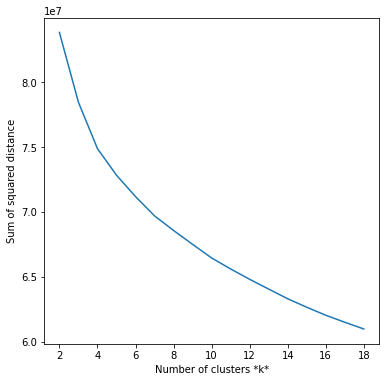

In [85]:
# Plot sse against k
plt.figure(figsize=(6, 6))
plt.plot(list_k1, sse)
plt.xlabel(r'Number of clusters *k*')
plt.ylabel('Sum of squared distance')

In [81]:
sse = []
list_k = list(range(2, 20))
for k in pbar(list_k):
    km = KMeans(n_clusters=k, random_state=22)
    km.fit(x)
    
    sse.append(km.inertia_)
# Plot sse against k
plt.figure(figsize=(6, 6))
plt.plot(list_k, sse)
plt.xlabel(r'Number of clusters *k*')
plt.ylabel('Sum of squared distance')

ValueError: Value out of range